# 🧿  ML using the CSE-CIC-IDS2018 full dataset 🧿

## 1. Import necessary libraries and modules.

In [183]:
%pip install pandas 

%pip install pyarrow 

%pip install matplotlib seaborn 

%pip install statsmodels 

%pip install scikit-learn 

%pip install imbalanced-learn

%pip install xgboost lightgbm 


Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.


In [227]:
import re                           # regular expressions
import pandas as pd                 # data manipulation
import numpy as np                  # numerical computations
import matplotlib.pyplot as plt     # plotting
import seaborn as sns               # enhanced plotting
import warnings                     # warning management
import time                         # timing operations
import pyarrow.parquet as pq        # parquet file reading
from IPython.display import display, HTML  # for displaying dataframes and HTML content
import inspect as _inspect          # for introspection (e.g., get function signatures)
from pprint import pprint           # pretty-printing
from collections import Counter     # counting occurrences
from collections import defaultdict # dictionary with default values
from dataclasses import dataclass   # structured data containers
from statsmodels.stats.outliers_influence import variance_inflation_factor  # VIF calculation
from sklearn.base import clone
from sklearn.compose import ColumnTransformer   
from sklearn.preprocessing import OneHotEncoder, LabelEncoder, StandardScaler, FunctionTransformer    # data preprocessing
from sklearn.pipeline import Pipeline               # ML pipelines
from sklearn.impute import SimpleImputer
from sklearn.metrics import (
     confusion_matrix, precision_score, recall_score, f1_score,
    roc_auc_score, average_precision_score,
    precision_recall_curve, roc_curve, det_curve,
    matthews_corrcoef, balanced_accuracy_score, accuracy_score, make_scorer, auc
)       # evaluation metrics
from sklearn.model_selection import train_test_split, StratifiedKFold, GroupKFold, RandomizedSearchCV
from sklearn.neighbors import KNeighborsClassifier
from sklearn.calibration import CalibratedClassifierCV
from scipy import sparse
from scipy.stats import randint, uniform, loguniform
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC, LinearSVC
from sklearn.decomposition import TruncatedSVD
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.ensemble import RandomForestClassifier
from lightgbm import LGBMClassifier
from sklearn.base import BaseEstimator, TransformerMixin
from xgboost import XGBClassifier
from sklearn.ensemble import AdaBoostClassifier


## 2. Data reading, EDA and statistics.

### 2a. Data examination

1.   Parquet file reading
2.   Count label frequencies (Benign - Malicious traffic & types)
3.   Data cleaning & EDA
4.   Preprocessing (Correlation & Feature engineering, Encoding categorical features, Scaling)




### DDoS Attacks

#### DDoS1-Tuesday-20-02-2018

In [228]:
try:
    #df_parquet_DDoS1_Tue_20 = pd.read_parquet("./CSE-CIC-IDS2018 - parquet/DDoS1-Tuesday-20-02-2018_TrafficForML_CICFlowMeter.parquet")
    df_parquet_DDoS1_Tue_20 = pd.read_parquet("https://huggingface.co/datasets/iraklislf/cic-ids2018-dataset/resolve/main/data/DDoS1-Tuesday-20-02-2018_TrafficForML_CICFlowMeter.parquet")
    print("Parquet file read successfully!")
    display(df_parquet_DDoS1_Tue_20)
except FileNotFoundError:
    print("Error: The specified file was not found. Please double-check the file path.")
except Exception as e:
    print(f"An error occurred: {e}")

Parquet file read successfully!


,Protocol,Flow Duration,Total Fwd Packets,Total Backward Packets,Fwd Packets Length Total,Bwd Packets Length Total,Fwd Packet Length Max,Fwd Packet Length Min,Fwd Packet Length Mean,Fwd Packet Length Std,Bwd Packet Length Max,Bwd Packet Length Min,Bwd Packet Length Mean,Bwd Packet Length Std,Flow Bytes/s,Flow Packets/s,Flow IAT Mean,Flow IAT Std,Flow IAT Max,Flow IAT Min,Fwd IAT Total,Fwd IAT Mean,Fwd IAT Std,Fwd IAT Max,Fwd IAT Min,Bwd IAT Total,Bwd IAT Mean,Bwd IAT Std,Bwd IAT Max,Bwd IAT Min,Fwd PSH Flags,Bwd PSH Flags,Fwd URG Flags,Bwd URG Flags,Fwd Header Length,Bwd Header Length,Fwd Packets/s,Bwd Packets/s,Packet Length Min,Packet Length Max,Packet Length Mean,Packet Length Std,Packet Length Variance,FIN Flag Count,SYN Flag Count,RST Flag Count,PSH Flag Count,ACK Flag Count,URG Flag Count,CWE Flag Count,ECE Flag Count,Down/Up Ratio,Avg Packet Size,Avg Fwd Segment Size,Avg Bwd Segment Size,Fwd Avg Bytes/Bulk,Fwd Avg Packets/Bulk,Fwd Avg Bulk Rate,Bwd Avg Bytes/Bulk,Bwd Avg Packets/Bulk,Bwd Avg Bulk Rate,Subflow Fwd Packets,Subflow Fwd Bytes,Subflow Bwd Packets,Subflow Bwd Bytes,Init Fwd Win Bytes,Init Bwd Win Bytes,Fwd Act Data Packets,Fwd Seg Size Min,Active Mean,Active Std,Active Max,Active Min,Idle Mean,Idle Std,Idle Max,Idle Min,Label
0,6,888751,11,11,1249,1969,736,0,113.545456,220.896072,976,0,179.000000,364.186493,3620.811678,24.753840,4.232148e+04,4.785173e+04,101609,14,888751,8.887510e+04,4.929573e+04,140273,14,788197,78819.703125,55863.187500,139285,72,0,0,0,0,360,360,12.376920,12.376920,0,976,139.913040,290.633942,84468.085938,0,0,0,1,0,0,0,0,1,146.27272,113.545456,179.000000,0,0,0,0,0,0,11,1249,11,1969,14600,233,7,32,0.0,0.0,0,0,0.0,0.000000,0,0,Benign
1,0,112642816,3,0,0,0,0,0,0.000000,0.000000,0,0,0.000000,0.000000,0.000000,0.026633,5.630000e+07,7.071068e+00,56300000,56300000,113000000,5.630000e+07,7.071068e+00,56300000,56300000,0,0.000000,0.000000,0,0,0,0,0,0,0,0,0.026633,0.000000,0,0,0.000000,0.000000,0.000000,0,0,0,0,0,0,0,0,0,0.00000,0.000000,0.000000,0,0,0,0,0,0,3,0,0,0,-1,-1,0,0,0.0,0.0,0,0,56300000.0,7.071068,56300000,56300000,Benign
2,0,112642712,3,0,0,0,0,0,0.000000,0.000000,0,0,0.000000,0.000000,0.000000,0.026633,5.630000e+07,1.838478e+01,56300000,56300000,113000000,5.630000e+07,1.838478e+01,56300000,56300000,0,0.000000,0.000000,0,0,0,0,0,0,0,0,0.026633,0.000000,0,0,0.000000,0.000000,0.000000,0,0,0,0,0,0,0,0,0,0.00000,0.000000,0.000000,0,0,0,0,0,0,3,0,0,0,-1,-1,0,0,0.0,0.0,0,0,56300000.0,18.384777,56300000,56300000,Benign
3,0,112642648,3,0,0,0,0,0,0.000000,0.000000,0,0,0.000000,0.000000,0.000000,0.026633,5.630000e+07,5.656854e+00,56300000,56300000,113000000,5.630000e+07,5.656854e+00,56300000,56300000,0,0.000000,0.000000,0,0,0,0,0,0,0,0,0.026633,0.000000,0,0,0.000000,0.000000,0.000000,0,0,0,0,0,0,0,0,0,0.00000,0.000000,0.000000,0,0,0,0,0,0,3,0,0,0,-1,-1,0,0,0.0,0.0,0,0,56300000.0,5.656854,56300000,56300000,Benign
4,0,112642702,3,0,0,0,0,0,0.000000,0.000000,0,0,0.000000,0.000000,0.000000,0.026633,5.630000e+07,6.505383e+01,56300000,56300000,113000000,5.630000e+07,6.505383e+01,56300000,56300000,0,0.000000,0.000000,0,0,0,0,0,0,0,0,0.026633,0.000000,0,0,0.000000,0.000000,0.000000,0,0,0,0,0,0,0,0,0,0.00000,0.000000,0.000000,0,0,0,0,0,0,3,0,0,0,-1,-1,0,0,0.0,0.0,0,0,56300000.0,65.053825,56300000,56300000,Benign
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
954841,17,305,1,1,41,121,41,41,41.000000,0.000000,121,121,121.000000,0.000000,531147.540984,6557.377049,3.050000e+02,0.000000e+00,305,305,0,0.000000e+00,0.000000e+00,0,0,0,0.000000,0.000000,0,0,0,0,0,0,8,8,3278.688477,3278.688477,41,121,67.666664,46.188023,2133.333252,0,0,0,0,0,0,0,0,1,101.50000,41.000000,121.000000,0,0,0,0,0,0,1,41,1,121,-1,-1,0,8,0.0,0.0,0,0,0.0,0.000000,0,0,Benign
954842

In [214]:
display(df_parquet_DDoS1_Tue_20.head())
df_parquet_DDoS1_Tue_20['Label'].value_counts(normalize=False) # count label frequencies

,Protocol,Flow Duration,Total Fwd Packets,Total Backward Packets,Fwd Packets Length Total,Bwd Packets Length Total,Fwd Packet Length Max,Fwd Packet Length Min,Fwd Packet Length Mean,Fwd Packet Length Std,Bwd Packet Length Max,Bwd Packet Length Min,Bwd Packet Length Mean,Bwd Packet Length Std,Flow Bytes/s,Flow Packets/s,Flow IAT Mean,Flow IAT Std,Flow IAT Max,Flow IAT Min,Fwd IAT Total,Fwd IAT Mean,Fwd IAT Std,Fwd IAT Max,Fwd IAT Min,Bwd IAT Total,Bwd IAT Mean,Bwd IAT Std,Bwd IAT Max,Bwd IAT Min,Fwd PSH Flags,Bwd PSH Flags,Fwd URG Flags,Bwd URG Flags,Fwd Header Length,Bwd Header Length,Fwd Packets/s,Bwd Packets/s,Packet Length Min,Packet Length Max,Packet Length Mean,Packet Length Std,Packet Length Variance,FIN Flag Count,SYN Flag Count,RST Flag Count,PSH Flag Count,ACK Flag Count,URG Flag Count,CWE Flag Count,ECE Flag Count,Down/Up Ratio,Avg Packet Size,Avg Fwd Segment Size,Avg Bwd Segment Size,Fwd Avg Bytes/Bulk,Fwd Avg Packets/Bulk,Fwd Avg Bulk Rate,Bwd Avg Bytes/Bulk,Bwd Avg Packets/Bulk,Bwd Avg Bulk Rate,Subflow Fwd Packets,Subflow Fwd Bytes,Subflow Bwd Packets,Subflow Bwd Bytes,Init Fwd Win Bytes,Init Bwd Win Bytes,Fwd Act Data Packets,Fwd Seg Size Min,Active Mean,Active Std,Active Max,Active Min,Idle Mean,Idle Std,Idle Max,Idle Min,Label
0,6,888751,11,11,1249,1969,736,0,113.545456,220.896072,976,0,179.0,364.186493,3620.811678,24.753840,4.232148e+04,47851.734375,101609,14,888751,8.887510e+04,49295.734375,140273,14,788197,78819.703125,55863.1875,139285,72,0,0,0,0,360,360,12.376920,12.37692,0,976,139.91304,290.633942,84468.085938,0,0,0,1,0,0,0,0,1,146.27272,113.545456,179.0,0,0,0,0,0,0,11,1249,11,1969,14600,233,7,32,0.0,0.0,0,0,0.0,0.000000,0,0,Benign
1,0,112642816,3,0,0,0,0,0,0.000000,0.000000,0,0,0.0,0.000000,0.000000,0.026633,5.630000e+07,7.071068,56300000,56300000,113000000,5.630000e+07,7.071068,56300000,56300000,0,0.000000,0.0000,0,0,0,0,0,0,0,0,0.026633,0.00000,0,0,0.00000,0.000000,0.000000,0,0,0,0,0,0,0,0,0,0.00000,0.000000,0.0,0,0,0,0,0,0,3,0,0,0,-1,-1,0,0,0.0,0.0,0,0,56300000.0,7.071068,56300000,56300000,Benign
2,0,112642712,3,0,0,0,0,0,0.000000,0.000000,0,0,0.0,0.000000,0.000000,0.026633,5.630000e+07,18.384777,56300000,56300000,113000000,5.630000e+07,18.384777,56300000,56300000,0,0.000000,0.0000,0,0,0,0,0,0,0,0,0.026633,0.00000,0,0,0.00000,0.000000,0.000000,0,0,0,0,0,0,0,0,0,0.00000,0.000000,0.0,0,0,0,0,0,0,3,0,0,0,-1,-1,0,0,0.0,0.0,0,0,56300000.0,18.384777,56300000,56300000,Benign
3,0,112642648,3,0,0,0,0,0,0.000000,0.000000,0,0,0.0,0.000000,0.000000,0.026633,5.630000e+07,5.656854,56300000,56300000,113000000,5.630000e+07,5.656854,56300000,56300000,0,0.000000,0.0000,0,0,0,0,0,0,0,0,0.026633,0.00000,0,0,0.00000,0.000000,0.000000,0,0,0,0,0,0,0,0,0,0.00000,0.000000,0.0,0,0,0,0,0,0,3,0,0,0,-1,-1,0,0,0.0,0.0,0,0,56300000.0,5.656854,56300000,56300000,Benign
4,0,112642702,3,0,0,0,0,0,0.000000,0.000000,0,0,0.0,0.000000,0.000000,0.026633,5.630000e+07,65.053825,56300000,56300000,113000000,5.630000e+07,65.053825,56300000,56300000,0,0.000000,0.0000,0,0,0,0,0,0,0,0,0.026633,0.00000,0,0,0.00000,0.000000,0.000000,0,0,0,0,0,0,0,0,0,0.00000,0.000000,0.0,0,0,0,0,0,0,3,0,0,0,-1,-1,0,0,0.0,0.0,0,0,56300000.0,65.053825,56300000,56300000,Benign


Label
DDoS attacks-LOIC-HTTP    575364
Benign                    379482
Name: count, dtype: int64

#### DDoS2-Wednesday-21-02-2018

In [215]:
#df_parquet_DDoS2_Wed_21 = pd.read_parquet("./CSE-CIC-IDS2018 - parquet/DDoS2-Wednesday-21-02-2018_TrafficForML_CICFlowMeter.parquet")
df_parquet_DDoS2_Wed_21 = pd.read_parquet("https://huggingface.co/datasets/iraklislf/cic-ids2018-dataset/resolve/main/data/DDoS2-Wednesday-21-02-2018_TrafficForML_CICFlowMeter.parquet")
display(df_parquet_DDoS2_Wed_21.head())
df_parquet_DDoS2_Wed_21['Label'].value_counts(normalize=False)

,Protocol,Flow Duration,Total Fwd Packets,Total Backward Packets,Fwd Packets Length Total,Bwd Packets Length Total,Fwd Packet Length Max,Fwd Packet Length Min,Fwd Packet Length Mean,Fwd Packet Length Std,Bwd Packet Length Max,Bwd Packet Length Min,Bwd Packet Length Mean,Bwd Packet Length Std,Flow Bytes/s,Flow Packets/s,Flow IAT Mean,Flow IAT Std,Flow IAT Max,Flow IAT Min,Fwd IAT Total,Fwd IAT Mean,Fwd IAT Std,Fwd IAT Max,Fwd IAT Min,Bwd IAT Total,Bwd IAT Mean,Bwd IAT Std,Bwd IAT Max,Bwd IAT Min,Fwd PSH Flags,Bwd PSH Flags,Fwd URG Flags,Bwd URG Flags,Fwd Header Length,Bwd Header Length,Fwd Packets/s,Bwd Packets/s,Packet Length Min,Packet Length Max,Packet Length Mean,Packet Length Std,Packet Length Variance,FIN Flag Count,SYN Flag Count,RST Flag Count,PSH Flag Count,ACK Flag Count,URG Flag Count,CWE Flag Count,ECE Flag Count,Down/Up Ratio,Avg Packet Size,Avg Fwd Segment Size,Avg Bwd Segment Size,Fwd Avg Bytes/Bulk,Fwd Avg Packets/Bulk,Fwd Avg Bulk Rate,Bwd Avg Bytes/Bulk,Bwd Avg Packets/Bulk,Bwd Avg Bulk Rate,Subflow Fwd Packets,Subflow Fwd Bytes,Subflow Bwd Packets,Subflow Bwd Bytes,Init Fwd Win Bytes,Init Bwd Win Bytes,Fwd Act Data Packets,Fwd Seg Size Min,Active Mean,Active Std,Active Max,Active Min,Idle Mean,Idle Std,Idle Max,Idle Min,Label
0,6,37953,5,3,135,127,135,0,27.0,60.373837,127,0,42.333332,73.323486,6903.274902,210.787033,5.421857e+03,5.403580e+03,12099,23,37953,9488.25,3.245485e+03,12382,6013,19960,9980.0,13546.751953,19559,401,0,0,0,0,168,104,131.741898,79.045135,0,135,29.111111,57.800182,3340.861084,0,0,0,1,0,0,0,0,0,32.750000,27.0,42.333332,0,0,0,0,0,0,5,135,3,127,29200,219,1,32,0.0,0.0,0,0,0.0,0.0,0,0,Benign
1,17,117573474,3,0,1500,0,500,500,500.0,0.000000,0,0,0.000000,0.000000,12.757979,0.025516,5.880000e+07,2.380000e+07,75600000,42000000,118000000,58800000.00,2.380000e+07,75600000,42000000,0,0.0,0.000000,0,0,0,0,0,0,24,0,0.025516,0.000000,500,500,500.000000,0.000000,0.000000,0,0,0,0,0,0,0,0,0,666.666687,500.0,0.000000,0,0,0,0,0,0,3,1500,0,0,-1,-1,2,8,0.0,0.0,0,0,58800000.0,23800000.0,75600000,42000000,Benign
2,17,99743998,5,0,2500,0,500,500,500.0,0.000000,0,0,0.000000,0.000000,25.064165,0.050128,2.490000e+07,3.400000e+07,75600000,4000290,99700000,24900000.00,3.400000e+07,75600000,4000290,0,0.0,0.000000,0,0,0,0,0,0,40,0,0.050128,0.000000,500,500,500.000000,0.000000,0.000000,0,0,0,0,0,0,0,0,0,600.000000,500.0,0.000000,0,0,0,0,0,0,5,2500,0,0,-1,-1,4,8,4000290.0,0.0,4000290,4000290,31900000.0,37900000.0,75600000,7200397,Benign
3,17,99743999,5,0,2500,0,500,500,500.0,0.000000,0,0,0.000000,0.000000,25.064165,0.050128,2.490000e+07,3.400000e+07,75600000,4000286,99700000,24900000.00,3.400000e+07,75600000,4000286,0,0.0,0.000000,0,0,0,0,0,0,40,0,0.050128,0.000000,500,500,500.000000,0.000000,0.000000,0,0,0,0,0,0,0,0,0,600.000000,500.0,0.000000,0,0,0,0,0,0,5,2500,0,0,-1,-1,4,8,4000286.0,0.0,4000286,4000286,31900000.0,37900000.0,75600000,7200399,Benign
4,17,89479580,6,0,3000,0,500,500,500.0,0.000000,0,0,0.000000,0.000000,33.527203,0.067054,1.790000e+07,1.530000e+07,42000000,4000308,89500000,17900000.00,1.530000e+07,42000000,4000308,0,0.0,0.000000,0,0,0,0,0,0,48,0,0.067054,0.000000,500,500,500.000000,0.000000,0.000000,0,0,0,0,0,0,0,0,0,583.333313,500.0,0.000000,0,0,0,0,0,0,6,3000,0,0,-1,-1,5,8,4000308.0,0.0,4000308,4000308,21400000.0,15300000.0,42000000,7200316,Benign


Label
Benign                  360805
DDOS attack-HOIC        198861
DDOS attack-LOIC-UDP      1730
Name: count, dtype: int64

### DoS Attacks

#### DoS1-Thursday-15-02-2018

In [ ]:
#df_parquet_DoS1_Thu_15 = pd.read_parquet("./CSE-CIC-IDS2018 - parquet/DoS1-Thursday-15-02-2018_TrafficForML_CICFlowMeter.parquet")
df_parquet_DoS1_Thu_15 = pd.read_parquet("https://huggingface.co/datasets/iraklislf/cic-ids2018-dataset/resolve/main/data/DoS1-Thursday-15-02-2018_TrafficForML_CICFlowMeter.parquet")
display(df_parquet_DoS1_Thu_15.head())
df_parquet_DoS1_Thu_15['Label'].value_counts(normalize=False)

,Protocol,Flow Duration,Total Fwd Packets,Total Backward Packets,Fwd Packets Length Total,Bwd Packets Length Total,Fwd Packet Length Max,Fwd Packet Length Min,Fwd Packet Length Mean,Fwd Packet Length Std,Bwd Packet Length Max,Bwd Packet Length Min,Bwd Packet Length Mean,Bwd Packet Length Std,Flow Bytes/s,Flow Packets/s,Flow IAT Mean,Flow IAT Std,Flow IAT Max,Flow IAT Min,Fwd IAT Total,Fwd IAT Mean,Fwd IAT Std,Fwd IAT Max,Fwd IAT Min,Bwd IAT Total,Bwd IAT Mean,Bwd IAT Std,Bwd IAT Max,Bwd IAT Min,Fwd PSH Flags,Bwd PSH Flags,Fwd URG Flags,Bwd URG Flags,Fwd Header Length,Bwd Header Length,Fwd Packets/s,Bwd Packets/s,Packet Length Min,Packet Length Max,Packet Length Mean,Packet Length Std,Packet Length Variance,FIN Flag Count,SYN Flag Count,RST Flag Count,PSH Flag Count,ACK Flag Count,URG Flag Count,CWE Flag Count,ECE Flag Count,Down/Up Ratio,Avg Packet Size,Avg Fwd Segment Size,Avg Bwd Segment Size,Fwd Avg Bytes/Bulk,Fwd Avg Packets/Bulk,Fwd Avg Bulk Rate,Bwd Avg Bytes/Bulk,Bwd Avg Packets/Bulk,Bwd Avg Bulk Rate,Subflow Fwd Packets,Subflow Fwd Bytes,Subflow Bwd Packets,Subflow Bwd Bytes,Init Fwd Win Bytes,Init Bwd Win Bytes,Fwd Act Data Packets,Fwd Seg Size Min,Active Mean,Active Std,Active Max,Active Min,Idle Mean,Idle Std,Idle Max,Idle Min,Label
0,0,112641158,3,0,0,0,0,0,0.000000,0.000000,0,0,0.000000,0.000000,0.000000,0.026633,56320580.0,7.042784e+02,56321077,56320081,112641158,56320580.00,7.042784e+02,56321077,56320081,0,0.0,0.0,0,0,0,0,0,0,0,0,0.026633,0.000000,0,0,0.000000,0.000000,0.000000,0,0,0,0,0,0,0,0,0,0.0,0.000000,0.000000,0,0,0,0,0,0,3,0,0,0,-1,-1,0,0,0.0,0.00,0,0,56320580.0,7.042784e+02,56321077,56320081,Benign
1,6,37366762,14,12,2168,2993,712,0,154.857147,254.855270,976,0,249.416672,395.929382,138.117400,0.695806,1494670.5,3.894924e+06,15617415,7,37366762,2874366.25,5.104444e+06,15617415,40,37366730,3396975.5,5564224.0,15936762,893,0,0,0,0,456,416,0.374665,0.321141,0,976,191.148148,320.122894,102478.671875,0,0,0,1,0,0,0,0,0,198.5,154.857147,249.416672,0,0,0,0,0,0,14,2168,12,2993,29200,232,8,32,1024353.0,649038.75,1601183,321569,11431221.0,3.644990e+06,15617415,8960247,Benign
2,6,543,2,0,64,0,64,0,32.000000,45.254833,0,0,0.000000,0.000000,117863.720074,3683.241252,543.0,0.000000e+00,543,543,543,543.00,0.000000e+00,543,543,0,0.0,0.0,0,0,1,0,0,0,64,0,3683.241211,0.000000,0,64,42.666668,36.950417,1365.333374,0,1,0,0,1,0,0,0,0,64.0,32.000000,0.000000,0,0,0,0,0,0,2,64,0,0,244,-1,0,32,0.0,0.00,0,0,0.0,0.000000e+00,0,0,Benign
3,0,112640703,3,0,0,0,0,0,0.000000,0.000000,0,0,0.000000,0.000000,0.000000,0.026633,56320352.0,3.669884e+02,56320611,56320092,112640703,56320352.00,3.669884e+02,56320611,56320092,0,0.0,0.0,0,0,0,0,0,0,0,0,0.026633,0.000000,0,0,0.000000,0.000000,0.000000,0,0,0,0,0,0,0,0,0,0.0,0.000000,0.000000,0,0,0,0,0,0,3,0,0,0,-1,-1,0,0,0.0,0.00,0,0,56320352.0,3.669884e+02,56320611,56320092,Benign
4,0,112640874,3,0,0,0,0,0,0.000000,0.000000,0,0,0.000000,0.000000,0.000000,0.026633,56320436.0,7.198347e+02,56320946,56319928,112640874,56320436.00,7.198347e+02,56320946,56319928,0,0.0,0.0,0,0,0,0,0,0,0,0,0.026633,0.000000,0,0,0.000000,0.000000,0.000000,0,0,0,0,0,0,0,0,0,0.0,0.000000,0.000000,0,0,0,0,0,0,3,0,0,0,-1,-1,0,0,0.0,0.00,0,0,56320436.0,7.198347e+02,56320946,56319928,Benign


Label
Benign                   743498
DoS attacks-GoldenEye     41406
DoS attacks-Slowloris      9908
Name: count, dtype: int64

#### DoS2-Friday-16-02-2018

In [216]:
#df_parquet_DoS2_Fri_16 = pd.read_parquet("./CSE-CIC-IDS2018 - parquet/DoS2-Friday-16-02-2018_TrafficForML_CICFlowMeter.parquet")
df_parquet_DoS2_Fri_16 = pd.read_parquet("https://huggingface.co/datasets/iraklislf/cic-ids2018-dataset/resolve/main/data/DoS2-Friday-16-02-2018_TrafficForML_CICFlowMeter.parquet")
display(df_parquet_DoS2_Fri_16.head())
df_parquet_DoS2_Fri_16['Label'].value_counts(normalize=False)

,Protocol,Flow Duration,Total Fwd Packets,Total Backward Packets,Fwd Packets Length Total,Bwd Packets Length Total,Fwd Packet Length Max,Fwd Packet Length Min,Fwd Packet Length Mean,Fwd Packet Length Std,Bwd Packet Length Max,Bwd Packet Length Min,Bwd Packet Length Mean,Bwd Packet Length Std,Flow Bytes/s,Flow Packets/s,Flow IAT Mean,Flow IAT Std,Flow IAT Max,Flow IAT Min,Fwd IAT Total,Fwd IAT Mean,Fwd IAT Std,Fwd IAT Max,Fwd IAT Min,Bwd IAT Total,Bwd IAT Mean,Bwd IAT Std,Bwd IAT Max,Bwd IAT Min,Fwd PSH Flags,Bwd PSH Flags,Fwd URG Flags,Bwd URG Flags,Fwd Header Length,Bwd Header Length,Fwd Packets/s,Bwd Packets/s,Packet Length Min,Packet Length Max,Packet Length Mean,Packet Length Std,Packet Length Variance,FIN Flag Count,SYN Flag Count,RST Flag Count,PSH Flag Count,ACK Flag Count,URG Flag Count,CWE Flag Count,ECE Flag Count,Down/Up Ratio,Avg Packet Size,Avg Fwd Segment Size,Avg Bwd Segment Size,Fwd Avg Bytes/Bulk,Fwd Avg Packets/Bulk,Fwd Avg Bulk Rate,Bwd Avg Bytes/Bulk,Bwd Avg Packets/Bulk,Bwd Avg Bulk Rate,Subflow Fwd Packets,Subflow Fwd Bytes,Subflow Bwd Packets,Subflow Bwd Bytes,Init Fwd Win Bytes,Init Bwd Win Bytes,Fwd Act Data Packets,Fwd Seg Size Min,Active Mean,Active Std,Active Max,Active Min,Idle Mean,Idle Std,Idle Max,Idle Min,Label
0,0,112640768,3,0,0,0,0,0,0.00000,0.000000,0,0,0.000000,0.000000,0.00000,0.026633,56300000.00,1.385929e+02,56300000,56300000,113000000,56300000.00,1.385929e+02,56300000,56300000,0,0.00000,0.000,0,0,0,0,0,0,0,0,0.026633,0.000000,0,0,0.000000,0.000000,0.000000,0,0,0,0,0,0,0,0,0,0.000000,0.00000,0.000000,0,0,0,0,0,0,3,0,0,0,-1,-1,0,0,0.0,0.0,0,0,56300000.0,138.592926,56300000,56300000,Benign
1,0,112641773,3,0,0,0,0,0,0.00000,0.000000,0,0,0.000000,0.000000,0.00000,0.026633,56300000.00,2.637508e+02,56300000,56300000,113000000,56300000.00,2.637508e+02,56300000,56300000,0,0.00000,0.000,0,0,0,0,0,0,0,0,0.026633,0.000000,0,0,0.000000,0.000000,0.000000,0,0,0,0,0,0,0,0,0,0.000000,0.00000,0.000000,0,0,0,0,0,0,3,0,0,0,-1,-1,0,0,0.0,0.0,0,0,56300000.0,263.750824,56300000,56300000,Benign
2,6,20784143,23,44,2416,1344,240,64,105.04348,54.542294,64,0,30.545454,32.336498,180.90715,3.223611,314911.25,1.145954e+06,9058214,66,20700000,940484.25,1.898330e+06,9144734,66,20700000,482352.21875,1396411.125,9058214,41601,1,0,0,0,460,880,1.106613,2.116998,0,240,56.235294,53.851681,2900.003418,0,1,0,0,1,0,0,0,1,57.074627,105.04348,30.545454,0,0,0,0,0,0,23,2416,44,1344,263,255,22,20,2624734.0,0.0,2624734,2624734,9058214.0,0.000000,9058214,9058214,Benign
3,0,112640836,3,0,0,0,0,0,0.00000,0.000000,0,0,0.000000,0.000000,0.00000,0.026633,56300000.00,8.202438e+01,56300000,56300000,113000000,56300000.00,8.202438e+01,56300000,56300000,0,0.00000,0.000,0,0,0,0,0,0,0,0,0.026633,0.000000,0,0,0.000000,0.000000,0.000000,0,0,0,0,0,0,0,0,0,0.000000,0.00000,0.000000,0,0,0,0,0,0,3,0,0,0,-1,-1,0,0,0.0,0.0,0,0,56300000.0,82.024384,56300000,56300000,Benign
4,6,20,1,1,0,0,0,0,0.00000,0.000000,0,0,0.000000,0.000000,0.00000,100000.000000,20.00,0.000000e+00,20,20,0,0.00,0.000000e+00,0,0,0,0.00000,0.000,0,0,0,0,0,0,20,20,50000.000000,50000.000000,0,0,0.000000,0.000000,0.000000,0,0,0,1,0,0,0,0,1,0.000000,0.00000,0.000000,0,0,0,0,0,0,1,0,1,0,58856,0,0,20,0.0,0.0,0,0,0.0,0.000000,0,0,Benign


Label
Benign                      446619
DoS attacks-Hulk            145199
DoS attacks-SlowHTTPTest        55
Name: count, dtype: int64

#### Botnet-Friday-02-03-2018

In [217]:
#df_parquet_Bot_Fri_02 = pd.read_parquet("./CSE-CIC-IDS2018 - parquet/Botnet-Friday-02-03-2018_TrafficForML_CICFlowMeter.parquet")
df_parquet_Bot_Fri_02 = pd.read_parquet("https://huggingface.co/datasets/iraklislf/cic-ids2018-dataset/resolve/main/data/Botnet-Friday-02-03-2018_TrafficForML_CICFlowMeter.parquet")
display(df_parquet_Bot_Fri_02.head())
df_parquet_Bot_Fri_02['Label'].value_counts(normalize=False)

,Protocol,Flow Duration,Total Fwd Packets,Total Backward Packets,Fwd Packets Length Total,Bwd Packets Length Total,Fwd Packet Length Max,Fwd Packet Length Min,Fwd Packet Length Mean,Fwd Packet Length Std,Bwd Packet Length Max,Bwd Packet Length Min,Bwd Packet Length Mean,Bwd Packet Length Std,Flow Bytes/s,Flow Packets/s,Flow IAT Mean,Flow IAT Std,Flow IAT Max,Flow IAT Min,Fwd IAT Total,Fwd IAT Mean,Fwd IAT Std,Fwd IAT Max,Fwd IAT Min,Bwd IAT Total,Bwd IAT Mean,Bwd IAT Std,Bwd IAT Max,Bwd IAT Min,Fwd PSH Flags,Bwd PSH Flags,Fwd URG Flags,Bwd URG Flags,Fwd Header Length,Bwd Header Length,Fwd Packets/s,Bwd Packets/s,Packet Length Min,Packet Length Max,Packet Length Mean,Packet Length Std,Packet Length Variance,FIN Flag Count,SYN Flag Count,RST Flag Count,PSH Flag Count,ACK Flag Count,URG Flag Count,CWE Flag Count,ECE Flag Count,Down/Up Ratio,Avg Packet Size,Avg Fwd Segment Size,Avg Bwd Segment Size,Fwd Avg Bytes/Bulk,Fwd Avg Packets/Bulk,Fwd Avg Bulk Rate,Bwd Avg Bytes/Bulk,Bwd Avg Packets/Bulk,Bwd Avg Bulk Rate,Subflow Fwd Packets,Subflow Fwd Bytes,Subflow Bwd Packets,Subflow Bwd Bytes,Init Fwd Win Bytes,Init Bwd Win Bytes,Fwd Act Data Packets,Fwd Seg Size Min,Active Mean,Active Std,Active Max,Active Min,Idle Mean,Idle Std,Idle Max,Idle Min,Label
0,6,141385,9,7,553,3773.0,202,0,61.444443,87.534439,1460,0,539.000000,655.432922,30597.30523,113.166178,9425.666992,19069.117188,73403.0,1.0,141385.0,17673.125000,23965.324219,73403.0,22.0,51417.0,8569.500000,13036.890625,31525.0,1.0,0,0,0,0,192,152,63.655975,49.510204,0,1460,254.470581,474.712952,225352.390625,0,0,1,1,0,0,0,1,0,270.375000,61.444443,539.000000,0,0,0,0,0,0,9,553,7,3773,8192,119,4,20,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Benign
1,6,281,2,1,38,0.0,38,0,19.000000,26.870058,0,0,0.000000,0.000000,135231.31670,10676.156580,140.500000,174.655380,264.0,17.0,281.0,281.000000,0.000000,281.0,281.0,0.0,0.000000,0.000000,0.0,0.0,1,0,0,0,40,20,7117.437500,3558.718750,0,38,19.000000,21.939310,481.333344,0,1,0,0,1,0,0,0,0,25.333334,19.000000,0.000000,0,0,0,0,0,0,2,38,1,0,123,0,0,20,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Benign
2,6,279824,11,15,1086,10527.0,385,0,98.727272,129.392502,1460,0,701.799988,636.314209,41501.08640,92.915547,11192.959961,24379.449219,112589.0,1.0,279728.0,27972.800781,36167.742188,112589.0,94.0,258924.0,18494.572266,36356.503906,133669.0,1.0,0,0,0,0,232,312,39.310425,53.605122,0,1460,430.111115,566.234192,320621.187500,0,0,1,1,0,0,0,1,1,446.653839,98.727272,701.799988,0,0,0,0,0,0,11,1086,15,10527,8192,1047,5,20,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Benign
3,6,132,2,0,0,0.0,0,0,0.000000,0.000000,0,0,0.000000,0.000000,0.00000,15151.515150,132.000000,0.000000,132.0,132.0,132.0,132.000000,0.000000,132.0,132.0,0.0,0.000000,0.000000,0.0,0.0,0,0,0,0,40,0,15151.515625,0.000000,0,0,0.000000,0.000000,0.000000,0,0,0,0,1,0,0,0,0,0.000000,0.000000,0.000000,0,0,0,0,0,0,2,0,0,0,256,-1,0,20,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Benign
4,6,274016,9,13,1285,6141.0,517,0,142.777771,183.887726,1460,0,472.384613,611.180481,27100.60726,80.287282,13048.380859,26311.626953,114077.0,1.0,273946.0,34243.250000,37996.566406,114077.0,201.0,252994.0,21082.833984,39075.738281,135611.0,1.0,0,0,0,0,192,272,32.844799,47.442486,0,1460,322.869568,497.254761,247262.296875,0,0,1,1,0,0,0,1,1,337.545441,142.777771,472.384613,0,0,0,0,0,0,9,1285,13,6141,8192,1047,5,20,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Benign


Label
Benign    627052
Bot       144535
Name: count, dtype: int64

#### Bruteforce-Wednesday-14-02-2018_TrafficForML_CICFlowMeter

In [218]:
#df_parquet_Brute_Wed_14 = pd.read_parquet("./CSE-CIC-IDS2018 - parquet/Bruteforce-Wednesday-14-02-2018_TrafficForML_CICFlowMeter.parquet")
df_parquet_Brute_Wed_14 = pd.read_parquet("https://huggingface.co/datasets/iraklislf/cic-ids2018-dataset/resolve/main/data/Bruteforce-Wednesday-14-02-2018_TrafficForML_CICFlowMeter.parquet")
display(df_parquet_Brute_Wed_14.head())
df_parquet_Brute_Wed_14['Label'].value_counts(normalize=False)

,Protocol,Flow Duration,Total Fwd Packets,Total Backward Packets,Fwd Packets Length Total,Bwd Packets Length Total,Fwd Packet Length Max,Fwd Packet Length Min,Fwd Packet Length Mean,Fwd Packet Length Std,Bwd Packet Length Max,Bwd Packet Length Min,Bwd Packet Length Mean,Bwd Packet Length Std,Flow Bytes/s,Flow Packets/s,Flow IAT Mean,Flow IAT Std,Flow IAT Max,Flow IAT Min,Fwd IAT Total,Fwd IAT Mean,Fwd IAT Std,Fwd IAT Max,Fwd IAT Min,Bwd IAT Total,Bwd IAT Mean,Bwd IAT Std,Bwd IAT Max,Bwd IAT Min,Fwd PSH Flags,Bwd PSH Flags,Fwd URG Flags,Bwd URG Flags,Fwd Header Length,Bwd Header Length,Fwd Packets/s,Bwd Packets/s,Packet Length Min,Packet Length Max,Packet Length Mean,Packet Length Std,Packet Length Variance,FIN Flag Count,SYN Flag Count,RST Flag Count,PSH Flag Count,ACK Flag Count,URG Flag Count,CWE Flag Count,ECE Flag Count,Down/Up Ratio,Avg Packet Size,Avg Fwd Segment Size,Avg Bwd Segment Size,Fwd Avg Bytes/Bulk,Fwd Avg Packets/Bulk,Fwd Avg Bulk Rate,Bwd Avg Bytes/Bulk,Bwd Avg Packets/Bulk,Bwd Avg Bulk Rate,Subflow Fwd Packets,Subflow Fwd Bytes,Subflow Bwd Packets,Subflow Bwd Bytes,Init Fwd Win Bytes,Init Bwd Win Bytes,Fwd Act Data Packets,Fwd Seg Size Min,Active Mean,Active Std,Active Max,Active Min,Idle Mean,Idle Std,Idle Max,Idle Min,Label
0,0,112641719,3,0,0,0,0,0,0.000000,0.000000,0,0,0.000000,0.000000,0.000000,0.026633,5.632086e+07,139.300034,56320958,56320761,112641719,5.632086e+07,139.300034,56320958,56320761,0,0.0000,0.00000,0,0,0,0,0,0,0,0,0.026633,0.000000,0,0,0.00000,0.000000,0.000000,0,0,0,0,0,0,0,0,0,0.000000,0.000000,0.000000,0,0,0,0,0,0,3,0,0,0,-1,-1,0,0,0.0,0.0,0,0,56320860.0,139.300034,56320958,56320761,Benign
1,0,112641466,3,0,0,0,0,0,0.000000,0.000000,0,0,0.000000,0.000000,0.000000,0.026633,5.632073e+07,114.551300,56320814,56320652,112641466,5.632073e+07,114.551300,56320814,56320652,0,0.0000,0.00000,0,0,0,0,0,0,0,0,0.026633,0.000000,0,0,0.00000,0.000000,0.000000,0,0,0,0,0,0,0,0,0,0.000000,0.000000,0.000000,0,0,0,0,0,0,3,0,0,0,-1,-1,0,0,0.0,0.0,0,0,56320732.0,114.551300,56320814,56320652,Benign
2,0,112638623,3,0,0,0,0,0,0.000000,0.000000,0,0,0.000000,0.000000,0.000000,0.026634,5.631931e+07,301.934601,56319525,56319098,112638623,5.631931e+07,301.934601,56319525,56319098,0,0.0000,0.00000,0,0,0,0,0,0,0,0,0.026634,0.000000,0,0,0.00000,0.000000,0.000000,0,0,0,0,0,0,0,0,0,0.000000,0.000000,0.000000,0,0,0,0,0,0,3,0,0,0,-1,-1,0,0,0.0,0.0,0,0,56319312.0,301.934601,56319525,56319098,Benign
3,6,6453966,15,10,1239,2273,744,0,82.599998,196.741241,976,0,227.300003,371.677887,544.161528,3.873587,2.689152e+05,247443.781250,673900,22,6453966,4.609976e+05,123109.421875,673900,229740,5637902,626433.5625,455082.21875,1167293,554,0,0,0,0,488,328,2.324152,1.549435,0,976,135.07692,277.834747,77192.156250,0,0,0,1,0,0,0,0,0,140.479996,82.599998,227.300003,0,0,0,0,0,0,15,1239,10,2273,65535,233,6,32,0.0,0.0,0,0,0.0,0.000000,0,0,Benign
4,6,8804066,14,11,1143,2209,744,0,81.642860,203.745544,976,0,200.818176,362.249878,380.733175,2.839597,3.668361e+05,511356.625000,1928102,21,8804066,6.772359e+05,532417.000000,1928102,246924,7715481,771548.1250,755543.06250,2174893,90,0,0,0,0,456,360,1.590174,1.249423,0,976,128.92308,279.763031,78267.351562,0,0,0,1,0,0,0,0,0,134.080002,81.642860,200.818176,0,0,0,0,0,0,14,1143,11,2209,5808,233,6,32,0.0,0.0,0,0,0.0,0.000000,0,0,Benign


Label
Benign            525245
SSH-Bruteforce     94048
FTP-BruteForce        53
Name: count, dtype: int64

#### Infil1-Wednesday-28-02-2018

In [219]:
#df_parquet_Infil1_Wed_28 = pd.read_parquet("./CSE-CIC-IDS2018 - parquet/Infil1-Wednesday-28-02-2018_TrafficForML_CICFlowMeter.parquet")
df_parquet_Infil1_Wed_28 = pd.read_parquet("https://huggingface.co/datasets/iraklislf/cic-ids2018-dataset/resolve/main/data/Infil1-Wednesday-28-02-2018_TrafficForML_CICFlowMeter.parquet")
display(df_parquet_Infil1_Wed_28.head())
df_parquet_Infil1_Wed_28['Label'].value_counts(normalize=False)

,Protocol,Flow Duration,Total Fwd Packets,Total Backward Packets,Fwd Packets Length Total,Bwd Packets Length Total,Fwd Packet Length Max,Fwd Packet Length Min,Fwd Packet Length Mean,Fwd Packet Length Std,Bwd Packet Length Max,Bwd Packet Length Min,Bwd Packet Length Mean,Bwd Packet Length Std,Flow Bytes/s,Flow Packets/s,Flow IAT Mean,Flow IAT Std,Flow IAT Max,Flow IAT Min,Fwd IAT Total,Fwd IAT Mean,Fwd IAT Std,Fwd IAT Max,Fwd IAT Min,Bwd IAT Total,Bwd IAT Mean,Bwd IAT Std,Bwd IAT Max,Bwd IAT Min,Fwd PSH Flags,Bwd PSH Flags,Fwd URG Flags,Bwd URG Flags,Fwd Header Length,Bwd Header Length,Fwd Packets/s,Bwd Packets/s,Packet Length Min,Packet Length Max,Packet Length Mean,Packet Length Std,Packet Length Variance,FIN Flag Count,SYN Flag Count,RST Flag Count,PSH Flag Count,ACK Flag Count,URG Flag Count,CWE Flag Count,ECE Flag Count,Down/Up Ratio,Avg Packet Size,Avg Fwd Segment Size,Avg Bwd Segment Size,Fwd Avg Bytes/Bulk,Fwd Avg Packets/Bulk,Fwd Avg Bulk Rate,Bwd Avg Bytes/Bulk,Bwd Avg Packets/Bulk,Bwd Avg Bulk Rate,Subflow Fwd Packets,Subflow Fwd Bytes,Subflow Bwd Packets,Subflow Bwd Bytes,Init Fwd Win Bytes,Init Bwd Win Bytes,Fwd Act Data Packets,Fwd Seg Size Min,Active Mean,Active Std,Active Max,Active Min,Idle Mean,Idle Std,Idle Max,Idle Min,Label
0,6,94658,6,7,708,3718,387,0,118.0,159.284653,1460,0,531.142883,673.118225,46757.801771,137.336517,7888.166504,11130.042969,24325,0,72880,14576.000000,12590.383789,24385,363,72178,12029.666992,13189.257812,24718,0,0,0,0,0,132,152,63.386086,73.950432,0,1460,316.142853,519.205872,269574.75,0,0,1,1,0,0,0,1,1,340.461548,118.0,531.142883,0,0,0,0,0,0,6,708,7,3718,8192,7484,3,20,0.0,0.0,0,0,0.0,0.0,0,0,Benign
1,6,206,2,0,0,0,0,0,0.0,0.000000,0,0,0.000000,0.000000,0.000000,9708.737864,206.000000,0.000000,206,206,206,206.000000,0.000000,206,206,0,0.000000,0.000000,0,0,0,0,0,0,40,0,9708.738281,0.000000,0,0,0.000000,0.000000,0.00,0,0,0,0,1,0,0,0,0,0.000000,0.0,0.000000,0,0,0,0,0,0,2,0,0,0,258,-1,0,20,0.0,0.0,0,0,0.0,0.0,0,0,Benign
2,6,165505,3,1,0,0,0,0,0.0,0.000000,0,0,0.000000,0.000000,0.000000,24.168454,55168.332031,95478.148438,165417,35,165505,82752.500000,116980.210938,165470,35,0,0.000000,0.000000,0,0,0,0,0,0,72,32,18.126341,6.042113,0,0,0.000000,0.000000,0.00,0,0,0,1,0,0,0,0,0,0.000000,0.0,0.000000,0,0,0,0,0,0,3,0,1,0,8192,8192,0,20,0.0,0.0,0,0,0.0,0.0,0,0,Benign
3,6,102429,6,7,708,3718,387,0,118.0,159.284653,1460,0,531.142883,673.118225,43210.418924,126.917182,8535.750000,10956.637695,24473,0,80271,16054.200195,14269.753906,31379,366,79733,13288.833008,14753.482422,30931,0,0,0,0,0,132,152,58.577160,68.340019,0,1460,316.142853,519.205872,269574.75,0,0,1,1,0,0,0,1,1,340.461548,118.0,531.142883,0,0,0,0,0,0,6,708,7,3718,8192,7484,3,20,0.0,0.0,0,0,0.0,0.0,0,0,Benign
4,6,167,2,0,0,0,0,0,0.0,0.000000,0,0,0.000000,0.000000,0.000000,11976.047904,167.000000,0.000000,167,167,167,167.000000,0.000000,167,167,0,0.000000,0.000000,0,0,0,0,0,0,40,0,11976.047852,0.000000,0,0,0.000000,0.000000,0.00,0,0,0,0,1,0,0,0,0,0.000000,0.0,0.000000,0,0,0,0,0,0,2,0,0,0,258,-1,0,20,0.0,0.0,0,0,0.0,0.0,0,0,Benign


Label
Benign           400424
Infilteration     56449
Name: count, dtype: int64

#### Infil2-Thursday-01-03-2018

In [220]:
#df_parquet_Infil2_Thu_01 = pd.read_parquet("./CSE-CIC-IDS2018 - parquet/Infil2-Thursday-01-03-2018_TrafficForML_CICFlowMeter.parquet")
df_parquet_Infil2_Thu_01 = pd.read_parquet("https://huggingface.co/datasets/iraklislf/cic-ids2018-dataset/resolve/main/data/Infil2-Thursday-01-03-2018_TrafficForML_CICFlowMeter.parquet")
display(df_parquet_Infil2_Thu_01.head())
df_parquet_Infil2_Thu_01['Label'].value_counts(normalize=False)

,Protocol,Flow Duration,Total Fwd Packets,Total Backward Packets,Fwd Packets Length Total,Bwd Packets Length Total,Fwd Packet Length Max,Fwd Packet Length Min,Fwd Packet Length Mean,Fwd Packet Length Std,Bwd Packet Length Max,Bwd Packet Length Min,Bwd Packet Length Mean,Bwd Packet Length Std,Flow Bytes/s,Flow Packets/s,Flow IAT Mean,Flow IAT Std,Flow IAT Max,Flow IAT Min,Fwd IAT Total,Fwd IAT Mean,Fwd IAT Std,Fwd IAT Max,Fwd IAT Min,Bwd IAT Total,Bwd IAT Mean,Bwd IAT Std,Bwd IAT Max,Bwd IAT Min,Fwd PSH Flags,Bwd PSH Flags,Fwd URG Flags,Bwd URG Flags,Fwd Header Length,Bwd Header Length,Fwd Packets/s,Bwd Packets/s,Packet Length Min,Packet Length Max,Packet Length Mean,Packet Length Std,Packet Length Variance,FIN Flag Count,SYN Flag Count,RST Flag Count,PSH Flag Count,ACK Flag Count,URG Flag Count,CWE Flag Count,ECE Flag Count,Down/Up Ratio,Avg Packet Size,Avg Fwd Segment Size,Avg Bwd Segment Size,Fwd Avg Bytes/Bulk,Fwd Avg Packets/Bulk,Fwd Avg Bulk Rate,Bwd Avg Bytes/Bulk,Bwd Avg Packets/Bulk,Bwd Avg Bulk Rate,Subflow Fwd Packets,Subflow Fwd Bytes,Subflow Bwd Packets,Subflow Bwd Bytes,Init Fwd Win Bytes,Init Bwd Win Bytes,Fwd Act Data Packets,Fwd Seg Size Min,Active Mean,Active Std,Active Max,Active Min,Idle Mean,Idle Std,Idle Max,Idle Min,Label
0,0,115307855,5,0,0,0,0,0,0.0,0.0,0,0,0.0,0.0,0.000000,0.043362,28800000.0,32400000.0,61000000,812396,115000000,28800000.0,32400000.0,61000000,812396,0,0.0,0.0,0,0,0,0,0,0,0,0,0.043362,0.0,0,0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0,0,0,0,0,0,5,0,0,0,-1,-1,0,0,1812348.0,0.0,1812348,1812348,56700000.0,6010057.5,61000000,52500000,Benign
1,0,60997457,2,0,0,0,0,0,0.0,0.0,0,0,0.0,0.0,0.000000,0.032788,61000000.0,0.0,61000000,61000000,61000000,61000000.0,0.0,61000000,61000000,0,0.0,0.0,0,0,0,0,0,0,0,0,0.032788,0.0,0,0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0,0,0,0,0,0,2,0,0,0,-1,-1,0,0,0.0,0.0,0,0,61000000.0,0.0,61000000,61000000,Benign
2,17,61149019,5,0,1500,0,300,300,300.0,0.0,0,0,0.0,0.0,24.530238,0.081767,15300000.0,12800000.0,32600000,3530939,61100000,15300000.0,12800000.0,32600000,3530939,0,0.0,0.0,0,0,0,0,0,0,40,0,0.081767,0.0,300,300,300.0,0.0,0.0,0,0,0,0,0,0,0,0,0,360.0,300.0,0.0,0,0,0,0,0,0,5,1500,0,0,-1,-1,4,8,3530939.0,0.0,3530939,3530939,19200000.0,12500000.0,32600000,7999725,Benign
3,0,60997555,2,0,0,0,0,0,0.0,0.0,0,0,0.0,0.0,0.000000,0.032788,61000000.0,0.0,61000000,61000000,61000000,61000000.0,0.0,61000000,61000000,0,0.0,0.0,0,0,0,0,0,0,0,0,0.032788,0.0,0,0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0,0,0,0,0,0,2,0,0,0,-1,-1,0,0,0.0,0.0,0,0,61000000.0,0.0,61000000,61000000,Benign
4,0,61997503,3,0,0,0,0,0,0.0,0.0,0,0,0.0,0.0,0.000000,0.048389,31000000.0,42400000.0,61000000,999909,62000000,31000000.0,42400000.0,61000000,999909,0,0.0,0.0,0,0,0,0,0,0,0,0,0.048389,0.0,0,0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0,0,0,0,0,0,3,0,0,0,-1,-1,0,0,999909.0,0.0,999909,999909,61000000.0,0.0,61000000,61000000,Benign


Label
Benign           187136
Infilteration     62034
Name: count, dtype: int64

#### Web1-Thursday-22-02-2018

In [221]:
#df_parquet_Web1_Thu_22 = pd.read_parquet("./CSE-CIC-IDS2018 - parquet/Web1-Thursday-22-02-2018_TrafficForML_CICFlowMeter.parquet")
df_parquet_Web1_Thu_22 = pd.read_parquet("https://huggingface.co/datasets/iraklislf/cic-ids2018-dataset/resolve/main/data/Web1-Thursday-22-02-2018_TrafficForML_CICFlowMeter.parquet")
display(df_parquet_Web1_Thu_22.head())
df_parquet_Web1_Thu_22['Label'].value_counts(normalize=False)

,Protocol,Flow Duration,Total Fwd Packets,Total Backward Packets,Fwd Packets Length Total,Bwd Packets Length Total,Fwd Packet Length Max,Fwd Packet Length Min,Fwd Packet Length Mean,Fwd Packet Length Std,Bwd Packet Length Max,Bwd Packet Length Min,Bwd Packet Length Mean,Bwd Packet Length Std,Flow Bytes/s,Flow Packets/s,Flow IAT Mean,Flow IAT Std,Flow IAT Max,Flow IAT Min,Fwd IAT Total,Fwd IAT Mean,Fwd IAT Std,Fwd IAT Max,Fwd IAT Min,Bwd IAT Total,Bwd IAT Mean,Bwd IAT Std,Bwd IAT Max,Bwd IAT Min,Fwd PSH Flags,Bwd PSH Flags,Fwd URG Flags,Bwd URG Flags,Fwd Header Length,Bwd Header Length,Fwd Packets/s,Bwd Packets/s,Packet Length Min,Packet Length Max,Packet Length Mean,Packet Length Std,Packet Length Variance,FIN Flag Count,SYN Flag Count,RST Flag Count,PSH Flag Count,ACK Flag Count,URG Flag Count,CWE Flag Count,ECE Flag Count,Down/Up Ratio,Avg Packet Size,Avg Fwd Segment Size,Avg Bwd Segment Size,Fwd Avg Bytes/Bulk,Fwd Avg Packets/Bulk,Fwd Avg Bulk Rate,Bwd Avg Bytes/Bulk,Bwd Avg Packets/Bulk,Bwd Avg Bulk Rate,Subflow Fwd Packets,Subflow Fwd Bytes,Subflow Bwd Packets,Subflow Bwd Bytes,Init Fwd Win Bytes,Init Bwd Win Bytes,Fwd Act Data Packets,Fwd Seg Size Min,Active Mean,Active Std,Active Max,Active Min,Idle Mean,Idle Std,Idle Max,Idle Min,Label
0,6,20553406,10,7,1063,1297,744,0,106.300003,239.357498,976,0,185.285721,363.396332,1.148228e+02,0.827114,1.284588e+06,4865569.0,19526080,12,20553406,2283711.75,6467164.5,19526080,22,782332,130388.664062,126280.382812,245143,2639,0,0,0,0,212,152,0.486537,0.340576,0,976,131.111115,281.994965,79521.164062,0,0,0,1,0,0,0,0,0,138.823532,106.300003,185.285721,0,0,0,0,0,0,10,1063,7,1297,14600,222,4,20,1027304.0,0.0,1027304,1027304,19526080.0,0.0,19526080,19526080,Benign
1,6,790,2,0,848,0,848,0,424.000000,599.626526,0,0,0.000000,0.000000,1.073418e+06,2531.645570,7.900000e+02,0.0,790,790,790,790.00,0.0,790,790,0,0.000000,0.000000,0,0,1,0,0,0,40,0,2531.645508,0.000000,0,848,565.333313,489.593018,239701.328125,0,1,0,0,1,0,0,0,0,848.000000,424.000000,0.000000,0,0,0,0,0,0,2,848,0,0,234,-1,0,20,0.0,0.0,0,0,0.0,0.0,0,0,Benign
2,17,99745913,5,0,2500,0,500,500,500.000000,0.000000,0,0,0.000000,0.000000,2.506368e+01,0.050127,2.493648e+07,33968040.0,75584115,4000203,99745913,24936478.00,33968040.0,75584115,4000203,0,0.000000,0.000000,0,0,0,0,0,0,40,0,0.050127,0.000000,500,500,500.000000,0.000000,0.000000,0,0,0,0,0,0,0,0,0,600.000000,500.000000,0.000000,0,0,0,0,0,0,5,2500,0,0,-1,-1,4,8,4000203.0,0.0,4000203,4000203,31915236.0,37927868.0,75584115,7200679,Benign
3,17,99745913,5,0,2500,0,500,500,500.000000,0.000000,0,0,0.000000,0.000000,2.506368e+01,0.050127,2.493648e+07,33968052.0,75584130,4000189,99745913,24936478.00,33968052.0,75584130,4000189,0,0.000000,0.000000,0,0,0,0,0,0,40,0,0.050127,0.000000,500,500,500.000000,0.000000,0.000000,0,0,0,0,0,0,0,0,0,600.000000,500.000000,0.000000,0,0,0,0,0,0,5,2500,0,0,-1,-1,4,8,4000189.0,0.0,4000189,4000189,31915242.0,37927876.0,75584130,7200693,Benign
4,17,89481361,6,0,3000,0,500,500,500.000000,0.000000,0,0,0.000000,0.000000,3.352654e+01,0.067053,1.789627e+07,15345188.0,41990741,4000554,89481361,17896272.00,15345188.0,41990741,4000554,0,0.000000,0.000000,0,0,0,0,0,0,48,0,0.067053,0.000000,500,500,500.000000,0.000000,0.000000,0,0,0,0,0,0,0,0,0,583.333313,500.000000,0.000000,0,0,0,0,0,0,6,3000,0,0,-1,-1,5,8,4000554.0,0.0,4000554,4000554,21370202.0,15281093.0,41990741,7200848,Benign


Label
Benign              829883
Brute Force -Web       228
Brute Force -XSS        79
SQL Injection           34
Name: count, dtype: int64

#### Web2-Friday-23-02-2018

In [222]:
#df_parquet_Web2_Fri_23 = pd.read_parquet("./CSE-CIC-IDS2018 - parquet/Web2-Friday-23-02-2018_TrafficForML_CICFlowMeter.parquet")
df_parquet_Web2_Fri_23 = pd.read_parquet("https://huggingface.co/datasets/iraklislf/cic-ids2018-dataset/resolve/main/data/Web2-Friday-23-02-2018_TrafficForML_CICFlowMeter.parquet")
display(df_parquet_Web2_Fri_23.head())
df_parquet_Web2_Fri_23['Label'].value_counts(normalize=False)

,Protocol,Flow Duration,Total Fwd Packets,Total Backward Packets,Fwd Packets Length Total,Bwd Packets Length Total,Fwd Packet Length Max,Fwd Packet Length Min,Fwd Packet Length Mean,Fwd Packet Length Std,Bwd Packet Length Max,Bwd Packet Length Min,Bwd Packet Length Mean,Bwd Packet Length Std,Flow Bytes/s,Flow Packets/s,Flow IAT Mean,Flow IAT Std,Flow IAT Max,Flow IAT Min,Fwd IAT Total,Fwd IAT Mean,Fwd IAT Std,Fwd IAT Max,Fwd IAT Min,Bwd IAT Total,Bwd IAT Mean,Bwd IAT Std,Bwd IAT Max,Bwd IAT Min,Fwd PSH Flags,Bwd PSH Flags,Fwd URG Flags,Bwd URG Flags,Fwd Header Length,Bwd Header Length,Fwd Packets/s,Bwd Packets/s,Packet Length Min,Packet Length Max,Packet Length Mean,Packet Length Std,Packet Length Variance,FIN Flag Count,SYN Flag Count,RST Flag Count,PSH Flag Count,ACK Flag Count,URG Flag Count,CWE Flag Count,ECE Flag Count,Down/Up Ratio,Avg Packet Size,Avg Fwd Segment Size,Avg Bwd Segment Size,Fwd Avg Bytes/Bulk,Fwd Avg Packets/Bulk,Fwd Avg Bulk Rate,Bwd Avg Bytes/Bulk,Bwd Avg Packets/Bulk,Bwd Avg Bulk Rate,Subflow Fwd Packets,Subflow Fwd Bytes,Subflow Bwd Packets,Subflow Bwd Bytes,Init Fwd Win Bytes,Init Bwd Win Bytes,Fwd Act Data Packets,Fwd Seg Size Min,Active Mean,Active Std,Active Max,Active Min,Idle Mean,Idle Std,Idle Max,Idle Min,Label
0,6,1532698,11,11,1179,1969,648,0,107.181816,196.245163,976,0,179.0,364.186493,2053.894505,14.353774,7.298562e+04,9.751916e+04,207592,11,1532698,1.532698e+05,1.066585e+05,246403,20,1325840,132584.0,106034.781250,247549,67,0,0,0,0,360,360,7.176887,7.176887,0,976,136.869568,282.793915,79972.390625,0,0,0,1,0,0,0,0,1,143.090912,107.181816,179.0,0,0,0,0,0,0,11,1179,11,1969,29200,230,7,32,0.0,0.0,0,0,0.0,0.0,0,0,Benign
1,17,117573855,3,0,1500,0,500,500,500.000000,0.000000,0,0,0.0,0.000000,12.757938,0.025516,5.878693e+07,2.375324e+07,75583006,41990849,117573855,5.878693e+07,2.375324e+07,75583006,41990849,0,0.0,0.000000,0,0,0,0,0,0,24,0,0.025516,0.000000,500,500,500.000000,0.000000,0.000000,0,0,0,0,0,0,0,0,0,666.666687,500.000000,0.0,0,0,0,0,0,0,3,1500,0,0,-1,-1,2,8,0.0,0.0,0,0,58786928.0,23753242.0,75583006,41990849,Benign
2,17,117573848,3,0,1500,0,500,500,500.000000,0.000000,0,0,0.0,0.000000,12.757939,0.025516,5.878692e+07,2.375325e+07,75583007,41990841,117573848,5.878692e+07,2.375325e+07,75583007,41990841,0,0.0,0.000000,0,0,0,0,0,0,24,0,0.025516,0.000000,500,500,500.000000,0.000000,0.000000,0,0,0,0,0,0,0,0,0,666.666687,500.000000,0.0,0,0,0,0,0,0,3,1500,0,0,-1,-1,2,8,0.0,0.0,0,0,58786924.0,23753248.0,75583007,41990841,Benign
3,6,1745392,11,11,1179,1969,648,0,107.181816,196.245163,976,0,179.0,364.186493,1803.606296,12.604618,8.311391e+04,1.119720e+05,242608,12,1745392,1.745392e+05,1.211090e+05,275228,20,1509435,150943.5,121013.164062,273442,81,0,0,0,0,360,360,6.302309,6.302309,0,976,136.869568,282.793915,79972.390625,0,0,0,1,0,0,0,0,1,143.090912,107.181816,179.0,0,0,0,0,0,0,11,1179,11,1969,29200,230,7,32,0.0,0.0,0,0,0.0,0.0,0,0,Benign
4,17,89483474,6,0,3000,0,500,500,500.000000,0.000000,0,0,0.0,0.000000,33.525744,0.067051,1.789669e+07,1.534523e+07,41989576,4000364,89483474,1.789669e+07,1.534523e+07,41989576,4000364,0,0.0,0.000000,0,0,0,0,0,0,48,0,0.067051,0.000000,500,500,500.000000,0.000000,0.000000,0,0,0,0,0,0,0,0,0,583.333313,500.000000,0.0,0,0,0,0,0,0,6,3000,0,0,-1,-1,5,8,4000364.0,0.0,4000364,4000364,21370778.0,15280917.0,41989576,7200485,Benign


Label
Benign              828864
Brute Force -Web       340
Brute Force -XSS       150
SQL Injection           51
Name: count, dtype: int64

#### Data Cleaning & EDA / Basic info about datasets

In [223]:
# show info for each dataframe

print("DataFrame: df_parquet_DDoS1_Tue_20")
df_parquet_DDoS1_Tue_20.info()
print("\n\n-----------------------")
print("DataFrame: df_parquet_DDoS2_Wed_21")
df_parquet_DDoS2_Wed_21.info()
print("\n\n-----------------------")
print("DataFrame: df_parquet_DoS1_Thu_15")
df_parquet_DoS1_Thu_15.info()
print("\n\n-----------------------")
print("DataFrame: df_parquet_DoS2_Fri_16")
df_parquet_DoS2_Fri_16.info()
print("\n\n-----------------------")    
print("DataFrame: df_parquet_Bot_Fri_02")
df_parquet_Bot_Fri_02.info()
print("\n\n-----------------------")
print("DataFrame: df_parquet_Brute_Wed_14")
df_parquet_Brute_Wed_14.info()
print("\n\n-----------------------")    
print("DataFrame: df_parquet_Infil1_Wed_28")
df_parquet_Infil1_Wed_28.info()
print("\n\n-----------------------")
print("DataFrame: df_parquet_Infil2_Thu_01")
df_parquet_Infil2_Thu_01.info()
print("\n\n-----------------------")
print("DataFrame: df_parquet_Web1_Thu_22")
df_parquet_Web1_Thu_22.info()
print("\n\n-----------------------")    
print("DataFrame: df_parquet_Web2_Fri_23")
df_parquet_Web2_Fri_23.info()
print("\n\n-----------------------")

DataFrame: df_parquet_DDoS1_Tue_20
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 954846 entries, 0 to 954845
Data columns (total 78 columns):
 #   Column                    Non-Null Count   Dtype   
---  ------                    --------------   -----   
 0   Protocol                  954846 non-null  int8    
 1   Flow Duration             954846 non-null  int32   
 2   Total Fwd Packets         954846 non-null  int32   
 3   Total Backward Packets    954846 non-null  int16   
 4   Fwd Packets Length Total  954846 non-null  int32   
 5   Bwd Packets Length Total  954846 non-null  int32   
 6   Fwd Packet Length Max     954846 non-null  int16   
 7   Fwd Packet Length Min     954846 non-null  int16   
 8   Fwd Packet Length Mean    954846 non-null  float32 
 9   Fwd Packet Length Std     954846 non-null  float32 
 10  Bwd Packet Length Max     954846 non-null  int16   
 11  Bwd Packet Length Min     954846 non-null  int16   
 12  Bwd Packet Length Mean    954846 non-null  float32 

In [113]:
# show columns for each dataframe

dfs = {
    'df_parquet_DDoS1_Tue_20': df_parquet_DDoS1_Tue_20,
    'df_parquet_DDoS2_Wed_21': df_parquet_DDoS2_Wed_21,
    'df_parquet_DoS1_Thu_15': df_parquet_DoS1_Thu_15,
    'df_parquet_DoS2_Fri_16': df_parquet_DoS2_Fri_16,
    'df_parquet_Bot_Fri_02': df_parquet_Bot_Fri_02,
    'df_parquet_Brute_Wed_14': df_parquet_Brute_Wed_14,
    'df_parquet_Infil1_Wed_28': df_parquet_Infil1_Wed_28,
    'df_parquet_Infil2_Thu_01': df_parquet_Infil2_Thu_01,
    'df_parquet_Web1_Thu_22': df_parquet_Web1_Thu_22,
    'df_parquet_Web2_Fri_23': df_parquet_Web2_Fri_23,
}

for name, df in dfs.items():
    cols = list(df.columns)
    print(f"{name} — columns ({len(cols)}):")
    print(cols)
    print('-' * 80)

df_parquet_DDoS1_Tue_20 — columns (78):
['Protocol', 'Flow Duration', 'Total Fwd Packets', 'Total Backward Packets', 'Fwd Packets Length Total', 'Bwd Packets Length Total', 'Fwd Packet Length Max', 'Fwd Packet Length Min', 'Fwd Packet Length Mean', 'Fwd Packet Length Std', 'Bwd Packet Length Max', 'Bwd Packet Length Min', 'Bwd Packet Length Mean', 'Bwd Packet Length Std', 'Flow Bytes/s', 'Flow Packets/s', 'Flow IAT Mean', 'Flow IAT Std', 'Flow IAT Max', 'Flow IAT Min', 'Fwd IAT Total', 'Fwd IAT Mean', 'Fwd IAT Std', 'Fwd IAT Max', 'Fwd IAT Min', 'Bwd IAT Total', 'Bwd IAT Mean', 'Bwd IAT Std', 'Bwd IAT Max', 'Bwd IAT Min', 'Fwd PSH Flags', 'Bwd PSH Flags', 'Fwd URG Flags', 'Bwd URG Flags', 'Fwd Header Length', 'Bwd Header Length', 'Fwd Packets/s', 'Bwd Packets/s', 'Packet Length Min', 'Packet Length Max', 'Packet Length Mean', 'Packet Length Std', 'Packet Length Variance', 'FIN Flag Count', 'SYN Flag Count', 'RST Flag Count', 'PSH Flag Count', 'ACK Flag Count', 'URG Flag Count', 'CWE Fl

In [114]:
# find common columns across all dataframes
common_columns = set(df_parquet_DDoS1_Tue_20.columns)
for df in [df_parquet_DDoS2_Wed_21, df_parquet_DoS1_Thu_15, df_parquet_DoS2_Fri_16,
           df_parquet_Bot_Fri_02, df_parquet_Brute_Wed_14,
           df_parquet_Infil1_Wed_28, df_parquet_Infil2_Thu_01,
           df_parquet_Web1_Thu_22, df_parquet_Web2_Fri_23]:
    # ensure we didn't accidentally pass a list of columns
    common_columns.intersection_update(df.columns)
common_columns = list(common_columns)
print("Common columns across all DataFrames:")
print(common_columns)

print(f"Number of common columns: {len(common_columns)}")   # count of common columns

Common columns across all DataFrames:
['Bwd Packet Length Mean', 'Fwd Packets Length Total', 'Active Min', 'FIN Flag Count', 'Packet Length Max', 'Total Backward Packets', 'Idle Std', 'Flow IAT Min', 'Flow Packets/s', 'Fwd URG Flags', 'Fwd Avg Bytes/Bulk', 'Init Bwd Win Bytes', 'Flow IAT Mean', 'Bwd IAT Total', 'Bwd PSH Flags', 'Init Fwd Win Bytes', 'Fwd Packet Length Max', 'Avg Bwd Segment Size', 'Bwd Packet Length Min', 'Fwd Act Data Packets', 'Total Fwd Packets', 'URG Flag Count', 'PSH Flag Count', 'ECE Flag Count', 'Fwd Avg Packets/Bulk', 'Avg Packet Size', 'Subflow Bwd Packets', 'Flow Duration', 'Bwd IAT Std', 'Packet Length Variance', 'Fwd Packets/s', 'Bwd Header Length', 'RST Flag Count', 'Active Mean', 'Label', 'SYN Flag Count', 'Bwd Avg Packets/Bulk', 'Fwd IAT Total', 'Flow Bytes/s', 'Subflow Fwd Packets', 'Fwd IAT Max', 'Fwd PSH Flags', 'Fwd Packet Length Std', 'Bwd Packets Length Total', 'ACK Flag Count', 'Subflow Bwd Bytes', 'Fwd Avg Bulk Rate', 'Fwd IAT Min', 'Bwd IAT Max'

In [115]:
# show that all dataframes have the same common columns
for df in [df_parquet_DDoS1_Tue_20, df_parquet_DDoS2_Wed_21, df_parquet_DoS1_Thu_15, df_parquet_DoS2_Fri_16,
           df_parquet_Bot_Fri_02, df_parquet_Brute_Wed_14,
           df_parquet_Infil1_Wed_28, df_parquet_Infil2_Thu_01,
           df_parquet_Web1_Thu_22, df_parquet_Web2_Fri_23]:
    print(df[common_columns].head(1))

   Bwd Packet Length Mean  Fwd Packets Length Total  Active Min  \
0                   179.0                      1249           0   

   FIN Flag Count  Packet Length Max  Total Backward Packets  Idle Std  \
0               0                976                      11       0.0   

   Flow IAT Min  Flow Packets/s  Fwd URG Flags  Fwd Avg Bytes/Bulk  \
0            14        24.75384              0                   0   

   Init Bwd Win Bytes  Flow IAT Mean  Bwd IAT Total  Bwd PSH Flags  \
0                 233   42321.476562         788197              0   

   Init Fwd Win Bytes  Fwd Packet Length Max  Avg Bwd Segment Size  \
0               14600                    736                 179.0   

   Bwd Packet Length Min  Fwd Act Data Packets  Total Fwd Packets  \
0                      0                     7                 11   

   URG Flag Count  PSH Flag Count  ECE Flag Count  Fwd Avg Packets/Bulk  \
0               0               1               0                     0   

   

In [116]:
# show if any dataframes have different columns
for df in [df_parquet_DDoS1_Tue_20, df_parquet_DDoS2_Wed_21, df_parquet_DoS1_Thu_15, df_parquet_DoS2_Fri_16,
           df_parquet_Bot_Fri_02, df_parquet_Brute_Wed_14,
           df_parquet_Infil1_Wed_28, df_parquet_Infil2_Thu_01,
           df_parquet_Web1_Thu_22, df_parquet_Web2_Fri_23]:
    diff_columns = set(df.columns) - set(common_columns)
    if diff_columns:
        print(f"DataFrame has different columns: {diff_columns}")
else: print(f"All DataFrames have same columns")

All DataFrames have same columns


In [117]:
# show and print if any dataframes have different number of rows

# from collections import defaultdict

row_counts = {name: len(df) for name, df in dfs.items()}
summary_df = pd.DataFrame.from_dict(row_counts, orient='index', columns=['rows']).sort_values('rows', ascending=False)
print('Row counts for each dataframe:' )
display(summary_df)

groups = defaultdict(list)
for name, rc in row_counts.items():
    groups[rc].append(name)

if len(groups) == 1:
    print(f"All DataFrames have the same number of rows: {next(iter(groups))}")
else:
    print('DataFrames have different row counts:')
    for rc in sorted(groups.keys(), reverse=True):
        print(f"  {rc}: {groups[rc]}")

Row counts for each dataframe:


,rows
df_parquet_DDoS1_Tue_20,954846
df_parquet_Web1_Thu_22,830224
df_parquet_Web2_Fri_23,829405
df_parquet_DoS1_Thu_15,794812
df_parquet_Bot_Fri_02,771587
df_parquet_Brute_Wed_14,619346
df_parquet_DoS2_Fri_16,591873
df_parquet_DDoS2_Wed_21,561396
df_parquet_Infil1_Wed_28,456873
df_parquet_Infil2_Thu_01,249170


DataFrames have different row counts:
  954846: ['df_parquet_DDoS1_Tue_20']
  830224: ['df_parquet_Web1_Thu_22']
  829405: ['df_parquet_Web2_Fri_23']
  794812: ['df_parquet_DoS1_Thu_15']
  771587: ['df_parquet_Bot_Fri_02']
  619346: ['df_parquet_Brute_Wed_14']
  591873: ['df_parquet_DoS2_Fri_16']
  561396: ['df_parquet_DDoS2_Wed_21']
  456873: ['df_parquet_Infil1_Wed_28']
  249170: ['df_parquet_Infil2_Thu_01']


In [118]:
# show if any of the common columns have different dtypes across dataframes

cols = list(common_columns)  # ensure it's a list of column names
dtype_table = pd.DataFrame(
    {name: [str(df[col].dtype) if col in df.columns else "MISSING" for col in cols]
     for name, df in dfs.items()},
    index=cols
)

mismatch_mask = dtype_table.nunique(axis=1) > 1
if mismatch_mask.any():
    print("Columns with differing dtypes across DataFrames (dtype per DF):")
    display(dtype_table[mismatch_mask])
else:
    print("All common columns have the same dtype across the provided DataFrames.")

Columns with differing dtypes across DataFrames (dtype per DF):


,df_parquet_DDoS1_Tue_20,df_parquet_DDoS2_Wed_21,df_parquet_DoS1_Thu_15,df_parquet_DoS2_Fri_16,df_parquet_Bot_Fri_02,df_parquet_Brute_Wed_14,df_parquet_Infil1_Wed_28,df_parquet_Infil2_Thu_01,df_parquet_Web1_Thu_22,df_parquet_Web2_Fri_23
Fwd Packets Length Total,int32,int32,int32,int16,int32,int32,int32,int32,int32,int32
Active Min,int32,int32,int32,int32,float32,int32,int32,int32,int32,int32
Packet Length Max,int16,int16,int32,int16,int16,int32,int16,int32,int16,int16
Total Backward Packets,int16,int8,int16,int16,int32,int16,int32,int32,int32,int32
Flow IAT Min,int32,int32,int32,int32,float32,int64,int32,int32,int64,int32
Flow Packets/s,float64,float32,float64,float32,float64,float64,float64,float64,float64,float64
Init Bwd Win Bytes,int32,int32,int32,int16,int32,int32,int32,int32,int32,int32
Bwd IAT Total,int32,int32,int32,int32,float32,int32,int32,int32,int32,int32
Fwd Packet Length Max,int16,int16,int32,int16,int16,int32,int16,int16,int16,int16
Fwd Act Data Packets,int32,int32,int16,int16,int16,int16,int32,int16,int16,int16


In [119]:
# show non-numerical dtype columns in each dataframe
for name, df in dfs.items():
    non_numerical_cols = [col for col in common_columns if not pd.api.types.is_numeric_dtype(df[col])]
    print(f"DataFrame '{name}' non-numerical dtype columns: {non_numerical_cols}")


DataFrame 'df_parquet_DDoS1_Tue_20' non-numerical dtype columns: ['Label']
DataFrame 'df_parquet_DDoS2_Wed_21' non-numerical dtype columns: ['Label']
DataFrame 'df_parquet_DoS1_Thu_15' non-numerical dtype columns: ['Label']
DataFrame 'df_parquet_DoS2_Fri_16' non-numerical dtype columns: ['Label']
DataFrame 'df_parquet_Bot_Fri_02' non-numerical dtype columns: ['Label']
DataFrame 'df_parquet_Brute_Wed_14' non-numerical dtype columns: ['Label']
DataFrame 'df_parquet_Infil1_Wed_28' non-numerical dtype columns: ['Label']
DataFrame 'df_parquet_Infil2_Thu_01' non-numerical dtype columns: ['Label']
DataFrame 'df_parquet_Web1_Thu_22' non-numerical dtype columns: ['Label']
DataFrame 'df_parquet_Web2_Fri_23' non-numerical dtype columns: ['Label']


In [120]:
# show if any of the common columns have different number of unique values across dataframes
for col in common_columns:
    unique_counts = set()
    for df in [df_parquet_DDoS1_Tue_20, df_parquet_DDoS2_Wed_21, df_parquet_DoS1_Thu_15, df_parquet_DoS2_Fri_16,
               df_parquet_Bot_Fri_02, df_parquet_Brute_Wed_14,
               df_parquet_Infil1_Wed_28, df_parquet_Infil2_Thu_01,
               df_parquet_Web1_Thu_22, df_parquet_Web2_Fri_23]:
        unique_counts.add(df[col].nunique())
    if len(unique_counts) > 1:
        print(f"Column '{col}' has different number of unique values across DataFrames: {unique_counts}")
else: print(f"All common columns have the same number of unique values across DataFrames.")


Column 'Bwd Packet Length Mean' has different number of unique values across DataFrames: {29440, 15745, 1443, 21829, 24517, 35626, 13136, 34709, 86, 38044}
Column 'Fwd Packets Length Total' has different number of unique values across DataFrames: {7717, 6266, 460, 4717, 7213, 3952, 5842, 7350, 6392, 1818}
Column 'Active Min' has different number of unique values across DataFrames: {50790, 27466, 43755, 37486, 38864, 29489, 5683, 1624, 67836, 46206}
Column 'Packet Length Max' has different number of unique values across DataFrames: {1186, 1026, 1319, 1352, 1327, 19, 1139, 1142, 26, 1084}
Column 'Total Backward Packets' has different number of unique values across DataFrames: {1189, 408, 1064, 1160, 1265, 499, 21, 984, 988}
Column 'Idle Std' has different number of unique values across DataFrames: {99, 1443, 57929, 30540, 83757, 35984, 98738, 57815, 43741, 82847}
Column 'Flow IAT Min' has different number of unique values across DataFrames: {36864, 24730, 156200, 66507, 30739, 116630, 58

In [121]:
# show if any of the common columns have different number of missing values across dataframes
for col in common_columns:
    missing_counts = set()
    for df in [df_parquet_DDoS1_Tue_20, df_parquet_DDoS2_Wed_21, df_parquet_DoS1_Thu_15, df_parquet_DoS2_Fri_16,
               df_parquet_Bot_Fri_02, df_parquet_Brute_Wed_14,
               df_parquet_Infil1_Wed_28, df_parquet_Infil2_Thu_01,
               df_parquet_Web1_Thu_22, df_parquet_Web2_Fri_23]:
        missing_counts.add(df[col].isna().sum())
    if len(missing_counts) > 1:
        print(f"Column '{col}' has different number of missing values across DataFrames: {missing_counts}")
else: print(f"All common columns have the same number of missing values across DataFrames.")


All common columns have the same number of missing values across DataFrames.


In [122]:
# check for Null and/or Infinite value summary for each dataframe

for name, df in dfs.items():
    n_rows = len(df)
    total_nulls = int(df.isnull().sum().sum())
    cols_with_nulls = int((df.isnull().sum() > 0).sum())

    num_cols = df.select_dtypes(include=[np.number]).columns.tolist()
    if num_cols:
        pos_inf_counts = df[num_cols].apply(lambda s: np.isposinf(s).sum())
        neg_inf_counts = df[num_cols].apply(lambda s: np.isneginf(s).sum())
        inf_counts = pos_inf_counts + neg_inf_counts

        total_pos_inf = int(pos_inf_counts.sum())
        total_neg_inf = int(neg_inf_counts.sum())
        total_infs = int(inf_counts.sum())
        cols_with_inf = int((inf_counts > 0).sum())
    else:
        total_pos_inf = total_neg_inf = total_infs = cols_with_inf = 0

    print(f"{name}: rows={n_rows} | total_nulls={total_nulls} | cols_with_nulls={cols_with_nulls} | total_infs={total_infs} (+inf={total_pos_inf}, -inf={total_neg_inf}) | cols_with_inf={cols_with_inf}")

    if total_nulls > 0:
        print("Top columns by null count:")
        display(df.isnull().sum().sort_values(ascending=False).head(10))

    if total_infs > 0 and num_cols:
        print("Columns with infinite values (count per column):")
        display(inf_counts[inf_counts > 0].sort_values(ascending=False))

    print('-' * 80)

df_parquet_DDoS1_Tue_20: rows=954846 | total_nulls=0 | cols_with_nulls=0 | total_infs=0 (+inf=0, -inf=0) | cols_with_inf=0
--------------------------------------------------------------------------------
df_parquet_DDoS2_Wed_21: rows=561396 | total_nulls=0 | cols_with_nulls=0 | total_infs=0 (+inf=0, -inf=0) | cols_with_inf=0
--------------------------------------------------------------------------------
df_parquet_DoS1_Thu_15: rows=794812 | total_nulls=0 | cols_with_nulls=0 | total_infs=0 (+inf=0, -inf=0) | cols_with_inf=0
--------------------------------------------------------------------------------
df_parquet_DoS2_Fri_16: rows=591873 | total_nulls=0 | cols_with_nulls=0 | total_infs=0 (+inf=0, -inf=0) | cols_with_inf=0
--------------------------------------------------------------------------------
df_parquet_Bot_Fri_02: rows=771587 | total_nulls=0 | cols_with_nulls=0 | total_infs=0 (+inf=0, -inf=0) | cols_with_inf=0
-----------------------------------------------------------------

In [123]:
# show basic statistics for numerical columns in each dataframe
for name, df in dfs.items():
    print(f"Basic statistics for numerical columns in DataFrame '{name}':")
    display(df[common_columns].describe())  # only describe common columns

Basic statistics for numerical columns in DataFrame 'df_parquet_DDoS1_Tue_20':


,Bwd Packet Length Mean,Fwd Packets Length Total,Active Min,FIN Flag Count,Packet Length Max,Total Backward Packets,Idle Std,Flow IAT Min,Flow Packets/s,Fwd URG Flags,Fwd Avg Bytes/Bulk,Init Bwd Win Bytes,Flow IAT Mean,Bwd IAT Total,Bwd PSH Flags,Init Fwd Win Bytes,Fwd Packet Length Max,Avg Bwd Segment Size,Bwd Packet Length Min,Fwd Act Data Packets,Total Fwd Packets,URG Flag Count,PSH Flag Count,ECE Flag Count,Fwd Avg Packets/Bulk,Avg Packet Size,Subflow Bwd Packets,Flow Duration,Bwd IAT Std,Packet Length Variance,Fwd Packets/s,Bwd Header Length,RST Flag Count,Active Mean,SYN Flag Count,Bwd Avg Packets/Bulk,Fwd IAT Total,Flow Bytes/s,Subflow Fwd Packets,Fwd IAT Max,Fwd PSH Flags,Fwd Packet Length Std,Bwd Packets Length Total,ACK Flag Count,Subflow Bwd Bytes,Fwd Avg Bulk Rate,Fwd IAT Min,Bwd IAT Max,Packet Length Std,Bwd Avg Bytes/Bulk,Fwd Packet Length Min,Bwd URG Flags,Protocol,Avg Fwd Segment Size,Subflow Fwd Bytes,Bwd IAT Mean,Fwd IAT Std,Idle Min,Bwd Packet Length Max,Bwd IAT Min,Packet Length Min,Flow IAT Std,Active Max,Active Std,Idle Max,Fwd Seg Size Min,Idle Mean,Packet Length Mean,CWE Flag Count,Bwd Packets/s,Fwd Header Length,Bwd Avg Bulk Rate,Down/Up Ratio,Fwd Packet Length Mean,Bwd Packet Length Std,Flow IAT Max,Fwd IAT Mean
count,954846.000000,9.548460e+05,9.548460e+05,954846.000000,954846.000000,954846.000000,9.548460e+05,9.548460e+05,9.548460e+05,954846.0,954846.0,954846.000000,9.548460e+05,9.548460e+05,954846.0,954846.000000,954846.000000,954846.000000,954846.000000,954846.000000,954846.000000,954846.000000,954846.000000,954846.000000,954846.0,954846.000000,954846.000000,9.548460e+05,9.548460e+05,954846.000000,9.548460e+05,954846.000000,954846.000000,9.548460e+05,954846.000000,954846.0,9.548460e+05,9.548460e+05,954846.000000,9.548460e+05,954846.000000,954846.000000,9.548460e+05,954846.000000,9.548460e+05,954846.0,9.548460e+05,9.548460e+05,954846.000000,954846.0,954846.000000,954846.0,954846.000000,954846.000000,9.548460e+05,9.548460e+05,9.548460e+05,9.548460e+05,954846.000000,9.548460e+05,954846.000000,9.548460e+05,9.548460e+05,9.548460e+05,9.548460e+05,954846.000000,954846.0,954846.000000,954846.0,9.548460e+05,9.548460e+05,954846.0,954846.000000,954846.000000,954846.000000,9.548460e+05,9.548460e+05
mean,134.548599,3.186493e+03,2.500052e+04,0.001455,481.972420,5.907444,8.148980e+04,7.894285e+06,3.502437e+03,0.0,0.0,4675.356437,8.198550e+06,5.043466e+06,0.0,5178.230641,93.429413,134.548599,13.577159,94.734932,97.906874,0.010424,0.493847,0.334918,0.0,88.578018,5.907444,1.396088e+07,7.028625e+05,55913.449219,2.749354e+03,123.505931,0.334918,3.534530e+04,0.017187,0.0,1.334331e+07,5.872995e+04,97.906874,9.477991e+06,0.017187,32.143436,4.703428e+03,0.371305,4.703428e+03,0.0,7.929704e+06,1.781856e+06,162.116959,0.0,5.321157,0.0,7.338671,24.306850,3.186493e+03,5.040879e+05,5.654112e+05,8.199808e+06,478.014534,6.448093e+04,5.264001,6.879108e+05,6.691822e+04,1.865384e+04,8.352374e+06,18.340532,8280780.5,77.848801,0.0,7.530833e+02,8.419755e+02,0.0,0.526373,24.306850,213.578079,1.003090e+07,8.283174e+06
std,158.896408,1.147440e+05,3.737532e+05,0.038113,507.862564,150.960137,1.257131e+06,1.502017e+07,6.067679e+04,0.0,0.0,15986.279037,1.492268e+07,2.051012e+07,0.0,6275.168506,202.928077,158.896408,40.479368,3585.354271,3585.697031,0.101563,0.499962,0.471962,0.0,102.275192,150.960137,2.573701e+07,2.320893e+06,74776.734375,5.691615e+04,3019.004940,0.471962,4.035148e+05,0.129968,0.0,2.586556e+07,1.628261e+06,3585.697031,1.634556e+07,0.129968,68.515793,2.189904e+05,0.483154,2.189904e+05,0.0,1.503695e+07,7.092874e+06,172.138260,0.0,16.364500,0.0,3.712608,44.180611,1.147440e+05,1.952340e+06,2.881452e+06,1.515217e+07,508.755914,1.368044e+06,15.519110,2.581000e+06,5.882595e+05,1.917029e+05,1.532748e+07,4.360626,15201998.0,97.047485,0.0,1.385806e+04,2.870473e+04,0.0,0.634409,44.180611,236.904480,1.618089e+07,1.494130e+07
min,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,1.666717e-02,0.0,0.0,

Basic statistics for numerical columns in DataFrame 'df_parquet_DDoS2_Wed_21':


,Bwd Packet Length Mean,Fwd Packets Length Total,Active Min,FIN Flag Count,Packet Length Max,Total Backward Packets,Idle Std,Flow IAT Min,Flow Packets/s,Fwd URG Flags,Fwd Avg Bytes/Bulk,Init Bwd Win Bytes,Flow IAT Mean,Bwd IAT Total,Bwd PSH Flags,Init Fwd Win Bytes,Fwd Packet Length Max,Avg Bwd Segment Size,Bwd Packet Length Min,Fwd Act Data Packets,Total Fwd Packets,URG Flag Count,PSH Flag Count,ECE Flag Count,Fwd Avg Packets/Bulk,Avg Packet Size,Subflow Bwd Packets,Flow Duration,Bwd IAT Std,Packet Length Variance,Fwd Packets/s,Bwd Header Length,RST Flag Count,Active Mean,SYN Flag Count,Bwd Avg Packets/Bulk,Fwd IAT Total,Flow Bytes/s,Subflow Fwd Packets,Fwd IAT Max,Fwd PSH Flags,Fwd Packet Length Std,Bwd Packets Length Total,ACK Flag Count,Subflow Bwd Bytes,Fwd Avg Bulk Rate,Fwd IAT Min,Bwd IAT Max,Packet Length Std,Bwd Avg Bytes/Bulk,Fwd Packet Length Min,Bwd URG Flags,Protocol,Avg Fwd Segment Size,Subflow Fwd Bytes,Bwd IAT Mean,Fwd IAT Std,Idle Min,Bwd Packet Length Max,Bwd IAT Min,Packet Length Min,Flow IAT Std,Active Max,Active Std,Idle Max,Fwd Seg Size Min,Idle Mean,Packet Length Mean,CWE Flag Count,Bwd Packets/s,Fwd Header Length,Bwd Avg Bulk Rate,Down/Up Ratio,Fwd Packet Length Mean,Bwd Packet Length Std,Flow IAT Max,Fwd IAT Mean
count,561396.000000,5.613960e+05,5.613960e+05,561396.000000,561396.000000,561396.000000,5.613960e+05,5.613960e+05,561396.000000,561396.0,561396.0,561396.000000,5.613960e+05,5.613960e+05,561396.0,561396.000000,561396.000000,561396.000000,561396.00000,561396.000000,561396.000000,561396.000000,561396.000000,561396.000000,561396.0,561396.000000,561396.000000,5.613960e+05,5.613960e+05,561396.000000,561396.000000,561396.000000,561396.000000,5.613960e+05,561396.000000,561396.0,5.613960e+05,5.613960e+05,561396.000000,5.613960e+05,561396.000000,561396.000000,561396.000000,561396.00000,561396.000000,561396.0,5.613960e+05,5.613960e+05,561396.000000,561396.0,561396.000000,561396.0,561396.000000,561396.000000,5.613960e+05,5.613960e+05,5.613960e+05,5.613960e+05,561396.000000,5.613960e+05,561396.000000,5.613960e+05,5.613960e+05,5.613960e+05,5.613960e+05,561396.000000,5.613960e+05,561396.000000,561396.0,561396.000000,5.613960e+05,561396.0,561396.000000,561396.000000,561396.000000,5.613960e+05,5.613960e+05
mean,163.939209,1.225943e+04,1.015113e+04,0.000002,870.477433,2.446145,2.978279e+04,1.743136e+04,2803.251465,0.0,0.0,20991.185575,4.809072e+04,9.399995e+03,0.0,63022.767444,684.904257,163.939209,0.00619,362.594712,365.865813,0.000057,0.930739,0.930327,0.0,164.636215,2.446145,7.371998e+05,1.976073e+03,102910.000000,1887.586548,52.435657,0.930327,1.402759e+04,0.000041,0.0,7.362944e+05,4.854694e+05,365.865813,1.164891e+05,0.000041,317.435211,464.432928,0.06266,464.432928,0.0,1.757048e+04,8.140613e+03,309.439117,0.0,0.471738,0.0,6.070788,148.992249,1.225943e+04,5.271921e+03,3.483341e+04,3.038402e+04,464.311757,3.932248e+03,0.469430,3.381453e+04,1.872403e+04,4.836530e+03,1.064615e+05,19.923134,5.840129e+04,144.060623,0.0,915.664917,2.996117e+03,0.0,0.292047,148.992249,271.790924,1.168491e+05,4.924288e+04
std,59.617901,2.140764e+05,2.140917e+05,0.001335,236.393762,1.138860,5.905628e+05,6.792458e+05,3637.637451,0.0,0.0,15656.589691,9.597035e+05,3.921055e+05,0.0,9537.142986,340.261445,59.617901,1.83398,6690.932433,6690.809758,0.007550,0.253898,0.254595,0.0,45.452770,1.138860,9.043477e+06,8.659330e+04,28163.201172,2857.646484,27.758876,0.254595,2.775885e+05,0.006401,0.0,9.047526e+06,4.325392e+05,6690.809758,1.932792e+06,0.006401,140.326141,313.090934,0.24235,313.090934,0.0,6.787606e+05,2.915936e+05,84.601517,0.0,12.174930,0.0,0.885855,56.700645,2.140764e+05,4.913021e+04,5.959649e+05,8.031573e+05,312.219515,2.747228e+04,12.103628,5.923832e+05,3.857972e+05,1.413370e+05,1.935081e+06,1.006697,1.145951e+06,39.575665,0.0,1174.821655,5.352275e+04,0.0,0.454978,56.700645,137.362854,1.936624e+06,9.598844e+05
min,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.022352,0.0,0.0,-1.000000,2

Basic statistics for numerical columns in DataFrame 'df_parquet_DoS1_Thu_15':


,Bwd Packet Length Mean,Fwd Packets Length Total,Active Min,FIN Flag Count,Packet Length Max,Total Backward Packets,Idle Std,Flow IAT Min,Flow Packets/s,Fwd URG Flags,Fwd Avg Bytes/Bulk,Init Bwd Win Bytes,Flow IAT Mean,Bwd IAT Total,Bwd PSH Flags,Init Fwd Win Bytes,Fwd Packet Length Max,Avg Bwd Segment Size,Bwd Packet Length Min,Fwd Act Data Packets,Total Fwd Packets,URG Flag Count,PSH Flag Count,ECE Flag Count,Fwd Avg Packets/Bulk,Avg Packet Size,Subflow Bwd Packets,Flow Duration,Bwd IAT Std,Packet Length Variance,Fwd Packets/s,Bwd Header Length,RST Flag Count,Active Mean,SYN Flag Count,Bwd Avg Packets/Bulk,Fwd IAT Total,Flow Bytes/s,Subflow Fwd Packets,Fwd IAT Max,Fwd PSH Flags,Fwd Packet Length Std,Bwd Packets Length Total,ACK Flag Count,Subflow Bwd Bytes,Fwd Avg Bulk Rate,Fwd IAT Min,Bwd IAT Max,Packet Length Std,Bwd Avg Bytes/Bulk,Fwd Packet Length Min,Bwd URG Flags,Protocol,Avg Fwd Segment Size,Subflow Fwd Bytes,Bwd IAT Mean,Fwd IAT Std,Idle Min,Bwd Packet Length Max,Bwd IAT Min,Packet Length Min,Flow IAT Std,Active Max,Active Std,Idle Max,Fwd Seg Size Min,Idle Mean,Packet Length Mean,CWE Flag Count,Bwd Packets/s,Fwd Header Length,Bwd Avg Bulk Rate,Down/Up Ratio,Fwd Packet Length Mean,Bwd Packet Length Std,Flow IAT Max,Fwd IAT Mean
count,794812.000000,7.948120e+05,7.948120e+05,794812.000000,794812.000000,794812.000000,7.948120e+05,7.948120e+05,7.948120e+05,794812.0,794812.0,794812.000000,7.948120e+05,7.948120e+05,794812.0,794812.000000,794812.000000,794812.000000,794812.000000,794812.000000,794812.000000,794812.000000,794812.000000,794812.000000,794812.0,794812.000000,794812.000000,7.948120e+05,7.948120e+05,7.948120e+05,7.948120e+05,794812.000000,794812.000000,7.948120e+05,794812.000000,794812.0,7.948120e+05,7.948120e+05,794812.000000,7.948120e+05,794812.000000,794812.000000,7.948120e+05,794812.000000,7.948120e+05,794812.0,7.948120e+05,7.948120e+05,794812.000000,794812.0,794812.000000,794812.0,794812.000000,794812.000000,7.948120e+05,7.948120e+05,7.948120e+05,7.948120e+05,794812.000000,7.948120e+05,794812.000000,7.948120e+05,7.948120e+05,7.948120e+05,7.948120e+05,794812.000000,794812.0,794812.000000,794812.0,7.948120e+05,794812.000000,794812.0,794812.000000,794812.000000,794812.000000,7.948120e+05,7.948120e+05
mean,148.775909,5.679791e+02,1.097705e+05,0.003345,437.648912,8.301430,3.507291e+05,3.084402e+06,8.193432e+03,0.0,0.0,7229.340681,3.980461e+06,1.322061e+07,0.0,6296.852147,193.566482,148.775909,34.182717,2.469554,6.303864,0.023713,0.468063,0.080456,0.0,111.741722,8.301430,1.880658e+07,1.560790e+06,5.103747e+04,6.678127e+03,175.569906,0.080458,1.480748e+05,0.051903,0.0,1.816951e+07,1.476158e+05,6.303864,8.446298e+06,0.051903,66.491440,6.488364e+03,0.198178,6.488364e+03,0.0,3.628345e+06,4.816884e+06,141.301880,0.0,13.080877,0.0,9.273677,53.222809,5.679791e+02,1.845292e+06,1.805290e+06,5.385744e+06,425.801587,8.283373e+05,12.917227,1.916370e+06,2.398372e+05,6.381225e+04,6.055152e+06,16.759370,5700001.5,97.977646,0.0,1.515304e+03,130.810360,0.0,0.593442,53.222809,158.945724,8.879473e+06,4.715730e+06
std,202.798965,3.309381e+04,9.953877e+05,0.057743,553.919969,112.339444,2.693384e+06,1.251873e+07,9.819567e+04,0.0,0.0,19143.280223,1.276574e+07,3.314668e+07,0.0,10971.667626,306.477914,202.798965,57.947125,6.385262,38.748915,0.152152,0.498979,0.271997,0.0,132.730240,112.339444,3.713347e+07,4.687642e+06,1.966307e+05,9.428407e+04,2252.917054,0.272001,1.083690e+06,0.221831,0.0,3.711487e+07,3.633483e+06,38.748915,1.918905e+07,0.221831,99.685547,1.607117e+05,0.398627,1.607117e+05,0.0,1.419013e+07,1.440691e+07,176.270493,0.0,23.396001,0.0,5.256773,65.746254,3.309381e+04,8.155630e+06,5.246672e+06,1.574858e+07,532.469929,7.168134e+06,21.759289,6.058570e+06,1.379199e+06,4.321740e+05,1.672473e+07,7.464746,16003008.0,130.236649,0.0,1.808368e+04,907.465875,0.0,0.789036,65.746254,224.378250,1.930604e+07,1.421128e+07
min,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,1.666784e-02,0.0,0.0,-1.00000

Basic statistics for numerical columns in DataFrame 'df_parquet_DoS2_Fri_16':


,Bwd Packet Length Mean,Fwd Packets Length Total,Active Min,FIN Flag Count,Packet Length Max,Total Backward Packets,Idle Std,Flow IAT Min,Flow Packets/s,Fwd URG Flags,Fwd Avg Bytes/Bulk,Init Bwd Win Bytes,Flow IAT Mean,Bwd IAT Total,Bwd PSH Flags,Init Fwd Win Bytes,Fwd Packet Length Max,Avg Bwd Segment Size,Bwd Packet Length Min,Fwd Act Data Packets,Total Fwd Packets,URG Flag Count,PSH Flag Count,ECE Flag Count,Fwd Avg Packets/Bulk,Avg Packet Size,Subflow Bwd Packets,Flow Duration,Bwd IAT Std,Packet Length Variance,Fwd Packets/s,Bwd Header Length,RST Flag Count,Active Mean,SYN Flag Count,Bwd Avg Packets/Bulk,Fwd IAT Total,Flow Bytes/s,Subflow Fwd Packets,Fwd IAT Max,Fwd PSH Flags,Fwd Packet Length Std,Bwd Packets Length Total,ACK Flag Count,Subflow Bwd Bytes,Fwd Avg Bulk Rate,Fwd IAT Min,Bwd IAT Max,Packet Length Std,Bwd Avg Bytes/Bulk,Fwd Packet Length Min,Bwd URG Flags,Protocol,Avg Fwd Segment Size,Subflow Fwd Bytes,Bwd IAT Mean,Fwd IAT Std,Idle Min,Bwd Packet Length Max,Bwd IAT Min,Packet Length Min,Flow IAT Std,Active Max,Active Std,Idle Max,Fwd Seg Size Min,Idle Mean,Packet Length Mean,CWE Flag Count,Bwd Packets/s,Fwd Header Length,Bwd Avg Bulk Rate,Down/Up Ratio,Fwd Packet Length Mean,Bwd Packet Length Std,Flow IAT Max,Fwd IAT Mean
count,591873.000000,591873.000000,5.918730e+05,591873.000000,591873.000000,591873.000000,5.918730e+05,5.918730e+05,5.918730e+05,591873.0,591873.0,591873.000000,5.918730e+05,5.918730e+05,591873.0,591873.000000,591873.000000,591873.000000,591873.000000,591873.000000,591873.000000,591873.000000,591873.000000,591873.000000,591873.0,591873.000000,591873.000000,5.918730e+05,5.918730e+05,5.918730e+05,591873.000000,591873.000000,591873.000000,5.918730e+05,591873.000000,591873.0,5.918730e+05,5.918730e+05,591873.000000,5.918730e+05,591873.000000,591873.000000,5.918730e+05,591873.000000,5.918730e+05,591873.0,5.918730e+05,5.918730e+05,591873.000000,591873.0,591873.000000,591873.0,591873.000000,591873.000000,591873.000000,5.918730e+05,5.918730e+05,5.918730e+05,591873.000000,5.918730e+05,591873.000000,5.918730e+05,5.918730e+05,5.918730e+05,5.918730e+05,591873.000000,591873.00,591873.000000,591873.0,591873.000000,591873.000000,591873.0,591873.000000,591873.000000,591873.000000,5.918730e+05,5.918730e+05
mean,96.998024,714.804183,2.422515e+02,0.002141,739.132506,2.693852,1.109694e+02,1.613278e+04,7.049076e+01,0.0,0.0,168.811039,5.880003e+05,1.152667e+06,0.0,867.633555,713.637497,96.998024,0.007034,0.794858,4.388149,0.044608,0.024098,0.000003,0.0,126.730568,2.693852,4.293806e+06,6.193206e+05,7.855656e+04,56.838600,92.832760,0.000003,2.685274e+02,0.000054,0.0,4.292305e+06,1.461558e+03,4.388149,4.183885e+06,0.000054,321.904785,3.375594e+02,0.973550,3.375594e+02,0.0,1.789187e+04,1.126036e+06,249.087219,0.0,0.006008,0.0,5.999049,145.550613,714.804183,3.576716e+05,2.085217e+06,1.382021e+06,298.927152,5.369682e+03,0.005576,1.507009e+06,2.995017e+02,3.233928e+01,1.382189e+06,31.948455,1382104.25,113.006371,0.0,13.652162,146.678798,0.0,0.108084,145.550613,165.042130,4.146918e+06,1.100735e+06
std,59.004555,387.043882,1.638409e+04,0.046218,380.760151,1.943597,3.719971e+04,7.813119e+05,3.941777e+03,0.0,0.0,99.369238,1.196681e+06,7.536867e+06,0.0,4089.822643,386.265015,59.004555,1.503868,0.541344,1.166727,0.206441,0.153354,0.001838,0.0,66.326286,1.943597,7.654194e+06,4.169836e+06,4.086025e+04,2687.313965,63.984168,0.001838,2.117655e+04,0.007353,0.0,7.654887e+06,1.403811e+04,1.166727,7.523576e+06,0.007353,172.679596,2.056052e+03,0.160469,2.056052e+03,0.0,7.974108e+05,7.518237e+06,128.499603,0.0,1.303957,0.0,0.095822,77.531250,387.043882,2.348633e+06,3.773017e+06,7.764309e+06,196.832756,1.596942e+05,1.293301,2.609150e+06,3.094648e+04,1.154500e+04,7.764702e+06,0.871420,7764457.50,59.109081,0.0,1664.981567,39.187867,0.0,0.332644,77.531250,101.045128,7.512731e+06,2.066164e+06
min,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000e+00,1.000000e+00,2.663310e-02,0.0,0.0,-1.000000,1.000000e+00,0.000000e+00,0.0,-1.00

Basic statistics for numerical columns in DataFrame 'df_parquet_Bot_Fri_02':


,Bwd Packet Length Mean,Fwd Packets Length Total,Active Min,FIN Flag Count,Packet Length Max,Total Backward Packets,Idle Std,Flow IAT Min,Flow Packets/s,Fwd URG Flags,Fwd Avg Bytes/Bulk,Init Bwd Win Bytes,Flow IAT Mean,Bwd IAT Total,Bwd PSH Flags,Init Fwd Win Bytes,Fwd Packet Length Max,Avg Bwd Segment Size,Bwd Packet Length Min,Fwd Act Data Packets,Total Fwd Packets,URG Flag Count,PSH Flag Count,ECE Flag Count,Fwd Avg Packets/Bulk,Avg Packet Size,Subflow Bwd Packets,Flow Duration,Bwd IAT Std,Packet Length Variance,Fwd Packets/s,Bwd Header Length,RST Flag Count,Active Mean,SYN Flag Count,Bwd Avg Packets/Bulk,Fwd IAT Total,Flow Bytes/s,Subflow Fwd Packets,Fwd IAT Max,Fwd PSH Flags,Fwd Packet Length Std,Bwd Packets Length Total,ACK Flag Count,Subflow Bwd Bytes,Fwd Avg Bulk Rate,Fwd IAT Min,Bwd IAT Max,Packet Length Std,Bwd Avg Bytes/Bulk,Fwd Packet Length Min,Bwd URG Flags,Protocol,Avg Fwd Segment Size,Subflow Fwd Bytes,Bwd IAT Mean,Fwd IAT Std,Idle Min,Bwd Packet Length Max,Bwd IAT Min,Packet Length Min,Flow IAT Std,Active Max,Active Std,Idle Max,Fwd Seg Size Min,Idle Mean,Packet Length Mean,CWE Flag Count,Bwd Packets/s,Fwd Header Length,Bwd Avg Bulk Rate,Down/Up Ratio,Fwd Packet Length Mean,Bwd Packet Length Std,Flow IAT Max,Fwd IAT Mean
count,771587.000000,7.715870e+05,7.715870e+05,771587.000000,771587.000000,771587.000000,7.715870e+05,771587.0,7.715870e+05,771587.0,771587.0,771587.000000,7.715870e+05,771587.0,771587.0,771587.000000,771587.000000,771587.000000,771587.000000,771587.000000,771587.000000,771587.000000,771587.000000,771587.000000,771587.0,771587.000000,771587.000000,7.715870e+05,7.715870e+05,771587.000000,7.715870e+05,7.715870e+05,771587.000000,7.715870e+05,771587.000000,771587.0,771587.0,7.715870e+05,771587.000000,771587.0,771587.000000,771587.000000,7.715870e+05,771587.000000,7.715870e+05,771587.0,771587.0,771587.0,771587.000000,771587.0,771587.000000,771587.0,771587.000000,771587.000000,7.715870e+05,7.715870e+05,7.715870e+05,771587.0,771587.000000,7.715870e+05,771587.000000,7.715870e+05,7.715870e+05,7.715870e+05,771587.0,771587.000000,771587.0,771587.000000,771587.0,7.715870e+05,7.715870e+05,771587.0,771587.000000,771587.000000,771587.000000,771587.0,7.715870e+05
mean,134.464478,5.295182e+02,1.128658e+05,0.002514,511.328689,9.402095,1.446265e+05,5331455.0,5.592259e+03,0.0,0.0,15200.982747,5.766194e+06,8538204.0,0.0,8769.838049,282.780948,134.464478,21.161253,2.772315,7.365006,0.020838,0.621224,0.359330,0.0,108.110252,9.402095,1.561981e+07,8.631562e+05,48785.460938,4.321472e+03,1.954496e+02,0.359328,1.670940e+05,0.033921,0.0,15249928.0,9.647775e+04,7.365006,8334925.5,0.033921,105.765625,7.158342e+03,0.164762,7.158105e+03,0.0,5439654.5,2601097.0,154.764816,0.0,8.324015,0.0,8.057785,71.182152,5.295182e+02,7.272819e+05,1.043212e+06,6340112.5,466.491494,1.735078e+05,8.181326,9.617918e+05,2.589140e+05,8.331898e+04,6593917.5,17.344045,6481692.5,96.861755,0.0,1.270787e+03,1.562823e+02,0.0,0.564310,71.182152,170.829620,8573732.0,6.088824e+06
std,182.218872,2.503502e+03,2.050710e+06,0.050080,518.228733,248.212098,1.703419e+06,19335244.0,7.546018e+04,0.0,0.0,26414.943193,1.929512e+07,27029818.0,0.0,13861.351071,277.268216,182.218872,48.409926,16.170606,103.750696,0.142840,0.485083,0.479804,0.0,119.523827,248.212098,3.415832e+07,3.142412e+06,83771.507812,6.944770e+04,4.943706e+03,0.479804,2.426862e+06,0.181026,0.0,34063044.0,1.746218e+06,103.750696,21496982.0,0.181026,99.180099,3.600561e+05,0.370966,3.599269e+05,0.0,19413568.0,9702655.0,157.585983,0.0,21.354090,0.0,4.486886,57.727161,2.503502e+03,3.011831e+06,3.896583e+06,19914758.0,538.920835,2.385498e+06,19.192582,3.430738e+06,3.216428e+06,1.470203e+06,20171382.0,5.338958,19997524.0,116.644577,0.0,1.925758e+04,4.548246e+03,0.0,0.916874,57.727161,209.516708,21636274.0,1.935487e+07
min,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000e+00,0.0,1.666940e-02,0.0,0.0,-1.000000,5.000000e-01,0.0,0.0,-1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.0

Basic statistics for numerical columns in DataFrame 'df_parquet_Brute_Wed_14':


,Bwd Packet Length Mean,Fwd Packets Length Total,Active Min,FIN Flag Count,Packet Length Max,Total Backward Packets,Idle Std,Flow IAT Min,Flow Packets/s,Fwd URG Flags,Fwd Avg Bytes/Bulk,Init Bwd Win Bytes,Flow IAT Mean,Bwd IAT Total,Bwd PSH Flags,Init Fwd Win Bytes,Fwd Packet Length Max,Avg Bwd Segment Size,Bwd Packet Length Min,Fwd Act Data Packets,Total Fwd Packets,URG Flag Count,PSH Flag Count,ECE Flag Count,Fwd Avg Packets/Bulk,Avg Packet Size,Subflow Bwd Packets,Flow Duration,Bwd IAT Std,Packet Length Variance,Fwd Packets/s,Bwd Header Length,RST Flag Count,Active Mean,SYN Flag Count,Bwd Avg Packets/Bulk,Fwd IAT Total,Flow Bytes/s,Subflow Fwd Packets,Fwd IAT Max,Fwd PSH Flags,Fwd Packet Length Std,Bwd Packets Length Total,ACK Flag Count,Subflow Bwd Bytes,Fwd Avg Bulk Rate,Fwd IAT Min,Bwd IAT Max,Packet Length Std,Bwd Avg Bytes/Bulk,Fwd Packet Length Min,Bwd URG Flags,Protocol,Avg Fwd Segment Size,Subflow Fwd Bytes,Bwd IAT Mean,Fwd IAT Std,Idle Min,Bwd Packet Length Max,Bwd IAT Min,Packet Length Min,Flow IAT Std,Active Max,Active Std,Idle Max,Fwd Seg Size Min,Idle Mean,Packet Length Mean,CWE Flag Count,Bwd Packets/s,Fwd Header Length,Bwd Avg Bulk Rate,Down/Up Ratio,Fwd Packet Length Mean,Bwd Packet Length Std,Flow IAT Max,Fwd IAT Mean
count,619346.000000,6.193460e+05,6.193460e+05,619346.000000,619346.000000,619346.000000,6.193460e+05,6.193460e+05,6.193460e+05,619346.0,619346.0,619346.000000,6.193460e+05,6.193460e+05,619346.0,619346.000000,619346.000000,619346.000000,619346.000000,619346.000000,619346.000000,619346.000000,619346.000000,619346.000000,619346.0,619346.000000,619346.000000,6.193460e+05,6.193460e+05,6.193460e+05,6.193460e+05,619346.000000,619346.000000,6.193460e+05,619346.000000,619346.0,6.193460e+05,6.193460e+05,619346.000000,6.193460e+05,619346.000000,619346.000000,6.193460e+05,619346.000000,6.193460e+05,619346.0,6.193460e+05,6.193460e+05,619346.000000,619346.0,619346.000000,619346.0,619346.000000,619346.000000,6.193460e+05,6.193460e+05,6.193460e+05,6.193460e+05,619346.000000,6.193460e+05,619346.000000,6.193460e+05,6.193460e+05,6.193460e+05,6.193460e+05,619346.000000,6.193460e+05,619346.000000,619346.0,6.193460e+05,619346.000000,619346.0,619346.000000,619346.000000,619346.000000,6.193460e+05,6.193460e+05
mean,150.499908,7.543647e+02,6.764487e+04,0.003032,564.416015,11.630977,1.235445e+06,-2.600896e+06,6.492475e+03,0.0,0.0,10239.117174,2.653374e+06,9.743155e+06,0.0,8979.781683,291.640878,150.499908,27.600666,4.721082,9.691584,0.021653,0.577177,0.067050,0.0,113.821434,11.630977,1.055511e+07,1.024142e+06,5.228176e+04,5.083833e+03,279.982711,0.067051,8.723280e+04,0.035042,0.0,1.002822e+07,1.116128e+05,9.691584,1.026878e+07,0.035042,84.750000,7.649024e+03,0.149816,7.649024e+03,0.0,-2.526000e+06,2.997146e+06,159.984009,0.0,10.720875,0.0,8.676741,61.978500,7.543647e+02,8.123373e+05,3.636261e+06,3.584589e+06,556.424327,1.503496e+05,10.645453,3.557908e+06,1.488036e+05,3.616580e+04,8.131187e+06,18.477768,5.234090e+06,102.077042,0.0,1.408642e+03,240.747679,0.0,0.546556,61.978500,188.579987,1.064805e+07,2.977885e+06
std,183.041718,2.046881e+04,7.277184e+05,0.054982,548.569709,136.275739,4.970494e+08,2.134962e+09,8.032208e+04,0.0,0.0,22566.766258,4.336058e+08,2.871058e+07,0.0,12045.685175,326.251187,183.041718,53.997396,6.572467,57.616101,0.145549,0.494008,0.250108,0.0,117.101952,136.275739,1.639835e+09,3.335960e+06,1.486252e+05,7.613825e+04,2732.456015,0.250111,7.546442e+05,0.183886,0.0,1.639831e+09,2.146773e+06,57.616101,1.990936e+09,0.183886,96.776070,1.970690e+05,0.356891,1.970690e+05,0.0,2.134963e+09,1.021140e+07,163.361313,0.0,21.366663,0.0,4.919403,57.658981,2.046881e+04,2.935637e+06,9.541370e+08,2.350681e+07,538.369920,2.197665e+06,20.610299,9.541354e+08,9.575866e+05,2.835453e+05,1.980522e+09,8.037543,7.045448e+08,114.868919,0.0,1.687922e+04,1396.518245,0.0,0.640195,57.658981,209.813156,1.990937e+09,4.336086e+08
min,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000e+00,-9.435640e+11,-1.029761e-0

Basic statistics for numerical columns in DataFrame 'df_parquet_Infil1_Wed_28':


,Bwd Packet Length Mean,Fwd Packets Length Total,Active Min,FIN Flag Count,Packet Length Max,Total Backward Packets,Idle Std,Flow IAT Min,Flow Packets/s,Fwd URG Flags,Fwd Avg Bytes/Bulk,Init Bwd Win Bytes,Flow IAT Mean,Bwd IAT Total,Bwd PSH Flags,Init Fwd Win Bytes,Fwd Packet Length Max,Avg Bwd Segment Size,Bwd Packet Length Min,Fwd Act Data Packets,Total Fwd Packets,URG Flag Count,PSH Flag Count,ECE Flag Count,Fwd Avg Packets/Bulk,Avg Packet Size,Subflow Bwd Packets,Flow Duration,Bwd IAT Std,Packet Length Variance,Fwd Packets/s,Bwd Header Length,RST Flag Count,Active Mean,SYN Flag Count,Bwd Avg Packets/Bulk,Fwd IAT Total,Flow Bytes/s,Subflow Fwd Packets,Fwd IAT Max,Fwd PSH Flags,Fwd Packet Length Std,Bwd Packets Length Total,ACK Flag Count,Subflow Bwd Bytes,Fwd Avg Bulk Rate,Fwd IAT Min,Bwd IAT Max,Packet Length Std,Bwd Avg Bytes/Bulk,Fwd Packet Length Min,Bwd URG Flags,Protocol,Avg Fwd Segment Size,Subflow Fwd Bytes,Bwd IAT Mean,Fwd IAT Std,Idle Min,Bwd Packet Length Max,Bwd IAT Min,Packet Length Min,Flow IAT Std,Active Max,Active Std,Idle Max,Fwd Seg Size Min,Idle Mean,Packet Length Mean,CWE Flag Count,Bwd Packets/s,Fwd Header Length,Bwd Avg Bulk Rate,Down/Up Ratio,Fwd Packet Length Mean,Bwd Packet Length Std,Flow IAT Max,Fwd IAT Mean
count,456873.000000,4.568730e+05,4.568730e+05,456873.000000,456873.000000,456873.000000,4.568730e+05,4.568730e+05,4.568730e+05,456873.000000,456873.0,456873.000000,4.568730e+05,4.568730e+05,456873.0,456873.000000,456873.000000,456873.000000,456873.000000,456873.000000,456873.000000,456873.000000,456873.000000,456873.000000,456873.0,456873.000000,456873.000000,4.568730e+05,4.568730e+05,4.568730e+05,4.568730e+05,456873.000000,456873.000000,4.568730e+05,456873.000000,456873.0,4.568730e+05,4.568730e+05,456873.000000,4.568730e+05,456873.000000,456873.000000,4.568730e+05,456873.000000,4.568730e+05,456873.0,4.568730e+05,4.568730e+05,456873.000000,456873.0,456873.000000,456873.0,456873.000000,456873.000000,4.568730e+05,4.568730e+05,4.568730e+05,4.568730e+05,456873.000000,4.568730e+05,456873.000000,4.568730e+05,4.568730e+05,4.568730e+05,4.568730e+05,456873.000000,456873.0,456873.000000,456873.000000,4.568730e+05,456873.000000,456873.0,456873.000000,456873.000000,456873.000000,4.568730e+05,4.568730e+05
mean,155.120255,1.024081e+03,3.023845e+05,0.003900,464.933761,7.381077,3.312620e+05,6.967051e+05,1.017803e+04,0.002874,0.0,8513.630924,1.406180e+06,1.349945e+07,0.0,5224.655731,215.984777,155.120255,40.531962,3.038019,6.957914,0.032407,0.411156,0.304402,0.0,118.094505,7.381077,1.671833e+07,1.530994e+06,5.608861e+04,7.823146e+03,150.710985,0.304402,4.368004e+05,0.071900,0.0,1.598950e+07,1.306407e+05,6.957914,5.562023e+06,0.071900,67.652771,4.515773e+03,0.189773,4.515789e+03,0.0,8.013171e+05,4.706606e+06,146.079926,0.0,17.223719,0.0,9.962285,58.305008,1.024081e+03,1.277441e+06,1.786409e+06,5.193803e+06,445.433333,3.662993e+05,16.947872,1.613888e+06,6.378695e+05,2.000869e+05,5.790552e+06,15.436386,5495276.0,102.769104,0.002874,2.354881e+03,124.595194,0.0,0.625086,58.305008,158.870773,6.116622e+06,1.893049e+06
std,197.764664,2.241492e+05,3.495884e+06,0.062332,579.727185,177.832330,2.333828e+06,6.032229e+06,9.439267e+04,0.053532,0.0,20197.848369,6.283084e+06,3.380094e+07,0.0,10859.231603,302.553846,197.764664,59.972980,188.687000,197.189791,0.177079,0.492044,0.460154,0.0,125.299088,177.832330,3.705669e+07,4.429969e+06,1.007995e+05,8.680067e+04,3208.605740,0.460154,4.093644e+06,0.258322,0.0,3.707744e+07,3.161285e+06,197.189791,1.485950e+07,0.258322,102.685867,2.245069e+05,0.392122,2.245138e+05,0.0,6.345134e+06,1.335778e+07,186.411743,0.0,37.446843,0.0,5.500630,66.373489,2.241492e+05,4.654334e+06,5.088075e+06,1.421669e+07,580.958244,3.928176e+06,35.126561,4.111279e+06,5.388557e+06,2.404720e+06,1.505629e+07,6.897707,14487489.0,121.735107,0.053532,2.436668e+04,1916.471696,0.0,1.171563,66.373489,243.527802,1.500868e+07,6.867974e+06
min,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000e+00,0.000

Basic statistics for numerical columns in DataFrame 'df_parquet_Infil2_Thu_01':


,Bwd Packet Length Mean,Fwd Packets Length Total,Active Min,FIN Flag Count,Packet Length Max,Total Backward Packets,Idle Std,Flow IAT Min,Flow Packets/s,Fwd URG Flags,Fwd Avg Bytes/Bulk,Init Bwd Win Bytes,Flow IAT Mean,Bwd IAT Total,Bwd PSH Flags,Init Fwd Win Bytes,Fwd Packet Length Max,Avg Bwd Segment Size,Bwd Packet Length Min,Fwd Act Data Packets,Total Fwd Packets,URG Flag Count,PSH Flag Count,ECE Flag Count,Fwd Avg Packets/Bulk,Avg Packet Size,Subflow Bwd Packets,Flow Duration,Bwd IAT Std,Packet Length Variance,Fwd Packets/s,Bwd Header Length,RST Flag Count,Active Mean,SYN Flag Count,Bwd Avg Packets/Bulk,Fwd IAT Total,Flow Bytes/s,Subflow Fwd Packets,Fwd IAT Max,Fwd PSH Flags,Fwd Packet Length Std,Bwd Packets Length Total,ACK Flag Count,Subflow Bwd Bytes,Fwd Avg Bulk Rate,Fwd IAT Min,Bwd IAT Max,Packet Length Std,Bwd Avg Bytes/Bulk,Fwd Packet Length Min,Bwd URG Flags,Protocol,Avg Fwd Segment Size,Subflow Fwd Bytes,Bwd IAT Mean,Fwd IAT Std,Idle Min,Bwd Packet Length Max,Bwd IAT Min,Packet Length Min,Flow IAT Std,Active Max,Active Std,Idle Max,Fwd Seg Size Min,Idle Mean,Packet Length Mean,CWE Flag Count,Bwd Packets/s,Fwd Header Length,Bwd Avg Bulk Rate,Down/Up Ratio,Fwd Packet Length Mean,Bwd Packet Length Std,Flow IAT Max,Fwd IAT Mean
count,249170.000000,2.491700e+05,2.491700e+05,249170.000000,249170.000000,249170.000000,2.491700e+05,2.491700e+05,2.491700e+05,249170.000000,249170.0,249170.000000,2.491700e+05,2.491700e+05,249170.0,249170.000000,249170.000000,249170.000000,249170.000000,249170.000000,249170.000000,249170.000000,249170.000000,249170.000000,249170.0,249170.000000,249170.000000,2.491700e+05,2.491700e+05,2.491700e+05,2.491700e+05,249170.000000,249170.000000,2.491700e+05,249170.000000,249170.0,2.491700e+05,2.491700e+05,249170.000000,2.491700e+05,249170.000000,249170.000000,2.491700e+05,249170.000000,2.491700e+05,249170.0,2.491700e+05,2.491700e+05,249170.000000,249170.0,249170.000000,249170.0,249170.000000,249170.000000,2.491700e+05,2.491700e+05,2.491700e+05,2.491700e+05,249170.000000,2.491700e+05,249170.000000,2.491700e+05,2.491700e+05,2.491700e+05,2.491700e+05,249170.000000,249170.0,249170.000000,249170.000000,2.491700e+05,249170.000000,249170.0,249170.000000,249170.000000,249170.000000,2.491700e+05,2.491700e+05
mean,135.779007,6.209593e+02,2.676933e+05,0.003781,441.546398,7.233828,3.659834e+05,2.533303e+06,1.152950e+04,0.003014,0.0,11656.325436,3.277831e+06,1.319072e+07,0.0,5812.292519,213.567195,135.779007,37.140767,2.895192,6.982458,0.032388,0.432496,0.264422,0.0,107.049721,7.233828,1.865350e+07,1.416180e+06,4.883677e+04,8.886268e+03,147.871461,0.264422,3.850792e+05,0.073014,0.0,1.831528e+07,1.422410e+05,6.982458,7.466312e+06,0.073014,65.824722,4.386920e+03,0.184954,4.386161e+03,0.0,2.674702e+06,4.348742e+06,132.561722,0.0,17.545660,0.0,9.694578,56.996426,6.209593e+02,1.298264e+06,1.810426e+06,6.579226e+06,418.598278,4.002326e+05,17.263069,1.566251e+06,5.557043e+05,1.736853e+05,7.262731e+06,15.715022,6916847.0,92.745865,0.003014,2.643234e+03,129.162034,0.0,0.563045,56.996426,145.173523,7.624491e+06,3.818052e+06
std,193.550659,2.852508e+04,3.111630e+06,0.061370,564.982306,182.149418,2.392249e+06,1.344474e+07,1.057161e+05,0.054817,0.0,23749.489118,1.350609e+07,3.383784e+07,0.0,11595.799597,287.034112,193.550659,58.112162,48.026365,85.280899,0.177027,0.495423,0.441026,0.0,121.029442,182.149418,3.884951e+07,4.457662e+06,1.043429e+06,9.772388e+04,3372.280524,0.441026,3.663382e+06,0.260161,0.0,3.880290e+07,2.459297e+06,85.280899,1.862294e+07,0.260161,97.966110,2.539967e+05,0.388261,2.539334e+05,0.0,1.362840e+07,1.315244e+07,176.820587,0.0,45.677566,0.0,5.464821,66.399948,2.852508e+04,4.770612e+06,5.113514e+06,1.804002e+07,564.632778,3.975994e+06,43.277453,4.219790e+06,4.823995e+06,2.192212e+06,1.872534e+07,7.088374,18242084.0,116.276329,0.054817,2.658812e+04,1619.471081,0.0,1.171691,66.399948,228.668091,1.867453e+07,1.376886e+07
min,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000e+00,0.000000e

Basic statistics for numerical columns in DataFrame 'df_parquet_Web1_Thu_22':


,Bwd Packet Length Mean,Fwd Packets Length Total,Active Min,FIN Flag Count,Packet Length Max,Total Backward Packets,Idle Std,Flow IAT Min,Flow Packets/s,Fwd URG Flags,Fwd Avg Bytes/Bulk,Init Bwd Win Bytes,Flow IAT Mean,Bwd IAT Total,Bwd PSH Flags,Init Fwd Win Bytes,Fwd Packet Length Max,Avg Bwd Segment Size,Bwd Packet Length Min,Fwd Act Data Packets,Total Fwd Packets,URG Flag Count,PSH Flag Count,ECE Flag Count,Fwd Avg Packets/Bulk,Avg Packet Size,Subflow Bwd Packets,Flow Duration,Bwd IAT Std,Packet Length Variance,Fwd Packets/s,Bwd Header Length,RST Flag Count,Active Mean,SYN Flag Count,Bwd Avg Packets/Bulk,Fwd IAT Total,Flow Bytes/s,Subflow Fwd Packets,Fwd IAT Max,Fwd PSH Flags,Fwd Packet Length Std,Bwd Packets Length Total,ACK Flag Count,Subflow Bwd Bytes,Fwd Avg Bulk Rate,Fwd IAT Min,Bwd IAT Max,Packet Length Std,Bwd Avg Bytes/Bulk,Fwd Packet Length Min,Bwd URG Flags,Protocol,Avg Fwd Segment Size,Subflow Fwd Bytes,Bwd IAT Mean,Fwd IAT Std,Idle Min,Bwd Packet Length Max,Bwd IAT Min,Packet Length Min,Flow IAT Std,Active Max,Active Std,Idle Max,Fwd Seg Size Min,Idle Mean,Packet Length Mean,CWE Flag Count,Bwd Packets/s,Fwd Header Length,Bwd Avg Bulk Rate,Down/Up Ratio,Fwd Packet Length Mean,Bwd Packet Length Std,Flow IAT Max,Fwd IAT Mean
count,830224.000000,8.302240e+05,8.302240e+05,830224.000000,830224.000000,830224.000000,8.302240e+05,8.302240e+05,8.302240e+05,830224.0,830224.0,830224.000000,8.302240e+05,8.302240e+05,830224.0,830224.000000,830224.000000,830224.000000,830224.000000,830224.000000,830224.000000,830224.000000,830224.000000,830224.000000,830224.0,830224.000000,830224.000000,8.302240e+05,8.302240e+05,8.302240e+05,8.302240e+05,830224.000000,830224.000000,8.302240e+05,830224.000000,830224.0,8.302240e+05,8.302240e+05,830224.000000,8.302240e+05,830224.000000,830224.000000,8.302240e+05,830224.000000,8.302240e+05,830224.0,8.302240e+05,8.302240e+05,830224.000000,830224.0,830224.000000,830224.0,830224.000000,830224.000000,8.302240e+05,8.302240e+05,8.302240e+05,8.302240e+05,830224.000000,8.302240e+05,830224.000000,8.302240e+05,8.302240e+05,8.302240e+05,8.302240e+05,830224.000000,8.302240e+05,830224.000000,830224.0,8.302240e+05,830224.000000,830224.0,830224.000000,830224.000000,830224.000000,8.302240e+05,8.302240e+05
mean,141.237732,4.984931e+02,5.692484e+04,0.002906,456.199072,10.251106,2.002687e+06,1.718528e+06,6.527119e+03,0.0,0.0,13102.862890,1.002113e+07,1.056138e+07,0.0,10547.564552,218.720116,141.237732,28.900430,2.753829,7.642905,0.021192,0.473324,0.149095,0.0,105.180923,10.251106,1.879420e+07,1.096715e+06,4.799045e+04,5.082200e+03,212.603620,0.149096,7.740466e+04,0.037838,0.0,1.833638e+07,1.185465e+05,7.642905,1.971586e+07,0.037838,68.691551,9.267840e+03,0.244546,9.267840e+03,0.0,1.796576e+06,3.189488e+06,138.401291,0.0,11.704853,0.0,8.773177,52.250427,4.984931e+02,8.729085e+05,5.151600e+06,1.198572e+07,446.311842,1.579802e+05,11.569956,5.031322e+06,1.411507e+05,3.739385e+04,1.830502e+07,16.517036,1.473275e+07,93.391190,0.0,1.444919e+03,155.882832,0.0,0.473048,52.250427,160.818192,2.003045e+07,1.038666e+07
std,194.861557,5.581896e+03,6.614489e+05,0.053833,542.943497,228.761679,6.126410e+08,2.743261e+09,8.046944e+04,0.0,0.0,24957.561467,9.103498e+08,2.981147e+07,0.0,18212.886524,286.158421,194.861557,55.416437,5.713647,80.128997,0.144024,0.499288,0.356182,0.0,129.041656,228.761679,1.658165e+09,3.507854e+06,9.103686e+04,7.576823e+04,4576.366873,0.356183,6.936090e+05,0.190804,0.0,1.658165e+09,3.760907e+06,80.128997,2.354254e+09,0.190804,92.310783,3.324129e+05,0.429818,3.324129e+05,0.0,2.743262e+09,1.062438e+07,169.810394,0.0,29.068457,0.0,4.975787,57.218201,5.581896e+03,3.065147e+06,1.247345e+09,2.734485e+08,543.846778,2.299365e+06,27.612601,1.247343e+09,9.096873e+05,2.825285e+05,2.171687e+09,5.824445,9.905807e+08,125.556023,0.0,1.744621e+04,1831.740443,0.0,0.734104,57.218201,217.642593,2.354253e+09,9.103488e+08
min,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000e+00,-9.474050e+11,-8.895325e-03,

Basic statistics for numerical columns in DataFrame 'df_parquet_Web2_Fri_23':


,Bwd Packet Length Mean,Fwd Packets Length Total,Active Min,FIN Flag Count,Packet Length Max,Total Backward Packets,Idle Std,Flow IAT Min,Flow Packets/s,Fwd URG Flags,Fwd Avg Bytes/Bulk,Init Bwd Win Bytes,Flow IAT Mean,Bwd IAT Total,Bwd PSH Flags,Init Fwd Win Bytes,Fwd Packet Length Max,Avg Bwd Segment Size,Bwd Packet Length Min,Fwd Act Data Packets,Total Fwd Packets,URG Flag Count,PSH Flag Count,ECE Flag Count,Fwd Avg Packets/Bulk,Avg Packet Size,Subflow Bwd Packets,Flow Duration,Bwd IAT Std,Packet Length Variance,Fwd Packets/s,Bwd Header Length,RST Flag Count,Active Mean,SYN Flag Count,Bwd Avg Packets/Bulk,Fwd IAT Total,Flow Bytes/s,Subflow Fwd Packets,Fwd IAT Max,Fwd PSH Flags,Fwd Packet Length Std,Bwd Packets Length Total,ACK Flag Count,Subflow Bwd Bytes,Fwd Avg Bulk Rate,Fwd IAT Min,Bwd IAT Max,Packet Length Std,Bwd Avg Bytes/Bulk,Fwd Packet Length Min,Bwd URG Flags,Protocol,Avg Fwd Segment Size,Subflow Fwd Bytes,Bwd IAT Mean,Fwd IAT Std,Idle Min,Bwd Packet Length Max,Bwd IAT Min,Packet Length Min,Flow IAT Std,Active Max,Active Std,Idle Max,Fwd Seg Size Min,Idle Mean,Packet Length Mean,CWE Flag Count,Bwd Packets/s,Fwd Header Length,Bwd Avg Bulk Rate,Down/Up Ratio,Fwd Packet Length Mean,Bwd Packet Length Std,Flow IAT Max,Fwd IAT Mean
count,829405.000000,8.294050e+05,8.294050e+05,829405.000000,829405.000000,829405.000000,8.294050e+05,8.294050e+05,8.294050e+05,829405.0,829405.0,829405.000000,8.294050e+05,8.294050e+05,829405.0,829405.000000,829405.000000,829405.000000,829405.000000,829405.000000,829405.000000,829405.000000,829405.000000,829405.000000,829405.0,829405.000000,829405.000000,8.294050e+05,8.294050e+05,8.294050e+05,8.294050e+05,8.294050e+05,829405.000000,8.294050e+05,829405.000000,829405.0,8.294050e+05,8.294050e+05,829405.000000,8.294050e+05,829405.000000,829405.000000,8.294050e+05,829405.000000,8.294050e+05,829405.0,8.294050e+05,8.294050e+05,829405.000000,829405.0,829405.000000,829405.0,829405.000000,829405.000000,8.294050e+05,8.294050e+05,8.294050e+05,8.294050e+05,829405.000000,8.294050e+05,829405.000000,8.294050e+05,8.294050e+05,8.294050e+05,8.294050e+05,829405.000000,829405.0,829405.000000,829405.0,8.294050e+05,8.294050e+05,829405.0,829405.000000,829405.000000,829405.000000,8.294050e+05,8.294050e+05
mean,144.021149,5.183118e+02,6.356962e+04,0.003146,468.993146,12.415928,1.720940e+05,1.103320e+07,6.316061e+03,0.0,0.0,12790.803601,1.157701e+07,1.049613e+07,0.0,10873.621664,226.466938,144.021149,27.511737,2.801499,8.412854,0.021711,0.479174,0.147271,0.0,106.703644,12.415928,2.359841e+07,1.068785e+06,4.978676e+04,4.910926e+03,2.557679e+02,0.147273,9.376570e+04,0.038408,0.0,2.312209e+07,1.097508e+05,8.412854,1.468471e+07,0.038408,70.953049,1.232354e+04,0.249361,1.232354e+04,0.0,1.112321e+07,3.142775e+06,141.594711,0.0,11.345796,0.0,8.657276,53.055595,5.183118e+02,8.725371e+05,1.300397e+06,1.197571e+07,458.232399,1.712051e+05,11.213631,1.198409e+06,1.709681e+05,4.938842e+04,1.229640e+07,16.671156,12149572.0,95.160805,0.0,1.405135e+03,1.721661e+02,0.0,0.466926,53.055595,165.185852,1.501117e+07,1.193588e+07
std,200.417679,2.409243e+03,8.171810e+05,0.055998,550.728653,351.983427,1.784962e+06,2.736797e+07,7.871421e+04,0.0,0.0,24725.473395,2.722509e+07,2.968194e+07,0.0,18476.241134,295.174745,200.417679,54.318533,4.743301,135.877758,0.145737,0.499566,0.354376,0.0,132.400314,351.983427,3.935923e+07,3.445696e+06,9.294339e+04,7.392201e+04,7.040386e+03,0.354378,9.614815e+05,0.192180,0.0,3.937915e+07,2.199091e+06,135.877758,2.859599e+07,0.192180,95.448418,4.947607e+05,0.432643,4.947607e+05,0.0,2.738836e+07,1.056534e+07,172.446320,0.0,29.407613,0.0,4.909436,59.387589,2.409243e+03,3.081594e+06,4.351084e+06,2.745530e+07,550.945082,2.347675e+06,28.145815,3.832995e+06,1.436458e+06,5.771209e+05,2.761956e+07,5.809987,27491430.0,128.776611,0.0,1.730976e+04,2.930930e+03,0.0,0.740681,59.387589,219.493515,2.861084e+07,2.717052e+07
min,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000e+00,-2.228000e+03,1.666783e-02,0.0

In [124]:
# show statistics for categorical columns in each dataframe
for name, df in dfs.items():
    categorical_cols = [col for col in common_columns if not pd.api.types.is_numeric_dtype(df[col])]
    print(f"Statistics for categorical columns in DataFrame '{name}':")
    for col in categorical_cols:
        print(f"Column: {col}")
        display(df[col].value_counts())

Statistics for categorical columns in DataFrame 'df_parquet_DDoS1_Tue_20':
Column: Label


Label
DDoS attacks-LOIC-HTTP    575364
Benign                    379482
Name: count, dtype: int64

Statistics for categorical columns in DataFrame 'df_parquet_DDoS2_Wed_21':
Column: Label


Label
Benign                  360805
DDOS attack-HOIC        198861
DDOS attack-LOIC-UDP      1730
Name: count, dtype: int64

Statistics for categorical columns in DataFrame 'df_parquet_DoS1_Thu_15':
Column: Label


Label
Benign                   743498
DoS attacks-GoldenEye     41406
DoS attacks-Slowloris      9908
Name: count, dtype: int64

Statistics for categorical columns in DataFrame 'df_parquet_DoS2_Fri_16':
Column: Label


Label
Benign                      446619
DoS attacks-Hulk            145199
DoS attacks-SlowHTTPTest        55
Name: count, dtype: int64

Statistics for categorical columns in DataFrame 'df_parquet_Bot_Fri_02':
Column: Label


Label
Benign    627052
Bot       144535
Name: count, dtype: int64

Statistics for categorical columns in DataFrame 'df_parquet_Brute_Wed_14':
Column: Label


Label
Benign            525245
SSH-Bruteforce     94048
FTP-BruteForce        53
Name: count, dtype: int64

Statistics for categorical columns in DataFrame 'df_parquet_Infil1_Wed_28':
Column: Label


Label
Benign           400424
Infilteration     56449
Name: count, dtype: int64

Statistics for categorical columns in DataFrame 'df_parquet_Infil2_Thu_01':
Column: Label


Label
Benign           187136
Infilteration     62034
Name: count, dtype: int64

Statistics for categorical columns in DataFrame 'df_parquet_Web1_Thu_22':
Column: Label


Label
Benign              829883
Brute Force -Web       228
Brute Force -XSS        79
SQL Injection           34
Name: count, dtype: int64

Statistics for categorical columns in DataFrame 'df_parquet_Web2_Fri_23':
Column: Label


Label
Benign              828864
Brute Force -Web       340
Brute Force -XSS       150
SQL Injection           51
Name: count, dtype: int64

We have displayed the null value counts for each dataframe and compared the column names and data types of all dataframes to the first one.

Based on the output, we can see that:

1.   None of the dataframes have missing values.
2.   All dataframes have the same column names.
3.   There are some inconsistencies in data types across the dataframes for certain columns, but this does not affect the data quality (e.g. int16 vs int32)





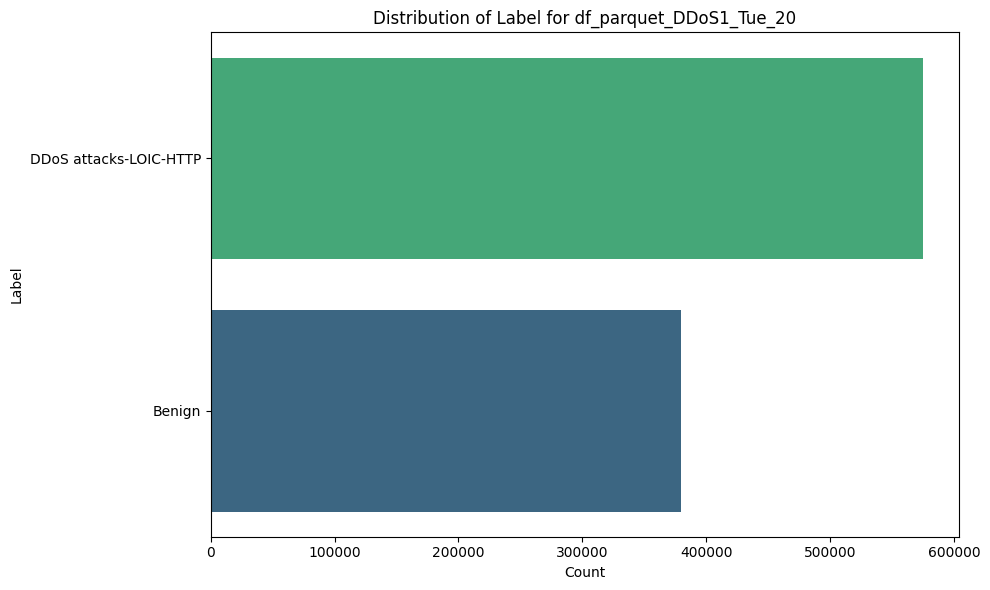

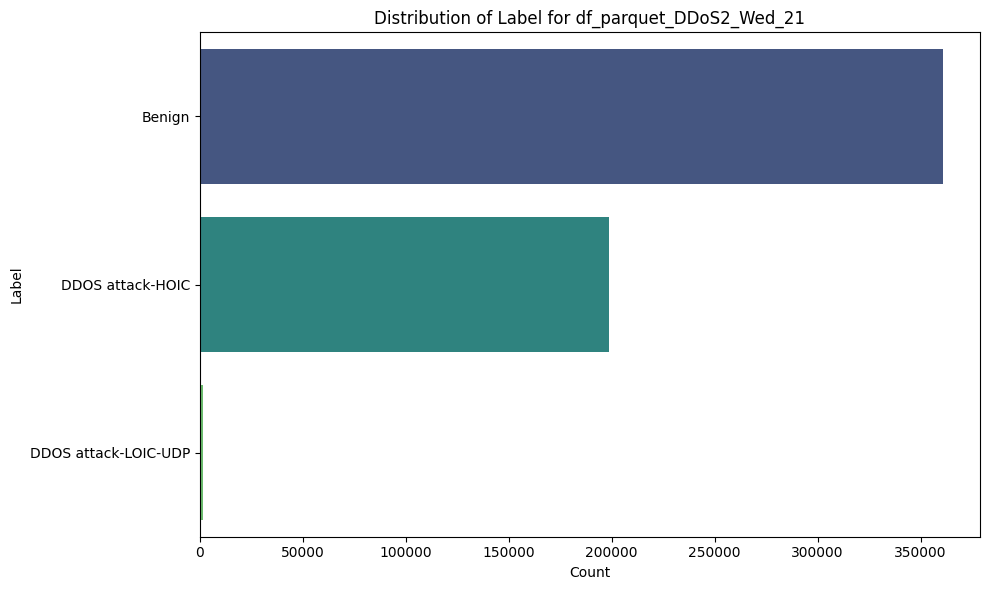

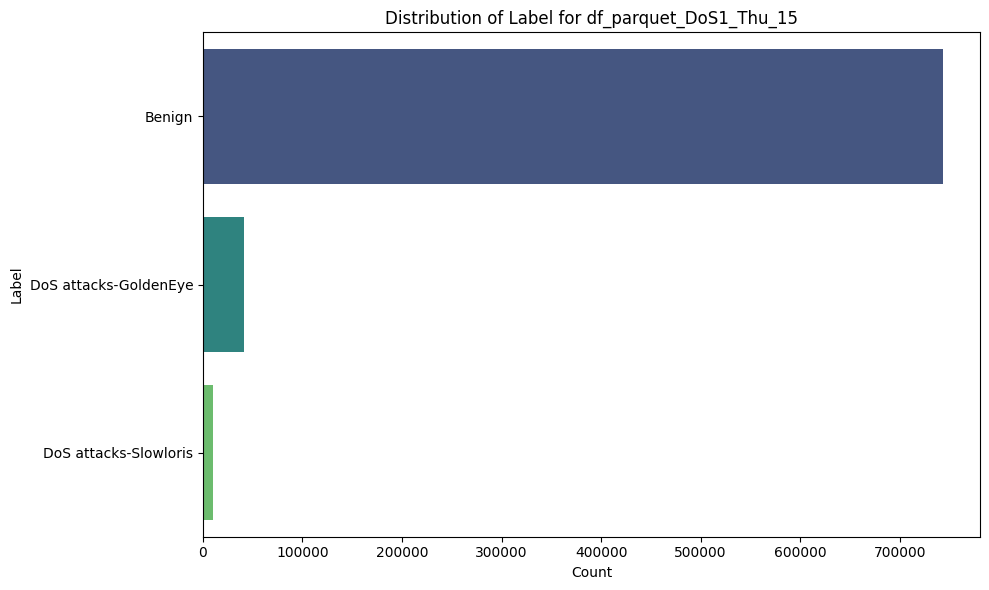

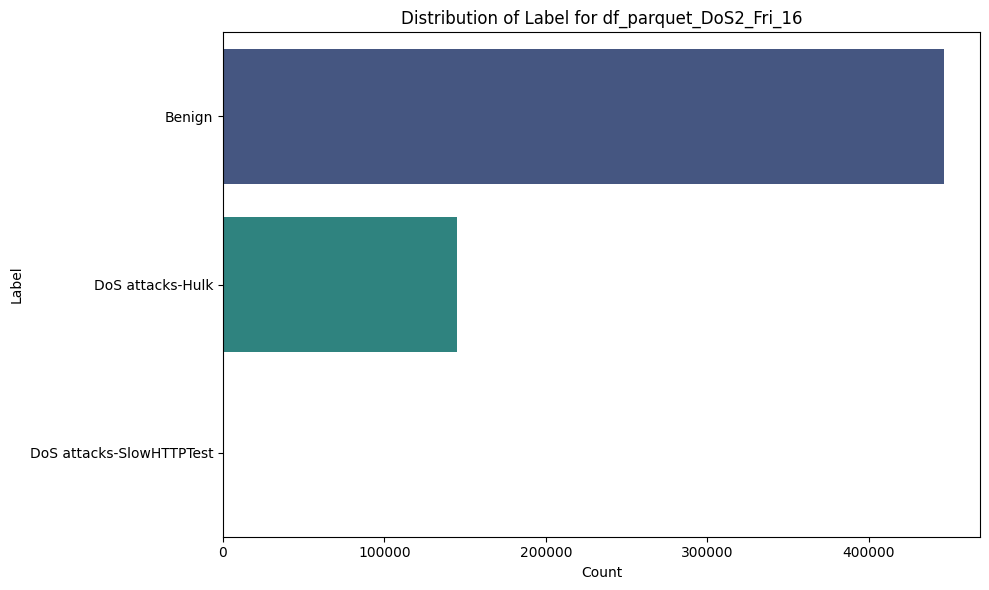

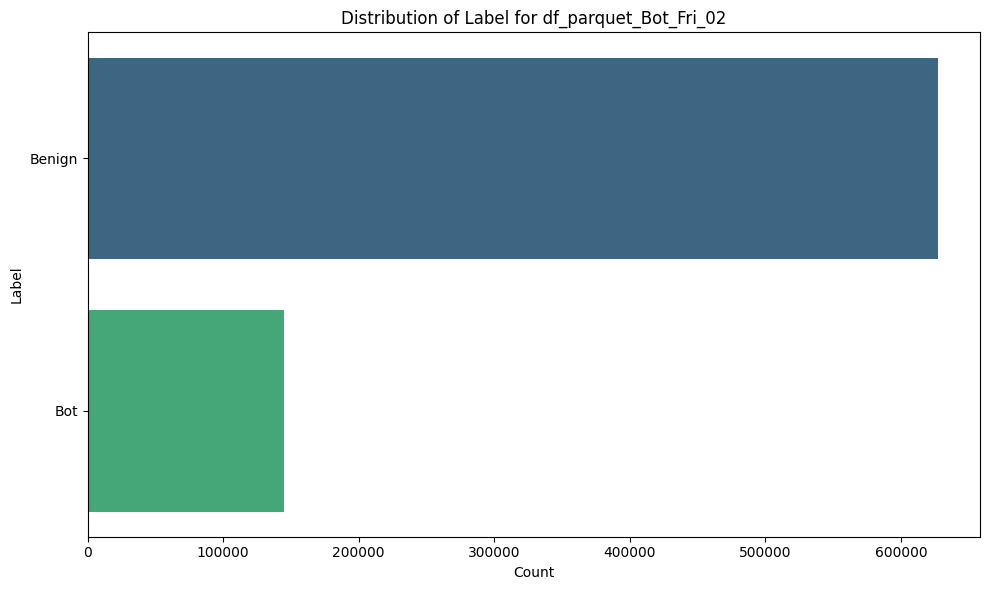

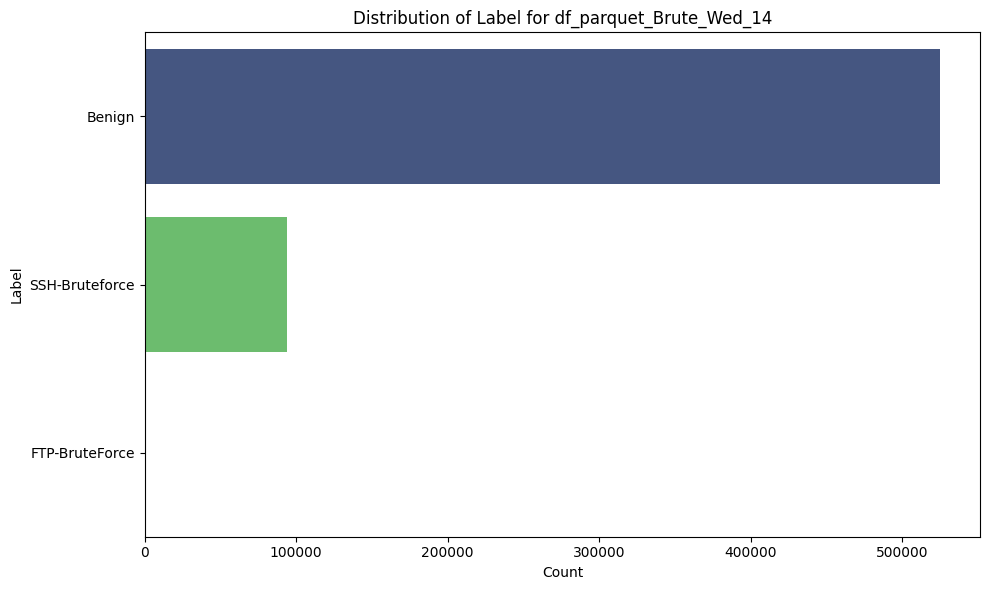

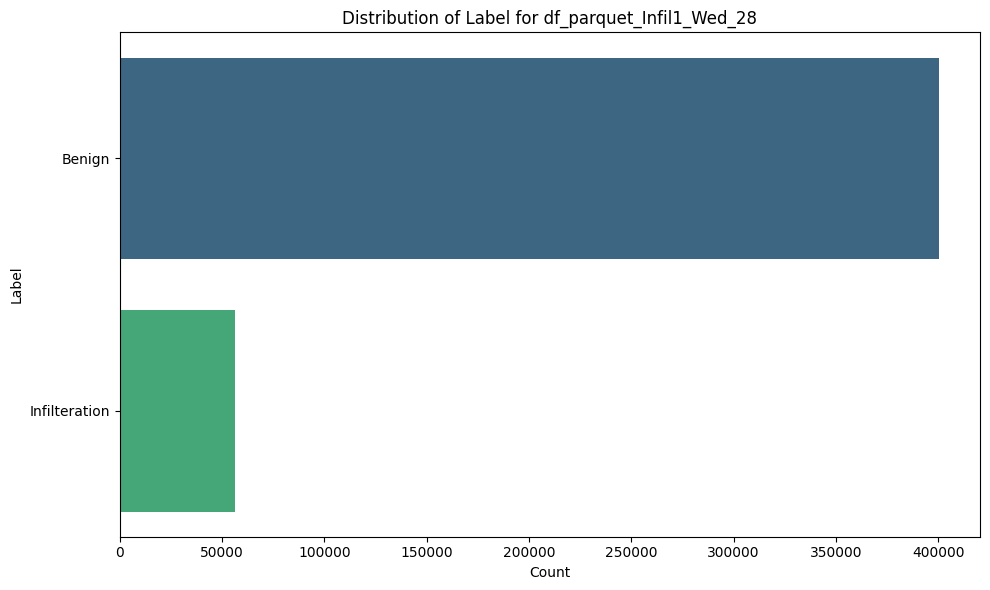

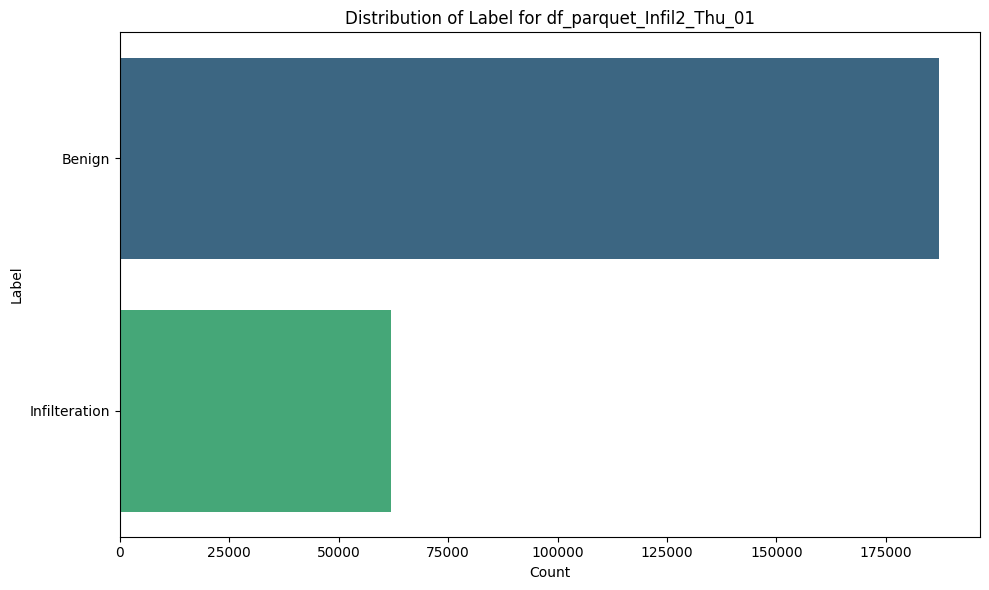

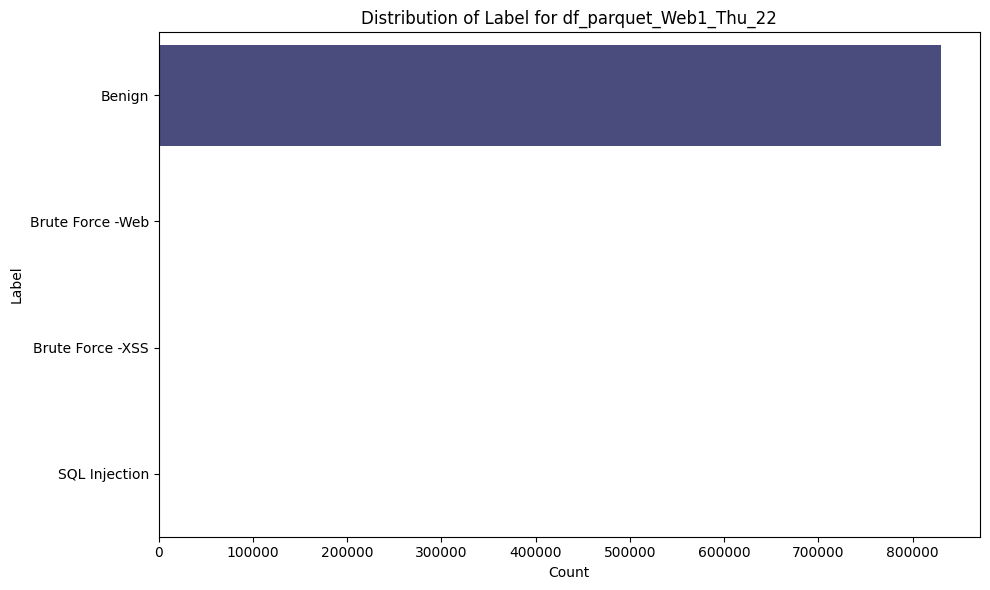

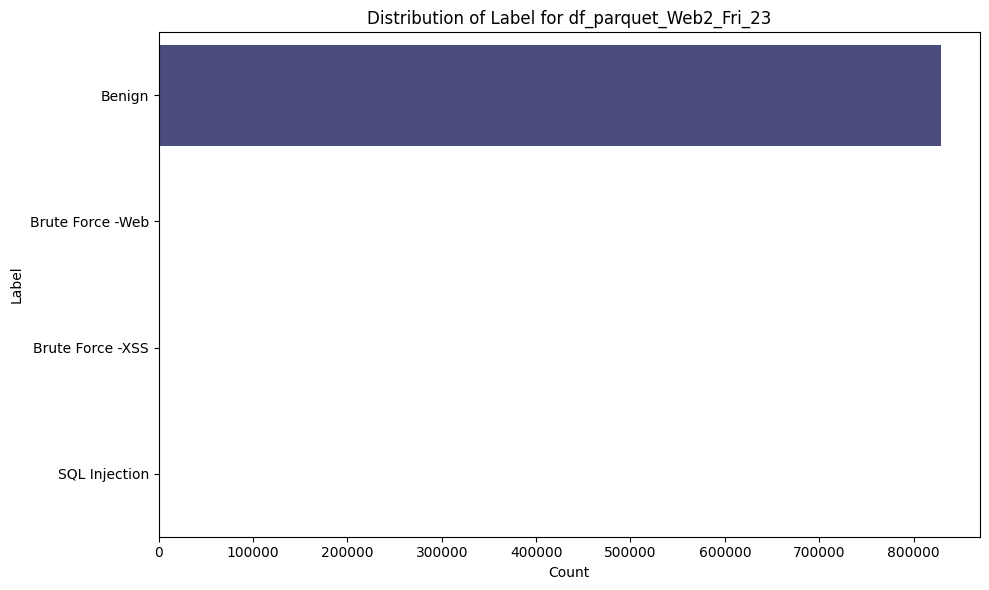

In [229]:
# Install missing plotting packages (only runs if not already installed)

for name, df in dfs.items():
    if 'Label' in df.columns:
        plt.figure(figsize=(10, 6))
        ax = sns.countplot(
            data=df,
            y='Label',
            order=df['Label'].value_counts().index,
            hue='Label',
            palette='viridis'
        )
        # remove redundant legend (hue == y)
        if ax.get_legend() is not None:
            ax.get_legend().remove()

        plt.title(f'Distribution of Label for {name}')
        plt.xlabel('Count')
        plt.ylabel('Label')
        plt.tight_layout()
        plt.show()
    else:
        print(f"'Label' column not found in {name}. Skipping visualization.")

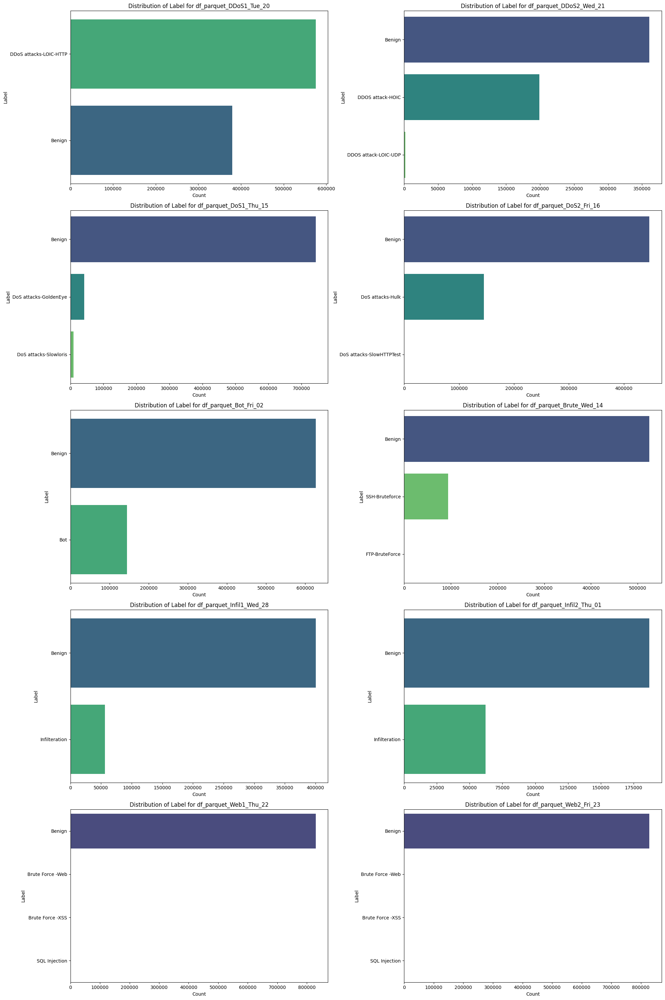

In [230]:
# Count datasets with 'Label' column
valid_dfs = {name: df for name, df in dfs.items() if 'Label' in df.columns}
n_plots = len(valid_dfs)

if n_plots == 0:
    print("No datasets with 'Label' column found.")
else:
    # Create subplot grid (adjust ncols as needed)
    ncols = 2
    nrows = (n_plots + ncols - 1) // ncols
    
    fig, axes = plt.subplots(nrows, ncols, figsize=(20, 6 * nrows))
    axes = axes.flatten() if n_plots > 1 else [axes]
    
    for idx, (name, df) in enumerate(valid_dfs.items()):
        ax = axes[idx]
        sns.countplot(
            data=df,
            y='Label',
            order=df['Label'].value_counts().index,
            hue='Label',
            palette='viridis',
            ax=ax
        )
        # Remove redundant legend
        if ax.get_legend() is not None:
            ax.get_legend().remove()
        
        ax.set_title(f'Distribution of Label for {name}')
        ax.set_xlabel('Count')
        ax.set_ylabel('Label')
    
    # Hide unused subplots
    for idx in range(n_plots, len(axes)):
        axes[idx].axis('off')
    
    plt.tight_layout()
    plt.show()

In [126]:
# show class statistics for all dataframes

def class_stats(df, label_col="Label"):
    c = Counter(df[label_col])
    n = sum(c.values())
    frac = {k: (v, v/n) for k,v in c.items()}
    return pd.DataFrame.from_dict(frac, orient="index", columns=["count","fraction"]).sort_values("count", ascending=False)

# Quantify class imbalance for each dataframe
dataframe_stats = {}
for name, df in dfs.items():
    if 'Label' in df.columns:
        print(f"Class statistics for {name}:")
        stats = class_stats(df)
        dataframe_stats[name] = stats
        display(stats)
    else:
        print(f"'Label' column not found in {name}. Skipping class statistics.")

Class statistics for df_parquet_DDoS1_Tue_20:


,count,fraction
DDoS attacks-LOIC-HTTP,575364,0.602573
Benign,379482,0.397427


Class statistics for df_parquet_DDoS2_Wed_21:


,count,fraction
Benign,360805,0.642693
DDOS attack-HOIC,198861,0.354226
DDOS attack-LOIC-UDP,1730,0.003082


Class statistics for df_parquet_DoS1_Thu_15:


,count,fraction
Benign,743498,0.935439
DoS attacks-GoldenEye,41406,0.052095
DoS attacks-Slowloris,9908,0.012466


Class statistics for df_parquet_DoS2_Fri_16:


,count,fraction
Benign,446619,0.754586
DoS attacks-Hulk,145199,0.245321
DoS attacks-SlowHTTPTest,55,0.000093


Class statistics for df_parquet_Bot_Fri_02:


,count,fraction
Benign,627052,0.812678
Bot,144535,0.187322


Class statistics for df_parquet_Brute_Wed_14:


,count,fraction
Benign,525245,0.848064
SSH-Bruteforce,94048,0.151851
FTP-BruteForce,53,0.000086


Class statistics for df_parquet_Infil1_Wed_28:


,count,fraction
Benign,400424,0.876445
Infilteration,56449,0.123555


Class statistics for df_parquet_Infil2_Thu_01:


,count,fraction
Benign,187136,0.751037
Infilteration,62034,0.248963


Class statistics for df_parquet_Web1_Thu_22:


,count,fraction
Benign,829883,0.999589
Brute Force -Web,228,0.000275
Brute Force -XSS,79,0.000095
SQL Injection,34,0.000041


Class statistics for df_parquet_Web2_Fri_23:


,count,fraction
Benign,828864,0.999348
Brute Force -Web,340,0.000410
Brute Force -XSS,150,0.000181
SQL Injection,51,0.000061




Examining the plots, we observe quite heavy class imbalances in each dataset, where 'Benign' traffic significantly outweighs the attack types in most (but not all) cases.

The CSE-CIC-IDS2018 has ≈16.2M flows, while the labels span 7 attack families; only ~17% of those are attacks, which indicates a heavy class imbalance.

This is a common characteristic of network intrusion datasets.



We have checked all columns in each dataset for infinite and NaN values.

The output confirms that there are no infinite or NaN values in any of the dataframes.

This means the data is clean in terms of missing or infinite numerical entries.

Next steps:

Handle Categorical Features: The 'Label' column is categorical. 

Feature Scaling

Feature Engineering/Selection: Select the most relevant ones to improve model performance.

Model Selection and Training: check metrics that handle class imbalance well (like precision, recall, and F1-score).

#### PROTOCOL COLUMN:

* Display the unique values for the 'Protocol' column in each dataframe


In [127]:
# Display the unique values for the 'Protocol' column in each dataframe

for name, df in dfs.items():
    if 'Protocol' in df.columns:
        print(f"Unique protocols in {name}:")
        display(df['Protocol'].unique())
        print("-" * 30)
    else:
        print(f"'Protocol' column not found in {name}. Skipping.")
        print("-" * 30)

Unique protocols in df_parquet_DDoS1_Tue_20:


array([ 6,  0, 17], dtype=int8)

------------------------------
Unique protocols in df_parquet_DDoS2_Wed_21:


array([ 6, 17,  0], dtype=int8)

------------------------------
Unique protocols in df_parquet_DoS1_Thu_15:


array([ 0,  6, 17], dtype=int8)

------------------------------
Unique protocols in df_parquet_DoS2_Fri_16:


array([ 0,  6, 17], dtype=int8)

------------------------------
Unique protocols in df_parquet_Bot_Fri_02:


array([ 6,  0, 17], dtype=int8)

------------------------------
Unique protocols in df_parquet_Brute_Wed_14:


array([ 0,  6, 17], dtype=int8)

------------------------------
Unique protocols in df_parquet_Infil1_Wed_28:


array([ 6,  0, 17], dtype=int8)

------------------------------
Unique protocols in df_parquet_Infil2_Thu_01:


array([ 0, 17,  6], dtype=int8)

------------------------------
Unique protocols in df_parquet_Web1_Thu_22:


array([ 6, 17,  0], dtype=int8)

------------------------------
Unique protocols in df_parquet_Web2_Fri_23:


array([ 6, 17,  0], dtype=int8)

------------------------------


## 3. Data preprocessing - Feature selection (pre-ML)

In [128]:
# 3.0) Imports and global configuration

random_state = 42  # for reproducibility

LABEL_COL = "Label"         # original label column in our parquet dfs
DAY_ID_COL = "day_id"       # we will add this
LABEL_RAW_COL = "Label_raw" # we will add this
TARGET_COL = "y"            # binary target (0 benign, 1 attack)
PROTOCOL_COL  = "Protocol"  # protocol column

# NEW: columns to always exclude if present (often leakage / identifiers / non-stationary)
ALWAYS_DROP_COLS = {
    "Flow ID", "Timestamp", "Src IP", "Dst IP", "Source IP", "Destination IP",
    "Src Port", "Dst Port", "Source Port", "Destination Port"
}

In [129]:
# 3.1) Dataset registry (uses our existing loaded dataframes)

DATASETS = {
    "df_parquet_DDoS1_Tue_20": df_parquet_DDoS1_Tue_20,
    "df_parquet_DDoS2_Wed_21": df_parquet_DDoS2_Wed_21,
    "df_parquet_DoS1_Thu_15":  df_parquet_DoS1_Thu_15,
    "df_parquet_DoS2_Fri_16":  df_parquet_DoS2_Fri_16,
    "df_parquet_Bot_Fri_02":   df_parquet_Bot_Fri_02,
    "df_parquet_Brute_Wed_14": df_parquet_Brute_Wed_14,
    "df_parquet_Infil1_Wed_28": df_parquet_Infil1_Wed_28,
    "df_parquet_Infil2_Thu_01": df_parquet_Infil2_Thu_01,
    "df_parquet_Web1_Thu_22":  df_parquet_Web1_Thu_22,
    "df_parquet_Web2_Fri_23":  df_parquet_Web2_Fri_23,
}

In [130]:
# 3.2) Standardize each day (add day_id, Label_raw, binary y, harmonize dtypes)

# convert original label to binary target
def make_binary_target_from_label(series: pd.Series) -> np.ndarray:
    s = series.astype(str).str.strip().str.lower()
    return (s != "benign").astype(int).to_numpy()


# harmonize basic dtypes across days
# CHANGED: keep NaN/inf in data; handle them inside preprocessors (imputer + finite replacement)
def harmonize_basic_dtypes(df: pd.DataFrame) -> pd.DataFrame:
    df = df.copy()

    # CHANGED: force Protocol to string (prevents mixed types across days)
    if PROTOCOL_COL in df.columns:
        df[PROTOCOL_COL] = df[PROTOCOL_COL].astype(str)

    return df

# prepare each day's dataframe
def prepare_day_df(df: pd.DataFrame, day_id: str) -> pd.DataFrame:
    out = harmonize_basic_dtypes(df)

    out = out.copy()
    out[DAY_ID_COL] = day_id
    out[LABEL_RAW_COL] = out[LABEL_COL].astype(str)
    out[TARGET_COL] = make_binary_target_from_label(out[LABEL_COL])     # binary target
    return out

# create registry with prepared dataframes
REGISTRY = {day_id: prepare_day_df(df, day_id) for day_id, df in DATASETS.items()}
print("Loaded days:", list(REGISTRY.keys()))

# Each dataframe in REGISTRY now has day_id, Label_raw, and binary y columns

Loaded days: ['df_parquet_DDoS1_Tue_20', 'df_parquet_DDoS2_Wed_21', 'df_parquet_DoS1_Thu_15', 'df_parquet_DoS2_Fri_16', 'df_parquet_Bot_Fri_02', 'df_parquet_Brute_Wed_14', 'df_parquet_Infil1_Wed_28', 'df_parquet_Infil2_Thu_01', 'df_parquet_Web1_Thu_22', 'df_parquet_Web2_Fri_23']


In [131]:
# 3.3) Per-day class-balance report (helps us choose VAL_DAY)

# summarize class balance per day
def day_balance_report(registry: dict) -> pd.DataFrame:
    rows = []
    for day_id, df in registry.items():
        y = df[TARGET_COL].to_numpy()
        n = len(y)
        pos = int(y.sum())
        neg = int(n - pos)
        rows.append({
            "day_id": day_id,
            "n": n,
            "benign(0)": neg,
            "attack(1)": pos,
            "attack_rate": pos / max(n, 1.0),
            "unique_labels_raw": df[LABEL_RAW_COL].nunique()
        })
    return pd.DataFrame(rows).sort_values(["attack_rate", "n"], ascending=[False, False]).reset_index(drop=True)


# show per-day class balance report
balance_df = day_balance_report(REGISTRY)
display(balance_df)

# From the report, we can choose a set of VAL_DAYS with moderate imbalance and multiple attack types

,day_id,n,benign(0),attack(1),attack_rate,unique_labels_raw
0,df_parquet_DDoS1_Tue_20,954846,379482,575364,0.602573,2
1,df_parquet_DDoS2_Wed_21,561396,360805,200591,0.357307,3
2,df_parquet_Infil2_Thu_01,249170,187136,62034,0.248963,2
3,df_parquet_DoS2_Fri_16,591873,446619,145254,0.245414,3
4,df_parquet_Bot_Fri_02,771587,627052,144535,0.187322,2
5,df_parquet_Brute_Wed_14,619346,525245,94101,0.151936,3
6,df_parquet_Infil1_Wed_28,456873,400424,56449,0.123555,2
7,df_parquet_DoS1_Thu_15,794812,743498,51314,0.064561,3
8,df_parquet_Web2_Fri_23,829405,828864,541,0.000652,4
9,df_parquet_Web1_Thu_22,830224,829883,341,0.000411,4


In [132]:
# 3.4) Choose a multi-day fixed set of validation days and define the outer Leave-One-Day-Out test days

ALL_DAYS = list(REGISTRY.keys())

VAL_DAYS = [
    "df_parquet_Bot_Fri_02",
    "df_parquet_Brute_Wed_14",
]

TEST_DAYS = [
    "df_parquet_DDoS1_Tue_20",
    "df_parquet_DDoS2_Wed_21",
    "df_parquet_DoS1_Thu_15",
    "df_parquet_DoS2_Fri_16",
    "df_parquet_Infil1_Wed_28",
    "df_parquet_Infil2_Thu_01",
    "df_parquet_Web1_Thu_22",
    "df_parquet_Web2_Fri_23",
]

# sanity checks
missing_val = [d for d in VAL_DAYS if d not in REGISTRY]
missing_test = [d for d in TEST_DAYS if d not in REGISTRY]
if missing_val or missing_test:
    raise ValueError(f"Missing days: val={missing_val}, test={missing_test}")

print("VAL_DAYS:", VAL_DAYS)
print("TEST_DAYS:", TEST_DAYS)


VAL_DAYS: ['df_parquet_Bot_Fri_02', 'df_parquet_Brute_Wed_14']
TEST_DAYS: ['df_parquet_DDoS1_Tue_20', 'df_parquet_DDoS2_Wed_21', 'df_parquet_DoS1_Thu_15', 'df_parquet_DoS2_Fri_16', 'df_parquet_Infil1_Wed_28', 'df_parquet_Infil2_Thu_01', 'df_parquet_Web1_Thu_22', 'df_parquet_Web2_Fri_23']


In [133]:
# 3.5) Feature-selection helpers (Pearson → Spearman clusters → VIF pruning)
# runs per fold and pick cluster reps automatically based on spearman centrality, then VIF prune

#%pip install -q scikit-learn --quiet

# CHANGED: median-impute for FS computations instead of dropping all-NaN rows
# For feature selection calculations only, impute medians (train-only) rather than dropping entire rows, making feature selection step more stable and less fold-sensitive
def _safe_numeric_frame(df: pd.DataFrame, numeric_cols: list, row_cap: int = 200_000, seed: int = 42) -> pd.DataFrame:
    """
    cap rows (optional) + replace inf -> nan + drop rows with nan for correlation/VIF computations only
    """
    X = df[numeric_cols].copy()
    X = X.replace([np.inf, -np.inf], np.nan)

    if row_cap is not None and len(X) > row_cap:
        X, _ = train_test_split(X, train_size=row_cap, random_state=seed, shuffle=True)

    # drop constant columns (ignoring NaNs)
    nun = X.nunique(dropna=True)
    keep = nun[nun > 1].index.tolist()
    X = X[keep]

    # NEW: median impute for stable corr/VIF
    if X.shape[1] > 0:
        X = X.fillna(X.median(numeric_only=True))

    return X


def pearson_filter(df_train: pd.DataFrame, numeric_cols: list, thr: float = 0.95, row_cap: int = 200_000) -> list:
    X = _safe_numeric_frame(df_train, numeric_cols, row_cap=row_cap, seed=random_state)
    cols = X.columns.tolist()
    if len(cols) <= 1:
        return cols

    corr = X.corr(method="pearson").abs()
    upper = corr.where(np.triu(np.ones(corr.shape), k=1).astype(bool))

    to_drop = set()
    for col in upper.columns:
        if col in to_drop:
            continue
        high = upper[col][upper[col] > thr].index.tolist()
        for r in high:
            # drop the 'r' feature by default (simple, deterministic)
            to_drop.add(r)

    kept = [c for c in cols if c not in to_drop]
    return kept

def _connected_components_from_corr(corr_abs: pd.DataFrame, thr: float):
    cols = corr_abs.columns.tolist()
    seen = set()
    comps = []
    for c in cols:
        if c in seen:
            continue
        stack = [c]
        comp = []
        seen.add(c)
        while stack:
            u = stack.pop()
            comp.append(u)
            nbrs = corr_abs.index[corr_abs.loc[u] >= thr].tolist()
            for v in nbrs:
                if v not in seen:
                    seen.add(v)
                    stack.append(v)
        comps.append(comp)
    return comps

def spearman_cluster_reps(df_train: pd.DataFrame, cols: list, thr: float = 0.90, row_cap: int = 200_000):
    """
    NEW: cluster by spearman |corr| >= thr; pick representative by max mean |corr| within cluster.
    """
    X = _safe_numeric_frame(df_train, cols, row_cap=row_cap, seed=random_state)
    cols2 = X.columns.tolist()
    if len(cols2) <= 1:
        return cols2, {"clusters": [[c] for c in cols2], "reps": cols2}

    corr = X.corr(method="spearman").abs()
    np.fill_diagonal(corr.values, 1.0)

    clusters = _connected_components_from_corr(corr, thr=thr)
    reps = []
    for comp in clusters:
        if len(comp) == 1:
            reps.append(comp[0])
            continue
        sub = corr.loc[comp, comp]
        centrality = sub.mean(axis=1)
        reps.append(centrality.idxmax())

    dbg = {"clusters": clusters, "reps": reps}
    return reps, dbg

# VIF utilities (variance_inflation_factor imported above)

def compute_vif_table_safe(X: pd.DataFrame) -> pd.DataFrame:
    X = X.replace([np.inf, -np.inf], np.nan).dropna(axis=0)
    if X.shape[1] <= 1:
        return pd.DataFrame(columns=["feature", "VIF"])

    if variance_inflation_factor is None:
        # fallback: no statsmodels -> skip VIF
        return pd.DataFrame({"feature": X.columns, "VIF": np.nan})

    vals = X.to_numpy(dtype=float)
    vifs = []
    for i, col in enumerate(X.columns):
        try:
            v = variance_inflation_factor(vals, i)
        except Exception:
            v = np.nan
        vifs.append(v)

    out = pd.DataFrame({"feature": X.columns, "VIF": vifs})
    out = out.sort_values("VIF", ascending=False).reset_index(drop=True)
    return out

def vif_prune(df_train: pd.DataFrame, cols: list, vif_thr: float = 10.0, row_cap: int = 200_000, max_iter: int = 50):
    """
    NEW: iteratively drop highest-VIF feature until <= vif_thr.
    """
    X = _safe_numeric_frame(df_train, cols, row_cap=row_cap, seed=random_state)
    kept = X.columns.tolist()

    dbg_steps = []
    for _ in range(max_iter):
        vif = compute_vif_table_safe(X[kept])
        if vif.shape[0] == 0:
            break
        worst_feat = vif.iloc[0]["feature"]
        worst_v = vif.iloc[0]["VIF"]
        dbg_steps.append({"worst_feature": worst_feat, "worst_vif": worst_v, "n_kept": len(kept)})

        if not np.isfinite(worst_v) or worst_v <= vif_thr:
            break
        kept.remove(worst_feat)

        if len(kept) <= 1:
            break

    return kept, {"vif_steps": dbg_steps}

def select_features_train_only(
    df_train: pd.DataFrame,
    feature_cols: list,
    pearson_thr: float = 0.95,
    spearman_thr: float = 0.90,
    vif_thr: float = 10.0,
    row_cap: int = 200_000
):
    """
    CHANGED: numeric-only selection; Protocol handled separately.
    """
    numeric_cols = df_train[feature_cols].select_dtypes(include=[np.number]).columns.tolist()

    # Pearson -> Spearman cluster reps -> VIF
    pearson_kept = pearson_filter(df_train, numeric_cols, thr=pearson_thr, row_cap=row_cap)
    spearman_reps, spearman_dbg = spearman_cluster_reps(df_train, pearson_kept, thr=spearman_thr, row_cap=row_cap)
    vif_kept, vif_dbg = vif_prune(df_train, spearman_reps, vif_thr=vif_thr, row_cap=row_cap)

    debug = {
        "numeric_candidates": numeric_cols,
        "pearson_kept": pearson_kept,
        "spearman_dbg": spearman_dbg,
        "vif_dbg": vif_dbg,
    }
    return vif_kept, debug

In [134]:
# 3.6) LODO Fold builder (concatenate-by-role and run feature selection only on train data)
# CHANGE: adds groups for GroupKFold
# use GroupKFold (groups = day_id) for tuning so “inner CV” simulates cross-day variation. 
# builds train/val/test splits for a given test day and fixed val days, with feature selection on train only
# returns X_train, y_train, X_val, y_val, X_test, y_test dataframes/series (everything we need before running ML algorithms)


def build_fold(registry: dict, val_days: list, test_day: str):
    if not isinstance(val_days, (list, tuple)) or len(val_days) == 0:
        raise ValueError("val_days must be a non-empty list of day keys")
    if test_day in val_days:
        raise ValueError("test_day must NOT be inside val_days")
    for d in val_days:
        if d not in registry:
            raise KeyError(f"val day {d} missing from registry")
    if test_day not in registry:
        raise KeyError(f"test day {test_day} missing from registry")

    train_days = [d for d in registry.keys() if (d not in set(val_days)) and (d != test_day)]

    df_train = pd.concat([registry[d] for d in train_days], axis=0, ignore_index=True)
    df_val   = pd.concat([registry[d] for d in val_days],   axis=0, ignore_index=True)
    df_test  = registry[test_day].copy()

    # CHANGED: feature column discovery uses ONLY columns common to train/val/test
    # CHANGED: deterministic column ordering
    common_cols = sorted(set(df_train.columns) & set(df_val.columns) & set(df_test.columns))

    # baseline candidate features = common cols minus target/labels/meta and known ID columns
    base_exclude = {LABEL_COL, DAY_ID_COL, LABEL_RAW_COL, TARGET_COL} | ALWAYS_DROP_COLS
    candidate_features = [c for c in common_cols if c not in base_exclude]

    # keep Protocol if present; otherwise ignore
    use_protocol = (PROTOCOL_COL in common_cols) and (PROTOCOL_COL not in base_exclude)

    # run feature selection on train only (numeric features)
    selected_numeric, fs_debug = select_features_train_only(
        df_train=df_train,
        feature_cols=candidate_features,
        pearson_thr=0.95,
        spearman_thr=0.90,
        vif_thr=10.0,
        row_cap=200000
    )

    # NEW: fallback if FS collapses
    if len(selected_numeric) == 0:
        numeric_candidates = df_train[candidate_features].select_dtypes(include=[np.number]).columns.tolist()
        selected_numeric = numeric_candidates
        fs_debug["fallback_used"] = True

    feature_cols = selected_numeric + ([PROTOCOL_COL] if use_protocol else [])

    # outputs
    Xtr = df_train[feature_cols].copy()
    ytr = df_train[TARGET_COL].to_numpy().astype(int)
    gtr = df_train[DAY_ID_COL].to_numpy()

    Xva = df_val[feature_cols].copy()
    yva = df_val[TARGET_COL].to_numpy().astype(int)
    gva = df_val[DAY_ID_COL].to_numpy()

    Xte = df_test[feature_cols].copy()
    yte = df_test[TARGET_COL].to_numpy().astype(int)
    gte = df_test[DAY_ID_COL].to_numpy()

    meta = {
        "train_days": train_days,
        "val_days": list(val_days),
        "test_day": test_day,
        "feature_cols": feature_cols,
        "selected_numeric": selected_numeric,
        "use_protocol": use_protocol,
        "fs_debug": fs_debug,

        # NEW (for attack-type stage-2)
        "label_raw_train": df_train[LABEL_RAW_COL].astype(str).to_numpy(),
        "label_raw_val":   df_val[LABEL_RAW_COL].astype(str).to_numpy(),
        "label_raw_test":  df_test[LABEL_RAW_COL].astype(str).to_numpy(),
    }

    return Xtr, ytr, gtr, Xva, yva, gva, Xte, yte, gte, meta

In [135]:
# 3.7) Mixed-day fold builder (random split across all days, with optional rare subtype injection)
# builds a single mixed-day fold with train/val/test splits from all days combined
# runs feature selection on train only

def build_mixed_fold(
    registry,
    seed=42,
    test_size=0.20,      # literature-like
    val_size=0.10,       # VAL for thresholding
    use_rare_injection=False,
    rare_subtypes=None,
    rare_n_test=20,
    rare_n_val=10,
):
    rare_subtypes = rare_subtypes or []

    # 1) Pool all rows across all days
    df_all = pd.concat(list(registry.values()), ignore_index=True).copy()

    # 2) Split: (train+val) vs test, stratified on binary target
    df_trainval, df_test = train_test_split(
        df_all,
        test_size=test_size,
        random_state=seed,
        shuffle=True,
        stratify=df_all[TARGET_COL],
    )

    # 3) Split trainval into train vs val (still stratified on binary target)
    val_rel = val_size / max(1e-12, (1.0 - test_size))
    df_train, df_val = train_test_split(
        df_trainval,
        test_size=val_rel,
        random_state=seed,
        shuffle=True,
        stratify=df_trainval[TARGET_COL],
    )

    # 4) Optional tiny subtype injection for reporting (swap-back keeps sizes stable)
    if use_rare_injection and len(rare_subtypes) > 0 and LABEL_RAW_COL in df_all.columns:
        rng = np.random.default_rng(seed)

        def _inject(df_from, df_to, subtype, n):
            cand = df_from[(df_from[TARGET_COL] == 1) & (df_from[LABEL_RAW_COL] == subtype)]
            if len(cand) == 0 or n <= 0:
                return df_from, df_to, 0
            take = min(n, len(cand))
            idx = rng.choice(cand.index.values, size=take, replace=False)
            df_to = pd.concat([df_to, df_from.loc[idx]], axis=0)
            df_from = df_from.drop(index=idx)
            return df_from, df_to, take

        for st in rare_subtypes:
            # inject to TEST
            cur = int(((df_test[TARGET_COL] == 1) & (df_test[LABEL_RAW_COL] == st)).sum())
            need = max(0, rare_n_test - cur)
            df_train, df_test, moved = _inject(df_train, df_test, st, need)

            # swap back moved attacks (keep test size stable)
            if moved > 0:
                donors = df_test[(df_test[TARGET_COL] == 1) & (df_test[LABEL_RAW_COL] != st)]
                if len(donors) >= moved:
                    donor_idx = rng.choice(donors.index.values, size=moved, replace=False)
                    df_train = pd.concat([df_train, df_test.loc[donor_idx]], axis=0)
                    df_test = df_test.drop(index=donor_idx)

            # inject to VAL
            curv = int(((df_val[TARGET_COL] == 1) & (df_val[LABEL_RAW_COL] == st)).sum())
            needv = max(0, rare_n_val - curv)
            df_train, df_val, movedv = _inject(df_train, df_val, st, needv)

            if movedv > 0:
                donorsv = df_val[(df_val[TARGET_COL] == 1) & (df_val[LABEL_RAW_COL] != st)]
                if len(donorsv) >= movedv:
                    donor_idx = rng.choice(donorsv.index.values, size=movedv, replace=False)
                    df_train = pd.concat([df_train, df_val.loc[donor_idx]], axis=0)
                    df_val = df_val.drop(index=donor_idx)

    # 5) Define candidate_features = common cols minus target/labels/meta and known ID columns
    common_cols = sorted(set(df_train.columns) & set(df_val.columns) & set(df_test.columns))
    base_exclude = {LABEL_COL, DAY_ID_COL, LABEL_RAW_COL, TARGET_COL} | ALWAYS_DROP_COLS
    candidate_features = [c for c in common_cols if c not in base_exclude]

    # 6) TRAIN-only feature selection (same as LODO)
    selected_numeric, fs_debug = select_features_train_only(
        df_train=df_train,
        feature_cols=candidate_features,
        pearson_thr=0.95,
        spearman_thr=0.90,
        vif_thr=10.0,
        row_cap=200000
    )

    use_protocol = (PROTOCOL_COL in df_train.columns)
    feature_cols = list(selected_numeric) + ([PROTOCOL_COL] if use_protocol else [])

    # 7) Build X/y/g like build_fold
    def _make_role(df):
        X = df[feature_cols].copy()
        y = df[TARGET_COL].astype(int).to_numpy()
        g = df[DAY_ID_COL].astype(str).to_numpy() if DAY_ID_COL in df.columns else np.array(["MIXED"] * len(df))
        return X, y, g

    Xtr_raw, ytr, gtr = _make_role(df_train)
    Xva_raw, yva, gva = _make_role(df_val)
    Xte_raw, yte, gte = _make_role(df_test)

# new: add label_raw to meta for potential stage-2 attack-type classification 
    meta = {
        "split_mode": "MIXED",
        "feature_cols": feature_cols,
        "use_protocol": use_protocol,
        "fs_debug": fs_debug,

        # NEW (for attack-type stage-2)
        "label_raw_train": (df_train[LABEL_RAW_COL].astype(str).to_numpy()
                            if LABEL_RAW_COL in df_train.columns else None),
        "label_raw_val":   (df_val[LABEL_RAW_COL].astype(str).to_numpy()
                            if LABEL_RAW_COL in df_val.columns else None),
        "label_raw_test":  (df_test[LABEL_RAW_COL].astype(str).to_numpy()
                            if LABEL_RAW_COL in df_test.columns else None),
    }

    return Xtr_raw, ytr, gtr, Xva_raw, yva, gva, Xte_raw, yte, gte, meta


def Rds_common_cols(*dfs):
    # helper: intersection of columns across dfs, stable order
    cols = set(dfs[0].columns)
    for d in dfs[1:]:
        cols &= set(d.columns)
    return [c for c in dfs[0].columns if c in cols]


# =====================================================
# Add one CV selector helper (only affects MIXED tuning)

def get_inner_cv(split_mode: str, y: np.ndarray, groups: np.ndarray, default_splits: int = 5, seed: int = 42):
    if split_mode == "MIXED":
        # ensure n_splits <= minority count
        min_class = int(np.bincount(y.astype(int)).min())
        n_splits = max(2, min(default_splits, min_class))
        return StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=seed)
    else:
        # LODO
        n_groups = len(np.unique(groups))
        n_splits = max(2, min(default_splits, n_groups))
        return GroupKFold(n_splits=n_splits)


In [136]:
# 3.8) Build the fold-specific preprocessor (auto-infer log1p features / Protocol One Hot Encoding (OHE)) (FULL REPLACEMENT)

# ensure scikit-learn is installed so imports resolve in the notebook environment
#%pip install -q scikit-learn --quiet


def make_ohe():
    try:
        return OneHotEncoder(handle_unknown="ignore", sparse_output=True)
    except TypeError:
        return OneHotEncoder(handle_unknown="ignore", sparse=True)

def _replace_inf(X):
    X = np.asarray(X, dtype=float)
    X[~np.isfinite(X)] = np.nan
    return X

def _safe_log1p(X):
    X = np.asarray(X, dtype=float)
    # CHANGED: log1p only safe for non-negative; clip negatives to 0
    return np.log1p(np.clip(X, a_min=0.0, a_max=None))


# CHANGED: column-wise skew, avoids dropping all rows
# keeps the “train-only inference” behavior but makes it more stable
def infer_log1p_features(df_train: pd.DataFrame, numeric_cols: list, skew_thr: float = 1.0, row_cap: int = 200_000):
    """
    infer log1p candidates using TRAIN only, on a capped sample.
    """
    X = df_train[numeric_cols].copy()
    X = X.replace([np.inf, -np.inf], np.nan)

    if row_cap is not None and len(X) > row_cap:
        X, _ = train_test_split(X, train_size=row_cap, random_state=random_state, shuffle=True)

    candidates = []
    for c in numeric_cols:
        s = X[c].dropna()
        if s.shape[0] < 100:   # NEW: avoid noisy skew on tiny samples
            continue
        if s.min() < 0:
            continue
        sk = float(s.skew())
        if np.isfinite(sk) and abs(sk) >= skew_thr:
            candidates.append(c)

    return candidates


def build_preprocessor(df_train: pd.DataFrame, feature_cols: list):
    numeric_cols = df_train[feature_cols].select_dtypes(include=[np.number]).columns.tolist()
    has_protocol = (PROTOCOL_COL in feature_cols) and (PROTOCOL_COL in df_train.columns)

    # ensure protocol is not also treated as numeric
    if has_protocol and PROTOCOL_COL in numeric_cols:
        numeric_cols = [c for c in numeric_cols if c != PROTOCOL_COL]

    log1p_cols = infer_log1p_features(df_train, numeric_cols, skew_thr=1.0, row_cap=200_000)
    scale_cols = [c for c in numeric_cols if c not in log1p_cols]

    # NEW: shared numeric cleaning
    num_clean = Pipeline(steps=[
        ("finite", FunctionTransformer(_replace_inf, feature_names_out="one-to-one")),
        ("imputer", SimpleImputer(strategy="median")),
    ])

    num_log = Pipeline(steps=[
        ("clean", num_clean),
        ("log1p", FunctionTransformer(_safe_log1p, feature_names_out="one-to-one")),
        ("scaler", StandardScaler()),
    ])

    num_std = Pipeline(steps=[
        ("clean", num_clean),
        ("scaler", StandardScaler()),
    ])

    transformers = []
    if len(log1p_cols) > 0:
        transformers.append(("num_log1p", num_log, log1p_cols))
    if len(scale_cols) > 0:
        transformers.append(("num_scaled", num_std, scale_cols))

    if has_protocol:
        cat_pipe = Pipeline(steps=[
            ("imputer", SimpleImputer(strategy="most_frequent")),
            ("ohe", make_ohe()),
        ])
        transformers.append(("cat_protocol", cat_pipe, [PROTOCOL_COL]))

    preprocessor = ColumnTransformer(
        transformers=transformers,
        remainder="drop",
        verbose_feature_names_out=True
    )

    dbg = {"log1p_cols": log1p_cols, "scale_cols": scale_cols, "has_protocol": has_protocol}
    return preprocessor, dbg

# transformer to convert sparse matrix to dense if needed
to_dense_if_sparse = FunctionTransformer(
    lambda X: X.toarray() if sparse.issparse(X) else X,
    accept_sparse=True
)

## 4. Helper Functions

In [209]:
# 4) Helper Functions are defined once, before running any ML algorithms (FULL REPLACEMENT)
# ============================================================
# best metrics: PR-AUC, ROC-AUC, MCC, FPR/FNR, Attack precision/recall/F1, macro-F1
# thresholding with FN tradeoff: best-F1, best-macro-F1, min-cost (FP/FN weights), FPR-constrained, FN=0
# plots: PR/ROC/DET/score distributions + threshold annotations
# unified runner hooks
# ============================================================


def get_scores(model, X):
    if hasattr(model, "predict_proba"):
        return np.asarray(model.predict_proba(X)[:, 1], dtype=float)
    if hasattr(model, "decision_function"):
        return np.asarray(model.decision_function(X), dtype=float)
    return np.asarray(model.predict(X), dtype=float)

def make_threshold_grid(y_score, n=2001):
    y = np.asarray(y_score, dtype=float)
    y = y[np.isfinite(y)]
    if y.size == 0:
        return np.array([0.5])
    qs = np.linspace(0, 1, n)
    grid = np.unique(np.quantile(y, qs))
    grid = np.unique(np.r_[0.0, grid, 1.0])
    return grid

def metrics_at_threshold(y_true, y_score, thr: float):
    y_true = np.asarray(y_true).astype(int)
    y_score = np.asarray(y_score, dtype=float)
    y_pred = (y_score >= thr).astype(int)

    tn, fp, fn, tp = confusion_matrix(y_true, y_pred, labels=[0,1]).ravel()

    prec = precision_score(y_true, y_pred, zero_division=0)
    rec  = recall_score(y_true, y_pred, zero_division=0)
    f1   = f1_score(y_true, y_pred, zero_division=0)
    macro_f1 = f1_score(y_true, y_pred, average="macro", zero_division=0)

    fpr = fp / (fp + tn) if (fp + tn) else 0.0
    fnr = fn / (fn + tp) if (fn + tp) else 0.0

    mcc = matthews_corrcoef(y_true, y_pred) if (tp+tn+fp+fn) else 0.0
    bacc = balanced_accuracy_score(y_true, y_pred)

    return {
        "thr": float(thr),
        "tn": int(tn), "fp": int(fp), "fn": int(fn), "tp": int(tp),
        "precision_pos": float(prec),
        "recall_pos": float(rec),
        "f1_pos": float(f1),
        "macro_f1": float(macro_f1),
        "fpr": float(fpr),
        "fnr": float(fnr),
        "mcc": float(mcc),
        "balanced_acc": float(bacc),
    }

def metrics_threshold_free(y_true, y_score):
    y_true = np.asarray(y_true).astype(int)
    y_score = np.asarray(y_score, dtype=float)
    out = {}
    try:
        out["roc_auc"] = float(roc_auc_score(y_true, y_score))
    except Exception:
        out["roc_auc"] = np.nan
    try:
        out["pr_auc"] = float(average_precision_score(y_true, y_score))
    except Exception:
        out["pr_auc"] = np.nan
    return out

def pick_threshold_best_attack_f1(y_true, y_score, grid=None):
    if grid is None:
        grid = make_threshold_grid(y_score)
    best_t, best_f1 = 0.5, -1.0
    for t in grid:
        m = metrics_at_threshold(y_true, y_score, t)
        if m["f1_pos"] > best_f1:
            best_f1 = m["f1_pos"]
            best_t = t
    return float(best_t), float(best_f1)

# NEW: recall>=target then minimize FPR (our main operating point)
# CHANGED: return None if recall target cannot be achieved under max_fpr
# set default max_fpr=0.01
def pick_threshold_recall_target_min_fpr(y_true, y_score, recall_target=0.95, max_fpr=0.01, grid=None):
    if grid is None:
        grid = make_threshold_grid(y_score)

    best_t, best_fpr = None, np.inf

    for t in grid:
        m = metrics_at_threshold(y_true, y_score, t)
        if (m["recall_pos"] >= recall_target) and (m["fpr"] <= max_fpr):
            if m["fpr"] < best_fpr:
                best_fpr = m["fpr"]
                best_t = t
    return None if best_t is None else float(best_t)

# new: maximize recall under max_fpr constraint
def pick_threshold_fpr_constrained_max_recall(y_true, y_score, max_fpr=0.01, grid=None):
    if grid is None:
        grid = make_threshold_grid(y_score)

    best_t, best_rec = None, -1.0
    for t in grid:
        m = metrics_at_threshold(y_true, y_score, t)
        if m["fpr"] <= max_fpr and m["recall_pos"] > best_rec:
            best_rec = m["recall_pos"]
            best_t = t

    return None if best_t is None else float(best_t)

# CHANGED: skip None thresholds (so infeasible targets don't create nonsense rows)
def evaluate_thresholds(y_true, y_score, thresholds: dict, name="model"):
    rows = []
    base = metrics_threshold_free(y_true, y_score)

    for label, thr in thresholds.items():
        if thr is None:
            continue
        m = metrics_at_threshold(y_true, y_score, thr)
        m.update(base)
        m["model"] = name
        m["thr_label"] = label
        rows.append(m)

    return pd.DataFrame(rows)

# 
def print_operating_points_table(
    y_true,
    y_score,
    thresholds_dict,
    model_name="",
    sort_by=None,   # e.g., "fpr" or "recall_pos"
):
    """
    Compact table for thesis reporting.
    thresholds_dict: dict[label -> thr] (thr can be None; skipped)
    Prints: thr, FPR, Recall, Precision, F1, plus counts.
    Uses metrics_at_threshold() to ensure perfect alignment with plots.
    """
    y_true = np.asarray(y_true).astype(int)
    y_score = np.asarray(y_score, dtype=float)

    rows = []
    for lbl, thr in thresholds_dict.items():
        if thr is None:
            continue
        m = metrics_at_threshold(y_true, y_score, float(thr))
        rows.append({
            "model": model_name,
            "label": str(lbl),
            "thr": float(m["thr"]),
            "fpr": float(m["fpr"]),
            "recall": float(m["recall_pos"]),
            "precision": float(m["precision_pos"]),
            "f1": float(m["f1_pos"]),
            "tn": int(m["tn"]), "fp": int(m["fp"]), "fn": int(m["fn"]), "tp": int(m["tp"]),
        })

    df = pd.DataFrame(rows)
    if df.empty:
        print(f"[{model_name}] Operating points table: (no thresholds to print)")
        return df

    if sort_by is not None and sort_by in df.columns:
        df = df.sort_values(sort_by, ascending=True).reset_index(drop=True)

    # pretty print
    show = df[["label", "thr", "fpr", "recall", "precision", "f1", "tn", "fp", "fn", "tp"]].copy()
    with pd.option_context("display.float_format", "{:0.6f}".format):
        print(f"\n[{model_name}] Operating points (TEST)")
        display(show)

    return df


# shared capping helper (required by LOGREG + KNN)
# CHANGED: more robust cap_rows (handles stratify failures)
def cap_rows(X, y, g, cap, seed=42):
    """
    Downsample to 'cap' rows (stratified by y when possible) while keeping groups aligned.
    """
    if cap is None or len(X) <= cap:
        return X, y, g

    cap = int(cap)
    if cap < 2:
        raise ValueError("cap must be >= 2")

    try:
        Xc, _, yc, _, gc, _ = train_test_split(
            X, y, g,
            train_size=cap,
            stratify=y,
            random_state=seed,
            shuffle=True
        )
    except ValueError:
        # Fallback: unstratified sample if stratify isn't feasible
        Xc, _, yc, _, gc, _ = train_test_split(
            X, y, g,
            train_size=cap,
            random_state=seed,
            shuffle=True
        )
    return Xc, yc, gc


# improved day-balanced capping (more precise allocation)
def cap_rows_day_balanced(X, y, g, cap, seed=42, min_per_day=1):
    """
    Day-aware capping that:
    - allocates sampling budget roughly proportional to each day's size
    - optionally enforces min_per_day (as long as capacity allows)
    - samples within each day (stratified by y when possible)
    - works for numpy arrays + pandas objects (X/y/g)
    """
    if cap is None or len(X) <= cap:
        return X, y, g

    cap = int(cap)
    if cap < 2:
        raise ValueError("cap must be >= 2")

    rng = np.random.RandomState(seed)

    # --- helpers to index X/y/g safely ---
    def _take(obj, idx):
        if hasattr(obj, "iloc"):
            return obj.iloc[idx]
        return obj[idx]

    g_arr = np.asarray(g)
    y_arr = np.asarray(y)

    days, counts = np.unique(g_arr, return_counts=True)
    total = counts.sum()

    # --- initial proportional allocation ---
    alloc = np.floor(cap * (counts / total)).astype(int)

    # enforce minimum per day if possible
    if min_per_day is not None and min_per_day > 0:
        alloc = np.maximum(alloc, min_per_day)

    # cannot take more than available in a day
    alloc = np.minimum(alloc, counts)

    # adjust if we overshot cap due to min_per_day
    cur = int(alloc.sum())
    if cur > cap:
        # reduce from largest allocations first
        order = np.argsort(-alloc)
        i = 0
        while cur > cap and i < len(order):
            d = order[i]
            if alloc[d] > 0:
                alloc[d] -= 1
                cur -= 1
            else:
                i += 1

    # if we undershot, distribute remaining to days with spare capacity
    cur = int(alloc.sum())
    if cur < cap:
        remaining = cap - cur
        spare = counts - alloc
        # add one-by-one to days that still have capacity (weighted by spare)
        while remaining > 0 and spare.sum() > 0:
            p = spare / spare.sum()
            d = rng.choice(np.arange(len(days)), p=p)
            if spare[d] > 0:
                alloc[d] += 1
                spare[d] -= 1
                remaining -= 1

    # --- sample indices per day ---
    idx_all = []
    for d, n_take in zip(days, alloc):
        if n_take <= 0:
            continue
        idx = np.where(g_arr == d)[0]
        if len(idx) == 0:
            continue

        y_d = y_arr[idx]

        if len(np.unique(y_d)) >= 2 and n_take >= 2:
            idx_take, _ = train_test_split(
                idx,
                train_size=int(n_take),
                stratify=y_d,
                random_state=int(rng.randint(0, 1_000_000)),
                shuffle=True
            )
        else:
            idx_take = rng.choice(idx, size=int(n_take), replace=False)

        idx_all.append(idx_take)

    idx_all = np.concatenate(idx_all) if len(idx_all) else rng.choice(np.arange(len(X)), size=cap, replace=False)

    # final safety: if rounding caused slight mismatch, trim
    if len(idx_all) > cap:
        idx_all = rng.choice(idx_all, size=cap, replace=False)

    Xc = _take(X, idx_all)
    yc = _take(y, idx_all)
    gc = _take(g, idx_all)
    return Xc, yc, gc


# Degenerate-score guardrail helper 
def log_if_degenerate_scores(score, model_name, split_name="VAL"):
    score = np.asarray(score, dtype=float)
    uniq = np.unique(np.round(score, 8)).size
    if uniq <= 3:
        print(f"[{model_name}] WARNING: score_{split_name.lower()} has very few unique values ({uniq}). "
              f"Model may be near-degenerate on {split_name}.")
        

# Per-attack-subtype recall reporting 
def per_subtype_attack_recall(y_true: np.ndarray, y_score: np.ndarray, thr: float, label_raw: np.ndarray):
    """
    Binary task: compute recall per attack subtype on the ATTACK subset only.
    Adds share_of_attacks = n / total_attack_in_test.
    """
    if label_raw is None:
        return pd.DataFrame(columns=["subtype", "n", "share_of_attacks", "tp", "fn", "recall"])

    y_true = np.asarray(y_true).astype(int)
    y_pred = (np.asarray(y_score) >= float(thr)).astype(int)
    label_raw = np.asarray(label_raw)

    atk_mask = (y_true == 1)
    total_attack = int(atk_mask.sum())
    if total_attack == 0:
        return pd.DataFrame(columns=["subtype", "n", "share_of_attacks", "tp", "fn", "recall"])

    sub = label_raw[atk_mask]
    pred = y_pred[atk_mask]

    rows = []
    counts = pd.Series(sub).value_counts()

    for st in counts.index:
        m = (sub == st)
        n = int(m.sum())
        tp = int((pred[m] == 1).sum())
        fn = n - tp
        rec = tp / n if n > 0 else np.nan
        share = n / total_attack
        rows.append({
            "subtype": st,
            "n": n,
            "share_of_attacks": float(share),
            "tp": tp,
            "fn": fn,
            "recall": float(rec)
        })

    return (pd.DataFrame(rows)
              .sort_values(["n", "recall"], ascending=[False, True])
              .reset_index(drop=True))

COARSE_LABELS = ["DoS", "DDoS", "Web", "BruteForce", "Infiltration", "Bot", "Other"]

# helper to map raw labels to coarse families for stage-2 attack-type classification (and reporting)
def map_label_raw_to_coarse(lbl: str) -> str:
    """Map CIC-IDS-2018 Label_raw strings to a coarse attack family."""
    if lbl is None:
        return "Other"

    s = str(lbl).strip()

    # Benign guard (if ever passed accidentally)
    if s.lower() == "benign":
        return "Other"

    sl = s.lower()

    # Infiltration (dataset spelling often: "Infilteration")
    if "infilter" in sl or "infiltrat" in sl:
        return "Infiltration"

    # Bot
    if "bot" in sl:
        return "Bot"

    # Brute force (covers SSH/FTP/Brute Force-* spellings)
    if "brute" in sl or "bruteforce" in sl or "ftp-brute" in sl or "ssh-brute" in sl:
        return "BruteForce"

    # Web app style attacks (XSS, SQL Injection, Web)
    if "xss" in sl or "sql injection" in sl or re.search(r"\bweb\b", sl):
        return "Web"

    # DDoS (must come before DoS because "DDoS" contains "DoS")
    if "ddos" in sl:
        return "DDoS"

    # DoS
    # covers "DoS attacks-Hulk", "DoS attacks-GoldenEye", etc.
    if re.search(r"\bdos\b", sl):
        return "DoS"

    return "Other"

# vectorized mapping for arrays of raw labels (e.g., for meta info or subtype recall reporting)
def map_array_to_coarse(label_raw: np.ndarray) -> np.ndarray:
    label_raw = np.asarray(label_raw, dtype=object)
    return np.asarray([map_label_raw_to_coarse(x) for x in label_raw], dtype=object)



# LODO evaluation helpers

# utility: only pass kwargs that the runner accepts
def _filter_kwargs(fn, kwargs: dict) -> dict:
    # robust against "inspect" being shadowed in the notebook
    try:
        params = _inspect.signature(fn).parameters
        return {k: v for k, v in kwargs.items() if k in params}
    except Exception:
        # If signature introspection fails (partials/wrappers), just pass through
        return kwargs

# metrics helper
def _metrics_at_threshold(y_true, y_score, thr: float):
    y_true = np.asarray(y_true).astype(int)
    y_score = np.asarray(y_score, dtype=float)
    yhat = (y_score >= float(thr)).astype(int)
    tn, fp, fn, tp = confusion_matrix(y_true, yhat, labels=[0, 1]).ravel()
    fpr = fp / (fp + tn + 1e-12)
    recall = tp / (tp + fn + 1e-12)
    precision = tp / (tp + fp + 1e-12)
    return dict(fpr=float(fpr), recall=float(recall), precision=float(precision))


# Representative-day picker (worst + median ONLY)

def pick_median_worst_days_for_model(
    df_lodo: pd.DataFrame,
    model_name: str,
    thr_label: str,
    metric: str = "pr_auc",
):
    d = df_lodo.copy()
    if "model" in d.columns:
        d = d[d["model"] == model_name]
    if "thr_label" in d.columns:
        d = d[d["thr_label"] == thr_label]

    if len(d) == 0 or metric not in d.columns:
        return pd.DataFrame(), []

    g = d[["test_day", metric]].dropna().sort_values(metric).reset_index(drop=True)
    if len(g) == 0:
        return pd.DataFrame(), []

    # worst
    worst_row = g.iloc[0]

    # median (closest-to-median)
    med_val = float(g[metric].median())
    mid_pos = int(np.argmin(np.abs(g[metric].values - med_val)))
    median_row = g.iloc[mid_pos]

    picks_df = pd.DataFrame([
        {"model": model_name, "pick": "worst",  "test_day": worst_row["test_day"],  metric: float(worst_row[metric])},
        {"model": model_name, "pick": "median", "test_day": median_row["test_day"], metric: float(median_row[metric])},
    ])

    rep_days = [worst_row["test_day"], median_row["test_day"]]
    rep_days = list(dict.fromkeys(rep_days))  # de-dupe, preserve order
    return picks_df, rep_days

# Representative-day picker (worst, median + best)

def pick_best_median_worst_days_for_model(
    df_lodo: pd.DataFrame,
    model_name: str,
    thr_label: str,
    metric: str = "pr_auc",
):
    """
    Pick representative LODO days for ONE model at ONE thr_label:
      - worst day (min metric)
      - median day (closest to median metric)
      - best day (max metric)

    Returns:
      picks_df: rows with pick={worst, median, best}
      rep_days: list of unique test_day in order [worst, median, best]
    """
    d = df_lodo.copy()

    if "model" in d.columns:
        d = d[d["model"] == model_name]
    if "thr_label" in d.columns:
        d = d[d["thr_label"] == thr_label]

    if len(d) == 0 or metric not in d.columns:
        return pd.DataFrame(), []

    g = d[["test_day", metric]].dropna().sort_values(metric).reset_index(drop=True)
    if len(g) == 0:
        return pd.DataFrame(), []

    # worst / best
    worst_row = g.iloc[0]
    best_row  = g.iloc[-1]

    # median (closest-to-median)
    med_val = float(g[metric].median())
    mid_pos = int(np.argmin(np.abs(g[metric].values - med_val)))
    median_row = g.iloc[mid_pos]

    picks_df = pd.DataFrame([
        {"model": model_name, "pick": "worst",  "test_day": worst_row["test_day"],  metric: float(worst_row[metric])},
        {"model": model_name, "pick": "median", "test_day": median_row["test_day"], metric: float(median_row[metric])},
        {"model": model_name, "pick": "best",   "test_day": best_row["test_day"],   metric: float(best_row[metric])},
    ])

    # keep order, de-dupe if ties collapse to same day
    rep_days = [worst_row["test_day"], median_row["test_day"], best_row["test_day"]]
    rep_days = list(dict.fromkeys(rep_days))

    return picks_df, rep_days

# ----------Stage-2 Attack-Type (Multiclass) helpers----------


def _collapse_rare_labels_train(labels, min_count=30, other_label="OTHER", extra_rare_set=None):
    """
    Train-side collapsing:
    - if label in extra_rare_set -> OTHER
    - if label count < min_count -> OTHER
    """
    s = pd.Series(labels).astype(str).str.strip()
    extra_rare_set = set(extra_rare_set or [])
    vc = s.value_counts()

    keep = set(vc[vc >= int(min_count)].index)
    out = []
    for lbl in s:
        if lbl in extra_rare_set:
            out.append(other_label)
        elif lbl in keep:
            out.append(lbl)
        else:
            out.append(other_label)
    return np.asarray(out, dtype=object)


def _collapse_unseen_labels_test(labels, known_classes, other_label="OTHER"):
    """
    Test-side collapsing:
    - if label not in known_classes -> OTHER (if OTHER exists), else mark as unseen
    """
    s = pd.Series(labels).astype(str).str.strip().to_numpy()
    known = set(known_classes)

    if other_label in known:
        return np.asarray([lbl if lbl in known else other_label for lbl in s], dtype=object), None

    # if OTHER wasn't learned, we must drop unseen labels for scoring
    ok = np.asarray([lbl in known for lbl in s], dtype=bool)
    return s[ok], ok


def _make_stage2_classifier(model_key, random_state=42, num_class=None):
    if model_key == "KNN":
        return KNeighborsClassifier()
    if model_key == "DT":
        return DecisionTreeClassifier(class_weight="balanced", random_state=random_state)
    if model_key == "RF":
        return RandomForestClassifier(
            n_estimators=300,
            n_jobs=-1,
            class_weight="balanced_subsample",
            random_state=random_state
        )
    if model_key == "XGB":
        if XGBClassifier is None:
            raise RuntimeError("XGBClassifier not available in this environment.")
        return XGBClassifier(
            objective="multi:softprob",
            num_class=int(num_class),
            eval_metric="mlogloss",
            n_estimators=400,
            learning_rate=0.1,
            max_depth=6,
            subsample=0.8,
            colsample_bytree=0.8,
            tree_method="hist",
            n_jobs=-1,
            random_state=random_state,
        )
    if model_key == "ET":
        return ExtraTreesClassifier(
            n_estimators=400,
            n_jobs=-1,
            class_weight="balanced_subsample",
            random_state=random_state
        )
    if model_key == "ADABOOST":
        # AdaBoost doesn't support class_weight directly for all base estimators.
        # We'll rely on our coarse labels + data scale; we can also wrap a weighted base estimator if needed.
        return AdaBoostClassifier(
            n_estimators=300,
            learning_rate=0.5,
            random_state=random_state
        )
    if model_key == "LGBM":
        # Multiclass softprob-style output
        return LGBMClassifier(
            objective="multiclass",
            num_class=int(num_class),
            n_estimators=500,
            learning_rate=0.05,
            num_leaves=63,
            subsample=0.8,
            colsample_bytree=0.8,
            n_jobs=-1,
            random_state=random_state
        )
    if model_key == "SVM":
        # LinearSVC is much faster than SVC for large datasets, but doesn't support predict_proba. CalibratedClassifierCV adds a probability layer on top, which is useful for consistent scoring and thresholding in stage 2.
        base = LinearSVC(class_weight="balanced", random_state=random_state)
        return CalibratedClassifierCV(base, method="sigmoid", cv=3)
    raise ValueError(f"Unknown model_key={model_key}")

# custom balanced accuracy that ignores classes not present in y_true (for more stable stage-2 reporting)
def bacc_present_classes(y_true, y_pred):
    """
    Balanced accuracy over classes present in y_true:
    mean_c recall(c), where recall(c) = P(y_pred==c | y_true==c).
    Does NOT use confusion_matrix -> avoids single-label warning and avoids ignoring off-label predictions.
    """
    y_true = np.asarray(y_true)
    y_pred = np.asarray(y_pred)
    labels = np.unique(y_true)
    if labels.size == 0:
        return np.nan

    recalls = []
    for c in labels:
        m = (y_true == c)
        # support = m.sum(); recall = correct among those true c
        recalls.append(float(np.mean(y_pred[m] == c)) if m.any() else np.nan)

    recalls = [r for r in recalls if r == r]  # drop NaN safely
    return float(np.mean(recalls)) if recalls else np.nan


# main runner for stage-2 attack-type classification (FULL REPLACEMENT)
def run_attacktype_stage2(
    model_key,
    preprocessor,
    Xtr_raw, ytr, label_raw_train,
    Xte_raw, yte, label_raw_test,
    gate_scores_te=None, gate_thr=None,
    base_best_params=None,
    min_count=30,
    rare_set=None,
    other_label="OTHER",
):
    """
    Returns dict with:
    - oracle_* metrics on TRUE attacks in TEST
    - gated_* metrics on TRUE attacks that passed the binary gate (TP-only)
    - joint_correct_rate among true attacks (detected AND correct subtype)
    """
    ytr = np.asarray(ytr).astype(int)
    yte = np.asarray(yte).astype(int)

    # ---- Train on ATTACK rows only ----
    atk_tr = (ytr == 1)
    XtrA = Xtr_raw.loc[atk_tr]
    # ytr_labels = np.asarray(label_raw_train)[atk_tr]                      # use raw labels for mapping to coarse families, but collapse before encoding to avoid rare-class issues in stage 2
    ytr_labels = map_array_to_coarse(np.asarray(label_raw_train)[atk_tr])   # map to coarse families for better stability in stage 2

    ytr_labels = _collapse_rare_labels_train(
        ytr_labels,
        min_count=min_count,
        other_label=other_label,
        extra_rare_set=rare_set
    )

    le = LabelEncoder()
    ytr_mc = le.fit_transform(ytr_labels)

    if len(le.classes_) < 2:
        return {
            "stage2_skipped": True,
            "reason": "Not enough attack classes in this fold (after collapsing).",
            "n_train_attacks": int(atk_tr.sum()),
            "n_classes": int(len(le.classes_)),
        }

    clf = _make_stage2_classifier(model_key, random_state=random_state, num_class=len(le.classes_))
    if clf is None:
        raise RuntimeError(f"_make_stage2_classifier returned None for model_key={model_key}")

    pipe = Pipeline([
        ("prep", clone(preprocessor)),
        ("clf", clf),
    ])

    # reuse tuned clf__ params if provided (safe subset)
    if isinstance(base_best_params, dict):
        clf_params = {k: v for k, v in base_best_params.items() if isinstance(k, str) and k.startswith("clf__")}
        # XGB: prevent binary objective from being carried over
        if model_key == "XGB":
            clf_params.pop("clf__objective", None)
            clf_params.pop("clf__num_class", None)
            clf_params["clf__objective"] = "multi:softprob"
            clf_params["clf__num_class"] = int(len(le.classes_))
            clf_params["clf__eval_metric"] = "mlogloss"
        if clf_params:
            valid = pipe.get_params()
            clf_params = {k: v for k, v in clf_params.items() if k in valid}
            if clf_params:
                pipe.set_params(**clf_params)

    pipe.fit(XtrA, ytr_mc)

    # ---- ORACLE eval: true attacks only ----
    atk_te = (yte == 1)
    XteA = Xte_raw.loc[atk_te]
    # yte_labels = np.asarray(label_raw_test)[atk_te]           # use raw labels for mapping to coarse families, but collapse before encoding to avoid unseen-class issues in stage 2
    yte_labels = map_array_to_coarse(np.asarray(label_raw_test)[atk_te])    # map to coarse families for better stability in stage 2 - With this, stage-2 learns only 6–7 classes, which makes LODO much more stable.

    yte_labels_collapsed, ok = _collapse_unseen_labels_test(yte_labels, le.classes_, other_label=other_label)
    if ok is not None:
        XteA = XteA.iloc[ok]

    if len(yte_labels_collapsed) == 0:
        oracle_n_test_classes = 0
        oracle_macro_f1 = np.nan
        oracle_weighted_f1 = np.nan
        oracle_acc = np.nan
        oracle_bacc = np.nan
    else:
        yte_mc = le.transform(yte_labels_collapsed)
        yhat_mc = pipe.predict(XteA)
        oracle_n_test_classes = int(np.unique(yte_mc).size)                 # mark single-class oracle test days: number of attack subtypes present in test (after collapsing unseen to OTHER if needed)
        oracle_macro_f1 = f1_score(yte_mc, yhat_mc, average="macro", zero_division=0)
        oracle_weighted_f1 = f1_score(yte_mc, yhat_mc, average="weighted", zero_division=0)
        oracle_acc = accuracy_score(yte_mc, yhat_mc)
        oracle_bacc = bacc_present_classes(yte_mc, yhat_mc)

    out = {
        "stage2_skipped": False,
        "n_train_attacks": int(atk_tr.sum()),
        "n_test_attacks": int(atk_te.sum()),
        "n_classes": int(len(le.classes_)),
        "classes": list(le.classes_),
        "oracle_n_test_classes": int(oracle_n_test_classes),
        "oracle_macro_f1": float(oracle_macro_f1) if oracle_macro_f1 == oracle_macro_f1 else np.nan,
        "oracle_weighted_f1": float(oracle_weighted_f1) if oracle_weighted_f1 == oracle_weighted_f1 else np.nan,
        "oracle_acc": float(oracle_acc) if oracle_acc == oracle_acc else np.nan,
        "oracle_bacc": float(oracle_bacc) if oracle_bacc == oracle_bacc else np.nan,
    }

    # ---- GATED eval (TP-only) ----
    if gate_scores_te is None or gate_thr is None:
        out.update({
            "gated_available": False,
            "gated_macro_f1_tp": np.nan,
            "joint_correct_rate": np.nan,
        })
        return out

    gate_scores_te = np.asarray(gate_scores_te, dtype=float)
    gate_thr = float(gate_thr)
    flagged = (gate_scores_te >= gate_thr)

    # TP subset = true attacks AND flagged
    tp_mask = (yte == 1) & flagged
    if tp_mask.sum() == 0:
        out.update({
            "gated_available": True,
            "n_flagged_total": int(flagged.sum()),
            "n_tp_attacks": 0,
            "gated_macro_f1_tp": np.nan,
            "joint_correct_rate": 0.0,
        })
        return out

    Xtp = Xte_raw.loc[tp_mask]
    #ytp_labels = np.asarray(label_raw_test)[tp_mask]                       # use raw labels for mapping to coarse families, but collapse before encoding to avoid unseen-class issues in stage 2
    ytp_labels = map_array_to_coarse(np.asarray(label_raw_test)[tp_mask])   # map to coarse families for better stability in stage 2 - With this, stage-2 learns only 6–7 classes, which makes LODO much more stable.

    ytp_labels_collapsed, ok2 = _collapse_unseen_labels_test(ytp_labels, le.classes_, other_label=other_label)
    if ok2 is not None:
        Xtp = Xtp.iloc[ok2]

    if len(ytp_labels_collapsed) == 0:
        gated_macro_f1_tp = np.nan
        joint_correct_rate = np.nan
    else:
        ytp_mc = le.transform(ytp_labels_collapsed)
        ytp_hat = pipe.predict(Xtp)
        gated_macro_f1_tp = f1_score(ytp_mc, ytp_hat, average="macro", zero_division=0)

        # joint correctness among ALL true attacks in test:
        # (detected AND correct subtype) / (# true attacks)
        # compute on aligned subset we actually scored:
        correct_tp = (ytp_hat == ytp_mc).sum()
        joint_correct_rate = float(correct_tp) / float((yte == 1).sum() + 1e-12)

    out.update({
        "gated_available": True,
        "gate_thr": gate_thr,
        "n_flagged_total": int(flagged.sum()),
        "n_tp_attacks": int(tp_mask.sum()),
        "gated_macro_f1_tp": float(gated_macro_f1_tp) if gated_macro_f1_tp == gated_macro_f1_tp else np.nan,
        "joint_correct_rate": float(joint_correct_rate) if joint_correct_rate == joint_correct_rate else np.nan,
    })
    return out
# ----------------------------------------------


# ------------------ plotting ------------------

# CHANGED: no zoom by default -> PR curve always visible
def plot_pr_curve_with_thresholds(y_true, y_score, thresholds_dict, model_name="", zoom=None):
    y_true = np.asarray(y_true).astype(int)
    y_score = np.asarray(y_score, dtype=float)

    prec, rec, _ = precision_recall_curve(y_true, y_score)
    plt.figure()
    plt.plot(rec, prec, label="PR")

    # CHANGED: skip None thresholds
    for label, t in thresholds_dict.items():
        if t is None:
            continue
        m = metrics_at_threshold(y_true, y_score, t)
        plt.scatter([m["recall_pos"]], [m["precision_pos"]], label=f"{label} (t={t:.3f})")

    plt.xlabel("Recall (Attack)")
    plt.ylabel("Precision (Attack)")
    plt.title(f"PR Curve — {model_name}")
    plt.grid(True, alpha=0.3)
    plt.legend()

    if zoom is None:
        plt.xlim(0, 1)
        plt.ylim(0, 1)
    else:
        plt.xlim(zoom[0], zoom[1])
        plt.ylim(zoom[2], zoom[3])

    plt.tight_layout()
    plt.show()

def plot_roc_curve(y_true, y_score, model_name=""):
    fpr, tpr, _ = roc_curve(np.asarray(y_true).astype(int), np.asarray(y_score, dtype=float))
    plt.figure()
    plt.plot(fpr, tpr)
    plt.xlabel("FPR")
    plt.ylabel("TPR")
    plt.title(f"ROC — {model_name}")
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

def plot_det_curve(y_true, y_score, model_name=""):
    fpr, fnr, _ = det_curve(np.asarray(y_true).astype(int), np.asarray(y_score, dtype=float))
    plt.figure()
    plt.plot(fpr, fnr)
    plt.xlabel("FPR")
    plt.ylabel("FNR")
    plt.title(f"DET — {model_name}")
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

def plot_score_distribution(y_true, y_score, model_name="", bins=100):
    y_true = np.asarray(y_true).astype(int)
    y_score = np.asarray(y_score, dtype=float)
    plt.figure()
    plt.hist(y_score[y_true == 0], bins=bins, alpha=0.6, label="Benign")
    plt.hist(y_score[y_true == 1], bins=bins, alpha=0.6, label="Attack")
    plt.title(f"Score distribution — {model_name}")
    plt.xlabel("Score")
    plt.ylabel("Count")
    plt.grid(True, alpha=0.3)
    plt.legend()
    plt.tight_layout()
    plt.show()

# CHANGED: full-range ROC with linear FPR axis + operating points
def plot_roc_curve_linear_with_operating_points(
    y_true,
    y_score,
    thresholds_dict,
    model_name="",
    title_suffix="(Full-range ROC, linear FPR)"
):
    """
    Full-range ROC with linear FPR axis.
    Marks available thresholds from thresholds_dict (skips None).
    """
    y_true = np.asarray(y_true).astype(int)
    y_score = np.asarray(y_score, dtype=float)

    fpr, tpr, _ = roc_curve(y_true, y_score)

    plt.figure(figsize=(8, 5))
    plt.plot(fpr, tpr, label="ROC (TPR vs FPR)")

    # mark operating points (skip None thresholds)
    for label, thr in thresholds_dict.items():
        if thr is None:
            continue
        m = metrics_at_threshold(y_true, y_score, float(thr))
        plt.scatter([m["fpr"]], [m["recall_pos"]], label=f"{label} thr={float(thr):.4f}")

    plt.xlabel("FPR (FAR) [linear]")
    plt.ylabel("TPR (Recall / DR)")
    plt.title(f"{model_name} {title_suffix}")
    plt.grid(True, alpha=0.3)
    plt.legend()
    plt.tight_layout()
    plt.show()

# CHANGED: full-threshold-range metric sweep with vertical lines for operating points
def plot_threshold_sweep_metrics(
    y_true,
    y_score,
    thresholds_dict,          # dict[label -> threshold], can contain None
    model_name="",
    n_grid=601,               # fewer points than 2001 for speed
    title_suffix="(TEST): Threshold sweep"
):
    """
    Plots metrics as a function of threshold:
    - FPR
    - Recall (TPR)
    - Precision
    - F1 (attack)
    Adds vertical lines for selected thresholds in thresholds_dict.
    """
    y_true = np.asarray(y_true).astype(int)
    y_score = np.asarray(y_score, dtype=float)

    # build a lighter grid for plotting (still quantile-based)
    grid = make_threshold_grid(y_score, n=n_grid)

    thrs = []
    fprs = []
    recs = []
    precs = []
    f1s = []

    for t in grid:
        m = metrics_at_threshold(y_true, y_score, float(t))
        thrs.append(float(t))
        fprs.append(m["fpr"])
        recs.append(m["recall_pos"])
        precs.append(m["precision_pos"])
        f1s.append(m["f1_pos"])

    thrs = np.asarray(thrs)
    fprs = np.asarray(fprs)
    recs = np.asarray(recs)
    precs = np.asarray(precs)
    f1s = np.asarray(f1s)

    plt.figure(figsize=(10, 5))
    plt.plot(thrs, fprs, label="FPR (FAR)")
    plt.plot(thrs, recs, label="Recall (DR/TPR)")
    plt.plot(thrs, precs, label="Precision")
    plt.plot(thrs, f1s, label="F1 (attack)")

    # vertical lines for requested operating points (skip None)
    for label, thr in thresholds_dict.items():
        if thr is None:
            continue
        plt.axvline(float(thr), linestyle="--", alpha=0.8)
        plt.text(float(thr), 1.01, label, rotation=90, va="bottom", ha="right", fontsize=9)

    plt.ylim(0.0, 1.05)
    plt.xlabel("Threshold")
    plt.ylabel("Metric value")
    plt.title(f"{model_name} {title_suffix}")
    plt.grid(True, alpha=0.3)
    plt.legend()
    plt.tight_layout()
    plt.show()


# --- ADD: robust selector for recall>=0.98 threshold to plot ---
def _select_r98_threshold_for_plot(thresholds: dict):
    """
    Prefer capped (recall>=0.98_min_fpr) if feasible;
    otherwise fall back to NO_CAP (recall>=0.98_min_fpr_NO_CAP).
    Returns None if neither exists.
    """
    t_cap = thresholds.get("recall>=0.98_min_fpr", None)
    if t_cap is not None:
        return float(t_cap), "recall>=0.98_min_fpr (capped)"
    t_nc = thresholds.get("recall>=0.98_min_fpr_NO_CAP", None)
    if t_nc is not None:
        return float(t_nc), "recall>=0.98_min_fpr_NO_CAP"
    return None, None

# -----
# LODO plotting

def plot_lodo_distributions_for_model(
    df_lodo: pd.DataFrame,
    model_name: str,
    thr_label: str,
    fpr_cap: float,
    metrics=("pr_auc", "recall_pos", "fpr", "mcc"),
):
    if df_lodo is None or len(df_lodo) == 0:
        print(f"[{model_name}] df_lodo empty.")
        return

    d = df_lodo.copy()
    if "model" in d.columns:
        d = d[d["model"] == model_name]
    if "thr_label" in d.columns:
        d = d[d["thr_label"] == thr_label]

    if len(d) == 0:
        print(f"[{model_name}] No rows found for thr_label={thr_label}")
        return

    # FPR violations summary (printed once)
    if "fpr" in d.columns:
        n = int(d["fpr"].notna().sum())
        n_viol = int((d["fpr"] > fpr_cap).sum())
        print(f"[{model_name}] TEST FPR violations at '{thr_label}': {n_viol}/{n} days (cap={fpr_cap:.3f})")

    for m in metrics:
        if m not in d.columns:
            print(f"[{model_name}] metric '{m}' not in df columns -> skipping.")
            continue

        vals = d[m].dropna().values
        if vals.size == 0:
            continue

        plt.figure(figsize=(6, 4))
        plt.boxplot([vals], tick_labels=[model_name], showfliers=True)

        # titles with your intended meaning
        if m == "pr_auc":
            title = f"LODO across test days @ {thr_label} — pr_auc (threshold-free, imbalance-aware)"
        elif m == "recall_pos":
            title = f"LODO across test days @ {thr_label} — recall_pos (Attack recall at op point)"
        elif m == "fpr":
            title = f"LODO across test days @ {thr_label} — fpr (cap violations + stability)"
        else:
            title = f"LODO across test days @ {thr_label} — {m}"

        plt.title(title)
        plt.grid(True, linestyle=":")

        # show cap line on the FPR plot
        if m == "fpr":
            plt.axhline(float(fpr_cap), linestyle="--")
        plt.tight_layout()
        plt.show()


# LODO representative-day plots:
#    - PR curve + threshold markers (t=0.50, best_attack_f1, A)
#    - Low-FAR ROC zoom (log FPR) + A highlighted


def _metrics_at_threshold(y_true, y_score, thr: float):
    y_true = np.asarray(y_true).astype(int)
    y_score = np.asarray(y_score, dtype=float)
    yhat = (y_score >= float(thr)).astype(int)
    tn, fp, fn, tp = confusion_matrix(y_true, yhat, labels=[0, 1]).ravel()
    fpr = fp / (fp + tn + 1e-12)
    recall = tp / (tp + fn + 1e-12)
    precision = tp / (tp + fp + 1e-12)
    return dict(fpr=float(fpr), recall=float(recall), precision=float(precision))

def plot_low_far_roc_A_only(y_true, y_score, thr_A: float, far_cap: float, title: str):
    y_true = np.asarray(y_true).astype(int)
    y_score = np.asarray(y_score, dtype=float)

    fpr_curve, tpr_curve, _ = roc_curve(y_true, y_score)

    A = _metrics_at_threshold(y_true, y_score, float(thr_A))

    plt.figure(figsize=(8, 5))
    plt.plot(fpr_curve, tpr_curve, label="ROC")
    plt.axvline(float(far_cap), linestyle="--", label=f"FAR cap={far_cap:.3f}")
    plt.scatter([A["fpr"]], [A["recall"]], label=f"A (thr={thr_A:.4f})")

    plt.xscale("log")
    fpr_pos = fpr_curve[fpr_curve > 0]
    left = float(fpr_pos.min()) if fpr_pos.size else 1e-5
    plt.xlim(max(1e-5, left), 1.0)
    plt.ylim(0.0, 1.0)

    plt.xlabel("FPR (FAR) [log]")
    plt.ylabel("TPR (Recall)")
    plt.title(title)
    plt.grid(True, which="both", linestyle=":")
    plt.legend()
    plt.tight_layout()
    plt.show()

def replot_representative_days_lodo_minimal(
    model_name: str,
    rep_days: list,
    run_fold_fn,
    runner_kwargs: dict,
    far_cap: float,
    thr_label_A: str = "fpr<=1%_max_recall",
):
    if not rep_days:
        print(f"[{model_name}] No representative days to plot.")
        return

    for test_day in rep_days:
        # --- build fold ---
        Xtr_raw, ytr, gtr, Xva_raw, yva, gva, Xte_raw, yte, gte, meta = build_fold(
            registry=REGISTRY, val_days=VAL_DAYS, test_day=test_day
        )
        preprocessor, _ = build_preprocessor(Xtr_raw, meta["feature_cols"])

        # --- IMPORTANT: prevent the runner from making extra plots ---
        old_do_plots = globals().get("do_plots", None)
        if old_do_plots is not None:
            globals()["do_plots"] = False

        # --- run fold (LODO) ---
        base_kwargs = dict(
            model_name=model_name,
            split_mode="LODO",
            max_fpr_cap=float(far_cap),
            fast_mode=False,
        )
        base_kwargs.update(runner_kwargs)

        base_kwargs = _filter_kwargs(run_fold_fn, base_kwargs)

        df, best_params, thresholds, feas = run_fold_fn(
            Xtr_raw, ytr, gtr,
            Xva_raw, yva, gva,
            Xte_raw, yte, gte,
            preprocessor,
            **base_kwargs
        )

        if old_do_plots is not None:
            globals()["do_plots"] = old_do_plots

        art = feas.get("__artifacts__", {}) if isinstance(feas, dict) else {}
        yte_eval = art.get("yte_eval", None)
        score_te = art.get("score_te", None)

        if yte_eval is None or score_te is None:
            print(f"[{model_name}][{test_day}] Missing __artifacts__ (need score_te + yte_eval). Skipping plots.")
            continue

        thr_A = thresholds.get(thr_label_A, None)
        if thr_A is None:
            print(f"[{model_name}][{test_day}] thr_A ('{thr_label_A}') is None. Skipping A-based plots.")
            continue

        # PR curve + threshold markers (ONLY the 3 you want)
        thr_dict_for_pr = {
            "t=0.50": float(thresholds.get("t=0.50", 0.5)),
            "best_attack_f1": thresholds.get("best_attack_f1", None),
            "A (FPR<=cap)": float(thr_A),
        }
        thr_dict_for_pr = {k: v for k, v in thr_dict_for_pr.items() if v is not None}

        plot_pr_curve_with_threshold_markers_lodo_autozoom(
            yte_eval,
            score_te,
            thr_dict_for_pr,
            title=f"PR Curve — {model_name} LODO (TEST day={test_day}): PR + threshold markers",
            zoom_y=True,
            y_min_top=0.10
        )   

        # Low-FAR ROC zoom (log FPR) + A
        plot_low_far_roc_A_only(
            yte_eval, score_te,
            thr_A=float(thr_A),
            far_cap=float(far_cap),
            title=f"{model_name} LODO (TEST day={test_day}): Low-FAR ROC (log FPR) + A"
        )

def _metrics_at_threshold_basic(y_true, y_score, thr):
    """Return precision/recall/fpr at a given score threshold."""
    y_true = np.asarray(y_true).astype(int)
    y_score = np.asarray(y_score, dtype=float)
    thr = float(thr)

    yhat = (y_score >= thr).astype(int)
    tn, fp, fn, tp = confusion_matrix(y_true, yhat, labels=[0, 1]).ravel()

    precision = tp / (tp + fp + 1e-12)
    recall    = tp / (tp + fn + 1e-12)
    fpr       = fp / (fp + tn + 1e-12)

    return {
        "thr": thr,
        "precision": float(precision),
        "recall": float(recall),
        "fpr": float(fpr),
        "tn": int(tn), "fp": int(fp), "fn": int(fn), "tp": int(tp),
    }


def _auto_ylim_for_pr(
    precision_curve,
    recall_curve,
    marker_precisions=None,
    recall_min=0.01,     # ignore the "recall≈0, precision=1" artifact
    pad=0.15,
    min_top=0.10
):
    """
    PR auto-zoom for thesis plots:
    - compute y-top from the PR curve *excluding* recall < recall_min
      (avoids the common precision=1 spike at recall=0)
    - also consider marker precisions
    """
    p = np.asarray(precision_curve, dtype=float)
    r = np.asarray(recall_curve, dtype=float)

    # valid mask
    m = np.isfinite(p) & np.isfinite(r)

    # focus window: recall >= recall_min
    w = m & (r >= float(recall_min))
    if np.any(w):
        p_use = p[w]
    else:
        # fallback if everything is below recall_min (rare)
        p_use = p[m]

    pmax = float(np.max(p_use)) if p_use.size else 1.0

    if marker_precisions:
        mp = np.asarray([v for v in marker_precisions if v is not None], dtype=float)
        mp = mp[np.isfinite(mp)]
        if mp.size:
            pmax = max(pmax, float(mp.max()))

    top = pmax * (1.0 + float(pad))
    top = max(top, float(min_top))
    top = min(top, 1.0)

    return 0.0, top

def plot_pr_curve_with_threshold_markers_lodo_autozoom(
    y_true,
    y_score,
    thresholds_dict,
    title="PR (LODO)",
    zoom_y=True,
    y_min_top=0.10,
    recall_min=0.01,   # ignore recall<recall_min when determining y-limits (avoids precision=1 @ recall=0 artifact)
    pad=0.15
):
    """
    LODO-only PR plot:
    - Plots PR curve
    - Plots threshold markers (as provided)
    - Auto-zooms Y-axis to be thesis-friendly by ignoring the common precision=1 spike at recall≈0.

    Parameters
    ----------
    recall_min : float
        Ignore PR-curve points with recall < recall_min when computing y-axis top.
        Typical values: 0.01, 0.02, 0.05.
    pad : float
        Padding above the max precision used for y-axis top.
    """
    y_true = np.asarray(y_true).astype(int)
    y_score = np.asarray(y_score, dtype=float)

    precision_curve, recall_curve, _ = precision_recall_curve(y_true, y_score)

    plt.figure(figsize=(8, 5))
    plt.plot(recall_curve, precision_curve, label="PR")

    # markers
    marker_precisions = []
    for lbl, thr in (thresholds_dict or {}).items():
        if thr is None:
            continue
        m = _metrics_at_threshold_basic(y_true, y_score, float(thr))
        marker_precisions.append(m["precision"])
        plt.scatter([m["recall"]], [m["precision"]], label=f"{lbl} (t={m['thr']:.3f})")

    plt.xlabel("Recall (Attack)")
    plt.ylabel("Precision (Attack)")
    plt.title(title)
    plt.grid(True, linestyle=":", alpha=0.7)

    # thesis-friendly zoom: keep Recall full, zoom Precision only
    if zoom_y:
        # compute y-limits ignoring recall<recall_min to avoid precision=1 spike at recall=0
        p = np.asarray(precision_curve, dtype=float)
        r = np.asarray(recall_curve, dtype=float)

        m = np.isfinite(p) & np.isfinite(r)
        w = m & (r >= float(recall_min))

        if np.any(w):
            p_use = p[w]
        else:
            p_use = p[m]  # fallback

        pmax = float(np.max(p_use)) if p_use.size else 1.0

        if marker_precisions:
            mp = np.asarray([v for v in marker_precisions if v is not None], dtype=float)
            mp = mp[np.isfinite(mp)]
            if mp.size:
                pmax = max(pmax, float(np.max(mp)))

        top = pmax * (1.0 + float(pad))
        top = max(top, float(y_min_top))
        top = min(top, 1.0)

        plt.xlim(0.0, 1.0)
        plt.ylim(0.0, top)

    plt.legend()
    plt.tight_layout()
    plt.show()

      
# END OF GLOBAL HELPERS --------------------

## 5. ML models implementation

#### 5.1) ML models 

In [138]:
# model runtime switch (kept globally) 
RUN_MODELS = {
    "KNN": False,
    "LOGREG": False,
    "SVM": False,
    "DT": False,
    "ET": False, 
    "RF": False,
    "ADA": False,
    "LGBM": False,
    "XGB": False
}

In [139]:
# Pandas display options and pretty-printing
from pprint import pprint

pd.set_option("display.max_colwidth", None)
pd.set_option("display.max_columns", None)
pd.set_option("display.width", None)


In [140]:
# TUNING KNOBS

# A) Tuning knobs (GLOBAL: defined once in the notebook)

random_state = 42
do_plots = True

# global tuning knobs for model training and evaluation
# define modest global defaults (LODO-friendly fallbacks)
cv_splits   = 3 
n_iter_tune = 5 
tune_frac   = 0.10 
tune_cap    = 30000 

# Thesis reporting cap
MAX_FPR_CAP = 0.01

# Main operating point threshold label for reporting and plotting (must match keys in thresholds dict)
MAIN_THR_LABEL = "fpr<=1%_max_recall"

# --- knobs for stage-2 Attack-Type (Multiclass)---
DO_ATTACKTYPE_STAGE2 = True
ATTACKTYPE_MIN_COUNT = 30          # fold-local: labels with < this count -> "OTHER"
ATTACKTYPE_OTHER_LABEL = "OTHER"   # name for collapsed rare/unseen labels


# B) MIXED split knobs (GLOBAL)
# Run ONCE per notebook, shared by ALL models

# Only define if not already defined by LOGREG section
if "MIXED_RANDOM_STATE" not in globals():
    MIXED_RANDOM_STATE = 42
if "MIXED_TEST_SIZE" not in globals():
    MIXED_TEST_SIZE = 0.20
if "MIXED_VAL_SIZE" not in globals():
    MIXED_VAL_SIZE = 0.10

# Rare subtype injection knobs (shared by all models)
if "MIXED_USE_RARE_ALLOCATION" not in globals():
    MIXED_USE_RARE_ALLOCATION = True

if "RARE_N_TEST_PER_SUBTYPE" not in globals():
    RARE_N_TEST_PER_SUBTYPE = 50
if "RARE_N_VAL_PER_SUBTYPE" not in globals():
    RARE_N_VAL_PER_SUBTYPE = 25

if "RARE_SUBTYPES" not in globals():
    RARE_SUBTYPES = sorted(set([
        "DDOS attack-LOIC-UDP",
        "DoS attacks-SlowHTTPTest",
        "FTP-BruteForce",
        "Brute Force -Web",
        "Brute Force -XSS",
        "SQL Injection",
    ]))

# C) LODO knobs (GLOBAL): "worst" (lowest recall subtype) and "median" (closest to median recall subtype)
PICK_METRIC    = "pr_auc"        # stable + threshold-free
REP_PICKS      = ("worst", "median")  # per your request
REPLOT_FAST_MODE = False         # keep FULL for faithful plots

# Track union of representative days across models we have run so far (optional)
if "LODO_REP_DAYS_UNION" not in globals():
    LODO_REP_DAYS_UNION = set()

if "LODO_REP_PICKS_LOG" not in globals():
    LODO_REP_PICKS_LOG = []

# =============================================

# D) CHECK: all RARE_SUBTYPES are present in the data labels
# Run ONCE per notebook; only needed if MIXED_USE_RARE_ALLOCATION=True)

if MIXED_USE_RARE_ALLOCATION:
    all_labels = set()
    for df in REGISTRY.values():
        all_labels.update(df[LABEL_RAW_COL].astype(str).unique())

    missing = [s for s in RARE_SUBTYPES if s not in all_labels]
    print("Missing rare subtype labels:", missing)
    if missing:
        raise ValueError("Some RARE_SUBTYPES are not present in the data labels.")
else:
    print("MIXED_USE_RARE_ALLOCATION=False -> skipping rare subtype presence check.")

Missing rare subtype labels: []


In [141]:
# Fold builder test cell
# Run ONCE per notebook, or re-run if change fold logic

# 1) sanity: required columns exist
for d in REGISTRY.values():
    assert TARGET_COL in d.columns and LABEL_RAW_COL in d.columns and DAY_ID_COL in d.columns

# 2) build one LODO fold
Xtr, ytr, gtr, Xva, yva, gva, Xte, yte, gte, meta = build_fold(REGISTRY, VAL_DAYS, TEST_DAYS[0])
print("LODO shapes:", Xtr.shape, Xva.shape, Xte.shape)

# 3) build one MIXED fold
Xtr_m, ytr_m, gtr_m, Xva_m, yva_m, gva_m, Xte_m, yte_m, gte_m, meta_m = build_mixed_fold(
    REGISTRY,
    seed=MIXED_RANDOM_STATE,
    test_size=MIXED_TEST_SIZE,
    val_size=MIXED_VAL_SIZE,
    use_rare_injection=MIXED_USE_RARE_ALLOCATION,
    rare_subtypes=RARE_SUBTYPES,
    rare_n_test=RARE_N_TEST_PER_SUBTYPE,
    rare_n_val=RARE_N_VAL_PER_SUBTYPE,
)
print("MIXED shapes:", Xtr_m.shape, Xva_m.shape, Xte_m.shape)

# 4) confirm feature count
print("n_features LODO:", len(meta["feature_cols"]), "n_features MIXED:", len(meta_m["feature_cols"]))

# 5) check leakage columns in feature_cols
leak_in_lodo  = set(meta["feature_cols"])   & ALWAYS_DROP_COLS
leak_in_mixed = set(meta_m["feature_cols"]) & ALWAYS_DROP_COLS
print("Leak cols in LODO features:", leak_in_lodo)
print("Leak cols in MIXED features:", leak_in_mixed)


LODO shapes: (4313753, 25) (1390933, 25) (954846, 25)
MIXED shapes: (4661671, 25) (665954, 25) (1331907, 25)
n_features LODO: 25 n_features MIXED: 25
Leak cols in LODO features: set()
Leak cols in MIXED features: set()


### 5.1.a) kNN

In [184]:
# KNN PIPELINE 
# - split_mode-aware (LODO vs MIXED)
# - get_inner_cv(...) for inner CV (LODO: GroupKFold, MIXED: StratifiedKFold)
# - MIXED scoring uses partial_auc@max_fpr (low-FAR focus)
# - LODO scoring uses average_precision
# - mode-specific knobs 
# - split-aware capping (MIXED: cap_rows, LODO: cap_rows_day_balanced if available)
# - NO_CAP thresholds for recall targets (0.95 / 0.98)


# A) KNN caps / knobs — mode-specific knobs

# caps for FAST mode
KNN_FIT_CAP_FAST        = 100_000
KNN_VAL_EVAL_CAP_FAST   = 50_000
KNN_TEST_EVAL_CAP_FAST  = 50_000

# EVAL caps (same for both LODO and MIXED)
KNN_VAL_EVAL_CAP_FINAL   = None   # None => full VAL
KNN_TEST_EVAL_CAP_FINAL  = None   # None => full TEST

# optional calibration (default OFF)
KNN_DO_CALIBRATE = False
KNN_CAL_METHOD   = "sigmoid"
KNN_CAL_CV       = 3

# FULL mode - LODO knobs
KNN_N_ITER_TUNE_LODO    = 10
KNN_TUNE_CAP_LODO       = 30_000
KNN_TUNE_FRAC_LODO      = 0.20
KNN_CV_SPLITS_LODO      = 3
KNN_FIT_CAP_FINAL_LODO  = 300_000

# FULL mode - MIXED knobs (often smaller due to predict cost, but configurable)
KNN_N_ITER_TUNE_MIXED    = 30
KNN_TUNE_CAP_MIXED       = 150_000
KNN_TUNE_FRAC_MIXED      = 0.20
KNN_CV_SPLITS_MIXED      = 5
KNN_FIT_CAP_FINAL_MIXED  = 1_000_000


def get_knn_mode_knobs(split_mode: str):
    if split_mode == "MIXED":
        return dict(
            cv_splits=KNN_CV_SPLITS_MIXED,
            n_iter=KNN_N_ITER_TUNE_MIXED,
            tune_cap=KNN_TUNE_CAP_MIXED,
            tune_frac=KNN_TUNE_FRAC_MIXED,
            fit_cap_final=KNN_FIT_CAP_FINAL_MIXED,
        )
    # LODO default
    return dict(
        cv_splits=KNN_CV_SPLITS_LODO,
        n_iter=KNN_N_ITER_TUNE_LODO,
        tune_cap=KNN_TUNE_CAP_LODO,
        tune_frac=KNN_TUNE_FRAC_LODO,
        fit_cap_final=KNN_FIT_CAP_FINAL_LODO,
    )


In [185]:
# B) KNN fold runner (split_mode-aware)


# safe partial AUC scorer (prevents NaNs due to one-class folds)
if "safe_partial_auc" not in globals():
    def safe_partial_auc(y_true, y_score, max_fpr=0.01):
        try:
            return roc_auc_score(y_true, y_score, max_fpr=max_fpr)
        except TypeError:
            # sklearn without max_fpr support
            return roc_auc_score(y_true, y_score)
        except ValueError:
            # one-class fold
            return 0.5


# split-aware capping: FIT uses day-balanced only for LODO (if available)
def _cap_for_fit_knn(X, y, g, cap, split_mode="LODO", seed=None):
    if seed is None:
        seed = random_state
    if cap is None:
        return X, y, g
    if split_mode == "MIXED":
        return cap_rows(X, y, g, cap, seed=seed)  # no day balancing
    # LODO
    if "cap_rows_day_balanced" in globals():
        try:
            return cap_rows_day_balanced(X, y, g, cap, seed=seed, min_per_day=1)
        except TypeError:
            return cap_rows_day_balanced(X, y, g, cap, seed=seed)
    return cap_rows(X, y, g, cap, seed=seed)


def _cap_for_eval_knn(X, y, g, cap, seed=None):
    if seed is None:
        seed = random_state
    if cap is None:
        return X, y, g
    return cap_rows(X, y, g, cap, seed=seed)


def run_knn_fold(
    Xtr_raw, ytr, gtr,
    Xva_raw, yva, gva,
    Xte_raw, yte, gte,
    preprocessor,
    model_name="KNN",
    max_fpr_cap=0.01,

    split_mode="LODO",
    fast_mode=False,

    fit_cap_fast=KNN_FIT_CAP_FAST,
    fit_cap_final=None,

    val_eval_cap_fast=KNN_VAL_EVAL_CAP_FAST,
    test_eval_cap_fast=KNN_TEST_EVAL_CAP_FAST,
    val_eval_cap_final=KNN_VAL_EVAL_CAP_FINAL,
    test_eval_cap_final=KNN_TEST_EVAL_CAP_FINAL,

    # optional calibration
    do_calibrate=KNN_DO_CALIBRATE,
    cal_method=KNN_CAL_METHOD,
    cal_cv=KNN_CAL_CV,

    # mode overrides (optional)
    n_iter_knn=None,
    tune_cap_local=None,
    tune_frac_local=None,
    cv_splits_local=None,
):
    rs = random_state

    # resolve mode defaults
    kn = get_knn_mode_knobs(split_mode)
    if fit_cap_final is None:
        fit_cap_final = kn["fit_cap_final"]

    tcap  = int(kn["tune_cap"] if tune_cap_local is None else tune_cap_local)
    tfrac = float(kn["tune_frac"] if tune_frac_local is None else tune_frac_local)
    n_iter_knn = int(kn["n_iter"] if n_iter_knn is None else n_iter_knn)

    # tuning subset (split_mode-aware)
    tune_size = int(min(tcap, max(5_000, tfrac * len(Xtr_raw))))
    Xt, yt, gt = _cap_for_fit_knn(Xtr_raw, ytr, gtr, cap=tune_size, split_mode=split_mode, seed=rs)
    gt_arr = np.asarray(gt)

    print(
        f"[{model_name}] split_mode={split_mode} Xtr_raw={len(Xtr_raw):,} "
        f"tune_size_target={tune_size:,} Xt_actual={len(Xt):,} unique_days={len(np.unique(gt_arr))}"
    )

    # ---------------- FAST MODE ----------------
    if fast_mode:
        Xfit, yfit, gfit = _cap_for_fit_knn(Xtr_raw, ytr, gtr, cap=fit_cap_fast, split_mode=split_mode, seed=rs)
        print(f"[{model_name}] FAST fit_cap={fit_cap_fast:,}  Xfit_actual={len(Xfit):,}")

        best_pipe = Pipeline(steps=[
            ("prep", preprocessor),
            ("dense", to_dense_if_sparse),
            ("clf", KNeighborsClassifier(
                n_neighbors=15,
                weights="distance",
                p=2,
                n_jobs=-1
            ))
        ])

        best_pipe.fit(Xfit, yfit)

        best_params = {
            "FAST_MODE": True,
            "clf__n_neighbors": 15,
            "clf__weights": "distance",
            "clf__p": 2,
            "fit_cap_fast": fit_cap_fast,
            "split_mode": split_mode,
            "calibrated": False,
        }

        model = best_pipe

    # ---------------- FULL MODE ----------------
    else:
        # CV: LODO -> GroupKFold by day, MIXED -> StratifiedKFold(shuffle=True)
        spl = int(kn["cv_splits"] if cv_splits_local is None else cv_splits_local)

        if "get_inner_cv" in globals():
            cv = get_inner_cv(
                split_mode,
                y=np.asarray(yt).astype(int),
                groups=gt_arr,
                default_splits=spl,
                seed=rs
            )
        else:
            # fallback (should match your helper behavior)
            if split_mode == "MIXED":
                cv = StratifiedKFold(n_splits=max(2, spl), shuffle=True, random_state=rs)
            else:
                if len(np.unique(gt_arr)) < 2:
                    raise ValueError("Not enough unique day groups in tuning subset for GroupKFold (LODO).")
                cv = GroupKFold(n_splits=min(spl, len(np.unique(gt_arr))))

        if split_mode == "LODO" and len(np.unique(gt_arr)) < 2:
            raise ValueError("Not enough unique day groups in tuning subset for GroupKFold (LODO).")

        param_dist = {
            "clf__n_neighbors": randint(3, 51),          # 3..50
            "clf__weights": ["uniform", "distance"],
            "clf__p": [1, 2],
            # avoid nested parallelism during CV
            "clf__n_jobs": [1],
        }

        base_pipe = Pipeline(steps=[
            ("prep", preprocessor),
            ("dense", to_dense_if_sparse),
            ("clf", KNeighborsClassifier())
        ])

        # scoring: MIXED optimizes low-FAR region; LODO uses average_precision
        if split_mode == "MIXED":
            scoring_used = make_scorer(safe_partial_auc, needs_proba=True, max_fpr=max_fpr_cap)
            scoring_tag = "partial_auc@max_fpr"
        else:
            scoring_used = "average_precision"
            scoring_tag = "average_precision"

        search = RandomizedSearchCV(
            estimator=base_pipe,
            param_distributions=param_dist,
            n_iter=int(n_iter_knn),
            scoring=scoring_used,
            error_score=0.0,
            cv=cv,
            n_jobs=-1,
            random_state=rs,
            refit=True,
            verbose=0
        )

        # pass groups only in LODO
        if split_mode == "LODO":
            search.fit(Xt, yt, groups=gt_arr)
        else:
            search.fit(Xt, yt)

        # final fit (split_mode-aware capping)
        Xfit, yfit, gfit = _cap_for_fit_knn(Xtr_raw, ytr, gtr, cap=fit_cap_final, split_mode=split_mode, seed=rs)
        print(f"[{model_name}] FINAL fit_cap={fit_cap_final:,}  Xfit_actual={len(Xfit):,}")

        best_pipe = search.best_estimator_
        # enable parallelism for final use
        best_pipe.set_params(clf__n_jobs=-1)
        best_pipe.fit(Xfit, yfit)

        best_params = dict(search.best_params_)
        best_params.update({
            "fit_cap_final": fit_cap_final,
            "split_mode": split_mode,
            "tune_size": tune_size,
            "cv_splits": int(getattr(cv, "n_splits", spl)),
            "n_iter": int(n_iter_knn),
            "scoring_used": scoring_tag,
            "calibrated": False,
        })

        # optional calibration (LODO: group-safe; MIXED: stratified)
        model = best_pipe
        if do_calibrate:
            if split_mode == "LODO":
                gfit_arr = np.asarray(gfit)
                uniq_days = np.unique(gfit_arr)
                if len(uniq_days) >= 2:
                    cal_splits = min(int(cal_cv), len(uniq_days))
                    gkf = GroupKFold(n_splits=cal_splits)
                    splits = list(gkf.split(Xfit, yfit, groups=gfit_arr))

                    cal = CalibratedClassifierCV(
                        estimator=clone(best_pipe),
                        method=cal_method,
                        cv=splits
                    )
                    cal.fit(Xfit, yfit)
                    model = cal

                    best_params["calibrated"] = True
                    best_params["cal_method"] = cal_method
                    best_params["cal_cv"] = cal_splits
                else:
                    best_params["calibrated"] = False
                    best_params["calibration_skipped_reason"] = "not_enough_unique_day_groups_in_gfit"
            else:
                skf = StratifiedKFold(n_splits=max(2, int(cal_cv)), shuffle=True, random_state=rs)
                cal = CalibratedClassifierCV(
                    estimator=clone(best_pipe),
                    method=cal_method,
                    cv=skf
                )
                cal.fit(Xfit, yfit)
                model = cal

                best_params["calibrated"] = True
                best_params["cal_method"] = cal_method
                best_params["cal_cv"] = int(cal_cv)

    # ---------------- EVAL CAPS ----------------
    if fast_mode:
        Xva_eval, yva_eval, _ = _cap_for_eval_knn(Xva_raw, yva, gva, cap=val_eval_cap_fast, seed=rs)
        Xte_eval, yte_eval, _ = _cap_for_eval_knn(Xte_raw, yte, gte, cap=test_eval_cap_fast, seed=rs)
    else:
        Xva_eval, yva_eval, _ = _cap_for_eval_knn(Xva_raw, yva, gva, cap=val_eval_cap_final, seed=rs)
        Xte_eval, yte_eval, _ = _cap_for_eval_knn(Xte_raw, yte, gte, cap=test_eval_cap_final, seed=rs)

    # ---------------- THRESHOLD TUNING ON VAL ----------------
    score_va = get_scores(model, Xva_eval)
    if "log_if_degenerate_scores" in globals():
        log_if_degenerate_scores(score_va, model_name, split_name="VAL")

    t_f1, _ = pick_threshold_best_attack_f1(yva_eval, score_va)
    t_fpr = pick_threshold_fpr_constrained_max_recall(yva_eval, score_va, max_fpr=max_fpr_cap)
    t_r95 = pick_threshold_recall_target_min_fpr(yva_eval, score_va, recall_target=0.95, max_fpr=max_fpr_cap)
    t_r98 = pick_threshold_recall_target_min_fpr(yva_eval, score_va, recall_target=0.98, max_fpr=max_fpr_cap)

    # NO_CAP diagnostics (like XGB)
    t_r95_any = pick_threshold_recall_target_min_fpr(yva_eval, score_va, recall_target=0.95, max_fpr=1.0)
    t_r98_any = pick_threshold_recall_target_min_fpr(yva_eval, score_va, recall_target=0.98, max_fpr=1.0)

    thresholds = {
        "t=0.50": 0.50,
        "best_attack_f1": t_f1,
        "fpr<=1%_max_recall": t_fpr,
        "recall>=0.95_min_fpr": t_r95,
        "recall>=0.98_min_fpr": t_r98,
        "recall>=0.95_min_fpr_NO_CAP": t_r95_any,
        "recall>=0.98_min_fpr_NO_CAP": t_r98_any,
    }
    feas = {k: (v is not None) for k, v in thresholds.items()}
    thresholds_valid = {k: v for k, v in thresholds.items() if v is not None}

    # realized FPR at the FAR-capped threshold (VAL)
    t_fpr_sel = thresholds.get("fpr<=1%_max_recall", None)
    if t_fpr_sel is not None:
        yhat_val = (score_va >= float(t_fpr_sel)).astype(int)
        tn, fp, fn, tp = confusion_matrix(yva_eval, yhat_val, labels=[0, 1]).ravel()
        best_params["val_fpr_realized_at_fpr1_thr"] = float(fp / (fp + tn + 1e-12))
    else:
        best_params["val_fpr_realized_at_fpr1_thr"] = None

    # ---------------- EVALUATE ON TEST ----------------
    score_te = get_scores(model, Xte_eval)
    if "log_if_degenerate_scores" in globals():
        log_if_degenerate_scores(score_te, model_name, split_name="TEST")

    if t_fpr_sel is not None:
        yhat_te = (score_te >= float(t_fpr_sel)).astype(int)
        tn, fp, fn, tp = confusion_matrix(yte_eval, yhat_te, labels=[0, 1]).ravel()
        best_params["test_fpr_realized_at_fpr1_thr"] = float(fp / (fp + tn + 1e-12))
    else:
        best_params["test_fpr_realized_at_fpr1_thr"] = None

    df = evaluate_thresholds(yte_eval, score_te, thresholds_valid, name=model_name)

    # artifacts for MIXED Block D plots + subtype recall
    feas["__artifacts__"] = {"score_te": score_te, "yte_eval": yte_eval}

    if do_plots:
        plot_pr_curve_with_thresholds(yte_eval, score_te, thresholds_valid, model_name=model_name)
        plot_roc_curve(yte_eval, score_te, model_name=model_name)
        plot_det_curve(yte_eval, score_te, model_name=model_name)
        plot_score_distribution(yte_eval, score_te, model_name=model_name, bins=100)

    return df, best_params, thresholds, feas


In [ ]:
# C) KNN algo test cell 
# Runs a single test day in LODO + one MIXED run, in FAST mode


RUN_MODELS["KNN"] = True
ALGO_TEST_DAY = TEST_DAYS[0]
print("Algo test day:", ALGO_TEST_DAY)

old_do_plots = do_plots
do_plots = False

# ---------- LODO algo test ----------
split_mode = "LODO"
kn = get_knn_mode_knobs(split_mode)

Xtr_raw, ytr, gtr, Xva_raw, yva, gva, Xte_raw, yte, gte, meta = build_fold(
    registry=REGISTRY, val_days=VAL_DAYS, test_day=ALGO_TEST_DAY
)
preprocessor, prep_dbg = build_preprocessor(Xtr_raw, meta["feature_cols"])
print("LODO preprocessor debug:", prep_dbg)

if RUN_MODELS.get("KNN", False):
    knn_df, knn_best_params, knn_thresholds, knn_feas = run_knn_fold(
        Xtr_raw, ytr, gtr, Xva_raw, yva, gva, Xte_raw, yte, gte,
        preprocessor,
        model_name="KNN",
        fast_mode=True,
        split_mode=split_mode,

        fit_cap_fast=KNN_FIT_CAP_FAST,
        val_eval_cap_fast=KNN_VAL_EVAL_CAP_FAST,
        test_eval_cap_fast=KNN_TEST_EVAL_CAP_FAST,

        max_fpr_cap=MAX_FPR_CAP,

        # keep knobs consistent even if FAST doesn’t use them
        n_iter_knn=kn["n_iter"],
        tune_cap_local=kn["tune_cap"],
        tune_frac_local=kn["tune_frac"],
        cv_splits_local=kn["cv_splits"],

        do_calibrate=KNN_DO_CALIBRATE,
        cal_method=KNN_CAL_METHOD,
        cal_cv=KNN_CAL_CV
    )
    print("KNN (LODO) best params:", knn_best_params)
    print("KNN (LODO) thresholds:", knn_thresholds)
    print("KNN (LODO) feasibility:", {k:v for k,v in knn_feas.items() if k != "__artifacts__"})
    display(knn_df)


# ---------- MIXED algo test ----------
split_mode = "MIXED"
kn = get_knn_mode_knobs(split_mode)

Xtr_raw_m, ytr_m, gtr_m, Xva_raw_m, yva_m, gva_m, Xte_raw_m, yte_m, gte_m, meta_m = build_mixed_fold(
    registry=REGISTRY,
    seed=MIXED_RANDOM_STATE,
    test_size=MIXED_TEST_SIZE,
    val_size=MIXED_VAL_SIZE,
    use_rare_injection=MIXED_USE_RARE_ALLOCATION,
    rare_subtypes=RARE_SUBTYPES,
    rare_n_test=RARE_N_TEST_PER_SUBTYPE,
    rare_n_val=RARE_N_VAL_PER_SUBTYPE,
)
preprocessor_m, prep_dbg_m = build_preprocessor(Xtr_raw_m, meta_m["feature_cols"])
print("MIXED preprocessor debug:", prep_dbg_m)

if RUN_MODELS.get("KNN", False):
    knn_df_m, knn_best_params_m, knn_thresholds_m, knn_feas_m = run_knn_fold(
        Xtr_raw_m, ytr_m, gtr_m, Xva_raw_m, yva_m, gva_m, Xte_raw_m, yte_m, gte_m,
        preprocessor_m,
        model_name="KNN",
        fast_mode=True,
        split_mode=split_mode,

        fit_cap_fast=KNN_FIT_CAP_FAST,
        val_eval_cap_fast=KNN_VAL_EVAL_CAP_FAST,
        test_eval_cap_fast=KNN_TEST_EVAL_CAP_FAST,

        max_fpr_cap=MAX_FPR_CAP,

        n_iter_knn=kn["n_iter"],
        tune_cap_local=kn["tune_cap"],
        tune_frac_local=kn["tune_frac"],
        cv_splits_local=kn["cv_splits"],

        do_calibrate=KNN_DO_CALIBRATE,
        cal_method=KNN_CAL_METHOD,
        cal_cv=KNN_CAL_CV
    )
    print("KNN (MIXED) best params:", knn_best_params_m)
    print("KNN (MIXED) thresholds:", knn_thresholds_m)
    print("KNN (MIXED) feasibility:", {k:v for k,v in knn_feas_m.items() if k != "__artifacts__"})
    display(knn_df_m)

do_plots = old_do_plots


MIXED preprocessor debug: {'log1p_cols': ['Active Mean', 'Active Std', 'Bwd IAT Total', 'Bwd IAT Min', 'Packet Length Variance', 'Packet Length Min', 'Bwd Packets/s', 'Down/Up Ratio', 'FIN Flag Count', 'Flow Bytes/s', 'Flow IAT Std', 'Fwd IAT Min', 'Fwd IAT Std', 'Fwd Packet Length Std', 'Fwd Packets/s', 'Fwd URG Flags', 'Idle Min', 'RST Flag Count', 'SYN Flag Count', 'URG Flag Count'], 'scale_cols': ['ACK Flag Count', 'Init Bwd Win Bytes', 'Init Fwd Win Bytes', 'PSH Flag Count'], 'has_protocol': True}
MIXED shapes: (4661671, 25) (665954, 25) (1331907, 25)
MIXED n_features: 25
[KNN] split_mode=MIXED Xtr_raw=4,661,671 tune_size_target=150,000 Xt_actual=150,000 unique_days=10
[KNN] FINAL fit_cap=1,000,000  Xfit_actual=1,000,000


,stage2_skipped,n_train_attacks,n_test_attacks,n_classes,classes,oracle_macro_f1,oracle_weighted_f1,oracle_acc,oracle_bacc,gated_available,gate_thr,n_flagged_total,n_tp_attacks,gated_macro_f1_tp,joint_correct_rate,model,split_mode,test_day
0,False,931366,266105,6,"[Bot, BruteForce, DDoS, DoS, Infiltration, OTHER]",0.82829,0.99609,0.996182,0.828361,True,0.243902,253767,243928,0.823284,0.914718,KNN,MIXED,MIXED


KNN attack type stage 2 result: {'stage2_skipped': False, 'n_train_attacks': 931366, 'n_test_attacks': 266105, 'n_classes': 6, 'classes': ['Bot', 'BruteForce', 'DDoS', 'DoS', 'Infiltration', 'OTHER'], 'oracle_macro_f1': 0.8282903432304768, 'oracle_weighted_f1': 0.9960896088712575, 'oracle_acc': 0.9961819582495631, 'oracle_bacc': 0.8283610796634351, 'gated_available': True, 'gate_thr': 0.24390243902439024, 'n_flagged_total': 253767, 'n_tp_attacks': 243928, 'gated_macro_f1_tp': 0.8232842105762321, 'joint_correct_rate': 0.9147178745232145, 'model': 'KNN', 'split_mode': 'MIXED', 'test_day': 'MIXED'}

=== MIXED (KNN): best_params ===
{'clf__n_jobs': 1, 'clf__n_neighbors': 41, 'clf__p': 2, 'clf__weights': 'uniform', 'fit_cap_final': 1000000, 'split_mode': 'MIXED', 'tune_size': 150000, 'cv_splits': 5, 'n_iter': 30, 'scoring_used': 'partial_auc@max_fpr', 'calibrated': False, 'val_fpr_realized_at_fpr1_thr': 0.008967894599559769, 'test_fpr_realized_at_fpr1_thr': 0.009231545821831822}

=== MIXED 

,thr,tn,fp,fn,tp,precision_pos,recall_pos,f1_pos,macro_f1,fpr,fnr,mcc,balanced_acc,roc_auc,pr_auc,model,thr_label,test_day,split_mode
0,0.500000,1062250,3552,24705,241400,0.985499,0.907161,0.944709,0.965791,0.003333,0.092839,0.932834,0.951914,0.983463,0.966306,KNN,t=0.50,MIXED,MIXED
1,0.585366,1062925,2877,25234,240871,0.988197,0.905173,0.944865,0.965907,0.002699,0.094827,0.933217,0.951237,0.983463,0.966306,KNN,best_attack_f1,MIXED,MIXED
2,0.243902,1055963,9839,22177,243928,0.961228,0.916661,0.938416,0.961741,0.009232,0.083339,0.923894,0.953715,0.983463,0.966306,KNN,fpr<=1%_max_recall,MIXED,MIXED
3,0.073171,939103,126699,10738,255367,0.668385,0.959648,0.787962,0.859888,0.118877,0.040352,0.743272,0.920385,0.983463,0.966306,KNN,recall>=0.95_min_fpr_NO_CAP,MIXED,MIXED
4,0.024390,721934,343868,3321,262784,0.433171,0.987520,0.602193,0.704173,0.322638,0.012480,0.533819,0.832441,0.983463,0.966306,KNN,recall>=0.98_min_fpr_NO_CAP,MIXED,MIXED



Total time elapsed for KNN MIXED-only run: 99.24 minutes

[KNN MIXED] Operating points (TEST)


,label,thr,fpr,recall,precision,f1,tn,fp,fn,tp
0,best_attack_f1,0.585366,0.002699,0.905173,0.988197,0.944865,1062925,2877,25234,240871
1,t=0.50,0.500000,0.003333,0.907161,0.985499,0.944709,1062250,3552,24705,241400
2,A (FPR<=1%),0.243902,0.009232,0.916661,0.961228,0.938416,1055963,9839,22177,243928
3,B (Recall>=0.95 NO CAP),0.073171,0.118877,0.959648,0.668385,0.787962,939103,126699,10738,255367
4,C (Recall>=0.98),0.024390,0.322638,0.987520,0.433171,0.602193,721934,343868,3321,262784


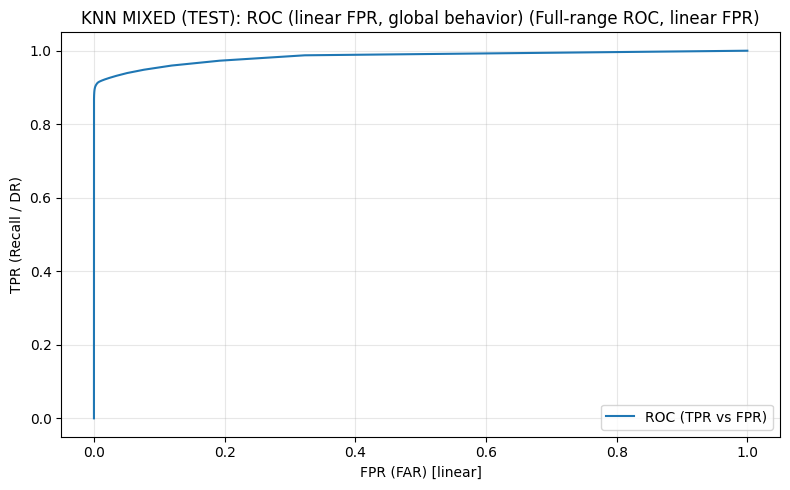

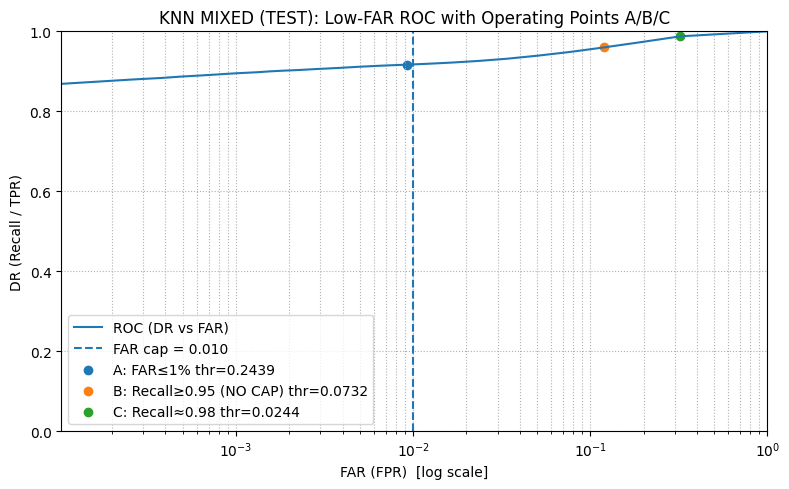

Operating Point A (FAR capped): {'thr': 0.24390243902439024, 'tn': 1055963, 'fp': 9839, 'fn': 22177, 'tp': 243928, 'precision_pos': 0.9612282132822628, 'recall_pos': 0.9166607166344112, 'f1_pos': 0.9384156099963068, 'macro_f1': 0.961741185098921, 'fpr': 0.009231545821831822, 'fnr': 0.08333928336558877, 'mcc': 0.9238944682664898, 'balanced_acc': 0.9537145854062896}
Operating Point B (Recall>=0.95 NO CAP): {'thr': 0.07317073170731707, 'tn': 939103, 'fp': 126699, 'fn': 10738, 'tp': 255367, 'precision_pos': 0.6683845199520502, 'recall_pos': 0.9596475075628041, 'f1_pos': 0.7879618187175915, 'macro_f1': 0.8598883145887894, 'fpr': 0.1188766769062171, 'fnr': 0.040352492437195846, 'mcc': 0.7432719904290513, 'balanced_acc': 0.9203854153282935}
FAR cost multiplier (B vs A): 12.88x
Operating Point C (Recall≈0.98): {'thr': 0.024390243902439025, 'tn': 721934, 'fp': 343868, 'fn': 3321, 'tp': 262784, 'precision_pos': 0.4331709118242419, 'recall_pos': 0.987519963924015, 'f1_pos': 0.6021928211403632, 'm

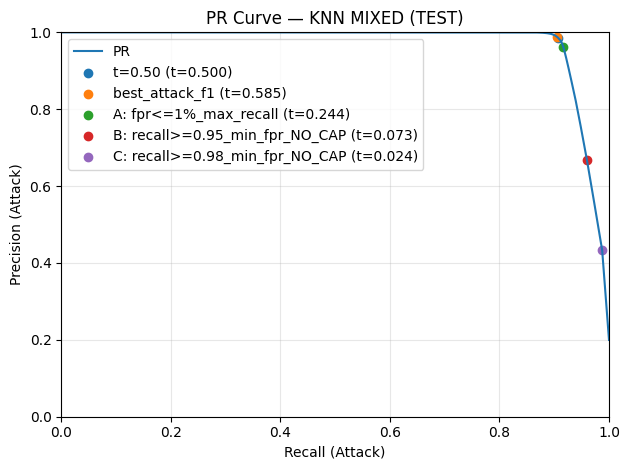

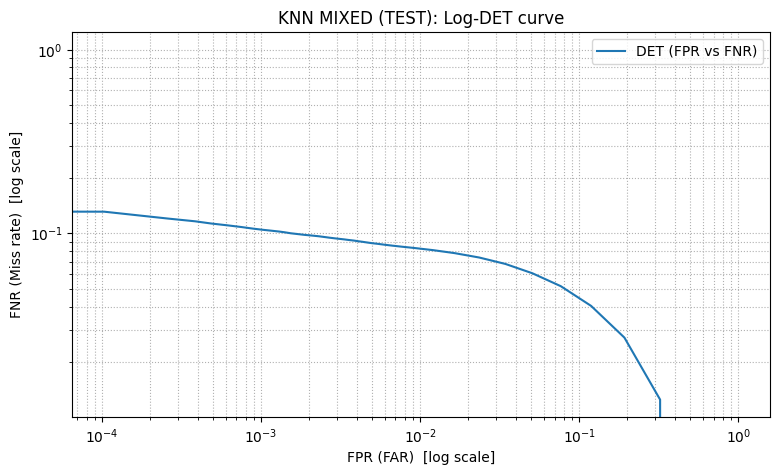

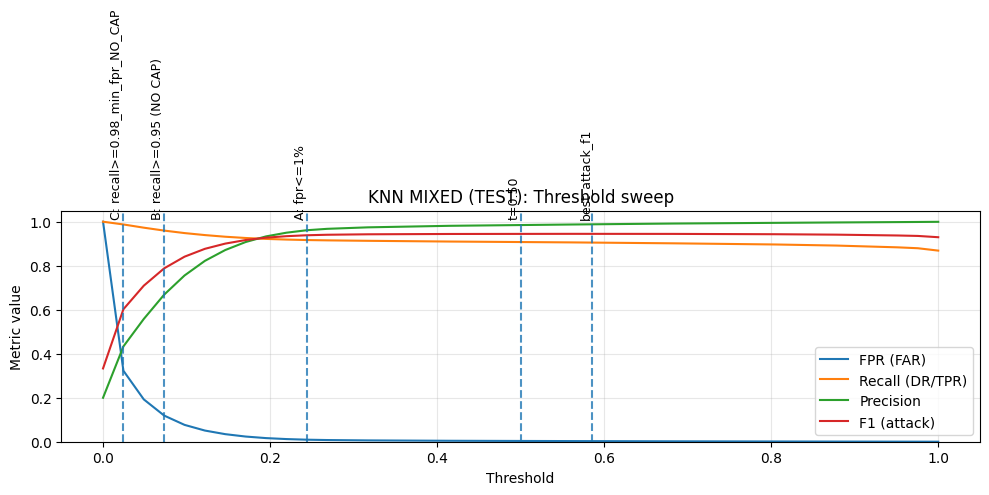

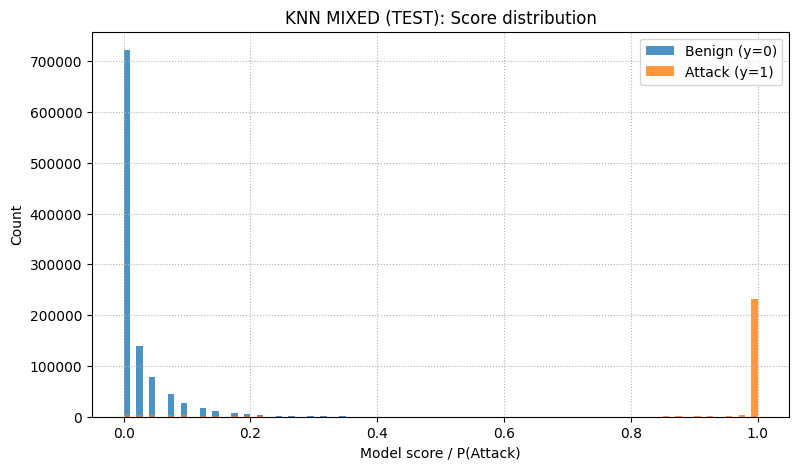


=== MIXED (KNN): per-subtype attack recall @ Operating Point A (fpr<=1%) ===


,subtype,n,share_of_attacks,tp,fn,recall
0,DDoS,155400,0.583980,155332,68,0.999562
1,DoS,39179,0.147231,38563,616,0.984277
2,Bot,28902,0.108611,28764,138,0.995225
3,Infiltration,23508,0.088341,2297,21211,0.097711
4,BruteForce,19066,0.071648,18935,131,0.993129
5,Web,50,0.000188,37,13,0.740000


In [144]:
# D) KNN MIXED-only FULL run block + required plots

# ---- helper patches (define only if missing) ----

if "_select_r98_threshold_for_plot" not in globals():
    def _select_r98_threshold_for_plot(thresholds_dict):
        """
        Prefer capped r98 if feasible; else fall back to NO_CAP r98.
        Returns (thr, label) where thr can be None.
        """
        thr_cap = thresholds_dict.get("recall>=0.98_min_fpr", None)
        if thr_cap is not None:
            return thr_cap, "recall>=0.98_min_fpr"
        thr_any = thresholds_dict.get("recall>=0.98_min_fpr_NO_CAP", None)
        if thr_any is not None:
            return thr_any, "recall>=0.98_min_fpr_NO_CAP"
        return None, "recall>=0.98_(missing)"


if "metrics_at_threshold" not in globals():
    def metrics_at_threshold(y_true, y_score, thr):
        y_true = np.asarray(y_true).astype(int)
        y_score = np.asarray(y_score, dtype=float)
        thr = float(thr)
        yhat = (y_score >= thr).astype(int)
        tn, fp, fn, tp = confusion_matrix(y_true, yhat, labels=[0, 1]).ravel()
        fpr = fp / (fp + tn + 1e-12)
        fnr = fn / (fn + tp + 1e-12)
        rec = tp / (tp + fn + 1e-12)
        prec = tp / (tp + fp + 1e-12)
        return dict(thr=thr, tn=int(tn), fp=int(fp), fn=int(fn), tp=int(tp),
                    fpr=float(fpr), fnr=float(fnr),
                    recall_pos=float(rec), precision_pos=float(prec))


if "print_operating_points_table" not in globals():
    def print_operating_points_table(y_true, y_score, thresholds_dict, model_name="", sort_by="fpr"):
        rows = []
        for lbl, thr in thresholds_dict.items():
            if thr is None:
                continue
            m = metrics_at_threshold(y_true, y_score, thr)
            m["label"] = lbl
            rows.append(m)
        if not rows:
            print(f"[{model_name}] No operating points to print.")
            return
        import pandas as pd
        df = pd.DataFrame(rows)
        if sort_by in df.columns:
            df = df.sort_values(sort_by, ascending=True)
        cols = ["label", "thr", "fpr", "fnr", "recall_pos", "precision_pos", "tp", "fp", "fn", "tn"]
        cols = [c for c in cols if c in df.columns]
        print(f"\n=== {model_name}: Operating Points (TEST) ===")
        display(df[cols])


if "plot_roc_curve_linear_with_operating_points" not in globals():
    def plot_roc_curve_linear_with_operating_points(y_true, y_score, thresholds_dict=None, model_name="ROC (linear)"):
        y_true = np.asarray(y_true).astype(int)
        y_score = np.asarray(y_score, dtype=float)

        fpr, tpr, _ = roc_curve(y_true, y_score)

        plt.figure(figsize=(8, 5))
        plt.plot(fpr, tpr, label="ROC (linear FPR)")
        if thresholds_dict:
            for lbl, thr in thresholds_dict.items():
                if thr is None:
                    continue
                m = metrics_at_threshold(y_true, y_score, thr)
                plt.scatter([m["fpr"]], [m["recall_pos"]], label=f"{lbl} thr={m['thr']:.4f}")
        plt.xlim(0.0, 1.0)
        plt.ylim(0.0, 1.0)
        plt.xlabel("FPR (FAR)")
        plt.ylabel("TPR (Recall / DR)")
        plt.title(model_name)
        plt.grid(True, linestyle=":")
        plt.legend()
        plt.tight_layout()
        plt.show()


if "plot_low_far_roc_with_ops" not in globals():
    def plot_low_far_roc_with_ops(y_true, y_score, thr_A, thr_B=None, thr_C=None, far_cap=0.01, title=""):
        y_true = np.asarray(y_true).astype(int)
        y_score = np.asarray(y_score, dtype=float)

        fpr_curve, tpr_curve, _ = roc_curve(y_true, y_score)

        A = metrics_at_threshold(y_true, y_score, thr_A) if thr_A is not None else None
        B = metrics_at_threshold(y_true, y_score, thr_B) if thr_B is not None else None
        C = metrics_at_threshold(y_true, y_score, thr_C) if thr_C is not None else None

        plt.figure(figsize=(8, 5))
        plt.plot(fpr_curve, tpr_curve, label="ROC (DR vs FAR)")
        plt.axvline(far_cap, linestyle="--", label=f"FAR cap = {far_cap:.3f}")

        if A is not None:
            plt.scatter([A["fpr"]], [A["recall_pos"]],
                        label=f"A: FAR≤{far_cap:.0%} thr={A['thr']:.4f}")
        if B is not None:
            plt.scatter([B["fpr"]], [B["recall_pos"]],
                        label=f"B: Recall≥0.95 (NO CAP) thr={B['thr']:.4f}")
        if C is not None:
            plt.scatter([C["fpr"]], [C["recall_pos"]],
                        label=f"C: Recall≈0.98 thr={C['thr']:.4f}")

        plt.xscale("log")
        fpr_pos = fpr_curve[fpr_curve > 0]
        left = float(fpr_pos.min()) if fpr_pos.size else 1e-5
        plt.xlim(max(1e-5, left), 1.0)
        plt.ylim(0.0, 1.0)

        plt.xlabel("FAR (FPR)  [log scale]")
        plt.ylabel("DR (Recall / TPR)")
        plt.title(title)
        plt.legend()
        plt.grid(True, which="both", linestyle=":")
        plt.tight_layout()
        plt.show()

        if A is not None:
            print("Operating Point A (FAR capped):", A)
        if B is not None:
            print("Operating Point B (Recall>=0.95 NO CAP):", B)
            if A is not None and A["fpr"] > 0:
                print(f"FAR cost multiplier (B vs A): {B['fpr']/A['fpr']:.2f}x")
        if C is not None:
            print("Operating Point C (Recall≈0.98):", C)
            if A is not None and A["fpr"] > 0:
                print(f"FAR cost multiplier (C vs A): {C['fpr']/A['fpr']:.2f}x")


if "plot_det" not in globals():
    def plot_det(y_true, y_score, title="DET curve (TEST)"):
        y_true = np.asarray(y_true).astype(int)
        y_score = np.asarray(y_score, dtype=float)
        fpr, fnr, _ = det_curve(y_true, y_score)

        plt.figure(figsize=(9, 5))
        plt.plot(fpr, fnr, label="DET (FPR vs FNR)")
        plt.xscale("log")
        plt.yscale("log")
        plt.xlabel("FPR (FAR)  [log scale]")
        plt.ylabel("FNR (Miss rate)  [log scale]")
        plt.title(title)
        plt.grid(True, which="both", linestyle=":")
        plt.legend()
        plt.show()


if "plot_score_hist" not in globals():
    def plot_score_hist(y_true, y_score, title="Score distribution (TEST)", bins=100):
        y_true = np.asarray(y_true).astype(int)
        y_score = np.asarray(y_score, dtype=float)

        plt.figure(figsize=(9, 5))
        plt.hist(y_score[y_true == 0], bins=bins, alpha=0.8, label="Benign (y=0)")
        plt.hist(y_score[y_true == 1], bins=bins, alpha=0.8, label="Attack (y=1)")
        plt.xlabel("Model score / P(Attack)")
        plt.ylabel("Count")
        plt.title(title)
        plt.grid(True, linestyle=":")
        plt.legend()
        plt.show()


if "plot_threshold_sweep_metrics" not in globals():
    def plot_threshold_sweep_metrics(y_true, y_score, thresholds_dict, model_name=""):
        """
        Simple sweep visualization (precision/recall/fpr/fnr vs threshold)
        plus vertical lines for provided operating points.
        """
        y_true = np.asarray(y_true).astype(int)
        y_score = np.asarray(y_score, dtype=float)

        thr_grid = np.linspace(0.0, 1.0, 200)
        precs, recs, fprs, fnrs = [], [], [], []
        for thr in thr_grid:
            m = metrics_at_threshold(y_true, y_score, thr)
            precs.append(m["precision_pos"])
            recs.append(m["recall_pos"])
            fprs.append(m["fpr"])
            fnrs.append(m["fnr"])

        plt.figure(figsize=(9, 5))
        plt.plot(thr_grid, recs, label="Recall (TPR)")
        plt.plot(thr_grid, precs, label="Precision")
        plt.plot(thr_grid, fprs, label="FPR (FAR)")
        plt.plot(thr_grid, fnrs, label="FNR")

        for lbl, thr in (thresholds_dict or {}).items():
            if thr is None:
                continue
            plt.axvline(float(thr), linestyle="--", label=f"{lbl} thr={float(thr):.4f}")

        plt.xlabel("Threshold")
        plt.ylabel("Metric value")
        plt.title(f"{model_name} (TEST): Threshold sweep")
        plt.grid(True, linestyle=":")
        plt.legend()
        plt.tight_layout()
        plt.show()


# -------------------- RUN MIXED-ONLY (FULL) --------------------
RUN_MODELS["KNN"] = True

START_TIME = time.time()
old_do_plots = do_plots
do_plots = False  # plot manually here

split_mode = "MIXED"
kn = get_knn_mode_knobs(split_mode)

Xtr_raw_m, ytr_m, gtr_m, Xva_raw_m, yva_m, gva_m, Xte_raw_m, yte_m, gte_m, meta_m = build_mixed_fold(
    registry=REGISTRY,
    seed=MIXED_RANDOM_STATE,
    test_size=MIXED_TEST_SIZE,
    val_size=MIXED_VAL_SIZE,
    use_rare_injection=MIXED_USE_RARE_ALLOCATION,
    rare_subtypes=RARE_SUBTYPES,
    rare_n_test=RARE_N_TEST_PER_SUBTYPE,
    rare_n_val=RARE_N_VAL_PER_SUBTYPE,
)
preprocessor_m, prep_dbg_m = build_preprocessor(Xtr_raw_m, meta_m["feature_cols"])
print("MIXED preprocessor debug:", prep_dbg_m)
print("MIXED shapes:", Xtr_raw_m.shape, Xva_raw_m.shape, Xte_raw_m.shape)
print("MIXED n_features:", len(meta_m["feature_cols"]))

# Train + evaluate KNN on MIXED
knn_df_m, knn_best_params_m, knn_thresholds_m, knn_feas_m = run_knn_fold(
    Xtr_raw_m, ytr_m, gtr_m,
    Xva_raw_m, yva_m, gva_m,
    Xte_raw_m, yte_m, gte_m,
    preprocessor_m,
    model_name="KNN",
    fast_mode=False,
    split_mode="MIXED",

    fit_cap_final=None,  # default from mode knobs
    val_eval_cap_final=KNN_VAL_EVAL_CAP_FINAL,
    test_eval_cap_final=KNN_TEST_EVAL_CAP_FINAL,

    max_fpr_cap=MAX_FPR_CAP,

    do_calibrate=KNN_DO_CALIBRATE,
    cal_method=KNN_CAL_METHOD,
    cal_cv=KNN_CAL_CV,

    # mode knobs
    n_iter_knn=None,
    tune_cap_local=kn["tune_cap"],
    tune_frac_local=kn["tune_frac"],
    cv_splits_local=kn["cv_splits"],
)

# Optional: run attack type stage 2 if main feasibility is good (can be None/False if we want to skip)
knn_attacktype_m = None
if DO_ATTACKTYPE_STAGE2:
    art = knn_feas_m.get("__artifacts__", {})
    score_te_m = art.get("score_te", None)
    thr_main_m = knn_thresholds_m.get(MAIN_THR_LABEL, None)

    knn_attacktype_m = run_attacktype_stage2(
        model_key="KNN",
        preprocessor=preprocessor_m,
        Xtr_raw=Xtr_raw_m, ytr=ytr_m, label_raw_train=meta_m["label_raw_train"],
        Xte_raw=Xte_raw_m, yte=yte_m, label_raw_test=meta_m["label_raw_test"],
        gate_scores_te=score_te_m, gate_thr=thr_main_m,
        base_best_params=knn_best_params_m,
        min_count=ATTACKTYPE_MIN_COUNT,
        rare_set=RARE_SUBTYPES,
        other_label=ATTACKTYPE_OTHER_LABEL,
    )
    knn_attacktype_m.update({"model": "KNN", "split_mode": "MIXED", "test_day": "MIXED"})
    display(pd.DataFrame([knn_attacktype_m]))
print("KNN attack type stage 2 result:", knn_attacktype_m)
# Note: the attack type stage 2 is optional and can be skipped if we want to focus only on main feasibility and operating points.

knn_df_m = knn_df_m.copy()
knn_df_m["test_day"] = "MIXED"
knn_df_m["split_mode"] = "MIXED"

print("\n=== MIXED (KNN): best_params ===")
print(knn_best_params_m)

print("\n=== MIXED (KNN): thresholds (picked on VAL) ===")
print(knn_thresholds_m)

print("\n=== MIXED (KNN): feasibility ===")
print({k: v for k, v in knn_feas_m.items() if k != "__artifacts__"})

display(knn_df_m)

elapsed = time.time() - START_TIME
print(f"\nTotal time elapsed for KNN MIXED-only run: {elapsed/60:.2f} minutes")


# -------------------- REQUIRED PLOTS / MIXED SPLIT ONLY --------------------
art = knn_feas_m.get("__artifacts__", {})
yte_eval_m = art.get("yte_eval", None)
score_te_m = art.get("score_te", None)

if yte_eval_m is not None and score_te_m is not None:

    # Operating points:
    thr_A = knn_thresholds_m.get("fpr<=1%_max_recall", None)
    thr_B = knn_thresholds_m.get("recall>=0.95_min_fpr_NO_CAP", None)
    thr_C, thr_C_label = _select_r98_threshold_for_plot(knn_thresholds_m)

    op_table_dict = {
        "t=0.50": knn_thresholds_m.get("t=0.50"),
        "best_attack_f1": knn_thresholds_m.get("best_attack_f1"),
        "A (FPR<=1%)": thr_A,
        "B (Recall>=0.95 NO CAP)": thr_B,
        "C (Recall>=0.98)": thr_C,
    }

    # Operating Points table
    print_operating_points_table(
        yte_eval_m, score_te_m,
        thresholds_dict=op_table_dict,
        model_name="KNN MIXED",
        sort_by="fpr"
    )

    # 1) Linear ROC (global behavior) — NO markers (match XGB Block D)
    plot_roc_curve_linear_with_operating_points(
        yte_eval_m, score_te_m,
        thresholds_dict={},  # empty => no markers
        model_name="KNN MIXED (TEST): ROC (linear FPR, global behavior)"
    )

    # 2) Low-FAR ROC with Operating Points A/B/C (log-FPR)
    if thr_A is not None:
        plot_low_far_roc_with_ops(
            yte_eval_m, score_te_m,
            thr_A=thr_A,
            thr_B=(thr_B if thr_B is not None else None),
            thr_C=(thr_C if thr_C is not None else None),
            far_cap=MAX_FPR_CAP,
            title="KNN MIXED (TEST): Low-FAR ROC with Operating Points A/B/C"
        )

    # 3) PR curve with thresholds marked (use your existing helper)
    thr_dict_for_pr = {
        "t=0.50": knn_thresholds_m.get("t=0.50"),
        "best_attack_f1": knn_thresholds_m.get("best_attack_f1"),
        "A: fpr<=1%_max_recall": knn_thresholds_m.get("fpr<=1%_max_recall"),
        "B: recall>=0.95_min_fpr_NO_CAP": knn_thresholds_m.get("recall>=0.95_min_fpr_NO_CAP"),
    }
    if thr_C is not None:
        thr_dict_for_pr[f"C: {thr_C_label}"] = thr_C

    plot_pr_curve_with_thresholds(
        yte_eval_m, score_te_m,
        thr_dict_for_pr,
        model_name="KNN MIXED (TEST)"
    )

    # 4) Log-DET curve
    plot_det(
        yte_eval_m, score_te_m,
        title="KNN MIXED (TEST): Log-DET curve"
    )

    # 5) Threshold sweep (TEST) with vertical lines at key thresholds
    thr_dict_for_sweep = {
        "t=0.50": knn_thresholds_m.get("t=0.50"),
        "best_attack_f1": knn_thresholds_m.get("best_attack_f1"),
        "A: fpr<=1%": knn_thresholds_m.get("fpr<=1%_max_recall"),
        "B: recall>=0.95 (NO CAP)": knn_thresholds_m.get("recall>=0.95_min_fpr_NO_CAP"),
    }
    if thr_C is not None:
        thr_dict_for_sweep[f"C: {thr_C_label}"] = thr_C

    plot_threshold_sweep_metrics(
        yte_eval_m,
        score_te_m,
        thresholds_dict=thr_dict_for_sweep,
        model_name="KNN MIXED"
    )

    # 6) Score distribution
    plot_score_hist(
        yte_eval_m, score_te_m,
        title="KNN MIXED (TEST): Score distribution",
        bins=100
    )

    # 7) Per-subtype recall @ Operating Point A
    label_raw_test = None
    if "meta_m" in globals():
        label_raw_test = meta_m.get("label_raw_test", None)

    if ("per_subtype_attack_recall" in globals() and "map_array_to_coarse" in globals() and thr_A is not None and label_raw_test is not None):
        subtype_df = per_subtype_attack_recall(
            y_true=np.asarray(yte_eval_m),
            y_score=np.asarray(score_te_m),
            thr=float(thr_A),
            # label_raw=np.asarray(label_raw_test),
            label_raw=map_array_to_coarse(np.asarray(label_raw_test)),      # use coarse labels for better subtype-level stats
        )
        print("\n=== MIXED (KNN): per-subtype attack recall @ Operating Point A (fpr<=1%) ===")
        display(subtype_df)

do_plots = old_do_plots


In [186]:
# E) KNN outer loop (LODO) + append MIXED results from Block D (NO recompute) + required summaries
# Requires that Block D has already run and created:
#   knn_df_m, knn_best_params_m, knn_thresholds_m, knn_feas_m


do_plots_loop = False
old_do_plots = do_plots
do_plots = do_plots_loop

MAIN_THR_LABEL = "fpr<=1%_max_recall"

subtype_rows = []   # NEW: per-day per-subtype tables (do NOT display inside loop)

all_rows = []
attacktype_rows = []    # optional, only if DO_ATTACKTYPE_STAGE2 is True and produces results
best_params_log = []
feas_rows = []
START_TIME = time.time()

# ---------- LODO loop ----------
RUN_MODELS["KNN"] = True

for test_day in TEST_DAYS:
    Xtr_raw, ytr, gtr, Xva_raw, yva, gva, Xte_raw, yte, gte, meta = build_fold(
        registry=REGISTRY, val_days=VAL_DAYS, test_day=test_day
    )
    preprocessor, prep_dbg = build_preprocessor(Xtr_raw, meta["feature_cols"])

    if RUN_MODELS.get("KNN", False):
        split_mode = "LODO"
        kn = get_knn_mode_knobs(split_mode)

        knn_df, knn_best_params, knn_thresholds, knn_feas = run_knn_fold(
            Xtr_raw, ytr, gtr,
            Xva_raw, yva, gva,
            Xte_raw, yte, gte,
            preprocessor,
            model_name="KNN",
            fast_mode=False,
            split_mode=split_mode,

            fit_cap_final=None,
            val_eval_cap_final=KNN_VAL_EVAL_CAP_FINAL,
            test_eval_cap_final=KNN_TEST_EVAL_CAP_FINAL,

            max_fpr_cap=MAX_FPR_CAP,

            # mode knobs (explicit like XGB)
            n_iter_knn=kn["n_iter"],
            tune_cap_local=kn["tune_cap"],
            tune_frac_local=kn["tune_frac"],
            cv_splits_local=kn["cv_splits"],

            do_calibrate=KNN_DO_CALIBRATE,
            cal_method=KNN_CAL_METHOD,
            cal_cv=KNN_CAL_CV,
        )

        # Optional: run attack type stage 2 if main feasibility is good (can be None/False if we want to skip)
        if DO_ATTACKTYPE_STAGE2:
            art = knn_feas.get("__artifacts__", {})
            score_te = art.get("score_te", None)
            thr_main = knn_thresholds.get(MAIN_THR_LABEL, None)

            r = run_attacktype_stage2(
                model_key="KNN",
                preprocessor=preprocessor,
                Xtr_raw=Xtr_raw, ytr=ytr, label_raw_train=meta["label_raw_train"],
                Xte_raw=Xte_raw, yte=yte, label_raw_test=meta["label_raw_test"],
                gate_scores_te=score_te, gate_thr=thr_main,
                base_best_params=knn_best_params,
                min_count=ATTACKTYPE_MIN_COUNT,
                rare_set=RARE_SUBTYPES,
                other_label=ATTACKTYPE_OTHER_LABEL,
            )
            r.update({"model": "KNN", "split_mode": "LODO", "test_day": test_day})
            attacktype_rows.append(r)
            print(f"KNN attack type stage 2 result for test_day={test_day}:", r)
        # Note: the attack type stage 2 is optional and can be skipped if we want to focus only on main feasibility and operating points


        # --- NEW: Collect per-subtype attack recall @ Operating Point A (NO printing) ---
        art = knn_feas.get("__artifacts__", {})
        score_te = art.get("score_te", None)
        thr_A = knn_thresholds.get(MAIN_THR_LABEL, None)

        if (score_te is not None) and (thr_A is not None) and ("label_raw_test" in meta) and ("map_array_to_coarse" in globals()):
            df_sub = per_subtype_attack_recall(
                y_true=np.asarray(yte),
                y_score=np.asarray(score_te),
                thr=float(thr_A),
                label_raw=map_array_to_coarse(np.asarray(meta["label_raw_test"])),
            )
            df_sub["test_day"] = test_day
            df_sub["split_mode"] = "LODO"
            subtype_rows.append(df_sub)
        # This per-subtype recall summary is optional and can be skipped if we want to focus only on main feasibility and operating points


        knn_df = knn_df.copy()
        knn_df["test_day"] = test_day
        knn_df["split_mode"] = "LODO"
        all_rows.append(knn_df)

        best_params_log.append({
            "model": "KNN",
            "test_day": test_day,
            "split_mode": "LODO",
            "best_params": knn_best_params
        })

        for lbl in ["fpr<=1%_max_recall", "recall>=0.95_min_fpr", "recall>=0.98_min_fpr"]:
            feas_rows.append({
                "model": "KNN",
                "test_day": test_day,
                "split_mode": "LODO",
                "thr_label": lbl,
                "feasible": bool(knn_feas.get(lbl, False))
            })

if not all_rows:
    print("No LODO rows collected. Check RUN_MODELS and loop execution.")
    do_plots = old_do_plots
    raise SystemExit

results_knn_lodo = pd.concat(all_rows, ignore_index=True)


# ---------- NEW: Pooled per-subtype recall across LODO days (MAIN section) ----------
if subtype_rows:
    knn_subtype_lodo_all = pd.concat(subtype_rows, ignore_index=True)

    # pooled counts across days
    knn_subtype_lodo_pooled = (
        knn_subtype_lodo_all
        .groupby("subtype", as_index=False)
        .agg(n=("n", "sum"), tp=("tp", "sum"), fn=("fn", "sum"))
    )
    knn_subtype_lodo_pooled["recall_pooled"] = knn_subtype_lodo_pooled["tp"] / knn_subtype_lodo_pooled["n"]
    knn_subtype_lodo_pooled["share_of_attacks_pooled"] = (
        knn_subtype_lodo_pooled["n"] / knn_subtype_lodo_pooled["n"].sum()
    )
    knn_subtype_lodo_pooled = knn_subtype_lodo_pooled.sort_values(["n", "recall_pooled"], ascending=[False, True])

    print(f"\n[KNN][LODO] Pooled per-subtype attack recall @A ({MAIN_THR_LABEL})")
    display(knn_subtype_lodo_pooled)

    # optional: day-to-day variability
    knn_subtype_lodo_stats = (
        knn_subtype_lodo_all
        .groupby("subtype")["recall"]
        .agg(recall_mean="mean", recall_median="median", recall_min="min", recall_max="max")
        .reset_index()
        .sort_values("recall_min")
    )
    print("\n[KNN][LODO] Per-subtype recall variability across days (optional)")
    display(knn_subtype_lodo_stats)
else:
    knn_subtype_lodo_all = pd.DataFrame()
    knn_subtype_lodo_pooled = pd.DataFrame()
    knn_subtype_lodo_stats = pd.DataFrame()
    print("\n[KNN][LODO] No per-subtype tables collected (check score_te / threshold / meta[label_raw_test]).")


elapsed = time.time() - START_TIME
print(f"\nTotal time elapsed for KNN LODO loop: {elapsed/60:.2f} minutes")

# ---------- Append MIXED from Block D (NO recompute) ----------
if RUN_MODELS.get("KNN", False):
    required = ["knn_df_m", "knn_best_params_m", "knn_thresholds_m", "knn_feas_m"]
    missing = [v for v in required if v not in globals()]
    if missing:
        raise RuntimeError(
            "Block D (KNN MIXED-only FULL run) must run before Block E so we can append MIXED without recomputing.\n"
            f"Missing variables: {missing}"
        )

    knn_df_m_app = knn_df_m.copy()
    knn_df_m_app["test_day"] = "MIXED"
    knn_df_m_app["split_mode"] = "MIXED"

    results_knn = pd.concat([results_knn_lodo, knn_df_m_app], ignore_index=True)

    # Best params log (append MIXED)
    best_params_log.append({
        "model": "KNN",
        "test_day": "MIXED",
        "split_mode": "MIXED",
        "best_params": knn_best_params_m
    })

    # Feasibility rows (append MIXED)
    for lbl in ["fpr<=1%_max_recall", "recall>=0.95_min_fpr", "recall>=0.98_min_fpr"]:
        feas_rows.append({
            "model": "KNN",
            "test_day": "MIXED",
            "split_mode": "MIXED",
            "thr_label": lbl,
            "feasible": bool(knn_feas_m.get(lbl, False))
        })

else:
    results_knn = results_knn_lodo


# Optional: attack type stage 2 summary (append MIXED)
if knn_attacktype_m is not None:
    attacktype_rows.append(knn_attacktype_m)

knn_attacktype_df = pd.DataFrame(attacktype_rows)
display(knn_attacktype_df)
# Note: the attack type stage 2 summary is optional and can be skipped if we want to focus only on main feasibility and operating points


# ---------- Display combined results ----------
display(results_knn.head(80))

# ---------- Best params / feasibility summaries (LODO + MIXED) ----------
best_params_knn = pd.DataFrame(best_params_log)
display(best_params_knn)

for _, r in best_params_knn.iterrows():
    print(f"\n[{r['model']}] test_day={r['test_day']} split_mode={r['split_mode']}")
    pprint(r["best_params"])
    print("-" * 80)

feas_knn = pd.DataFrame(feas_rows)
feas_summary_knn = (
    feas_knn.groupby(["model", "split_mode", "thr_label"])
    .agg(
        feasible_days=("feasible", "sum"),
        total_days=("feasible", "count"),
        feasibility_rate=("feasible", "mean")
    )
    .reset_index()
)
display(feas_summary_knn)

# ---------- Summary block (split-aware) for MAIN threshold ----------
MAIN_THR_LABEL = "fpr<=1%_max_recall"

def iqr(s): return float(s.quantile(0.75) - s.quantile(0.25))
def q25(s): return float(s.quantile(0.25))
def q75(s): return float(s.quantile(0.75))

sel = results_knn[results_knn["thr_label"] == MAIN_THR_LABEL].copy()

if sel.empty:
    print("No rows for MAIN_THR_LABEL =", MAIN_THR_LABEL)
else:
    # violation summary (per split_mode)
    violation_df = (
        sel.assign(fpr_violation=lambda d: d["fpr"] > MAX_FPR_CAP)
          .groupby(["model", "split_mode"])
          .agg(
              test_days=("test_day", "nunique"),
              violation_days=("fpr_violation", "sum"),
              violation_rate=("fpr_violation", "mean")
          )
          .reset_index()
    )
    display(violation_df)

    # metrics summary (per split_mode)
    summary_knn = sel.groupby(["model", "split_mode"]).agg(
        n_folds=("test_day", "nunique"),

        pr_auc_mean=("pr_auc", "mean"), pr_auc_std=("pr_auc", "std"),
        roc_auc_mean=("roc_auc", "mean"), roc_auc_std=("roc_auc", "std"),
        mcc_mean=("mcc", "mean"),       mcc_std=("mcc", "std"),
        f1_mean=("f1_pos", "mean"),     f1_std=("f1_pos", "std"),
        recall_mean=("recall_pos", "mean"), recall_std=("recall_pos", "std"),
        precision_mean=("precision_pos", "mean"), precision_std=("precision_pos", "std"),
        fpr_mean=("fpr", "mean"),       fpr_std=("fpr", "std"),
        fnr_mean=("fnr", "mean"),       fnr_std=("fnr", "std"),

        pr_auc_median=("pr_auc", "median"),
        f1_median=("f1_pos", "median"),
        recall_median=("recall_pos", "median"),
        precision_median=("precision_pos", "median"),
        fpr_median=("fpr", "median"),
        fnr_median=("fnr", "median"),
        mcc_median=("mcc", "median"),

        pr_auc_q25=("pr_auc", q25), pr_auc_q75=("pr_auc", q75), pr_auc_iqr=("pr_auc", iqr),
        f1_q25=("f1_pos", q25),     f1_q75=("f1_pos", q75),     f1_iqr=("f1_pos", iqr),
        recall_q25=("recall_pos", q25), recall_q75=("recall_pos", q75), recall_iqr=("recall_pos", iqr),
        precision_q25=("precision_pos", q25), precision_q75=("precision_pos", q75), precision_iqr=("precision_pos", iqr),
        fpr_q25=("fpr", q25),       fpr_q75=("fpr", q75),       fpr_iqr=("fpr", iqr),

        pr_auc_min=("pr_auc", "min"), pr_auc_max=("pr_auc", "max"),
        f1_min=("f1_pos", "min"),     f1_max=("f1_pos", "max"),
        recall_min=("recall_pos", "min"), recall_max=("recall_pos", "max"),
        precision_min=("precision_pos", "min"), precision_max=("precision_pos", "max"),
        fpr_min=("fpr", "min"),       fpr_max=("fpr", "max"),
        mcc_min=("mcc", "min"),       mcc_max=("mcc", "max"),
    ).reset_index()

    display(summary_knn)

do_plots = old_do_plots


[KNN] split_mode=LODO Xtr_raw=4,313,753 tune_size_target=30,000 Xt_actual=30,000 unique_days=7
[KNN] FINAL fit_cap=300,000  Xfit_actual=300,000
KNN attack type stage 2 result for test_day=df_parquet_DDoS1_Tue_20: {'stage2_skipped': False, 'n_train_attacks': 516524, 'n_test_attacks': 575364, 'n_classes': 5, 'classes': ['BruteForce', 'DDoS', 'DoS', 'Infiltration', 'Web'], 'oracle_n_test_classes': 1, 'oracle_macro_f1': 0.0009175739714464403, 'oracle_weighted_f1': 0.002752721914339321, 'oracle_acc': 0.0013782579375838599, 'oracle_bacc': 0.0013782579375838599, 'gated_available': True, 'gate_thr': 0.38461538461538464, 'n_flagged_total': 272572, 'n_tp_attacks': 269909, 'gated_macro_f1_tp': 0.0018129530073220147, 'joint_correct_rate': 0.0012791902169756884, 'model': 'KNN', 'split_mode': 'LODO', 'test_day': 'df_parquet_DDoS1_Tue_20'}
[KNN] split_mode=LODO Xtr_raw=4,707,203 tune_size_target=30,000 Xt_actual=30,000 unique_days=7
[KNN] FINAL fit_cap=300,000  Xfit_actual=300,000
KNN attack type sta

,subtype,n,tp,fn,recall_pooled,share_of_attacks_pooled
1,DDoS,775955,435874,340081,0.561726,0.710654
2,DoS,196568,58615,137953,0.298192,0.180026
3,Infiltration,118483,7672,110811,0.064752,0.108512
0,BruteForce,797,156,641,0.195734,0.000730
4,Web,85,3,82,0.035294,0.000078



[KNN][LODO] Per-subtype recall variability across days (optional)


,subtype,recall_mean,recall_median,recall_min,recall_max
4,Web,0.034314,0.034314,0.029412,0.039216
0,BruteForce,0.240082,0.240082,0.046939,0.433225
3,Infiltration,0.063993,0.063993,0.047884,0.080101
2,DoS,0.292266,0.292266,0.279865,0.304666
1,DDoS,0.648245,0.648245,0.469110,0.827380



Total time elapsed for KNN LODO loop: 98.70 minutes


,stage2_skipped,n_train_attacks,n_test_attacks,n_classes,classes,oracle_n_test_classes,oracle_macro_f1,oracle_weighted_f1,oracle_acc,oracle_bacc,gated_available,gate_thr,n_flagged_total,n_tp_attacks,gated_macro_f1_tp,joint_correct_rate,model,split_mode,test_day
0,False,516524,575364,5,"[BruteForce, DDoS, DoS, Infiltration, Web]",1.0,0.000918,0.002753,0.001378,0.001378,True,0.384615,272572,269909,0.001813,0.001279,KNN,LODO,df_parquet_DDoS1_Tue_20
1,False,891297,200591,5,"[BruteForce, DDoS, DoS, Infiltration, Web]",1.0,0.005701,0.017102,0.008625,0.008625,True,0.292683,166006,165965,0.006874,0.008620,KNN,LODO,df_parquet_DDoS2_Wed_21
2,False,1040574,51314,5,"[BruteForce, DDoS, DoS, Infiltration, Web]",1.0,0.081180,0.405902,0.254628,0.254628,True,0.384615,27430,14361,0.049066,0.014441,KNN,LODO,df_parquet_DoS1_Thu_15
3,False,946634,145254,5,"[BruteForce, DDoS, DoS, Infiltration, Web]",1.0,0.007129,0.021386,0.010809,0.010809,True,0.219512,44521,44254,0.002132,0.000978,KNN,LODO,df_parquet_DoS2_Fri_16
4,False,1035439,56449,5,"[BruteForce, DDoS, DoS, Infiltration, Web]",1.0,0.198251,0.991253,0.982657,0.982657,True,0.365854,15551,2703,0.310892,0.041843,KNN,LODO,df_parquet_Infil1_Wed_28
5,False,1029854,62034,5,"[BruteForce, DDoS, DoS, Infiltration, Web]",1.0,0.247995,0.991981,0.984089,0.984089,True,0.195122,9254,4969,0.237146,0.072267,KNN,LODO,df_parquet_Infil2_Thu_01
6,False,1091547,341,5,"[BruteForce, DDoS, DoS, Infiltration, Web]",2.0,0.153906,0.692804,0.577713,0.320847,True,0.268293,6569,134,0.172650,0.296188,KNN,LODO,df_parquet_Web1_Thu_22
7,False,1091347,541,5,"[BruteForce, DDoS, DoS, Infiltration, Web]",2.0,0.123586,0.559679,0.414048,0.228571,True,0.268293,7017,25,0.016667,0.001848,KNN,LODO,df_parquet_Web2_Fri_23
8,False,931366,266105,6,"[Bot, BruteForce, DDoS, DoS, Infiltration, OTHER]",NaN,0.828290,0.996090,0.996182,0.828361,True,0.243902,253767,243928,0.823284,0.914718,KNN,MIXED,MIXED


,thr,tn,fp,fn,tp,precision_pos,recall_pos,f1_pos,macro_f1,fpr,fnr,mcc,balanced_acc,roc_auc,pr_auc,model,thr_label,test_day,split_mode
0,0.500000,377970,1512,306400,268964,0.994410,0.467468,0.635969,0.673269,0.003984,0.532532,0.503374,0.731742,0.830263,0.870302,KNN,t=0.50,df_parquet_DDoS1_Tue_20,LODO
1,0.307692,374870,4612,304978,270386,0.983229,0.469939,0.635932,0.671840,0.012153,0.530061,0.494719,0.728893,0.830263,0.870302,KNN,best_attack_f1,df_parquet_DDoS1_Tue_20,LODO
2,0.384615,376819,2663,305455,269909,0.990230,0.469110,0.636626,0.673215,0.007017,0.530890,0.500698,0.731046,0.830263,0.870302,KNN,fpr<=1%_max_recall,df_parquet_DDoS1_Tue_20,LODO
3,0.000000,0,379482,0,575364,0.602573,1.000000,0.752007,0.376003,1.000000,0.000000,0.000000,0.500000,0.830263,0.870302,KNN,recall>=0.95_min_fpr_NO_CAP,df_parquet_DDoS1_Tue_20,LODO
4,0.000000,0,379482,0,575364,0.602573,1.000000,0.752007,0.376003,1.000000,0.000000,0.000000,0.500000,0.830263,0.870302,KNN,recall>=0.98_min_fpr_NO_CAP,df_parquet_DDoS1_Tue_20,LODO
5,0.500000,360766,39,35121,165470,0.999764,0.824912,0.903961,0.928748,0.000108,0.175088,0.866855,0.912402,0.999843,0.999658,KNN,t=0.50,df_parquet_DDoS2_Wed_21,LODO
6,0.048780,360225,580,82,200509,0.997116,0.999591,0.998352,0.998717,0.001608,0.000409,0.997436,0.998992,0.999843,0.999658,KNN,best_attack_f1,df_parquet_DDoS2_Wed_21,LODO
7,0.292683,360764,41,34626,165965,0.999753,0.827380,0.905436,0.929796,0.000114,0.172620,0.868686,0.913633,0.999843,0.999658,KNN,fpr<=1%_max_recall,df_parquet_DDoS2_Wed_21,LODO
8,0.024390,196555,164250,0,200591,0.549804,1.000000,0.709514,0.707411,0.455232,0.000000,0.547280,0.772384,0.999843,0.999658,KNN,recall>=0.95_min_fpr_NO_CAP,df_parquet_DDoS2_Wed_21,LODO
9,0.024390,196555,164250,0,200591,0.549804,1.000000,0.709514,0.707411,0.455232,0.000000,0.547280,0.772384,0.999843,0.999658,KNN,recall>=0.98_min_fpr_NO_CAP,df_parquet_DDoS2_Wed_21,LODO


,model,test_day,split_mode,best_params
0,KNN,df_parquet_DDoS1_Tue_20,LODO,"{'clf__n_jobs': 1, 'clf__n_neighbors': 13, 'clf__p': 2, 'clf__weights': 'uniform', 'fit_cap_final': 300000, 'split_mode': 'LODO', 'tune_size': 30000, 'cv_splits': 3, 'n_iter': 10, 'scoring_used': 'average_precision', 'calibrated': False, 'val_fpr_realized_at_fpr1_thr': 0.006256199573547444, 'test_fpr_realized_at_fpr1_thr': 0.007017460643719596}"
1,KNN,df_parquet_DDoS2_Wed_21,LODO,"{'clf__n_jobs': 1, 'clf__n_neighbors': 41, 'clf__p': 2, 'clf__weights': 'uniform', 'fit_cap_final': 300000, 'split_mode': 'LODO', 'tune_size': 30000, 'cv_splits': 3, 'n_iter': 10, 'scoring_used': 'average_precision', 'calibrated': False, 'val_fpr_realized_at_fpr1_thr': 0.007880780736216444, 'test_fpr_realized_at_fpr1_thr': 0.000113634788874877}"
2,KNN,df_parquet_DoS1_Thu_15,LODO,"{'clf__n_jobs': 1, 'clf__n_neighbors': 13, 'clf__p': 2, 'clf__weights': 'uniform', 'fit_cap_final': 300000, 'split_mode': 'LODO', 'tune_size': 30000, 'cv_splits': 3, 'n_iter': 10, 'scoring_used': 'average_precision', 'calibrated': False, 'val_fpr_realized_at_fpr1_thr': 0.0068228937504827315, 'test_fpr_realized_at_fpr1_thr': 0.01757772045116463}"
3,KNN,df_parquet_DoS2_Fri_16,LODO,"{'clf__n_jobs': 1, 'clf__n_neighbors': 41, 'clf__p': 2, 'clf__weights': 'uniform', 'fit_cap_final': 300000, 'split_mode': 'LODO', 'tune_size': 30000, 'cv_splits': 3, 'n_iter': 10, 'scoring_used': 'average_precision', 'calibrated': False, 'val_fpr_realized_at_fpr1_thr': 0.008451814072240056, 'test_fpr_realized_at_fpr1_thr': 0.0005978249917715099}"
4,KNN,df_parquet_Infil1_Wed_28,LODO,"{'clf__n_jobs': 1, 'clf__n_neighbors': 41, 'clf__p': 2, 'clf__weights': 'uniform', 'fit_cap_final': 300000, 'split_mode': 'LODO', 'tune_size': 30000, 'cv_splits': 3, 'n_iter': 10, 'scoring_used': 'average_precision', 'calibrated': False, 'val_fpr_realized_at_fpr1_thr': 0.00911570541275383, 'test_fpr_realized_at_fpr1_thr': 0.03208598885181707}"
5,KNN,df_parquet_Infil2_Thu_01,LODO,"{'clf__n_jobs': 1, 'clf__n_neighbors': 41, 'clf__p': 2, 'clf__weights': 'uniform', 'fit_cap_final': 300000, 'split_mode': 'LODO', 'tune_size': 30000, 'cv_splits': 3, 'n_iter': 10, 'scoring_used': 'average_precision', 'calibrated': False, 'val_fpr_realized_at_fpr1_thr': 0.00856897136762484, 'test_fpr_realized_at_fpr1_thr': 0.02289778556771546}"
6,KNN,df_parquet_Web1_Thu_22,LODO,"{'clf__n_jobs': 1, 'clf__n_neighbors': 41, 'clf__p': 2, 'clf__weights': 'uniform', 'fit_cap_final': 300000, 'split_mode': 'LODO', 'tune_size': 30000, 'cv_splits': 3, 'n_iter': 10, 'scoring_used': 'average_precision', 'calibrated': False, 'val_fpr_realized_at_fpr1_thr': 0.008333788945037607, 'test_fpr_realized_at_fpr1_thr': 0.007754105096742553}"
7,KNN,df_parquet_Web2_Fri_23,LODO,"{'clf__n_jobs': 1, 'clf__n_neighbors': 41, 'clf__p': 2, 'clf__weights': 'uniform', 'fit_cap_final': 300000, 'split_mode': 'LODO', 'tune_size': 30000, 'cv_splits': 3, 'n_iter': 10, 'scoring_used': 'average_precision', 'calibrated': False, 'val_fpr_realized_at_fpr1_thr': 0.008399744163180152, 'test_fpr_realized_at_fpr1_thr': 0.008435642035364064}"
8,KNN,MIXED,MIXED,"{'clf__n_jobs': 1, 'clf__n_neighbors': 41, 'clf__p': 2, 'clf__weights': 'uniform', 'fit_cap_final': 1000000, 'split_mode': 'MIXED', 'tune_size': 150000, 'cv_splits': 5, 'n_iter': 30, 'scoring_used': 'partial_auc@max_fpr', 'calibrated': False, 'val_fpr_realized_at_fpr1_thr': 0.008967894599559769, 'test_fpr_realized_at_fpr1_thr': 0.009231545821831822}"



[KNN] test_day=df_parquet_DDoS1_Tue_20 split_mode=LODO
{'calibrated': False,
 'clf__n_jobs': 1,
 'clf__n_neighbors': 13,
 'clf__p': 2,
 'clf__weights': 'uniform',
 'cv_splits': 3,
 'fit_cap_final': 300000,
 'n_iter': 10,
 'scoring_used': 'average_precision',
 'split_mode': 'LODO',
 'test_fpr_realized_at_fpr1_thr': 0.007017460643719596,
 'tune_size': 30000,
 'val_fpr_realized_at_fpr1_thr': 0.006256199573547444}
--------------------------------------------------------------------------------

[KNN] test_day=df_parquet_DDoS2_Wed_21 split_mode=LODO
{'calibrated': False,
 'clf__n_jobs': 1,
 'clf__n_neighbors': 41,
 'clf__p': 2,
 'clf__weights': 'uniform',
 'cv_splits': 3,
 'fit_cap_final': 300000,
 'n_iter': 10,
 'scoring_used': 'average_precision',
 'split_mode': 'LODO',
 'test_fpr_realized_at_fpr1_thr': 0.000113634788874877,
 'tune_size': 30000,
 'val_fpr_realized_at_fpr1_thr': 0.007880780736216444}
--------------------------------------------------------------------------------

[KNN] t

,model,split_mode,thr_label,feasible_days,total_days,feasibility_rate
0,KNN,LODO,fpr<=1%_max_recall,8,8,1.0
1,KNN,LODO,recall>=0.95_min_fpr,0,8,0.0
2,KNN,LODO,recall>=0.98_min_fpr,0,8,0.0
3,KNN,MIXED,fpr<=1%_max_recall,1,1,1.0
4,KNN,MIXED,recall>=0.95_min_fpr,0,1,0.0
5,KNN,MIXED,recall>=0.98_min_fpr,0,1,0.0


,model,split_mode,test_days,violation_days,violation_rate
0,KNN,LODO,8,3,0.375
1,KNN,MIXED,1,0,0.000


,model,split_mode,n_folds,pr_auc_mean,pr_auc_std,roc_auc_mean,roc_auc_std,mcc_mean,mcc_std,f1_mean,f1_std,recall_mean,recall_std,precision_mean,precision_std,fpr_mean,fpr_std,fnr_mean,fnr_std,pr_auc_median,f1_median,recall_median,precision_median,fpr_median,fnr_median,mcc_median,pr_auc_q25,pr_auc_q75,pr_auc_iqr,f1_q25,f1_q75,f1_iqr,recall_q25,recall_q75,recall_iqr,precision_q25,precision_q75,precision_iqr,fpr_q25,fpr_q75,fpr_iqr,pr_auc_min,pr_auc_max,f1_min,f1_max,recall_min,recall_max,precision_min,precision_max,fpr_min,fpr_max,mcc_min,mcc_max
0,KNN,LODO,8,0.393404,0.375866,0.717432,0.204065,0.309590,0.30123,0.329136,0.324178,0.306022,0.26507,0.530284,0.432858,0.012060,0.011213,0.693978,0.26507,0.298300,0.252079,0.292266,0.530254,0.008095,0.707734,0.241960,0.103259,0.610192,0.506933,0.066009,0.508944,0.442936,0.072047,0.411999,0.339952,0.135461,0.991173,0.855712,0.005413,0.018908,0.013495,0.009520,0.999658,0.006616,0.905436,0.046211,0.827380,0.003563,0.999753,0.000114,0.032086,0.010530,0.868686
1,KNN,MIXED,1,0.966306,NaN,0.983463,NaN,0.923894,NaN,0.938416,NaN,0.916661,NaN,0.961228,NaN,0.009232,NaN,0.083339,NaN,0.966306,0.938416,0.916661,0.961228,0.009232,0.083339,0.923894,0.966306,0.966306,0.000000,0.938416,0.938416,0.000000,0.916661,0.916661,0.000000,0.961228,0.961228,0.000000,0.009232,0.009232,0.000000,0.966306,0.966306,0.938416,0.938416,0.916661,0.916661,0.961228,0.961228,0.009232,0.009232,0.923894,0.923894


[KNN] TEST FPR violations at 'fpr<=1%_max_recall': 3/8 days (cap=0.010)


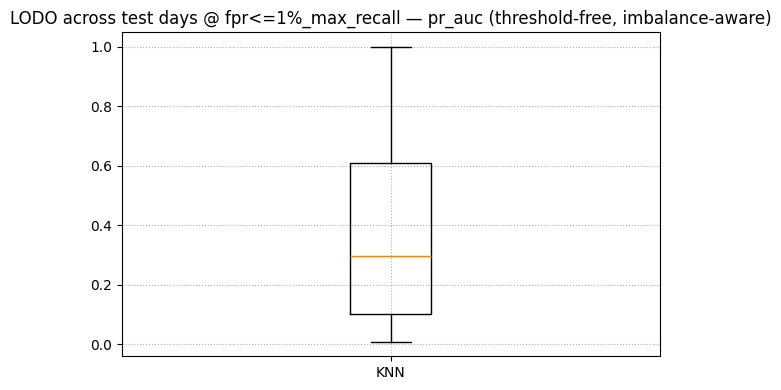

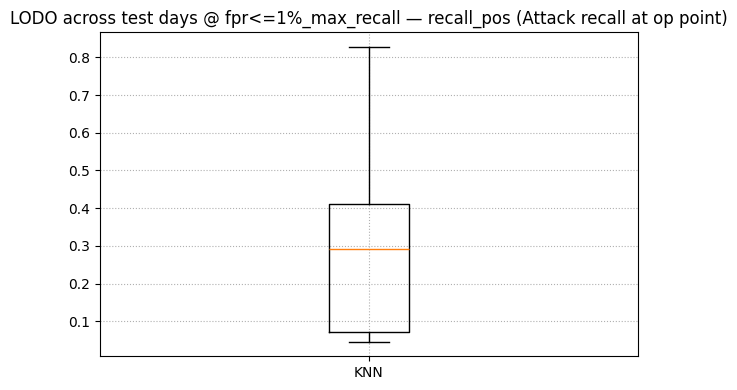

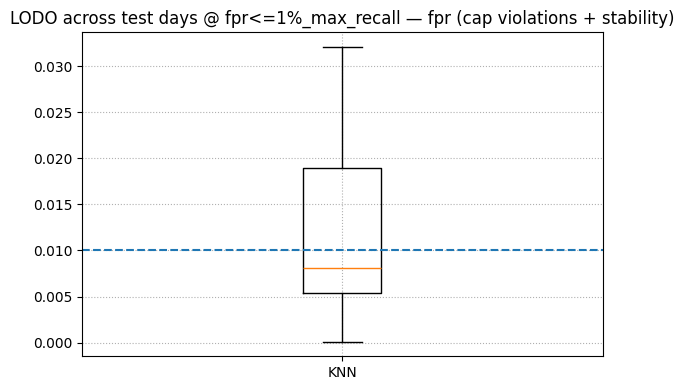

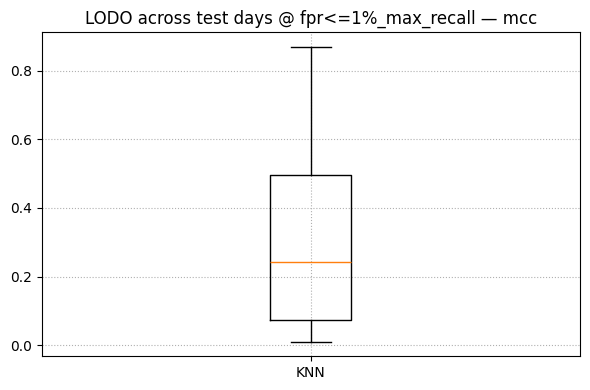


[KNN] Representative days (worst + median + best) by pr_auc:


,model,pick,test_day,pr_auc
0,KNN,worst,df_parquet_Web2_Fri_23,0.009520
1,KNN,median,df_parquet_Infil2_Thu_01,0.312324
2,KNN,best,df_parquet_DDoS2_Wed_21,0.999658


[KNN] rep_days = ['df_parquet_Web2_Fri_23', 'df_parquet_Infil2_Thu_01', 'df_parquet_DDoS2_Wed_21']

[KNN] per-subtype attack recall @A (fpr<=1%_max_recall) for test_day=df_parquet_Web2_Fri_23


,subtype,n,share_of_attacks,tp,fn,recall,test_day,split_mode
0,BruteForce,490,0.90573,23,467,0.046939,df_parquet_Web2_Fri_23,LODO
1,Web,51,0.09427,2,49,0.039216,df_parquet_Web2_Fri_23,LODO



[KNN] per-subtype attack recall @A (fpr<=1%_max_recall) for test_day=df_parquet_Infil2_Thu_01


,subtype,n,share_of_attacks,tp,fn,recall,test_day,split_mode
0,Infiltration,62034,1.0,4969,57065,0.080101,df_parquet_Infil2_Thu_01,LODO



[KNN] per-subtype attack recall @A (fpr<=1%_max_recall) for test_day=df_parquet_DDoS2_Wed_21


,subtype,n,share_of_attacks,tp,fn,recall,test_day,split_mode
0,DDoS,200591,1.0,165965,34626,0.82738,df_parquet_DDoS2_Wed_21,LODO


[KNN] split_mode=LODO Xtr_raw=4,439,194 tune_size_target=30,000 Xt_actual=30,000 unique_days=7
[KNN] FINAL fit_cap=300,000  Xfit_actual=300,000


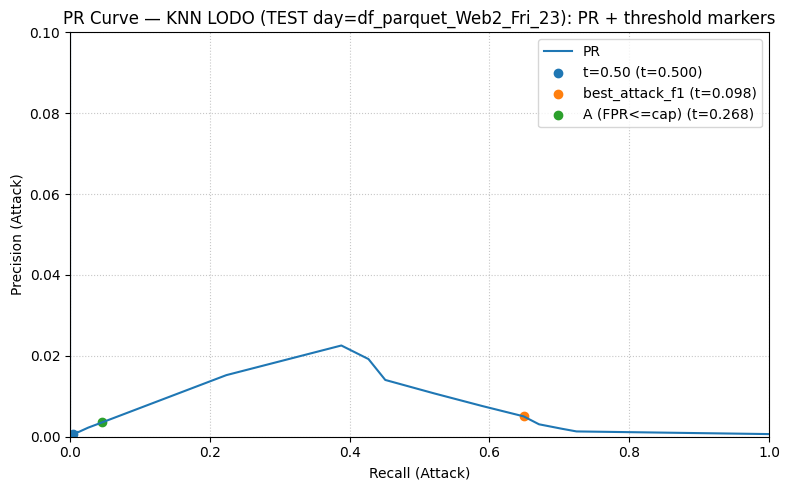

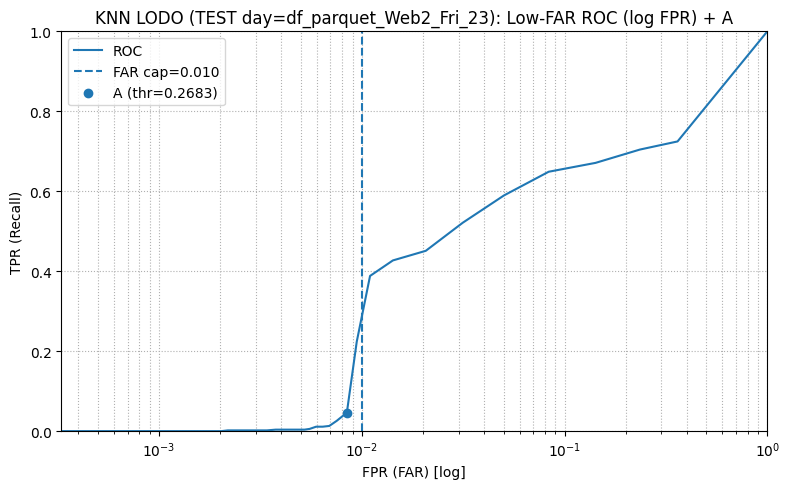

[KNN] split_mode=LODO Xtr_raw=5,019,429 tune_size_target=30,000 Xt_actual=30,000 unique_days=7
[KNN] FINAL fit_cap=300,000  Xfit_actual=300,000


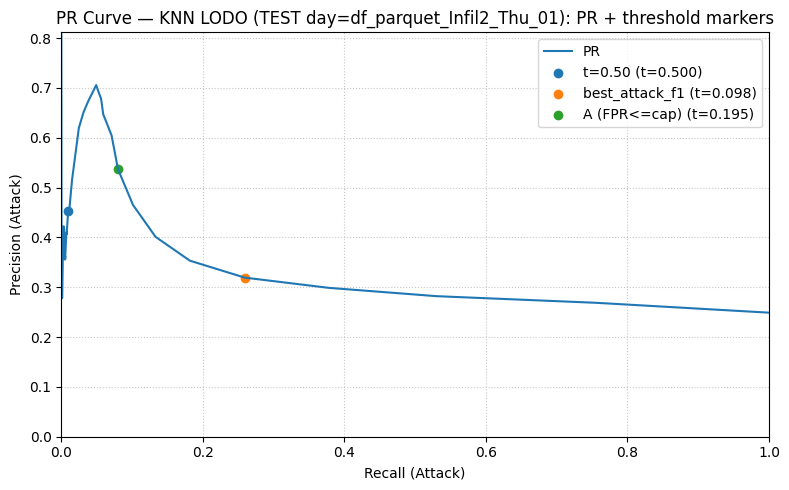

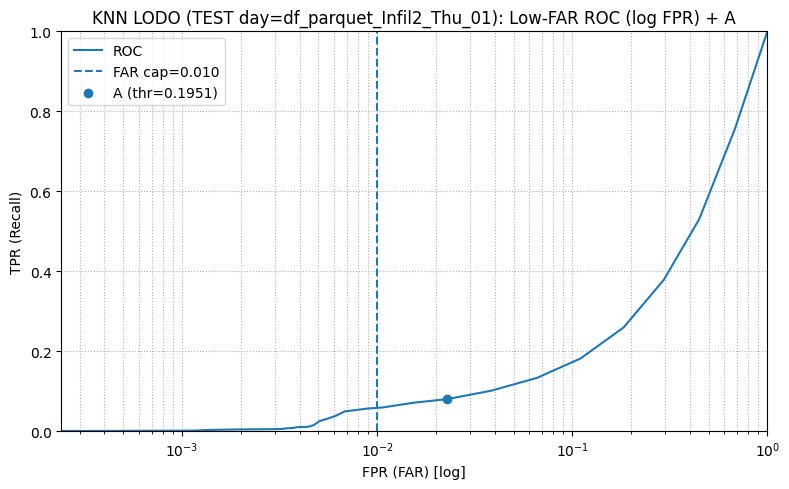

[KNN] split_mode=LODO Xtr_raw=4,707,203 tune_size_target=30,000 Xt_actual=30,000 unique_days=7
[KNN] FINAL fit_cap=300,000  Xfit_actual=300,000


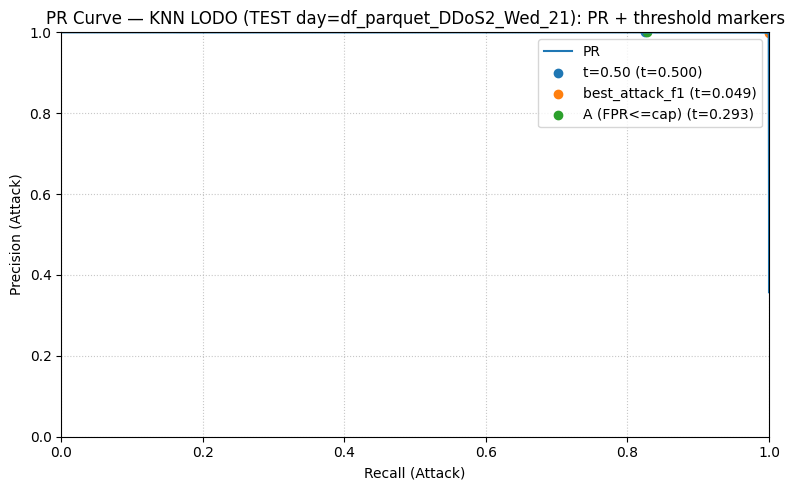

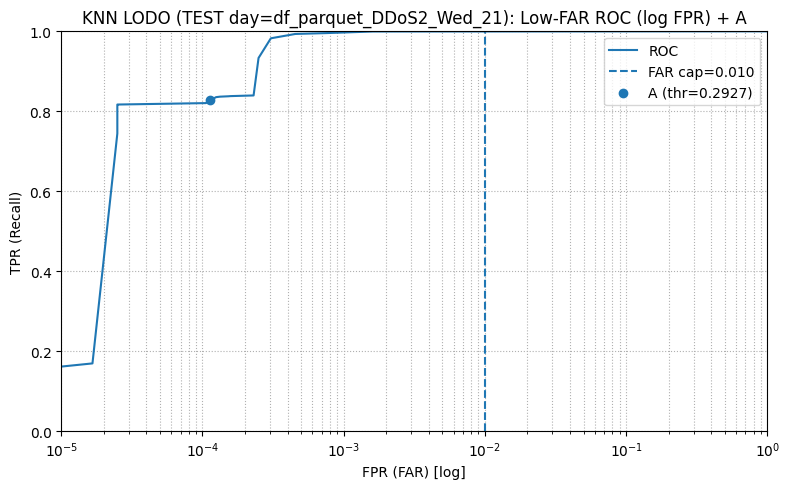

In [146]:
# F) POST-LODO PLOTTING for KNN (Boxplots + Representative days + Appendix tables + Representative-day plots)

MAIN_THR_LABEL = "fpr<=1%_max_recall"
PICK_METRIC = "pr_auc"   # median/worst by pr_auc

# ---------- FILL-IN (change for each model) ----------

MODEL_NAME = "KNN"                  # e.g., "KNN", "DT", "ET", "RF"
DF_LODO     = results_knn_lodo       # our LODO results df for this model (ONLY LODO)
RUN_FOLD_FN = run_knn_fold           # the model runner function (must match run_*_fold signature)

KNOBS_FN    = get_knn_mode_knobs
kn = KNOBS_FN("LODO")

RUNNER_KWARGS = dict(
    # keep aligned with our runner signature
    fit_cap_final=None,
    val_eval_cap_final=KNN_VAL_EVAL_CAP_FINAL,
    test_eval_cap_final=KNN_TEST_EVAL_CAP_FINAL,

    do_calibrate=KNN_DO_CALIBRATE,
    cal_method=KNN_CAL_METHOD,
    cal_cv=KNN_CAL_CV,

    # if our runner uses mode knobs (optional; safe because we filter kwargs)
    tune_cap_local=kn["tune_cap"],
    tune_frac_local=kn["tune_frac"],
    cv_splits_local=kn["cv_splits"],
    # n_iter_* key depends on the runner; include it if our runner has it
    n_iter_knn=kn["n_iter"],
)

# ---------- END FILL-IN ----------


# 1) Boxplots across days (ONLY 4 metrics)
plot_lodo_distributions_for_model(
    DF_LODO, model_name=MODEL_NAME,
    thr_label=MAIN_THR_LABEL,
    fpr_cap=MAX_FPR_CAP,
    metrics=("pr_auc", "recall_pos", "fpr", "mcc")
)

# 2) Representative days (worst + median + best)
picks_df, rep_days = pick_best_median_worst_days_for_model(
    DF_LODO,
    model_name=MODEL_NAME,
    thr_label=MAIN_THR_LABEL,
    metric=PICK_METRIC
)
print(f"\n[{MODEL_NAME}] Representative days (worst + median + best) by {PICK_METRIC}:")
display(picks_df)
print(f"[{MODEL_NAME}] rep_days =", rep_days)

# ---------- NEW: Appendix tables (only worst / median / best days) ----------
if "knn_subtype_lodo_all" in globals() and not knn_subtype_lodo_all.empty:
    for d in rep_days:
        print(f"\n[{MODEL_NAME}] per-subtype attack recall @A ({MAIN_THR_LABEL}) for test_day={d}")
        df_d = knn_subtype_lodo_all[knn_subtype_lodo_all["test_day"] == d].copy()
        df_d = df_d.sort_values(["n", "recall"], ascending=[False, True]).reset_index(drop=True)
        display(df_d)
else:
    print(f"\n[{MODEL_NAME}] No stored per-subtype LODO tables found. "
          f"Run Block E with subtype_rows collection enabled.")


# 3) Representative-day plots: ONLY PR (+ markers) and Low-FAR ROC (log FPR) + A
replot_representative_days_lodo_minimal(
    model_name=MODEL_NAME,
    rep_days=rep_days,
    run_fold_fn=RUN_FOLD_FN,
    runner_kwargs=RUNNER_KWARGS,
    far_cap=MAX_FPR_CAP,
    thr_label_A="fpr<=1%_max_recall"
)

# END KNN PIPELINE

### 5.1.b) Decision Tree fold runner 

In [187]:
# DT PIPELINE OUTLINE (similar to LOGREG but with DT-specific knobs and MIXED-LODO differences):
# - split_mode-aware (LODO vs MIXED)
# - get_inner_cv(...) for inner CV
# - MIXED scoring uses partial_auc@max_fpr (low-FAR focus)
# - LODO scoring uses average_precision (configurable)
# - mode-specific knobs via get_dt_mode_knobs(...)
# - split-aware capping (MIXED: cap_rows; LODO: cap_rows_day_balanced if available)
# - NO_CAP thresholds for recall targets (0.95 / 0.98)
# - artifacts returned for MIXED plots/subtype recall


# A) DT runtime knobs (GLOBAL)

DT_FIT_CAP_FAST        = 200_000
DT_VAL_EVAL_CAP_FAST   = 200_000
DT_TEST_EVAL_CAP_FAST  = 200_000

DT_VAL_EVAL_CAP_FINAL  = None      # None => full eval
DT_TEST_EVAL_CAP_FINAL = None      # None => full eval

# Optional: increase trees for final refit without changing search space
DT_N_ESTIMATORS_FINAL = None   # e.g., 800; keep None to use tuned value

DT_DO_CALIBRATE = False
DT_CAL_METHOD   = "sigmoid"
DT_CAL_CV       = 3

# LODO knobs
DT_N_ITER_TUNE_LODO   = 10
DT_TUNE_CAP_LODO      = 30_000
DT_TUNE_FRAC_LODO     = 0.10
DT_CV_SPLITS_LODO     = 3
DT_FIT_CAP_FINAL_LODO = 300_000

# MIXED knobs
DT_N_ITER_TUNE_MIXED   = 30
DT_TUNE_CAP_MIXED      = 150_000
DT_TUNE_FRAC_MIXED     = 0.20
DT_CV_SPLITS_MIXED     = 5
DT_FIT_CAP_FINAL_MIXED = 1_000_000  # DT is fast; adjust if you want


def get_dt_mode_knobs(split_mode: str):
    if split_mode == "MIXED":
        return dict(
            cv_splits=DT_CV_SPLITS_MIXED,
            n_iter=DT_N_ITER_TUNE_MIXED,
            tune_cap=DT_TUNE_CAP_MIXED,
            tune_frac=DT_TUNE_FRAC_MIXED,
            fit_cap_final=DT_FIT_CAP_FINAL_MIXED,
        )
    return dict(
        cv_splits=DT_CV_SPLITS_LODO,
        n_iter=DT_N_ITER_TUNE_LODO,
        tune_cap=DT_TUNE_CAP_LODO,
        tune_frac=DT_TUNE_FRAC_LODO,
        fit_cap_final=DT_FIT_CAP_FINAL_LODO,
    )

In [188]:
# B) DT fold runner (split_mode-aware)

# safe partial AUC scorer (define only if missing)
# FIX: handle 2D probas (n x 2) safely
if "safe_partial_auc" not in globals():
    def safe_partial_auc(y_true, y_score, max_fpr=0.01):
        y_score = np.asarray(y_score)
        if y_score.ndim == 2 and y_score.shape[1] >= 2:
            y_score = y_score[:, 1]  # positive class
        try:
            return roc_auc_score(y_true, y_score, max_fpr=max_fpr)
        except TypeError:
            return roc_auc_score(y_true, y_score)
        except ValueError:
            return 0.5


def _cap_for_fit_dt(X, y, g, cap, split_mode="LODO", seed=None):
    if seed is None:
        seed = random_state
    if cap is None:
        return X, y, g
    if split_mode == "MIXED":
        return cap_rows(X, y, g, cap, seed=seed)
    # LODO
    if "cap_rows_day_balanced" in globals():
        try:
            return cap_rows_day_balanced(X, y, g, cap, seed=seed, min_per_day=1)
        except TypeError:
            return cap_rows_day_balanced(X, y, g, cap, seed=seed)
    return cap_rows(X, y, g, cap, seed=seed)


def _cap_for_eval_dt(X, y, g, cap, seed=None):
    if seed is None:
        seed = random_state
    if cap is None:
        return X, y, g
    return cap_rows(X, y, g, cap, seed=seed)


def run_dt_fold(
    Xtr_raw, ytr, gtr,
    Xva_raw, yva, gva,
    Xte_raw, yte, gte,
    preprocessor,
    model_name="DT",
    max_fpr_cap=0.01,

    split_mode="LODO",
    fast_mode=False,

    fit_cap_fast=DT_FIT_CAP_FAST,
    fit_cap_final=None,

    val_eval_cap_fast=DT_VAL_EVAL_CAP_FAST,
    test_eval_cap_fast=DT_TEST_EVAL_CAP_FAST,
    val_eval_cap_final=DT_VAL_EVAL_CAP_FINAL,
    test_eval_cap_final=DT_TEST_EVAL_CAP_FINAL,

    n_estimators_final=None,

    do_calibrate=DT_DO_CALIBRATE,
    cal_method=DT_CAL_METHOD,
    cal_cv=DT_CAL_CV,

    # overrides (optional)
    n_iter_dt=None,
    tune_cap_local=None,
    tune_frac_local=None,
    cv_splits_local=None,

    dt_search_scoring_lodo="average_precision",
):
    rs = random_state

    kn = get_dt_mode_knobs(split_mode)
    if fit_cap_final is None:
        fit_cap_final = kn["fit_cap_final"]

    tcap  = int(kn["tune_cap"] if tune_cap_local is None else tune_cap_local)
    tfrac = float(kn["tune_frac"] if tune_frac_local is None else tune_frac_local)
    n_iter_dt = int(kn["n_iter"] if n_iter_dt is None else n_iter_dt)

    # -------- tuning subset (split-aware) --------
    tune_size = int(min(tcap, max(5_000, tfrac * len(Xtr_raw))))
    Xt, yt, gt = _cap_for_fit_dt(Xtr_raw, ytr, gtr, cap=tune_size, split_mode=split_mode, seed=rs)
    gt_arr = np.asarray(gt)

    print(
        f"[{model_name}] split_mode={split_mode} Xtr_raw={len(Xtr_raw):,} "
        f"tune_size_target={tune_size:,} Xt_actual={len(Xt):,} unique_days={len(np.unique(gt_arr))}"
    )

    # ---------- FAST MODE ----------
    if fast_mode:
        Xfit, yfit, gfit = _cap_for_fit_dt(Xtr_raw, ytr, gtr, cap=fit_cap_fast, split_mode=split_mode, seed=rs)
        print(f"[{model_name}] FAST fit_cap={fit_cap_fast:,}  Xfit_actual={len(Xfit):,}")

        best_pipe = Pipeline(steps=[
            ("prep", preprocessor),
            ("clf", DecisionTreeClassifier(
                criterion="gini",
                max_depth=20,
                min_samples_split=10,
                min_samples_leaf=5,
                max_features="sqrt",
                class_weight="balanced",
                random_state=rs,
            ))
        ])
        best_pipe.fit(Xfit, yfit)

        best_params = {
            "FAST_MODE": True,
            "fit_cap_fast": fit_cap_fast,
            "split_mode": split_mode,
            "calibrated": False,
        }
        model = best_pipe

    # ---------- FULL MODE ----------
    else:
        cv = get_inner_cv(
            split_mode,
            y=np.asarray(yt).astype(int),
            groups=gt_arr,
            default_splits=int(kn["cv_splits"] if cv_splits_local is None else cv_splits_local),
            seed=rs
        )

        if split_mode == "LODO" and len(np.unique(gt_arr)) < 2:
            raise ValueError("Not enough unique day groups in tuning subset for GroupKFold (LODO).")

        param_dist = {
            "clf__criterion": ["gini", "entropy"],
            "clf__max_depth": randint(3, 41),
            "clf__min_samples_split": randint(2, 201),
            "clf__min_samples_leaf": randint(1, 101),
            "clf__max_features": [None, "sqrt", "log2", 0.5],
            "clf__class_weight": [None, "balanced"],
            "clf__ccp_alpha": loguniform(1e-7, 1e-2),
        }

        base_pipe = Pipeline(steps=[
            ("prep", preprocessor),
            ("clf", DecisionTreeClassifier(random_state=rs))
        ])

        if split_mode == "MIXED":
            scoring_used = make_scorer(safe_partial_auc, needs_proba=True, max_fpr=max_fpr_cap)
            scoring_tag  = "partial_auc@max_fpr"
        else:
            scoring_used = dt_search_scoring_lodo
            scoring_tag  = dt_search_scoring_lodo

        search = RandomizedSearchCV(
            estimator=base_pipe,
            param_distributions=param_dist,
            n_iter=int(n_iter_dt),
            scoring=scoring_used,
            error_score=0.0,
            cv=cv,
            n_jobs=-1,
            random_state=rs,
            refit=True,
            verbose=0
        )

        if split_mode == "LODO":
            search.fit(Xt, yt, groups=gt_arr)
        else:
            search.fit(Xt, yt)

        # final fit (split-aware cap)
        Xfit, yfit, gfit = _cap_for_fit_dt(Xtr_raw, ytr, gtr, cap=fit_cap_final, split_mode=split_mode, seed=rs)
        print(f"[{model_name}] FINAL fit_cap={fit_cap_final:,}  Xfit_actual={len(Xfit):,}")

        best_pipe = search.best_estimator_
        best_pipe.fit(Xfit, yfit)

        best_params = dict(search.best_params_)
        best_params.update({
            "fit_cap_final": fit_cap_final,
            "split_mode": split_mode,
            "tune_size": tune_size,
            "cv_splits": int(getattr(cv, "n_splits", kn["cv_splits"])),
            "n_iter": int(n_iter_dt),
            "scoring_used": scoring_tag,
            "calibrated": False,
        })

        # optional calibration (LODO: group-safe; MIXED: stratified)
        model = best_pipe
        if do_calibrate:
            if split_mode == "LODO":
                gfit_arr = np.asarray(gfit)
                uniq_days = np.unique(gfit_arr)
                if len(uniq_days) >= 2:
                    cal_splits = min(int(cal_cv), len(uniq_days))
                    gkf = GroupKFold(n_splits=cal_splits)
                    cal_splits_list = list(gkf.split(Xfit, yfit, groups=gfit_arr))
                    cal = CalibratedClassifierCV(
                        estimator=clone(best_pipe),
                        method=cal_method,
                        cv=cal_splits_list
                    )
                    cal.fit(Xfit, yfit)
                    model = cal
                    best_params["calibrated"] = True
                    best_params["cal_method"] = cal_method
                    best_params["cal_cv"] = cal_splits
                else:
                    best_params["calibrated"] = False
                    best_params["calibration_skipped_reason"] = "not_enough_unique_day_groups_in_gfit"
            else:
                skf = StratifiedKFold(n_splits=max(2, int(cal_cv)), shuffle=True, random_state=rs)
                cal = CalibratedClassifierCV(
                    estimator=clone(best_pipe),
                    method=cal_method,
                    cv=skf
                )
                cal.fit(Xfit, yfit)
                model = cal
                best_params["calibrated"] = True
                best_params["cal_method"] = cal_method
                best_params["cal_cv"] = int(cal_cv)

    # ---------- EVAL CAPS ----------
    if fast_mode:
        Xva_eval, yva_eval, _ = _cap_for_eval_dt(Xva_raw, yva, gva, cap=val_eval_cap_fast, seed=rs)
        Xte_eval, yte_eval, _ = _cap_for_eval_dt(Xte_raw, yte, gte, cap=test_eval_cap_fast, seed=rs)
    else:
        Xva_eval, yva_eval, _ = _cap_for_eval_dt(Xva_raw, yva, gva, cap=val_eval_cap_final, seed=rs)
        Xte_eval, yte_eval, _ = _cap_for_eval_dt(Xte_raw, yte, gte, cap=test_eval_cap_final, seed=rs)

    # ---------- THRESHOLD TUNING ON VAL ----------
    score_va = get_scores(model, Xva_eval)
    if "log_if_degenerate_scores" in globals():
        log_if_degenerate_scores(score_va, model_name, split_name="VAL")
    else:
        uniq = np.unique(np.round(score_va, 8)).size
        if uniq <= 3:
            print(f"[{model_name}] WARNING: score_va has very few unique values ({uniq}).")

    t_f1, _ = pick_threshold_best_attack_f1(yva_eval, score_va)
    t_fpr = pick_threshold_fpr_constrained_max_recall(yva_eval, score_va, max_fpr=max_fpr_cap)
    t_r95 = pick_threshold_recall_target_min_fpr(yva_eval, score_va, recall_target=0.95, max_fpr=max_fpr_cap)
    t_r98 = pick_threshold_recall_target_min_fpr(yva_eval, score_va, recall_target=0.98, max_fpr=max_fpr_cap)

    # NO_CAP diagnostics (like XGB/RF)
    t_r95_any = pick_threshold_recall_target_min_fpr(yva_eval, score_va, recall_target=0.95, max_fpr=1.0)
    t_r98_any = pick_threshold_recall_target_min_fpr(yva_eval, score_va, recall_target=0.98, max_fpr=1.0)

    thresholds = {
        "t=0.50": 0.50,
        "best_attack_f1": t_f1,
        "fpr<=1%_max_recall": t_fpr,
        "recall>=0.95_min_fpr": t_r95,
        "recall>=0.98_min_fpr": t_r98,
        "recall>=0.95_min_fpr_NO_CAP": t_r95_any,
        "recall>=0.98_min_fpr_NO_CAP": t_r98_any,
    }
    feas = {k: (v is not None) for k, v in thresholds.items()}
    thresholds_valid = {k: v for k, v in thresholds.items() if v is not None}

    # realized FAR at FPR-capped threshold (VAL)
    t_fpr_sel = thresholds.get("fpr<=1%_max_recall", None)
    if t_fpr_sel is not None:
        yhat_val = (score_va >= t_fpr_sel).astype(int)
        tn, fp, fn, tp = confusion_matrix(yva_eval, yhat_val, labels=[0, 1]).ravel()
        best_params["val_fpr_realized_at_fpr1_thr"] = float(fp / (fp + tn + 1e-12))
    else:
        best_params["val_fpr_realized_at_fpr1_thr"] = None

    # ---------- EVALUATE ON TEST ----------
    score_te = get_scores(model, Xte_eval)
    if "log_if_degenerate_scores" in globals():
        log_if_degenerate_scores(score_te, model_name, split_name="TEST")
    else:
        uniq_te = np.unique(np.round(score_te, 8)).size
        if uniq_te <= 3:
            print(f"[{model_name}] WARNING: score_te has very few unique values ({uniq_te}).")

    if t_fpr_sel is not None:
        yhat_te = (score_te >= t_fpr_sel).astype(int)
        tn, fp, fn, tp = confusion_matrix(yte_eval, yhat_te, labels=[0, 1]).ravel()
        best_params["test_fpr_realized_at_fpr1_thr"] = float(fp / (fp + tn + 1e-12))
    else:
        best_params["test_fpr_realized_at_fpr1_thr"] = None

    df = evaluate_thresholds(yte_eval, score_te, thresholds_valid, name=model_name)

    # artifacts for MIXED plotting blocks + subtype recall
    feas["__artifacts__"] = {
        "score_te": score_te,
        "yte_eval": yte_eval,
        "score_va": score_va,
        "yva_eval": yva_eval,
    }

    if do_plots:
        plot_pr_curve_with_thresholds(yte_eval, score_te, thresholds_valid, model_name=model_name)
        plot_roc_curve(yte_eval, score_te, model_name=model_name)
        plot_det_curve(yte_eval, score_te, model_name=model_name)
        plot_score_distribution(yte_eval, score_te, model_name=model_name, bins=100)

    return df, best_params, thresholds, feas

In [ ]:
# C.1) DT — LODO algo test (FAST)


RUN_MODELS["DT"] = True
ALGO_TEST_DAY = TEST_DAYS[0]
print("Algo test day:", ALGO_TEST_DAY)

split_mode = "LODO"
Xtr_raw, ytr, gtr, Xva_raw, yva, gva, Xte_raw, yte, gte, meta = build_fold(
    registry=REGISTRY, val_days=VAL_DAYS, test_day=ALGO_TEST_DAY
)
preprocessor, prep_dbg = build_preprocessor(Xtr_raw, meta["feature_cols"])
print("LODO preprocessor debug:", prep_dbg)

old_do_plots = do_plots
do_plots = False

if RUN_MODELS.get("DT", False):
    dt_df, dt_best_params, dt_thresholds, dt_feas = run_dt_fold(
        Xtr_raw, ytr, gtr,
        Xva_raw, yva, gva,
        Xte_raw, yte, gte,
        preprocessor,
        model_name="DT",
        split_mode="LODO",
        fast_mode=True,

        fit_cap_fast=DT_FIT_CAP_FAST,
        val_eval_cap_fast=DT_VAL_EVAL_CAP_FAST,
        test_eval_cap_fast=DT_TEST_EVAL_CAP_FAST,

        max_fpr_cap=MAX_FPR_CAP,

        do_calibrate=DT_DO_CALIBRATE,
        cal_method=DT_CAL_METHOD,
        cal_cv=DT_CAL_CV,
    )
    print("DT (LODO/FAST) best params:", dt_best_params)
    print("DT (LODO/FAST) thresholds:", dt_thresholds)
    print("DT (LODO/FAST) feasibility:", {k:v for k,v in dt_feas.items() if k != "__artifacts__"})
    display(dt_df)

do_plots = old_do_plots


In [ ]:
# C.2) DT — MIXED algo test (FAST)


RUN_MODELS["DT"] = True

split_mode = "MIXED"
Xtr_raw_m, ytr_m, gtr_m, Xva_raw_m, yva_m, gva_m, Xte_raw_m, yte_m, gte_m, meta_m = build_mixed_fold(
    registry=REGISTRY,
    seed=MIXED_RANDOM_STATE,
    test_size=MIXED_TEST_SIZE,
    val_size=MIXED_VAL_SIZE,
    use_rare_injection=MIXED_USE_RARE_ALLOCATION,
    rare_subtypes=RARE_SUBTYPES,
    rare_n_test=RARE_N_TEST_PER_SUBTYPE,
    rare_n_val=RARE_N_VAL_PER_SUBTYPE,
)

preprocessor_m, prep_dbg_m = build_preprocessor(Xtr_raw_m, meta_m["feature_cols"])
print("MIXED preprocessor debug:", prep_dbg_m)
print("MIXED shapes:", Xtr_raw_m.shape, Xva_raw_m.shape, Xte_raw_m.shape)

old_do_plots = do_plots
do_plots = False

if RUN_MODELS.get("DT", False):
    dt_df_m_fast, dt_best_params_m_fast, dt_thresholds_m_fast, dt_feas_m_fast = run_dt_fold(
        Xtr_raw_m, ytr_m, gtr_m,
        Xva_raw_m, yva_m, gva_m,
        Xte_raw_m, yte_m, gte_m,
        preprocessor_m,
        model_name="DT",
        split_mode="MIXED",
        fast_mode=True,

        fit_cap_fast=DT_FIT_CAP_FAST,
        val_eval_cap_fast=DT_VAL_EVAL_CAP_FAST,
        test_eval_cap_fast=DT_TEST_EVAL_CAP_FAST,

        max_fpr_cap=MAX_FPR_CAP,

        do_calibrate=DT_DO_CALIBRATE,
        cal_method=DT_CAL_METHOD,
        cal_cv=DT_CAL_CV,
    )
    print("DT (MIXED/FAST) best params:", dt_best_params_m_fast)
    print("DT (MIXED/FAST) thresholds:", dt_thresholds_m_fast)
    print("DT (MIXED/FAST) feasibility:", {k:v for k,v in dt_feas_m_fast.items() if k != "__artifacts__"})
    display(dt_df_m_fast)

do_plots = old_do_plots

MIXED preprocessor debug: {'log1p_cols': ['Active Mean', 'Active Std', 'Bwd IAT Total', 'Bwd IAT Min', 'Packet Length Variance', 'Packet Length Min', 'Bwd Packets/s', 'Down/Up Ratio', 'FIN Flag Count', 'Flow Bytes/s', 'Flow IAT Std', 'Fwd IAT Min', 'Fwd IAT Std', 'Fwd Packet Length Std', 'Fwd Packets/s', 'Fwd URG Flags', 'Idle Min', 'RST Flag Count', 'SYN Flag Count', 'URG Flag Count'], 'scale_cols': ['ACK Flag Count', 'Init Bwd Win Bytes', 'Init Fwd Win Bytes', 'PSH Flag Count'], 'has_protocol': True}
[DT] split_mode=MIXED Xtr_raw=4,661,671 tune_size_target=150,000 Xt_actual=150,000 unique_days=10
[DT] FINAL fit_cap=1,000,000  Xfit_actual=1,000,000


,stage2_skipped,n_train_attacks,n_test_attacks,n_classes,classes,oracle_macro_f1,oracle_weighted_f1,oracle_acc,oracle_bacc,gated_available,gate_thr,n_flagged_total,n_tp_attacks,gated_macro_f1_tp,joint_correct_rate,model,split_mode,test_day
0,False,931366,266105,6,"[Bot, BruteForce, DDoS, DoS, Infiltration, OTHER]",0.82675,0.993558,0.993664,0.823855,True,0.215712,254603,244080,0.810716,0.912628,DT,MIXED,MIXED


DT attack type stage 2 result: {'stage2_skipped': False, 'n_train_attacks': 931366, 'n_test_attacks': 266105, 'n_classes': 6, 'classes': ['Bot', 'BruteForce', 'DDoS', 'DoS', 'Infiltration', 'OTHER'], 'oracle_macro_f1': 0.8267501728352231, 'oracle_weighted_f1': 0.9935575497698783, 'oracle_acc': 0.9936641551267357, 'oracle_bacc': 0.8238554116528166, 'gated_available': True, 'gate_thr': 0.21571238348868177, 'n_flagged_total': 254603, 'n_tp_attacks': 244080, 'gated_macro_f1_tp': 0.8107155978176648, 'joint_correct_rate': 0.9126284737227786, 'model': 'DT', 'split_mode': 'MIXED', 'test_day': 'MIXED'}

=== MIXED (DT): best_params ===
{'clf__ccp_alpha': np.float64(7.45934328572655e-06), 'clf__class_weight': None, 'clf__criterion': 'gini', 'clf__max_depth': 10, 'clf__max_features': None, 'clf__min_samples_leaf': 21, 'clf__min_samples_split': 104, 'fit_cap_final': 1000000, 'split_mode': 'MIXED', 'tune_size': 150000, 'cv_splits': 5, 'n_iter': 30, 'scoring_used': 'partial_auc@max_fpr', 'calibrated'

,thr,tn,fp,fn,tp,precision_pos,recall_pos,f1_pos,macro_f1,fpr,fnr,mcc,balanced_acc,roc_auc,pr_auc,model,thr_label,test_day,split_mode
0,0.500000,1059340,6462,23591,242514,0.974046,0.911347,0.941654,0.963834,0.006063,0.088653,0.928476,0.952642,0.981465,0.95895,DT,t=0.50,MIXED,MIXED
1,0.512195,1059340,6462,23591,242514,0.974046,0.911347,0.941654,0.963834,0.006063,0.088653,0.928476,0.952642,0.981465,0.95895,DT,best_attack_f1,MIXED,MIXED
2,0.215712,1055279,10523,22025,244080,0.958669,0.917232,0.937493,0.961153,0.009873,0.082768,0.922662,0.953679,0.981465,0.95895,DT,fpr<=1%_max_recall,MIXED,MIXED
3,0.039077,856140,209662,9981,256124,0.549875,0.962492,0.699897,0.793103,0.196718,0.037508,0.642071,0.882887,0.981465,0.95895,DT,recall>=0.95_min_fpr_NO_CAP,MIXED,MIXED
4,0.026043,639051,426751,3634,262471,0.380822,0.986344,0.549489,0.648790,0.400404,0.013656,0.468856,0.792970,0.981465,0.95895,DT,recall>=0.98_min_fpr_NO_CAP,MIXED,MIXED



Total time elapsed for DT MIXED-only run: 3.03 minutes


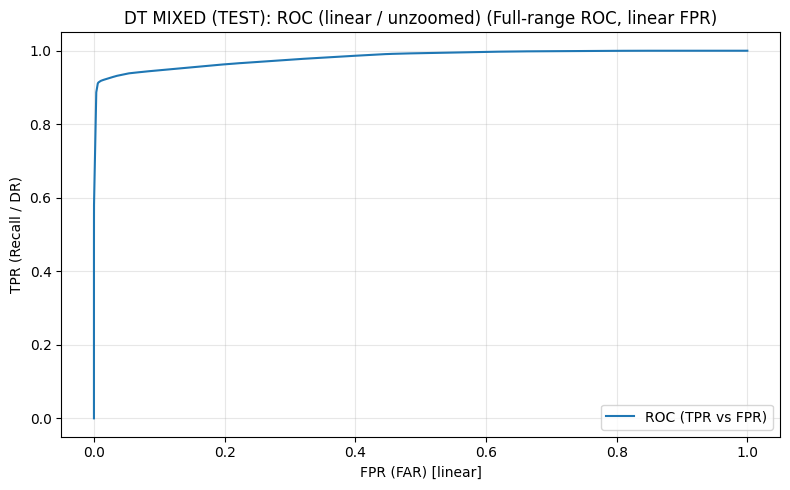

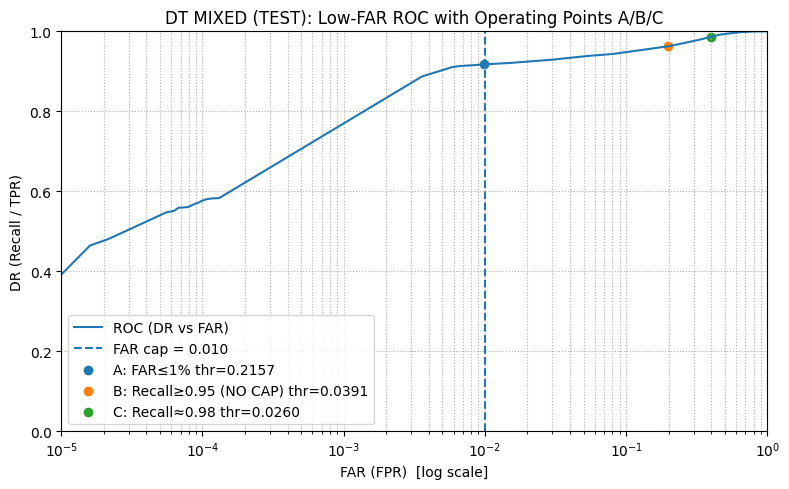

Operating Point A (FAR capped): {'thr': 0.21571238348868177, 'tn': 1055279, 'fp': 10523, 'fn': 22025, 'tp': 244080, 'precision_pos': 0.9586689866183823, 'recall_pos': 0.9172319197309333, 'f1_pos': 0.937492798266975, 'macro_f1': 0.9611527476762101, 'fpr': 0.009873316056828566, 'fnr': 0.08276808026906672, 'mcc': 0.922662457753175, 'balanced_acc': 0.9536793018370524}
Operating Point B (Recall>=0.95 NO CAP): {'thr': 0.039076985734649475, 'tn': 856140, 'fp': 209662, 'fn': 9981, 'tp': 256124, 'precision_pos': 0.5498748352247599, 'recall_pos': 0.9624922493000884, 'f1_pos': 0.6998965692978872, 'macro_f1': 0.793102592558731, 'fpr': 0.1967175891957418, 'fnr': 0.03750775069991169, 'mcc': 0.6420713243836284, 'balanced_acc': 0.8828873300521733}
FAR cost multiplier (B vs A): 19.92x
Operating Point C (Recall≈0.98): {'thr': 0.02604292623941959, 'tn': 639051, 'fp': 426751, 'fn': 3634, 'tp': 262471, 'precision_pos': 0.38082214438889067, 'recall_pos': 0.9863437364949926, 'f1_pos': 0.5494893371588995, 'ma

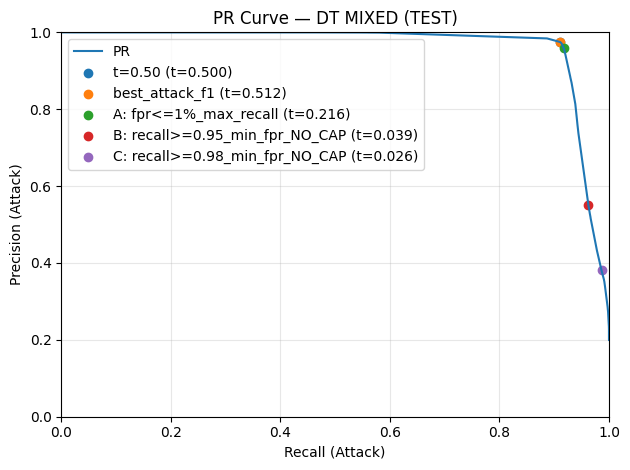

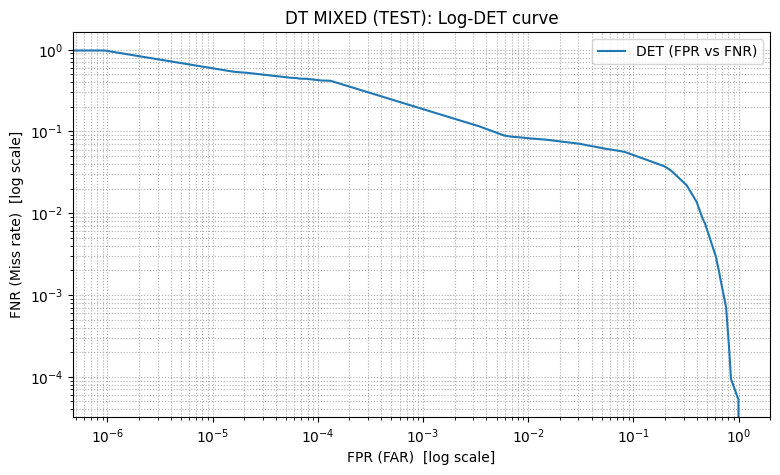

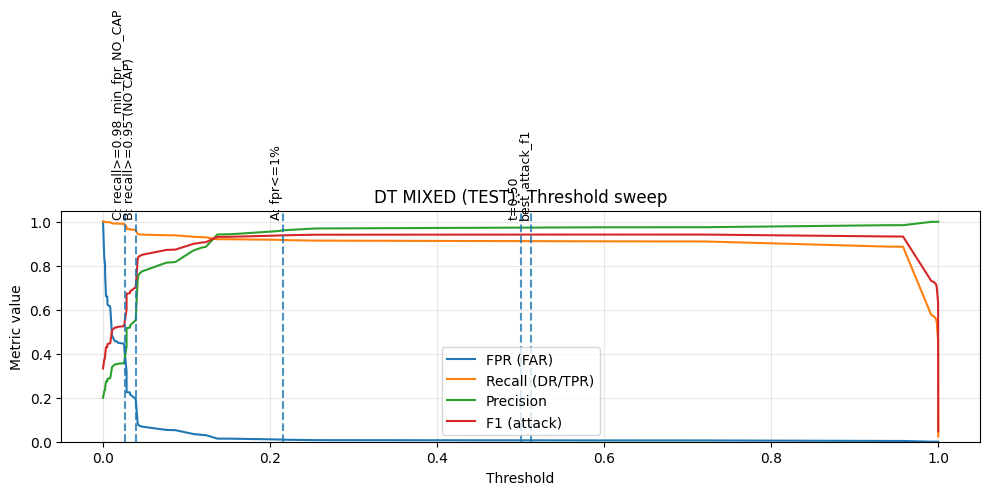

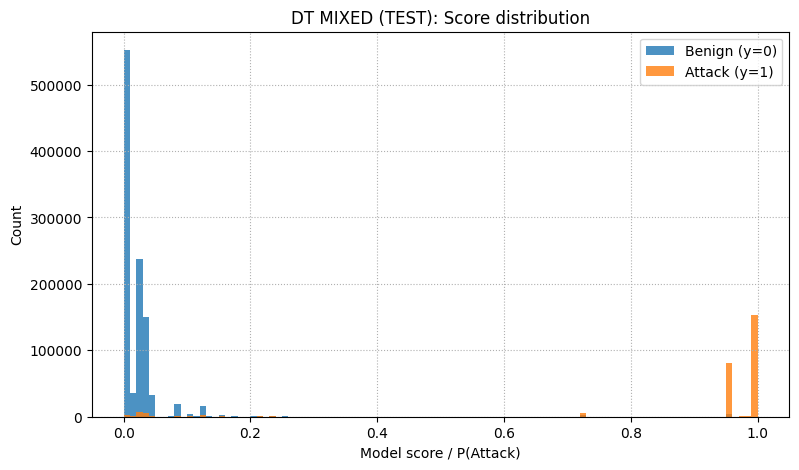


=== MIXED (DT): per-subtype attack recall @ Operating Point A (fpr<=1%) ===


,subtype,n,share_of_attacks,tp,fn,recall
0,DDoS,155400,0.583980,155338,62,0.999601
1,DoS,39179,0.147231,39035,144,0.996325
2,Bot,28902,0.108611,28650,252,0.991281
3,Infiltration,23508,0.088341,2143,21365,0.091160
4,BruteForce,19066,0.071648,18908,158,0.991713
5,Web,50,0.000188,6,44,0.120000


In [150]:
# D) DT — MIXED-only FULL run + required plots 


RUN_MODELS["DT"] = True
old_do_plots = do_plots
do_plots = False

# helpers used in RF block; define only if missing
if "_select_r98_threshold_for_plot" not in globals():
    def _select_r98_threshold_for_plot(thresholds_dict):
        thr_cap = thresholds_dict.get("recall>=0.98_min_fpr", None)
        if thr_cap is not None:
            return thr_cap, "recall>=0.98_min_fpr"
        thr_any = thresholds_dict.get("recall>=0.98_min_fpr_NO_CAP", None)
        if thr_any is not None:
            return thr_any, "recall>=0.98_min_fpr_NO_CAP"
        return None, "recall>=0.98 (unavailable)"

if "metrics_at_threshold" not in globals():
    def metrics_at_threshold(y_true, y_score, thr):
        y_true = np.asarray(y_true).astype(int)
        y_score = np.asarray(y_score, dtype=float)
        thr = float(thr)
        yhat = (y_score >= thr).astype(int)
        tn, fp, fn, tp = confusion_matrix(y_true, yhat, labels=[0, 1]).ravel()
        fpr = fp / (fp + tn + 1e-12)
        recall = tp / (tp + fn + 1e-12)
        precision = tp / (tp + fp + 1e-12)
        f1 = 2 * precision * recall / (precision + recall + 1e-12)
        return {
            "thr": thr,
            "tn": int(tn), "fp": int(fp), "fn": int(fn), "tp": int(tp),
            "fpr": float(fpr),
            "recall_pos": float(recall),
            "precision_pos": float(precision),
            "f1_pos": float(f1),
        }

if "plot_roc_curve_linear_with_operating_points" not in globals():
    def plot_roc_curve_linear_with_operating_points(y_true, y_score, thresholds_dict=None, model_name="ROC (linear)"):
        y_true = np.asarray(y_true).astype(int)
        y_score = np.asarray(y_score, dtype=float)
        fpr, tpr, _ = roc_curve(y_true, y_score)

        plt.figure(figsize=(8, 5))
        plt.plot(fpr, tpr, label="ROC")

        if thresholds_dict:
            for lbl, thr in thresholds_dict.items():
                if thr is None:
                    continue
                m = metrics_at_threshold(y_true, y_score, float(thr))
                plt.scatter([m["fpr"]], [m["recall_pos"]], label=f"{lbl} thr={m['thr']:.4f}")

        plt.xlabel("FPR (FAR)")
        plt.ylabel("TPR (Recall / DR)")
        plt.title(model_name)
        plt.grid(True, linestyle=":")
        plt.legend()
        plt.tight_layout()
        plt.show()

if "plot_low_far_roc_with_ops" not in globals():
    def plot_low_far_roc_with_ops(y_true, y_score, thr_A, thr_B=None, thr_C=None, far_cap=0.01, title=""):
        y_true = np.asarray(y_true).astype(int)
        y_score = np.asarray(y_score, dtype=float)
        fpr_curve, tpr_curve, _ = roc_curve(y_true, y_score)

        A = metrics_at_threshold(y_true, y_score, float(thr_A)) if thr_A is not None else None
        B = metrics_at_threshold(y_true, y_score, float(thr_B)) if thr_B is not None else None
        C = metrics_at_threshold(y_true, y_score, float(thr_C)) if thr_C is not None else None

        plt.figure(figsize=(8, 5))
        plt.plot(fpr_curve, tpr_curve, label="ROC (DR/Recall vs FAR/FPR)")
        plt.axvline(far_cap, linestyle="--", label=f"FAR cap = {far_cap:.3f}")

        if A is not None:
            plt.scatter([A["fpr"]], [A["recall_pos"]], label=f"A: FAR≤{far_cap:.0%} thr={A['thr']:.4f}")
        if B is not None:
            plt.scatter([B["fpr"]], [B["recall_pos"]], label=f"B: Recall≥0.95 (NO CAP) thr={B['thr']:.4f}")
        if C is not None:
            plt.scatter([C["fpr"]], [C["recall_pos"]], label=f"C: Recall≥0.98 thr={C['thr']:.4f}")

        plt.xscale("log")
        fpr_pos = fpr_curve[fpr_curve > 0]
        left = float(fpr_pos.min()) if fpr_pos.size else 1e-5
        plt.xlim(max(1e-5, left), 1.0)
        plt.ylim(0.0, 1.0)

        plt.xlabel("FAR (FPR)  [log scale]")
        plt.ylabel("DR (Recall / TPR)")
        plt.title(title)
        plt.legend()
        plt.grid(True, which="both", linestyle=":")
        plt.tight_layout()
        plt.show()

# ----- Build + FULL run -----
split_mode = "MIXED"
kn = get_dt_mode_knobs(split_mode)

Xtr_raw_m, ytr_m, gtr_m, Xva_raw_m, yva_m, gva_m, Xte_raw_m, yte_m, gte_m, meta_m = build_mixed_fold(
    registry=REGISTRY,
    seed=MIXED_RANDOM_STATE,
    test_size=MIXED_TEST_SIZE,
    val_size=MIXED_VAL_SIZE,
    use_rare_injection=MIXED_USE_RARE_ALLOCATION,
    rare_subtypes=RARE_SUBTYPES,
    rare_n_test=RARE_N_TEST_PER_SUBTYPE,
    rare_n_val=RARE_N_VAL_PER_SUBTYPE,
)

preprocessor_m, prep_dbg_m = build_preprocessor(Xtr_raw_m, meta_m["feature_cols"])
print("MIXED preprocessor debug:", prep_dbg_m)

START_TIME = time.time()

dt_df_m, dt_best_params_m, dt_thresholds_m, dt_feas_m = run_dt_fold(
    Xtr_raw_m, ytr_m, gtr_m,
    Xva_raw_m, yva_m, gva_m,
    Xte_raw_m, yte_m, gte_m,
    preprocessor_m,
    model_name="DT",
    split_mode="MIXED",
    fast_mode=False,

    fit_cap_final=None,  # from get_dt_mode_knobs
    val_eval_cap_final=DT_VAL_EVAL_CAP_FINAL,
    test_eval_cap_final=DT_TEST_EVAL_CAP_FINAL,

    max_fpr_cap=MAX_FPR_CAP,

    n_estimators_final=DT_N_ESTIMATORS_FINAL,

    do_calibrate=DT_DO_CALIBRATE,
    cal_method=DT_CAL_METHOD,
    cal_cv=DT_CAL_CV,

    # mode knobs (explicit, optional)
    n_iter_dt=None,
    tune_cap_local=kn["tune_cap"],
    tune_frac_local=kn["tune_frac"],
    cv_splits_local=kn["cv_splits"],
)

# optional attack type stage 2 (MIXED only, since LODO subtype recall is unreliable)
dt_attacktype_m = None
if DO_ATTACKTYPE_STAGE2:
    art = dt_feas_m.get("__artifacts__", {})
    score_te_m = art.get("score_te", None)
    thr_main_m = dt_thresholds_m.get(MAIN_THR_LABEL, None)

    dt_attacktype_m = run_attacktype_stage2(
        model_key="DT",
        preprocessor=preprocessor_m,
        Xtr_raw=Xtr_raw_m, ytr=ytr_m, label_raw_train=meta_m["label_raw_train"],
        Xte_raw=Xte_raw_m, yte=yte_m, label_raw_test=meta_m["label_raw_test"],
        gate_scores_te=score_te_m, gate_thr=thr_main_m,
        base_best_params=dt_best_params_m,
        min_count=ATTACKTYPE_MIN_COUNT,
        rare_set=RARE_SUBTYPES,
        other_label=ATTACKTYPE_OTHER_LABEL,
    )
    dt_attacktype_m.update({"model": "DT", "split_mode": "MIXED", "test_day": "MIXED"})
    display(pd.DataFrame([dt_attacktype_m]))
print("DT attack type stage 2 result:", dt_attacktype_m)

dt_df_m = dt_df_m.copy()
dt_df_m["test_day"] = "MIXED"
dt_df_m["split_mode"] = "MIXED"

print("\n=== MIXED (DT): best_params ===")
print(dt_best_params_m)
print("\n=== MIXED (DT): thresholds (picked on VAL) ===")
print(dt_thresholds_m)
print("\n=== MIXED (DT): feasibility ===")
print({k:v for k,v in dt_feas_m.items() if k != "__artifacts__"})

display(dt_df_m)

elapsed = time.time() - START_TIME
print(f"\nTotal time elapsed for DT MIXED-only run: {elapsed/60:.2f} minutes")

# ----- REQUIRED PLOTS -----
art = dt_feas_m.get("__artifacts__", {})
yte_eval_m = art.get("yte_eval", None)
score_te_m = art.get("score_te", None)

if yte_eval_m is not None and score_te_m is not None:
    thr_A = dt_thresholds_m.get("fpr<=1%_max_recall", None)
    thr_B = dt_thresholds_m.get("recall>=0.95_min_fpr_NO_CAP", None)
    thr_C, thr_C_label = _select_r98_threshold_for_plot(dt_thresholds_m)

    # 1) Linear ROC (UNZOOMED)
    plot_roc_curve_linear_with_operating_points(
        yte_eval_m, score_te_m,
        thresholds_dict={},
        model_name="DT MIXED (TEST): ROC (linear / unzoomed)"
    )

    # 2) Low-FAR ROC (log FPR) with A/B/C
    if thr_A is not None:
        plot_low_far_roc_with_ops(
            yte_eval_m, score_te_m,
            thr_A=thr_A, thr_B=thr_B, thr_C=thr_C,
            far_cap=MAX_FPR_CAP,
            title="DT MIXED (TEST): Low-FAR ROC with Operating Points A/B/C"
        )

    # 3) PR curve with thresholds (reuse our existing helper if present)
    thr_dict_for_pr = {
        "t=0.50": dt_thresholds_m.get("t=0.50"),
        "best_attack_f1": dt_thresholds_m.get("best_attack_f1"),
        "A: fpr<=1%_max_recall": dt_thresholds_m.get("fpr<=1%_max_recall"),
        "B: recall>=0.95_min_fpr_NO_CAP": dt_thresholds_m.get("recall>=0.95_min_fpr_NO_CAP"),
    }
    if thr_C is not None:
        thr_dict_for_pr[f"C: {thr_C_label}"] = thr_C

    if "plot_pr_curve_with_thresholds" in globals():
        plot_pr_curve_with_thresholds(yte_eval_m, score_te_m, thr_dict_for_pr, model_name="DT MIXED (TEST)")
    else:
        print("plot_pr_curve_with_thresholds not found in globals() — skipping PR plot.")

    # 4) Log-DET curve
    # ------------------------------------------------------
    plot_det(
        yte_eval_m, score_te_m,
        title="DT MIXED (TEST): Log-DET curve"
    )

    # 5) Threshold sweep (TEST) with vertical lines at key thresholds
    # ------------------------------------------------------
    thr_dict_for_sweep = {
        "t=0.50": dt_thresholds_m.get("t=0.50"),
        "best_attack_f1": dt_thresholds_m.get("best_attack_f1"),
        "A: fpr<=1%": dt_thresholds_m.get("fpr<=1%_max_recall"),
        "B: recall>=0.95 (NO CAP)": dt_thresholds_m.get("recall>=0.95_min_fpr_NO_CAP"),
    }
    if thr_C is not None:
        thr_dict_for_sweep[f"C: {thr_C_label}"] = thr_C

    plot_threshold_sweep_metrics(
        yte_eval_m,
        score_te_m,
        thresholds_dict=thr_dict_for_sweep,
        model_name="DT MIXED"
    )

    # 6) Score distribution
    # ------------------------------------------------------
    plot_score_hist(
        yte_eval_m, score_te_m,
        title="DT MIXED (TEST): Score distribution",
        bins=100
    )

    # 7) Per-subtype recall @ Operating Point A
    # ------------------------------------------------------
    label_raw_test = None
    if "meta_m" in globals():
        label_raw_test = meta_m.get("label_raw_test", None)

    if ("per_subtype_attack_recall" in globals() and "map_array_to_coarse" in globals() and thr_A is not None and label_raw_test is not None):
        subtype_df = per_subtype_attack_recall(
            y_true=np.asarray(yte_eval_m),
            y_score=np.asarray(score_te_m),
            thr=float(thr_A),
            # label_raw=np.asarray(label_raw_test),
            label_raw=map_array_to_coarse(np.asarray(label_raw_test)),      # use coarse labels for better subtype-level stats
        )
        print("\n=== MIXED (DT): per-subtype attack recall @ Operating Point A (fpr<=1%) ===")
        display(subtype_df)

# restore flags
do_plots = old_do_plots


In [189]:
# E) DT — LODO outer loop + append MIXED (NO recompute for MIXED)
# Requires Block G to have created:
#   dt_df_m, dt_best_params_m, dt_thresholds_m, dt_feas_m


do_plots_loop = False
old_do_plots = do_plots
do_plots = do_plots_loop

MAIN_THR_LABEL = "fpr<=1%_max_recall"
subtype_rows = []       # per-day per-subtype tables (do NOT display inside loop)
all_rows = []
attacktype_rows = []    # optional, only if DO_ATTACKTYPE_STAGE2 is True and produces results
best_params_log = []
feas_rows = []


# ---------- LODO loop ----------
START_TIME = time.time()
RUN_MODELS["DT"] = True

for test_day in TEST_DAYS:
    Xtr_raw, ytr, gtr, Xva_raw, yva, gva, Xte_raw, yte, gte, meta = build_fold(
        registry=REGISTRY, val_days=VAL_DAYS, test_day=test_day
    )
    preprocessor, prep_dbg = build_preprocessor(Xtr_raw, meta["feature_cols"])

    if RUN_MODELS.get("DT", False):
        dt_df, dt_best_params, dt_thresholds, dt_feas = run_dt_fold(
            Xtr_raw, ytr, gtr,
            Xva_raw, yva, gva,
            Xte_raw, yte, gte,
            preprocessor,
            model_name="DT",
            split_mode="LODO",
            fast_mode=False,

            fit_cap_final=None,  # from knobs
            val_eval_cap_final=DT_VAL_EVAL_CAP_FINAL,
            test_eval_cap_final=DT_TEST_EVAL_CAP_FINAL,
            n_estimators_final=DT_N_ESTIMATORS_FINAL,
            max_fpr_cap=MAX_FPR_CAP,
            do_calibrate=DT_DO_CALIBRATE,
            cal_method=DT_CAL_METHOD,
            cal_cv=DT_CAL_CV,
        )
        
        # Optional: run attack type stage 2 if main feasibility is good (can be None/False if we want to skip)
        if DO_ATTACKTYPE_STAGE2:
            art = dt_feas.get("__artifacts__", {})
            score_te = art.get("score_te", None)
            thr_main = dt_thresholds.get(MAIN_THR_LABEL, None)

            r = run_attacktype_stage2(
                model_key="DT",
                preprocessor=preprocessor,
                Xtr_raw=Xtr_raw, ytr=ytr, label_raw_train=meta["label_raw_train"],
                Xte_raw=Xte_raw, yte=yte, label_raw_test=meta["label_raw_test"],
                gate_scores_te=score_te, gate_thr=thr_main,
                base_best_params=dt_best_params,
                min_count=ATTACKTYPE_MIN_COUNT,
                rare_set=RARE_SUBTYPES,
                other_label=ATTACKTYPE_OTHER_LABEL,
            )
            r.update({"model": "DT", "split_mode": "LODO", "test_day": test_day})
            attacktype_rows.append(r)
            print(f"DT attack type stage 2 result for test_day={test_day}:", r)
        # Note: the attack type stage 2 is optional and can be skipped if we want to focus only on main feasibility and operating points


        # Collect per-subtype attack recall @ Operating Point A (NO printing) 
        art = dt_feas.get("__artifacts__", {})
        score_te = art.get("score_te", None)
        thr_A = dt_thresholds.get(MAIN_THR_LABEL, None)

        if (score_te is not None) and (thr_A is not None) and ("label_raw_test" in meta) and ("map_array_to_coarse" in globals()):
            df_sub = per_subtype_attack_recall(
                y_true=np.asarray(yte),
                y_score=np.asarray(score_te),
                thr=float(thr_A),
                label_raw=map_array_to_coarse(np.asarray(meta["label_raw_test"])),
            )
            df_sub["test_day"] = test_day
            df_sub["split_mode"] = "LODO"
            subtype_rows.append(df_sub)
        # This per-subtype recall summary is optional and can be skipped if we want to focus only on main feasibility and operating points


        dt_df = dt_df.copy()
        dt_df["test_day"] = test_day
        dt_df["split_mode"] = "LODO"
        all_rows.append(dt_df)

        best_params_log.append({
            "model": "DT",
            "test_day": test_day,
            "split_mode": "LODO",
            "best_params": dt_best_params
        })

        for lbl in ["fpr<=1%_max_recall", "recall>=0.95_min_fpr", "recall>=0.98_min_fpr"]:
            feas_rows.append({
                "model": "DT",
                "test_day": test_day,
                "split_mode": "LODO",
                "thr_label": lbl,
                "feasible": bool(dt_feas.get(lbl, False))
            })

if not all_rows:
    print("No LODO rows collected. Check RUN_MODELS and loop execution.")
    do_plots = old_do_plots
    raise SystemExit

results_dt_lodo = pd.concat(all_rows, ignore_index=True)

# Pooled per-subtype recall across LODO days (MAIN section)
if subtype_rows:
    dt_subtype_lodo_all = pd.concat(subtype_rows, ignore_index=True)

    dt_subtype_lodo_pooled = (
        dt_subtype_lodo_all
        .groupby("subtype", as_index=False)
        .agg(n=("n", "sum"), tp=("tp", "sum"), fn=("fn", "sum"))
    )
    dt_subtype_lodo_pooled["recall_pooled"] = dt_subtype_lodo_pooled["tp"] / dt_subtype_lodo_pooled["n"]
    dt_subtype_lodo_pooled["share_of_attacks_pooled"] = dt_subtype_lodo_pooled["n"] / dt_subtype_lodo_pooled["n"].sum()
    dt_subtype_lodo_pooled = dt_subtype_lodo_pooled.sort_values(["n", "recall_pooled"], ascending=[False, True])

    print(f"\n[DT][LODO] Pooled per-subtype attack recall @A ({MAIN_THR_LABEL})")
    display(dt_subtype_lodo_pooled)

    dt_subtype_lodo_stats = (
        dt_subtype_lodo_all.groupby("subtype")["recall"]
        .agg(recall_mean="mean", recall_median="median", recall_min="min", recall_max="max")
        .reset_index().sort_values("recall_min")
    )
    print("\n[DT][LODO] Per-subtype recall variability across days (optional)")
    display(dt_subtype_lodo_stats)
else:
    dt_subtype_lodo_all = pd.DataFrame()
    print("\n[DT][LODO] No per-subtype tables collected.")


# ---------- Append MIXED without recompute ----------
required = ["dt_df_m", "dt_best_params_m", "dt_thresholds_m", "dt_feas_m"]
missing = [v for v in required if v not in globals()]
if missing:
    raise RuntimeError(
        "Run the DT MIXED-only FULL run (Block G equivalent) before this cell.\n"
        f"Missing variables: {missing}"
    )

dt_df_m_app = dt_df_m.copy()
dt_df_m_app["test_day"] = "MIXED"
dt_df_m_app["split_mode"] = "MIXED"

results_dt = pd.concat([results_dt_lodo, dt_df_m_app], ignore_index=True)
display(results_dt.head(80))

# logs
best_params_log.append({
    "model": "DT",
    "test_day": "MIXED",
    "split_mode": "MIXED",
    "best_params": dt_best_params_m
})
for lbl in ["fpr<=1%_max_recall", "recall>=0.95_min_fpr", "recall>=0.98_min_fpr"]:
    feas_rows.append({
        "model": "DT",
        "test_day": "MIXED",
        "split_mode": "MIXED",
        "thr_label": lbl,
        "feasible": bool(dt_feas_m.get(lbl, False))
    })

# Optional: attack type stage 2 summary (append MIXED)
if dt_attacktype_m is not None:
    attacktype_rows.append(dt_attacktype_m)

dt_attacktype_df = pd.DataFrame(attacktype_rows)
display(dt_attacktype_df)
# Note: the attack type stage 2 summary is optional and can be skipped if we want to focus only on main feasibility and operating points


best_params_dt = pd.DataFrame(best_params_log)
display(best_params_dt)

feas_dt = pd.DataFrame(feas_rows)
feas_summary_dt = (
    feas_dt.groupby(["model", "split_mode", "thr_label"])
    .agg(feasible_days=("feasible", "sum"),
         total_days=("feasible", "count"),
         feasibility_rate=("feasible", "mean"))
    .reset_index()
)
display(feas_summary_dt)
elapsed = time.time() - START_TIME
print(f"\nTotal time elapsed for DT LODO loop + MIXED append: {elapsed/60:.2f} minutes")

# ---------- Summary at MAIN_THR_LABEL ----------
MAIN_THR_LABEL = "fpr<=1%_max_recall"

def iqr(s): return float(s.quantile(0.75) - s.quantile(0.25))
def q25(s): return float(s.quantile(0.25))
def q75(s): return float(s.quantile(0.75))

sel = results_dt[results_dt["thr_label"] == MAIN_THR_LABEL].copy()

if not sel.empty:
    violation_df = (
        sel.assign(fpr_violation=lambda d: d["fpr"] > MAX_FPR_CAP)
          .groupby(["model", "split_mode"])
          .agg(test_days=("test_day", "nunique"),
               violation_days=("fpr_violation", "sum"),
               violation_rate=("fpr_violation", "mean"))
          .reset_index()
    )
    display(violation_df)


if sel.empty:
    print("No rows for MAIN_THR_LABEL =", MAIN_THR_LABEL)
else:
    summary_dt = sel.groupby(["model", "split_mode"]).agg(
        n_folds=("test_day", "nunique"),

        pr_auc_mean=("pr_auc", "mean"), pr_auc_std=("pr_auc", "std"),
        roc_auc_mean=("roc_auc", "mean"), roc_auc_std=("roc_auc", "std"),
        mcc_mean=("mcc", "mean"),       mcc_std=("mcc", "std"),
        f1_mean=("f1_pos", "mean"),     f1_std=("f1_pos", "std"),
        recall_mean=("recall_pos", "mean"), recall_std=("recall_pos", "std"),
        precision_mean=("precision_pos", "mean"), precision_std=("precision_pos", "std"),
        fpr_mean=("fpr", "mean"),       fpr_std=("fpr", "std"),
        fnr_mean=("fnr", "mean"),       fnr_std=("fnr", "std"),

        pr_auc_median=("pr_auc", "median"),
        f1_median=("f1_pos", "median"),
        recall_median=("recall_pos", "median"),
        precision_median=("precision_pos", "median"),
        fpr_median=("fpr", "median"),
        fnr_median=("fnr", "median"),
        mcc_median=("mcc", "median"),

        pr_auc_q25=("pr_auc", q25), pr_auc_q75=("pr_auc", q75), pr_auc_iqr=("pr_auc", iqr),
        f1_q25=("f1_pos", q25),     f1_q75=("f1_pos", q75),     f1_iqr=("f1_pos", iqr),
        recall_q25=("recall_pos", q25), recall_q75=("recall_pos", q75), recall_iqr=("recall_pos", iqr),
        precision_q25=("precision_pos", q25), precision_q75=("precision_pos", q75), precision_iqr=("precision_pos", iqr),
        fpr_q25=("fpr", q25),       fpr_q75=("fpr", q75),       fpr_iqr=("fpr", iqr),

        pr_auc_min=("pr_auc", "min"), pr_auc_max=("pr_auc", "max"),
        f1_min=("f1_pos", "min"),     f1_max=("f1_pos", "max"),
        recall_min=("recall_pos", "min"), recall_max=("recall_pos", "max"),
        precision_min=("precision_pos", "min"), precision_max=("precision_pos", "max"),
        fpr_min=("fpr", "min"),       fpr_max=("fpr", "max"),
        mcc_min=("mcc", "min"),       mcc_max=("mcc", "max"),
    ).reset_index()
    display(summary_dt)

do_plots = old_do_plots


[DT] split_mode=LODO Xtr_raw=4,313,753 tune_size_target=30,000 Xt_actual=30,000 unique_days=7
[DT] FINAL fit_cap=300,000  Xfit_actual=300,000
DT attack type stage 2 result for test_day=df_parquet_DDoS1_Tue_20: {'stage2_skipped': False, 'n_train_attacks': 516524, 'n_test_attacks': 575364, 'n_classes': 5, 'classes': ['BruteForce', 'DDoS', 'DoS', 'Infiltration', 'Web'], 'oracle_n_test_classes': 1, 'oracle_macro_f1': 0.0006593627779300867, 'oracle_weighted_f1': 0.0032968138896504336, 'oracle_acc': 0.0016511286768028587, 'oracle_bacc': 0.0016511286768028587, 'gated_available': True, 'gate_thr': 0.997046160232032, 'n_flagged_total': 289619, 'n_tp_attacks': 289289, 'gated_macro_f1_tp': 0.00031914893617021275, 'joint_correct_rate': 0.0004014849729910109, 'model': 'DT', 'split_mode': 'LODO', 'test_day': 'df_parquet_DDoS1_Tue_20'}
[DT] split_mode=LODO Xtr_raw=4,707,203 tune_size_target=30,000 Xt_actual=30,000 unique_days=7
[DT] FINAL fit_cap=300,000  Xfit_actual=300,000
DT attack type stage 2 re

,subtype,n,tp,fn,recall_pooled,share_of_attacks_pooled
1,DDoS,775955,289289,486666,0.372817,0.710654
2,DoS,196568,27617,168951,0.140496,0.180026
3,Infiltration,118483,6928,111555,0.058473,0.108512
0,BruteForce,797,24,773,0.030113,0.000730
4,Web,85,7,78,0.082353,0.000078



[DT][LODO] Per-subtype recall variability across days (optional)


,subtype,recall_mean,recall_median,recall_min,recall_max
1,DDoS,0.251397,0.251397,0.000000,0.502793
0,BruteForce,0.028139,0.028139,0.019544,0.036735
4,Web,0.093137,0.093137,0.039216,0.147059
3,Infiltration,0.057928,0.057928,0.046378,0.069478
2,DoS,0.171788,0.171788,0.106310,0.237265


,thr,tn,fp,fn,tp,precision_pos,recall_pos,f1_pos,macro_f1,fpr,fnr,mcc,balanced_acc,roc_auc,pr_auc,model,thr_label,test_day,split_mode
0,0.500000,362781,16701,7506,567858,0.971430,0.986954,0.979131,0.973422,0.044010,0.013046,0.947043,0.971472,0.979917,0.985080,DT,t=0.50,df_parquet_DDoS1_Tue_20,LODO
1,0.474587,361576,17906,7506,567858,0.969431,0.986954,0.978114,0.972083,0.047185,0.013046,0.944420,0.969884,0.979917,0.985080,DT,best_attack_f1,df_parquet_DDoS1_Tue_20,LODO
2,0.997046,379152,330,286075,289289,0.998861,0.502793,0.668889,0.697371,0.000870,0.497207,0.534326,0.750962,0.979917,0.985080,DT,fpr<=1%_max_recall,df_parquet_DDoS1_Tue_20,LODO
3,0.164268,174188,205294,7506,567858,0.734471,0.986954,0.842197,0.731497,0.540985,0.013046,0.555993,0.722985,0.979917,0.985080,DT,recall>=0.95_min_fpr_NO_CAP,df_parquet_DDoS1_Tue_20,LODO
4,0.164268,174188,205294,7506,567858,0.734471,0.986954,0.842197,0.731497,0.540985,0.013046,0.555993,0.722985,0.979917,0.985080,DT,recall>=0.98_min_fpr_NO_CAP,df_parquet_DDoS1_Tue_20,LODO
5,0.500000,360669,136,169776,30815,0.995606,0.153621,0.266172,0.537764,0.000377,0.846379,0.321750,0.576622,0.589317,0.474393,DT,t=0.50,df_parquet_DDoS2_Wed_21,LODO
6,0.389959,360594,211,164198,36393,0.994236,0.181429,0.306861,0.560607,0.000585,0.818571,0.351025,0.590422,0.589317,0.474393,DT,best_attack_f1,df_parquet_DDoS2_Wed_21,LODO
7,0.978439,360805,0,200591,0,0.000000,0.000000,0.000000,0.391243,0.000000,1.000000,0.000000,0.500000,0.589317,0.474393,DT,fpr<=1%_max_recall,df_parquet_DDoS2_Wed_21,LODO
8,0.389959,360594,211,164198,36393,0.994236,0.181429,0.306861,0.560607,0.000585,0.818571,0.351025,0.590422,0.589317,0.474393,DT,recall>=0.95_min_fpr_NO_CAP,df_parquet_DDoS2_Wed_21,LODO
9,0.389959,360594,211,164198,36393,0.994236,0.181429,0.306861,0.560607,0.000585,0.818571,0.351025,0.590422,0.589317,0.474393,DT,recall>=0.98_min_fpr_NO_CAP,df_parquet_DDoS2_Wed_21,LODO


,stage2_skipped,n_train_attacks,n_test_attacks,n_classes,classes,oracle_n_test_classes,oracle_macro_f1,oracle_weighted_f1,oracle_acc,oracle_bacc,gated_available,gate_thr,n_flagged_total,n_tp_attacks,gated_macro_f1_tp,joint_correct_rate,model,split_mode,test_day
0,False,516524,575364,5,"[BruteForce, DDoS, DoS, Infiltration, Web]",1.0,0.000659,0.003297,0.001651,0.001651,True,0.997046,289619,289289,0.000319,0.000401,DT,LODO,df_parquet_DDoS1_Tue_20
1,False,891297,200591,5,"[BruteForce, DDoS, DoS, Infiltration, Web]",1.0,0.000000,0.000000,0.000000,0.000000,True,NaN,0,0,NaN,0.000000,DT,LODO,df_parquet_DDoS2_Wed_21
2,False,1040574,51314,5,"[BruteForce, DDoS, DoS, Infiltration, Web]",1.0,0.016490,0.065958,0.034104,0.034104,True,0.338346,26216,12175,0.019410,0.004697,DT,LODO,df_parquet_DoS1_Thu_15
3,False,946634,145254,5,"[BruteForce, DDoS, DoS, Infiltration, Web]",1.0,0.228315,0.913262,0.840369,0.840369,True,0.901905,22759,15442,0.009366,0.001005,DT,LODO,df_parquet_DoS2_Fri_16
4,False,1035439,56449,5,"[BruteForce, DDoS, DoS, Infiltration, Web]",1.0,0.246911,0.987643,0.975589,0.975589,True,0.326531,13905,2618,0.464731,0.040266,DT,LODO,df_parquet_Infil1_Wed_28
5,False,1029854,62034,5,"[BruteForce, DDoS, DoS, Infiltration, Web]",1.0,0.247677,0.990710,0.981591,0.981591,True,0.225641,11255,4310,0.241947,0.065142,DT,LODO,df_parquet_Infil2_Thu_01
6,False,1091547,341,5,"[BruteForce, DDoS, DoS, Infiltration, Web]",2.0,0.185998,0.482172,0.398827,0.613815,True,0.986018,313,11,0.312500,0.014663,DT,LODO,df_parquet_Web1_Thu_22
7,False,1091347,541,5,"[BruteForce, DDoS, DoS, Infiltration, Web]",2.0,0.143860,0.651490,0.530499,0.292857,True,0.287037,7032,20,0.000000,0.000000,DT,LODO,df_parquet_Web2_Fri_23
8,False,931366,266105,6,"[Bot, BruteForce, DDoS, DoS, Infiltration, OTHER]",NaN,0.826750,0.993558,0.993664,0.823855,True,0.215712,254603,244080,0.810716,0.912628,DT,MIXED,MIXED


,model,test_day,split_mode,best_params
0,DT,df_parquet_DDoS1_Tue_20,LODO,"{'clf__ccp_alpha': 0.00026080600945523714, 'clf__class_weight': 'balanced', 'clf__criterion': 'gini', 'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 35, 'clf__min_samples_split': 82, 'fit_cap_final': 300000, 'split_mode': 'LODO', 'tune_size': 30000, 'cv_splits': 3, 'n_iter': 10, 'scoring_used': 'average_precision', 'calibrated': False, 'val_fpr_realized_at_fpr1_thr': 0.0006474025359781376, 'test_fpr_realized_at_fpr1_thr': 0.0008696064635476782}"
1,DT,df_parquet_DDoS2_Wed_21,LODO,"{'clf__ccp_alpha': 6.7890532716984874e-06, 'clf__class_weight': 'balanced', 'clf__criterion': 'entropy', 'clf__max_depth': 5, 'clf__max_features': None, 'clf__min_samples_leaf': 51, 'clf__min_samples_split': 136, 'fit_cap_final': 300000, 'split_mode': 'LODO', 'tune_size': 30000, 'cv_splits': 3, 'n_iter': 10, 'scoring_used': 'average_precision', 'calibrated': False, 'val_fpr_realized_at_fpr1_thr': 0.0003792425043196329, 'test_fpr_realized_at_fpr1_thr': 0.0}"
2,DT,df_parquet_DoS1_Thu_15,LODO,"{'clf__ccp_alpha': 1.0847546640130734e-07, 'clf__class_weight': None, 'clf__criterion': 'gini', 'clf__max_depth': 29, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 42, 'clf__min_samples_split': 189, 'fit_cap_final': 300000, 'split_mode': 'LODO', 'tune_size': 30000, 'cv_splits': 3, 'n_iter': 10, 'scoring_used': 'average_precision', 'calibrated': False, 'val_fpr_realized_at_fpr1_thr': 0.00884841321291299, 'test_fpr_realized_at_fpr1_thr': 0.018885054162889478}"
3,DT,df_parquet_DoS2_Fri_16,LODO,"{'clf__ccp_alpha': 0.00026080600945523714, 'clf__class_weight': 'balanced', 'clf__criterion': 'gini', 'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 35, 'clf__min_samples_split': 82, 'fit_cap_final': 300000, 'split_mode': 'LODO', 'tune_size': 30000, 'cv_splits': 3, 'n_iter': 10, 'scoring_used': 'average_precision', 'calibrated': False, 'val_fpr_realized_at_fpr1_thr': 0.00801008767704854, 'test_fpr_realized_at_fpr1_thr': 0.016383091628434973}"
4,DT,df_parquet_Infil1_Wed_28,LODO,"{'clf__ccp_alpha': 7.45934328572655e-06, 'clf__class_weight': None, 'clf__criterion': 'gini', 'clf__max_depth': 10, 'clf__max_features': None, 'clf__min_samples_leaf': 21, 'clf__min_samples_split': 104, 'fit_cap_final': 300000, 'split_mode': 'LODO', 'tune_size': 30000, 'cv_splits': 3, 'n_iter': 10, 'scoring_used': 'average_precision', 'calibrated': False, 'val_fpr_realized_at_fpr1_thr': 0.005049913346993006, 'test_fpr_realized_at_fpr1_thr': 0.028187621121611092}"
5,DT,df_parquet_Infil2_Thu_01,LODO,"{'clf__ccp_alpha': 1.6949768237884735e-05, 'clf__class_weight': None, 'clf__criterion': 'gini', 'clf__max_depth': 13, 'clf__max_features': 0.5, 'clf__min_samples_leaf': 100, 'clf__min_samples_split': 105, 'fit_cap_final': 300000, 'split_mode': 'LODO', 'tune_size': 30000, 'cv_splits': 3, 'n_iter': 10, 'scoring_used': 'average_precision', 'calibrated': False, 'val_fpr_realized_at_fpr1_thr': 0.0098542302895868, 'test_fpr_realized_at_fpr1_thr': 0.03711204685362517}"
6,DT,df_parquet_Web1_Thu_22,LODO,"{'clf__ccp_alpha': 0.00026080600945523714, 'clf__class_weight': 'balanced', 'clf__criterion': 'gini', 'clf__max_depth': 10, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 35, 'clf__min_samples_split': 82, 'fit_cap_final': 300000, 'split_mode': 'LODO', 'tune_size': 30000, 'cv_splits': 3, 'n_iter': 10, 'scoring_used': 'average_precision', 'calibrated': False, 'val_fpr_realized_at_fpr1_thr': 0.0005649585132999565, 'test_fpr_realized_at_fpr1_thr': 0.0003639067193809248}"
7,DT,df_parquet_Web2_Fri_23,LODO,"{'clf__ccp_alpha': 1.6949768237884735e-05, 'clf__class_weight': None, 'clf__criterion': 'gini', 'clf__max_depth': 13, 'clf__max_features': 0.5, 'clf__min_samples_leaf': 100, 'clf__min_samples_split': 105, 'fit_cap_final': 300000, 'split_mode': 'LODO', 'tune_size': 30000, 'cv_splits': 3, 'n_iter': 10, 'scoring_used': 'average_precision', 'calibrated': False, 'val_fpr_realized_at_

,model,split_mode,thr_label,feasible_days,total_days,feasibility_rate
0,DT,LODO,fpr<=1%_max_recall,8,8,1.0
1,DT,LODO,recall>=0.95_min_fpr,0,8,0.0
2,DT,LODO,recall>=0.98_min_fpr,0,8,0.0
3,DT,MIXED,fpr<=1%_max_recall,1,1,1.0
4,DT,MIXED,recall>=0.95_min_fpr,0,1,0.0
5,DT,MIXED,recall>=0.98_min_fpr,0,1,0.0



Total time elapsed for DT LODO loop + MIXED append: 33.96 minutes


,model,split_mode,test_days,violation_days,violation_rate
0,DT,LODO,8,4,0.5
1,DT,MIXED,1,0,0.0


,model,split_mode,n_folds,pr_auc_mean,pr_auc_std,roc_auc_mean,roc_auc_std,mcc_mean,mcc_std,f1_mean,f1_std,recall_mean,recall_std,precision_mean,precision_std,fpr_mean,fpr_std,fnr_mean,fnr_std,pr_auc_median,f1_median,recall_median,precision_median,fpr_median,fnr_median,mcc_median,pr_auc_q25,pr_auc_q75,pr_auc_iqr,f1_q25,f1_q75,f1_iqr,recall_q25,recall_q75,recall_iqr,precision_q25,precision_q75,precision_iqr,fpr_q25,fpr_q75,fpr_iqr,pr_auc_min,pr_auc_max,f1_min,f1_max,recall_min,recall_max,precision_min,precision_max,fpr_min,fpr_max,mcc_min,mcc_max
0,DT,LODO,8,0.37911,0.375667,0.734707,0.177942,0.147443,0.188724,0.174718,0.225568,0.128931,0.167672,0.343872,0.360776,0.013783,0.013886,0.871069,0.167672,0.27436,0.096020,0.057928,0.285609,0.012421,0.942072,0.051119,0.101786,0.575651,0.473866,0.026550,0.216382,0.189832,0.035791,0.139049,0.103258,0.027069,0.517933,0.490865,0.000743,0.021211,0.020468,0.004945,0.98508,0.000000,0.668889,0.000000,0.502793,0.000000,0.998861,0.000000,0.037112,0.000000,0.534326
1,DT,MIXED,1,0.95895,NaN,0.981465,NaN,0.922662,NaN,0.937493,NaN,0.917232,NaN,0.958669,NaN,0.009873,NaN,0.082768,NaN,0.95895,0.937493,0.917232,0.958669,0.009873,0.082768,0.922662,0.958950,0.958950,0.000000,0.937493,0.937493,0.000000,0.917232,0.917232,0.000000,0.958669,0.958669,0.000000,0.009873,0.009873,0.000000,0.958950,0.95895,0.937493,0.937493,0.917232,0.917232,0.958669,0.958669,0.009873,0.009873,0.922662,0.922662


[DT] TEST FPR violations at 'fpr<=1%_max_recall': 4/8 days (cap=0.010)


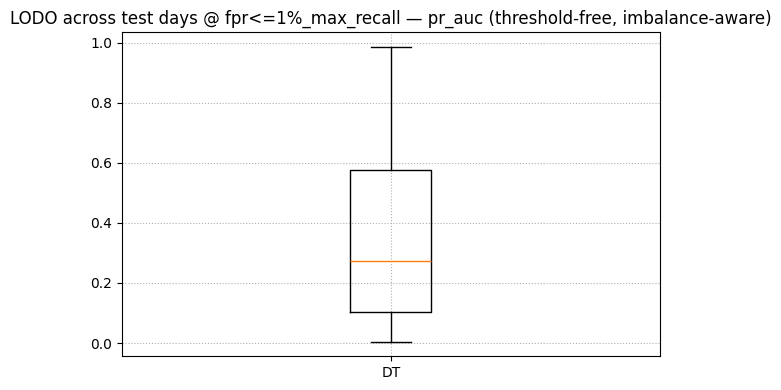

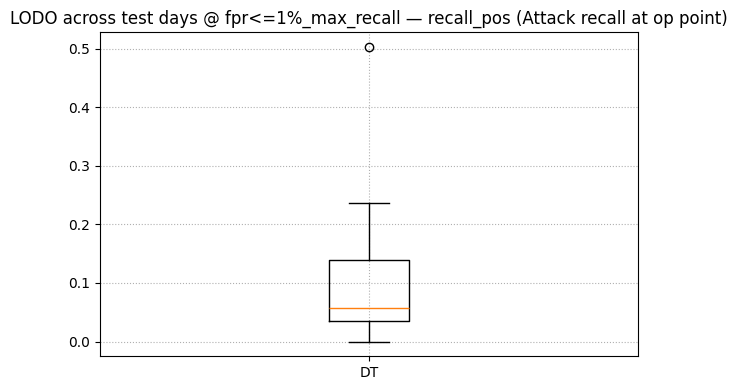

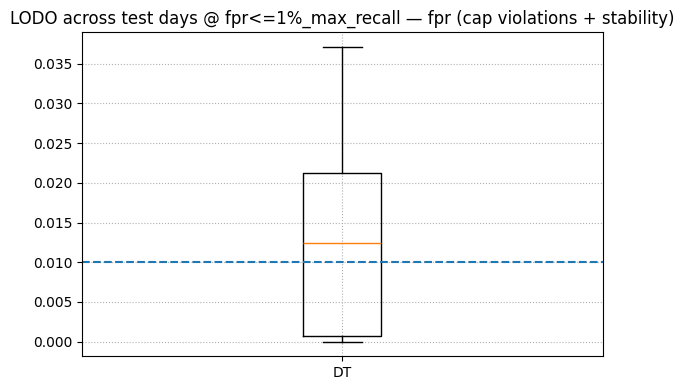

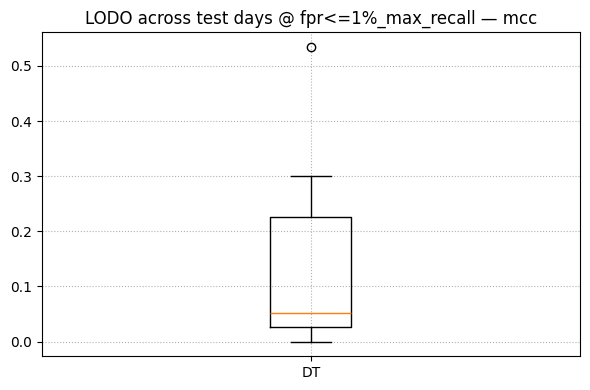


[DT] Representative days (worst + median + best) by pr_auc:


,model,pick,test_day,pr_auc
0,DT,worst,df_parquet_Web1_Thu_22,0.004945
1,DT,median,df_parquet_Infil2_Thu_01,0.289092
2,DT,best,df_parquet_DDoS1_Tue_20,0.985080


[DT] rep_days = ['df_parquet_Web1_Thu_22', 'df_parquet_Infil2_Thu_01', 'df_parquet_DDoS1_Tue_20']

[DT] per-subtype attack recall @A (fpr<=1%_max_recall) for test_day=df_parquet_Web1_Thu_22


,subtype,n,share_of_attacks,tp,fn,recall,test_day,split_mode
0,BruteForce,307,0.900293,6,301,0.019544,df_parquet_Web1_Thu_22,LODO
1,Web,34,0.099707,5,29,0.147059,df_parquet_Web1_Thu_22,LODO



[DT] per-subtype attack recall @A (fpr<=1%_max_recall) for test_day=df_parquet_Infil2_Thu_01


,subtype,n,share_of_attacks,tp,fn,recall,test_day,split_mode
0,Infiltration,62034,1.0,4310,57724,0.069478,df_parquet_Infil2_Thu_01,LODO



[DT] per-subtype attack recall @A (fpr<=1%_max_recall) for test_day=df_parquet_DDoS1_Tue_20


,subtype,n,share_of_attacks,tp,fn,recall,test_day,split_mode
0,DDoS,575364,1.0,289289,286075,0.502793,df_parquet_DDoS1_Tue_20,LODO


[DT] split_mode=LODO Xtr_raw=4,438,375 tune_size_target=30,000 Xt_actual=30,000 unique_days=7
[DT] FINAL fit_cap=300,000  Xfit_actual=300,000


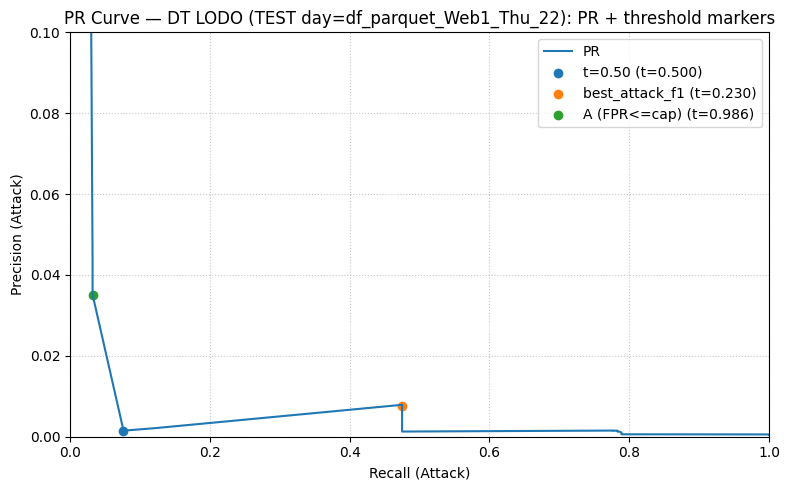

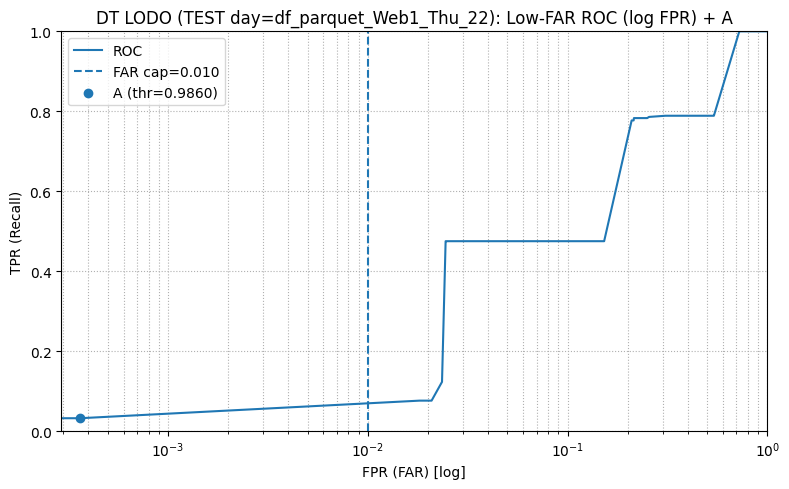

[DT] split_mode=LODO Xtr_raw=5,019,429 tune_size_target=30,000 Xt_actual=30,000 unique_days=7
[DT] FINAL fit_cap=300,000  Xfit_actual=300,000


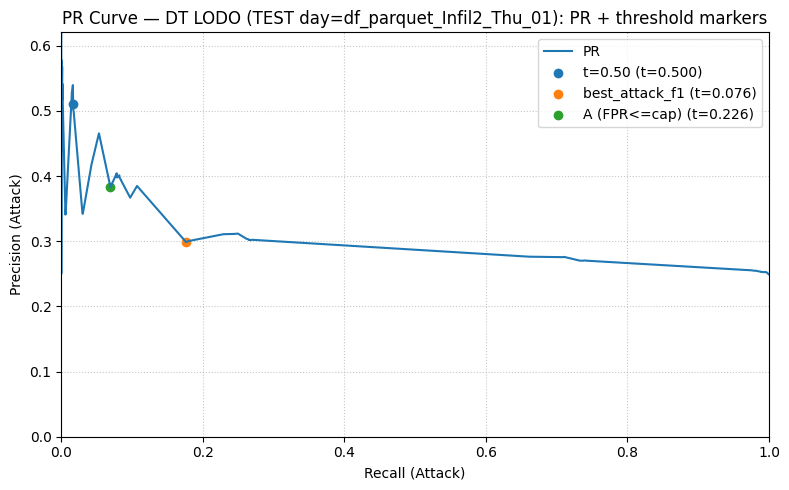

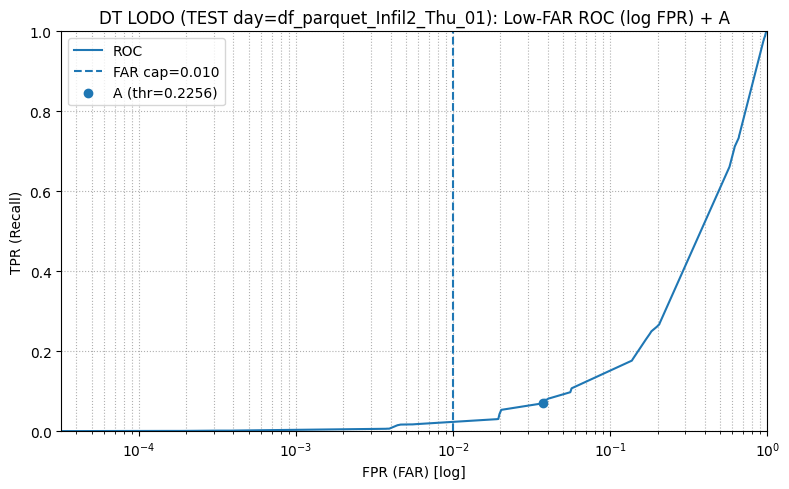

[DT] split_mode=LODO Xtr_raw=4,313,753 tune_size_target=30,000 Xt_actual=30,000 unique_days=7
[DT] FINAL fit_cap=300,000  Xfit_actual=300,000


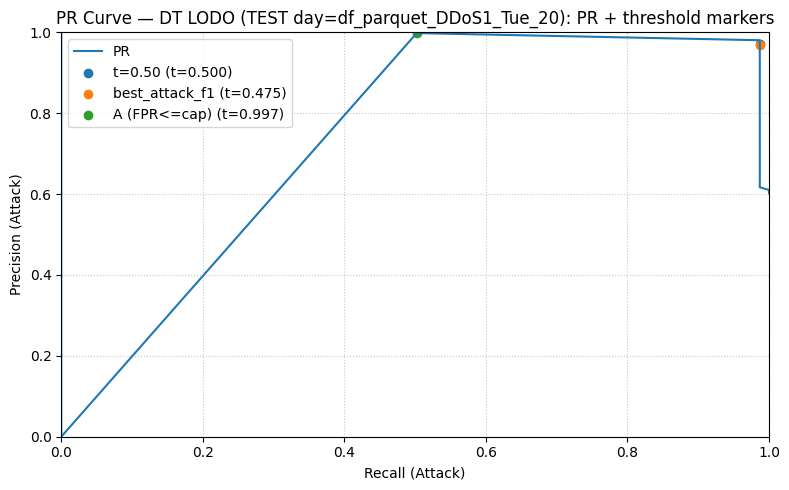

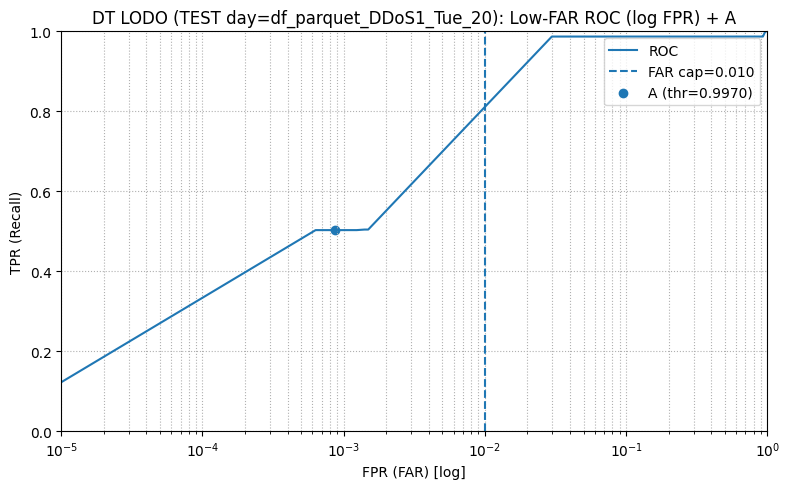

In [152]:
# F) POST-LODO PLOTTING 

MAIN_THR_LABEL = "fpr<=1%_max_recall"
PICK_METRIC = "pr_auc"   # median/worst by pr_auc

# ---------- FILL-IN (change for each model) ----------

MODEL_NAME = "DT"                  # e.g., "KNN", "DT", "ET", "RF"
DF_LODO     = results_dt_lodo       # our LODO results df for this model (ONLY LODO)
RUN_FOLD_FN = run_dt_fold           # the model runner function (must match run_*_fold signature)

KNOBS_FN    = get_dt_mode_knobs
kn = KNOBS_FN("LODO")

RUNNER_KWARGS = dict(
    # keep aligned with our runner signature
    fit_cap_final=None,
    val_eval_cap_final=DT_VAL_EVAL_CAP_FINAL,
    test_eval_cap_final=DT_TEST_EVAL_CAP_FINAL,

    do_calibrate=DT_DO_CALIBRATE,
    cal_method=DT_CAL_METHOD,
    cal_cv=DT_CAL_CV,

    # if our runner uses mode knobs (optional; safe because we filter kwargs)
    tune_cap_local=kn["tune_cap"],
    tune_frac_local=kn["tune_frac"],
    cv_splits_local=kn["cv_splits"],
    # n_iter_* key depends on the runner; include it if our runner has it
    n_iter_dt=kn["n_iter"],
)

# ---------- END FILL-IN ----------


# 1) Boxplots across days (ONLY 4 metrics)
plot_lodo_distributions_for_model(
    DF_LODO, model_name=MODEL_NAME,
    thr_label=MAIN_THR_LABEL,
    fpr_cap=MAX_FPR_CAP,
    metrics=("pr_auc", "recall_pos", "fpr", "mcc")
)

# 2) Representative days (worst + median + best)
picks_df, rep_days = pick_best_median_worst_days_for_model(
    DF_LODO,
    model_name=MODEL_NAME,
    thr_label=MAIN_THR_LABEL,
    metric=PICK_METRIC
)
print(f"\n[{MODEL_NAME}] Representative days (worst + median + best) by {PICK_METRIC}:")
display(picks_df)
print(f"[{MODEL_NAME}] rep_days =", rep_days)

# Appendix tables (only worst / median / best days)
if "dt_subtype_lodo_all" in globals() and not dt_subtype_lodo_all.empty:
    for d in rep_days:
        print(f"\n[DT] per-subtype attack recall @A ({MAIN_THR_LABEL}) for test_day={d}")
        df_d = dt_subtype_lodo_all[dt_subtype_lodo_all["test_day"] == d].copy()
        df_d = df_d.sort_values(["n", "recall"], ascending=[False, True]).reset_index(drop=True)
        display(df_d)
else:
    print("\n[DT] No stored per-subtype LODO tables found. Run DT Block E first.")


# 3) Representative-day plots: ONLY PR (+ markers) and Low-FAR ROC (log FPR) + A
replot_representative_days_lodo_minimal(
    model_name=MODEL_NAME,
    rep_days=rep_days,
    run_fold_fn=RUN_FOLD_FN,
    runner_kwargs=RUNNER_KWARGS,
    far_cap=MAX_FPR_CAP,
    thr_label_A="fpr<=1%_max_recall"
)

# END DT PIPELINE

### 5.c) Random Forest fold runner

In [156]:
# A) RANDOM FOREST runtime knobs


# FAST mode caps (algo test)
RF_FIT_CAP_FAST        = 200_000
RF_VAL_EVAL_CAP_FAST   = 200_000
RF_TEST_EVAL_CAP_FAST  = 200_000

# EVAL caps (final reporting) — keep None for full VAL/TEST if feasible
RF_VAL_EVAL_CAP_FINAL  = None
RF_TEST_EVAL_CAP_FINAL = None

# Optional: increase trees for final refit without changing search space
RF_N_ESTIMATORS_FINAL = None   # e.g., 800; keep None to use tuned value

# Optional calibration knobs (default False => no behavior change)
RF_DO_CALIBRATE = False
RF_CAL_METHOD   = "sigmoid"
RF_CAL_CV       = 3

# FULL mode - LODO knobs
RF_N_ITER_TUNE_LODO   = 10
RF_TUNE_CAP_LODO      = 30_000
RF_TUNE_FRAC_LODO     = 0.10
RF_CV_SPLITS_LODO     = 3
RF_FIT_CAP_FINAL_LODO = 300_000   # adjust (e.g., 300k–2M depending on speed)

# FULL mode - MIXED knobs (literature-like)
RF_N_ITER_TUNE_MIXED   = 30
RF_TUNE_CAP_MIXED      = 150_000
RF_TUNE_FRAC_MIXED     = 0.20
RF_CV_SPLITS_MIXED     = 5
RF_FIT_CAP_FINAL_MIXED = 1_000_000  # adjust (e.g., 500k–2M depending on speed)

def get_rf_mode_knobs(split_mode: str):
    if split_mode == "MIXED":
        return dict(
            cv_splits=RF_CV_SPLITS_MIXED,
            n_iter=RF_N_ITER_TUNE_MIXED,
            tune_cap=RF_TUNE_CAP_MIXED,
            tune_frac=RF_TUNE_FRAC_MIXED,
            fit_cap_final=RF_FIT_CAP_FINAL_MIXED,
        )
    # LODO default
    return dict(
        cv_splits=RF_CV_SPLITS_LODO,
        n_iter=RF_N_ITER_TUNE_LODO,
        tune_cap=RF_TUNE_CAP_LODO,
        tune_frac=RF_TUNE_FRAC_LODO,
        fit_cap_final=RF_FIT_CAP_FINAL_LODO,
    )

In [157]:
# B) RF fold runner 
#    - split_mode aware (LODO vs MIXED)
#    - MIXED uses StratifiedKFold via get_inner_cv
#    - MIXED tuning optimizes low-FAR region (safe partial AUC)
#    - NO_CAP operating points for recall targets
#    - artifacts returned for plots/subtype recall


# FIT capping: LODO prefers day-balanced; MIXED uses cap_rows
def _cap_for_fit_rf(X, y, g, cap, split_mode="LODO", seed=42):
    if cap is None:
        return X, y, g
    if split_mode == "MIXED":
        return cap_rows(X, y, g, cap, seed=seed)  # no day balancing
    # LODO
    if "cap_rows_day_balanced" in globals():
        try:
            return cap_rows_day_balanced(X, y, g, cap, seed=seed, min_per_day=1)
        except TypeError:
            return cap_rows_day_balanced(X, y, g, cap, seed=seed)
    return cap_rows(X, y, g, cap, seed=seed)

# EVAL capping: always cap_rows (no day balancing)
def _cap_for_eval_rf(X, y, g, cap, seed=42):
    return cap_rows(X, y, g, cap, seed=seed)

# safe partial AUC scorer (handles 2D proba; prevents one-class fold failures)
def safe_partial_auc(y_true, y_score, max_fpr=0.01):
    y_score = np.asarray(y_score)
    if y_score.ndim == 2 and y_score.shape[1] >= 2:
        y_score = y_score[:, 1]  # positive class proba
    try:
        return roc_auc_score(y_true, y_score, max_fpr=max_fpr)
    except TypeError:
        # sklearn without max_fpr support
        return roc_auc_score(y_true, y_score)
    except ValueError:
        # one-class fold
        return 0.5

def run_rf_fold(
    Xtr_raw, ytr, gtr,
    Xva_raw, yva, gva,
    Xte_raw, yte, gte,
    preprocessor,
    model_name="RF",
    max_fpr_cap=0.01,

    # mode caps
    fast_mode=False,
    fit_cap_fast=200_000,
    fit_cap_final=None,
    val_eval_cap_fast=200_000,
    test_eval_cap_fast=200_000,
    val_eval_cap_final=None,
    test_eval_cap_final=None,

    # optional final refit override
    n_estimators_final=None,

    # optional calibration
    do_calibrate=False,
    cal_method="sigmoid",
    cal_cv=3,

    # mode defaults + overrides (mirror LOGREG)
    n_iter_rf=None,
    split_mode="LODO",
    tune_cap_local=None,
    tune_frac_local=None,
    cv_splits_local=None,
):
    # -------------------------
    # resolve mode defaults once
    # -------------------------
    kn = get_rf_mode_knobs(split_mode)

    if fit_cap_final is None:
        fit_cap_final = kn["fit_cap_final"]

    tcap  = int(kn["tune_cap"] if tune_cap_local is None else tune_cap_local)
    tfrac = float(kn["tune_frac"] if tune_frac_local is None else tune_frac_local)
    n_iter_rf = int(kn["n_iter"] if n_iter_rf is None else n_iter_rf)

    # -------------------------
    # tuning subset (split_mode-aware)
    # -------------------------
    tune_size = int(min(tcap, max(5_000, tfrac * len(Xtr_raw))))
    Xt, yt, gt = _cap_for_fit_rf(
        Xtr_raw, ytr, gtr,
        cap=tune_size,
        split_mode=split_mode,
        seed=random_state
    )

    gt_arr = np.asarray(gt)
    print(
        f"[{model_name}] split_mode={split_mode} Xtr_raw={len(Xtr_raw):,} "
        f"tune_size_target={tune_size:,} Xt_actual={len(Xt):,} "
        f"unique_days={len(np.unique(gt_arr))}"
    )

    # -------------------------
    # FAST MODE (no search)
    # -------------------------
    if fast_mode:
        Xfit, yfit, gfit = _cap_for_fit_rf(
            Xtr_raw, ytr, gtr,
            cap=fit_cap_fast,
            split_mode=split_mode,
            seed=random_state
        )
        print(f"[{model_name}] FAST fit_cap={fit_cap_fast:,}  Xfit_actual={len(Xfit):,}")

        best_pipe = Pipeline(steps=[
            ("prep", preprocessor),
            ("clf", RandomForestClassifier(
                n_estimators=300,
                max_depth=None,
                min_samples_split=2,
                min_samples_leaf=1,
                max_features="sqrt",
                bootstrap=True,
                class_weight="balanced_subsample",
                n_jobs=-1,
                random_state=random_state
            ))
        ])
        best_pipe.fit(Xfit, yfit)

        best_params = {
            "FAST_MODE": True,
            "clf__n_estimators": 300,
            "fit_cap_fast": fit_cap_fast,
            "split_mode": split_mode,
            "calibrated": False,
        }

        model = best_pipe

    # -------------------------
    # FULL MODE (RandomizedSearchCV)
    # -------------------------
    else:
        # CV: LODO -> GroupKFold by day, MIXED -> StratifiedKFold(shuffle=True)
        spl = int(kn["cv_splits"] if cv_splits_local is None else cv_splits_local)

        cv = get_inner_cv(
            split_mode,
            y=np.asarray(yt).astype(int),
            groups=gt_arr,
            default_splits=spl,
            seed=random_state
        )

        if split_mode == "LODO" and len(np.unique(gt_arr)) < 2:
            raise ValueError("Not enough unique day groups in tuning subset for GroupKFold (LODO).")

        # search space (preserved)
        param_dist = {
            "clf__n_estimators": randint(200, 700),
            "clf__max_depth": [None] + list(range(6, 31)),
            "clf__min_samples_split": randint(2, 60),
            "clf__min_samples_leaf": randint(1, 30),
            "clf__max_features": ["sqrt", "log2", 0.5, None],
            "clf__bootstrap": [True, False],
            "clf__class_weight": [None, "balanced", "balanced_subsample"],
            "clf__ccp_alpha": loguniform(1e-8, 1e-3),
            # avoid nested parallelism during CV
            "clf__n_jobs": [1],
        }

        # scoring: MIXED optimizes low-FAR region; LODO uses average_precision
        if split_mode == "MIXED":
            scoring_used = make_scorer(safe_partial_auc, needs_proba=True, max_fpr=max_fpr_cap)
            scoring_tag = "partial_auc@max_fpr"
        else:
            scoring_used = "average_precision"
            scoring_tag = "average_precision"

        search = RandomizedSearchCV(
            estimator=Pipeline(steps=[
                ("prep", preprocessor),
                ("clf", RandomForestClassifier(random_state=random_state))
            ]),
            param_distributions=param_dist,
            n_iter=int(n_iter_rf),
            scoring=scoring_used,
            error_score=0.0,   # prevent NaNs from poisoning the run
            cv=cv,
            n_jobs=-1,
            random_state=random_state,
            refit=True,
            verbose=0
        )

        # pass groups only in LODO
        if split_mode == "LODO":
            search.fit(Xt, yt, groups=gt_arr)
        else:
            search.fit(Xt, yt)

        # final fit (split_mode-aware capping)
        Xfit, yfit, gfit = _cap_for_fit_rf(
            Xtr_raw, ytr, gtr,
            cap=fit_cap_final,
            split_mode=split_mode,
            seed=random_state
        )
        print(f"[{model_name}] FINAL fit_cap={fit_cap_final:,}  Xfit_actual={len(Xfit):,}")

        best_pipe = search.best_estimator_
        best_pipe.set_params(clf__n_jobs=-1)

        if n_estimators_final is not None:
            best_pipe.set_params(clf__n_estimators=int(n_estimators_final))

        best_pipe.fit(Xfit, yfit)

        best_params = dict(search.best_params_)
        best_params["fit_cap_final"] = fit_cap_final
        best_params["split_mode"] = split_mode
        best_params["tune_size"] = tune_size
        best_params["cv_splits"] = int(getattr(cv, "n_splits", spl))
        best_params["n_iter"] = int(n_iter_rf)
        best_params["scoring_used"] = scoring_tag
        if n_estimators_final is not None:
            best_params["n_estimators_final_override"] = int(n_estimators_final)

        # -------------------------
        # OPTIONAL CALIBRATION (split-safe)
        # -------------------------
        model = best_pipe
        if do_calibrate:
            if split_mode == "LODO":
                gfit_arr = np.asarray(gfit)
                uniq_days = np.unique(gfit_arr)
                if len(uniq_days) >= 2:
                    cal_splits = min(int(cal_cv), len(uniq_days))
                    gkf = GroupKFold(n_splits=cal_splits)
                    cal_splits_list = list(gkf.split(Xfit, yfit, groups=gfit_arr))

                    cal = CalibratedClassifierCV(
                        estimator=clone(best_pipe),
                        method=cal_method,
                        cv=cal_splits_list
                    )
                    cal.fit(Xfit, yfit)
                    model = cal

                    best_params["calibrated"] = True
                    best_params["cal_method"] = cal_method
                    best_params["cal_cv"] = cal_splits
                else:
                    best_params["calibrated"] = False
                    best_params["calibration_skipped_reason"] = "not_enough_unique_day_groups_in_gfit"
            else:
                # MIXED: stratified CV calibration
                skf = StratifiedKFold(n_splits=max(2, int(cal_cv)), shuffle=True, random_state=random_state)
                cal = CalibratedClassifierCV(
                    estimator=clone(best_pipe),
                    method=cal_method,
                    cv=skf
                )
                cal.fit(Xfit, yfit)
                model = cal

                best_params["calibrated"] = True
                best_params["cal_method"] = cal_method
                best_params["cal_cv"] = int(cal_cv)
        else:
            best_params["calibrated"] = False

    # -------------------------
    # EVAL caps
    # -------------------------
    if fast_mode:
        Xva_eval, yva_eval, _ = _cap_for_eval_rf(Xva_raw, yva, gva, val_eval_cap_fast, seed=random_state)
        Xte_eval, yte_eval, _ = _cap_for_eval_rf(Xte_raw, yte, gte, test_eval_cap_fast, seed=random_state)
    else:
        Xva_eval, yva_eval, _ = _cap_for_eval_rf(Xva_raw, yva, gva, val_eval_cap_final, seed=random_state)
        Xte_eval, yte_eval, _ = _cap_for_eval_rf(Xte_raw, yte, gte, test_eval_cap_final, seed=random_state)

    # -------------------------
    # threshold tuning on VAL
    # -------------------------
    score_va = get_scores(model, Xva_eval)
    if "log_if_degenerate_scores" in globals():
        log_if_degenerate_scores(score_va, model_name, split_name="VAL")
    else:
        uniq = np.unique(np.round(score_va, 8)).size
        if uniq <= 3:
            print(f"[{model_name}] WARNING: score_va has very few unique values ({uniq}).")

    t_f1, _ = pick_threshold_best_attack_f1(yva_eval, score_va)
    t_fpr = pick_threshold_fpr_constrained_max_recall(yva_eval, score_va, max_fpr=max_fpr_cap)
    t_r95 = pick_threshold_recall_target_min_fpr(yva_eval, score_va, recall_target=0.95, max_fpr=max_fpr_cap)
    t_r98 = pick_threshold_recall_target_min_fpr(yva_eval, score_va, recall_target=0.98, max_fpr=max_fpr_cap)

    # diagnostics (NO CAP): show what FAR is required for recall targets
    t_r95_any = pick_threshold_recall_target_min_fpr(yva_eval, score_va, recall_target=0.95, max_fpr=1.0)
    t_r98_any = pick_threshold_recall_target_min_fpr(yva_eval, score_va, recall_target=0.98, max_fpr=1.0)

    thresholds = {
        "t=0.50": 0.50,
        "best_attack_f1": t_f1,
        "fpr<=1%_max_recall": t_fpr,
        "recall>=0.95_min_fpr": t_r95,
        "recall>=0.98_min_fpr": t_r98,
        "recall>=0.95_min_fpr_NO_CAP": t_r95_any,
        "recall>=0.98_min_fpr_NO_CAP": t_r98_any,
    }
    feas = {k: (v is not None) for k, v in thresholds.items()}
    thresholds_valid = {k: v for k, v in thresholds.items() if v is not None}

    # realized VAL FPR at the FAR-capped threshold
    t_fpr_sel = thresholds.get("fpr<=1%_max_recall", None)
    if t_fpr_sel is not None:
        yhat_val = (score_va >= t_fpr_sel).astype(int)
        tn, fp, fn, tp = confusion_matrix(yva_eval, yhat_val, labels=[0, 1]).ravel()
        best_params["val_fpr_realized_at_fpr1_thr"] = float(fp / (fp + tn + 1e-12))
    else:
        best_params["val_fpr_realized_at_fpr1_thr"] = None

    # -------------------------
    # evaluate on TEST
    # -------------------------
    score_te = get_scores(model, Xte_eval)
    if "log_if_degenerate_scores" in globals():
        log_if_degenerate_scores(score_te, model_name, split_name="TEST")
    else:
        uniq_te = np.unique(np.round(score_te, 8)).size
        if uniq_te <= 3:
            print(f"[{model_name}] WARNING: score_te has very few unique values ({uniq_te}).")

    if t_fpr_sel is not None:
        yhat_te = (score_te >= t_fpr_sel).astype(int)
        tn, fp, fn, tp = confusion_matrix(yte_eval, yhat_te, labels=[0, 1]).ravel()
        best_params["test_fpr_realized_at_fpr1_thr"] = float(fp / (fp + tn + 1e-12))
    else:
        best_params["test_fpr_realized_at_fpr1_thr"] = None

    df = evaluate_thresholds(yte_eval, score_te, thresholds_valid, name=model_name)

    if do_plots:
        plot_pr_curve_with_thresholds(yte_eval, score_te, thresholds_valid, model_name=model_name)
        plot_roc_curve(yte_eval, score_te, model_name=model_name)
        plot_det_curve(yte_eval, score_te, model_name=model_name)
        plot_score_distribution(yte_eval, score_te, model_name=model_name, bins=100)

    # artifacts for MIXED plotting + subtype recall
    feas["__artifacts__"] = {
        "score_te": score_te,
        "yte_eval": yte_eval,
        "score_va": score_va,
        "yva_eval": yva_eval,
    }

    return df, best_params, thresholds, feas


In [ ]:
# C) RF algo test cell 
#    Runs one LODO test day + one MIXED build, both in FAST mode


RUN_MODELS["RF"] = True
ALGO_TEST_DAY = TEST_DAYS[0]
print("Algo test day:", ALGO_TEST_DAY)

old_do_plots = do_plots
do_plots = False

# ---------- LODO algo test ----------
split_mode = "LODO"
kn = get_rf_mode_knobs(split_mode)

Xtr_raw, ytr, gtr, Xva_raw, yva, gva, Xte_raw, yte, gte, meta = build_fold(
    registry=REGISTRY, val_days=VAL_DAYS, test_day=ALGO_TEST_DAY
)
preprocessor, prep_dbg = build_preprocessor(Xtr_raw, meta["feature_cols"])
print("LODO preprocessor debug:", prep_dbg)

if RUN_MODELS.get("RF", False):
    rf_df, rf_best_params, rf_thresholds, rf_feas = run_rf_fold(
        Xtr_raw, ytr, gtr, Xva_raw, yva, gva, Xte_raw, yte, gte,
        preprocessor,
        model_name="RF",
        fast_mode=True,
        fit_cap_fast=RF_FIT_CAP_FAST,
        val_eval_cap_fast=RF_VAL_EVAL_CAP_FAST,
        test_eval_cap_fast=RF_TEST_EVAL_CAP_FAST,
        max_fpr_cap=MAX_FPR_CAP,
        split_mode=split_mode,

        # keep knobs consistent even if FAST doesn’t use them
        n_iter_rf=kn["n_iter"],
        tune_cap_local=kn["tune_cap"],
        tune_frac_local=kn["tune_frac"],
        cv_splits_local=kn["cv_splits"],

        do_calibrate=RF_DO_CALIBRATE,
        cal_method=RF_CAL_METHOD,
        cal_cv=RF_CAL_CV,
    )
    print("RF (LODO) best params:", rf_best_params)
    print("RF (LODO) thresholds:", rf_thresholds)
    print("RF (LODO) feasibility:", {k: v for k, v in rf_feas.items() if k != "__artifacts__"})
    display(rf_df)

# ---------- MIXED algo test ----------
split_mode = "MIXED"
kn = get_rf_mode_knobs(split_mode)

Xtr_raw_m, ytr_m, gtr_m, Xva_raw_m, yva_m, gva_m, Xte_raw_m, yte_m, gte_m, meta_m = build_mixed_fold(
    registry=REGISTRY,
    seed=MIXED_RANDOM_STATE,
    test_size=MIXED_TEST_SIZE,
    val_size=MIXED_VAL_SIZE,
    use_rare_injection=MIXED_USE_RARE_ALLOCATION,
    rare_subtypes=RARE_SUBTYPES,
    rare_n_test=RARE_N_TEST_PER_SUBTYPE,
    rare_n_val=RARE_N_VAL_PER_SUBTYPE,
)
preprocessor_m, prep_dbg_m = build_preprocessor(Xtr_raw_m, meta_m["feature_cols"])
print("MIXED preprocessor debug:", prep_dbg_m)

if RUN_MODELS.get("RF", False):
    rf_df_m_fast, rf_best_params_m_fast, rf_thresholds_m_fast, rf_feas_m_fast = run_rf_fold(
        Xtr_raw_m, ytr_m, gtr_m, Xva_raw_m, yva_m, gva_m, Xte_raw_m, yte_m, gte_m,
        preprocessor_m,
        model_name="RF",
        fast_mode=True,
        fit_cap_fast=RF_FIT_CAP_FAST,
        val_eval_cap_fast=RF_VAL_EVAL_CAP_FAST,
        test_eval_cap_fast=RF_TEST_EVAL_CAP_FAST,
        max_fpr_cap=MAX_FPR_CAP,
        split_mode=split_mode,

        n_iter_rf=kn["n_iter"],
        tune_cap_local=kn["tune_cap"],
        tune_frac_local=kn["tune_frac"],
        cv_splits_local=kn["cv_splits"],

        do_calibrate=RF_DO_CALIBRATE,
        cal_method=RF_CAL_METHOD,
        cal_cv=RF_CAL_CV,
    )
    print("RF (MIXED/FAST) best params:", rf_best_params_m_fast)
    print("RF (MIXED/FAST) thresholds:", rf_thresholds_m_fast)
    print("RF (MIXED/FAST) feasibility:", {k: v for k, v in rf_feas_m_fast.items() if k != "__artifacts__"})
    display(rf_df_m_fast)

do_plots = old_do_plots

MIXED preprocessor debug: {'log1p_cols': ['Active Mean', 'Active Std', 'Bwd IAT Total', 'Bwd IAT Min', 'Packet Length Variance', 'Packet Length Min', 'Bwd Packets/s', 'Down/Up Ratio', 'FIN Flag Count', 'Flow Bytes/s', 'Flow IAT Std', 'Fwd IAT Min', 'Fwd IAT Std', 'Fwd Packet Length Std', 'Fwd Packets/s', 'Fwd URG Flags', 'Idle Min', 'RST Flag Count', 'SYN Flag Count', 'URG Flag Count'], 'scale_cols': ['ACK Flag Count', 'Init Bwd Win Bytes', 'Init Fwd Win Bytes', 'PSH Flag Count'], 'has_protocol': True}
MIXED shapes: (4661671, 25) (665954, 25) (1331907, 25)
MIXED n_features: 25
[RF] split_mode=MIXED Xtr_raw=4,661,671 tune_size_target=150,000 Xt_actual=150,000 unique_days=10
[RF] FINAL fit_cap=1,000,000  Xfit_actual=1,000,000


,stage2_skipped,n_train_attacks,n_test_attacks,n_classes,classes,oracle_n_test_classes,oracle_macro_f1,oracle_weighted_f1,oracle_acc,oracle_bacc,gated_available,gate_thr,n_flagged_total,n_tp_attacks,gated_macro_f1_tp,joint_correct_rate,model,split_mode,test_day
0,False,931366,266105,6,"[Bot, BruteForce, DDoS, DoS, Infiltration, OTHER]",6,0.858249,0.998222,0.99826,0.851404,True,0.441248,253510,243545,0.864907,0.914733,RF,MIXED,MIXED


RF attack type stage 2 result: {'stage2_skipped': False, 'n_train_attacks': 931366, 'n_test_attacks': 266105, 'n_classes': 6, 'classes': ['Bot', 'BruteForce', 'DDoS', 'DoS', 'Infiltration', 'OTHER'], 'oracle_n_test_classes': 6, 'oracle_macro_f1': 0.8582490546663887, 'oracle_weighted_f1': 0.9982219914628669, 'oracle_acc': 0.9982600853046729, 'oracle_bacc': 0.8514039863228597, 'gated_available': True, 'gate_thr': 0.4412480240519906, 'n_flagged_total': 253510, 'n_tp_attacks': 243545, 'gated_macro_f1_tp': 0.864907399201173, 'joint_correct_rate': 0.9147329061836493, 'model': 'RF', 'split_mode': 'MIXED', 'test_day': 'MIXED'}

=== MIXED (RF): best_params ===
{'clf__bootstrap': True, 'clf__ccp_alpha': np.float64(9.609812947036398e-05), 'clf__class_weight': 'balanced_subsample', 'clf__max_depth': 15, 'clf__max_features': None, 'clf__min_samples_leaf': 29, 'clf__min_samples_split': 22, 'clf__n_estimators': 302, 'clf__n_jobs': 1, 'fit_cap_final': 1000000, 'split_mode': 'MIXED', 'tune_size': 15000

,thr,tn,fp,fn,tp,precision_pos,recall_pos,f1_pos,macro_f1,fpr,fnr,mcc,balanced_acc,roc_auc,pr_auc,model,thr_label,test_day,split_mode
0,0.500000,1058228,7574,22773,243332,0.969813,0.914421,0.941303,0.963584,0.007106,0.085579,0.927799,0.953657,0.98378,0.964712,RF,t=0.50,MIXED,MIXED
1,0.797707,1061624,4178,23887,242218,0.983044,0.910235,0.945239,0.966097,0.003920,0.089765,0.933275,0.953157,0.98378,0.964712,RF,best_attack_f1,MIXED,MIXED
2,0.441248,1055837,9965,22560,243545,0.960692,0.915221,0.937406,0.961118,0.009350,0.084779,0.922666,0.952936,0.98378,0.964712,RF,fpr<=1%_max_recall,MIXED,MIXED
3,0.162582,959254,106548,13103,253002,0.703663,0.950760,0.808759,0.875027,0.099970,0.049240,0.766293,0.925395,0.98378,0.964712,RF,recall>=0.95_min_fpr_NO_CAP,MIXED,MIXED
4,0.099295,695525,370277,3923,262182,0.414544,0.985258,0.583558,0.685788,0.347416,0.014742,0.510721,0.818921,0.98378,0.964712,RF,recall>=0.98_min_fpr_NO_CAP,MIXED,MIXED



Total time elapsed for RF MIXED-only run: 236.86 minutes

[RF MIXED (TEST)] Operating points (TEST)


,label,thr,fpr,recall,precision,f1,tn,fp,fn,tp
0,best_attack_f1,0.797707,0.003920,0.910235,0.983044,0.945239,1061624,4178,23887,242218
1,t=0.50,0.500000,0.007106,0.914421,0.969813,0.941303,1058228,7574,22773,243332
2,A (FPR<=1%),0.441248,0.009350,0.915221,0.960692,0.937406,1055837,9965,22560,243545
3,B (Recall>=0.95 NO CAP),0.162582,0.099970,0.950760,0.703663,0.808759,959254,106548,13103,253002
4,C (recall>=0.98_min_fpr_NO_CAP),0.099295,0.347416,0.985258,0.414544,0.583558,695525,370277,3923,262182


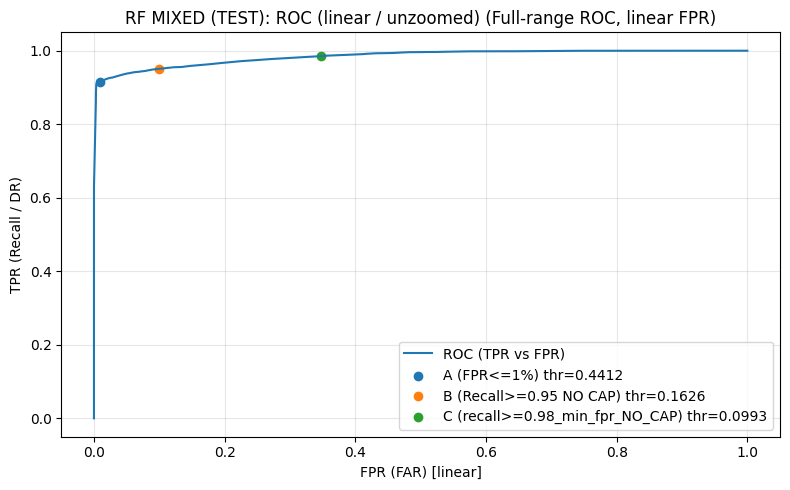

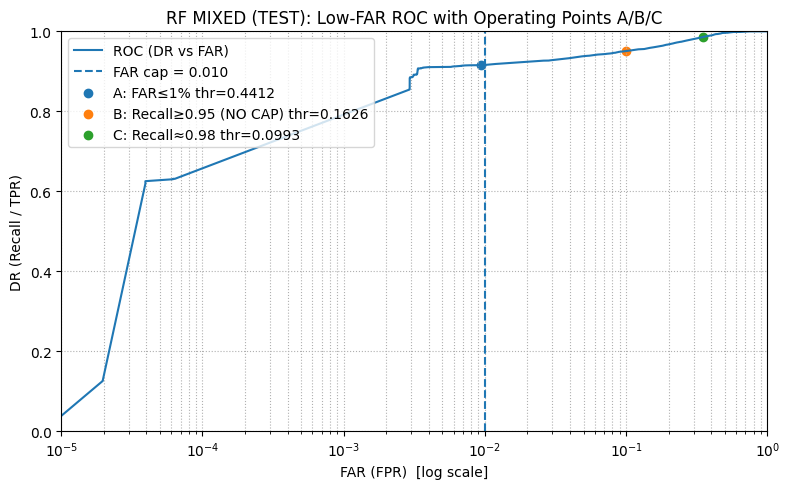

Operating Point A (FAR capped): {'thr': 0.4412480240519906, 'tn': 1055837, 'fp': 9965, 'fn': 22560, 'tp': 243545, 'precision_pos': 0.9606918859216599, 'recall_pos': 0.91522143514778, 'f1_pos': 0.9374055791307025, 'macro_f1': 0.9611183722608008, 'fpr': 0.009349766654594381, 'fnr': 0.08477856485221999, 'mcc': 0.9226661265623346, 'balanced_acc': 0.9529358342465928}
Operating Point B (Recall>=0.95 NO CAP): {'thr': 0.16258199004359986, 'tn': 959254, 'fp': 106548, 'fn': 13103, 'tp': 253002, 'precision_pos': 0.7036629119733, 'recall_pos': 0.9507600383307341, 'f1_pos': 0.8087588207558478, 'macro_f1': 0.8750266955014103, 'fpr': 0.09996978800940512, 'fnr': 0.04923996166926589, 'mcc': 0.7662928409953864, 'balanced_acc': 0.9253951251606645}
FAR cost multiplier (B vs A): 10.69x
Operating Point C (Recall≈0.98): {'thr': 0.09929547914319578, 'tn': 695525, 'fp': 370277, 'fn': 3923, 'tp': 262182, 'precision_pos': 0.4145438676657301, 'recall_pos': 0.985257699028579, 'f1_pos': 0.5835577655014, 'macro_f1':

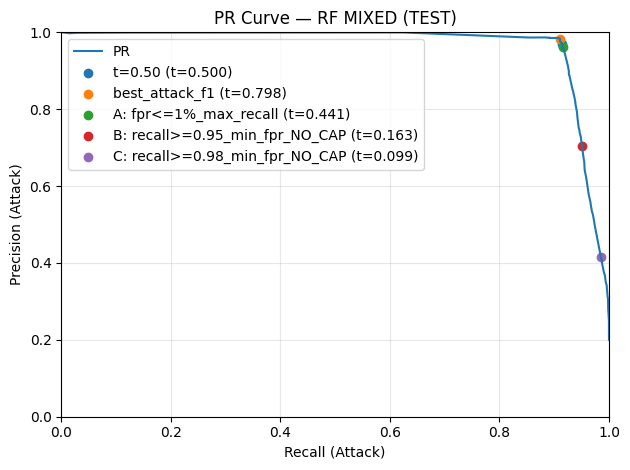

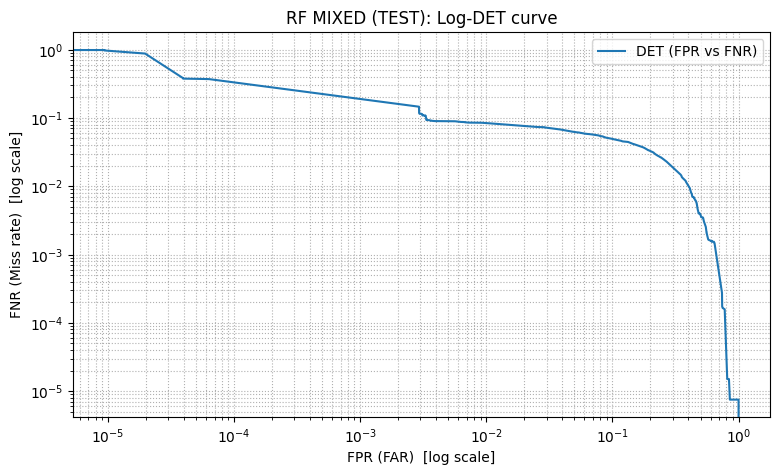

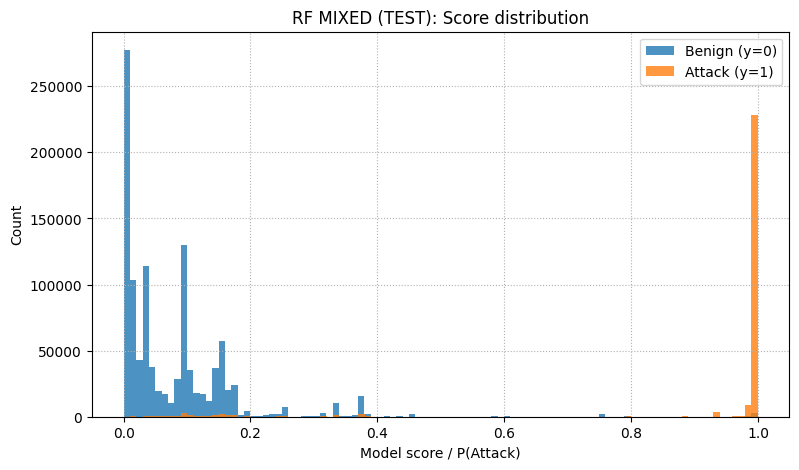


=== MIXED (RF): per-subtype attack recall @ Operating Point A (fpr<=1%) ===


,subtype,n,share_of_attacks,tp,fn,recall
0,DDoS,155400,0.583980,155288,112,0.999279
1,DoS,39179,0.147231,39061,118,0.996988
2,Bot,28902,0.108611,28646,256,0.991142
3,Infiltration,23508,0.088341,1706,21802,0.072571
4,BruteForce,19066,0.071648,18828,238,0.987517
5,Web,50,0.000188,16,34,0.320000


In [158]:
# D) RF outer loop (MIXED ONLY) + display results + required plots


# ---- helpers ----
if "metrics_at_threshold" not in globals():
    def metrics_at_threshold(y_true, y_score, thr):
        y_true = np.asarray(y_true).astype(int)
        y_score = np.asarray(y_score, dtype=float)
        thr = float(thr)
        yhat = (y_score >= thr).astype(int)
        tn, fp, fn, tp = confusion_matrix(y_true, yhat, labels=[0, 1]).ravel()
        fpr = fp / (fp + tn + 1e-12)
        recall = tp / (tp + fn + 1e-12)
        precision = tp / (tp + fp + 1e-12)
        f1 = 2 * precision * recall / (precision + recall + 1e-12)
        return {
            "thr": thr,
            "tn": int(tn), "fp": int(fp), "fn": int(fn), "tp": int(tp),
            "fpr": float(fpr),
            "recall_pos": float(recall),
            "precision_pos": float(precision),
            "f1_pos": float(f1),
        }

if "plot_roc_curve_linear_with_operating_points" not in globals():
    def plot_roc_curve_linear_with_operating_points(y_true, y_score, thresholds_dict=None, model_name="ROC (linear)"):
        y_true = np.asarray(y_true).astype(int)
        y_score = np.asarray(y_score, dtype=float)
        fpr, tpr, _ = roc_curve(y_true, y_score)

        plt.figure(figsize=(8, 5))
        plt.plot(fpr, tpr, label="ROC")

        if thresholds_dict:
            for lbl, thr in thresholds_dict.items():
                if thr is None:
                    continue
                m = metrics_at_threshold(y_true, y_score, float(thr))
                plt.scatter([m["fpr"]], [m["recall_pos"]], label=f"{lbl} thr={m['thr']:.4f}")

        plt.xlabel("FPR (FAR)")
        plt.ylabel("TPR (Recall / DR)")
        plt.title(model_name)
        plt.grid(True, linestyle=":")
        plt.legend()
        plt.tight_layout()
        plt.show()

if "_select_r98_threshold_for_plot" not in globals():
    def _select_r98_threshold_for_plot(thresholds_dict):
        """
        Prefer capped r98 if available; else fall back to NO_CAP.
        Returns (thr, label) where thr may be None.
        """
        thr_cap = thresholds_dict.get("recall>=0.98_min_fpr", None)
        if thr_cap is not None:
            return thr_cap, "recall>=0.98_min_fpr"
        thr_any = thresholds_dict.get("recall>=0.98_min_fpr_NO_CAP", None)
        if thr_any is not None:
            return thr_any, "recall>=0.98_min_fpr_NO_CAP"
        return None, "recall>=0.98 (unavailable)"

if "print_operating_points_table" not in globals():
    def print_operating_points_table(y_true, y_score, thresholds_dict, model_name="MODEL", sort_by=None):
        rows = []
        for k, thr in thresholds_dict.items():
            if thr is None:
                continue
            m = metrics_at_threshold(y_true, y_score, float(thr))
            rows.append({
                "label": k,
                "thr": m["thr"],
                "fpr": m["fpr"],
                "recall_pos": m["recall_pos"],
                "precision_pos": m["precision_pos"],
                "f1_pos": m["f1_pos"],
                "tn": m["tn"], "fp": m["fp"], "fn": m["fn"], "tp": m["tp"],
            })
        df = pd.DataFrame(rows)
        if not df.empty and sort_by is not None and sort_by in df.columns:
            df = df.sort_values(sort_by).reset_index(drop=True)
        print(f"\n=== Operating Points: {model_name} ===")
        display(df)

if "plot_low_far_roc_with_ops" not in globals():
    def plot_low_far_roc_with_ops(y_true, y_score, thr_A, thr_B=None, thr_C=None, far_cap=0.01, title=""):
        y_true = np.asarray(y_true).astype(int)
        y_score = np.asarray(y_score, dtype=float)
        fpr_curve, tpr_curve, _ = roc_curve(y_true, y_score)

        A = metrics_at_threshold(y_true, y_score, float(thr_A)) if thr_A is not None else None
        B = metrics_at_threshold(y_true, y_score, float(thr_B)) if thr_B is not None else None
        C = metrics_at_threshold(y_true, y_score, float(thr_C)) if thr_C is not None else None

        plt.figure(figsize=(8, 5))
        plt.plot(fpr_curve, tpr_curve, label="ROC (DR/Recall vs FAR/FPR)")
        plt.axvline(far_cap, linestyle="--", label=f"FAR cap = {far_cap:.3f}")

        if A is not None:
            plt.scatter([A["fpr"]], [A["recall_pos"]], label=f"A: FAR≤{far_cap:.0%} thr={A['thr']:.4f}")
        if B is not None:
            plt.scatter([B["fpr"]], [B["recall_pos"]], label=f"B: Recall≥0.95 (NO CAP) thr={B['thr']:.4f}")
        if C is not None:
            plt.scatter([C["fpr"]], [C["recall_pos"]], label=f"C: Recall≥0.98 thr={C['thr']:.4f}")

        plt.xscale("log")
        fpr_pos = fpr_curve[fpr_curve > 0]
        left = float(fpr_pos.min()) if fpr_pos.size else 1e-5
        plt.xlim(max(1e-5, left), 1.0)
        plt.ylim(0.0, 1.0)

        plt.xlabel("FAR (FPR)  [log scale]")
        plt.ylabel("DR (Recall / TPR)")
        plt.title(title)
        plt.legend()
        plt.grid(True, which="both", linestyle=":")
        plt.tight_layout()
        plt.show()

        if A is not None:
            print("Operating Point A (practical IDS: FAR capped):", A)
        if B is not None:
            print("Operating Point B (high detection: Recall target, NO CAP):", B)
            if A is not None and A["fpr"] > 0:
                print(f"FAR cost multiplier (B vs A): {B['fpr']/A['fpr']:.2f}x")
        if C is not None:
            print("Operating Point C (very high detection: Recall target≈0.98):", C)
            if A is not None and A["fpr"] > 0:
                print(f"FAR cost multiplier (C vs A): {C['fpr']/A['fpr']:.2f}x")


# -------------------- RUN MIXED-ONLY --------------------
RUN_MODELS["RF"] = True

START_TIME = time.time()
old_do_plots = do_plots
do_plots = False  

split_mode = "MIXED"
kn = get_rf_mode_knobs(split_mode)

# Build MIXED fold
Xtr_raw_m, ytr_m, gtr_m, Xva_raw_m, yva_m, gva_m, Xte_raw_m, yte_m, gte_m, meta_m = build_mixed_fold(
    registry=REGISTRY,
    seed=MIXED_RANDOM_STATE,
    test_size=MIXED_TEST_SIZE,
    val_size=MIXED_VAL_SIZE,
    use_rare_injection=MIXED_USE_RARE_ALLOCATION,
    rare_subtypes=RARE_SUBTYPES,
    rare_n_test=RARE_N_TEST_PER_SUBTYPE,
    rare_n_val=RARE_N_VAL_PER_SUBTYPE,
)

preprocessor_m, prep_dbg_m = build_preprocessor(Xtr_raw_m, meta_m["feature_cols"])
print("MIXED preprocessor debug:", prep_dbg_m)
print("MIXED shapes:", Xtr_raw_m.shape, Xva_raw_m.shape, Xte_raw_m.shape)
print("MIXED n_features:", len(meta_m["feature_cols"]))

# Train + evaluate RF on MIXED (FULL MODE)
rf_df_m, rf_best_params_m, rf_thresholds_m, rf_feas_m = run_rf_fold(
    Xtr_raw_m, ytr_m, gtr_m,
    Xva_raw_m, yva_m, gva_m,
    Xte_raw_m, yte_m, gte_m,
    preprocessor_m,
    model_name="RF",
    fast_mode=False,

    fit_cap_final=None,  # default from mode knobs
    val_eval_cap_final=RF_VAL_EVAL_CAP_FINAL,
    test_eval_cap_final=RF_TEST_EVAL_CAP_FINAL,
    max_fpr_cap=MAX_FPR_CAP,

    n_estimators_final=RF_N_ESTIMATORS_FINAL,

    do_calibrate=RF_DO_CALIBRATE,
    cal_method=RF_CAL_METHOD,
    cal_cv=RF_CAL_CV,

    # mode knobs
    n_iter_rf=None,  # default from mode knobs
    tune_cap_local=kn["tune_cap"],
    tune_frac_local=kn["tune_frac"],
    cv_splits_local=kn["cv_splits"],
    split_mode=split_mode,
)

# RF attack type stage 2 (MIXED only, using VAL artifacts + thresholds)
rf_attacktype_m = None
if DO_ATTACKTYPE_STAGE2:
    art = rf_feas_m.get("__artifacts__", {})
    score_te_m = art.get("score_te", None)
    thr_main_m = rf_thresholds_m.get(MAIN_THR_LABEL, None)

    rf_attacktype_m = run_attacktype_stage2(
        model_key="RF",
        preprocessor=preprocessor_m,
        Xtr_raw=Xtr_raw_m, ytr=ytr_m, label_raw_train=meta_m["label_raw_train"],
        Xte_raw=Xte_raw_m, yte=yte_m, label_raw_test=meta_m["label_raw_test"],
        gate_scores_te=score_te_m, gate_thr=thr_main_m,
        base_best_params=rf_best_params_m,
        min_count=ATTACKTYPE_MIN_COUNT,
        rare_set=RARE_SUBTYPES,
        other_label=ATTACKTYPE_OTHER_LABEL,
    )
    rf_attacktype_m.update({"model": "RF", "split_mode": "MIXED", "test_day": "MIXED"})
    display(pd.DataFrame([rf_attacktype_m]))
print("RF attack type stage 2 result:", rf_attacktype_m)


rf_df_m = rf_df_m.copy()
rf_df_m["test_day"] = "MIXED"
rf_df_m["split_mode"] = "MIXED"

print("\n=== MIXED (RF): best_params ===")
print(rf_best_params_m)

print("\n=== MIXED (RF): thresholds (picked on VAL) ===")
print(rf_thresholds_m)

print("\n=== MIXED (RF): feasibility ===")
print({k: v for k, v in rf_feas_m.items() if k != "__artifacts__"})

display(rf_df_m)

elapsed = time.time() - START_TIME
print(f"\nTotal time elapsed for RF MIXED-only run: {elapsed/60:.2f} minutes")

# -------------------- REQUIRED PLOTS / MIXED SPLIT ONLY  --------------------
art = rf_feas_m.get("__artifacts__", {})
yte_eval_m = art.get("yte_eval", None)
score_te_m = art.get("score_te", None)

if yte_eval_m is not None and score_te_m is not None:

    thr_A = rf_thresholds_m.get("fpr<=1%_max_recall", None)
    thr_B = rf_thresholds_m.get("recall>=0.95_min_fpr_NO_CAP", None)
    thr_C, thr_C_label = _select_r98_threshold_for_plot(rf_thresholds_m)

    # Operating Points table
    op_table_dict = {
        "t=0.50": rf_thresholds_m.get("t=0.50"),
        "best_attack_f1": rf_thresholds_m.get("best_attack_f1"),
        "A (FPR<=1%)": thr_A,
        "B (Recall>=0.95 NO CAP)": thr_B,
        f"C ({thr_C_label})": thr_C,
    }
    print_operating_points_table(
        yte_eval_m, score_te_m,
        thresholds_dict=op_table_dict,
        model_name="RF MIXED (TEST)",
        sort_by="fpr"
    )

    # 1) Linear ROC (UNZOOMED) — this is the plot you suspected was missing
    plot_roc_curve_linear_with_operating_points(
        yte_eval_m, score_te_m,
        thresholds_dict={
            "A (FPR<=1%)": thr_A,
            "B (Recall>=0.95 NO CAP)": thr_B,
            f"C ({thr_C_label})": thr_C,
        },
        model_name="RF MIXED (TEST): ROC (linear / unzoomed)"
    )

    # 2) Low-FAR ROC (log-FPR) with A/B/C
    if thr_A is not None:
        plot_low_far_roc_with_ops(
            yte_eval_m, score_te_m,
            thr_A=thr_A,
            thr_B=(thr_B if thr_B is not None else None),
            thr_C=(thr_C if thr_C is not None else None),
            far_cap=MAX_FPR_CAP,
            title="RF MIXED (TEST): Low-FAR ROC with Operating Points A/B/C"
        )

    # 3) PR curve with thresholds marked (reuse our existing helper)
    thr_dict_for_pr = {
        "t=0.50": rf_thresholds_m.get("t=0.50"),
        "best_attack_f1": rf_thresholds_m.get("best_attack_f1"),
        "A: fpr<=1%_max_recall": rf_thresholds_m.get("fpr<=1%_max_recall"),
        "B: recall>=0.95_min_fpr_NO_CAP": rf_thresholds_m.get("recall>=0.95_min_fpr_NO_CAP"),
    }
    if thr_C is not None:
        thr_dict_for_pr[f"C: {thr_C_label}"] = thr_C

    plot_pr_curve_with_thresholds(
        yte_eval_m, score_te_m,
        thr_dict_for_pr,
        model_name="RF MIXED (TEST)"
    )

    # 4) Log-DET curve (reuse our existing helper if present)
    if "plot_det" in globals():
        plot_det(yte_eval_m, score_te_m, title="RF MIXED (TEST): Log-DET curve")
    else:
        fpr_det, fnr_det, _ = det_curve(np.asarray(yte_eval_m).astype(int), np.asarray(score_te_m))
        plt.figure(figsize=(9, 5))
        plt.plot(fpr_det, fnr_det, label="DET (FPR vs FNR)")
        plt.xscale("log"); plt.yscale("log")
        plt.xlabel("FPR (FAR)  [log scale]")
        plt.ylabel("FNR (Miss rate)  [log scale]")
        plt.title("RF MIXED (TEST): Log-DET curve")
        plt.grid(True, which="both", linestyle=":")
        plt.legend()
        plt.show()

    # 5) Score distribution (reuse helper if present)
    if "plot_score_hist" in globals():
        plot_score_hist(yte_eval_m, score_te_m, title="RF MIXED (TEST): Score distribution", bins=100)
    else:
        y_true = np.asarray(yte_eval_m).astype(int)
        y_score = np.asarray(score_te_m)
        plt.figure(figsize=(9, 5))
        plt.hist(y_score[y_true == 0], bins=100, alpha=0.8, label="Benign (y=0)")
        plt.hist(y_score[y_true == 1], bins=100, alpha=0.8, label="Attack (y=1)")
        plt.xlabel("Model score / P(Attack)")
        plt.ylabel("Count")
        plt.title("RF MIXED (TEST): Score distribution")
        plt.grid(True, linestyle=":")
        plt.legend()
        plt.show()

    # 6) Per-subtype recall @ Operating Point A (if available)
    label_raw_test = None
    if "meta_m" in globals():
        label_raw_test = meta_m.get("label_raw_test", None)

    if ("per_subtype_attack_recall" in globals() and "map_array_to_coarse" in globals() and thr_A is not None and label_raw_test is not None):
        subtype_df = per_subtype_attack_recall(
            y_true=np.asarray(yte_eval_m),
            y_score=np.asarray(score_te_m),
            thr=float(thr_A),
            label_raw=map_array_to_coarse(np.asarray(label_raw_test)),
        )
    print("\n=== MIXED (RF): per-subtype attack recall @ Operating Point A (fpr<=1%) ===")
    display(subtype_df)

do_plots = old_do_plots

In [159]:
# E) RF outer loop (LODO) + aggregation with MIXED appended
#     (append the already-run MIXED result from block G — NO recompute)


do_plots_loop = False
old_do_plots = do_plots
do_plots = do_plots_loop

MAIN_THR_LABEL = "fpr<=1%_max_recall"
subtype_rows = []       # per-day per-subtype tables (do NOT display inside loop)
all_rows = []
attacktype_rows = []    # optional, only if DO_ATTACKTYPE_STAGE2 is True and produces results
best_params_log = []
feas_rows = []


# ---------- LODO loop ----------
START_TIME = time.time()

for test_day in TEST_DAYS:
    Xtr_raw, ytr, gtr, Xva_raw, yva, gva, Xte_raw, yte, gte, meta = build_fold(
        registry=REGISTRY, val_days=VAL_DAYS, test_day=test_day
    )
    preprocessor, prep_dbg = build_preprocessor(Xtr_raw, meta["feature_cols"])

    if RUN_MODELS.get("RF", False):
        split_mode = "LODO"
        kn = get_rf_mode_knobs(split_mode)

        rf_df, rf_best_params, rf_thresholds, rf_feas = run_rf_fold(
            Xtr_raw, ytr, gtr,
            Xva_raw, yva, gva,
            Xte_raw, yte, gte,
            preprocessor,
            model_name="RF",
            fast_mode=False,

            # allow run_rf_fold to default from mode knobs
            fit_cap_final=None,
            val_eval_cap_final=RF_VAL_EVAL_CAP_FINAL,
            test_eval_cap_final=RF_TEST_EVAL_CAP_FINAL,
            n_estimators_final=RF_N_ESTIMATORS_FINAL,
            max_fpr_cap=MAX_FPR_CAP,

            # mode knobs
            n_iter_rf=kn["n_iter"],
            tune_cap_local=kn["tune_cap"],
            tune_frac_local=kn["tune_frac"],
            cv_splits_local=kn["cv_splits"],
            split_mode=split_mode,

            # calibration knobs
            do_calibrate=RF_DO_CALIBRATE,
            cal_method=RF_CAL_METHOD,
            cal_cv=RF_CAL_CV,
        )

        # Optional: run attack type stage 2 per day
        if DO_ATTACKTYPE_STAGE2:
            art = rf_feas.get("__artifacts__", {})
            score_te = art.get("score_te", None)
            thr_main = rf_thresholds.get(MAIN_THR_LABEL, None)

            r = run_attacktype_stage2(
                model_key="RF",
                preprocessor=preprocessor,
                Xtr_raw=Xtr_raw, ytr=ytr, label_raw_train=meta["label_raw_train"],
                Xte_raw=Xte_raw, yte=yte, label_raw_test=meta["label_raw_test"],
                gate_scores_te=score_te, gate_thr=thr_main,
                base_best_params=rf_best_params,
                min_count=ATTACKTYPE_MIN_COUNT,
                rare_set=RARE_SUBTYPES,
                other_label=ATTACKTYPE_OTHER_LABEL,
            )
            r.update({"model": "RF", "split_mode": "LODO", "test_day": test_day})
            attacktype_rows.append(r)
            print(f"RF attack type stage 2 result for test_day={test_day}:", r)

        # Collect per-subtype recall @ Operating Point A (NO printing)
        art = rf_feas.get("__artifacts__", {})
        score_te = art.get("score_te", None)
        thr_A = rf_thresholds.get(MAIN_THR_LABEL, None)

        if (score_te is not None) and (thr_A is not None) and ("label_raw_test" in meta) and ("map_array_to_coarse" in globals()):
            df_sub = per_subtype_attack_recall(
                y_true=np.asarray(yte),
                y_score=np.asarray(score_te),
                thr=float(thr_A),
                label_raw=map_array_to_coarse(np.asarray(meta["label_raw_test"])),
            )
            df_sub["test_day"] = test_day
            df_sub["split_mode"] = "LODO"
            subtype_rows.append(df_sub)


        rf_df = rf_df.copy()
        rf_df["test_day"] = test_day
        rf_df["split_mode"] = "LODO"
        all_rows.append(rf_df)

        best_params_log.append({
            "model": "RF",
            "test_day": test_day,
            "split_mode": "LODO",
            "best_params": rf_best_params
        })

        for lbl in ["fpr<=1%_max_recall", "recall>=0.95_min_fpr", "recall>=0.98_min_fpr"]:
            feas_rows.append({
                "model": "RF",
                "test_day": test_day,
                "split_mode": "LODO",
                "thr_label": lbl,
                "feasible": bool(rf_feas.get(lbl, False))
            })

if not all_rows:
    print("No rows collected. Check RUN_MODELS and loop execution.")
    do_plots = old_do_plots
    raise SystemExit

results_rf_lodo = pd.concat(all_rows, ignore_index=True)

# Pooled per-subtype recall across LODO days (MAIN section)
if subtype_rows:
    rf_subtype_lodo_all = pd.concat(subtype_rows, ignore_index=True)

    rf_subtype_lodo_pooled = (
        rf_subtype_lodo_all
        .groupby("subtype", as_index=False)
        .agg(n=("n", "sum"), tp=("tp", "sum"), fn=("fn", "sum"))
    )
    rf_subtype_lodo_pooled["recall_pooled"] = rf_subtype_lodo_pooled["tp"] / rf_subtype_lodo_pooled["n"]
    rf_subtype_lodo_pooled["share_of_attacks_pooled"] = rf_subtype_lodo_pooled["n"] / rf_subtype_lodo_pooled["n"].sum()
    rf_subtype_lodo_pooled = rf_subtype_lodo_pooled.sort_values(["n", "recall_pooled"], ascending=[False, True])

    print(f"\n[RF][LODO] Pooled per-subtype attack recall @A ({MAIN_THR_LABEL})")
    display(rf_subtype_lodo_pooled)

    rf_subtype_lodo_stats = (
        rf_subtype_lodo_all.groupby("subtype")["recall"]
        .agg(recall_mean="mean", recall_median="median", recall_min="min", recall_max="max")
        .reset_index().sort_values("recall_min")
    )
    print("\n[RF][LODO] Per-subtype recall variability across days (optional)")
    display(rf_subtype_lodo_stats)
else:
    rf_subtype_lodo_all = pd.DataFrame()
    print("\n[RF][LODO] No per-subtype tables collected.")


# ---------- Append MIXED result from Block G (NO recompute) ----------
if RUN_MODELS.get("RF", False):

    required = ["rf_df_m", "rf_best_params_m", "rf_thresholds_m", "rf_feas_m"]
    missing = [v for v in required if v not in globals()]
    if missing:
        raise RuntimeError(
            "Block G (RF MIXED-only) must run before Block H so we can append MIXED without recomputing.\n"
            f"Missing variables: {missing}"
        )

    rf_df_m_app = rf_df_m.copy()
    rf_df_m_app["test_day"] = "MIXED"
    rf_df_m_app["split_mode"] = "MIXED"

    results_rf = pd.concat([results_rf_lodo, rf_df_m_app], ignore_index=True)

    best_params_log.append({
        "model": "RF",
        "test_day": "MIXED",
        "split_mode": "MIXED",
        "best_params": rf_best_params_m
    })

    for lbl in ["fpr<=1%_max_recall", "recall>=0.95_min_fpr", "recall>=0.98_min_fpr"]:
        feas_rows.append({
            "model": "RF",
            "test_day": "MIXED",
            "split_mode": "MIXED",
            "thr_label": lbl,
            "feasible": bool(rf_feas_m.get(lbl, False))
        })

else:
    results_rf = results_rf_lodo

# Optional: attack type stage 2 results table (MIXED only, from Block G)
if rf_attacktype_m is not None:
    attacktype_rows.append(rf_attacktype_m)

rf_attacktype_df = pd.DataFrame(attacktype_rows)
display(rf_attacktype_df)


# ---------- Display combined results ----------
display(results_rf.head(80))

# ---------- Best params / feasibility summaries (LODO + MIXED) ----------
best_params_rf = pd.DataFrame(best_params_log)
display(best_params_rf)

feas_rf = pd.DataFrame(feas_rows)
feas_summary_rf = (
    feas_rf.groupby(["model", "split_mode", "thr_label"])
    .agg(
        feasible_days=("feasible", "sum"),
        total_days=("feasible", "count"),
        feasibility_rate=("feasible", "mean")
    )
    .reset_index()
)
display(feas_summary_rf)

elapsed = time.time() - START_TIME
print(f"\nTotal time elapsed for RF LODO loop: {elapsed/60:.2f} minutes")


# ---------- Summary block for RF by split_mode ----------
MAIN_THR_LABEL = "fpr<=1%_max_recall"

def iqr(s): return float(s.quantile(0.75) - s.quantile(0.25))
def q25(s): return float(s.quantile(0.25))
def q75(s): return float(s.quantile(0.75))

sel = results_rf[results_rf["thr_label"] == MAIN_THR_LABEL].copy()

if sel.empty:
    print("No rows for MAIN_THR_LABEL =", MAIN_THR_LABEL)
else:
    summary_rf = sel.groupby(["model", "split_mode"]).agg(
        n_folds=("test_day", "nunique"),

        pr_auc_mean=("pr_auc", "mean"), pr_auc_std=("pr_auc", "std"),
        roc_auc_mean=("roc_auc", "mean"), roc_auc_std=("roc_auc", "std"),
        mcc_mean=("mcc", "mean"),       mcc_std=("mcc", "std"),
        f1_mean=("f1_pos", "mean"),     f1_std=("f1_pos", "std"),
        recall_mean=("recall_pos", "mean"), recall_std=("recall_pos", "std"),
        precision_mean=("precision_pos", "mean"), precision_std=("precision_pos", "std"),
        fpr_mean=("fpr", "mean"),       fpr_std=("fpr", "std"),
        fnr_mean=("fnr", "mean"),       fnr_std=("fnr", "std"),

        pr_auc_median=("pr_auc", "median"),
        f1_median=("f1_pos", "median"),
        recall_median=("recall_pos", "median"),
        precision_median=("precision_pos", "median"),
        fpr_median=("fpr", "median"),
        fnr_median=("fnr", "median"),
        mcc_median=("mcc", "median"),

        pr_auc_q25=("pr_auc", q25), pr_auc_q75=("pr_auc", q75), pr_auc_iqr=("pr_auc", iqr),
        f1_q25=("f1_pos", q25),     f1_q75=("f1_pos", q75),     f1_iqr=("f1_pos", iqr),
        recall_q25=("recall_pos", q25), recall_q75=("recall_pos", q75), recall_iqr=("recall_pos", iqr),
        precision_q25=("precision_pos", q25), precision_q75=("precision_pos", q75), precision_iqr=("precision_pos", iqr),
        fpr_q25=("fpr", q25),       fpr_q75=("fpr", q75),       fpr_iqr=("fpr", iqr),

        pr_auc_min=("pr_auc", "min"), pr_auc_max=("pr_auc", "max"),
        f1_min=("f1_pos", "min"),     f1_max=("f1_pos", "max"),
        recall_min=("recall_pos", "min"), recall_max=("recall_pos", "max"),
        precision_min=("precision_pos", "min"), precision_max=("precision_pos", "max"),
        fpr_min=("fpr", "min"),       fpr_max=("fpr", "max"),
        mcc_min=("mcc", "min"),       mcc_max=("mcc", "max"),
    ).reset_index()

    display(summary_rf)

do_plots = old_do_plots


[RF] split_mode=LODO Xtr_raw=4,313,753 tune_size_target=30,000 Xt_actual=30,000 unique_days=7
[RF] FINAL fit_cap=300,000  Xfit_actual=300,000
RF attack type stage 2 result for test_day=df_parquet_DDoS1_Tue_20: {'stage2_skipped': False, 'n_train_attacks': 516524, 'n_test_attacks': 575364, 'n_classes': 5, 'classes': ['BruteForce', 'DDoS', 'DoS', 'Infiltration', 'Web'], 'oracle_n_test_classes': 1, 'oracle_macro_f1': 0.0008297444283008813, 'oracle_weighted_f1': 0.002489233284902644, 'oracle_acc': 0.0012461676434396313, 'oracle_bacc': 0.0012461676434396313, 'gated_available': True, 'gate_thr': 0.5310291832845722, 'n_flagged_total': 99441, 'n_tp_attacks': 95830, 'gated_macro_f1_tp': 0.004950956528944452, 'joint_correct_rate': 0.0012461676434396313, 'model': 'RF', 'split_mode': 'LODO', 'test_day': 'df_parquet_DDoS1_Tue_20'}
[RF] split_mode=LODO Xtr_raw=4,707,203 tune_size_target=30,000 Xt_actual=30,000 unique_days=7
[RF] FINAL fit_cap=300,000  Xfit_actual=300,000
RF attack type stage 2 result

,subtype,n,tp,fn,recall_pooled,share_of_attacks_pooled
1,DDoS,775955,97550,678405,0.125716,0.710654
2,DoS,196568,75677,120891,0.384991,0.180026
3,Infiltration,118483,10717,107766,0.090452,0.108512
0,BruteForce,797,75,722,0.094103,0.000730
4,Web,85,17,68,0.200000,0.000078



[RF][LODO] Per-subtype recall variability across days (optional)


,subtype,recall_mean,recall_median,recall_min,recall_max
1,DDoS,0.087565,0.087565,0.008575,0.166555
3,Infiltration,0.088911,0.088911,0.056228,0.121595
0,BruteForce,0.100253,0.100253,0.073469,0.127036
4,Web,0.191176,0.191176,0.147059,0.235294
2,DoS,0.319552,0.319552,0.182621,0.456483


,stage2_skipped,n_train_attacks,n_test_attacks,n_classes,classes,oracle_n_test_classes,oracle_macro_f1,oracle_weighted_f1,oracle_acc,oracle_bacc,gated_available,gate_thr,n_flagged_total,n_tp_attacks,gated_macro_f1_tp,joint_correct_rate,model,split_mode,test_day
0,False,516524,575364,5,"[BruteForce, DDoS, DoS, Infiltration, Web]",1,0.000830,0.002489,0.001246,0.001246,True,0.531029,99441,95830,0.004951,0.001246,RF,LODO,df_parquet_DDoS1_Tue_20
1,False,891297,200591,5,"[BruteForce, DDoS, DoS, Infiltration, Web]",1,0.009774,0.019549,0.009871,0.009871,True,0.561297,1769,1720,1.000000,0.008575,RF,LODO,df_parquet_DDoS2_Wed_21
2,False,1040574,51314,5,"[BruteForce, DDoS, DoS, Infiltration, Web]",1,0.001390,0.006952,0.003488,0.003488,True,0.542093,21988,9371,0.000213,0.000058,RF,LODO,df_parquet_DoS1_Thu_15
3,False,946634,145254,5,"[BruteForce, DDoS, DoS, Infiltration, Web]",1,0.033334,0.100001,0.052632,0.052632,True,0.364031,67531,66306,0.068685,0.052432,RF,LODO,df_parquet_DoS2_Fri_16
4,False,1035439,56449,5,"[BruteForce, DDoS, DoS, Infiltration, Web]",1,0.199460,0.997300,0.994615,0.994615,True,0.388660,23897,3174,0.193695,0.052791,RF,LODO,df_parquet_Infil1_Wed_28
5,False,1029854,62034,5,"[BruteForce, DDoS, DoS, Infiltration, Web]",1,0.199131,0.995653,0.991343,0.991343,True,0.265512,31664,7543,0.246964,0.118677,RF,LODO,df_parquet_Infil2_Thu_01
6,False,1091547,341,5,"[BruteForce, DDoS, DoS, Infiltration, Web]",2,0.401823,0.907105,0.879765,0.867839,True,0.530440,8149,44,0.566913,0.114370,RF,LODO,df_parquet_Web1_Thu_22
7,False,1091347,541,5,"[BruteForce, DDoS, DoS, Infiltration, Web]",2,0.372842,0.773390,0.654344,0.686214,True,0.527173,8156,48,0.577169,0.077634,RF,LODO,df_parquet_Web2_Fri_23
8,False,931366,266105,6,"[Bot, BruteForce, DDoS, DoS, Infiltration, OTHER]",6,0.858249,0.998222,0.998260,0.851404,True,0.441248,253510,243545,0.864907,0.914733,RF,MIXED,MIXED


,thr,tn,fp,fn,tp,precision_pos,recall_pos,f1_pos,macro_f1,fpr,fnr,mcc,balanced_acc,roc_auc,pr_auc,model,thr_label,test_day,split_mode
0,0.500000,374282,5200,284527,290837,0.982435,0.505483,0.667516,0.694237,0.013703,0.494517,0.520338,0.745890,0.965676,0.954208,RF,t=0.50,df_parquet_DDoS1_Tue_20,LODO
1,0.291605,314060,65422,7503,567861,0.896694,0.986960,0.939664,0.917820,0.172398,0.013040,0.843449,0.907281,0.965676,0.954208,RF,best_attack_f1,df_parquet_DDoS1_Tue_20,LODO
2,0.531029,375871,3611,479534,95830,0.963687,0.166555,0.284023,0.446388,0.009516,0.833445,0.251599,0.578520,0.965676,0.954208,RF,fpr<=1%_max_recall,df_parquet_DDoS1_Tue_20,LODO
3,0.295085,316359,63123,7503,567861,0.899961,0.986960,0.941455,0.920520,0.166340,0.013040,0.848242,0.910310,0.965676,0.954208,RF,recall>=0.95_min_fpr_NO_CAP,df_parquet_DDoS1_Tue_20,LODO
4,0.291605,314060,65422,7503,567861,0.896694,0.986960,0.939664,0.917820,0.172398,0.013040,0.843449,0.907281,0.965676,0.954208,RF,recall>=0.98_min_fpr_NO_CAP,df_parquet_DDoS1_Tue_20,LODO
5,0.500000,360752,53,198871,1720,0.970107,0.008575,0.016999,0.400439,0.000147,0.991425,0.071978,0.504214,0.589205,0.473322,RF,t=0.50,df_parquet_DDoS2_Wed_21,LODO
6,0.372356,360738,67,198871,1720,0.962507,0.008575,0.016998,0.400429,0.000186,0.991425,0.071367,0.504194,0.589205,0.473322,RF,best_attack_f1,df_parquet_DDoS2_Wed_21,LODO
7,0.561297,360756,49,198871,1720,0.972301,0.008575,0.016999,0.400442,0.000136,0.991425,0.072154,0.504219,0.589205,0.473322,RF,fpr<=1%_max_recall,df_parquet_DDoS2_Wed_21,LODO
8,0.372356,360738,67,198871,1720,0.962507,0.008575,0.016998,0.400429,0.000186,0.991425,0.071367,0.504194,0.589205,0.473322,RF,recall>=0.95_min_fpr_NO_CAP,df_parquet_DDoS2_Wed_21,LODO
9,0.372356,360738,67,198871,1720,0.962507,0.008575,0.016998,0.400429,0.000186,0.991425,0.071367,0.504194,0.589205,0.473322,RF,recall>=0.98_min_fpr_NO_CAP,df_parquet_DDoS2_Wed_21,LODO


,model,test_day,split_mode,best_params
0,RF,df_parquet_DDoS1_Tue_20,LODO,"{'clf__bootstrap': True, 'clf__ccp_alpha': 1.707072883030659e-08, 'clf__class_weight': 'balanced_subsample', 'clf__max_depth': 11, 'clf__max_features': 'sqrt', 'clf__min_samples_leaf': 9, 'clf__min_samples_split': 40, 'clf__n_estimators': 473, 'clf__n_jobs': 1, 'fit_cap_final': 300000, 'split_mode': 'LODO', 'tune_size': 30000, 'cv_splits': 3, 'n_iter': 10, 'scoring_used': 'average_precision', 'calibrated': False, 'val_fpr_realized_at_fpr1_thr': 0.009985272894054225, 'test_fpr_realized_at_fpr1_thr': 0.009515602848092927}"
1,RF,df_parquet_DDoS2_Wed_21,LODO,"{'clf__bootstrap': False, 'clf__ccp_alpha': 2.6373339933815247e-05, 'clf__class_weight': 'balanced_subsample', 'clf__max_depth': 11, 'clf__max_features': None, 'clf__min_samples_leaf': 29, 'clf__min_samples_split': 9, 'clf__n_estimators': 630, 'clf__n_jobs': 1, 'fit_cap_final': 300000, 'split_mode': 'LODO', 'tune_size': 30000, 'cv_splits': 3, 'n_iter': 10, 'scoring_used': 'average_precision', 'calibrated': False, 'val_fpr_realized_at_fpr1_thr': 0.00885709153108964, 'test_fpr_realized_at_fpr1_thr': 0.00013580743060656033}"
2,RF,df_parquet_DoS1_Thu_15,LODO,"{'clf__bootstrap': False, 'clf__ccp_alpha': 0.0005140540420871585, 'clf__class_weight': 'balanced', 'clf__max_depth': 22, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 9, 'clf__min_samples_split': 27, 'clf__n_estimators': 252, 'clf__n_jobs': 1, 'fit_cap_final': 300000, 'split_mode': 'LODO', 'tune_size': 30000, 'cv_splits': 3, 'n_iter': 10, 'scoring_used': 'average_precision', 'calibrated': False, 'val_fpr_realized_at_fpr1_thr': 0.009555696144310018, 'test_fpr_realized_at_fpr1_thr': 0.016969783375341965}"
3,RF,df_parquet_DoS2_Fri_16,LODO,"{'clf__bootstrap': False, 'clf__ccp_alpha': 0.0005140540420871585, 'clf__class_weight': 'balanced', 'clf__max_depth': 22, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 9, 'clf__min_samples_split': 27, 'clf__n_estimators': 252, 'clf__n_jobs': 1, 'fit_cap_final': 300000, 'split_mode': 'LODO', 'tune_size': 30000, 'cv_splits': 3, 'n_iter': 10, 'scoring_used': 'average_precision', 'calibrated': False, 'val_fpr_realized_at_fpr1_thr': 0.009500154907979454, 'test_fpr_realized_at_fpr1_thr': 0.0027428300184273394}"
4,RF,df_parquet_Infil1_Wed_28,LODO,"{'clf__bootstrap': True, 'clf__ccp_alpha': 0.000352048104552604, 'clf__class_weight': 'balanced', 'clf__max_depth': 12, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 7, 'clf__n_estimators': 253, 'clf__n_jobs': 1, 'fit_cap_final': 300000, 'split_mode': 'LODO', 'tune_size': 30000, 'cv_splits': 3, 'n_iter': 10, 'scoring_used': 'average_precision', 'calibrated': False, 'val_fpr_realized_at_fpr1_thr': 0.007443393500113252, 'test_fpr_realized_at_fpr1_thr': 0.05175264219926878}"
5,RF,df_parquet_Infil2_Thu_01,LODO,"{'clf__bootstrap': True, 'clf__ccp_alpha': 0.000352048104552604, 'clf__class_weight': 'balanced', 'clf__max_depth': 12, 'clf__max_features': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 7, 'clf__n_estimators': 253, 'clf__n_jobs': 1, 'fit_cap_final': 300000, 'split_mode': 'LODO', 'tune_size': 30000, 'cv_splits': 3, 'n_iter': 10, 'scoring_used': 'average_precision', 'calibrated': False, 'val_fpr_realized_at_fpr1_thr': 0.009303157085369483, 'test_fpr_realized_at_fpr1_thr': 0.1288955625854993}"
6,RF,df_parquet_Web1_Thu_22,LODO,"{'clf__bootstrap': False, 'clf__ccp_alpha': 0.0005140540420871585, 'clf__class_weight': 'balanced', 'clf__max_depth': 22, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 9, 'clf__min_samples_split': 27, 'clf__n_estimators': 252, 'clf__n_jobs': 1, 'fit_cap_final': 300000, 'split_mode': 'LODO', 'tune_size': 30000, 'cv_splits': 3, 'n_iter': 10, 'scoring_used': 'average_precision', 'calibrated': False, 'val_fpr_realized_at_fpr1_thr': 0.009918449844094014, 'test_fpr_realized_at_fpr1_thr': 0.009766436955570846}"
7,RF,df_parquet_Web2_Fri_23,LODO,"{'clf__bootstrap': False, 'clf__ccp_alpha': 0.0005

,model,split_mode,thr_label,feasible_days,total_days,feasibility_rate
0,RF,LODO,fpr<=1%_max_recall,8,8,1.0
1,RF,LODO,recall>=0.95_min_fpr,0,8,0.0
2,RF,LODO,recall>=0.98_min_fpr,0,8,0.0
3,RF,MIXED,fpr<=1%_max_recall,1,1,1.0
4,RF,MIXED,recall>=0.95_min_fpr,0,1,0.0
5,RF,MIXED,recall>=0.98_min_fpr,0,1,0.0



Total time elapsed for RF LODO loop: 510.06 minutes


,model,split_mode,n_folds,pr_auc_mean,pr_auc_std,roc_auc_mean,roc_auc_std,mcc_mean,mcc_std,f1_mean,f1_std,recall_mean,recall_std,precision_mean,precision_std,fpr_mean,fpr_std,fnr_mean,fnr_std,pr_auc_median,f1_median,recall_median,precision_median,fpr_median,fnr_median,mcc_median,pr_auc_q25,pr_auc_q75,pr_auc_iqr,f1_q25,f1_q75,f1_iqr,recall_q25,recall_q75,recall_iqr,precision_q25,precision_q75,precision_iqr,fpr_q25,fpr_q75,fpr_iqr,pr_auc_min,pr_auc_max,f1_min,f1_max,recall_min,recall_max,precision_min,precision_max,fpr_min,fpr_max,mcc_min,mcc_max
0,RF,LODO,8,0.390590,0.377697,0.763621,0.183076,0.153524,0.213776,0.180168,0.209573,0.151227,0.13578,0.465795,0.440532,0.028695,0.04356,0.848773,0.13578,0.309739,0.120007,0.125313,0.332204,0.009774,0.874687,0.048334,0.099039,0.588581,0.489542,0.015509,0.262767,0.247258,0.080600,0.170572,0.089971,0.101086,0.965840,0.864754,0.007822,0.025665,0.017843,0.006549,0.954208,0.010365,0.623221,0.008575,0.456483,0.005399,0.981860,0.000136,0.128896,-0.009479,0.614159
1,RF,MIXED,1,0.964712,NaN,0.983780,NaN,0.922666,NaN,0.937406,NaN,0.915221,NaN,0.960692,NaN,0.009350,NaN,0.084779,NaN,0.964712,0.937406,0.915221,0.960692,0.009350,0.084779,0.922666,0.964712,0.964712,0.000000,0.937406,0.937406,0.000000,0.915221,0.915221,0.000000,0.960692,0.960692,0.000000,0.009350,0.009350,0.000000,0.964712,0.964712,0.937406,0.937406,0.915221,0.915221,0.960692,0.960692,0.009350,0.009350,0.922666,0.922666


[RF] TEST FPR violations at 'fpr<=1%_max_recall': 3/8 days (cap=0.010)


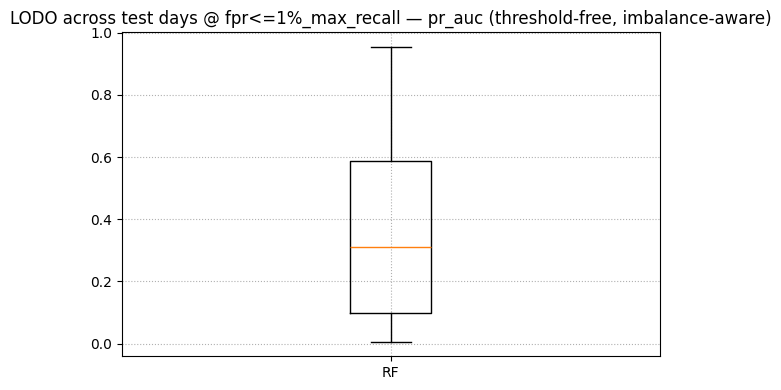

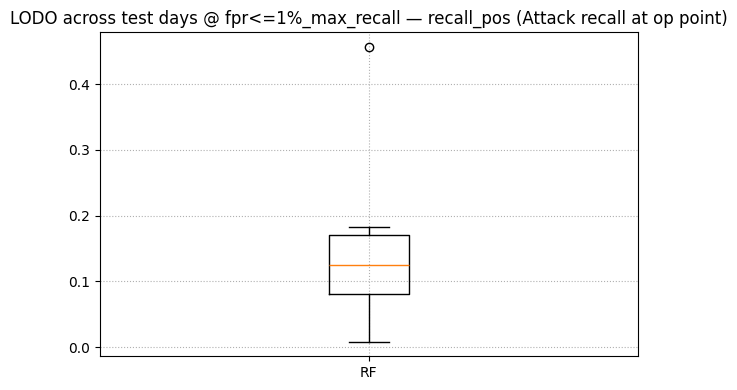

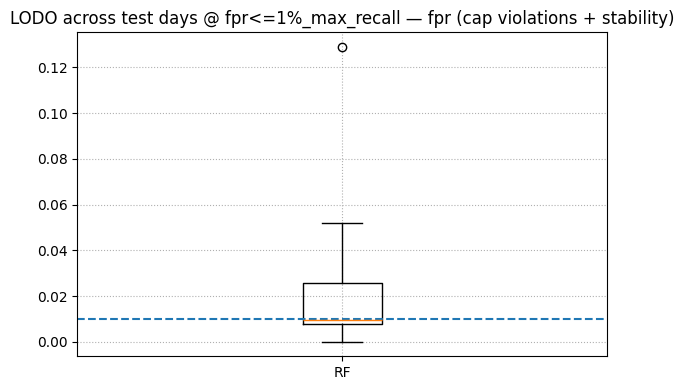

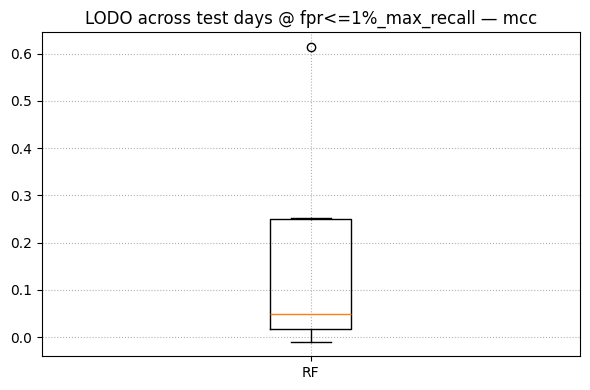


[RF] Representative days (worst + median + best) by pr_auc:


,model,pick,test_day,pr_auc
0,RF,worst,df_parquet_Web1_Thu_22,0.006549
1,RF,median,df_parquet_Infil2_Thu_01,0.272939
2,RF,best,df_parquet_DDoS1_Tue_20,0.954208


[RF] rep_days = ['df_parquet_Web1_Thu_22', 'df_parquet_Infil2_Thu_01', 'df_parquet_DDoS1_Tue_20']

[RF] per-subtype attack recall @A (fpr<=1%_max_recall) for test_day=df_parquet_Web1_Thu_22


,subtype,n,share_of_attacks,tp,fn,recall,test_day,split_mode
0,BruteForce,307,0.900293,39,268,0.127036,df_parquet_Web1_Thu_22,LODO
1,Web,34,0.099707,5,29,0.147059,df_parquet_Web1_Thu_22,LODO



[RF] per-subtype attack recall @A (fpr<=1%_max_recall) for test_day=df_parquet_Infil2_Thu_01


,subtype,n,share_of_attacks,tp,fn,recall,test_day,split_mode
0,Infiltration,62034,1.0,7543,54491,0.121595,df_parquet_Infil2_Thu_01,LODO



[RF] per-subtype attack recall @A (fpr<=1%_max_recall) for test_day=df_parquet_DDoS1_Tue_20


,subtype,n,share_of_attacks,tp,fn,recall,test_day,split_mode
0,DDoS,575364,1.0,95830,479534,0.166555,df_parquet_DDoS1_Tue_20,LODO


[RF] split_mode=LODO Xtr_raw=4,438,375 tune_size_target=30,000 Xt_actual=30,000 unique_days=7
[RF] FINAL fit_cap=300,000  Xfit_actual=300,000


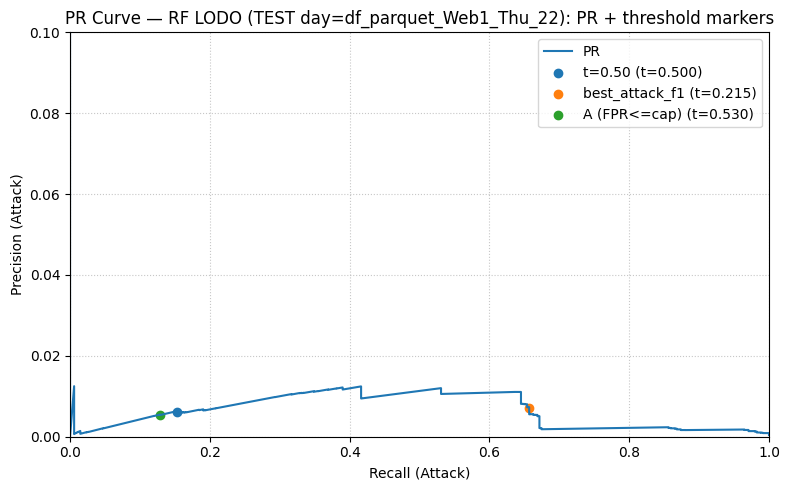

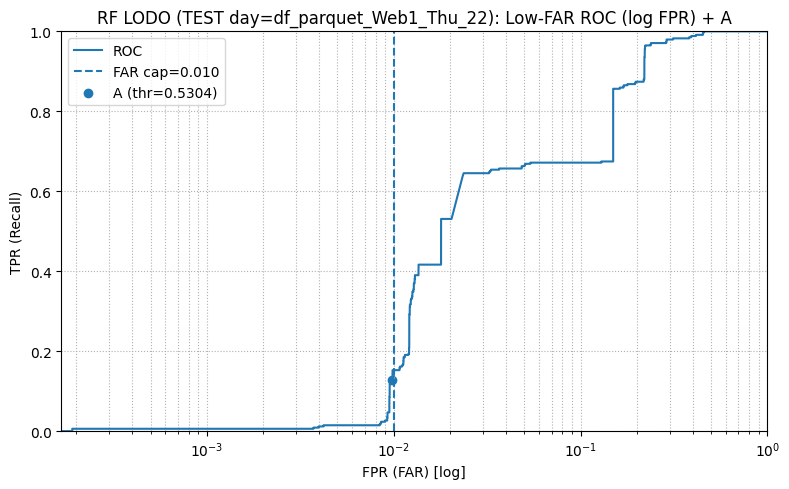

[RF] split_mode=LODO Xtr_raw=5,019,429 tune_size_target=30,000 Xt_actual=30,000 unique_days=7
[RF] FINAL fit_cap=300,000  Xfit_actual=300,000


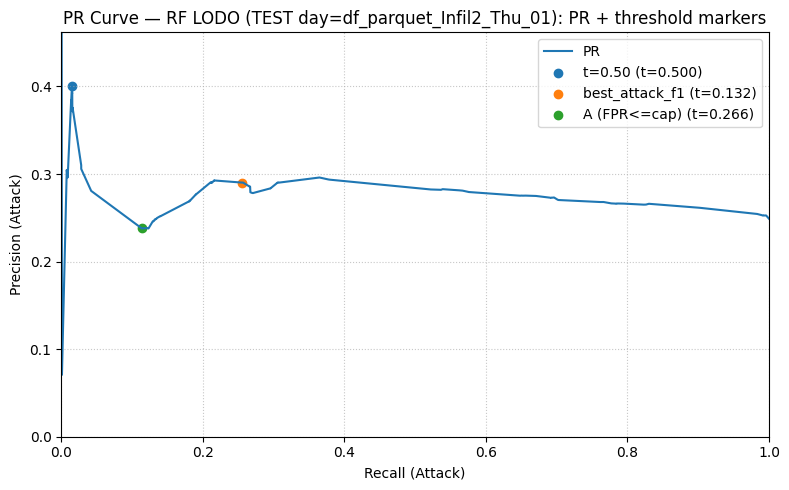

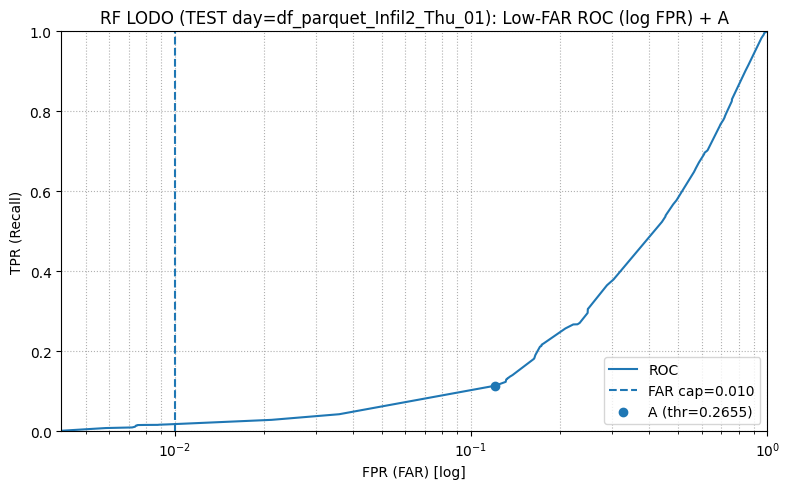

[RF] split_mode=LODO Xtr_raw=4,313,753 tune_size_target=30,000 Xt_actual=30,000 unique_days=7
[RF] FINAL fit_cap=300,000  Xfit_actual=300,000


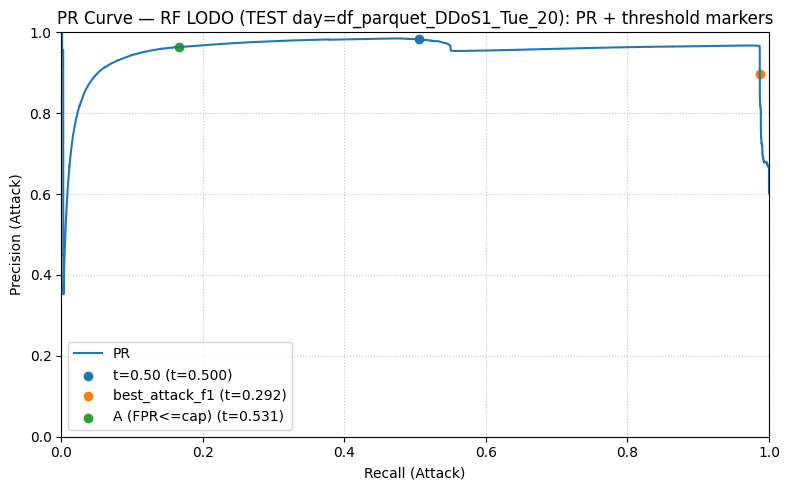

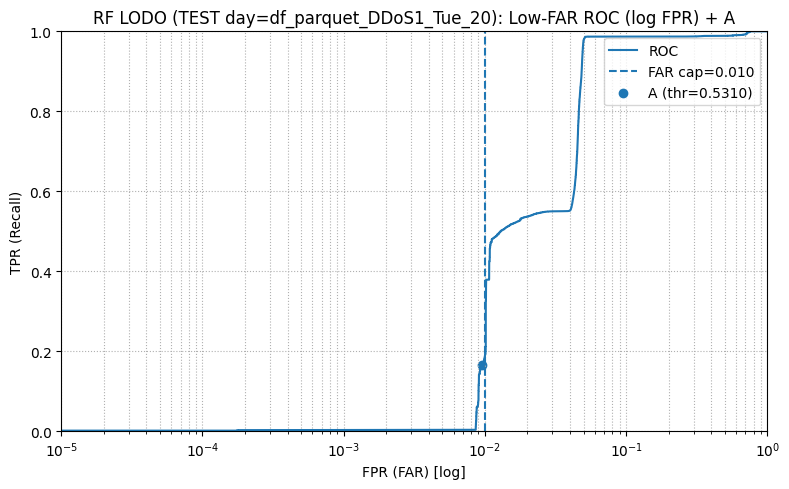

In [160]:
# F) POST-LODO PLOTTING 

MAIN_THR_LABEL = "fpr<=1%_max_recall"
PICK_METRIC = "pr_auc"   # median/worst by pr_auc

# ---------- FILL-IN (change for each model) ----------

MODEL_NAME = "RF"                  # e.g., "KNN", "DT", "ET", "RF"
DF_LODO     = results_rf_lodo       # our LODO results df for this model (ONLY LODO)
RUN_FOLD_FN = run_rf_fold           # the model runner function (must match run_*_fold signature)

KNOBS_FN    = get_rf_mode_knobs
kn = KNOBS_FN("LODO")

RUNNER_KWARGS = dict(
    # keep aligned with our runner signature
    fit_cap_final=None,
    val_eval_cap_final=RF_VAL_EVAL_CAP_FINAL,
    test_eval_cap_final=RF_TEST_EVAL_CAP_FINAL,

    do_calibrate=RF_DO_CALIBRATE,
    cal_method=RF_CAL_METHOD,
    cal_cv=RF_CAL_CV,
    
    # if our runner uses mode knobs (optional; safe because we filter kwargs)
    tune_cap_local=kn["tune_cap"],
    tune_frac_local=kn["tune_frac"],
    cv_splits_local=kn["cv_splits"],
    # n_iter_* key depends on the runner; include it if our runner has it
    n_iter_rf=kn["n_iter"],
)

# ---------- END FILL-IN ----------


# 1) Boxplots across days (ONLY 4 metrics)
plot_lodo_distributions_for_model(
    DF_LODO, model_name=MODEL_NAME,
    thr_label=MAIN_THR_LABEL,
    fpr_cap=MAX_FPR_CAP,
    metrics=("pr_auc", "recall_pos", "fpr", "mcc")
)

# 2) Representative days (worst + median + best)
picks_df, rep_days = pick_best_median_worst_days_for_model(
    DF_LODO,
    model_name=MODEL_NAME,
    thr_label=MAIN_THR_LABEL,
    metric=PICK_METRIC
)
print(f"\n[{MODEL_NAME}] Representative days (worst + median + best) by {PICK_METRIC}:")
display(picks_df)
print(f"[{MODEL_NAME}] rep_days =", rep_days)

# Appendix tables (only worst / median / best days)
if "rf_subtype_lodo_all" in globals() and not rf_subtype_lodo_all.empty:
    for d in rep_days:
        print(f"\n[RF] per-subtype attack recall @A ({MAIN_THR_LABEL}) for test_day={d}")
        df_d = rf_subtype_lodo_all[rf_subtype_lodo_all["test_day"] == d].copy()
        df_d = df_d.sort_values(["n", "recall"], ascending=[False, True]).reset_index(drop=True)
        display(df_d)
else:
    print("\n[RF] No stored per-subtype LODO tables found. Run RF Block E first.")


# 3) Representative-day plots: ONLY PR (+ markers) and Low-FAR ROC (log FPR) + A
replot_representative_days_lodo_minimal(
    model_name=MODEL_NAME,
    rep_days=rep_days,
    run_fold_fn=RUN_FOLD_FN,
    runner_kwargs=RUNNER_KWARGS,
    far_cap=MAX_FPR_CAP,
    thr_label_A="fpr<=1%_max_recall"
)

# END RF PIPELINE   

### 5.d) XGBoost fold runner 

In [161]:
#### XGB PIPELINE ####

# - global knobs: random_state, do_plots, MAX_FPR_CAP
# - split builders: build_fold(...), build_mixed_fold(...)
# - preprocessing: build_preprocessor(...)
# - capping: cap_rows(...), (optional) cap_rows_day_balanced(...)
# - CV helper: get_inner_cv(split_mode, y, groups, default_splits, seed)
# - scoring + eval helpers: get_scores, evaluate_thresholds, log_if_degenerate_scores,
#   pick_threshold_best_attack_f1, pick_threshold_fpr_constrained_max_recall,
#   pick_threshold_recall_target_min_fpr
# - plotting helpers (already from RF/LGBM blocks): plot_pr_curve_with_thresholds, plot_roc_curve,
#   plot_det_curve, plot_score_distribution, plot_roc_curve_linear_with_operating_points,
#   metrics_at_threshold, make_threshold_grid, per_subtype_attack_recall (optional)


# A) XGBoost runtime knobs — mode-specific knobs 

# FAST mode caps (algo test)
XGB_FIT_CAP_FAST        = 150_000
XGB_VAL_EVAL_CAP_FAST   = 200_000
XGB_TEST_EVAL_CAP_FAST  = 200_000

# EVAL caps (final reporting) — keep None for full VAL/TEST if feasible
XGB_VAL_EVAL_CAP_FINAL  = None
XGB_TEST_EVAL_CAP_FINAL = None

# Optional: final refit override (without changing search space)
XGB_N_ESTIMATORS_FINAL = None   # e.g., 1200; keep None to use tuned value

# Optional calibration knobs (default False => no behavior change)
XGB_DO_CALIBRATE = False
XGB_CAL_METHOD   = "sigmoid"
XGB_CAL_CV       = 3

# FULL mode - LODO knobs
XGB_N_ITER_TUNE_LODO   = 10
XGB_TUNE_CAP_LODO      = 30_000
XGB_TUNE_FRAC_LODO     = 0.10
XGB_CV_SPLITS_LODO     = 3
XGB_FIT_CAP_FINAL_LODO = 300_000   # adjust (e.g., 300k–2M)

# FULL mode - MIXED knobs (literature-like)
XGB_N_ITER_TUNE_MIXED   = 30
XGB_TUNE_CAP_MIXED      = 150_000
XGB_TUNE_FRAC_MIXED     = 0.20
XGB_CV_SPLITS_MIXED     = 5
XGB_FIT_CAP_FINAL_MIXED = 1_000_000  # adjust (e.g., 500k–2M)

def get_xgb_mode_knobs(split_mode: str):
    if split_mode == "MIXED":
        return dict(
            cv_splits=XGB_CV_SPLITS_MIXED,
            n_iter=XGB_N_ITER_TUNE_MIXED,
            tune_cap=XGB_TUNE_CAP_MIXED,
            tune_frac=XGB_TUNE_FRAC_MIXED,
            fit_cap_final=XGB_FIT_CAP_FINAL_MIXED,
        )
    # LODO default
    return dict(
        cv_splits=XGB_CV_SPLITS_LODO,
        n_iter=XGB_N_ITER_TUNE_LODO,
        tune_cap=XGB_TUNE_CAP_LODO,
        tune_frac=XGB_TUNE_FRAC_LODO,
        fit_cap_final=XGB_FIT_CAP_FINAL_LODO,
    )


In [162]:
# B) XGB fold runner 
#    - split_mode aware (LODO vs MIXED)
#    - MIXED uses StratifiedKFold via get_inner_cv
#    - MIXED tuning optimizes low-FAR region (safe partial AUC)
#    - NO_CAP operating points for recall targets
#    - artifacts returned for plots/subtype recall
#    - uses GLOBAL random_state (no random_state param)

# shared capping helpers (FIT: day-balanced for LODO; MIXED: cap_rows)
def _cap_for_fit_xgb(X, y, g, cap, split_mode="LODO", seed=None):
    if seed is None:
        seed = random_state
    if cap is None:
        return X, y, g
    if split_mode == "MIXED":
        return cap_rows(X, y, g, cap, seed=seed)
    # LODO
    if "cap_rows_day_balanced" in globals():
        try:
            return cap_rows_day_balanced(X, y, g, cap, seed=seed, min_per_day=1)
        except TypeError:
            return cap_rows_day_balanced(X, y, g, cap, seed=seed)
    return cap_rows(X, y, g, cap, seed=seed)

def _cap_for_eval_xgb(X, y, g, cap, seed=None):
    if seed is None:
        seed = random_state
    return cap_rows(X, y, g, cap, seed=seed)

# safe partial AUC scorer (prevents NaNs due to one-class folds)
def safe_partial_auc(y_true, y_score, max_fpr=0.01):
    try:
        return roc_auc_score(y_true, y_score, max_fpr=max_fpr)
    except TypeError:
        return roc_auc_score(y_true, y_score)
    except ValueError:
        return 0.5

def run_xgb_fold(
    Xtr_raw, ytr, gtr,
    Xva_raw, yva, gva,
    Xte_raw, yte, gte,
    preprocessor,
    model_name="XGB",
    max_fpr_cap=0.01,

    fast_mode=False,
    fit_cap_fast=150_000,
    fit_cap_final=None,
    val_eval_cap_fast=200_000,
    test_eval_cap_fast=200_000,
    val_eval_cap_final=None,
    test_eval_cap_final=None,

    n_estimators_final=None,

    # optional calibration
    do_calibrate=False,
    cal_method="sigmoid",
    cal_cv=3,

    # mode defaults + overrides (mirror LGBM/RF)
    n_iter_xgb=None,
    split_mode="LODO",
    tune_cap_local=None,
    tune_frac_local=None,
    cv_splits_local=None,
):
    rs = random_state  # GLOBAL

    # resolve mode defaults
    kn = get_xgb_mode_knobs(split_mode)

    if fit_cap_final is None:
        fit_cap_final = kn["fit_cap_final"]

    tcap  = int(kn["tune_cap"] if tune_cap_local is None else tune_cap_local)
    tfrac = float(kn["tune_frac"] if tune_frac_local is None else tune_frac_local)
    n_iter_xgb = int(kn["n_iter"] if n_iter_xgb is None else n_iter_xgb)

    # tuning subset (split_mode-aware)
    tune_size = int(min(tcap, max(5_000, tfrac * len(Xtr_raw))))
    Xt, yt, gt = _cap_for_fit_xgb(Xtr_raw, ytr, gtr, cap=tune_size, split_mode=split_mode, seed=rs)

    gt_arr = np.asarray(gt)
    print(
        f"[{model_name}] split_mode={split_mode} Xtr_raw={len(Xtr_raw):,} "
        f"tune_size_target={tune_size:,} Xt_actual={len(Xt):,} "
        f"unique_days={len(np.unique(gt_arr))}"
    )

    # ---------------- FAST MODE ----------------
    if fast_mode:
        Xfit, yfit, gfit = _cap_for_fit_xgb(Xtr_raw, ytr, gtr, cap=fit_cap_fast, split_mode=split_mode, seed=rs)
        print(f"[{model_name}] FAST fit_cap={fit_cap_fast:,}  Xfit_actual={len(Xfit):,}")

        best_pipe = Pipeline(steps=[
            ("prep", preprocessor),
            ("clf", XGBClassifier(
                objective="binary:logistic",
                eval_metric="logloss",
                tree_method="hist",

                n_estimators=300,
                learning_rate=0.10,
                max_depth=6,
                min_child_weight=1.0,
                subsample=0.8,
                colsample_bytree=0.8,
                gamma=0.0,
                reg_alpha=0.0,
                reg_lambda=1.0,
                scale_pos_weight=1.0,

                n_jobs=-1,
                random_state=rs,
                verbosity=0
            ))
        ])
        best_pipe.fit(Xfit, yfit)

        best_params = {
            "FAST_MODE": True,
            "clf__tree_method": "hist",
            "clf__n_estimators": 300,
            "fit_cap_fast": fit_cap_fast,
            "split_mode": split_mode,
            "calibrated": False,
        }
        model = best_pipe

    # ---------------- FULL MODE ----------------
    else:
        spl = int(kn["cv_splits"] if cv_splits_local is None else cv_splits_local)

        cv = get_inner_cv(
            split_mode,
            y=np.asarray(yt).astype(int),
            groups=gt_arr,
            default_splits=spl,
            seed=rs
        )

        if split_mode == "LODO" and len(np.unique(gt_arr)) < 2:
            raise ValueError("Not enough unique day groups in tuning subset for GroupKFold (LODO).")

        # search space
        param_dist = {
            "clf__max_depth": randint(3, 11),
            "clf__min_child_weight": loguniform(0.5, 10.0),

            "clf__subsample": uniform(0.6, 0.4),
            "clf__colsample_bytree": uniform(0.6, 0.4),

            "clf__learning_rate": loguniform(0.01, 0.2),
            "clf__n_estimators": randint(200, 1201),

            "clf__gamma": uniform(0.0, 5.0),
            "clf__reg_alpha": loguniform(1e-8, 1e-1),
            "clf__reg_lambda": loguniform(1e-2, 50.0),

            "clf__scale_pos_weight": loguniform(0.5, 20.0),

            # avoid nested parallelism during CV
            "clf__n_jobs": [1],
        }

        base_pipe = Pipeline(steps=[
            ("prep", preprocessor),
            ("clf", XGBClassifier(
                objective="binary:logistic",
                eval_metric="logloss",
                tree_method="hist",
                random_state=rs,
                n_jobs=1,      # CV-safe
                verbosity=0
            ))
        ])

        # scoring: MIXED optimizes low-FAR region; LODO uses average_precision
        if split_mode == "MIXED":
            scoring_used = make_scorer(safe_partial_auc, needs_proba=True, max_fpr=max_fpr_cap)
        else:
            scoring_used = "average_precision"

        search = RandomizedSearchCV(
            estimator=base_pipe,
            param_distributions=param_dist,
            n_iter=int(n_iter_xgb),
            scoring=scoring_used,
            error_score=0.0,
            cv=cv,
            n_jobs=-1,
            random_state=rs,
            refit=True,
            verbose=0
        )

        # pass groups only in LODO
        if split_mode == "LODO":
            search.fit(Xt, yt, groups=gt_arr)
        else:
            search.fit(Xt, yt)

        # final fit (split_mode-aware capping)
        Xfit, yfit, gfit = _cap_for_fit_xgb(Xtr_raw, ytr, gtr, cap=fit_cap_final, split_mode=split_mode, seed=rs)
        print(f"[{model_name}] FINAL fit_cap={fit_cap_final:,}  Xfit_actual={len(Xfit):,}")

        best_pipe = search.best_estimator_
        best_pipe.set_params(clf__n_jobs=-1)

        if n_estimators_final is not None:
            best_pipe.set_params(clf__n_estimators=int(n_estimators_final))

        best_pipe.fit(Xfit, yfit)

        best_params = dict(search.best_params_)
        best_params["fit_cap_final"] = fit_cap_final
        best_params["split_mode"] = split_mode
        best_params["tune_size"] = tune_size
        best_params["cv_splits"] = int(getattr(cv, "n_splits", spl))
        best_params["n_iter"] = int(n_iter_xgb)
        best_params["scoring_used"] = "partial_auc@max_fpr" if split_mode == "MIXED" else "average_precision"
        if n_estimators_final is not None:
            best_params["n_estimators_final_override"] = int(n_estimators_final)

        # optional calibration (LODO: group-safe; MIXED: stratified)
        model = best_pipe
        best_params["calibrated"] = False

        if do_calibrate:
            if split_mode == "LODO":
                gfit_arr = np.asarray(gfit)
                uniq_days = np.unique(gfit_arr)
                if len(uniq_days) >= 2:
                    cal_splits = min(int(cal_cv), len(uniq_days))
                    gkf = GroupKFold(n_splits=cal_splits)
                    cal_splits_list = list(gkf.split(Xfit, yfit, groups=gfit_arr))

                    cal = CalibratedClassifierCV(
                        estimator=clone(best_pipe),
                        method=cal_method,
                        cv=cal_splits_list
                    )
                    cal.fit(Xfit, yfit)
                    model = cal
                    best_params["calibrated"] = True
                    best_params["cal_method"] = cal_method
                    best_params["cal_cv"] = cal_splits
                else:
                    best_params["calibrated"] = False
                    best_params["calibration_skipped_reason"] = "not_enough_unique_day_groups_in_gfit"
            else:
                skf = StratifiedKFold(n_splits=max(2, int(cal_cv)), shuffle=True, random_state=rs)
                cal = CalibratedClassifierCV(
                    estimator=clone(best_pipe),
                    method=cal_method,
                    cv=skf
                )
                cal.fit(Xfit, yfit)
                model = cal
                best_params["calibrated"] = True
                best_params["cal_method"] = cal_method
                best_params["cal_cv"] = int(cal_cv)

    # ---------------- EVAL CAPS ----------------
    if fast_mode:
        Xva_eval, yva_eval, _ = _cap_for_eval_xgb(Xva_raw, yva, gva, val_eval_cap_fast, seed=rs)
        Xte_eval, yte_eval, _ = _cap_for_eval_xgb(Xte_raw, yte, gte, test_eval_cap_fast, seed=rs)
    else:
        Xva_eval, yva_eval, _ = _cap_for_eval_xgb(Xva_raw, yva, gva, val_eval_cap_final, seed=rs)
        Xte_eval, yte_eval, _ = _cap_for_eval_xgb(Xte_raw, yte, gte, test_eval_cap_final, seed=rs)

    # ---------------- THRESHOLD TUNING ON VAL ----------------
    score_va = get_scores(model, Xva_eval)
    if "log_if_degenerate_scores" in globals():
        log_if_degenerate_scores(score_va, model_name, split_name="VAL")

    t_f1, _ = pick_threshold_best_attack_f1(yva_eval, score_va)
    t_fpr = pick_threshold_fpr_constrained_max_recall(yva_eval, score_va, max_fpr=max_fpr_cap)
    t_r95 = pick_threshold_recall_target_min_fpr(yva_eval, score_va, recall_target=0.95, max_fpr=max_fpr_cap)
    t_r98 = pick_threshold_recall_target_min_fpr(yva_eval, score_va, recall_target=0.98, max_fpr=max_fpr_cap)

    # diagnostics (NO CAP)
    t_r95_any = pick_threshold_recall_target_min_fpr(yva_eval, score_va, recall_target=0.95, max_fpr=1.0)
    t_r98_any = pick_threshold_recall_target_min_fpr(yva_eval, score_va, recall_target=0.98, max_fpr=1.0)

    thresholds = {
        "t=0.50": 0.50,
        "best_attack_f1": t_f1,
        "fpr<=1%_max_recall": t_fpr,
        "recall>=0.95_min_fpr": t_r95,
        "recall>=0.98_min_fpr": t_r98,
        "recall>=0.95_min_fpr_NO_CAP": t_r95_any,
        "recall>=0.98_min_fpr_NO_CAP": t_r98_any,
    }
    feas = {k: (v is not None) for k, v in thresholds.items()}
    thresholds_valid = {k: v for k, v in thresholds.items() if v is not None}

    # realized FPR at FAR-capped threshold (VAL)
    t_fpr_sel = thresholds.get("fpr<=1%_max_recall", None)
    if t_fpr_sel is not None:
        yhat_val = (score_va >= t_fpr_sel).astype(int)
        tn, fp, fn, tp = confusion_matrix(yva_eval, yhat_val, labels=[0, 1]).ravel()
        best_params["val_fpr_realized_at_fpr1_thr"] = float(fp / (fp + tn + 1e-12))
    else:
        best_params["val_fpr_realized_at_fpr1_thr"] = None

    # ---------------- EVALUATE ON TEST ----------------
    score_te = get_scores(model, Xte_eval)
    if "log_if_degenerate_scores" in globals():
        log_if_degenerate_scores(score_te, model_name, split_name="TEST")

    if t_fpr_sel is not None:
        yhat_te = (score_te >= t_fpr_sel).astype(int)
        tn, fp, fn, tp = confusion_matrix(yte_eval, yhat_te, labels=[0, 1]).ravel()
        best_params["test_fpr_realized_at_fpr1_thr"] = float(fp / (fp + tn + 1e-12))
    else:
        best_params["test_fpr_realized_at_fpr1_thr"] = None

    df = evaluate_thresholds(yte_eval, score_te, thresholds_valid, name=model_name)

    # optional automatic plots
    if do_plots:
        plot_pr_curve_with_thresholds(yte_eval, score_te, thresholds_valid, model_name=model_name)
        plot_roc_curve(yte_eval, score_te, model_name=model_name)
        plot_det_curve(yte_eval, score_te, model_name=model_name)
        plot_score_distribution(yte_eval, score_te, model_name=model_name, bins=100)

    # artifacts for MIXED plotting + subtype recall
    feas["__artifacts__"] = {"score_te": score_te, "yte_eval": yte_eval}

    return df, best_params, thresholds, feas


In [ ]:
# C) XGB algo test cell — runs one LODO day + one MIXED run in FAST mode

RUN_MODELS["XGB"] = True
ALGO_TEST_DAY = TEST_DAYS[0]
print("Algo test day:", ALGO_TEST_DAY)

old_do_plots = do_plots
do_plots = False

# ---------- LODO algo test ----------
split_mode = "LODO"
kn = get_xgb_mode_knobs(split_mode)

Xtr_raw, ytr, gtr, Xva_raw, yva, gva, Xte_raw, yte, gte, meta = build_fold(
    registry=REGISTRY, val_days=VAL_DAYS, test_day=ALGO_TEST_DAY
)
preprocessor, prep_dbg = build_preprocessor(Xtr_raw, meta["feature_cols"])
print("LODO preprocessor debug:", prep_dbg)

if RUN_MODELS.get("XGB", False):
    xgb_df, xgb_best_params, xgb_thresholds, xgb_feas = run_xgb_fold(
        Xtr_raw, ytr, gtr,
        Xva_raw, yva, gva,
        Xte_raw, yte, gte,
        preprocessor,
        model_name="XGB",
        fast_mode=True,
        fit_cap_fast=XGB_FIT_CAP_FAST,
        val_eval_cap_fast=XGB_VAL_EVAL_CAP_FAST,
        test_eval_cap_fast=XGB_TEST_EVAL_CAP_FAST,
        max_fpr_cap=MAX_FPR_CAP,
        split_mode=split_mode,

        # keep knobs consistent even if FAST doesn’t use them
        n_iter_xgb=kn["n_iter"],
        tune_cap_local=kn["tune_cap"],
        tune_frac_local=kn["tune_frac"],
        cv_splits_local=kn["cv_splits"],

        do_calibrate=XGB_DO_CALIBRATE,
        cal_method=XGB_CAL_METHOD,
        cal_cv=XGB_CAL_CV,
    )
    print("XGB (LODO) best params:", xgb_best_params)
    print("XGB (LODO) thresholds:", xgb_thresholds)
    print("XGB (LODO) feasibility:", {k:v for k,v in xgb_feas.items() if k != "__artifacts__"})
    display(xgb_df)

# ---------- MIXED algo test ----------
split_mode = "MIXED"
kn = get_xgb_mode_knobs(split_mode)

Xtr_raw_m, ytr_m, gtr_m, Xva_raw_m, yva_m, gva_m, Xte_raw_m, yte_m, gte_m, meta_m = build_mixed_fold(
    registry=REGISTRY,
    seed=MIXED_RANDOM_STATE,
    test_size=MIXED_TEST_SIZE,
    val_size=MIXED_VAL_SIZE,
    use_rare_injection=MIXED_USE_RARE_ALLOCATION,
    rare_subtypes=RARE_SUBTYPES,
    rare_n_test=RARE_N_TEST_PER_SUBTYPE,
    rare_n_val=RARE_N_VAL_PER_SUBTYPE,
)
preprocessor_m, prep_dbg_m = build_preprocessor(Xtr_raw_m, meta_m["feature_cols"])
print("MIXED preprocessor debug:", prep_dbg_m)

if RUN_MODELS.get("XGB", False):
    xgb_df_m_fast, xgb_best_params_m_fast, xgb_thresholds_m_fast, xgb_feas_m_fast = run_xgb_fold(
        Xtr_raw_m, ytr_m, gtr_m,
        Xva_raw_m, yva_m, gva_m,
        Xte_raw_m, yte_m, gte_m,
        preprocessor_m,
        model_name="XGB",
        fast_mode=True,
        fit_cap_fast=XGB_FIT_CAP_FAST,
        val_eval_cap_fast=XGB_VAL_EVAL_CAP_FAST,
        test_eval_cap_fast=XGB_TEST_EVAL_CAP_FAST,
        max_fpr_cap=MAX_FPR_CAP,
        split_mode=split_mode,

        n_iter_xgb=kn["n_iter"],
        tune_cap_local=kn["tune_cap"],
        tune_frac_local=kn["tune_frac"],
        cv_splits_local=kn["cv_splits"],

        do_calibrate=XGB_DO_CALIBRATE,
        cal_method=XGB_CAL_METHOD,
        cal_cv=XGB_CAL_CV,
    )
    print("XGB (MIXED) best params:", xgb_best_params_m_fast)
    print("XGB (MIXED) thresholds:", xgb_thresholds_m_fast)
    print("XGB (MIXED) feasibility:", {k:v for k,v in xgb_feas_m_fast.items() if k != "__artifacts__"})
    display(xgb_df_m_fast)

do_plots = old_do_plots


MIXED preprocessor debug: {'log1p_cols': ['Active Mean', 'Active Std', 'Bwd IAT Total', 'Bwd IAT Min', 'Packet Length Variance', 'Packet Length Min', 'Bwd Packets/s', 'Down/Up Ratio', 'FIN Flag Count', 'Flow Bytes/s', 'Flow IAT Std', 'Fwd IAT Min', 'Fwd IAT Std', 'Fwd Packet Length Std', 'Fwd Packets/s', 'Fwd URG Flags', 'Idle Min', 'RST Flag Count', 'SYN Flag Count', 'URG Flag Count'], 'scale_cols': ['ACK Flag Count', 'Init Bwd Win Bytes', 'Init Fwd Win Bytes', 'PSH Flag Count'], 'has_protocol': True}
MIXED shapes: (4661671, 25) (665954, 25) (1331907, 25)
MIXED n_features: 25
[XGB] split_mode=MIXED Xtr_raw=4,661,671 tune_size_target=150,000 Xt_actual=150,000 unique_days=10
[XGB] FINAL fit_cap=1,000,000  Xfit_actual=1,000,000


c:\Users\ilefas\AppData\Local\miniconda3\envs\venv_finalproject\Lib\site-packages\xgboost\training.py:199: UserWarning: [07:12:55] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:790: 
Parameters: { "scale_pos_weight" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


,stage2_skipped,n_train_attacks,n_test_attacks,n_classes,classes,oracle_n_test_classes,oracle_macro_f1,oracle_weighted_f1,oracle_acc,oracle_bacc,gated_available,gate_thr,n_flagged_total,n_tp_attacks,gated_macro_f1_tp,joint_correct_rate,model,split_mode,test_day
0,False,931366,266105,6,"[Bot, BruteForce, DDoS, DoS, Infiltration, OTHER]",6,0.831348,0.998547,0.99864,0.831473,True,0.694704,257032,246181,0.829601,0.924462,XGB,MIXED,MIXED


XGB attack type stage 2 result: {'stage2_skipped': False, 'n_train_attacks': 931366, 'n_test_attacks': 266105, 'n_classes': 6, 'classes': ['Bot', 'BruteForce', 'DDoS', 'DoS', 'Infiltration', 'OTHER'], 'oracle_n_test_classes': 6, 'oracle_macro_f1': 0.8313478698637042, 'oracle_weighted_f1': 0.9985469282416016, 'oracle_acc': 0.9986396347306514, 'oracle_bacc': 0.8314731313169239, 'gated_available': True, 'gate_thr': 0.6947041200101371, 'n_flagged_total': 257032, 'n_tp_attacks': 246181, 'gated_macro_f1_tp': 0.8296007612255566, 'joint_correct_rate': 0.9244621484000677, 'model': 'XGB', 'split_mode': 'MIXED', 'test_day': 'MIXED'}

=== MIXED (XGB): best_params ===
{'clf__colsample_bytree': np.float64(0.749816047538945), 'clf__gamma': np.float64(4.75357153204958), 'clf__learning_rate': np.float64(0.08960785365368121), 'clf__max_depth': 7, 'clf__min_child_weight': np.float64(2.988752571180128), 'clf__n_estimators': 321, 'clf__n_jobs': 1, 'clf__reg_alpha': np.float64(1.23583827723069e-07), 'clf__r

,thr,tn,fp,fn,tp,precision_pos,recall_pos,f1_pos,macro_f1,fpr,fnr,mcc,balanced_acc,roc_auc,pr_auc,model,thr_label,test_day,split_mode
0,0.500000,1010089,55713,13624,252481,0.819227,0.948802,0.879267,0.923042,0.052273,0.051198,0.850017,0.948264,0.989625,0.976753,XGB,t=0.50,MIXED,MIXED
1,0.894578,1064760,1042,23003,243102,0.995732,0.913557,0.952876,0.970855,0.000978,0.086443,0.943073,0.956290,0.989625,0.976753,XGB,best_attack_f1,MIXED,MIXED
2,0.694704,1054951,10851,19924,246181,0.957783,0.925127,0.941172,0.963398,0.010181,0.074873,0.927017,0.957473,0.989625,0.976753,XGB,fpr<=1%_max_recall,MIXED,MIXED
3,0.477152,1003446,62356,12986,253119,0.802342,0.951200,0.870453,0.917135,0.058506,0.048800,0.839548,0.946347,0.989625,0.976753,XGB,recall>=0.95_min_fpr_NO_CAP,MIXED,MIXED
4,0.266347,851447,214355,5150,260955,0.549021,0.980647,0.703938,0.794877,0.201121,0.019353,0.650607,0.889763,0.989625,0.976753,XGB,recall>=0.98_min_fpr_NO_CAP,MIXED,MIXED



Total time elapsed for XGB MIXED-only run: 50.80 minutes

[XGB MIXED] Operating points (TEST)


,label,thr,fpr,recall,precision,f1,tn,fp,fn,tp
0,best_attack_f1,0.894578,0.000978,0.913557,0.995732,0.952876,1064760,1042,23003,243102
1,A (FPR<=1%),0.694704,0.010181,0.925127,0.957783,0.941172,1054951,10851,19924,246181
2,t=0.50,0.500000,0.052273,0.948802,0.819227,0.879267,1010089,55713,13624,252481
3,B (Recall>=0.95 NO CAP),0.477152,0.058506,0.951200,0.802342,0.870453,1003446,62356,12986,253119
4,C (Recall>=0.98),0.266347,0.201121,0.980647,0.549021,0.703938,851447,214355,5150,260955


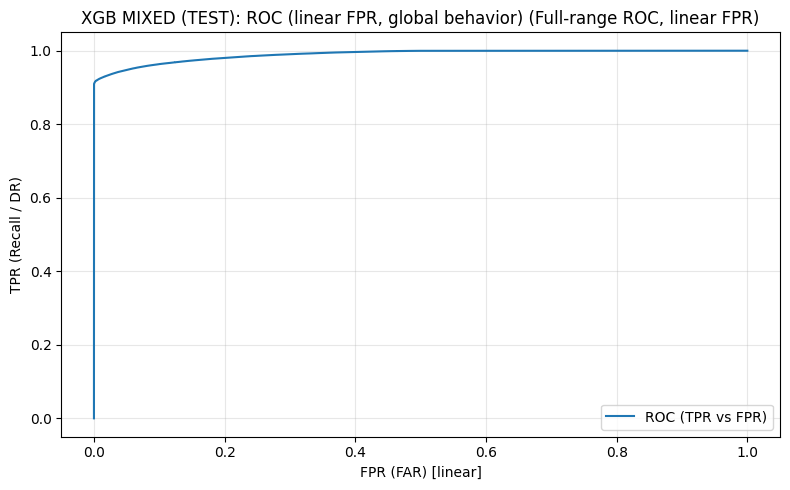

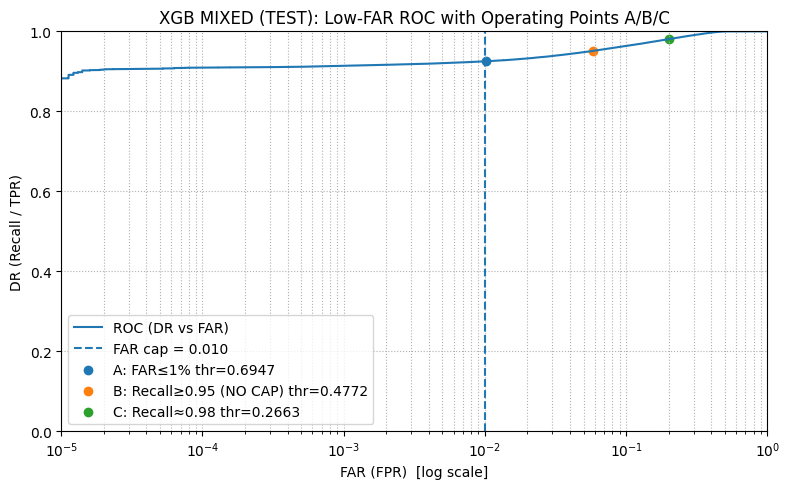

Operating Point A (FAR capped): {'thr': 0.6947041200101371, 'tn': 1054951, 'fp': 10851, 'fn': 19924, 'tp': 246181, 'precision_pos': 0.957783466650067, 'recall_pos': 0.9251272993743072, 'f1_pos': 0.9411721977225851, 'macro_f1': 0.9633979523076556, 'fpr': 0.01018106552624221, 'fnr': 0.07487270062569286, 'mcc': 0.9270171695664753, 'balanced_acc': 0.9574731169240325}
Operating Point B (Recall>=0.95 NO CAP): {'thr': 0.4771516804993153, 'tn': 1003446, 'fp': 62356, 'fn': 12986, 'tp': 253119, 'precision_pos': 0.8023424994056582, 'recall_pos': 0.9511997143984517, 'f1_pos': 0.8704529041576395, 'macro_f1': 0.917134825489301, 'fpr': 0.058506176569381556, 'fnr': 0.04880028560154826, 'mcc': 0.839548006264372, 'balanced_acc': 0.9463467689145351}
FAR cost multiplier (B vs A): 5.75x
Operating Point C (Recall≈0.98): {'thr': 0.2663469910621643, 'tn': 851447, 'fp': 214355, 'fn': 5150, 'tp': 260955, 'precision_pos': 0.5490206391618102, 'recall_pos': 0.9806467371902069, 'f1_pos': 0.7039377406715537, 'macro_

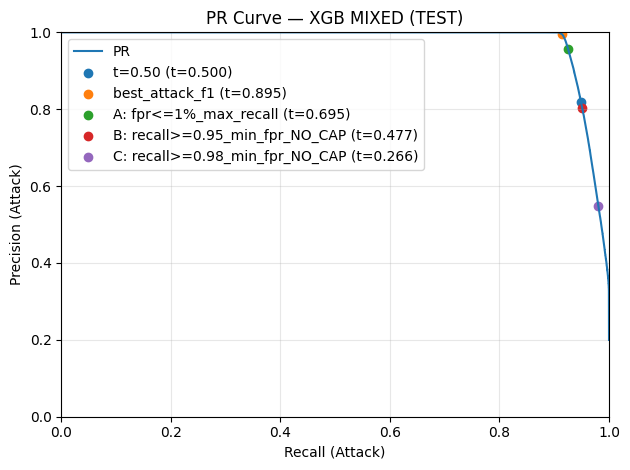

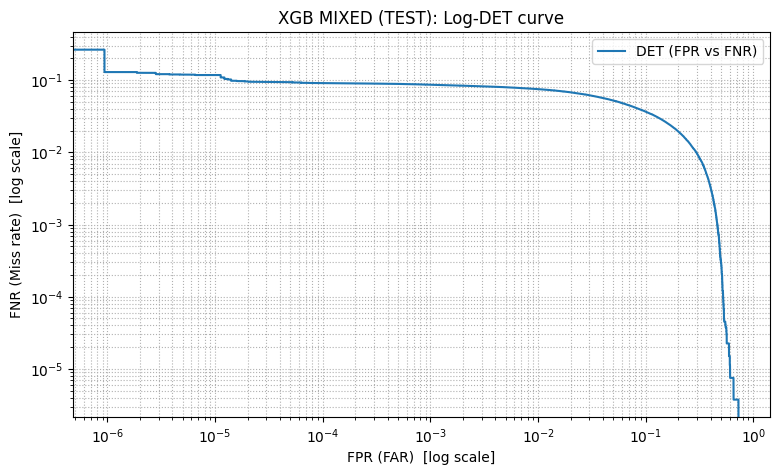

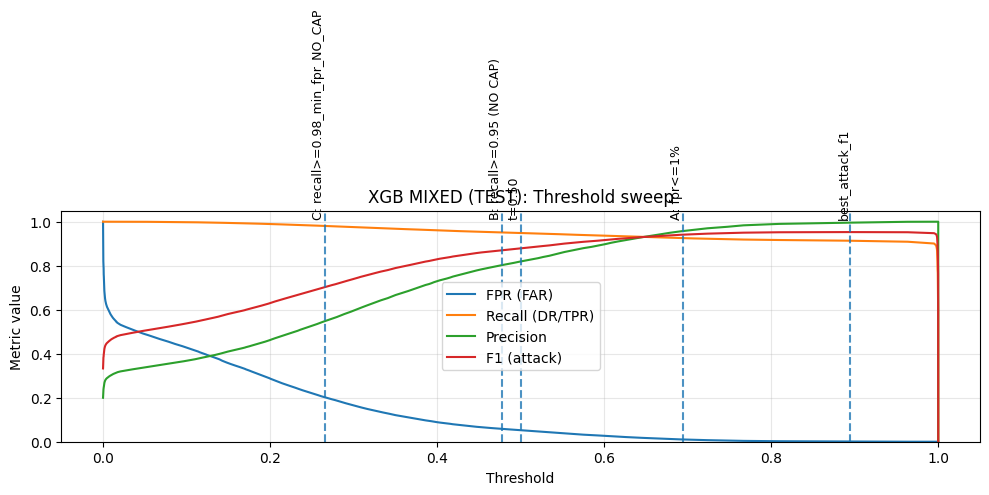

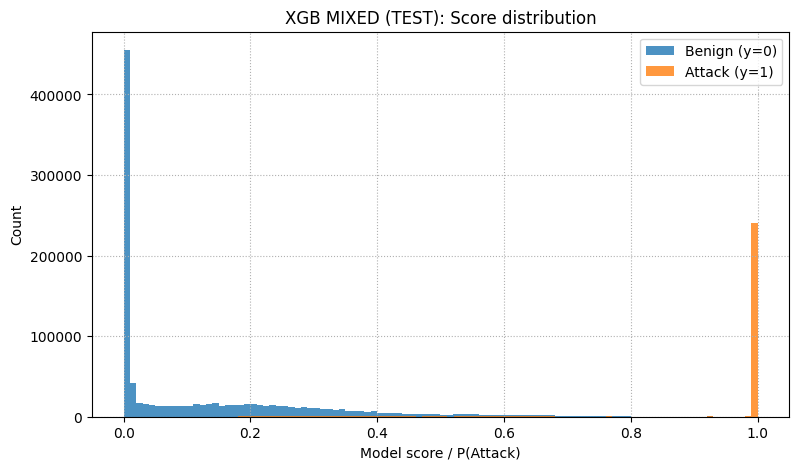


=== MIXED (XGB): per-subtype attack recall @ Operating Point A (fpr<=1%) ===


,subtype,n,share_of_attacks,tp,fn,recall
0,DDoS,155400,0.583980,155400,0,1.000000
1,DoS,39179,0.147231,39135,44,0.998877
2,Bot,28902,0.108611,28780,122,0.995779
3,Infiltration,23508,0.088341,3838,19670,0.163264
4,BruteForce,19066,0.071648,18988,78,0.995909
5,Web,50,0.000188,40,10,0.800000


In [163]:
# D) XGB outer loop (MIXED ONLY) + display results + required plots for MIXED mode
#    NOTE: this block produces xgb_*_m variables that Block H will APPEND (no recompute).

RUN_MODELS["XGB"] = True

START_TIME = time.time()
old_do_plots = do_plots
do_plots = False  # plot manually in this cell

split_mode = "MIXED"
kn = get_xgb_mode_knobs(split_mode)

Xtr_raw_m, ytr_m, gtr_m, Xva_raw_m, yva_m, gva_m, Xte_raw_m, yte_m, gte_m, meta_m = build_mixed_fold(
    registry=REGISTRY,
    seed=MIXED_RANDOM_STATE,
    test_size=MIXED_TEST_SIZE,
    val_size=MIXED_VAL_SIZE,
    use_rare_injection=MIXED_USE_RARE_ALLOCATION,
    rare_subtypes=RARE_SUBTYPES,
    rare_n_test=RARE_N_TEST_PER_SUBTYPE,
    rare_n_val=RARE_N_VAL_PER_SUBTYPE,
)

preprocessor_m, prep_dbg_m = build_preprocessor(Xtr_raw_m, meta_m["feature_cols"])
print("MIXED preprocessor debug:", prep_dbg_m)
print("MIXED shapes:", Xtr_raw_m.shape, Xva_raw_m.shape, Xte_raw_m.shape)
print("MIXED n_features:", len(meta_m["feature_cols"]))

xgb_df_m, xgb_best_params_m, xgb_thresholds_m, xgb_feas_m = run_xgb_fold(
    Xtr_raw_m, ytr_m, gtr_m,
    Xva_raw_m, yva_m, gva_m,
    Xte_raw_m, yte_m, gte_m,
    preprocessor_m,
    model_name="XGB",
    fast_mode=False,

    fit_cap_final=None,  # default from mode knobs
    val_eval_cap_final=XGB_VAL_EVAL_CAP_FINAL,
    test_eval_cap_final=XGB_TEST_EVAL_CAP_FINAL,
    max_fpr_cap=MAX_FPR_CAP,

    n_estimators_final=XGB_N_ESTIMATORS_FINAL,

    do_calibrate=XGB_DO_CALIBRATE,
    cal_method=XGB_CAL_METHOD,
    cal_cv=XGB_CAL_CV,

    n_iter_xgb=None,
    tune_cap_local=kn["tune_cap"],
    tune_frac_local=kn["tune_frac"],
    cv_splits_local=kn["cv_splits"],
    split_mode=split_mode,
)

# diagnostics: check if we got artifacts needed for plots/subtype recall before proceeding to stage 2
xgb_attacktype_m = None
if DO_ATTACKTYPE_STAGE2:
    art = xgb_feas_m.get("__artifacts__", {})
    score_te_m = art.get("score_te", None)
    thr_main_m = xgb_thresholds_m.get(MAIN_THR_LABEL, None)

    xgb_attacktype_m = run_attacktype_stage2(
        model_key="XGB",
        preprocessor=preprocessor_m,
        Xtr_raw=Xtr_raw_m, ytr=ytr_m, label_raw_train=meta_m["label_raw_train"],
        Xte_raw=Xte_raw_m, yte=yte_m, label_raw_test=meta_m["label_raw_test"],
        gate_scores_te=score_te_m, gate_thr=thr_main_m,
        base_best_params=xgb_best_params_m,
        min_count=ATTACKTYPE_MIN_COUNT,
        rare_set=RARE_SUBTYPES,
        other_label=ATTACKTYPE_OTHER_LABEL,
    )
    xgb_attacktype_m.update({"model": "XGB", "split_mode": "MIXED", "test_day": "MIXED"})
    display(pd.DataFrame([xgb_attacktype_m]))
print("XGB attack type stage 2 result:", xgb_attacktype_m)


xgb_df_m = xgb_df_m.copy()
xgb_df_m["test_day"] = "MIXED"
xgb_df_m["split_mode"] = "MIXED"

print("\n=== MIXED (XGB): best_params ===")
print(xgb_best_params_m)

print("\n=== MIXED (XGB): thresholds (picked on VAL) ===")
print(xgb_thresholds_m)

print("\n=== MIXED (XGB): feasibility ===")
print({k: v for k, v in xgb_feas_m.items() if k != "__artifacts__"})

display(xgb_df_m)

elapsed = time.time() - START_TIME
print(f"\nTotal time elapsed for XGB MIXED-only run: {elapsed/60:.2f} minutes")

# -------------------- REQUIRED PLOTS / MIXED SPLIT ONLY --------------------
art = xgb_feas_m.get("__artifacts__", {})
yte_eval_m = art.get("yte_eval", None)
score_te_m = art.get("score_te", None)

if yte_eval_m is not None and score_te_m is not None:

    thr_A = xgb_thresholds_m.get("fpr<=1%_max_recall", None)
    thr_B = xgb_thresholds_m.get("recall>=0.95_min_fpr_NO_CAP", None)
    thr_C, thr_C_label = _select_r98_threshold_for_plot(xgb_thresholds_m)

    # Operating points table (TEST)
    op_table_dict = {
        "t=0.50": xgb_thresholds_m.get("t=0.50"),
        "best_attack_f1": xgb_thresholds_m.get("best_attack_f1"),
        "A (FPR<=1%)": thr_A,
        "B (Recall>=0.95 NO CAP)": thr_B,
        "C (Recall>=0.98)": thr_C,
    }
    print_operating_points_table(
        yte_eval_m, score_te_m,
        thresholds_dict=op_table_dict,
        model_name="XGB MIXED",
        sort_by="fpr"
    )

    # 1) Linear ROC (global behavior) — NO markers
    plot_roc_curve_linear_with_operating_points(
        yte_eval_m, score_te_m,
        thresholds_dict={},
        model_name="XGB MIXED (TEST): ROC (linear FPR, global behavior)"
    )

    # 2) Low-FAR ROC with Operating Points A/B/C
    if thr_A is not None:
        plot_low_far_roc_with_ops(
            yte_eval_m, score_te_m,
            thr_A=thr_A,
            thr_B=(thr_B if thr_B is not None else None),
            thr_C=(thr_C if thr_C is not None else None),
            far_cap=MAX_FPR_CAP,
            title="XGB MIXED (TEST): Low-FAR ROC with Operating Points A/B/C"
        )

    # 3) PR curve with thresholds marked
    thr_dict_for_pr = {
        "t=0.50": xgb_thresholds_m.get("t=0.50"),
        "best_attack_f1": xgb_thresholds_m.get("best_attack_f1"),
        "A: fpr<=1%_max_recall": xgb_thresholds_m.get("fpr<=1%_max_recall"),
        "B: recall>=0.95_min_fpr_NO_CAP": xgb_thresholds_m.get("recall>=0.95_min_fpr_NO_CAP"),
    }
    if thr_C is not None:
        thr_dict_for_pr[f"C: {thr_C_label}"] = thr_C

    plot_pr_curve_with_thresholds(
        yte_eval_m, score_te_m,
        thr_dict_for_pr,
        model_name="XGB MIXED (TEST)"
    )

    # 4) Log-DET
    plot_det(
        yte_eval_m, score_te_m,
        title="XGB MIXED (TEST): Log-DET curve"
    )

    # 5) Threshold sweep (TEST) with vertical lines
    thr_dict_for_sweep = {
        "t=0.50": xgb_thresholds_m.get("t=0.50"),
        "best_attack_f1": xgb_thresholds_m.get("best_attack_f1"),
        "A: fpr<=1%": xgb_thresholds_m.get("fpr<=1%_max_recall"),
        "B: recall>=0.95 (NO CAP)": xgb_thresholds_m.get("recall>=0.95_min_fpr_NO_CAP"),
    }
    if thr_C is not None:
        thr_dict_for_sweep[f"C: {thr_C_label}"] = thr_C

    plot_threshold_sweep_metrics(
        yte_eval_m, score_te_m,
        thresholds_dict=thr_dict_for_sweep,
        model_name="XGB MIXED"
    )

    # 6) Score distribution
    plot_score_hist(
        yte_eval_m, score_te_m,
        title="XGB MIXED (TEST): Score distribution",
        bins=100
    )

    # 7) Per-subtype recall @ Operating Point A
    label_raw_test = None
    if "meta_m" in globals():
        label_raw_test = meta_m.get("label_raw_test", None)

    if ("per_subtype_attack_recall" in globals()
    and "map_array_to_coarse" in globals()
    and thr_A is not None
    and label_raw_test is not None):
        subtype_df = per_subtype_attack_recall(
            y_true=np.asarray(yte_eval_m),
            y_score=np.asarray(score_te_m),
            thr=float(thr_A),
            label_raw=map_array_to_coarse(np.asarray(label_raw_test)),
        )
    print("\n=== MIXED (XGB): per-subtype attack recall @ Operating Point A (fpr<=1%) ===")
    display(subtype_df)


do_plots = old_do_plots


In [164]:
# E) XGB outer loop (LODO) + aggregation with MIXED (UPDATED)
#    LODO outer loop across TEST_DAYS + append the already-run MIXED result from Block G (NO recompute)

do_plots_loop = False
old_do_plots = do_plots
do_plots = do_plots_loop

MAIN_THR_LABEL = "fpr<=1%_max_recall"
subtype_rows = []       # per-day per-subtype tables (do NOT display inside loop)
all_rows = []
attacktype_rows = []    # optional, only if DO_ATTACKTYPE_STAGE2 is True and produces results
best_params_log = []
feas_rows = []


# ---------- LODO loop ----------
START_TIME = time.time()
RUN_MODELS["XGB"] = True

for test_day in TEST_DAYS:
    Xtr_raw, ytr, gtr, Xva_raw, yva, gva, Xte_raw, yte, gte, meta = build_fold(
        registry=REGISTRY, val_days=VAL_DAYS, test_day=test_day
    )
    preprocessor, prep_dbg = build_preprocessor(Xtr_raw, meta["feature_cols"])

    if RUN_MODELS.get("XGB", False):
        split_mode = "LODO"
        kn = get_xgb_mode_knobs(split_mode)

        xgb_df, xgb_best_params, xgb_thresholds, xgb_feas = run_xgb_fold(
            Xtr_raw, ytr, gtr,
            Xva_raw, yva, gva,
            Xte_raw, yte, gte,
            preprocessor,
            model_name="XGB",
            fast_mode=False,

            fit_cap_final=None,  # default from mode knobs
            val_eval_cap_final=XGB_VAL_EVAL_CAP_FINAL,
            test_eval_cap_final=XGB_TEST_EVAL_CAP_FINAL,
            n_estimators_final=XGB_N_ESTIMATORS_FINAL,
            max_fpr_cap=MAX_FPR_CAP,

            n_iter_xgb=kn["n_iter"],
            tune_cap_local=kn["tune_cap"],
            tune_frac_local=kn["tune_frac"],
            cv_splits_local=kn["cv_splits"],
            split_mode=split_mode,

            do_calibrate=XGB_DO_CALIBRATE,
            cal_method=XGB_CAL_METHOD,
            cal_cv=XGB_CAL_CV,
        )

        # Optional: run attack type stage 2 per day
        if DO_ATTACKTYPE_STAGE2:
            art = xgb_feas.get("__artifacts__", {})
            score_te = art.get("score_te", None)
            thr_main = xgb_thresholds.get(MAIN_THR_LABEL, None)

            r = run_attacktype_stage2(
                model_key="XGB",
                preprocessor=preprocessor,
                Xtr_raw=Xtr_raw, ytr=ytr, label_raw_train=meta["label_raw_train"],
                Xte_raw=Xte_raw, yte=yte, label_raw_test=meta["label_raw_test"],
                gate_scores_te=score_te, gate_thr=thr_main,
                base_best_params=xgb_best_params,
                min_count=ATTACKTYPE_MIN_COUNT,
                rare_set=RARE_SUBTYPES,
                other_label=ATTACKTYPE_OTHER_LABEL,
            )
            r.update({"model": "XGB", "split_mode": "LODO", "test_day": test_day})
            attacktype_rows.append(r)
            print(f"XGB attack type stage 2 result for test_day={test_day}:", r)

        # Collect per-subtype recall @ Operating Point A (NO printing)
        art = xgb_feas.get("__artifacts__", {})
        score_te = art.get("score_te", None)
        thr_A = xgb_thresholds.get(MAIN_THR_LABEL, None)

        if (score_te is not None) and (thr_A is not None) and ("label_raw_test" in meta) and ("map_array_to_coarse" in globals()):
            df_sub = per_subtype_attack_recall(
                y_true=np.asarray(yte),
                y_score=np.asarray(score_te),
                thr=float(thr_A),
                label_raw=map_array_to_coarse(np.asarray(meta["label_raw_test"])),
            )
            df_sub["test_day"] = test_day
            df_sub["split_mode"] = "LODO"
            subtype_rows.append(df_sub)


        xgb_df = xgb_df.copy()
        xgb_df["test_day"] = test_day
        xgb_df["split_mode"] = "LODO"
        all_rows.append(xgb_df)

        best_params_log.append({
            "model": "XGB",
            "test_day": test_day,
            "split_mode": "LODO",
            "best_params": xgb_best_params
        })

        for lbl in ["fpr<=1%_max_recall", "recall>=0.95_min_fpr", "recall>=0.98_min_fpr"]:
            feas_rows.append({
                "model": "XGB",
                "test_day": test_day,
                "split_mode": "LODO",
                "thr_label": lbl,
                "feasible": bool(xgb_feas.get(lbl, False))
            })

if not all_rows:
    print("No rows collected. Check RUN_MODELS and loop execution.")
    do_plots = old_do_plots
    raise SystemExit

results_xgb_lodo = pd.concat(all_rows, ignore_index=True)


# Pooled per-subtype recall across LODO days (MAIN section)
if subtype_rows:
    xgb_subtype_lodo_all = pd.concat(subtype_rows, ignore_index=True)

    xgb_subtype_lodo_pooled = (
        xgb_subtype_lodo_all
        .groupby("subtype", as_index=False)
        .agg(n=("n", "sum"), tp=("tp", "sum"), fn=("fn", "sum"))
    )
    xgb_subtype_lodo_pooled["recall_pooled"] = xgb_subtype_lodo_pooled["tp"] / xgb_subtype_lodo_pooled["n"]
    xgb_subtype_lodo_pooled["share_of_attacks_pooled"] = xgb_subtype_lodo_pooled["n"] / xgb_subtype_lodo_pooled["n"].sum()
    xgb_subtype_lodo_pooled = xgb_subtype_lodo_pooled.sort_values(["n", "recall_pooled"], ascending=[False, True])

    print(f"\n[XGB][LODO] Pooled per-subtype attack recall @A ({MAIN_THR_LABEL})")
    display(xgb_subtype_lodo_pooled)

    xgb_subtype_lodo_stats = (
        xgb_subtype_lodo_all.groupby("subtype")["recall"]
        .agg(recall_mean="mean", recall_median="median", recall_min="min", recall_max="max")
        .reset_index().sort_values("recall_min")
    )
    print("\n[XGB][LODO] Per-subtype recall variability across days (optional)")
    display(xgb_subtype_lodo_stats)
else:
    xgb_subtype_lodo_all = pd.DataFrame()
    print("\n[XGB][LODO] No per-subtype tables collected.")


elapsed = time.time() - START_TIME
print(f"\nTotal time elapsed for XGB LODO loop across {len(TEST_DAYS)} test days: {elapsed/60:.2f} minutes")

# ---------- Append MIXED result from Block G (NO recompute) ----------
if RUN_MODELS.get("XGB", False):

    required = ["xgb_df_m", "xgb_best_params_m", "xgb_thresholds_m", "xgb_feas_m"]
    missing = [v for v in required if v not in globals()]
    if missing:
        raise RuntimeError(
            "Block G (XGB MIXED-only) must run before Block H so we can append MIXED without recomputing.\n"
            f"Missing variables: {missing}"
        )

    xgb_df_m_app = xgb_df_m.copy()
    xgb_df_m_app["test_day"] = "MIXED"
    xgb_df_m_app["split_mode"] = "MIXED"

    results_xgb = pd.concat([results_xgb_lodo, xgb_df_m_app], ignore_index=True)

    best_params_log.append({
        "model": "XGB",
        "test_day": "MIXED",
        "split_mode": "MIXED",
        "best_params": xgb_best_params_m
    })

    for lbl in ["fpr<=1%_max_recall", "recall>=0.95_min_fpr", "recall>=0.98_min_fpr"]:
        feas_rows.append({
            "model": "XGB",
            "test_day": "MIXED",
            "split_mode": "MIXED",
            "thr_label": lbl,
            "feasible": bool(xgb_feas_m.get(lbl, False))
        })
else:
    results_xgb = results_xgb_lodo

# ---------- Optional: append attack type stage 2 result for MIXED (NO recompute) ----------
if xgb_attacktype_m is not None:
    attacktype_rows.append(xgb_attacktype_m)

xgb_attacktype_df = pd.DataFrame(attacktype_rows)
display(xgb_attacktype_df)


display(results_xgb.head(80))

# ---------- Best params / feasibility summaries (LODO + MIXED) ----------
best_params_xgb = pd.DataFrame(best_params_log)
display(best_params_xgb)

feas_xgb = pd.DataFrame(feas_rows)
feas_summary_xgb = (
    feas_xgb.groupby(["model", "split_mode", "thr_label"])
    .agg(
        feasible_days=("feasible", "sum"),
        total_days=("feasible", "count"),
        feasibility_rate=("feasible", "mean")
    )
    .reset_index()
)
display(feas_summary_xgb)

# ---------- Summary block for MAIN operating point, split-aware ----------
MAIN_THR_LABEL = "fpr<=1%_max_recall"

def iqr(s): return float(s.quantile(0.75) - s.quantile(0.25))
def q25(s): return float(s.quantile(0.25))
def q75(s): return float(s.quantile(0.75))

sel = results_xgb[results_xgb["thr_label"] == MAIN_THR_LABEL].copy()

if sel.empty:
    print("No rows for MAIN_THR_LABEL =", MAIN_THR_LABEL)
else:
    summary_xgb = sel.groupby(["model", "split_mode"]).agg(
        n_folds=("test_day", "nunique"),

        pr_auc_mean=("pr_auc", "mean"), pr_auc_std=("pr_auc", "std"),
        roc_auc_mean=("roc_auc", "mean"), roc_auc_std=("roc_auc", "std"),
        mcc_mean=("mcc", "mean"),       mcc_std=("mcc", "std"),
        f1_mean=("f1_pos", "mean"),     f1_std=("f1_pos", "std"),
        recall_mean=("recall_pos", "mean"), recall_std=("recall_pos", "std"),
        precision_mean=("precision_pos", "mean"), precision_std=("precision_pos", "std"),
        fpr_mean=("fpr", "mean"),       fpr_std=("fpr", "std"),
        fnr_mean=("fnr", "mean"),       fnr_std=("fnr", "std"),

        pr_auc_median=("pr_auc", "median"),
        f1_median=("f1_pos", "median"),
        recall_median=("recall_pos", "median"),
        precision_median=("precision_pos", "median"),
        fpr_median=("fpr", "median"),
        fnr_median=("fnr", "median"),
        mcc_median=("mcc", "median"),

        pr_auc_q25=("pr_auc", q25), pr_auc_q75=("pr_auc", q75), pr_auc_iqr=("pr_auc", iqr),
        f1_q25=("f1_pos", q25),     f1_q75=("f1_pos", q75),     f1_iqr=("f1_pos", iqr),
        recall_q25=("recall_pos", q25), recall_q75=("recall_pos", q75), recall_iqr=("recall_pos", iqr),
        precision_q25=("precision_pos", q25), precision_q75=("precision_pos", q75), precision_iqr=("precision_pos", iqr),
        fpr_q25=("fpr", q25),       fpr_q75=("fpr", q75),       fpr_iqr=("fpr", iqr),

        pr_auc_min=("pr_auc", "min"), pr_auc_max=("pr_auc", "max"),
        f1_min=("f1_pos", "min"),     f1_max=("f1_pos", "max"),
        recall_min=("recall_pos", "min"), recall_max=("recall_pos", "max"),
        precision_min=("precision_pos", "min"), precision_max=("precision_pos", "max"),
        fpr_min=("fpr", "min"),       fpr_max=("fpr", "max"),
        mcc_min=("mcc", "min"),       mcc_max=("mcc", "max"),
    ).reset_index()

    display(summary_xgb)

do_plots = old_do_plots


[XGB] split_mode=LODO Xtr_raw=4,313,753 tune_size_target=30,000 Xt_actual=30,000 unique_days=7
[XGB] FINAL fit_cap=300,000  Xfit_actual=300,000


c:\Users\ilefas\AppData\Local\miniconda3\envs\venv_finalproject\Lib\site-packages\xgboost\training.py:199: UserWarning: [08:25:30] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:790: 
Parameters: { "scale_pos_weight" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


XGB attack type stage 2 result for test_day=df_parquet_DDoS1_Tue_20: {'stage2_skipped': False, 'n_train_attacks': 516524, 'n_test_attacks': 575364, 'n_classes': 5, 'classes': ['BruteForce', 'DDoS', 'DoS', 'Infiltration', 'Web'], 'oracle_n_test_classes': 1, 'oracle_macro_f1': 0.001244616642451322, 'oracle_weighted_f1': 0.002489233284902644, 'oracle_acc': 0.0012461676434396313, 'oracle_bacc': 0.0012461676434396313, 'gated_available': True, 'gate_thr': 0.10759451240301132, 'n_flagged_total': 292826, 'n_tp_attacks': 291024, 'gated_macro_f1_tp': 0.0024576593622425372, 'joint_correct_rate': 0.0012461676434396313, 'model': 'XGB', 'split_mode': 'LODO', 'test_day': 'df_parquet_DDoS1_Tue_20'}
[XGB] split_mode=LODO Xtr_raw=4,707,203 tune_size_target=30,000 Xt_actual=30,000 unique_days=7
[XGB] FINAL fit_cap=300,000  Xfit_actual=300,000


c:\Users\ilefas\AppData\Local\miniconda3\envs\venv_finalproject\Lib\site-packages\xgboost\training.py:199: UserWarning: [09:32:21] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:790: 
Parameters: { "scale_pos_weight" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


XGB attack type stage 2 result for test_day=df_parquet_DDoS2_Wed_21: {'stage2_skipped': False, 'n_train_attacks': 891297, 'n_test_attacks': 200591, 'n_classes': 5, 'classes': ['BruteForce', 'DDoS', 'DoS', 'Infiltration', 'Web'], 'oracle_n_test_classes': 1, 'oracle_macro_f1': 0.00855076833348985, 'oracle_weighted_f1': 0.0171015366669797, 'oracle_acc': 0.008624514559476746, 'oracle_bacc': 0.008624514559476746, 'gated_available': True, 'gate_thr': 0.7367717027664185, 'n_flagged_total': 135306, 'n_tp_attacks': 135244, 'gated_macro_f1_tp': 0.012630134186049908, 'joint_correct_rate': 0.008624514559476746, 'model': 'XGB', 'split_mode': 'LODO', 'test_day': 'df_parquet_DDoS2_Wed_21'}
[XGB] split_mode=LODO Xtr_raw=4,473,787 tune_size_target=30,000 Xt_actual=30,000 unique_days=7
[XGB] FINAL fit_cap=300,000  Xfit_actual=300,000


c:\Users\ilefas\AppData\Local\miniconda3\envs\venv_finalproject\Lib\site-packages\xgboost\training.py:199: UserWarning: [10:45:16] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:790: 
Parameters: { "scale_pos_weight" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


XGB attack type stage 2 result for test_day=df_parquet_DoS1_Thu_15: {'stage2_skipped': False, 'n_train_attacks': 1040574, 'n_test_attacks': 51314, 'n_classes': 5, 'classes': ['BruteForce', 'DDoS', 'DoS', 'Infiltration', 'Web'], 'oracle_n_test_classes': 1, 'oracle_macro_f1': 0.18493117041003032, 'oracle_weighted_f1': 0.7397246816401213, 'oracle_acc': 0.5869548271426901, 'oracle_bacc': 0.5869548271426901, 'gated_available': True, 'gate_thr': 0.1231570914387703, 'n_flagged_total': 44817, 'n_tp_attacks': 21715, 'gated_macro_f1_tp': 0.29909864161482796, 'joint_correct_rate': 0.34435046965740346, 'model': 'XGB', 'split_mode': 'LODO', 'test_day': 'df_parquet_DoS1_Thu_15'}
[XGB] split_mode=LODO Xtr_raw=4,676,726 tune_size_target=30,000 Xt_actual=30,000 unique_days=7
[XGB] FINAL fit_cap=300,000  Xfit_actual=300,000


c:\Users\ilefas\AppData\Local\miniconda3\envs\venv_finalproject\Lib\site-packages\xgboost\training.py:199: UserWarning: [12:27:30] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:790: 
Parameters: { "scale_pos_weight" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


XGB attack type stage 2 result for test_day=df_parquet_DoS2_Fri_16: {'stage2_skipped': False, 'n_train_attacks': 946634, 'n_test_attacks': 145254, 'n_classes': 5, 'classes': ['BruteForce', 'DDoS', 'DoS', 'Infiltration', 'Web'], 'oracle_n_test_classes': 1, 'oracle_macro_f1': 0.09586796345417035, 'oracle_weighted_f1': 0.28760389036251105, 'oracle_acc': 0.16795406666942048, 'oracle_bacc': 0.16795406666942048, 'gated_available': True, 'gate_thr': 0.11291973292827606, 'n_flagged_total': 585932, 'n_tp_attacks': 140482, 'gated_macro_f1_tp': 0.09814955332301373, 'joint_correct_rate': 0.16696958431437345, 'model': 'XGB', 'split_mode': 'LODO', 'test_day': 'df_parquet_DoS2_Fri_16'}
[XGB] split_mode=LODO Xtr_raw=4,811,726 tune_size_target=30,000 Xt_actual=30,000 unique_days=7
[XGB] FINAL fit_cap=300,000  Xfit_actual=300,000


c:\Users\ilefas\AppData\Local\miniconda3\envs\venv_finalproject\Lib\site-packages\xgboost\training.py:199: UserWarning: [14:19:36] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:790: 
Parameters: { "scale_pos_weight" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


XGB attack type stage 2 result for test_day=df_parquet_Infil1_Wed_28: {'stage2_skipped': False, 'n_train_attacks': 1035439, 'n_test_attacks': 56449, 'n_classes': 5, 'classes': ['BruteForce', 'DDoS', 'DoS', 'Infiltration', 'Web'], 'oracle_n_test_classes': 1, 'oracle_macro_f1': 0.1991585501445408, 'oracle_weighted_f1': 0.9957927507227041, 'oracle_acc': 0.9916207550178037, 'oracle_bacc': 0.9916207550178037, 'gated_available': True, 'gate_thr': 0.7423057556152344, 'n_flagged_total': 30133, 'n_tp_attacks': 4893, 'gated_macro_f1_tp': 0.24933401639344263, 'joint_correct_rate': 0.08621941929883611, 'model': 'XGB', 'split_mode': 'LODO', 'test_day': 'df_parquet_Infil1_Wed_28'}
[XGB] split_mode=LODO Xtr_raw=5,019,429 tune_size_target=30,000 Xt_actual=30,000 unique_days=7
[XGB] FINAL fit_cap=300,000  Xfit_actual=300,000


c:\Users\ilefas\AppData\Local\miniconda3\envs\venv_finalproject\Lib\site-packages\xgboost\training.py:199: UserWarning: [15:28:04] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:790: 
Parameters: { "scale_pos_weight" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


XGB attack type stage 2 result for test_day=df_parquet_Infil2_Thu_01: {'stage2_skipped': False, 'n_train_attacks': 1029854, 'n_test_attacks': 62034, 'n_classes': 5, 'classes': ['BruteForce', 'DDoS', 'DoS', 'Infiltration', 'Web'], 'oracle_n_test_classes': 1, 'oracle_macro_f1': 0.24903309329233755, 'oracle_weighted_f1': 0.9961323731693502, 'oracle_acc': 0.9922945481510139, 'oracle_bacc': 0.9922945481510139, 'gated_available': True, 'gate_thr': 0.06561840325593948, 'n_flagged_total': 31303, 'n_tp_attacks': 11321, 'gated_macro_f1_tp': 0.2479853969101999, 'joint_correct_rate': 0.17957894058097174, 'model': 'XGB', 'split_mode': 'LODO', 'test_day': 'df_parquet_Infil2_Thu_01'}
[XGB] split_mode=LODO Xtr_raw=4,438,375 tune_size_target=30,000 Xt_actual=30,000 unique_days=7
[XGB] FINAL fit_cap=300,000  Xfit_actual=300,000


c:\Users\ilefas\AppData\Local\miniconda3\envs\venv_finalproject\Lib\site-packages\xgboost\training.py:199: UserWarning: [16:42:30] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:790: 
Parameters: { "scale_pos_weight" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


XGB attack type stage 2 result for test_day=df_parquet_Web1_Thu_22: {'stage2_skipped': False, 'n_train_attacks': 1091547, 'n_test_attacks': 341, 'n_classes': 5, 'classes': ['BruteForce', 'DDoS', 'DoS', 'Infiltration', 'Web'], 'oracle_n_test_classes': 2, 'oracle_macro_f1': 0.31030955346023836, 'oracle_weighted_f1': 0.7535754327221807, 'oracle_acc': 0.6187683284457478, 'oracle_bacc': 0.47442038704732703, 'gated_available': True, 'gate_thr': 0.11562615624070202, 'n_flagged_total': 5383, 'n_tp_attacks': 318, 'gated_macro_f1_tp': 0.31986788617886175, 'joint_correct_rate': 0.586510263929617, 'model': 'XGB', 'split_mode': 'LODO', 'test_day': 'df_parquet_Web1_Thu_22'}
[XGB] split_mode=LODO Xtr_raw=4,439,194 tune_size_target=30,000 Xt_actual=30,000 unique_days=7
[XGB] FINAL fit_cap=300,000  Xfit_actual=300,000


c:\Users\ilefas\AppData\Local\miniconda3\envs\venv_finalproject\Lib\site-packages\xgboost\training.py:199: UserWarning: [18:02:40] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:790: 
Parameters: { "scale_pos_weight" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


XGB attack type stage 2 result for test_day=df_parquet_Web2_Fri_23: {'stage2_skipped': False, 'n_train_attacks': 1091347, 'n_test_attacks': 541, 'n_classes': 5, 'classes': ['BruteForce', 'DDoS', 'DoS', 'Infiltration', 'Web'], 'oracle_n_test_classes': 2, 'oracle_macro_f1': 0.2743589743589744, 'oracle_weighted_f1': 0.6444286459073889, 'oracle_acc': 0.48428835489833644, 'oracle_bacc': 0.3903161264505802, 'gated_available': True, 'gate_thr': 0.12468861043453217, 'n_flagged_total': 5014, 'n_tp_attacks': 347, 'gated_macro_f1_tp': 0.33996030221539253, 'joint_correct_rate': 0.4658040665434372, 'model': 'XGB', 'split_mode': 'LODO', 'test_day': 'df_parquet_Web2_Fri_23'}

[XGB][LODO] Pooled per-subtype attack recall @A (fpr<=1%_max_recall)


,subtype,n,tp,fn,recall_pooled,share_of_attacks_pooled
1,DDoS,775955,426268,349687,0.549346,0.710654
2,DoS,196568,162197,34371,0.825144,0.180026
3,Infiltration,118483,16214,102269,0.136847,0.108512
0,BruteForce,797,591,206,0.741531,0.000730
4,Web,85,74,11,0.870588,0.000078



[XGB][LODO] Per-subtype recall variability across days (optional)


,subtype,recall_mean,recall_median,recall_min,recall_max
3,Infiltration,0.134588,0.134588,0.086680,0.182497
2,DoS,0.695163,0.695163,0.423179,0.967147
1,DDoS,0.590018,0.590018,0.505808,0.674228
0,BruteForce,0.777631,0.777631,0.620408,0.934853
4,Web,0.877451,0.877451,0.843137,0.911765



Total time elapsed for XGB LODO loop across 8 test days: 647.31 minutes


,stage2_skipped,n_train_attacks,n_test_attacks,n_classes,classes,oracle_n_test_classes,oracle_macro_f1,oracle_weighted_f1,oracle_acc,oracle_bacc,gated_available,gate_thr,n_flagged_total,n_tp_attacks,gated_macro_f1_tp,joint_correct_rate,model,split_mode,test_day
0,False,516524,575364,5,"[BruteForce, DDoS, DoS, Infiltration, Web]",1,0.001245,0.002489,0.001246,0.001246,True,0.107595,292826,291024,0.002458,0.001246,XGB,LODO,df_parquet_DDoS1_Tue_20
1,False,891297,200591,5,"[BruteForce, DDoS, DoS, Infiltration, Web]",1,0.008551,0.017102,0.008625,0.008625,True,0.736772,135306,135244,0.012630,0.008625,XGB,LODO,df_parquet_DDoS2_Wed_21
2,False,1040574,51314,5,"[BruteForce, DDoS, DoS, Infiltration, Web]",1,0.184931,0.739725,0.586955,0.586955,True,0.123157,44817,21715,0.299099,0.344350,XGB,LODO,df_parquet_DoS1_Thu_15
3,False,946634,145254,5,"[BruteForce, DDoS, DoS, Infiltration, Web]",1,0.095868,0.287604,0.167954,0.167954,True,0.112920,585932,140482,0.098150,0.166970,XGB,LODO,df_parquet_DoS2_Fri_16
4,False,1035439,56449,5,"[BruteForce, DDoS, DoS, Infiltration, Web]",1,0.199159,0.995793,0.991621,0.991621,True,0.742306,30133,4893,0.249334,0.086219,XGB,LODO,df_parquet_Infil1_Wed_28
5,False,1029854,62034,5,"[BruteForce, DDoS, DoS, Infiltration, Web]",1,0.249033,0.996132,0.992295,0.992295,True,0.065618,31303,11321,0.247985,0.179579,XGB,LODO,df_parquet_Infil2_Thu_01
6,False,1091547,341,5,"[BruteForce, DDoS, DoS, Infiltration, Web]",2,0.310310,0.753575,0.618768,0.474420,True,0.115626,5383,318,0.319868,0.586510,XGB,LODO,df_parquet_Web1_Thu_22
7,False,1091347,541,5,"[BruteForce, DDoS, DoS, Infiltration, Web]",2,0.274359,0.644429,0.484288,0.390316,True,0.124689,5014,347,0.339960,0.465804,XGB,LODO,df_parquet_Web2_Fri_23
8,False,931366,266105,6,"[Bot, BruteForce, DDoS, DoS, Infiltration, OTHER]",6,0.831348,0.998547,0.998640,0.831473,True,0.694704,257032,246181,0.829601,0.924462,XGB,MIXED,MIXED


,thr,tn,fp,fn,tp,precision_pos,recall_pos,f1_pos,macro_f1,fpr,fnr,mcc,balanced_acc,roc_auc,pr_auc,model,thr_label,test_day,split_mode
0,0.500000,379431,51,574638,726,0.934363,0.001262,0.002520,0.285787,0.000134,0.998738,0.019349,0.500564,0.872774,0.916948,XGB,t=0.50,df_parquet_DDoS1_Tue_20,LODO
1,0.177494,379063,419,298087,277277,0.998491,0.481916,0.650076,0.683785,0.001104,0.518084,0.518101,0.740406,0.872774,0.916948,XGB,best_attack_f1,df_parquet_DDoS1_Tue_20,LODO
2,0.107595,377680,1802,284340,291024,0.993846,0.505808,0.670415,0.697838,0.004749,0.494192,0.531761,0.750530,0.872774,0.916948,XGB,fpr<=1%_max_recall,df_parquet_DDoS1_Tue_20,LODO
3,0.194231,379125,357,343829,231535,0.998460,0.402415,0.573635,0.630715,0.000941,0.597585,0.458170,0.700737,0.872774,0.916948,XGB,recall>=0.95_min_fpr,df_parquet_DDoS1_Tue_20,LODO
4,0.194231,379125,357,343829,231535,0.998460,0.402415,0.573635,0.630715,0.000941,0.597585,0.458170,0.700737,0.872774,0.916948,XGB,recall>=0.95_min_fpr_NO_CAP,df_parquet_DDoS1_Tue_20,LODO
5,0.103558,376720,2762,284340,291024,0.990599,0.505808,0.669675,0.696880,0.007278,0.494192,0.528594,0.749265,0.872774,0.916948,XGB,recall>=0.98_min_fpr_NO_CAP,df_parquet_DDoS1_Tue_20,LODO
6,0.500000,360530,275,19201,181390,0.998486,0.904278,0.949050,0.961375,0.000762,0.095722,0.925452,0.951758,0.999705,0.998279,XGB,t=0.50,df_parquet_DDoS2_Wed_21,LODO
7,0.745496,360744,61,65533,135058,0.999549,0.673300,0.804611,0.860636,0.000169,0.326700,0.754549,0.836566,0.999705,0.998279,XGB,best_attack_f1,df_parquet_DDoS2_Wed_21,LODO
8,0.736772,360743,62,65347,135244,0.999542,0.674228,0.805271,0.861074,0.000172,0.325772,0.755229,0.837028,0.999705,0.998279,XGB,fpr<=1%_max_recall,df_parquet_DDoS2_Wed_21,LODO
9,0.745496,360744,61,65533,135058,0.999549,0.673300,0.804611,0.860636,0.000169,0.326700,0.754549,0.836566,0.999705,0.998279,XGB,recall>=0.95_min_fpr,df_parquet_DDoS2_Wed_21,LODO


,model,test_day,split_mode,best_params
0,XGB,df_parquet_DDoS1_Tue_20,LODO,"{'clf__colsample_bytree': 0.602208846849441, 'clf__gamma': 4.0773071422741705, 'clf__learning_rate': 0.08310795711416077, 'clf__max_depth': 5, 'clf__min_child_weight': 5.33349735937924, 'clf__n_estimators': 578, 'clf__n_jobs': 1, 'clf__reg_alpha': 3.2984701797525587e-08, 'clf__reg_lambda': 0.21181366627251402, 'clf__scale_pos_weight': 0.766653616748559, 'clf__subsample': 0.9452413703502374, 'fit_cap_final': 300000, 'split_mode': 'LODO', 'tune_size': 30000, 'cv_splits': 3, 'n_iter': 10, 'scoring_used': 'average_precision', 'calibrated': False, 'val_fpr_realized_at_fpr1_thr': 0.009515775880697424, 'test_fpr_realized_at_fpr1_thr': 0.004748578325190655}"
1,XGB,df_parquet_DDoS2_Wed_21,LODO,"{'clf__colsample_bytree': 0.8650089137415928, 'clf__gamma': 1.5585553804470549, 'clf__learning_rate': 0.04749239763680407, 'clf__max_depth': 4, 'clf__min_child_weight': 2.7388305239120823, 'clf__n_estimators': 676, 'clf__n_jobs': 1, 'clf__reg_alpha': 0.061248068059259676, 'clf__reg_lambda': 7.365344466688367, 'clf__scale_pos_weight': 15.999399049657148, 'clf__subsample': 0.9579309401710595, 'fit_cap_final': 300000, 'split_mode': 'LODO', 'tune_size': 30000, 'cv_splits': 3, 'n_iter': 10, 'scoring_used': 'average_precision', 'calibrated': False, 'val_fpr_realized_at_fpr1_thr': 0.009645082821529519, 'test_fpr_realized_at_fpr1_thr': 0.00017183797342054574}"
2,XGB,df_parquet_DoS1_Thu_15,LODO,"{'clf__colsample_bytree': 0.602208846849441, 'clf__gamma': 4.0773071422741705, 'clf__learning_rate': 0.08310795711416077, 'clf__max_depth': 5, 'clf__min_child_weight': 5.33349735937924, 'clf__n_estimators': 578, 'clf__n_jobs': 1, 'clf__reg_alpha': 3.2984701797525587e-08, 'clf__reg_lambda': 0.21181366627251402, 'clf__scale_pos_weight': 0.766653616748559, 'clf__subsample': 0.9452413703502374, 'fit_cap_final': 300000, 'split_mode': 'LODO', 'tune_size': 30000, 'cv_splits': 3, 'n_iter': 10, 'scoring_used': 'average_precision', 'calibrated': False, 'val_fpr_realized_at_fpr1_thr': 0.009968784089518588, 'test_fpr_realized_at_fpr1_thr': 0.031072040543484985}"
3,XGB,df_parquet_DoS2_Fri_16,LODO,"{'clf__colsample_bytree': 0.602208846849441, 'clf__gamma': 4.0773071422741705, 'clf__learning_rate': 0.08310795711416077, 'clf__max_depth': 5, 'clf__min_child_weight': 5.33349735937924, 'clf__n_estimators': 578, 'clf__n_jobs': 1, 'clf__reg_alpha': 3.2984701797525587e-08, 'clf__reg_lambda': 0.21181366627251402, 'clf__scale_pos_weight': 0.766653616748559, 'clf__subsample': 0.9452413703502374, 'fit_cap_final': 300000, 'split_mode': 'LODO', 'tune_size': 30000, 'cv_splits': 3, 'n_iter': 10, 'scoring_used': 'average_precision', 'calibrated': False, 'val_fpr_realized_at_fpr1_thr': 0.009507965394338439, 'test_fpr_realized_at_fpr1_thr': 0.9973825564967008}"
4,XGB,df_parquet_Infil1_Wed_28,LODO,"{'clf__colsample_bytree': 0.7727780074568463, 'clf__gamma': 1.4561457009902097, 'clf__learning_rate': 0.06252287916406217, 'clf__max_depth': 4, 'clf__min_child_weight': 0.5750206376842366, 'clf__n_estimators': 899, 'clf__n_jobs': 1, 'clf__reg_alpha': 3.6688748954991767e-06, 'clf__reg_lambda': 0.4863951003835901, 'clf__scale_pos_weight': 9.054594344647798, 'clf__subsample': 0.6798695128633439, 'fit_cap_final': 300000, 'split_mode': 'LODO', 'tune_size': 30000, 'cv_splits': 3, 'n_iter': 10, 'scoring_used': 'average_precision', 'calibrated': False, 'val_fpr_realized_at_fpr1_thr': 0.009981801566783563, 'test_fpr_realized_at_fpr1_thr': 0.06303318482408647}"
5,XGB,df_parquet_Infil2_Thu_01,LODO,"{'clf__colsample_bytree': 0.602208846849441, 'clf__gamma': 4.0773071422741705, 'clf__learning_rate': 0.08310795711416077, 'clf__max_depth': 5, 'clf__min_child_weight': 5.33349735937924, 'clf__n_estimators': 578, 'clf__n_jobs': 1, 'clf__reg_alpha': 3.2984701797525587e-08, 'clf__reg_lambda': 0.21181366627251402, 'clf__scale_pos_weight': 0.766653616748559, 'clf__subsample': 0.9452413703502374, 'fit_cap_final': 300000, 'split_mode': 'LODO', 'tune_si

,model,split_mode,thr_label,feasible_days,total_days,feasibility_rate
0,XGB,LODO,fpr<=1%_max_recall,8,8,1.000
1,XGB,LODO,recall>=0.95_min_fpr,7,8,0.875
2,XGB,LODO,recall>=0.98_min_fpr,6,8,0.750
3,XGB,MIXED,fpr<=1%_max_recall,1,1,1.000
4,XGB,MIXED,recall>=0.95_min_fpr,0,1,0.000
5,XGB,MIXED,recall>=0.98_min_fpr,0,1,0.000


,model,split_mode,n_folds,pr_auc_mean,pr_auc_std,roc_auc_mean,roc_auc_std,mcc_mean,mcc_std,f1_mean,f1_std,recall_mean,recall_std,precision_mean,precision_std,fpr_mean,fpr_std,fnr_mean,fnr_std,pr_auc_median,f1_median,recall_median,precision_median,fpr_median,fnr_median,mcc_median,pr_auc_q25,pr_auc_q75,pr_auc_iqr,f1_q25,f1_q75,f1_iqr,recall_q25,recall_q75,recall_iqr,precision_q25,precision_q75,precision_iqr,fpr_q25,fpr_q75,fpr_iqr,pr_auc_min,pr_auc_max,f1_min,f1_max,recall_min,recall_max,precision_min,precision_max,fpr_min,fpr_max,mcc_min,mcc_max
0,XGB,LODO,8,0.442790,0.338977,0.765074,0.208586,0.268455,0.287213,0.362922,0.26607,0.551687,0.3189,0.421249,0.382641,0.151865,0.343657,0.448313,0.3189,0.337093,0.313421,0.573607,0.300708,0.018588,0.426393,0.221646,0.190044,0.588865,0.398821,0.121956,0.506438,0.384483,0.363008,0.738809,0.3758,0.139087,0.611856,0.472769,0.005410,0.073969,0.068559,0.123873,0.998279,0.111111,0.805271,0.086680,0.967147,0.059075,0.999542,0.000172,0.997383,-0.130525,0.755229
1,XGB,MIXED,1,0.976753,NaN,0.989625,NaN,0.927017,NaN,0.941172,NaN,0.925127,NaN,0.957783,NaN,0.010181,NaN,0.074873,NaN,0.976753,0.941172,0.925127,0.957783,0.010181,0.074873,0.927017,0.976753,0.976753,0.000000,0.941172,0.941172,0.000000,0.925127,0.925127,0.0000,0.957783,0.957783,0.000000,0.010181,0.010181,0.000000,0.976753,0.976753,0.941172,0.941172,0.925127,0.925127,0.957783,0.957783,0.010181,0.010181,0.927017,0.927017


[XGB] TEST FPR violations at 'fpr<=1%_max_recall': 4/8 days (cap=0.010)


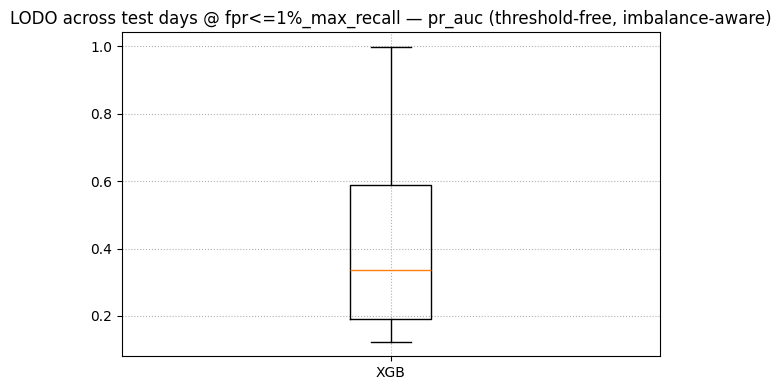

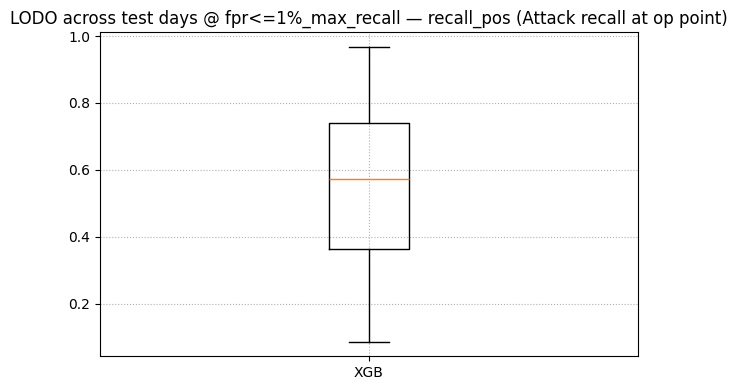

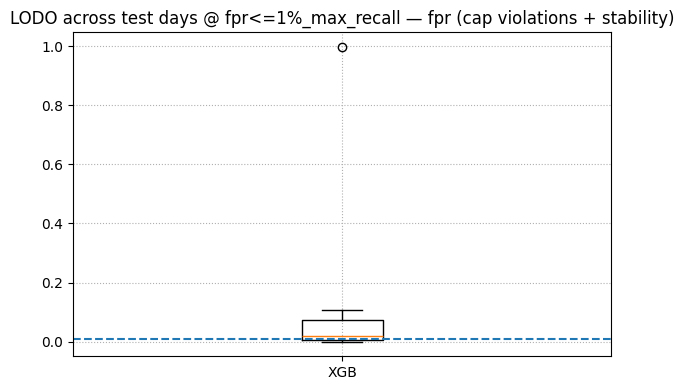

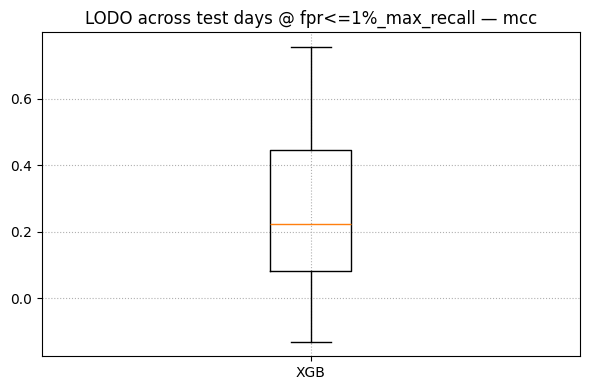


[XGB] Representative days (worst + median + best) by pr_auc:


,model,pick,test_day,pr_auc
0,XGB,worst,df_parquet_Web2_Fri_23,0.123873
1,XGB,median,df_parquet_DoS2_Fri_16,0.335345
2,XGB,best,df_parquet_DDoS2_Wed_21,0.998279


[XGB] rep_days = ['df_parquet_Web2_Fri_23', 'df_parquet_DoS2_Fri_16', 'df_parquet_DDoS2_Wed_21']

[XGB] per-subtype attack recall @A (fpr<=1%_max_recall) for test_day=df_parquet_Web2_Fri_23


,subtype,n,share_of_attacks,tp,fn,recall,test_day,split_mode
0,BruteForce,490,0.90573,304,186,0.620408,df_parquet_Web2_Fri_23,LODO
1,Web,51,0.09427,43,8,0.843137,df_parquet_Web2_Fri_23,LODO



[XGB] per-subtype attack recall @A (fpr<=1%_max_recall) for test_day=df_parquet_DoS2_Fri_16


,subtype,n,share_of_attacks,tp,fn,recall,test_day,split_mode
0,DoS,145254,1.0,140482,4772,0.967147,df_parquet_DoS2_Fri_16,LODO



[XGB] per-subtype attack recall @A (fpr<=1%_max_recall) for test_day=df_parquet_DDoS2_Wed_21


,subtype,n,share_of_attacks,tp,fn,recall,test_day,split_mode
0,DDoS,200591,1.0,135244,65347,0.674228,df_parquet_DDoS2_Wed_21,LODO


[XGB] split_mode=LODO Xtr_raw=4,439,194 tune_size_target=30,000 Xt_actual=30,000 unique_days=7
[XGB] FINAL fit_cap=300,000  Xfit_actual=300,000


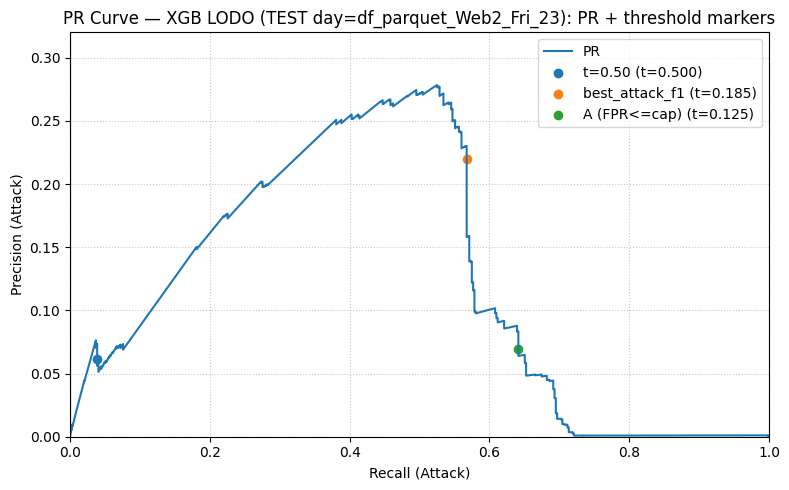

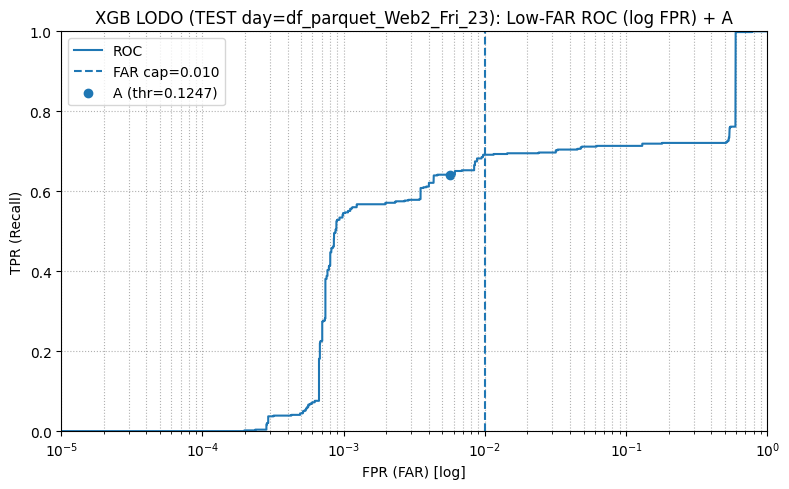

[XGB] split_mode=LODO Xtr_raw=4,676,726 tune_size_target=30,000 Xt_actual=30,000 unique_days=7
[XGB] FINAL fit_cap=300,000  Xfit_actual=300,000


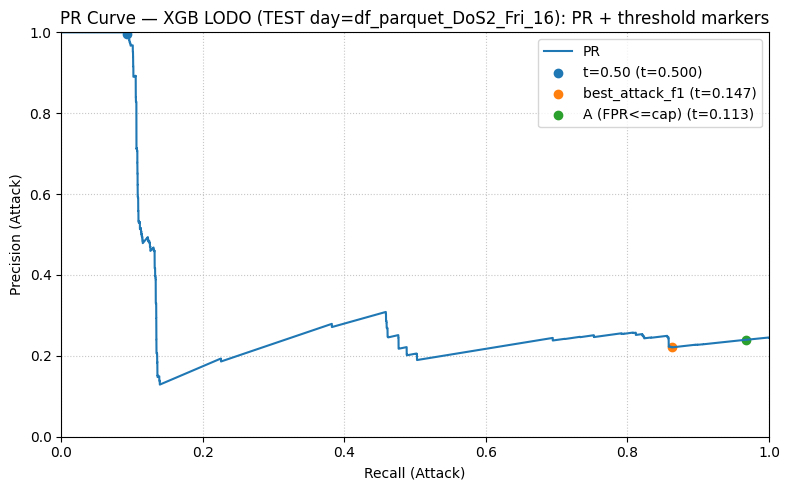

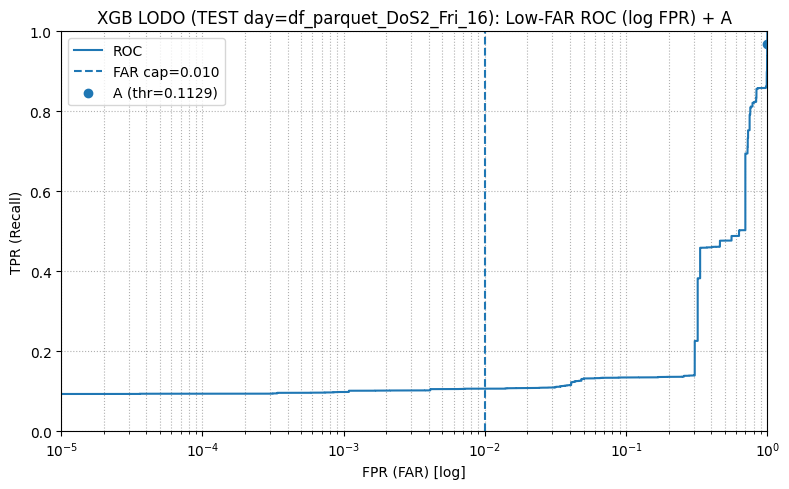

[XGB] split_mode=LODO Xtr_raw=4,707,203 tune_size_target=30,000 Xt_actual=30,000 unique_days=7
[XGB] FINAL fit_cap=300,000  Xfit_actual=300,000


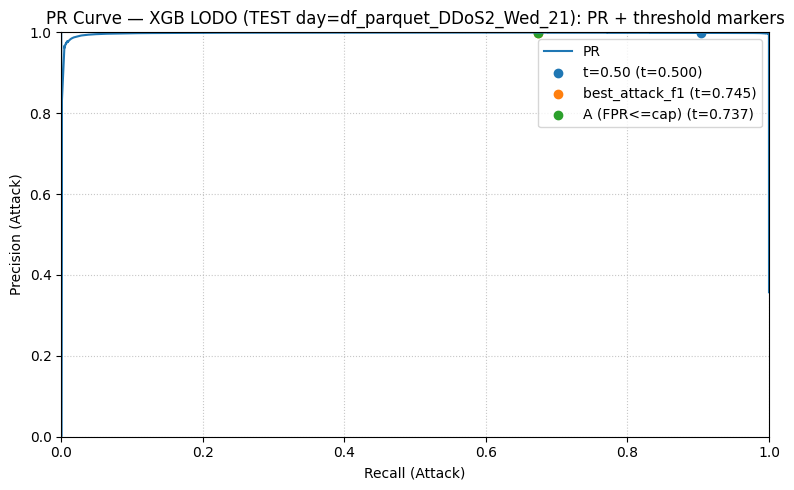

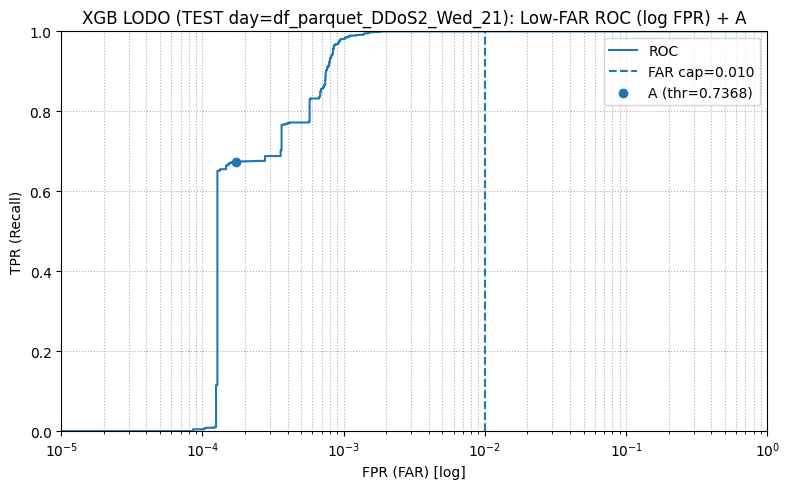

In [166]:
# F) POST-LODO PLOTTING 

MAIN_THR_LABEL = "fpr<=1%_max_recall"
PICK_METRIC = "pr_auc"   # median/worst by pr_auc

# ---------- FILL-IN (change for each model) ----------

MODEL_NAME = "XGB"                  # e.g., "KNN", "DT", "ET", "RF"
DF_LODO     = results_xgb_lodo       # our LODO results df for this model (ONLY LODO)
RUN_FOLD_FN = run_xgb_fold           # the model runner function (must match run_*_fold signature)

KNOBS_FN    = get_xgb_mode_knobs
kn = KNOBS_FN("LODO")

RUNNER_KWARGS = dict(
    # keep aligned with our runner signature
    fit_cap_final=None,
    val_eval_cap_final=XGB_VAL_EVAL_CAP_FINAL,
    test_eval_cap_final=XGB_TEST_EVAL_CAP_FINAL,

    do_calibrate=XGB_DO_CALIBRATE,
    cal_method=XGB_CAL_METHOD,
    cal_cv=XGB_CAL_CV,
    
    # if our runner uses mode knobs (optional; safe because we filter kwargs)
    tune_cap_local=kn["tune_cap"],
    tune_frac_local=kn["tune_frac"],
    cv_splits_local=kn["cv_splits"],
    # n_iter_* key depends on the runner; include it if our runner has it
    n_iter_xgb=kn["n_iter"],
)

# ---------- END FILL-IN ----------


# 1) Boxplots across days (ONLY 4 metrics)
plot_lodo_distributions_for_model(
    DF_LODO, model_name=MODEL_NAME,
    thr_label=MAIN_THR_LABEL,
    fpr_cap=MAX_FPR_CAP,
    metrics=("pr_auc", "recall_pos", "fpr", "mcc")
)

# 2) Representative days (worst + median + best)
picks_df, rep_days = pick_best_median_worst_days_for_model(
    DF_LODO,
    model_name=MODEL_NAME,
    thr_label=MAIN_THR_LABEL,
    metric=PICK_METRIC
)
print(f"\n[{MODEL_NAME}] Representative days (worst + median + best) by {PICK_METRIC}:")
display(picks_df)
print(f"[{MODEL_NAME}] rep_days =", rep_days)

# Appendix tables (only worst / median / best days)
if "xgb_subtype_lodo_all" in globals() and not xgb_subtype_lodo_all.empty:
    for d in rep_days:
        print(f"\n[XGB] per-subtype attack recall @A ({MAIN_THR_LABEL}) for test_day={d}")
        df_d = xgb_subtype_lodo_all[xgb_subtype_lodo_all["test_day"] == d].copy()
        df_d = df_d.sort_values(["n", "recall"], ascending=[False, True]).reset_index(drop=True)
        display(df_d)
else:
    print("\n[XGB] No stored per-subtype LODO tables found. Run XGB Block E first.")


# 3) Representative-day plots: ONLY PR (+ markers) and Low-FAR ROC (log FPR) + A
replot_representative_days_lodo_minimal(
    model_name=MODEL_NAME,
    rep_days=rep_days,
    run_fold_fn=RUN_FOLD_FN,
    runner_kwargs=RUNNER_KWARGS,
    far_cap=MAX_FPR_CAP,
    thr_label_A="fpr<=1%_max_recall"
)

# END XGB PIPELINE

#### COMBINED MIXED TEST PLOTS FOR KNN / DT / RF / XGB

In [180]:
# Combined MIXED TEST plots (KNN / DT / RF / XGB) with A/B/C
#   1) Low-FAR ROC with log-FPR axis + A/B/C markers
#   2) PR curve + same A/B/C markers
#
# Expects we have already ran the MIXED-only FULL blocks for:
#   KNN, DT, RF, XGB
#   so these exist:
#   knn_thresholds_m, knn_feas_m
#   dt_thresholds_m,  dt_feas_m
#   rf_thresholds_m,  rf_feas_m
#   xgb_thresholds_m, xgb_feas_m


# ---------- small fallbacks (only used if we don't already have them) ----------
if "_select_r98_threshold_for_plot" not in globals():
    def _select_r98_threshold_for_plot(thresholds_dict):
        thr_cap = thresholds_dict.get("recall>=0.98_min_fpr", None)
        if thr_cap is not None:
            return thr_cap, "recall>=0.98_min_fpr"
        thr_any = thresholds_dict.get("recall>=0.98_min_fpr_NO_CAP", None)
        if thr_any is not None:
            return thr_any, "recall>=0.98_min_fpr_NO_CAP"
        return None, "recall>=0.98 (unavailable)"

if "metrics_at_threshold" not in globals():
    from sklearn.metrics import confusion_matrix
    def metrics_at_threshold(y_true, y_score, thr):
        y_true = np.asarray(y_true).astype(int)
        y_score = np.asarray(y_score, dtype=float)
        thr = float(thr)
        yhat = (y_score >= thr).astype(int)
        tn, fp, fn, tp = confusion_matrix(y_true, yhat, labels=[0, 1]).ravel()
        fpr = fp / (fp + tn + 1e-12)
        recall = tp / (tp + fn + 1e-12)
        precision = tp / (tp + fp + 1e-12)
        return {
            "thr": thr,
            "tn": int(tn), "fp": int(fp), "fn": int(fn), "tp": int(tp),
            "fpr": float(fpr),
            "recall_pos": float(recall),
            "precision_pos": float(precision),
        }

def _ensure_1d_scores(scores):
    s = np.asarray(scores)
    # sometimes pipelines store proba as (n,2)
    if s.ndim == 2 and s.shape[1] >= 2:
        s = s[:, 1]
    return s.astype(float)

# ---------- collect artifacts from our MIXED FULL runs ----------
MODEL_BUNDLES = {
    "KNN": {"thr": knn_thresholds_m, "feas": knn_feas_m},
    "DT":  {"thr": dt_thresholds_m,  "feas": dt_feas_m},
    "RF":  {"thr": rf_thresholds_m,  "feas": rf_feas_m},
    "XGB": {"thr": xgb_thresholds_m, "feas": xgb_feas_m},
    #"LGBM": {"thr": lgbm_thresholds_m, "feas": lgbm_feas_m},  # LGBM sits exactly on top of XGB resulting line, hence skipped  
}

entries = {}
for name, b in MODEL_BUNDLES.items():
    feas = b["feas"]
    thr  = b["thr"]

    art = (feas or {}).get("__artifacts__", {})
    y   = art.get("yte_eval", None)
    s   = art.get("score_te", None)

    if y is None or s is None:
        print(f"[WARN] Missing MIXED TEST artifacts for {name}. "
              f"Expected {name.lower()}_feas_m['__artifacts__']['yte_eval'/'score_te']. Skipping.")
        continue

    y = np.asarray(y).astype(int)
    s = _ensure_1d_scores(s)
    entries[name] = {"y": y, "s": s, "thr": thr}

if len(entries) == 0:
    raise RuntimeError("No models had MIXED TEST artifacts available. "
                       "Run the MIXED-only FULL blocks first (KNN/DT/RF/XGB).")

FAR_CAP = float(globals().get("MAX_FPR_CAP", 0.01))


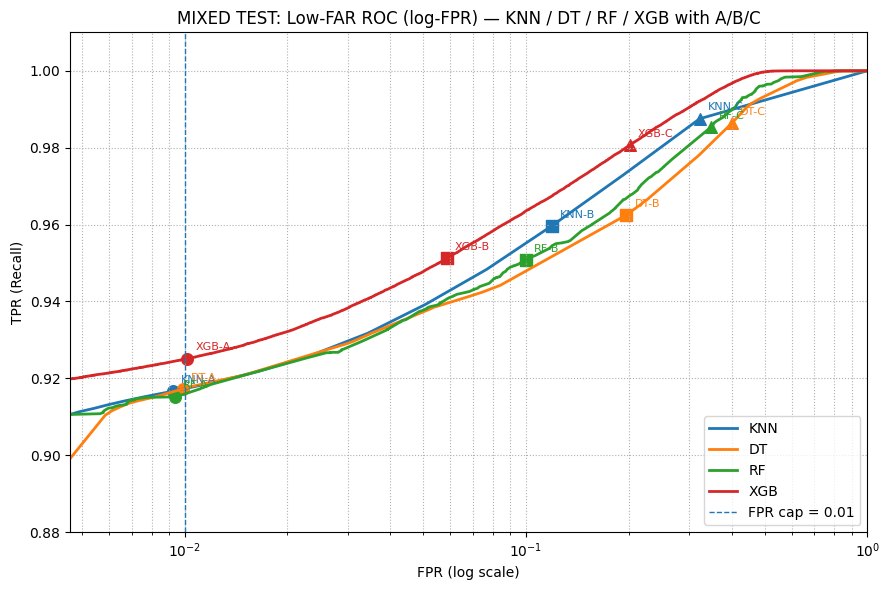

In [181]:
# (1) Combined low-FAR ROC (log-FPR) + points A/B/C

plt.figure(figsize=(9, 6))

global_min_pos_fpr = 1.0

for name, e in entries.items():
    y, s, thr_dict = e["y"], e["s"], e["thr"]

    fpr, tpr, _ = roc_curve(y, s)

    # log axis can't show 0 => clip for plotting only
    eps = 1e-8
    fpr_plot = np.clip(fpr, eps, None)

    line, = plt.plot(fpr_plot, tpr, label=name, linewidth=2)
    color = line.get_color()

    # operating thresholds
    thr_A = thr_dict.get("fpr<=1%_max_recall", None)
    thr_B = thr_dict.get("recall>=0.95_min_fpr_NO_CAP", None)
    thr_C, thr_C_label = _select_r98_threshold_for_plot(thr_dict)

    for letter, thr_val, marker in [("A", thr_A, "o"), ("B", thr_B, "s"), ("C", thr_C, "^")]:
        if thr_val is None:
            continue
        m = metrics_at_threshold(y, s, float(thr_val))
        x = max(m["fpr"], eps)
        global_min_pos_fpr = min(global_min_pos_fpr, x)

        plt.scatter(x, m["recall_pos"], marker=marker, s=70, color=color)
        plt.annotate(
            f"{name}-{letter}",
            (x, m["recall_pos"]),
            textcoords="offset points",
            xytext=(6, 6),
            fontsize=8,
            color=color
        )

plt.axvline(FAR_CAP, linestyle="--", linewidth=1, label=f"FPR cap = {FAR_CAP:g}")
plt.xscale("log")

left = max(1e-8, global_min_pos_fpr / 2) if global_min_pos_fpr < 1.0 else 1e-6
plt.xlim(left, 1.0)
plt.ylim(0.88, 1.01)

plt.xlabel("FPR (log scale)")
plt.ylabel("TPR (Recall)")
plt.title("MIXED TEST: Low-FAR ROC (log-FPR) — KNN / DT / RF / XGB with A/B/C")
plt.grid(True, which="both", linestyle=":")
plt.legend()
plt.tight_layout()
plt.show()


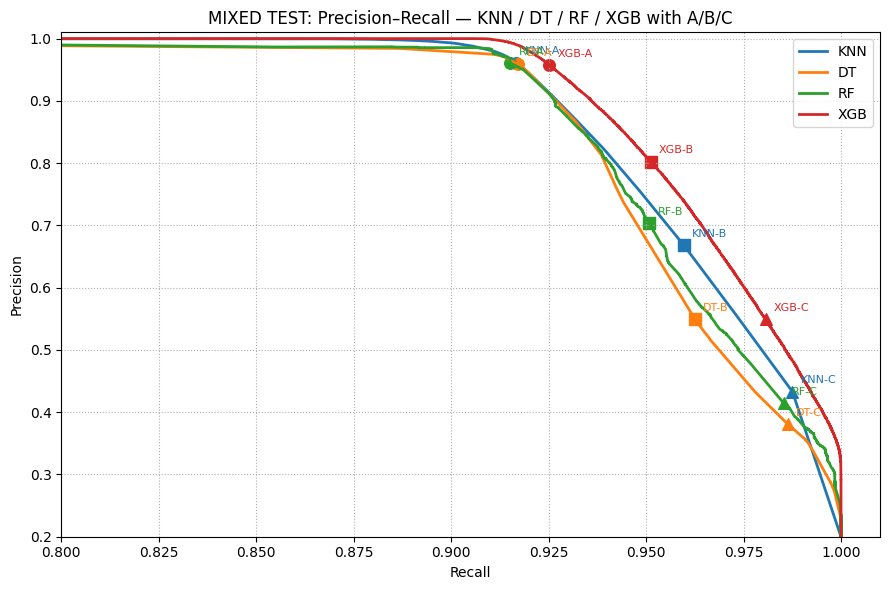

In [182]:
# (2) Combined PR curve + A/B/C

plt.figure(figsize=(9, 6))

for name, e in entries.items():
    y, s, thr_dict = e["y"], e["s"], e["thr"]

    precision, recall, _ = precision_recall_curve(y, s)

    # ensure recall is increasing for a clean left->right plot
    order = np.argsort(recall)
    recall_plot = recall[order]
    precision_plot = precision[order]

    line, = plt.plot(recall_plot, precision_plot, label=name, linewidth=2)
    color = line.get_color()

    thr_A = thr_dict.get("fpr<=1%_max_recall", None)
    thr_B = thr_dict.get("recall>=0.95_min_fpr_NO_CAP", None)
    thr_C, thr_C_label = _select_r98_threshold_for_plot(thr_dict)

    for letter, thr_val, marker in [("A", thr_A, "o"), ("B", thr_B, "s"), ("C", thr_C, "^")]:
        if thr_val is None:
            continue
        m = metrics_at_threshold(y, s, float(thr_val))
        plt.scatter(m["recall_pos"], m["precision_pos"], marker=marker, s=70, color=color)
        plt.annotate(
            f"{name}-{letter}",
            (m["recall_pos"], m["precision_pos"]),
            textcoords="offset points",
            xytext=(6, 6),
            fontsize=8,
            color=color
        )

plt.xlim(0.8, 1.01)
plt.ylim(0.2, 1.01)

plt.xlabel("Recall")
plt.ylabel("Precision")
plt.title("MIXED TEST: Precision–Recall — KNN / DT / RF / XGB with A/B/C")
plt.grid(True, linestyle=":")
plt.legend()
plt.tight_layout()
plt.show()

## 6. APPENDIX - additional ML models research

### 6.a) Extra Trees fold runner 

In [190]:
# EXTRA TREES (ET) PIPELINE 
# - split_mode-aware (LODO vs MIXED)
# - mode-specific knobs via get_et_mode_knobs(split_mode)
# - split-aware capping (LODO: day-balanced if available; MIXED: cap_rows)
# - MIXED inner-CV: StratifiedKFold via get_inner_cv(...)
# - MIXED tuning scoring: partial_auc@max_fpr (low-FAR focus)
# - LODO tuning scoring: average_precision
# - optional calibration: LODO group-safe, MIXED stratified
# - VAL thresholding includes NO_CAP diagnostics for recall targets
# - returns artifacts for MIXED plotting blocks


# A) ET runtime knobs — GLOBAL

# FAST mode caps (algo test)
ET_FIT_CAP_FAST        = 200_000
ET_VAL_EVAL_CAP_FAST   = 200_000
ET_TEST_EVAL_CAP_FAST  = 200_000

# EVAL caps (final reporting)
ET_VAL_EVAL_CAP_FINAL  = None
ET_TEST_EVAL_CAP_FINAL = None

# Optional: override trees for final refit (without changing search space)
ET_N_ESTIMATORS_FINAL = None   # e.g., 1200; keep None to use tuned value

# Optional calibration knobs (default False => no behavior change)
ET_DO_CALIBRATE = False
ET_CAL_METHOD   = "sigmoid"
ET_CAL_CV       = 3

# FULL mode - LODO knobs
ET_N_ITER_TUNE_LODO   = 10
ET_TUNE_CAP_LODO      = 30_000
ET_TUNE_FRAC_LODO     = 0.10
ET_CV_SPLITS_LODO     = 3
ET_FIT_CAP_FINAL_LODO = 300_000

# FULL mode - MIXED knobs (literature-like)
ET_N_ITER_TUNE_MIXED   = 30
ET_TUNE_CAP_MIXED      = 150_000
ET_TUNE_FRAC_MIXED     = 0.20
ET_CV_SPLITS_MIXED     = 5
ET_FIT_CAP_FINAL_MIXED = 1_000_000


def get_et_mode_knobs(split_mode: str):
    if split_mode == "MIXED":
        return dict(
            cv_splits=ET_CV_SPLITS_MIXED,
            n_iter=ET_N_ITER_TUNE_MIXED,
            tune_cap=ET_TUNE_CAP_MIXED,
            tune_frac=ET_TUNE_FRAC_MIXED,
            fit_cap_final=ET_FIT_CAP_FINAL_MIXED,
        )
    # LODO default
    return dict(
        cv_splits=ET_CV_SPLITS_LODO,
        n_iter=ET_N_ITER_TUNE_LODO,
        tune_cap=ET_TUNE_CAP_LODO,
        tune_frac=ET_TUNE_FRAC_LODO,
        fit_cap_final=ET_FIT_CAP_FINAL_LODO,
    )

In [191]:
# B) ET fold runner (UPDATED)


# safe partial AUC scorer (prevents NaNs due to one-class folds)
if "safe_partial_auc" not in globals():
    def safe_partial_auc(y_true, y_score, max_fpr=0.01):
        try:
            return roc_auc_score(y_true, y_score, max_fpr=max_fpr)
        except TypeError:
            # sklearn without max_fpr support
            return roc_auc_score(y_true, y_score)
        except ValueError:
            # one-class fold
            return 0.5


# shared capping helpers (FIT uses day-balanced for LODO; MIXED uses cap_rows)
def _cap_for_fit_et(X, y, g, cap, split_mode="LODO", seed=42):
    if cap is None:
        return X, y, g
    if split_mode == "MIXED":
        return cap_rows(X, y, g, cap, seed=seed)  # no day balancing
    # LODO
    if "cap_rows_day_balanced" in globals():
        try:
            return cap_rows_day_balanced(X, y, g, cap, seed=seed, min_per_day=1)
        except TypeError:
            return cap_rows_day_balanced(X, y, g, cap, seed=seed)
    return cap_rows(X, y, g, cap, seed=seed)


def _cap_for_eval_et(X, y, g, cap, seed=42):
    if cap is None:
        return X, y, g
    return cap_rows(X, y, g, cap, seed=seed)


def run_et_fold(
    Xtr_raw, ytr, gtr,
    Xva_raw, yva, gva,
    Xte_raw, yte, gte,
    preprocessor,
    model_name="ET",
    max_fpr_cap=0.01,

    fast_mode=False,
    split_mode="LODO",

    fit_cap_fast=ET_FIT_CAP_FAST,
    fit_cap_final=None,
    val_eval_cap_fast=ET_VAL_EVAL_CAP_FAST,
    test_eval_cap_fast=ET_TEST_EVAL_CAP_FAST,
    val_eval_cap_final=ET_VAL_EVAL_CAP_FINAL,
    test_eval_cap_final=ET_TEST_EVAL_CAP_FINAL,

    n_estimators_final=None,

    # optional calibration
    do_calibrate=ET_DO_CALIBRATE,
    cal_method=ET_CAL_METHOD,
    cal_cv=ET_CAL_CV,

    # mode overrides (override get_et_mode_knobs defaults if not None)
    n_iter_et=None,
    tune_cap_local=None,
    tune_frac_local=None,
    cv_splits_local=None,
    et_search_scoring_lodo="average_precision",
):
    rs = random_state

    # resolve mode defaults
    kn = get_et_mode_knobs(split_mode)
    if fit_cap_final is None:
        fit_cap_final = kn["fit_cap_final"]

    tcap  = int(kn["tune_cap"] if tune_cap_local is None else tune_cap_local)
    tfrac = float(kn["tune_frac"] if tune_frac_local is None else tune_frac_local)
    n_iter_et = int(kn["n_iter"] if n_iter_et is None else n_iter_et)
    spl = int(kn["cv_splits"] if cv_splits_local is None else cv_splits_local)

    # tuning subset (split_mode-aware)
    tune_size = int(min(tcap, max(5_000, tfrac * len(Xtr_raw))))
    Xt, yt, gt = _cap_for_fit_et(Xtr_raw, ytr, gtr, cap=tune_size, split_mode=split_mode, seed=rs)
    gt_arr = np.asarray(gt)

    print(
        f"[{model_name}] split_mode={split_mode} Xtr_raw={len(Xtr_raw):,} "
        f"tune_size_target={tune_size:,} Xt_actual={len(Xt):,} "
        f"unique_days={len(np.unique(gt_arr))}"
    )

    # ---------------- FAST MODE ----------------
    if fast_mode:
        Xfit, yfit, gfit = _cap_for_fit_et(Xtr_raw, ytr, gtr, cap=fit_cap_fast, split_mode=split_mode, seed=rs)
        print(f"[{model_name}] FAST fit_cap={fit_cap_fast:,}  Xfit_actual={len(Xfit):,}")

        best_pipe = Pipeline(steps=[
            ("prep", preprocessor),
            ("clf", ExtraTreesClassifier(
                n_estimators=300,
                max_depth=None,
                min_samples_split=10,
                min_samples_leaf=5,
                max_features="sqrt",
                bootstrap=False,
                class_weight="balanced",
                n_jobs=-1,
                random_state=rs
            ))
        ])
        best_pipe.fit(Xfit, yfit)

        best_params = {
            "FAST_MODE": True,
            "clf__n_estimators": 300,
            "fit_cap_fast": fit_cap_fast,
            "split_mode": split_mode,
            "calibrated": False,
        }
        model = best_pipe

    # ---------------- FULL MODE ----------------
    else:
        # CV: LODO -> GroupKFold by day, MIXED -> StratifiedKFold(shuffle=True)
        cv = get_inner_cv(
            split_mode,
            y=np.asarray(yt).astype(int),
            groups=gt_arr,
            default_splits=spl,
            seed=rs
        )

        if split_mode == "LODO" and len(np.unique(gt_arr)) < 2:
            raise ValueError("Not enough unique day groups in tuning subset for GroupKFold (LODO).")

        # base estimator (avoid nested parallelism during CV)
        base_est = ExtraTreesClassifier(random_state=rs, n_jobs=1)

        # search space
        param_dist = {
            "clf__n_estimators": randint(200, 1000),
            "clf__max_depth": [None, 10, 20, 30, 40],
            "clf__min_samples_split": randint(2, 51),
            "clf__min_samples_leaf": randint(1, 31),
            "clf__max_features": ["sqrt", "log2", 0.3, 0.5, 0.7, 1.0],
            "clf__bootstrap": [False, True],
            "clf__class_weight": [None, "balanced"],
            "clf__ccp_alpha": loguniform(1e-7, 1e-2),
        }

        # scoring: MIXED optimizes low-FAR region; LODO uses AP (default)
        if split_mode == "MIXED":
            scoring_used = make_scorer(safe_partial_auc, needs_proba=True, max_fpr=max_fpr_cap)
            scoring_tag = "partial_auc@max_fpr"
        else:
            scoring_used = et_search_scoring_lodo
            scoring_tag = et_search_scoring_lodo

        search = RandomizedSearchCV(
            estimator=Pipeline(steps=[("prep", preprocessor), ("clf", base_est)]),
            param_distributions=param_dist,
            n_iter=int(n_iter_et),
            scoring=scoring_used,
            error_score=0.0,   # prevent NaNs from poisoning the run
            cv=cv,
            n_jobs=-1,
            random_state=rs,
            refit=True,
            verbose=0
        )

        # pass groups only in LODO
        if split_mode == "LODO":
            search.fit(Xt, yt, groups=gt_arr)
        else:
            search.fit(Xt, yt)

        # final fit (split_mode-aware capping)
        Xfit, yfit, gfit = _cap_for_fit_et(Xtr_raw, ytr, gtr, cap=fit_cap_final, split_mode=split_mode, seed=rs)
        print(f"[{model_name}] FINAL fit_cap={fit_cap_final:,}  Xfit_actual={len(Xfit):,}")

        best_pipe = search.best_estimator_
        best_pipe.set_params(clf__n_jobs=-1)

        if n_estimators_final is not None:
            best_pipe.set_params(clf__n_estimators=int(n_estimators_final))

        best_pipe.fit(Xfit, yfit)

        best_params = dict(search.best_params_)
        best_params.update({
            "fit_cap_final": fit_cap_final,
            "split_mode": split_mode,
            "tune_size": tune_size,
            "cv_splits": int(getattr(cv, "n_splits", spl)),
            "n_iter": int(n_iter_et),
            "scoring_used": scoring_tag,
        })
        if n_estimators_final is not None:
            best_params["n_estimators_final_override"] = int(n_estimators_final)

        # optional calibration (LODO: group-safe; MIXED: stratified)
        model = best_pipe
        if do_calibrate:
            if split_mode == "LODO":
                gfit_arr = np.asarray(gfit)
                uniq_days = np.unique(gfit_arr)
                if len(uniq_days) >= 2:
                    cal_splits = min(int(cal_cv), len(uniq_days))
                    gkf = GroupKFold(n_splits=cal_splits)
                    splits = list(gkf.split(Xfit, yfit, groups=gfit_arr))

                    cal = CalibratedClassifierCV(
                        estimator=clone(best_pipe),
                        method=cal_method,
                        cv=splits
                    )
                    cal.fit(Xfit, yfit)
                    model = cal

                    best_params["calibrated"] = True
                    best_params["cal_method"] = cal_method
                    best_params["cal_cv"] = cal_splits
                else:
                    best_params["calibrated"] = False
                    best_params["calibration_skipped_reason"] = "not_enough_unique_day_groups_in_gfit"
            else:
                skf = StratifiedKFold(n_splits=max(2, int(cal_cv)), shuffle=True, random_state=rs)
                cal = CalibratedClassifierCV(
                    estimator=clone(best_pipe),
                    method=cal_method,
                    cv=skf
                )
                cal.fit(Xfit, yfit)
                model = cal

                best_params["calibrated"] = True
                best_params["cal_method"] = cal_method
                best_params["cal_cv"] = int(cal_cv)
        else:
            best_params["calibrated"] = False

    # ---------------- EVAL CAPS ----------------
    if fast_mode:
        Xva_eval, yva_eval, _ = _cap_for_eval_et(Xva_raw, yva, gva, val_eval_cap_fast, seed=rs)
        Xte_eval, yte_eval, _ = _cap_for_eval_et(Xte_raw, yte, gte, test_eval_cap_fast, seed=rs)
    else:
        Xva_eval, yva_eval, _ = _cap_for_eval_et(Xva_raw, yva, gva, val_eval_cap_final, seed=rs)
        Xte_eval, yte_eval, _ = _cap_for_eval_et(Xte_raw, yte, gte, test_eval_cap_final, seed=rs)

    # ---------------- THRESHOLD TUNING ON VAL ----------------
    score_va = get_scores(model, Xva_eval)
    if "log_if_degenerate_scores" in globals():
        log_if_degenerate_scores(score_va, model_name, split_name="VAL")

    t_f1, _ = pick_threshold_best_attack_f1(yva_eval, score_va)
    t_fpr = pick_threshold_fpr_constrained_max_recall(yva_eval, score_va, max_fpr=max_fpr_cap)
    t_r95 = pick_threshold_recall_target_min_fpr(yva_eval, score_va, recall_target=0.95, max_fpr=max_fpr_cap)
    t_r98 = pick_threshold_recall_target_min_fpr(yva_eval, score_va, recall_target=0.98, max_fpr=max_fpr_cap)

    # diagnostics (NO CAP)
    t_r95_any = pick_threshold_recall_target_min_fpr(yva_eval, score_va, recall_target=0.95, max_fpr=1.0)
    t_r98_any = pick_threshold_recall_target_min_fpr(yva_eval, score_va, recall_target=0.98, max_fpr=1.0)

    thresholds = {
        "t=0.50": 0.50,
        "best_attack_f1": t_f1,
        "fpr<=1%_max_recall": t_fpr,
        "recall>=0.95_min_fpr": t_r95,
        "recall>=0.98_min_fpr": t_r98,
        "recall>=0.95_min_fpr_NO_CAP": t_r95_any,
        "recall>=0.98_min_fpr_NO_CAP": t_r98_any,
    }
    feas = {k: (v is not None) for k, v in thresholds.items()}
    thresholds_valid = {k: v for k, v in thresholds.items() if v is not None}

    # realized FAR at FAR-capped threshold (VAL)
    t_fpr_sel = thresholds.get("fpr<=1%_max_recall", None)
    if t_fpr_sel is not None:
        yhat_val = (score_va >= t_fpr_sel).astype(int)
        tn, fp, fn, tp = confusion_matrix(yva_eval, yhat_val, labels=[0, 1]).ravel()
        best_params["val_fpr_realized_at_fpr1_thr"] = float(fp / (fp + tn + 1e-12))
    else:
        best_params["val_fpr_realized_at_fpr1_thr"] = None

    # ---------------- EVALUATE ON TEST ----------------
    score_te = get_scores(model, Xte_eval)
    if "log_if_degenerate_scores" in globals():
        log_if_degenerate_scores(score_te, model_name, split_name="TEST")

    if t_fpr_sel is not None:
        yhat_te = (score_te >= t_fpr_sel).astype(int)
        tn, fp, fn, tp = confusion_matrix(yte_eval, yhat_te, labels=[0, 1]).ravel()
        best_params["test_fpr_realized_at_fpr1_thr"] = float(fp / (fp + tn + 1e-12))
    else:
        best_params["test_fpr_realized_at_fpr1_thr"] = None

    df = evaluate_thresholds(yte_eval, score_te, thresholds_valid, name=model_name)

    if do_plots:
        plot_pr_curve_with_thresholds(yte_eval, score_te, thresholds_valid, model_name=model_name)
        plot_roc_curve(yte_eval, score_te, model_name=model_name)
        plot_det_curve(yte_eval, score_te, model_name=model_name)
        plot_score_distribution(yte_eval, score_te, model_name=model_name, bins=100)

    # artifacts for MIXED plotting blocks + subtype recall
    feas["__artifacts__"] = {"score_te": score_te, "yte_eval": yte_eval}

    return df, best_params, thresholds, feas

In [ ]:
# C) ET algo test cell 
# Runs a single test day in LODO + one MIXED run, in FAST mode


RUN_MODELS["ET"] = True
ALGO_TEST_DAY = TEST_DAYS[0]
print("Algo test day:", ALGO_TEST_DAY)

old_do_plots = do_plots
do_plots = False

# ---------- LODO algo test ----------
split_mode = "LODO"
kn = get_et_mode_knobs(split_mode)

Xtr_raw, ytr, gtr, Xva_raw, yva, gva, Xte_raw, yte, gte, meta = build_fold(
    registry=REGISTRY, val_days=VAL_DAYS, test_day=ALGO_TEST_DAY
)
preprocessor, prep_dbg = build_preprocessor(Xtr_raw, meta["feature_cols"])
print("LODO preprocessor debug:", prep_dbg)

if RUN_MODELS.get("ET", False):
    et_df, et_best_params, et_thresholds, et_feas = run_et_fold(
        Xtr_raw, ytr, gtr, Xva_raw, yva, gva, Xte_raw, yte, gte,
        preprocessor,
        model_name="ET",
        fast_mode=True,
        fit_cap_fast=ET_FIT_CAP_FAST,
        val_eval_cap_fast=ET_VAL_EVAL_CAP_FAST,
        test_eval_cap_fast=ET_TEST_EVAL_CAP_FAST,
        max_fpr_cap=MAX_FPR_CAP,
        split_mode=split_mode,

        # keep knobs consistent even if FAST doesn’t use them
        n_iter_et=kn["n_iter"],
        tune_cap_local=kn["tune_cap"],
        tune_frac_local=kn["tune_frac"],
        cv_splits_local=kn["cv_splits"],

        do_calibrate=ET_DO_CALIBRATE,
        cal_method=ET_CAL_METHOD,
        cal_cv=ET_CAL_CV,
    )
    print("ET (LODO) best params:", et_best_params)
    print("ET (LODO) thresholds:", et_thresholds)
    print("ET (LODO) feasibility:", {k:v for k,v in et_feas.items() if k != "__artifacts__"})
    display(et_df)

# ---------- MIXED algo test ----------
split_mode = "MIXED"
kn = get_et_mode_knobs(split_mode)

Xtr_raw_m, ytr_m, gtr_m, Xva_raw_m, yva_m, gva_m, Xte_raw_m, yte_m, gte_m, meta_m = build_mixed_fold(
    registry=REGISTRY,
    seed=MIXED_RANDOM_STATE,
    test_size=MIXED_TEST_SIZE,
    val_size=MIXED_VAL_SIZE,
    use_rare_injection=MIXED_USE_RARE_ALLOCATION,
    rare_subtypes=RARE_SUBTYPES,
    rare_n_test=RARE_N_TEST_PER_SUBTYPE,
    rare_n_val=RARE_N_VAL_PER_SUBTYPE,
)
preprocessor_m, prep_dbg_m = build_preprocessor(Xtr_raw_m, meta_m["feature_cols"])
print("MIXED preprocessor debug:", prep_dbg_m)

if RUN_MODELS.get("ET", False):
    et_df_m, et_best_params_m, et_thresholds_m, et_feas_m = run_et_fold(
        Xtr_raw_m, ytr_m, gtr_m, Xva_raw_m, yva_m, gva_m, Xte_raw_m, yte_m, gte_m,
        preprocessor_m,
        model_name="ET",
        fast_mode=True,
        fit_cap_fast=ET_FIT_CAP_FAST,
        val_eval_cap_fast=ET_VAL_EVAL_CAP_FAST,
        test_eval_cap_fast=ET_TEST_EVAL_CAP_FAST,
        max_fpr_cap=MAX_FPR_CAP,
        split_mode=split_mode,

        n_iter_et=kn["n_iter"],
        tune_cap_local=kn["tune_cap"],
        tune_frac_local=kn["tune_frac"],
        cv_splits_local=kn["cv_splits"],

        do_calibrate=ET_DO_CALIBRATE,
        cal_method=ET_CAL_METHOD,
        cal_cv=ET_CAL_CV,
    )
    print("ET (MIXED) best params:", et_best_params_m)
    print("ET (MIXED) thresholds:", et_thresholds_m)
    print("ET (MIXED) feasibility:", {k:v for k,v in et_feas_m.items() if k != "__artifacts__"})
    display(et_df_m)

do_plots = old_do_plots

MIXED preprocessor debug: {'log1p_cols': ['Active Mean', 'Active Std', 'Bwd IAT Total', 'Bwd IAT Min', 'Packet Length Variance', 'Packet Length Min', 'Bwd Packets/s', 'Down/Up Ratio', 'FIN Flag Count', 'Flow Bytes/s', 'Flow IAT Std', 'Fwd IAT Min', 'Fwd IAT Std', 'Fwd Packet Length Std', 'Fwd Packets/s', 'Fwd URG Flags', 'Idle Min', 'RST Flag Count', 'SYN Flag Count', 'URG Flag Count'], 'scale_cols': ['ACK Flag Count', 'Init Bwd Win Bytes', 'Init Fwd Win Bytes', 'PSH Flag Count'], 'has_protocol': True}
MIXED shapes: (4661671, 25) (665954, 25) (1331907, 25)
MIXED n_features: 25
[ET] split_mode=MIXED Xtr_raw=4,661,671 tune_size_target=150,000 Xt_actual=150,000 unique_days=10
[ET] FINAL fit_cap=1,000,000  Xfit_actual=1,000,000


,stage2_skipped,n_train_attacks,n_test_attacks,n_classes,classes,oracle_n_test_classes,oracle_macro_f1,oracle_weighted_f1,oracle_acc,oracle_bacc,gated_available,gate_thr,n_flagged_total,n_tp_attacks,gated_macro_f1_tp,joint_correct_rate,model,split_mode,test_day
0,False,931366,266105,6,"[Bot, BruteForce, DDoS, DoS, Infiltration, OTHER]",6,0.819247,0.987434,0.987565,0.816402,True,0.481494,247624,237206,0.874561,0.88391,ET,MIXED,MIXED


ET attack type stage 2 result: {'stage2_skipped': False, 'n_train_attacks': 931366, 'n_test_attacks': 266105, 'n_classes': 6, 'classes': ['Bot', 'BruteForce', 'DDoS', 'DoS', 'Infiltration', 'OTHER'], 'oracle_n_test_classes': 6, 'oracle_macro_f1': 0.819246598669432, 'oracle_weighted_f1': 0.9874337119154752, 'oracle_acc': 0.9875650589053193, 'oracle_bacc': 0.8164017079997813, 'gated_available': True, 'gate_thr': 0.48149419062703197, 'n_flagged_total': 247624, 'n_tp_attacks': 237206, 'gated_macro_f1_tp': 0.8745611717947146, 'joint_correct_rate': 0.8839104864621108, 'model': 'ET', 'split_mode': 'MIXED', 'test_day': 'MIXED'}

=== MIXED (ET): best_params ===
{'clf__bootstrap': False, 'clf__ccp_alpha': np.float64(0.0009609812947036408), 'clf__class_weight': None, 'clf__max_depth': 20, 'clf__max_features': 0.7, 'clf__min_samples_leaf': 21, 'clf__min_samples_split': 40, 'clf__n_estimators': 321, 'fit_cap_final': 1000000, 'split_mode': 'MIXED', 'tune_size': 150000, 'cv_splits': 5, 'n_iter': 30, 

,thr,tn,fp,fn,tp,precision_pos,recall_pos,f1_pos,macro_f1,fpr,fnr,mcc,balanced_acc,roc_auc,pr_auc,model,thr_label,test_day,split_mode
0,0.500000,1057095,8707,29094,237011,0.964565,0.890667,0.926144,0.954289,0.008169,0.109333,0.909719,0.941249,0.977424,0.959614,ET,t=0.50,MIXED,MIXED
1,0.512717,1057448,8354,29376,236729,0.965914,0.889607,0.926192,0.954332,0.007838,0.110393,0.909879,0.940885,0.977424,0.959614,ET,best_attack_f1,MIXED,MIXED
2,0.481494,1055384,10418,28899,237206,0.957928,0.891400,0.923467,0.952591,0.009775,0.108600,0.906110,0.940813,0.977424,0.959614,ET,fpr<=1%_max_recall,MIXED,MIXED
3,0.033043,879691,186111,12920,253185,0.576343,0.951448,0.717847,0.808109,0.174621,0.048552,0.660662,0.888414,0.977424,0.959614,ET,recall>=0.95_min_fpr_NO_CAP,MIXED,MIXED
4,0.031451,660968,404834,5145,260960,0.391953,0.980666,0.560061,0.661670,0.379840,0.019334,0.480473,0.800413,0.977424,0.959614,ET,recall>=0.98_min_fpr_NO_CAP,MIXED,MIXED



Total time elapsed for ET MIXED-only run: 91.26 minutes

[ET MIXED] Operating points (TEST)


,label,thr,fpr,recall,precision,f1,tn,fp,fn,tp
0,best_attack_f1,0.512717,0.007838,0.889607,0.965914,0.926192,1057448,8354,29376,236729
1,t=0.50,0.500000,0.008169,0.890667,0.964565,0.926144,1057095,8707,29094,237011
2,A (FPR<=1%),0.481494,0.009775,0.891400,0.957928,0.923467,1055384,10418,28899,237206
3,B (Recall>=0.95 NO CAP),0.033043,0.174621,0.951448,0.576343,0.717847,879691,186111,12920,253185
4,C (Recall>=0.98),0.031451,0.379840,0.980666,0.391953,0.560061,660968,404834,5145,260960


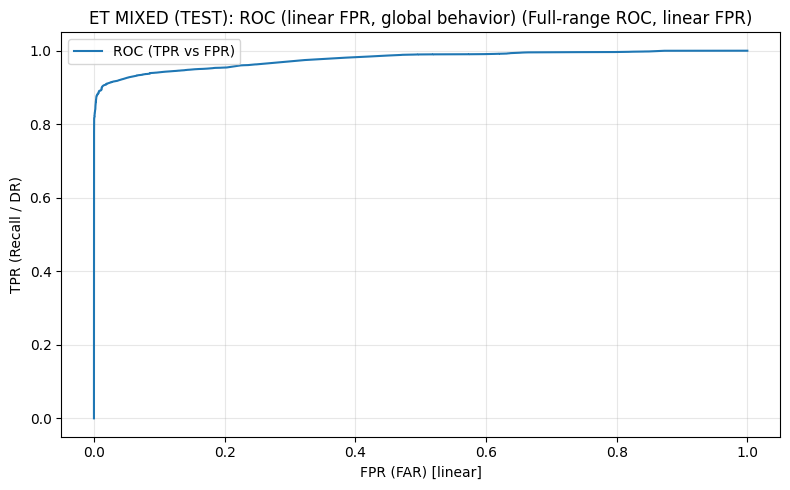

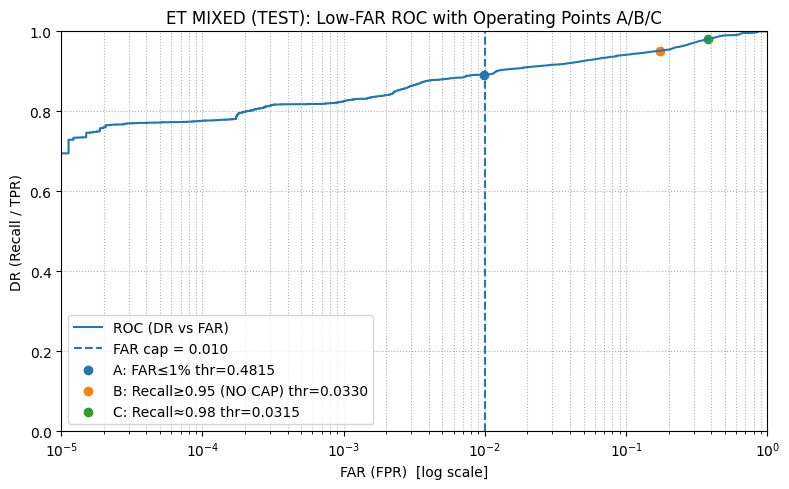

Operating Point A (FAR capped): {'thr': 0.48149419062703197, 'tn': 1055384, 'fp': 10418, 'fn': 28899, 'tp': 237206, 'precision_pos': 0.9579281491293251, 'recall_pos': 0.8914000112737454, 'f1_pos': 0.9234674312721298, 'macro_f1': 0.9525905887364308, 'fpr': 0.009774798696193101, 'fnr': 0.10859998872625468, 'mcc': 0.906110353284009, 'balanced_acc': 0.940812606288776}
Operating Point B (Recall>=0.95 NO CAP): {'thr': 0.03304301818591425, 'tn': 879691, 'fp': 186111, 'fn': 12920, 'tp': 253185, 'precision_pos': 0.5763426027097902, 'recall_pos': 0.9514477367956258, 'f1_pos': 0.7178470118414916, 'macro_f1': 0.8081091475601753, 'fpr': 0.17462061433549572, 'fnr': 0.04855226320437421, 'mcc': 0.6606621425874031, 'balanced_acc': 0.888413561230065}
FAR cost multiplier (B vs A): 17.86x
Operating Point C (Recall≈0.98): {'thr': 0.03145130988574437, 'tn': 660968, 'fp': 404834, 'fn': 5145, 'tp': 260960, 'precision_pos': 0.3919530665641324, 'recall_pos': 0.9806655267657504, 'f1_pos': 0.5600606932725543, 'ma

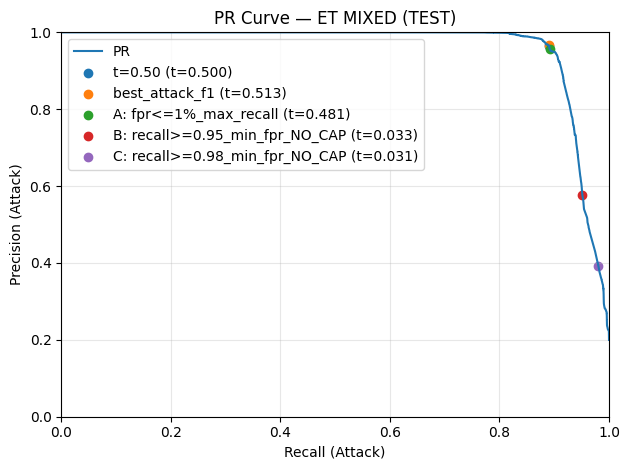

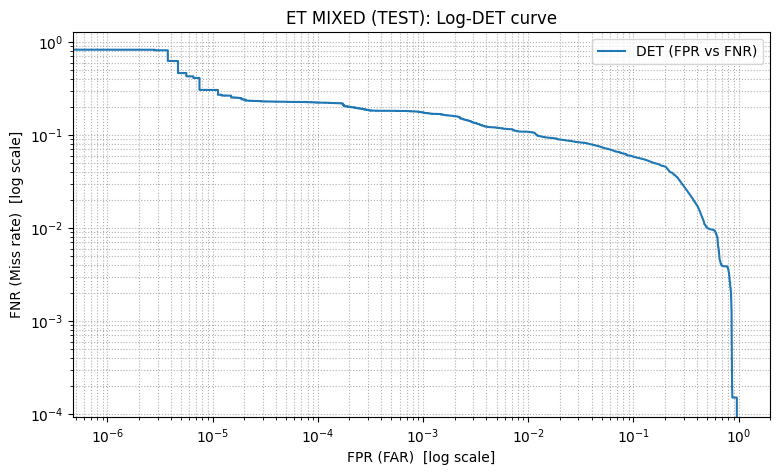

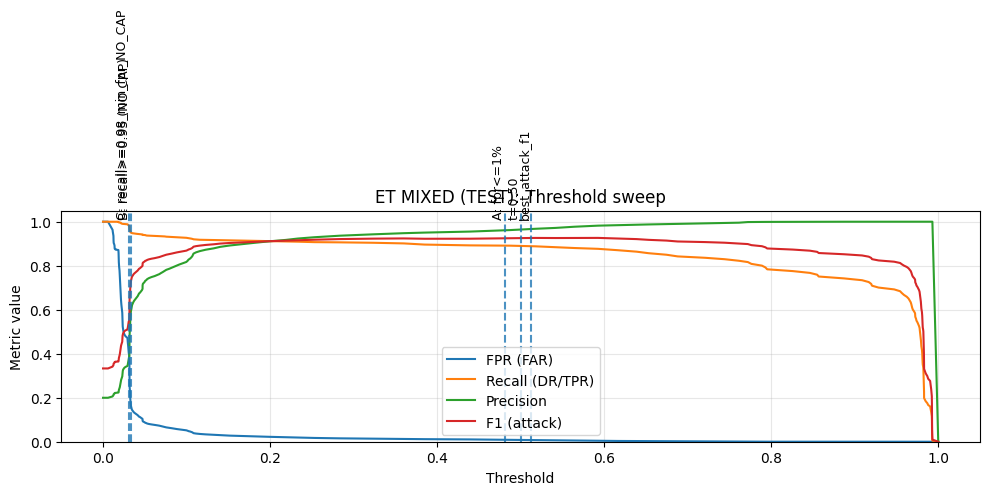

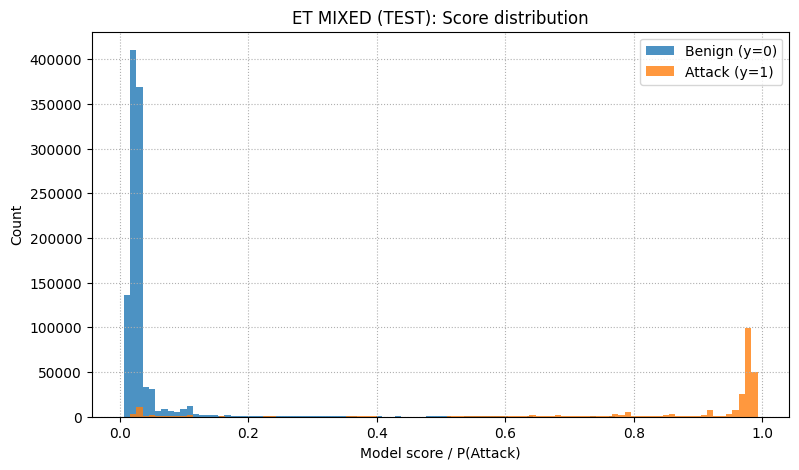


=== MIXED (ET): per-subtype attack recall @ Operating Point A (fpr<=1%) ===


,subtype,n,share_of_attacks,tp,fn,recall
0,DDoS,155400,0.583980,154729,671,0.995682
1,DoS,39179,0.147231,34663,4516,0.884734
2,Bot,28902,0.108611,28529,373,0.987094
3,Infiltration,23508,0.088341,465,23043,0.019781
4,BruteForce,19066,0.071648,18820,246,0.987097
5,Web,50,0.000188,0,50,0.000000


In [192]:
# D) ET outer block (MIXED ONLY) + required plots 

# --- minimal fallback helper for linear ROC if you don't already have it ---
if "plot_roc_curve_linear_with_operating_points" not in globals():
    def plot_roc_curve_linear_with_operating_points(y_true, y_score, thresholds_dict=None, model_name="ROC (linear)"):
        y_true = np.asarray(y_true).astype(int)
        y_score = np.asarray(y_score, dtype=float)
        fpr, tpr, _ = roc_curve(y_true, y_score)

        plt.figure(figsize=(8, 5))
        plt.plot(fpr, tpr, label="ROC")
        if thresholds_dict:
            for lbl, thr in thresholds_dict.items():
                if thr is None:
                    continue
                P = metrics_at_threshold(y_true, y_score, float(thr)) if "metrics_at_threshold" in globals() else None
                if P is not None:
                    plt.scatter([P["fpr"]], [P["recall_pos"]], label=f"{lbl} thr={float(thr):.4f}")
        plt.xlim(0.0, 1.0)
        plt.ylim(0.0, 1.0)
        plt.xlabel("FPR")
        plt.ylabel("TPR (Recall)")
        plt.title(model_name)
        plt.grid(True, linestyle=":")
        plt.legend()
        plt.tight_layout()
        plt.show()

# --- fallback: choose r98 threshold (cap if feasible else NO_CAP) ---
if "_select_r98_threshold_for_plot" not in globals():
    def _select_r98_threshold_for_plot(thresholds_dict):
        thr_cap = thresholds_dict.get("recall>=0.98_min_fpr", None)
        if thr_cap is not None:
            return thr_cap, "recall>=0.98_min_fpr"
        thr_any = thresholds_dict.get("recall>=0.98_min_fpr_NO_CAP", None)
        if thr_any is not None:
            return thr_any, "recall>=0.98_min_fpr_NO_CAP"
        return None, "recall>=0.98 (unavailable)"

# --- run MIXED-only FULL ---

RUN_MODELS["ET"] = True

MAIN_THR_LABEL = "fpr<=1%_max_recall"

START_TIME = time.time()
old_do_plots = do_plots
do_plots = False  # plot manually here

split_mode = "MIXED"
kn = get_et_mode_knobs(split_mode)

Xtr_raw_m, ytr_m, gtr_m, Xva_raw_m, yva_m, gva_m, Xte_raw_m, yte_m, gte_m, meta_m = build_mixed_fold(
    registry=REGISTRY,
    seed=MIXED_RANDOM_STATE,
    test_size=MIXED_TEST_SIZE,
    val_size=MIXED_VAL_SIZE,
    use_rare_injection=MIXED_USE_RARE_ALLOCATION,
    rare_subtypes=RARE_SUBTYPES,
    rare_n_test=RARE_N_TEST_PER_SUBTYPE,
    rare_n_val=RARE_N_VAL_PER_SUBTYPE,
)

preprocessor_m, prep_dbg_m = build_preprocessor(Xtr_raw_m, meta_m["feature_cols"])
print("MIXED preprocessor debug:", prep_dbg_m)
print("MIXED shapes:", Xtr_raw_m.shape, Xva_raw_m.shape, Xte_raw_m.shape)
print("MIXED n_features:", len(meta_m["feature_cols"]))

et_df_m, et_best_params_m, et_thresholds_m, et_feas_m = run_et_fold(
    Xtr_raw_m, ytr_m, gtr_m,
    Xva_raw_m, yva_m, gva_m,
    Xte_raw_m, yte_m, gte_m,
    preprocessor_m,
    model_name="ET",
    fast_mode=False,

    fit_cap_final=None,  # default from mode knobs
    val_eval_cap_final=ET_VAL_EVAL_CAP_FINAL,
    test_eval_cap_final=ET_TEST_EVAL_CAP_FINAL,
    max_fpr_cap=MAX_FPR_CAP,

    n_estimators_final=ET_N_ESTIMATORS_FINAL,

    do_calibrate=ET_DO_CALIBRATE,
    cal_method=ET_CAL_METHOD,
    cal_cv=ET_CAL_CV,

    n_iter_et=None,
    tune_cap_local=kn["tune_cap"],
    tune_frac_local=kn["tune_frac"],
    cv_splits_local=kn["cv_splits"],
    split_mode=split_mode,
)

# ET attack type stage 2 (MIXED ONLY)
et_attacktype_m = None
if DO_ATTACKTYPE_STAGE2:
    art = et_feas_m.get("__artifacts__", {})
    score_te_m = art.get("score_te", None)
    thr_main_m = et_thresholds_m.get(MAIN_THR_LABEL, None)

    et_attacktype_m = run_attacktype_stage2(
        model_key="ET",
        preprocessor=preprocessor_m,
        Xtr_raw=Xtr_raw_m, ytr=ytr_m, label_raw_train=meta_m["label_raw_train"],
        Xte_raw=Xte_raw_m, yte=yte_m, label_raw_test=meta_m["label_raw_test"],
        gate_scores_te=score_te_m, gate_thr=thr_main_m,
        base_best_params=et_best_params_m,
        min_count=ATTACKTYPE_MIN_COUNT,
        rare_set=RARE_SUBTYPES,
        other_label=ATTACKTYPE_OTHER_LABEL,
    )
    et_attacktype_m.update({"model": "ET", "split_mode": "MIXED", "test_day": "MIXED"})
    display(pd.DataFrame([et_attacktype_m]))
print("ET attack type stage 2 result:", et_attacktype_m)


et_df_m = et_df_m.copy()
et_df_m["test_day"] = "MIXED"
et_df_m["split_mode"] = "MIXED"

print("\n=== MIXED (ET): best_params ===")
print(et_best_params_m)

print("\n=== MIXED (ET): thresholds (picked on VAL) ===")
print(et_thresholds_m)

print("\n=== MIXED (ET): feasibility ===")
print({k: v for k, v in et_feas_m.items() if k != "__artifacts__"})

display(et_df_m)

elapsed = time.time() - START_TIME
print(f"\nTotal time elapsed for ET MIXED-only run: {elapsed/60:.2f} minutes")

# -------------------- REQUIRED PLOTS / MIXED ONLY  --------------------
art = et_feas_m.get("__artifacts__", {})
yte_eval_m = art.get("yte_eval", None)
score_te_m = art.get("score_te", None)

if yte_eval_m is not None and score_te_m is not None:
    thr_A = et_thresholds_m.get("fpr<=1%_max_recall", None)
    thr_B = et_thresholds_m.get("recall>=0.95_min_fpr_NO_CAP", None)
    thr_C, thr_C_label = _select_r98_threshold_for_plot(et_thresholds_m)

    # Operating points table (if you have your helper)
    if "print_operating_points_table" in globals():
        op_table_dict = {
            "t=0.50": et_thresholds_m.get("t=0.50"),
            "best_attack_f1": et_thresholds_m.get("best_attack_f1"),
            "A (FPR<=1%)": thr_A,
            "B (Recall>=0.95 NO CAP)": thr_B,
            "C (Recall>=0.98)": thr_C,
        }
        print_operating_points_table(
            yte_eval_m, score_te_m,
            thresholds_dict=op_table_dict,
            model_name="ET MIXED",
            sort_by="fpr"
        )

    # 1) Linear ROC (global behavior) — unzoomed
    plot_roc_curve_linear_with_operating_points(
        yte_eval_m, score_te_m,
        thresholds_dict={},  # empty => no markers
        model_name="ET MIXED (TEST): ROC (linear FPR, global behavior)"
    )

    # 2) Low-FAR ROC (headline IDS plot) with A/B/C if helper exists
    if "plot_low_far_roc_with_ops" in globals() and thr_A is not None:
        plot_low_far_roc_with_ops(
            yte_eval_m, score_te_m,
            thr_A=thr_A,
            thr_B=(thr_B if thr_B is not None else None),
            thr_C=(thr_C if thr_C is not None else None),
            far_cap=MAX_FPR_CAP,
            title="ET MIXED (TEST): Low-FAR ROC with Operating Points A/B/C"
        )

    # 3) PR curve with thresholds marked
    thr_dict_for_pr = {
        "t=0.50": et_thresholds_m.get("t=0.50"),
        "best_attack_f1": et_thresholds_m.get("best_attack_f1"),
        "A: fpr<=1%_max_recall": et_thresholds_m.get("fpr<=1%_max_recall"),
        "B: recall>=0.95_min_fpr_NO_CAP": et_thresholds_m.get("recall>=0.95_min_fpr_NO_CAP"),
    }
    if thr_C is not None:
        thr_dict_for_pr[f"C: {thr_C_label}"] = thr_C

    plot_pr_curve_with_thresholds(
        yte_eval_m, score_te_m,
        thr_dict_for_pr,
        model_name="ET MIXED (TEST)"
    )

    # 4) Log-DET curve
    plot_det(
        yte_eval_m, score_te_m,
        title="ET MIXED (TEST): Log-DET curve"
    )

    # 5) Threshold sweep with vertical lines (if helper exists)
    if "plot_threshold_sweep_metrics" in globals():
        thr_dict_for_sweep = {
            "t=0.50": et_thresholds_m.get("t=0.50"),
            "best_attack_f1": et_thresholds_m.get("best_attack_f1"),
            "A: fpr<=1%": et_thresholds_m.get("fpr<=1%_max_recall"),
            "B: recall>=0.95 (NO CAP)": et_thresholds_m.get("recall>=0.95_min_fpr_NO_CAP"),
        }
        if thr_C is not None:
            thr_dict_for_sweep[f"C: {thr_C_label}"] = thr_C
        plot_threshold_sweep_metrics(yte_eval_m, score_te_m, thresholds_dict=thr_dict_for_sweep, model_name="ET MIXED")

    # 6) Score distribution
    plot_score_hist(yte_eval_m, score_te_m, title="ET MIXED (TEST): Score distribution", bins=100)
    

    # 7) Per-subtype attack recall @ Operating Point A (if have helper + raw labels)
    label_raw_test = meta_m.get("label_raw_test", None)
    if ("per_subtype_attack_recall" in globals()
    and "map_array_to_coarse" in globals()
    and thr_A is not None
    and label_raw_test is not None):
        subtype_df = per_subtype_attack_recall(
            y_true=np.asarray(yte_eval_m),
            y_score=np.asarray(score_te_m),
            thr=float(thr_A),
            label_raw=map_array_to_coarse(np.asarray(label_raw_test)),
        )
    print("\n=== MIXED (ET): per-subtype attack recall @ Operating Point A (fpr<=1%) ===")
    display(subtype_df)

do_plots = old_do_plots

In [193]:
# E) ET outer loop (LODO) + append MIXED (NO recompute)
# Requires Block G vars:
#   et_df_m, et_best_params_m, et_thresholds_m, et_feas_m

do_plots_loop = False
old_do_plots = do_plots
do_plots = do_plots_loop

all_rows = []
best_params_log = []
feas_rows = []

MAIN_THR_LABEL = "fpr<=1%_max_recall"
subtype_rows = []   # per-day per-subtype tables (no printing inside loop)

# ---------- LODO loop ----------
START_TIME = time.time()

for test_day in TEST_DAYS:
    Xtr_raw, ytr, gtr, Xva_raw, yva, gva, Xte_raw, yte, gte, meta = build_fold(
        registry=REGISTRY, val_days=VAL_DAYS, test_day=test_day
    )
    preprocessor, prep_dbg = build_preprocessor(Xtr_raw, meta["feature_cols"])

    if RUN_MODELS.get("ET", False):
        split_mode = "LODO"
        kn = get_et_mode_knobs(split_mode)

        et_df, et_best_params, et_thresholds, et_feas = run_et_fold(
            Xtr_raw, ytr, gtr,
            Xva_raw, yva, gva,
            Xte_raw, yte, gte,
            preprocessor,
            model_name="ET",
            fast_mode=False,

            fit_cap_final=None,
            val_eval_cap_final=ET_VAL_EVAL_CAP_FINAL,
            test_eval_cap_final=ET_TEST_EVAL_CAP_FINAL,
            n_estimators_final=ET_N_ESTIMATORS_FINAL,
            max_fpr_cap=MAX_FPR_CAP,

            n_iter_et=kn["n_iter"],
            tune_cap_local=kn["tune_cap"],
            tune_frac_local=kn["tune_frac"],
            cv_splits_local=kn["cv_splits"],
            split_mode=split_mode,

            do_calibrate=ET_DO_CALIBRATE,
            cal_method=ET_CAL_METHOD,
            cal_cv=ET_CAL_CV,
        )


        # Optional: run attack type stage 2 per day
        if DO_ATTACKTYPE_STAGE2:
            art = et_feas.get("__artifacts__", {})
            score_te = art.get("score_te", None)
            thr_main = et_thresholds.get(MAIN_THR_LABEL, None)

            r = run_attacktype_stage2(
                model_key="ET",
                preprocessor=preprocessor,
                Xtr_raw=Xtr_raw, ytr=ytr, label_raw_train=meta["label_raw_train"],
                Xte_raw=Xte_raw, yte=yte, label_raw_test=meta["label_raw_test"],
                gate_scores_te=score_te, gate_thr=thr_main,
                base_best_params=et_best_params,
                min_count=ATTACKTYPE_MIN_COUNT,
                rare_set=RARE_SUBTYPES,
                other_label=ATTACKTYPE_OTHER_LABEL,
            )
            r.update({"model": "ET", "split_mode": "LODO", "test_day": test_day})
            attacktype_rows.append(r)
            print(f"ET attack type stage 2 result for test_day={test_day}:", r)

        # Collect per-subtype recall @ Operating Point A (NO printing)
        art = et_feas.get("__artifacts__", {})
        score_te = art.get("score_te", None)
        thr_A = et_thresholds.get(MAIN_THR_LABEL, None)

        if (score_te is not None) and (thr_A is not None) and ("label_raw_test" in meta) and ("map_array_to_coarse" in globals()):
            df_sub = per_subtype_attack_recall(
                y_true=np.asarray(yte),
                y_score=np.asarray(score_te),
                thr=float(thr_A),
                label_raw=map_array_to_coarse(np.asarray(meta["label_raw_test"])),
            )
            df_sub["test_day"] = test_day
            df_sub["split_mode"] = "LODO"
            subtype_rows.append(df_sub)    


        et_df = et_df.copy()
        et_df["test_day"] = test_day
        et_df["split_mode"] = "LODO"
        all_rows.append(et_df)

        best_params_log.append({
            "model": "ET",
            "test_day": test_day,
            "split_mode": "LODO",
            "best_params": et_best_params
        })

        for lbl in ["fpr<=1%_max_recall", "recall>=0.95_min_fpr", "recall>=0.98_min_fpr"]:
            feas_rows.append({
                "model": "ET",
                "test_day": test_day,
                "split_mode": "LODO",
                "thr_label": lbl,
                "feasible": bool(et_feas.get(lbl, False))
            })

if not all_rows:
    print("No LODO rows collected. Check RUN_MODELS and loop execution.")
    do_plots = old_do_plots
    raise SystemExit

results_et_lodo = pd.concat(all_rows, ignore_index=True)

# ---------- Append MIXED result from Block G (NO recompute) ----------
required = ["et_df_m", "et_best_params_m", "et_thresholds_m", "et_feas_m"]
missing = [v for v in required if v not in globals()]
if missing:
    raise RuntimeError(
        "Block G (ET MIXED-only FULL run) must run before this cell so we can append MIXED without recomputing.\n"
        f"Missing variables: {missing}"
    )

et_df_m_app = et_df_m.copy()
et_df_m_app["test_day"] = "MIXED"
et_df_m_app["split_mode"] = "MIXED"

results_et = pd.concat([results_et_lodo, et_df_m_app], ignore_index=True)

# Pooled per-subtype recall across LODO days (MAIN section)
if subtype_rows:
    et_subtype_lodo_all = pd.concat(subtype_rows, ignore_index=True)

    et_subtype_lodo_pooled = (
        et_subtype_lodo_all
        .groupby("subtype", as_index=False)
        .agg(n=("n","sum"), tp=("tp","sum"), fn=("fn","sum"))
    )
    et_subtype_lodo_pooled["recall_pooled"] = et_subtype_lodo_pooled["tp"] / et_subtype_lodo_pooled["n"]
    et_subtype_lodo_pooled["share_of_attacks_pooled"] = et_subtype_lodo_pooled["n"] / et_subtype_lodo_pooled["n"].sum()
    et_subtype_lodo_pooled = et_subtype_lodo_pooled.sort_values(["n","recall_pooled"], ascending=[False, True])

    print(f"\n[ET][LODO] Pooled per-subtype attack recall @A ({MAIN_THR_LABEL})")
    display(et_subtype_lodo_pooled)

    et_subtype_lodo_stats = (
        et_subtype_lodo_all.groupby("subtype")["recall"]
        .agg(recall_mean="mean", recall_median="median", recall_min="min", recall_max="max")
        .reset_index().sort_values("recall_min")
    )
    print("\n[ET][LODO] Per-subtype recall variability across days (optional)")
    display(et_subtype_lodo_stats)
else:
    et_subtype_lodo_all = pd.DataFrame()
    print("\n[ET][LODO] No per-subtype tables collected.")

display(results_et.head(80))

# append MIXED best params
best_params_log.append({
    "model": "ET",
    "test_day": "MIXED",
    "split_mode": "MIXED",
    "best_params": et_best_params_m
})

# append MIXED feasibility
for lbl in ["fpr<=1%_max_recall", "recall>=0.95_min_fpr", "recall>=0.98_min_fpr"]:
    feas_rows.append({
        "model": "ET",
        "test_day": "MIXED",
        "split_mode": "MIXED",
        "thr_label": lbl,
        "feasible": bool(et_feas_m.get(lbl, False))
    })

# append MIXED attack type stage 2 result (if ran)
if et_attacktype_m is not None:
    attacktype_rows.append(et_attacktype_m)

et_attacktype_df = pd.DataFrame(attacktype_rows)
display(et_attacktype_df)

best_params_et = pd.DataFrame(best_params_log)
display(best_params_et)

feas_et = pd.DataFrame(feas_rows)
feas_summary_et = (
    feas_et.groupby(["model", "split_mode", "thr_label"])
    .agg(
        feasible_days=("feasible", "sum"),
        total_days=("feasible", "count"),
        feasibility_rate=("feasible", "mean")
    )
    .reset_index()
)
display(feas_summary_et)

elapsed = time.time() - START_TIME
print(f"\nTotal time elapsed for ET LODO loop + append MIXED: {elapsed  /60:.2f} minutes")

# ----- Summary block split-aware -----
MAIN_THR_LABEL = "fpr<=1%_max_recall"

def iqr(s): return float(s.quantile(0.75) - s.quantile(0.25))
def q25(s): return float(s.quantile(0.25))
def q75(s): return float(s.quantile(0.75))

sel = results_et[results_et["thr_label"] == MAIN_THR_LABEL].copy()

if sel.empty:
    print("No rows for MAIN_THR_LABEL =", MAIN_THR_LABEL)
else:
    violation_df = (
        sel.assign(fpr_violation=lambda d: d["fpr"] > MAX_FPR_CAP)
          .groupby(["model", "split_mode"])
          .agg(
              test_days=("test_day", "nunique"),
              violation_days=("fpr_violation", "sum"),
              violation_rate=("fpr_violation", "mean")
          )
          .reset_index()
    )
    display(violation_df)

    summary_et = sel.groupby(["model", "split_mode"]).agg(
        n_folds=("test_day", "nunique"),

        pr_auc_mean=("pr_auc", "mean"), pr_auc_std=("pr_auc", "std"),
        roc_auc_mean=("roc_auc", "mean"), roc_auc_std=("roc_auc", "std"),
        mcc_mean=("mcc", "mean"),       mcc_std=("mcc", "std"),
        f1_mean=("f1_pos", "mean"),     f1_std=("f1_pos", "std"),
        recall_mean=("recall_pos", "mean"), recall_std=("recall_pos", "std"),
        precision_mean=("precision_pos", "mean"), precision_std=("precision_pos", "std"),
        fpr_mean=("fpr", "mean"),       fpr_std=("fpr", "std"),
        fnr_mean=("fnr", "mean"),       fnr_std=("fnr", "std"),

        pr_auc_median=("pr_auc", "median"),
        f1_median=("f1_pos", "median"),
        recall_median=("recall_pos", "median"),
        precision_median=("precision_pos", "median"),
        fpr_median=("fpr", "median"),
        fnr_median=("fnr", "median"),
        mcc_median=("mcc", "median"),

        pr_auc_q25=("pr_auc", q25), pr_auc_q75=("pr_auc", q75), pr_auc_iqr=("pr_auc", iqr),
        f1_q25=("f1_pos", q25),     f1_q75=("f1_pos", q75),     f1_iqr=("f1_pos", iqr),
        recall_q25=("recall_pos", q25), recall_q75=("recall_pos", q75), recall_iqr=("recall_pos", iqr),
        precision_q25=("precision_pos", q25), precision_q75=("precision_pos", q75), precision_iqr=("precision_pos", iqr),
        fpr_q25=("fpr", q25),       fpr_q75=("fpr", q75),       fpr_iqr=("fpr", iqr),

        pr_auc_min=("pr_auc", "min"), pr_auc_max=("pr_auc", "max"),
        f1_min=("f1_pos", "min"),     f1_max=("f1_pos", "max"),
        recall_min=("recall_pos", "min"), recall_max=("recall_pos", "max"),
        precision_min=("precision_pos", "min"), precision_max=("precision_pos", "max"),
        fpr_min=("fpr", "min"),       fpr_max=("fpr", "max"),
        mcc_min=("mcc", "min"),       mcc_max=("mcc", "max"),
    ).reset_index()

    display(summary_et)

do_plots = old_do_plots


[ET] split_mode=LODO Xtr_raw=4,313,753 tune_size_target=30,000 Xt_actual=30,000 unique_days=7
[ET] FINAL fit_cap=300,000  Xfit_actual=300,000
ET attack type stage 2 result for test_day=df_parquet_DDoS1_Tue_20: {'stage2_skipped': False, 'n_train_attacks': 516524, 'n_test_attacks': 575364, 'n_classes': 5, 'classes': ['BruteForce', 'DDoS', 'DoS', 'Infiltration', 'Web'], 'oracle_n_test_classes': 1, 'oracle_macro_f1': 0.0008297444283008813, 'oracle_weighted_f1': 0.002489233284902644, 'oracle_acc': 0.0012461676434396313, 'oracle_bacc': 0.0012461676434396313, 'gated_available': True, 'gate_thr': 0.2822870024461901, 'n_flagged_total': 266986, 'n_tp_attacks': 262327, 'gated_macro_f1_tp': 0.0, 'joint_correct_rate': 0.0, 'model': 'ET', 'split_mode': 'LODO', 'test_day': 'df_parquet_DDoS1_Tue_20'}
[ET] split_mode=LODO Xtr_raw=4,707,203 tune_size_target=30,000 Xt_actual=30,000 unique_days=7
[ET] FINAL fit_cap=300,000  Xfit_actual=300,000
ET attack type stage 2 result for test_day=df_parquet_DDoS2_We

,subtype,n,tp,fn,recall_pooled,share_of_attacks_pooled
1,DDoS,775955,294853,481102,0.379987,0.710654
2,DoS,196568,27789,168779,0.141371,0.180026
3,Infiltration,118483,10886,107597,0.091878,0.108512
0,BruteForce,797,7,790,0.008783,0.000730
4,Web,85,2,83,0.023529,0.000078



[ET][LODO] Per-subtype recall variability across days (optional)


,subtype,recall_mean,recall_median,recall_min,recall_max
0,BruteForce,0.009576,0.009576,0.006122,0.013029
4,Web,0.024510,0.024510,0.019608,0.029412
3,Infiltration,0.090873,0.090873,0.069550,0.112197
2,DoS,0.181567,0.181567,0.097457,0.265678
1,DDoS,0.309042,0.309042,0.162151,0.455932


,thr,tn,fp,fn,tp,precision_pos,recall_pos,f1_pos,macro_f1,fpr,fnr,mcc,balanced_acc,roc_auc,pr_auc,model,thr_label,test_day,split_mode
0,0.500000,377368,2114,574115,1249,0.371395,0.002171,0.004316,0.285688,0.005571,0.997829,-0.028085,0.498300,0.966272,0.955225,ET,t=0.50,df_parquet_DDoS1_Tue_20,LODO
1,0.066573,354649,24833,10,575354,0.958625,0.999983,0.978867,0.972514,0.065439,0.000017,0.946493,0.967272,0.966272,0.955225,ET,best_attack_f1,df_parquet_DDoS1_Tue_20,LODO
2,0.282287,374823,4659,313037,262327,0.982550,0.455932,0.622846,0.662597,0.012277,0.544068,0.483747,0.721827,0.966272,0.955225,ET,fpr<=1%_max_recall,df_parquet_DDoS1_Tue_20,LODO
3,0.067709,355085,24397,110,575254,0.959315,0.999809,0.979143,0.972893,0.064290,0.000191,0.947189,0.967759,0.966272,0.955225,ET,recall>=0.95_min_fpr_NO_CAP,df_parquet_DDoS1_Tue_20,LODO
4,0.062944,351005,28477,9,575355,0.952840,0.999984,0.975843,0.968424,0.075042,0.000016,0.938775,0.962471,0.966272,0.955225,ET,recall>=0.98_min_fpr_NO_CAP,df_parquet_DDoS1_Tue_20,LODO
5,0.500000,360775,30,198872,1719,0.982847,0.008570,0.016991,0.400450,0.000083,0.991430,0.072974,0.504243,0.152748,0.345885,ET,t=0.50,df_parquet_DDoS2_Wed_21,LODO
6,0.122321,2188,358617,4813,195778,0.353138,0.976006,0.518627,0.265262,0.993936,0.023994,-0.077425,0.491035,0.152748,0.345885,ET,best_attack_f1,df_parquet_DDoS2_Wed_21,LODO
7,0.159904,2565,358240,168065,32526,0.083237,0.162151,0.110005,0.059829,0.992891,0.837849,-0.865508,0.084630,0.152748,0.345885,ET,fpr<=1%_max_recall,df_parquet_DDoS2_Wed_21,LODO
8,0.122596,2188,358617,5185,195406,0.352704,0.974151,0.517897,0.264891,0.993936,0.025849,-0.083278,0.490108,0.152748,0.345885,ET,recall>=0.95_min_fpr_NO_CAP,df_parquet_DDoS2_Wed_21,LODO
9,0.122551,2188,358617,5098,195493,0.352805,0.974585,0.518067,0.264978,0.993936,0.025415,-0.081931,0.490325,0.152748,0.345885,ET,recall>=0.98_min_fpr_NO_CAP,df_parquet_DDoS2_Wed_21,LODO


,stage2_skipped,n_train_attacks,n_test_attacks,n_classes,classes,oracle_n_test_classes,oracle_macro_f1,oracle_weighted_f1,oracle_acc,oracle_bacc,gated_available,gate_thr,n_flagged_total,n_tp_attacks,gated_macro_f1_tp,joint_correct_rate,model,split_mode,test_day
0,False,516524,575364,5,"[BruteForce, DDoS, DoS, Infiltration, Web]",1.0,0.000659,0.003297,0.001651,0.001651,True,0.997046,289619,289289,0.000319,0.000401,DT,LODO,df_parquet_DDoS1_Tue_20
1,False,891297,200591,5,"[BruteForce, DDoS, DoS, Infiltration, Web]",1.0,0.000000,0.000000,0.000000,0.000000,True,NaN,0,0,NaN,0.000000,DT,LODO,df_parquet_DDoS2_Wed_21
2,False,1040574,51314,5,"[BruteForce, DDoS, DoS, Infiltration, Web]",1.0,0.016490,0.065958,0.034104,0.034104,True,0.338346,26216,12175,0.019410,0.004697,DT,LODO,df_parquet_DoS1_Thu_15
3,False,946634,145254,5,"[BruteForce, DDoS, DoS, Infiltration, Web]",1.0,0.228315,0.913262,0.840369,0.840369,True,0.901905,22759,15442,0.009366,0.001005,DT,LODO,df_parquet_DoS2_Fri_16
4,False,1035439,56449,5,"[BruteForce, DDoS, DoS, Infiltration, Web]",1.0,0.246911,0.987643,0.975589,0.975589,True,0.326531,13905,2618,0.464731,0.040266,DT,LODO,df_parquet_Infil1_Wed_28
5,False,1029854,62034,5,"[BruteForce, DDoS, DoS, Infiltration, Web]",1.0,0.247677,0.990710,0.981591,0.981591,True,0.225641,11255,4310,0.241947,0.065142,DT,LODO,df_parquet_Infil2_Thu_01
6,False,1091547,341,5,"[BruteForce, DDoS, DoS, Infiltration, Web]",2.0,0.185998,0.482172,0.398827,0.613815,True,0.986018,313,11,0.312500,0.014663,DT,LODO,df_parquet_Web1_Thu_22
7,False,1091347,541,5,"[BruteForce, DDoS, DoS, Infiltration, Web]",2.0,0.143860,0.651490,0.530499,0.292857,True,0.287037,7032,20,0.000000,0.000000,DT,LODO,df_parquet_Web2_Fri_23
8,False,931366,266105,6,"[Bot, BruteForce, DDoS, DoS, Infiltration, OTHER]",NaN,0.826750,0.993558,0.993664,0.823855,True,0.215712,254603,244080,0.810716,0.912628,DT,MIXED,MIXED
9,False,516524,575364,5,"[BruteForce, DDoS, DoS, Infiltration, Web]",1.0,0.000830,0.002489,0.001246,0.001246,True,0.282287,266986,262327,0.000000,0.000000,ET,LODO,df_parquet_DDoS1_Tue_20


,model,test_day,split_mode,best_params
0,ET,df_parquet_DDoS1_Tue_20,LODO,"{'clf__bootstrap': True, 'clf__ccp_alpha': 0.0008431013932082463, 'clf__class_weight': None, 'clf__max_depth': 30, 'clf__max_features': 0.5, 'clf__min_samples_leaf': 25, 'clf__min_samples_split': 4, 'clf__n_estimators': 684, 'fit_cap_final': 300000, 'split_mode': 'LODO', 'tune_size': 30000, 'cv_splits': 3, 'n_iter': 10, 'scoring_used': 'average_precision', 'calibrated': False, 'val_fpr_realized_at_fpr1_thr': 0.009629461848811548, 'test_fpr_realized_at_fpr1_thr': 0.012277262162632219}"
1,ET,df_parquet_DDoS2_Wed_21,LODO,"{'clf__bootstrap': True, 'clf__ccp_alpha': 2.9914693021302195e-05, 'clf__class_weight': None, 'clf__max_depth': 20, 'clf__max_features': 1.0, 'clf__min_samples_leaf': 17, 'clf__min_samples_split': 37, 'clf__n_estimators': 761, 'fit_cap_final': 300000, 'split_mode': 'LODO', 'tune_size': 30000, 'cv_splits': 3, 'n_iter': 10, 'scoring_used': 'average_precision', 'calibrated': False, 'val_fpr_realized_at_fpr1_thr': 0.009949691789529955, 'test_fpr_realized_at_fpr1_thr': 0.992890896744779}"
2,ET,df_parquet_DoS1_Thu_15,LODO,"{'clf__bootstrap': False, 'clf__ccp_alpha': 0.0009609812947036408, 'clf__class_weight': None, 'clf__max_depth': 20, 'clf__max_features': 0.7, 'clf__min_samples_leaf': 21, 'clf__min_samples_split': 40, 'clf__n_estimators': 321, 'fit_cap_final': 300000, 'split_mode': 'LODO', 'tune_size': 30000, 'cv_splits': 3, 'n_iter': 10, 'scoring_used': 'average_precision', 'calibrated': False, 'val_fpr_realized_at_fpr1_thr': 0.0099982903713192, 'test_fpr_realized_at_fpr1_thr': 0.022162803396915662}"
3,ET,df_parquet_DoS2_Fri_16,LODO,"{'clf__bootstrap': False, 'clf__ccp_alpha': 0.0009609812947036408, 'clf__class_weight': None, 'clf__max_depth': 20, 'clf__max_features': 0.7, 'clf__min_samples_leaf': 21, 'clf__min_samples_split': 40, 'clf__n_estimators': 321, 'fit_cap_final': 300000, 'split_mode': 'LODO', 'tune_size': 30000, 'cv_splits': 3, 'n_iter': 10, 'scoring_used': 'average_precision', 'calibrated': False, 'val_fpr_realized_at_fpr1_thr': 0.00998787638950722, 'test_fpr_realized_at_fpr1_thr': 0.0001589721888231356}"
4,ET,df_parquet_Infil1_Wed_28,LODO,"{'clf__bootstrap': True, 'clf__ccp_alpha': 1.91451112857107e-07, 'clf__class_weight': 'balanced', 'clf__max_depth': 30, 'clf__max_features': 1.0, 'clf__min_samples_leaf': 6, 'clf__min_samples_split': 3, 'clf__n_estimators': 391, 'fit_cap_final': 300000, 'split_mode': 'LODO', 'tune_size': 30000, 'cv_splits': 3, 'n_iter': 10, 'scoring_used': 'average_precision', 'calibrated': False, 'val_fpr_realized_at_fpr1_thr': 0.009822120512333192, 'test_fpr_realized_at_fpr1_thr': 0.04836623179429805}"
5,ET,df_parquet_Infil2_Thu_01,LODO,"{'clf__bootstrap': True, 'clf__ccp_alpha': 1.91451112857107e-07, 'clf__class_weight': 'balanced', 'clf__max_depth': 30, 'clf__max_features': 1.0, 'clf__min_samples_leaf': 6, 'clf__min_samples_split': 3, 'clf__n_estimators': 391, 'fit_cap_final': 300000, 'split_mode': 'LODO', 'tune_size': 30000, 'cv_splits': 3, 'n_iter': 10, 'scoring_used': 'average_precision', 'calibrated': False, 'val_fpr_realized_at_fpr1_thr': 0.009658100298794495, 'test_fpr_realized_at_fpr1_thr': 0.036754018467852256}"
6,ET,df_parquet_Web1_Thu_22,LODO,"{'clf__bootstrap': False, 'clf__ccp_alpha': 0.0009609812947036408, 'clf__class_weight': None, 'clf__max_depth': 20, 'clf__max_features': 0.7, 'clf__min_samples_leaf': 21, 'clf__min_samples_split': 40, 'clf__n_estimators': 321, 'fit_cap_final': 300000, 'split_mode': 'LODO', 'tune_size': 30000, 'cv_splits': 3, 'n_iter': 10, 'scoring_used': 'average_precision', 'calibrated': False, 'val_fpr_realized_at_fpr1_thr': 0.009997422539501534, 'test_fpr_realized_at_fpr1_thr': 0.009967670141453675}"
7,ET,df_parquet_Web2_Fri_23,LODO,"{'clf__bootstrap': False, 'clf__ccp_alpha': 0.0009609812947036408, 'clf__class_weight': None, 'clf__max_depth': 20, 'clf__max_features': 0.7, 'clf__min_samples_leaf': 21, 'clf__min_samples_split': 40, 'clf__n_estimators': 321, 'fit_cap_final':

,model,split_mode,thr_label,feasible_days,total_days,feasibility_rate
0,ET,LODO,fpr<=1%_max_recall,8,8,1.000
1,ET,LODO,recall>=0.95_min_fpr,1,8,0.125
2,ET,LODO,recall>=0.98_min_fpr,0,8,0.000
3,ET,MIXED,fpr<=1%_max_recall,1,1,1.000
4,ET,MIXED,recall>=0.95_min_fpr,0,1,0.000
5,ET,MIXED,recall>=0.98_min_fpr,0,1,0.000



Total time elapsed for ET LODO loop + append MIXED: 566.43 minutes


,model,split_mode,test_days,violation_days,violation_rate
0,ET,LODO,8,5,0.625
1,ET,MIXED,1,0,0.000


,model,split_mode,n_folds,pr_auc_mean,pr_auc_std,roc_auc_mean,roc_auc_std,mcc_mean,mcc_std,f1_mean,f1_std,recall_mean,recall_std,precision_mean,precision_std,fpr_mean,fpr_std,fnr_mean,fnr_std,pr_auc_median,f1_median,recall_median,precision_median,fpr_median,fnr_median,mcc_median,pr_auc_q25,pr_auc_q75,pr_auc_iqr,f1_q25,f1_q75,f1_iqr,recall_q25,recall_q75,recall_iqr,precision_q25,precision_q75,precision_iqr,fpr_q25,fpr_q75,fpr_iqr,pr_auc_min,pr_auc_max,f1_min,f1_max,recall_min,recall_max,precision_min,precision_max,fpr_min,fpr_max,mcc_min,mcc_max
0,ET,LODO,8,0.371745,0.329896,0.731635,0.294659,0.047446,0.406972,0.191159,0.205186,0.148128,0.14948,0.398271,0.410537,0.141526,0.344367,0.851872,0.14948,0.345047,0.143765,0.104827,0.310653,0.017220,0.895173,0.087066,0.105295,0.567767,0.462472,0.074141,0.221315,0.147174,0.055828,0.188033,0.132205,0.062578,0.622860,0.560281,0.009882,0.039657,0.029775,0.005340,0.955225,0.000939,0.622846,0.007394,0.455932,0.000501,0.995009,0.000159,0.992891,-0.865508,0.483747
1,ET,MIXED,1,0.959614,NaN,0.977424,NaN,0.906110,NaN,0.923467,NaN,0.891400,NaN,0.957928,NaN,0.009775,NaN,0.108600,NaN,0.959614,0.923467,0.891400,0.957928,0.009775,0.108600,0.906110,0.959614,0.959614,0.000000,0.923467,0.923467,0.000000,0.891400,0.891400,0.000000,0.957928,0.957928,0.000000,0.009775,0.009775,0.000000,0.959614,0.959614,0.923467,0.923467,0.891400,0.891400,0.957928,0.957928,0.009775,0.009775,0.906110,0.906110


[ET] TEST FPR violations at 'fpr<=1%_max_recall': 5/8 days (cap=0.010)


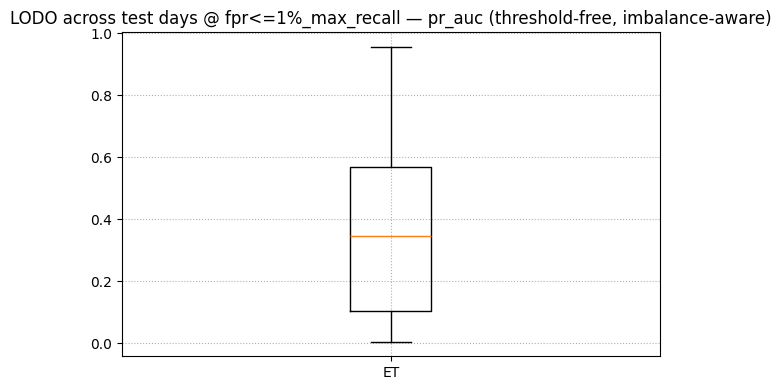

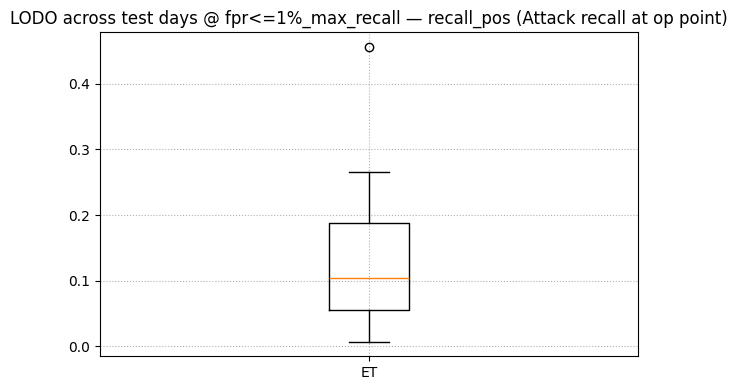

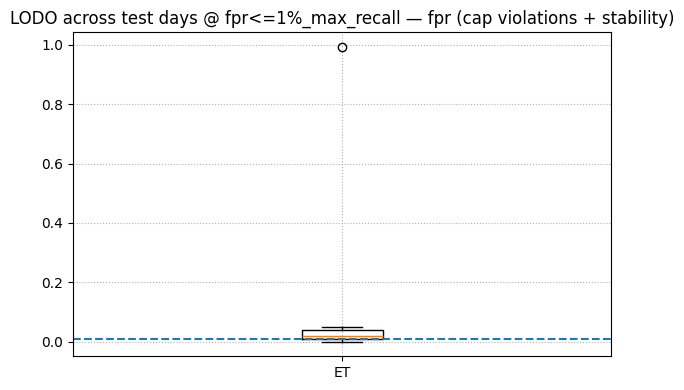

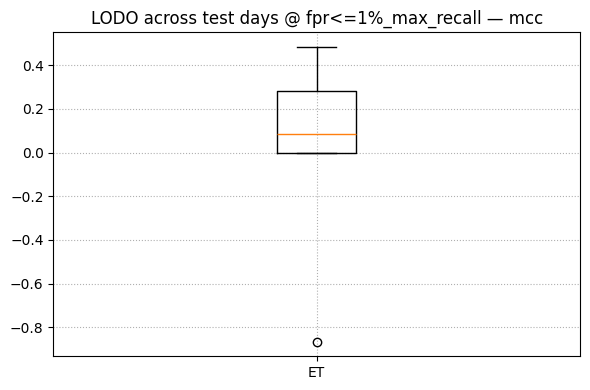


[ET] Representative days (worst + median + best) by pr_auc:


,model,pick,test_day,pr_auc
0,ET,worst,df_parquet_Web2_Fri_23,0.005340
1,ET,median,df_parquet_Infil2_Thu_01,0.344209
2,ET,best,df_parquet_DDoS1_Tue_20,0.955225


[ET] rep_days = ['df_parquet_Web2_Fri_23', 'df_parquet_Infil2_Thu_01', 'df_parquet_DDoS1_Tue_20']

[ET] per-subtype attack recall @A (fpr<=1%_max_recall) for test_day=df_parquet_Web2_Fri_23


,subtype,n,share_of_attacks,tp,fn,recall,test_day,split_mode
0,BruteForce,490,0.90573,3,487,0.006122,df_parquet_Web2_Fri_23,LODO
1,Web,51,0.09427,1,50,0.019608,df_parquet_Web2_Fri_23,LODO



[ET] per-subtype attack recall @A (fpr<=1%_max_recall) for test_day=df_parquet_Infil2_Thu_01


,subtype,n,share_of_attacks,tp,fn,recall,test_day,split_mode
0,Infiltration,62034,1.0,6960,55074,0.112197,df_parquet_Infil2_Thu_01,LODO



[ET] per-subtype attack recall @A (fpr<=1%_max_recall) for test_day=df_parquet_DDoS1_Tue_20


,subtype,n,share_of_attacks,tp,fn,recall,test_day,split_mode
0,DDoS,575364,1.0,262327,313037,0.455932,df_parquet_DDoS1_Tue_20,LODO


[ET] split_mode=LODO Xtr_raw=4,439,194 tune_size_target=30,000 Xt_actual=30,000 unique_days=7
[ET] FINAL fit_cap=300,000  Xfit_actual=300,000


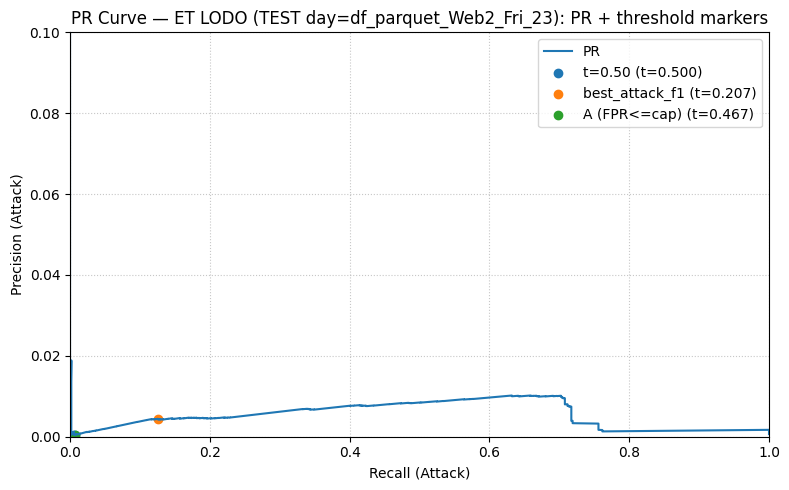

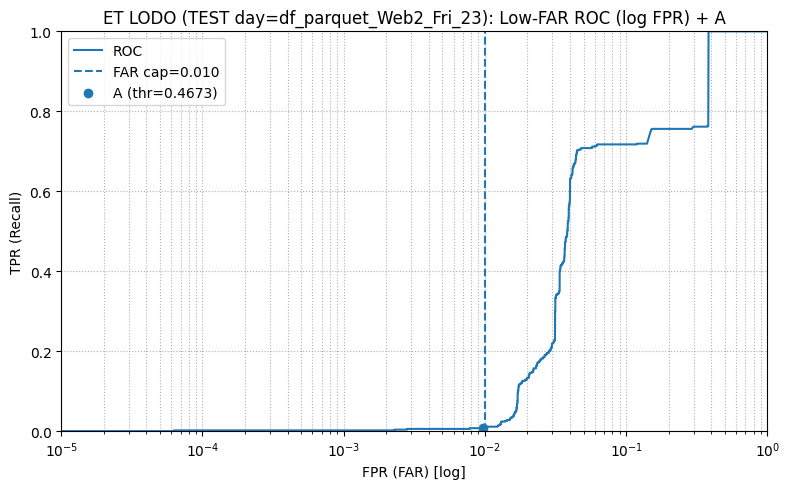

[ET] split_mode=LODO Xtr_raw=5,019,429 tune_size_target=30,000 Xt_actual=30,000 unique_days=7
[ET] FINAL fit_cap=300,000  Xfit_actual=300,000


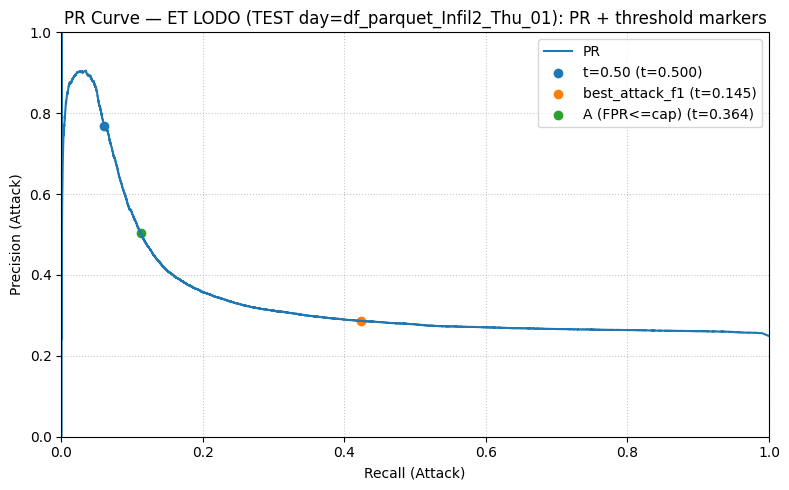

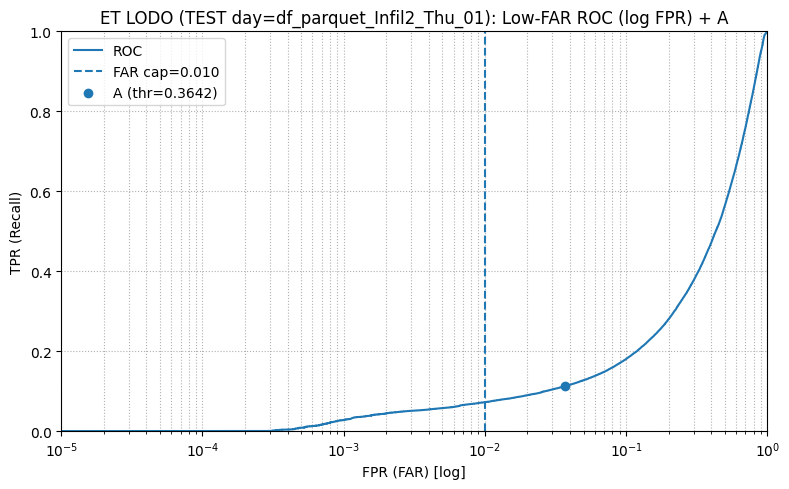

[ET] split_mode=LODO Xtr_raw=4,313,753 tune_size_target=30,000 Xt_actual=30,000 unique_days=7
[ET] FINAL fit_cap=300,000  Xfit_actual=300,000


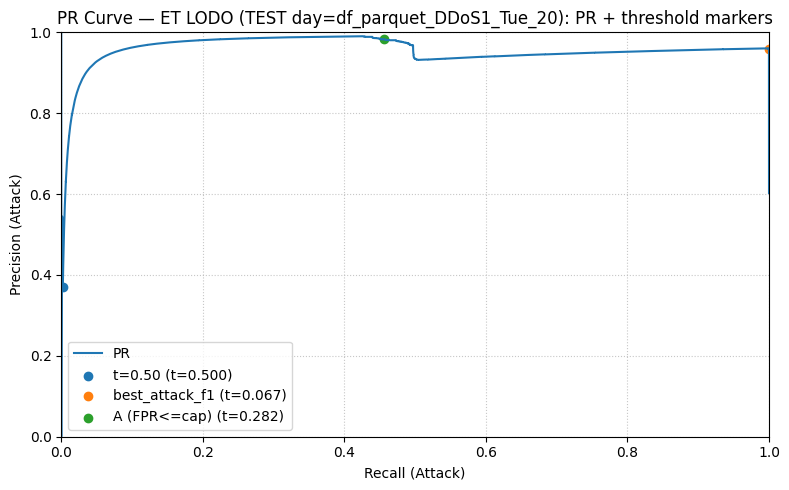

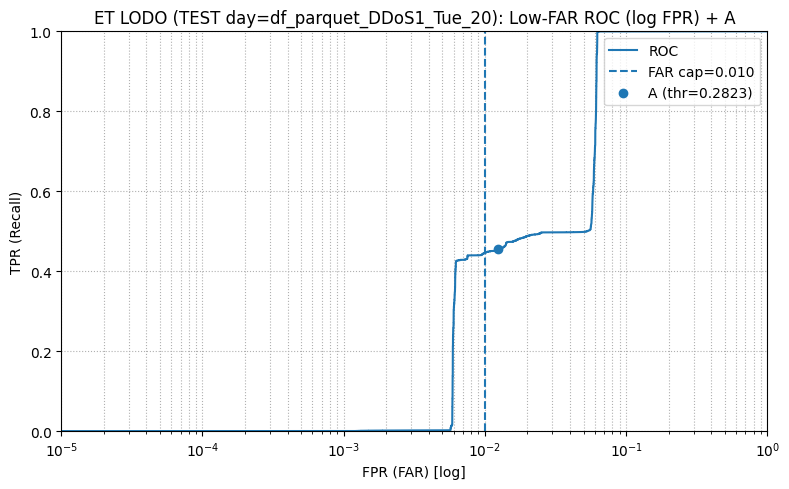

In [194]:
# F) POST-LODO PLOTTING

MAIN_THR_LABEL = "fpr<=1%_max_recall"
PICK_METRIC = "pr_auc"   # median/worst by pr_auc

# ---------- FILL-IN (change for each model) ----------

MODEL_NAME = "ET"                  # e.g., "KNN", "DT", "ET", "RF"
DF_LODO     = results_et_lodo       # our LODO results df for this model (ONLY LODO)
RUN_FOLD_FN = run_et_fold           # the model runner function (must match run_*_fold signature)

KNOBS_FN    = get_et_mode_knobs
kn = KNOBS_FN("LODO")

RUNNER_KWARGS = dict(
    # keep aligned with our runner signature
    fit_cap_final=None,
    val_eval_cap_final=ET_VAL_EVAL_CAP_FINAL,
    test_eval_cap_final=ET_TEST_EVAL_CAP_FINAL,

    do_calibrate=ET_DO_CALIBRATE,
    cal_method=ET_CAL_METHOD,
    cal_cv=ET_CAL_CV,
    
    # if our runner uses mode knobs (optional; safe because we filter kwargs)
    tune_cap_local=kn["tune_cap"],
    tune_frac_local=kn["tune_frac"],
    cv_splits_local=kn["cv_splits"],
    # n_iter_* key depends on the runner; include it if our runner has it
    n_iter_et=kn["n_iter"],
)

# ---------- END FILL-IN ----------


# 1) Boxplots across days (ONLY 4 metrics)
plot_lodo_distributions_for_model(
    DF_LODO, model_name=MODEL_NAME,
    thr_label=MAIN_THR_LABEL,
    fpr_cap=MAX_FPR_CAP,
    metrics=("pr_auc", "recall_pos", "fpr", "mcc")
)

# 2) Representative days (worst + median + best)
picks_df, rep_days = pick_best_median_worst_days_for_model(
    DF_LODO,
    model_name=MODEL_NAME,
    thr_label=MAIN_THR_LABEL,
    metric=PICK_METRIC
)
print(f"\n[{MODEL_NAME}] Representative days (worst + median + best) by {PICK_METRIC}:")
display(picks_df)
print(f"[{MODEL_NAME}] rep_days =", rep_days)

# Appendix tables (only worst / median / best days)
if "et_subtype_lodo_all" in globals() and not et_subtype_lodo_all.empty:
    for d in rep_days:
        print(f"\n[ET] per-subtype attack recall @A ({MAIN_THR_LABEL}) for test_day={d}")
        df_d = et_subtype_lodo_all[et_subtype_lodo_all["test_day"] == d].copy()
        df_d = df_d.sort_values(["n", "recall"], ascending=[False, True]).reset_index(drop=True)
        display(df_d)
else:
    print("\n[ET] No stored per-subtype LODO tables found. Run ET Block E first.")
    

# 3) Representative-day plots: ONLY PR (+ markers) and Low-FAR ROC (log FPR) + A
replot_representative_days_lodo_minimal(
    model_name=MODEL_NAME,
    rep_days=rep_days,
    run_fold_fn=RUN_FOLD_FN,
    runner_kwargs=RUNNER_KWARGS,
    far_cap=MAX_FPR_CAP,
    thr_label_A="fpr<=1%_max_recall"
)

# END ET PIPELINE

### 6.b) AdaBoost fold runner 

In [199]:
# A) ADABOOST runtime knobs (LODO vs MIXED)

# FAST mode caps (smoke tests)
ADA_FIT_CAP_FAST          = 200_000
ADA_VAL_EVAL_CAP_FAST     = 200_000
ADA_TEST_EVAL_CAP_FAST    = 200_000

# FULL mode knobs - LODO
ADA_N_ITER_TUNE_LODO      = 10
ADA_TUNE_CAP_LODO         = 100_000
ADA_TUNE_FRAC_LODO        = 0.10
ADA_CV_SPLITS_LODO        = 3
ADA_FIT_CAP_FINAL_LODO    = 400_000

# FULL mode knobs - MIXED
ADA_N_ITER_TUNE_MIXED     = 30
ADA_TUNE_CAP_MIXED        = 200_000
ADA_TUNE_FRAC_MIXED       = 0.20
ADA_CV_SPLITS_MIXED       = 5
ADA_FIT_CAP_FINAL_MIXED   = 1_000_000

# EVAL caps for FULL mode (None => evaluate full split)
ADA_VAL_EVAL_CAP_FINAL    = None
ADA_TEST_EVAL_CAP_FINAL   = None

# Optional: override n_estimators for final refit
ADA_N_ESTIMATORS_FINAL    = None  # e.g. 600, or None

# Optional calibration knobs
ADA_DO_CALIBRATE          = False
ADA_CAL_METHOD            = "sigmoid"
ADA_CAL_CV                = 3

# Optional: force dense after preprocessor (only if you hit sparse-related issues)
ADA_FORCE_DENSE           = False

# Global operating cap
# MAX_FPR_CAP = 0.01

def get_ada_mode_knobs(split_mode: str):
    if split_mode == "MIXED":
        return dict(
            n_iter=ADA_N_ITER_TUNE_MIXED,
            tune_cap=ADA_TUNE_CAP_MIXED,
            tune_frac=ADA_TUNE_FRAC_MIXED,
            cv_splits=ADA_CV_SPLITS_MIXED,
            fit_cap_final=ADA_FIT_CAP_FINAL_MIXED,
        )
    return dict(
        n_iter=ADA_N_ITER_TUNE_LODO,
        tune_cap=ADA_TUNE_CAP_LODO,
        tune_frac=ADA_TUNE_FRAC_LODO,
        cv_splits=ADA_CV_SPLITS_LODO,
        fit_cap_final=ADA_FIT_CAP_FINAL_LODO,
    )


In [200]:
# B) ADABOOST fold runner 

# Optional: dense conversion helper (only used if ADA_FORCE_DENSE=True)
try:
    from scipy import sparse
    from sklearn.preprocessing import FunctionTransformer
    to_dense_if_sparse = FunctionTransformer(
        lambda X: X.toarray() if sparse.issparse(X) else X,
        accept_sparse=True
    )
except Exception:
    to_dense_if_sparse = None


def _cap_for_fit_ada(X, y, g, cap, split_mode="LODO", seed=42):
    if cap is None:
        return X, y, g
    if split_mode == "MIXED":
        return cap_rows(X, y, g, cap, seed=seed)  # no day-balancing in MIXED

    # LODO: prefer day-balanced when available
    if "cap_rows_day_balanced" in globals():
        try:
            return cap_rows_day_balanced(X, y, g, cap, seed=seed, min_per_day=1)
        except TypeError:
            return cap_rows_day_balanced(X, y, g, cap, seed=seed)
    return cap_rows(X, y, g, cap, seed=seed)


def _cap_for_eval_ada(X, y, g, cap, seed=42):
    # FIX: cap=None must be no-op (RF-style)
    if cap is None:
        return X, y, g
    return cap_rows(X, y, g, cap, seed=seed)


def _safe_partial_auc(y_true, y_score, max_fpr=0.01):
    y_score = np.asarray(y_score)
    if y_score.ndim == 2 and y_score.shape[1] >= 2:
        y_score = y_score[:, 1]
    try:
        return roc_auc_score(y_true, y_score, max_fpr=max_fpr)
    except TypeError:
        return roc_auc_score(y_true, y_score)
    except ValueError:
        return 0.5


def _get_calibration_splits(split_mode, Xfit, yfit, gfit, cal_cv, seed):
    if not cal_cv or int(cal_cv) < 2:
        return None

    if split_mode == "LODO":
        gfit_arr = np.asarray(gfit)
        uniq_days = np.unique(gfit_arr)
        if len(uniq_days) < 2:
            return None
        n_splits = min(int(cal_cv), len(uniq_days))
        gkf = GroupKFold(n_splits=n_splits)
        return list(gkf.split(Xfit, yfit, groups=gfit_arr))

    # MIXED
    yfit_arr = np.asarray(yfit).astype(int)
    n_pos = int((yfit_arr == 1).sum())
    n_neg = int((yfit_arr == 0).sum())
    if min(n_pos, n_neg) < 2:
        return None
    n_splits = min(int(cal_cv), n_pos, n_neg)
    skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=seed)
    return list(skf.split(Xfit, yfit_arr))


def run_ada_fold(
    Xtr_raw, ytr, gtr,
    Xva_raw, yva, gva,
    Xte_raw, yte, gte,
    preprocessor,
    model_name="ADA",
    max_fpr_cap=0.01,

    fast_mode=False,

    fit_cap_fast=ADA_FIT_CAP_FAST,
    fit_cap_final=None,

    val_eval_cap_fast=ADA_VAL_EVAL_CAP_FAST,
    test_eval_cap_fast=ADA_TEST_EVAL_CAP_FAST,
    val_eval_cap_final=ADA_VAL_EVAL_CAP_FINAL,
    test_eval_cap_final=ADA_TEST_EVAL_CAP_FINAL,

    n_estimators_final=ADA_N_ESTIMATORS_FINAL,

    do_calibrate=ADA_DO_CALIBRATE,
    cal_method=ADA_CAL_METHOD,
    cal_cv=ADA_CAL_CV,

    n_iter_ada=None,
    split_mode="LODO",

    tune_cap_local=None,
    tune_frac_local=None,
    cv_splits_local=None,
):
    rs = random_state
    kn = get_ada_mode_knobs(split_mode)

    if fit_cap_final is None:
        fit_cap_final = int(kn["fit_cap_final"])

    tcap  = int(kn["tune_cap"] if tune_cap_local is None else tune_cap_local)
    tfrac = float(kn["tune_frac"] if tune_frac_local is None else tune_frac_local)
    n_iter_ada = int(kn["n_iter"] if n_iter_ada is None else n_iter_ada)
    spl = int(kn["cv_splits"] if cv_splits_local is None else cv_splits_local)

    tune_size = int(min(tcap, max(5_000, tfrac * len(Xtr_raw))))

    Xt, yt, gt = _cap_for_fit_ada(
        Xtr_raw, ytr, gtr,
        cap=tune_size,
        split_mode=split_mode,
        seed=rs
    )
    gt_arr = np.asarray(gt)

    print(
        f"[{model_name}] split_mode={split_mode} Xtr_raw={len(Xtr_raw):,} "
        f"tune_size_target={tune_size:,} Xt_actual={len(Xt):,} "
        f"unique_days={len(np.unique(gt_arr))}"
    )

    # ---------------- FAST MODE ----------------
    if fast_mode:
        Xfit, yfit, gfit = _cap_for_fit_ada(
            Xtr_raw, ytr, gtr,
            cap=fit_cap_fast,
            split_mode=split_mode,
            seed=rs
        )
        print(f"[{model_name}] FAST fit_cap={fit_cap_fast:,} Xfit_actual={len(Xfit):,}")

        stump = DecisionTreeClassifier(
            max_depth=1,
            min_samples_leaf=1,
            ccp_alpha=0.0,
            class_weight="balanced",
            random_state=rs
        )

        steps = [("prep", preprocessor)]
        if ADA_FORCE_DENSE and (to_dense_if_sparse is not None):
            steps.append(("dense", to_dense_if_sparse))
        steps.append(("clf", AdaBoostClassifier(
            estimator=stump,
            n_estimators=300,
            learning_rate=0.5,
            random_state=rs
        )))

        best_pipe = Pipeline(steps=steps)
        best_pipe.fit(Xfit, yfit)

        best_params = {
            "FAST_MODE": True,
            "split_mode": split_mode,
            "fit_cap_fast": fit_cap_fast,
            "clf__n_estimators": 300,
            "clf__learning_rate": 0.5,
            "clf__estimator__max_depth": 1,
            "clf__estimator__class_weight": "balanced",
            "scoring_used": "N/A_FAST",
            "calibrated": False,
        }

        model = best_pipe

    # ---------------- FULL MODE ----------------
    else:
        # CV: use helper if present; else fallback
        if "get_inner_cv" in globals():
            cv = get_inner_cv(
                split_mode,
                y=np.asarray(yt).astype(int),
                groups=gt_arr,
                default_splits=spl,
                seed=rs
            )
        else:
            if split_mode == "MIXED":
                cv = StratifiedKFold(n_splits=max(2, spl), shuffle=True, random_state=rs)
            else:
                if len(np.unique(gt_arr)) < 2:
                    raise ValueError("Not enough unique day groups in tuning subset for GroupKFold (LODO).")
                cv = GroupKFold(n_splits=min(spl, len(np.unique(gt_arr))))

        if split_mode == "LODO" and len(np.unique(gt_arr)) < 2:
            raise ValueError("Not enough unique day groups in tuning subset for GroupKFold (LODO).")

        if split_mode == "MIXED":
            scoring_used = make_scorer(_safe_partial_auc, needs_proba=True, max_fpr=max_fpr_cap)
            scoring_tag  = "partial_auc@max_fpr"
        else:
            scoring_used = "average_precision"
            scoring_tag  = "average_precision"

        base_tree = DecisionTreeClassifier(random_state=rs)

        param_dist = {
            "clf__n_estimators": randint(200, 801),
            "clf__learning_rate": loguniform(0.02, 1.0),

            "clf__estimator__max_depth": [1, 2, 3],
            "clf__estimator__min_samples_leaf": randint(1, 21),
            "clf__estimator__ccp_alpha": loguniform(1e-8, 1e-2),
            "clf__estimator__class_weight": [None, "balanced"],
        }

        steps = [("prep", preprocessor)]
        if ADA_FORCE_DENSE and (to_dense_if_sparse is not None):
            steps.append(("dense", to_dense_if_sparse))
        steps.append(("clf", AdaBoostClassifier(estimator=base_tree, random_state=rs)))

        search = RandomizedSearchCV(
            estimator=Pipeline(steps=steps),
            param_distributions=param_dist,
            n_iter=int(n_iter_ada),
            scoring=scoring_used,
            error_score=0.0,
            cv=cv,
            n_jobs=-1,
            random_state=rs,
            refit=True,
            verbose=0
        )

        if split_mode == "LODO":
            search.fit(Xt, yt, groups=gt_arr)
        else:
            search.fit(Xt, yt)

        Xfit, yfit, gfit = _cap_for_fit_ada(
            Xtr_raw, ytr, gtr,
            cap=fit_cap_final,
            split_mode=split_mode,
            seed=rs
        )
        print(f"[{model_name}] FINAL fit_cap={fit_cap_final:,} Xfit_actual={len(Xfit):,}")

        best_pipe = search.best_estimator_

        if n_estimators_final is not None:
            best_pipe.set_params(clf__n_estimators=int(n_estimators_final))

        best_pipe.fit(Xfit, yfit)

        best_params = dict(search.best_params_)
        best_params.update({
            "split_mode": split_mode,
            "fit_cap_final": int(fit_cap_final),
            "tune_size": int(tune_size),
            "cv_splits": int(getattr(cv, "n_splits", spl)),
            "n_iter": int(n_iter_ada),
            "scoring_used": scoring_tag,
            "calibrated": False,
        })
        if n_estimators_final is not None:
            best_params["n_estimators_final_override"] = int(n_estimators_final)

        model = best_pipe

        # ---- OPTIONAL CALIBRATION (split-safe) ----
        if do_calibrate:
            splits = _get_calibration_splits(split_mode, Xfit, yfit, gfit, cal_cv=cal_cv, seed=rs)
            if splits is not None:
                cal = CalibratedClassifierCV(
                    estimator=clone(best_pipe),
                    method=cal_method,
                    cv=splits
                )
                cal.fit(Xfit, yfit)
                model = cal
                best_params["calibrated"] = True
                best_params["cal_method"] = cal_method
                best_params["cal_cv"] = len(splits)
            else:
                best_params["calibrated"] = False
                best_params["calibration_skipped_reason"] = "insufficient_data_for_calibration_cv"

    # ---------------- EVAL CAPS ----------------
    if fast_mode:
        Xva_eval, yva_eval, _ = _cap_for_eval_ada(Xva_raw, yva, gva, val_eval_cap_fast, seed=rs)
        Xte_eval, yte_eval, _ = _cap_for_eval_ada(Xte_raw, yte, gte, test_eval_cap_fast, seed=rs)
    else:
        Xva_eval, yva_eval, _ = _cap_for_eval_ada(Xva_raw, yva, gva, val_eval_cap_final, seed=rs)
        Xte_eval, yte_eval, _ = _cap_for_eval_ada(Xte_raw, yte, gte, test_eval_cap_final, seed=rs)

    # ---------------- THRESHOLD TUNING ON VAL ----------------
    score_va = get_scores(model, Xva_eval)
    if "log_if_degenerate_scores" in globals():
        log_if_degenerate_scores(score_va, model_name, split_name="VAL")

    t_f1, _ = pick_threshold_best_attack_f1(yva_eval, score_va)
    t_fpr = pick_threshold_fpr_constrained_max_recall(yva_eval, score_va, max_fpr=max_fpr_cap)
    t_r95 = pick_threshold_recall_target_min_fpr(yva_eval, score_va, recall_target=0.95, max_fpr=max_fpr_cap)
    t_r98 = pick_threshold_recall_target_min_fpr(yva_eval, score_va, recall_target=0.98, max_fpr=max_fpr_cap)

    t_r95_any = pick_threshold_recall_target_min_fpr(yva_eval, score_va, recall_target=0.95, max_fpr=1.0)
    t_r98_any = pick_threshold_recall_target_min_fpr(yva_eval, score_va, recall_target=0.98, max_fpr=1.0)

    thresholds = {
        "t=0.50": 0.50,
        "best_attack_f1": t_f1,
        "fpr<=1%_max_recall": t_fpr,
        "recall>=0.95_min_fpr": t_r95,
        "recall>=0.98_min_fpr": t_r98,
        "recall>=0.95_min_fpr_NO_CAP": t_r95_any,
        "recall>=0.98_min_fpr_NO_CAP": t_r98_any,
    }
    feas = {k: (v is not None) for k, v in thresholds.items()}
    thresholds_valid = {k: v for k, v in thresholds.items() if v is not None}

    # realized VAL FPR at VAL-selected fpr<=1% threshold
    t_fpr_sel = thresholds.get("fpr<=1%_max_recall", None)
    if t_fpr_sel is not None:
        yhat_val = (score_va >= float(t_fpr_sel)).astype(int)
        tn, fp, fn, tp = confusion_matrix(yva_eval, yhat_val, labels=[0, 1]).ravel()
        best_params["val_fpr_realized_at_fpr1_thr"] = float(fp / (fp + tn + 1e-12))
    else:
        best_params["val_fpr_realized_at_fpr1_thr"] = None

    # ---------------- EVALUATE ON TEST ----------------
    score_te = get_scores(model, Xte_eval)
    if "log_if_degenerate_scores" in globals():
        log_if_degenerate_scores(score_te, model_name, split_name="TEST")

    if t_fpr_sel is not None:
        yhat_te = (score_te >= float(t_fpr_sel)).astype(int)
        tn, fp, fn, tp = confusion_matrix(yte_eval, yhat_te, labels=[0, 1]).ravel()
        best_params["test_fpr_realized_at_fpr1_thr"] = float(fp / (fp + tn + 1e-12))
    else:
        best_params["test_fpr_realized_at_fpr1_thr"] = None

    df = evaluate_thresholds(yte_eval, score_te, thresholds_valid, name=model_name)

    if do_plots:
        plot_pr_curve_with_thresholds(yte_eval, score_te, thresholds_valid, model_name=model_name)
        plot_roc_curve(yte_eval, score_te, model_name=model_name)
        plot_det_curve(yte_eval, score_te, model_name=model_name)
        plot_score_distribution(yte_eval, score_te, model_name=model_name, bins=100)

    feas["__artifacts__"] = {"score_te": score_te, "yte_eval": yte_eval}

    return df, best_params, thresholds, feas


In [ ]:
# C1) ADABOOST algo test — MIXED (FAST)

RUN_MODELS["ADA"] = True

old_do_plots = do_plots
do_plots = False

split_mode = "MIXED"
kn = get_ada_mode_knobs(split_mode)

print("\nAlgo test (MIXED)")

Xtr_raw_m, ytr_m, gtr_m, Xva_raw_m, yva_m, gva_m, Xte_raw_m, yte_m, gte_m, meta_m = build_mixed_fold(
    registry=REGISTRY,
    seed=MIXED_RANDOM_STATE,
    test_size=MIXED_TEST_SIZE,
    val_size=MIXED_VAL_SIZE,
    use_rare_injection=MIXED_USE_RARE_ALLOCATION,
    rare_subtypes=RARE_SUBTYPES,
    rare_n_test=RARE_N_TEST_PER_SUBTYPE,
    rare_n_val=RARE_N_VAL_PER_SUBTYPE,
)

preprocessor_m, prep_dbg_m = build_preprocessor(Xtr_raw_m, meta_m["feature_cols"])
print("MIXED preprocessor debug:", prep_dbg_m)

if RUN_MODELS.get("ADA", False):
    ada_df_m_fast, ada_best_params_m_fast, ada_thresholds_m_fast, ada_feas_m_fast = run_ada_fold(
        Xtr_raw_m, ytr_m, gtr_m,
        Xva_raw_m, yva_m, gva_m,
        Xte_raw_m, yte_m, gte_m,
        preprocessor_m,
        model_name="ADA",
        fast_mode=True,
        fit_cap_fast=ADA_FIT_CAP_FAST,
        val_eval_cap_fast=ADA_VAL_EVAL_CAP_FAST,
        test_eval_cap_fast=ADA_TEST_EVAL_CAP_FAST,
        max_fpr_cap=MAX_FPR_CAP,
        split_mode=split_mode,

        n_iter_ada=kn["n_iter"],
        tune_cap_local=kn["tune_cap"],
        tune_frac_local=kn["tune_frac"],
        cv_splits_local=kn["cv_splits"],

        do_calibrate=ADA_DO_CALIBRATE,
        cal_method=ADA_CAL_METHOD,
        cal_cv=ADA_CAL_CV,
    )
    print("ADA (MIXED/FAST) best params:", ada_best_params_m_fast)
    print("ADA (MIXED/FAST) thresholds:", ada_thresholds_m_fast)
    print("ADA (MIXED/FAST) feasibility:", {k: v for k, v in ada_feas_m_fast.items() if k != "__artifacts__"})
    display(ada_df_m_fast)

do_plots = old_do_plots


In [ ]:
# C2) ADABOOST algo test — LODO (FAST)


RUN_MODELS["ADA"] = True

old_do_plots = do_plots
do_plots = False

ALGO_TEST_DAY = TEST_DAYS[0]
print("Algo test day (LODO):", ALGO_TEST_DAY)

split_mode = "LODO"
kn = get_ada_mode_knobs(split_mode)

Xtr_raw, ytr, gtr, Xva_raw, yva, gva, Xte_raw, yte, gte, meta = build_fold(
    registry=REGISTRY, val_days=VAL_DAYS, test_day=ALGO_TEST_DAY
)
preprocessor, prep_dbg = build_preprocessor(Xtr_raw, meta["feature_cols"])
print("LODO preprocessor debug:", prep_dbg)

if RUN_MODELS.get("ADA", False):
    ada_df, ada_best_params, ada_thresholds, ada_feas = run_ada_fold(
        Xtr_raw, ytr, gtr,
        Xva_raw, yva, gva,
        Xte_raw, yte, gte,
        preprocessor,
        model_name="ADA",
        fast_mode=True,
        fit_cap_fast=ADA_FIT_CAP_FAST,
        val_eval_cap_fast=ADA_VAL_EVAL_CAP_FAST,
        test_eval_cap_fast=ADA_TEST_EVAL_CAP_FAST,
        max_fpr_cap=MAX_FPR_CAP,
        split_mode=split_mode,

        # keep knobs consistent even if FAST doesn’t use them
        n_iter_ada=kn["n_iter"],
        tune_cap_local=kn["tune_cap"],
        tune_frac_local=kn["tune_frac"],
        cv_splits_local=kn["cv_splits"],

        do_calibrate=ADA_DO_CALIBRATE,
        cal_method=ADA_CAL_METHOD,
        cal_cv=ADA_CAL_CV,
    )
    print("ADA (LODO/FAST) best params:", ada_best_params)
    print("ADA (LODO/FAST) thresholds:", ada_thresholds)
    print("ADA (LODO/FAST) feasibility:", {k: v for k, v in ada_feas.items() if k != "__artifacts__"})
    display(ada_df)

do_plots = old_do_plots


MIXED preprocessor debug: {'log1p_cols': ['Active Mean', 'Active Std', 'Bwd IAT Total', 'Bwd IAT Min', 'Packet Length Variance', 'Packet Length Min', 'Bwd Packets/s', 'Down/Up Ratio', 'FIN Flag Count', 'Flow Bytes/s', 'Flow IAT Std', 'Fwd IAT Min', 'Fwd IAT Std', 'Fwd Packet Length Std', 'Fwd Packets/s', 'Fwd URG Flags', 'Idle Min', 'RST Flag Count', 'SYN Flag Count', 'URG Flag Count'], 'scale_cols': ['ACK Flag Count', 'Init Bwd Win Bytes', 'Init Fwd Win Bytes', 'PSH Flag Count'], 'has_protocol': True}
[ADA] split_mode=MIXED Xtr_raw=4,661,671 tune_size_target=200,000 Xt_actual=200,000 unique_days=10
[ADA] FINAL fit_cap=1,000,000 Xfit_actual=1,000,000


,stage2_skipped,n_train_attacks,n_test_attacks,n_classes,classes,oracle_n_test_classes,oracle_macro_f1,oracle_weighted_f1,oracle_acc,oracle_bacc,gated_available,gate_thr,n_flagged_total,n_tp_attacks,gated_macro_f1_tp,joint_correct_rate,model,split_mode,test_day
0,False,931366,266105,6,"[Bot, BruteForce, DDoS, DoS, Infiltration, OTHER]",6,0.784266,0.964003,0.965236,0.776001,True,0.467149,253298,242801,0.716978,0.900295,ADABOOST,MIXED,MIXED


ADABOOST attack type stage 2 result: {'stage2_skipped': False, 'n_train_attacks': 931366, 'n_test_attacks': 266105, 'n_classes': 6, 'classes': ['Bot', 'BruteForce', 'DDoS', 'DoS', 'Infiltration', 'OTHER'], 'oracle_n_test_classes': 6, 'oracle_macro_f1': 0.7842657702606525, 'oracle_weighted_f1': 0.9640025033298066, 'oracle_acc': 0.9652355273294376, 'oracle_bacc': 0.7760005620872072, 'gated_available': True, 'gate_thr': 0.4671489770436876, 'n_flagged_total': 253298, 'n_tp_attacks': 242801, 'gated_macro_f1_tp': 0.7169777802015401, 'joint_correct_rate': 0.9002949963360327, 'model': 'ADABOOST', 'split_mode': 'MIXED', 'test_day': 'MIXED'}

=== MIXED (ADA): best_params ===
{'clf__estimator__ccp_alpha': np.float64(1.7670169402947916e-06), 'clf__estimator__class_weight': None, 'clf__estimator__max_depth': 3, 'clf__estimator__min_samples_leaf': 11, 'clf__learning_rate': np.float64(0.42237831933647885), 'clf__n_estimators': 220, 'split_mode': 'MIXED', 'fit_cap_final': 1000000, 'tune_size': 200000,

,thr,tn,fp,fn,tp,precision_pos,recall_pos,f1_pos,macro_f1,fpr,fnr,mcc,balanced_acc,roc_auc,pr_auc,model,thr_label,test_day,split_mode
0,0.500000,1064235,1567,25073,241032,0.993541,0.905778,0.947632,0.967635,0.001470,0.094222,0.936831,0.952154,0.982162,0.965084,ADA,t=0.50,MIXED,MIXED
1,0.515504,1065003,799,25335,240770,0.996692,0.904793,0.948522,0.968201,0.000750,0.095207,0.938108,0.952022,0.982162,0.965084,ADA,best_attack_f1,MIXED,MIXED
2,0.467149,1055305,10497,23304,242801,0.958559,0.912426,0.934923,0.959580,0.009849,0.087574,0.919604,0.951288,0.982162,0.965084,ADA,fpr<=1%_max_recall,MIXED,MIXED
3,0.409445,918271,147531,12977,253128,0.631779,0.951234,0.759273,0.839450,0.138423,0.048766,0.708654,0.906406,0.982162,0.965084,ADA,recall>=0.95_min_fpr_NO_CAP,MIXED,MIXED
4,0.395362,712712,353090,5191,260914,0.424939,0.980493,0.592913,0.696025,0.331290,0.019507,0.520746,0.824601,0.982162,0.965084,ADA,recall>=0.98_min_fpr_NO_CAP,MIXED,MIXED



Total time elapsed for ADA MIXED-only run: 106.18 minutes

[ADA MIXED] Operating points (TEST)


,label,thr,fpr,recall,precision,f1,tn,fp,fn,tp
0,best_attack_f1,0.515504,0.000750,0.904793,0.996692,0.948522,1065003,799,25335,240770
1,t=0.50,0.500000,0.001470,0.905778,0.993541,0.947632,1064235,1567,25073,241032
2,A (FPR<=1%),0.467149,0.009849,0.912426,0.958559,0.934923,1055305,10497,23304,242801
3,B (Recall>=0.95 NO CAP),0.409445,0.138423,0.951234,0.631779,0.759273,918271,147531,12977,253128
4,C (Recall>=0.98),0.395362,0.331290,0.980493,0.424939,0.592913,712712,353090,5191,260914


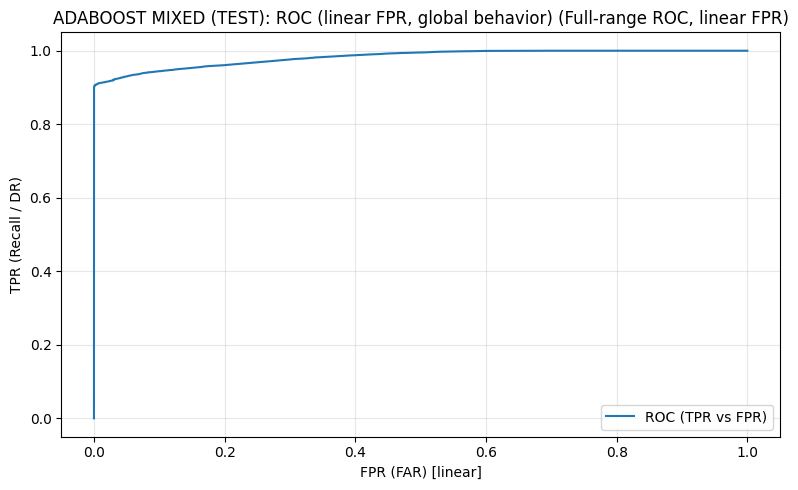

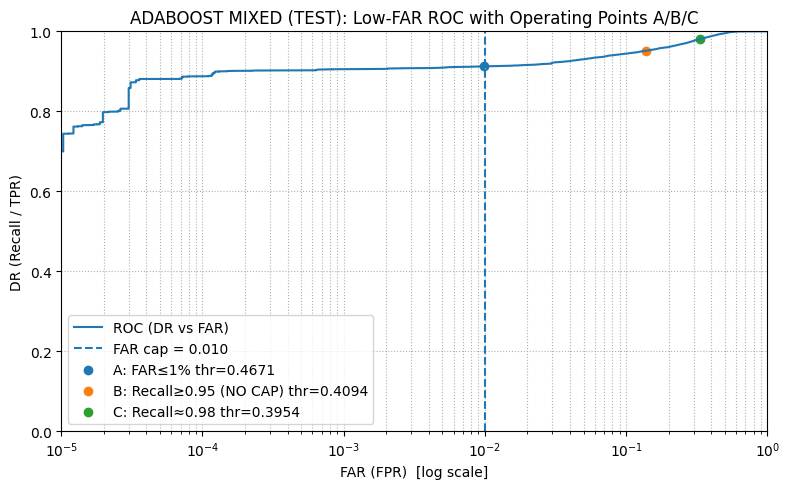

Operating Point A (FAR capped): {'thr': 0.4671489770436876, 'tn': 1055305, 'fp': 10497, 'fn': 23304, 'tp': 242801, 'precision_pos': 0.9585586937125441, 'recall_pos': 0.912425546306909, 'f1_pos': 0.9349233639389838, 'macro_f1': 0.9595804968795068, 'fpr': 0.00984892128181407, 'fnr': 0.08757445369309107, 'mcc': 0.9196042391267502, 'balanced_acc': 0.9512883125125475}
Operating Point B (Recall>=0.95 NO CAP): {'thr': 0.40944495331303077, 'tn': 918271, 'fp': 147531, 'fn': 12977, 'tp': 253128, 'precision_pos': 0.6317791438604898, 'recall_pos': 0.95123353563443, 'f1_pos': 0.7592731461206664, 'macro_f1': 0.8394502983050691, 'fpr': 0.1384225212562934, 'fnr': 0.04876646436556998, 'mcc': 0.7086539872870065, 'balanced_acc': 0.9064055071890683}
FAR cost multiplier (B vs A): 14.05x
Operating Point C (Recall≈0.98): {'thr': 0.39536191591287445, 'tn': 712712, 'fp': 353090, 'fn': 5191, 'tp': 260914, 'precision_pos': 0.4249385997485358, 'recall_pos': 0.9804926626707503, 'f1_pos': 0.5929129232856385, 'macro

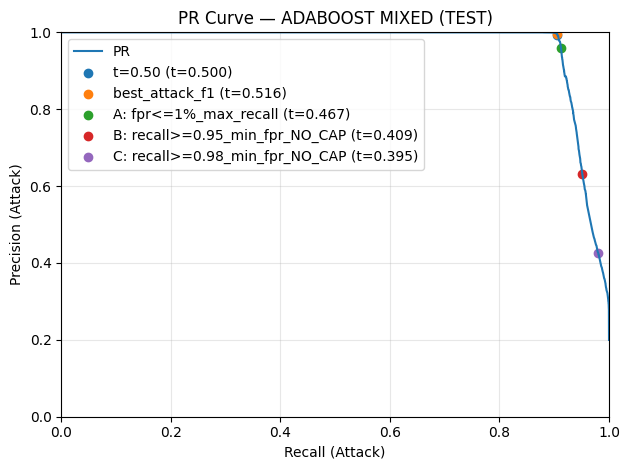

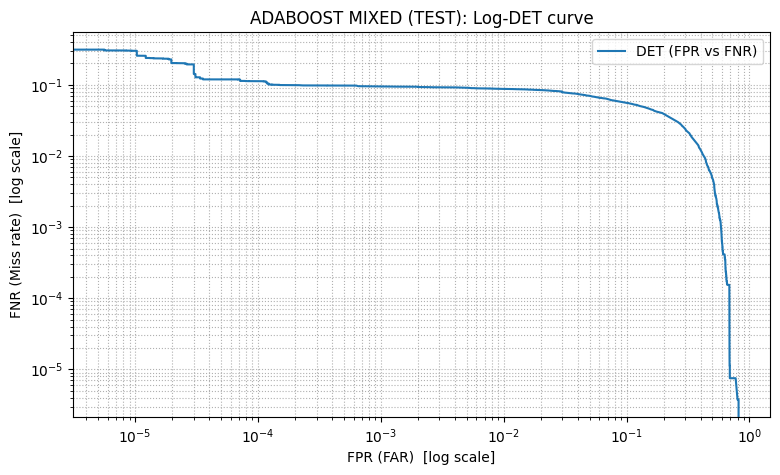

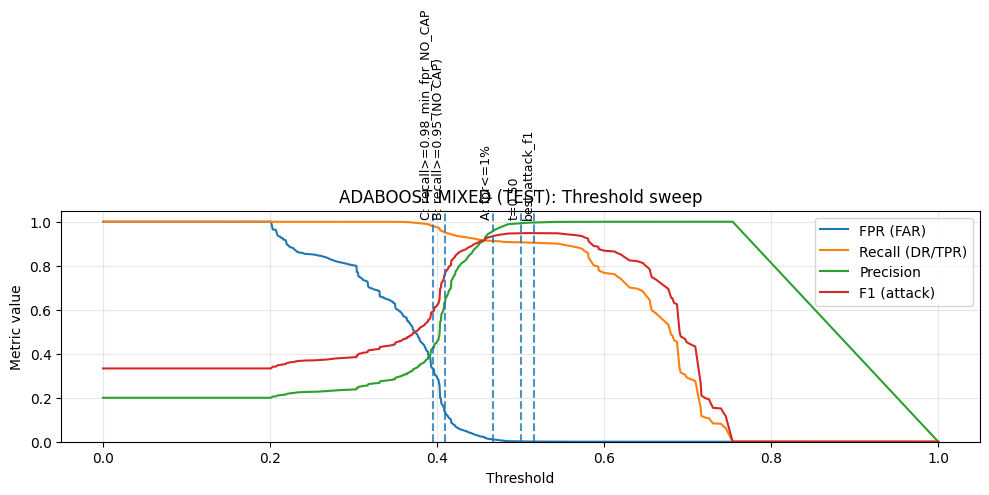

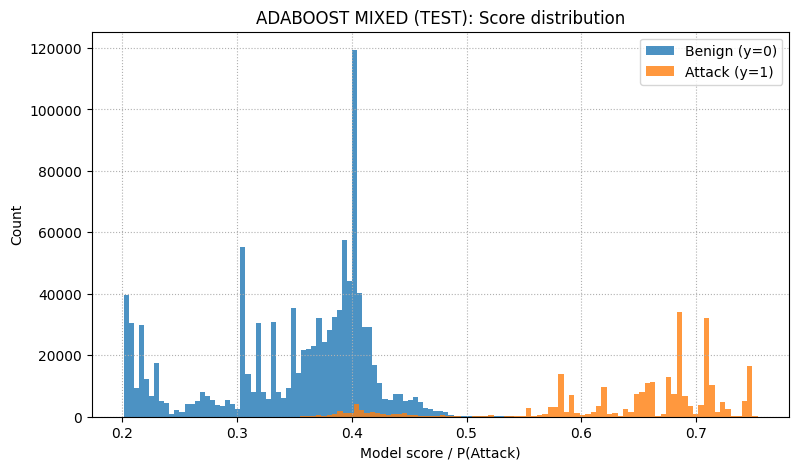


=== MIXED (ET): per-subtype attack recall @ Operating Point A (fpr<=1%) ===


,subtype,n,share_of_attacks,tp,fn,recall
0,DDoS,155400,0.583980,154818,582,0.996255
1,DoS,39179,0.147231,38977,202,0.994844
2,Bot,28902,0.108611,28715,187,0.993530
3,Infiltration,23508,0.088341,1317,22191,0.056023
4,BruteForce,19066,0.071648,18941,125,0.993444
5,Web,50,0.000188,33,17,0.660000


In [202]:
# D) ADABOOST MIXED-only (FULL) — to append later (NO recompute)


RUN_MODELS["ADA"] = True
START_TIME = time.time()

old_do_plots = do_plots
do_plots = False

MAIN_THR_LABEL = "fpr<=1%_max_recall"

split_mode = "MIXED"
kn = get_ada_mode_knobs(split_mode)

Xtr_raw_m, ytr_m, gtr_m, Xva_raw_m, yva_m, gva_m, Xte_raw_m, yte_m, gte_m, meta_m = build_mixed_fold(
    registry=REGISTRY,
    seed=MIXED_RANDOM_STATE,
    test_size=MIXED_TEST_SIZE,
    val_size=MIXED_VAL_SIZE,
    use_rare_injection=MIXED_USE_RARE_ALLOCATION,
    rare_subtypes=RARE_SUBTYPES,
    rare_n_test=RARE_N_TEST_PER_SUBTYPE,
    rare_n_val=RARE_N_VAL_PER_SUBTYPE,
)

preprocessor_m, prep_dbg_m = build_preprocessor(Xtr_raw_m, meta_m["feature_cols"])
print("MIXED preprocessor debug:", prep_dbg_m)

ada_df_m, ada_best_params_m, ada_thresholds_m, ada_feas_m = run_ada_fold(
    Xtr_raw_m, ytr_m, gtr_m,
    Xva_raw_m, yva_m, gva_m,
    Xte_raw_m, yte_m, gte_m,
    preprocessor_m,
    model_name="ADA",
    fast_mode=False,
    fit_cap_final=None,
    val_eval_cap_final=ADA_VAL_EVAL_CAP_FINAL,
    test_eval_cap_final=ADA_TEST_EVAL_CAP_FINAL,
    n_estimators_final=ADA_N_ESTIMATORS_FINAL,
    max_fpr_cap=MAX_FPR_CAP,
    split_mode=split_mode,
    n_iter_ada=None,
    tune_cap_local=kn["tune_cap"],
    tune_frac_local=kn["tune_frac"],
    cv_splits_local=kn["cv_splits"],
    do_calibrate=ADA_DO_CALIBRATE,
    cal_method=ADA_CAL_METHOD,
    cal_cv=ADA_CAL_CV,
)

# Extract attack type stage 2 results for MIXED (if applicable) and append to summary table
ada_attacktype_m = None
if DO_ATTACKTYPE_STAGE2:
    art = ada_feas_m.get("__artifacts__", {})
    score_te_m = art.get("score_te", None)
    thr_main_m = ada_thresholds_m.get(MAIN_THR_LABEL, None)

    ada_attacktype_m = run_attacktype_stage2(
        model_key="ADABOOST",
        preprocessor=preprocessor_m,
        Xtr_raw=Xtr_raw_m, ytr=ytr_m, label_raw_train=meta_m["label_raw_train"],
        Xte_raw=Xte_raw_m, yte=yte_m, label_raw_test=meta_m["label_raw_test"],
        gate_scores_te=score_te_m, gate_thr=thr_main_m,
        base_best_params=ada_best_params_m,
        min_count=ATTACKTYPE_MIN_COUNT,
        rare_set=RARE_SUBTYPES,
        other_label=ATTACKTYPE_OTHER_LABEL,
    )
    ada_attacktype_m.update({"model": "ADABOOST", "split_mode": "MIXED", "test_day": "MIXED"})
    display(pd.DataFrame([ada_attacktype_m]))
print("ADABOOST attack type stage 2 result:", ada_attacktype_m)

ada_df_m = ada_df_m.copy()
ada_df_m["test_day"] = "MIXED"
ada_df_m["split_mode"] = "MIXED"

print("\n=== MIXED (ADA): best_params ===")
print(ada_best_params_m)
print("\n=== MIXED (ADA): thresholds ===")
print(ada_thresholds_m)
print("\n=== MIXED (ADA): feasibility ===")
print({k: v for k, v in ada_feas_m.items() if k != "__artifacts__"})

display(ada_df_m)

elapsed = time.time() - START_TIME
print(f"\nTotal time elapsed for ADA MIXED-only run: {elapsed/60:.2f} minutes")

# -------------------- REQUIRED PLOTS / MIXED ONLY  --------------------
art = ada_feas_m.get("__artifacts__", {})
yte_eval_m = art.get("yte_eval", None)
score_te_m = art.get("score_te", None)

if yte_eval_m is not None and score_te_m is not None:
    thr_A = ada_thresholds_m.get("fpr<=1%_max_recall", None)
    thr_B = ada_thresholds_m.get("recall>=0.95_min_fpr_NO_CAP", None)
    thr_C, thr_C_label = _select_r98_threshold_for_plot(ada_thresholds_m)

    # Operating points table (if you have your helper)
    if "print_operating_points_table" in globals():
        op_table_dict = {
            "t=0.50": ada_thresholds_m.get("t=0.50"),
            "best_attack_f1": ada_thresholds_m.get("best_attack_f1"),
            "A (FPR<=1%)": thr_A,
            "B (Recall>=0.95 NO CAP)": thr_B,
            "C (Recall>=0.98)": thr_C,
        }
        print_operating_points_table(
            yte_eval_m, score_te_m,
            thresholds_dict=op_table_dict,
            model_name="ADA MIXED",
            sort_by="fpr"
        )

    # 1) Linear ROC (global behavior) — unzoomed
    plot_roc_curve_linear_with_operating_points(
        yte_eval_m, score_te_m,
        thresholds_dict={},  # empty => no markers
        model_name="ADABOOST MIXED (TEST): ROC (linear FPR, global behavior)"
    )

    # 2) Low-FAR ROC (headline IDS plot) with A/B/C if helper exists
    if "plot_low_far_roc_with_ops" in globals() and thr_A is not None:
        plot_low_far_roc_with_ops(
            yte_eval_m, score_te_m,
            thr_A=thr_A,
            thr_B=(thr_B if thr_B is not None else None),
            thr_C=(thr_C if thr_C is not None else None),
            far_cap=MAX_FPR_CAP,
            title="ADABOOST MIXED (TEST): Low-FAR ROC with Operating Points A/B/C"
        )

    # 3) PR curve with thresholds marked
    thr_dict_for_pr = {
        "t=0.50": ada_thresholds_m.get("t=0.50"),
        "best_attack_f1": ada_thresholds_m.get("best_attack_f1"),
        "A: fpr<=1%_max_recall": ada_thresholds_m.get("fpr<=1%_max_recall"),
        "B: recall>=0.95_min_fpr_NO_CAP": ada_thresholds_m.get("recall>=0.95_min_fpr_NO_CAP"),
    }
    if thr_C is not None:
        thr_dict_for_pr[f"C: {thr_C_label}"] = thr_C

    plot_pr_curve_with_thresholds(
        yte_eval_m, score_te_m,
        thr_dict_for_pr,
        model_name="ADABOOST MIXED (TEST)"
    )

    # 4) Log-DET curve
    plot_det(
        yte_eval_m, score_te_m,
        title="ADABOOST MIXED (TEST): Log-DET curve"
    )

    # 5) Threshold sweep with vertical lines (if helper exists)
    if "plot_threshold_sweep_metrics" in globals():
        thr_dict_for_sweep = {
            "t=0.50": ada_thresholds_m.get("t=0.50"),
            "best_attack_f1": ada_thresholds_m.get("best_attack_f1"),
            "A: fpr<=1%": ada_thresholds_m.get("fpr<=1%_max_recall"),
            "B: recall>=0.95 (NO CAP)": ada_thresholds_m.get("recall>=0.95_min_fpr_NO_CAP"),
        }
        if thr_C is not None:
            thr_dict_for_sweep[f"C: {thr_C_label}"] = thr_C
        plot_threshold_sweep_metrics(yte_eval_m, score_te_m, thresholds_dict=thr_dict_for_sweep, model_name="ADABOOST MIXED")

    # 6) Score distribution
    plot_score_hist(yte_eval_m, score_te_m, title="ADABOOST MIXED (TEST): Score distribution", bins=100)
    

    # 7) Per-subtype attack recall @ Operating Point A (if have helper + raw labels)
    label_raw_test = meta_m.get("label_raw_test", None)
    if ("per_subtype_attack_recall" in globals()
    and "map_array_to_coarse" in globals()
    and thr_A is not None
    and label_raw_test is not None):
        subtype_df = per_subtype_attack_recall(
            y_true=np.asarray(yte_eval_m),
            y_score=np.asarray(score_te_m),
            thr=float(thr_A),
            label_raw=map_array_to_coarse(np.asarray(label_raw_test)),
        )
    print("\n=== MIXED (ET): per-subtype attack recall @ Operating Point A (fpr<=1%) ===")
    display(subtype_df)

do_plots = old_do_plots

In [203]:
# E) ADABOOST LODO outer loop + append MIXED (NO recompute)


RUN_MODELS["ADA"] = True

old_do_plots = do_plots
do_plots = False

MAIN_THR_LABEL = "fpr<=1%_max_recall"
subtype_rows = []   # per-day per-subtype tables (no printing inside loop)

print("RUN_MODELS['ADA'] =", RUN_MODELS.get("ADA", None))
print("N TEST_DAYS =", len(TEST_DAYS))

all_rows = []
best_params_log = []
feas_rows = []

split_mode = "LODO"
kn = get_ada_mode_knobs(split_mode)

for test_day in TEST_DAYS:
    Xtr_raw, ytr, gtr, Xva_raw, yva, gva, Xte_raw, yte, gte, meta = build_fold(
        registry=REGISTRY, val_days=VAL_DAYS, test_day=test_day
    )
    preprocessor, _ = build_preprocessor(Xtr_raw, meta["feature_cols"])

    if RUN_MODELS.get("ADA", False):
        ada_df, ada_best_params, ada_thresholds, ada_feas = run_ada_fold(
            Xtr_raw, ytr, gtr,
            Xva_raw, yva, gva,
            Xte_raw, yte, gte,
            preprocessor,
            model_name="ADA",
            fast_mode=False,
            fit_cap_final=None,
            val_eval_cap_final=ADA_VAL_EVAL_CAP_FINAL,
            test_eval_cap_final=ADA_TEST_EVAL_CAP_FINAL,
            n_estimators_final=ADA_N_ESTIMATORS_FINAL,
            max_fpr_cap=MAX_FPR_CAP,
            split_mode=split_mode,
            n_iter_ada=None,
            tune_cap_local=kn["tune_cap"],
            tune_frac_local=kn["tune_frac"],
            cv_splits_local=kn["cv_splits"],
            do_calibrate=ADA_DO_CALIBRATE,
            cal_method=ADA_CAL_METHOD,
            cal_cv=ADA_CAL_CV,
        )


        # Optional: run attack type stage 2 per day
        if DO_ATTACKTYPE_STAGE2:
            art = ada_feas.get("__artifacts__", {})
            score_te = art.get("score_te", None)
            thr_main = ada_thresholds.get(MAIN_THR_LABEL, None)

            r = run_attacktype_stage2(
                model_key="ADABOOST",
                preprocessor=preprocessor,
                Xtr_raw=Xtr_raw, ytr=ytr, label_raw_train=meta["label_raw_train"],
                Xte_raw=Xte_raw, yte=yte, label_raw_test=meta["label_raw_test"],
                gate_scores_te=score_te, gate_thr=thr_main,
                base_best_params=ada_best_params,
                min_count=ATTACKTYPE_MIN_COUNT,
                rare_set=RARE_SUBTYPES,
                other_label=ATTACKTYPE_OTHER_LABEL,
            )
            r.update({"model": "ADABOOST", "split_mode": "LODO", "test_day": test_day})
            attacktype_rows.append(r)
            print(f"ADABOOST attack type stage 2 result for test_day={test_day}:", r)
        
        # Collect per-subtype recall @ Operating Point A (NO printing)
        art = ada_feas.get("__artifacts__", {})
        score_te = art.get("score_te", None)
        thr_A = ada_thresholds.get(MAIN_THR_LABEL, None)

        if (score_te is not None) and (thr_A is not None) and ("label_raw_test" in meta) and ("map_array_to_coarse" in globals()):
            df_sub = per_subtype_attack_recall(
                y_true=np.asarray(yte),
                y_score=np.asarray(score_te),
                thr=float(thr_A),
                label_raw=map_array_to_coarse(np.asarray(meta["label_raw_test"])),
            )
            df_sub["test_day"] = test_day
            df_sub["split_mode"] = "LODO"
            subtype_rows.append(df_sub)


        ada_df = ada_df.copy()
        ada_df["test_day"] = test_day
        ada_df["split_mode"] = "LODO"
        all_rows.append(ada_df)

        best_params_log.append({
            "model": "ADA",
            "test_day": test_day,
            "split_mode": "LODO",
            "best_params": ada_best_params
        })

        for lbl in ["fpr<=1%_max_recall", "recall>=0.95_min_fpr", "recall>=0.98_min_fpr"]:
            feas_rows.append({
                "model": "ADA",
                "test_day": test_day,
                "split_mode": "LODO",
                "thr_label": lbl,
                "feasible": bool(ada_feas.get(lbl, False))
            })

if not all_rows:
    do_plots = old_do_plots
    raise RuntimeError(
        "No rows collected.\n"
        "Most common cause: RUN_MODELS key mismatch. Use RUN_MODELS['ADA']=True and check RUN_MODELS.get('ADA', False)."
    )

results_ada_lodo = pd.concat(all_rows, ignore_index=True)

# Pooled per-subtype recall across LODO days (MAIN section)
if subtype_rows:
    ada_subtype_lodo_all = pd.concat(subtype_rows, ignore_index=True)

    ada_subtype_lodo_pooled = (
        ada_subtype_lodo_all
        .groupby("subtype", as_index=False)
        .agg(n=("n","sum"), tp=("tp","sum"), fn=("fn","sum"))
    )
    ada_subtype_lodo_pooled["recall_pooled"] = ada_subtype_lodo_pooled["tp"] / ada_subtype_lodo_pooled["n"]
    ada_subtype_lodo_pooled["share_of_attacks_pooled"] = ada_subtype_lodo_pooled["n"] / ada_subtype_lodo_pooled["n"].sum()
    ada_subtype_lodo_pooled = ada_subtype_lodo_pooled.sort_values(["n","recall_pooled"], ascending=[False, True])

    print(f"\n[ADABOOST][LODO] Pooled per-subtype attack recall @A ({MAIN_THR_LABEL})")
    display(ada_subtype_lodo_pooled)

    ada_subtype_lodo_stats = (
        ada_subtype_lodo_all.groupby("subtype")["recall"]
        .agg(recall_mean="mean", recall_median="median", recall_min="min", recall_max="max")
        .reset_index().sort_values("recall_min")
    )
    print("\n[ADABOOST][LODO] Per-subtype recall variability across days (optional)")
    display(ada_subtype_lodo_stats)
else:
    ada_subtype_lodo_all = pd.DataFrame()
    print("\n[ADABOOST][LODO] No per-subtype tables collected.")

# ----- Append MIXED result from Block D (NO recompute) -----
required = ["ada_df_m", "ada_best_params_m", "ada_thresholds_m", "ada_feas_m"]
missing = [v for v in required if v not in globals()]
if missing:
    raise RuntimeError(
        "Block D (ADA MIXED-only FULL) must run before Block E so we can append MIXED without recomputing.\n"
        f"Missing variables: {missing}"
    )

results_ada = pd.concat([results_ada_lodo, ada_df_m.copy()], ignore_index=True)

best_params_log.append({"model": "ADA", "test_day": "MIXED", "split_mode": "MIXED", "best_params": ada_best_params_m})
for lbl in ["fpr<=1%_max_recall", "recall>=0.95_min_fpr", "recall>=0.98_min_fpr"]:
    feas_rows.append({
        "model": "ADA", "test_day": "MIXED", "split_mode": "MIXED",
        "thr_label": lbl, "feasible": bool(ada_feas_m.get(lbl, False))
    })

# Optional: append MIXED attack type stage 2 result to summary table
if ada_attacktype_m is not None:
    attacktype_rows.append(ada_attacktype_m)

ada_attacktype_df = pd.DataFrame(attacktype_rows)
display(ada_attacktype_df)

display(results_ada.head(80))

best_params_ada = pd.DataFrame(best_params_log)
display(best_params_ada)

feas_ada = pd.DataFrame(feas_rows)
feas_summary_ada = (
    feas_ada.groupby(["model", "split_mode", "thr_label"])
    .agg(
        feasible_days=("feasible", "sum"),
        total_days=("feasible", "count"),
        feasibility_rate=("feasible", "mean")
    )
    .reset_index()
)
display(feas_summary_ada)

do_plots = old_do_plots


RUN_MODELS['ADA'] = True
N TEST_DAYS = 8
[ADA] split_mode=LODO Xtr_raw=4,313,753 tune_size_target=100,000 Xt_actual=100,000 unique_days=7
[ADA] FINAL fit_cap=400,000 Xfit_actual=400,000
ADABOOST attack type stage 2 result for test_day=df_parquet_DDoS1_Tue_20: {'stage2_skipped': False, 'n_train_attacks': 516524, 'n_test_attacks': 575364, 'n_classes': 5, 'classes': ['BruteForce', 'DDoS', 'DoS', 'Infiltration', 'Web'], 'oracle_n_test_classes': 1, 'oracle_macro_f1': 0.0, 'oracle_weighted_f1': 0.0, 'oracle_acc': 0.0, 'oracle_bacc': 0.0, 'gated_available': True, 'gate_thr': 0.4604057343039227, 'n_flagged_total': 294661, 'n_tp_attacks': 290073, 'gated_macro_f1_tp': 0.0, 'joint_correct_rate': 0.0, 'model': 'ADABOOST', 'split_mode': 'LODO', 'test_day': 'df_parquet_DDoS1_Tue_20'}
[ADA] split_mode=LODO Xtr_raw=4,707,203 tune_size_target=100,000 Xt_actual=100,000 unique_days=7
[ADA] FINAL fit_cap=400,000 Xfit_actual=400,000
ADABOOST attack type stage 2 result for test_day=df_parquet_DDoS2_Wed_21: 

,subtype,n,tp,fn,recall_pooled,share_of_attacks_pooled
1,DDoS,775955,455546,320409,0.587078,0.710654
2,DoS,196568,34348,162220,0.174739,0.180026
3,Infiltration,118483,5484,112999,0.046285,0.108512
0,BruteForce,797,82,715,0.102886,0.000730
4,Web,85,32,53,0.376471,0.000078



[ADABOOST][LODO] Per-subtype recall variability across days (optional)


,subtype,recall_mean,recall_median,recall_min,recall_max
3,Infiltration,0.047226,0.047226,0.027259,0.067193
0,BruteForce,0.106179,0.106179,0.091837,0.120521
2,DoS,0.249675,0.249675,0.092872,0.406478
4,Web,0.367647,0.367647,0.323529,0.411765
1,DDoS,0.664541,0.664541,0.504156,0.824927


,stage2_skipped,n_train_attacks,n_test_attacks,n_classes,classes,oracle_n_test_classes,oracle_macro_f1,oracle_weighted_f1,oracle_acc,oracle_bacc,gated_available,gate_thr,n_flagged_total,n_tp_attacks,gated_macro_f1_tp,joint_correct_rate,model,split_mode,test_day
0,False,516524,575364,5,"[BruteForce, DDoS, DoS, Infiltration, Web]",1.0,0.000659,0.003297,0.001651,0.001651,True,0.997046,289619,289289,0.000319,0.000401,DT,LODO,df_parquet_DDoS1_Tue_20
1,False,891297,200591,5,"[BruteForce, DDoS, DoS, Infiltration, Web]",1.0,0.000000,0.000000,0.000000,0.000000,True,NaN,0,0,NaN,0.000000,DT,LODO,df_parquet_DDoS2_Wed_21
2,False,1040574,51314,5,"[BruteForce, DDoS, DoS, Infiltration, Web]",1.0,0.016490,0.065958,0.034104,0.034104,True,0.338346,26216,12175,0.019410,0.004697,DT,LODO,df_parquet_DoS1_Thu_15
3,False,946634,145254,5,"[BruteForce, DDoS, DoS, Infiltration, Web]",1.0,0.228315,0.913262,0.840369,0.840369,True,0.901905,22759,15442,0.009366,0.001005,DT,LODO,df_parquet_DoS2_Fri_16
4,False,1035439,56449,5,"[BruteForce, DDoS, DoS, Infiltration, Web]",1.0,0.246911,0.987643,0.975589,0.975589,True,0.326531,13905,2618,0.464731,0.040266,DT,LODO,df_parquet_Infil1_Wed_28
5,False,1029854,62034,5,"[BruteForce, DDoS, DoS, Infiltration, Web]",1.0,0.247677,0.990710,0.981591,0.981591,True,0.225641,11255,4310,0.241947,0.065142,DT,LODO,df_parquet_Infil2_Thu_01
6,False,1091547,341,5,"[BruteForce, DDoS, DoS, Infiltration, Web]",2.0,0.185998,0.482172,0.398827,0.613815,True,0.986018,313,11,0.312500,0.014663,DT,LODO,df_parquet_Web1_Thu_22
7,False,1091347,541,5,"[BruteForce, DDoS, DoS, Infiltration, Web]",2.0,0.143860,0.651490,0.530499,0.292857,True,0.287037,7032,20,0.000000,0.000000,DT,LODO,df_parquet_Web2_Fri_23
8,False,931366,266105,6,"[Bot, BruteForce, DDoS, DoS, Infiltration, OTHER]",NaN,0.826750,0.993558,0.993664,0.823855,True,0.215712,254603,244080,0.810716,0.912628,DT,MIXED,MIXED
9,False,516524,575364,5,"[BruteForce, DDoS, DoS, Infiltration, Web]",1.0,0.000830,0.002489,0.001246,0.001246,True,0.282287,266986,262327,0.000000,0.000000,ET,LODO,df_parquet_DDoS1_Tue_20


,thr,tn,fp,fn,tp,precision_pos,recall_pos,f1_pos,macro_f1,fpr,fnr,mcc,balanced_acc,roc_auc,pr_auc,model,thr_label,test_day,split_mode
0,0.500000,379163,319,574584,780,0.709736,0.001356,0.002706,0.285748,0.000841,0.998644,0.007434,0.500258,0.768357,0.869469,ADA,t=0.50,df_parquet_DDoS1_Tue_20,LODO
1,0.413078,364357,15125,284458,290906,0.950577,0.505603,0.660104,0.684382,0.039857,0.494397,0.488397,0.732873,0.768357,0.869469,ADA,best_attack_f1,df_parquet_DDoS1_Tue_20,LODO
2,0.460406,374894,4588,285291,290073,0.984430,0.504156,0.666815,0.693998,0.012090,0.495844,0.521310,0.746033,0.768357,0.869469,ADA,fpr<=1%_max_recall,df_parquet_DDoS1_Tue_20,LODO
3,0.407310,360262,19220,284436,290928,0.938030,0.505642,0.657084,0.680299,0.050648,0.494358,0.475455,0.727497,0.768357,0.869469,ADA,recall>=0.95_min_fpr_NO_CAP,df_parquet_DDoS1_Tue_20,LODO
4,0.407310,360262,19220,284436,290928,0.938030,0.505642,0.657084,0.680299,0.050648,0.494358,0.475455,0.727497,0.768357,0.869469,ADA,recall>=0.98_min_fpr_NO_CAP,df_parquet_DDoS1_Tue_20,LODO
5,0.500000,360752,53,36841,163750,0.999676,0.816338,0.898752,0.925053,0.000147,0.183662,0.860406,0.908095,0.999915,0.999842,ADA,t=0.50,df_parquet_DDoS2_Wed_21,LODO
6,0.430008,360712,93,35118,165473,0.999438,0.824927,0.903836,0.928650,0.000258,0.175073,0.866627,0.912335,0.999915,0.999842,ADA,best_attack_f1,df_parquet_DDoS2_Wed_21,LODO
7,0.450436,360731,74,35118,165473,0.999553,0.824927,0.903883,0.928687,0.000205,0.175073,0.866711,0.912361,0.999915,0.999842,ADA,fpr<=1%_max_recall,df_parquet_DDoS2_Wed_21,LODO
8,0.430008,360712,93,35118,165473,0.999438,0.824927,0.903836,0.928650,0.000258,0.175073,0.866627,0.912335,0.999915,0.999842,ADA,recall>=0.95_min_fpr_NO_CAP,df_parquet_DDoS2_Wed_21,LODO
9,0.430008,360712,93,35118,165473,0.999438,0.824927,0.903836,0.928650,0.000258,0.175073,0.866627,0.912335,0.999915,0.999842,ADA,recall>=0.98_min_fpr_NO_CAP,df_parquet_DDoS2_Wed_21,LODO


,model,test_day,split_mode,best_params
0,ADA,df_parquet_DDoS1_Tue_20,LODO,"{'clf__estimator__ccp_alpha': 1.7670169402947916e-06, 'clf__estimator__class_weight': None, 'clf__estimator__max_depth': 3, 'clf__estimator__min_samples_leaf': 11, 'clf__learning_rate': 0.42237831933647885, 'clf__n_estimators': 220, 'split_mode': 'LODO', 'fit_cap_final': 400000, 'tune_size': 100000, 'cv_splits': 3, 'n_iter': 10, 'scoring_used': 'average_precision', 'calibrated': False, 'val_fpr_realized_at_fpr1_thr': 0.00994188130317097, 'test_fpr_realized_at_fpr1_thr': 0.012090165014414386}"
1,ADA,df_parquet_DDoS2_Wed_21,LODO,"{'clf__estimator__ccp_alpha': 1.7670169402947916e-06, 'clf__estimator__class_weight': None, 'clf__estimator__max_depth': 3, 'clf__estimator__min_samples_leaf': 11, 'clf__learning_rate': 0.42237831933647885, 'clf__n_estimators': 220, 'split_mode': 'LODO', 'fit_cap_final': 400000, 'tune_size': 100000, 'cv_splits': 3, 'n_iter': 10, 'scoring_used': 'average_precision', 'calibrated': False, 'val_fpr_realized_at_fpr1_thr': 0.007208211077526019, 'test_fpr_realized_at_fpr1_thr': 0.0002050969360180707}"
2,ADA,df_parquet_DoS1_Thu_15,LODO,"{'clf__estimator__ccp_alpha': 1.7670169402947916e-06, 'clf__estimator__class_weight': None, 'clf__estimator__max_depth': 3, 'clf__estimator__min_samples_leaf': 11, 'clf__learning_rate': 0.42237831933647885, 'clf__n_estimators': 220, 'split_mode': 'LODO', 'fit_cap_final': 400000, 'tune_size': 100000, 'cv_splits': 3, 'n_iter': 10, 'scoring_used': 'average_precision', 'calibrated': False, 'val_fpr_realized_at_fpr1_thr': 0.00927191513993354, 'test_fpr_realized_at_fpr1_thr': 0.015553505187640048}"
3,ADA,df_parquet_DoS2_Fri_16,LODO,"{'clf__estimator__ccp_alpha': 1.8997763474111273e-08, 'clf__estimator__class_weight': None, 'clf__estimator__max_depth': 3, 'clf__estimator__min_samples_leaf': 9, 'clf__learning_rate': 0.02579590096171106, 'clf__n_estimators': 587, 'split_mode': 'LODO', 'fit_cap_final': 400000, 'tune_size': 100000, 'cv_splits': 3, 'n_iter': 10, 'scoring_used': 'average_precision', 'calibrated': False, 'val_fpr_realized_at_fpr1_thr': 0.0099436169668063, 'test_fpr_realized_at_fpr1_thr': 4.47808982600382e-05}"
4,ADA,df_parquet_Infil1_Wed_28,LODO,"{'clf__estimator__ccp_alpha': 1.7670169402947916e-06, 'clf__estimator__class_weight': None, 'clf__estimator__max_depth': 3, 'clf__estimator__min_samples_leaf': 11, 'clf__learning_rate': 0.42237831933647885, 'clf__n_estimators': 220, 'split_mode': 'LODO', 'fit_cap_final': 400000, 'tune_size': 100000, 'cv_splits': 3, 'n_iter': 10, 'scoring_used': 'average_precision', 'calibrated': False, 'val_fpr_realized_at_fpr1_thr': 0.009214638239967647, 'test_fpr_realized_at_fpr1_thr': 0.05569596227998322}"
5,ADA,df_parquet_Infil2_Thu_01,LODO,"{'clf__estimator__ccp_alpha': 8.632008168602522e-08, 'clf__estimator__class_weight': None, 'clf__estimator__max_depth': 3, 'clf__estimator__min_samples_leaf': 11, 'clf__learning_rate': 0.1205813349582871, 'clf__n_estimators': 572, 'split_mode': 'LODO', 'fit_cap_final': 400000, 'tune_size': 100000, 'cv_splits': 3, 'n_iter': 10, 'scoring_used': 'average_precision', 'calibrated': False, 'val_fpr_realized_at_fpr1_thr': 0.0093127032353638, 'test_fpr_realized_at_fpr1_thr': 0.014476102941176471}"
6,ADA,df_parquet_Web1_Thu_22,LODO,"{'clf__estimator__ccp_alpha': 8.632008168602522e-08, 'clf__estimator__class_weight': None, 'clf__estimator__max_depth': 3, 'clf__estimator__min_samples_leaf': 11, 'clf__learning_rate': 0.1205813349582871, 'clf__n_estimators': 572, 'split_mode': 'LODO', 'fit_cap_final': 400000, 'tune_size': 100000, 'cv_splits': 3, 'n_iter': 10, 'scoring_used': 'average_precision', 'calibrated': False, 'val_fpr_realized_at_fpr1_thr': 0.007815693349891564, 'test_fpr_realized_at_fpr1_thr': 0.006743119210780315}"
7,ADA,df_parquet_Web2_Fri_23,LODO,"{'clf__estimator__ccp_alpha': 8.632008168602522e-08, 'clf__estimator__class_weight': None, 'clf__estimator__max_depth': 3, 'clf__estimator__min_samples_leaf': 11, 'clf__learning_rate': 0.120581

,model,split_mode,thr_label,feasible_days,total_days,feasibility_rate
0,ADA,LODO,fpr<=1%_max_recall,8,8,1.000
1,ADA,LODO,recall>=0.95_min_fpr,1,8,0.125
2,ADA,LODO,recall>=0.98_min_fpr,0,8,0.000
3,ADA,MIXED,fpr<=1%_max_recall,1,1,1.000
4,ADA,MIXED,recall>=0.95_min_fpr,0,1,0.000
5,ADA,MIXED,recall>=0.98_min_fpr,0,1,0.000


[ADA] TEST FPR violations at 'fpr<=1%_max_recall': 4/8 days (cap=0.010)


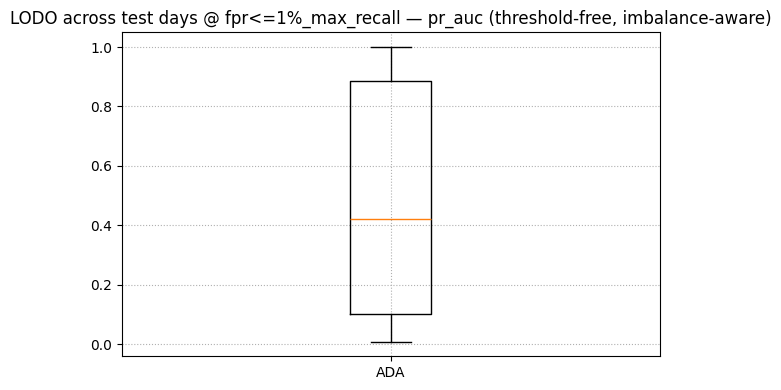

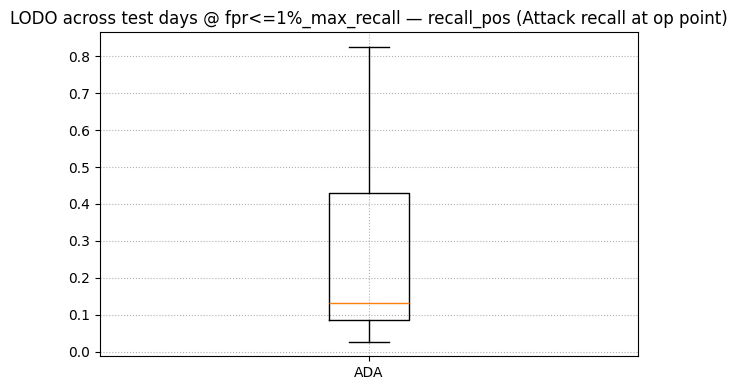

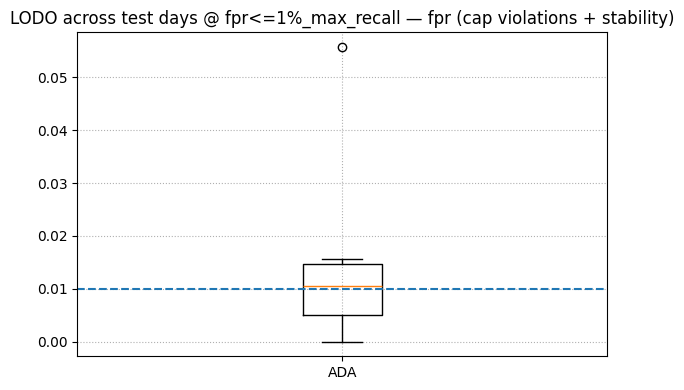

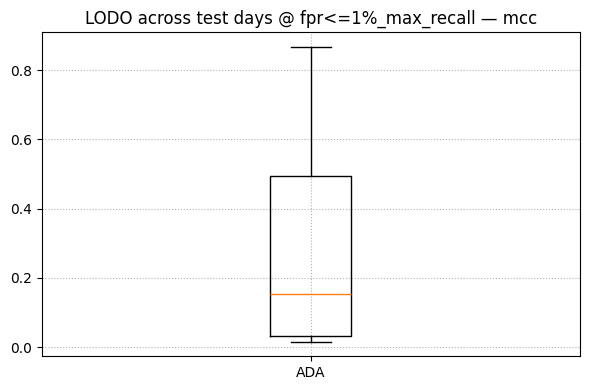


[ADA] Representative days (worst + median + best) by pr_auc:


,model,pick,test_day,pr_auc
0,ADA,worst,df_parquet_Web1_Thu_22,0.009479
1,ADA,median,df_parquet_DoS1_Thu_15,0.563308
2,ADA,best,df_parquet_DDoS2_Wed_21,0.999842


[ADA] rep_days = ['df_parquet_Web1_Thu_22', 'df_parquet_DoS1_Thu_15', 'df_parquet_DDoS2_Wed_21']

[ADABOOST] per-subtype attack recall @A (fpr<=1%_max_recall) for test_day=df_parquet_Web1_Thu_22


,subtype,n,share_of_attacks,tp,fn,recall,test_day,split_mode
0,BruteForce,307,0.900293,37,270,0.120521,df_parquet_Web1_Thu_22,LODO
1,Web,34,0.099707,11,23,0.323529,df_parquet_Web1_Thu_22,LODO



[ADABOOST] per-subtype attack recall @A (fpr<=1%_max_recall) for test_day=df_parquet_DoS1_Thu_15


,subtype,n,share_of_attacks,tp,fn,recall,test_day,split_mode
0,DoS,51314,1.0,20858,30456,0.406478,df_parquet_DoS1_Thu_15,LODO



[ADABOOST] per-subtype attack recall @A (fpr<=1%_max_recall) for test_day=df_parquet_DDoS2_Wed_21


,subtype,n,share_of_attacks,tp,fn,recall,test_day,split_mode
0,DDoS,200591,1.0,165473,35118,0.824927,df_parquet_DDoS2_Wed_21,LODO


[ADA] split_mode=LODO Xtr_raw=4,438,375 tune_size_target=100,000 Xt_actual=100,000 unique_days=7
[ADA] FINAL fit_cap=400,000 Xfit_actual=400,000


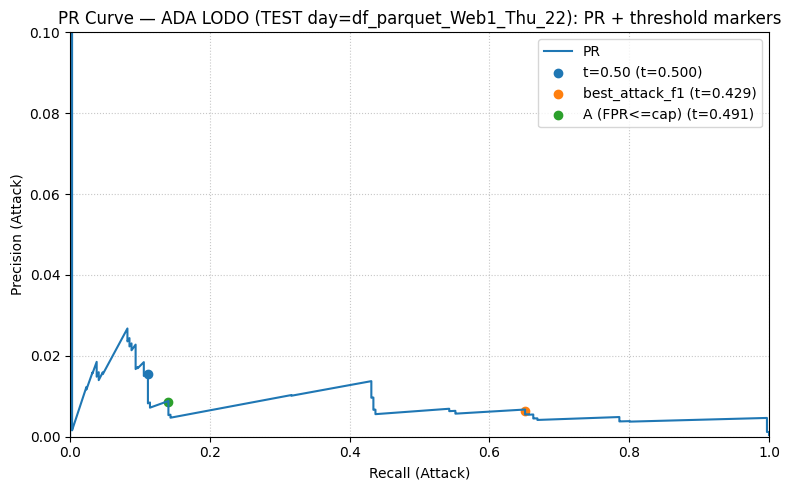

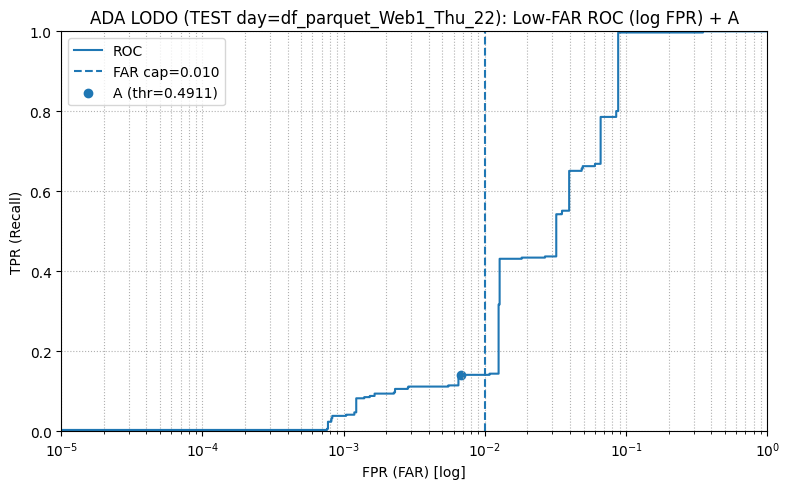

[ADA] split_mode=LODO Xtr_raw=4,473,787 tune_size_target=100,000 Xt_actual=100,000 unique_days=7
[ADA] FINAL fit_cap=400,000 Xfit_actual=400,000


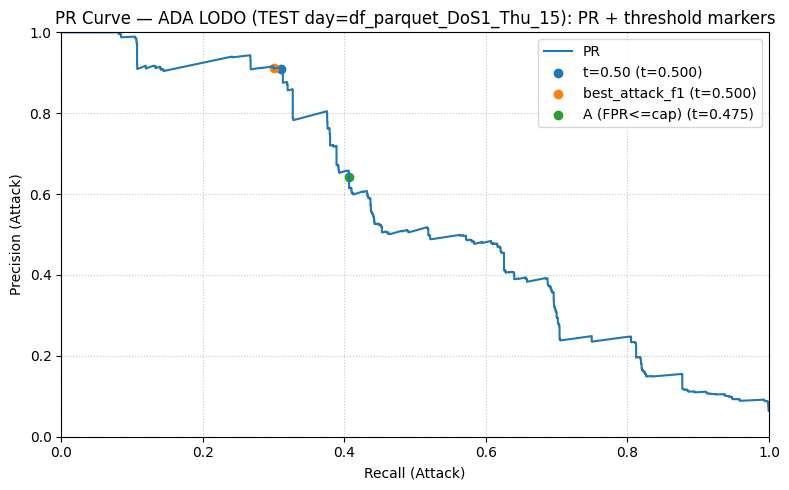

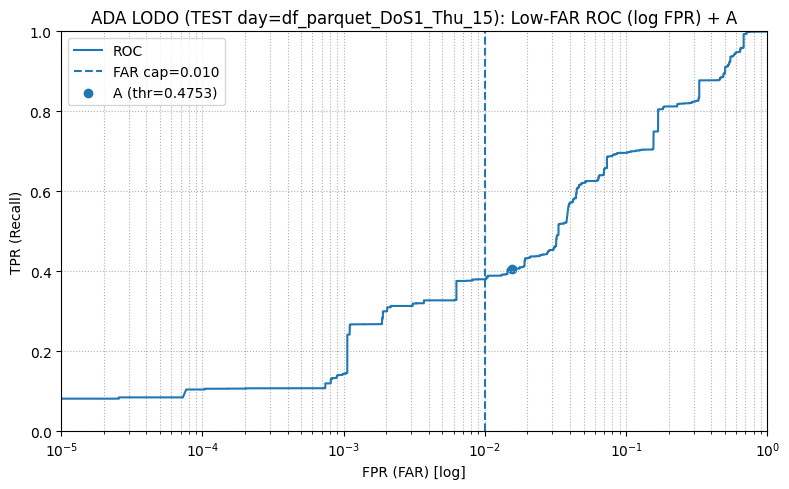

[ADA] split_mode=LODO Xtr_raw=4,707,203 tune_size_target=100,000 Xt_actual=100,000 unique_days=7
[ADA] FINAL fit_cap=400,000 Xfit_actual=400,000


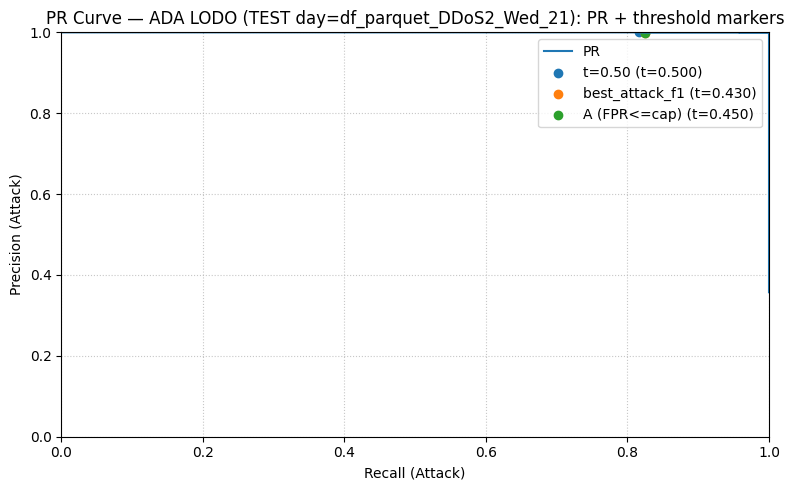

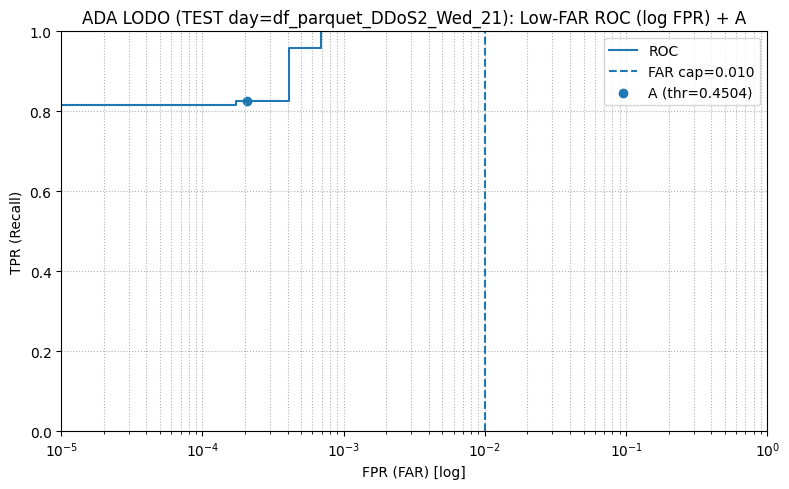

In [204]:
# F) POST-LODO PLOTTING 

MAIN_THR_LABEL = "fpr<=1%_max_recall"
PICK_METRIC = "pr_auc"   # median/worst by pr_auc

# ---------- FILL-IN (change for each model) ----------

MODEL_NAME = "ADA"                  # e.g., "KNN", "DT", "ET", "RF"
DF_LODO     = results_ada_lodo       # our LODO results df for this model (ONLY LODO)
RUN_FOLD_FN = run_ada_fold           # the model runner function (must match run_*_fold signature)

KNOBS_FN    = get_ada_mode_knobs
kn = KNOBS_FN("LODO")

RUNNER_KWARGS = dict(
    # keep aligned with our runner signature
    fit_cap_final=None,
    val_eval_cap_final=ADA_VAL_EVAL_CAP_FINAL,
    test_eval_cap_final=ADA_TEST_EVAL_CAP_FINAL,

    do_calibrate=ADA_DO_CALIBRATE,
    cal_method=ADA_CAL_METHOD,
    cal_cv=ADA_CAL_CV,
    
    # if our runner uses mode knobs (optional; safe because we filter kwargs)
    tune_cap_local=kn["tune_cap"],
    tune_frac_local=kn["tune_frac"],
    cv_splits_local=kn["cv_splits"],
    # n_iter_* key depends on the runner; include it if our runner has it
    n_iter_ada=kn["n_iter"],
)

# ---------- END FILL-IN ----------


# 1) Boxplots across days (ONLY 4 metrics)
plot_lodo_distributions_for_model(
    DF_LODO, model_name=MODEL_NAME,
    thr_label=MAIN_THR_LABEL,
    fpr_cap=MAX_FPR_CAP,
    metrics=("pr_auc", "recall_pos", "fpr", "mcc")
)

# 2) Representative days (worst + median + best)
picks_df, rep_days = pick_best_median_worst_days_for_model(
    DF_LODO,
    model_name=MODEL_NAME,
    thr_label=MAIN_THR_LABEL,
    metric=PICK_METRIC
)
print(f"\n[{MODEL_NAME}] Representative days (worst + median + best) by {PICK_METRIC}:")
display(picks_df)
print(f"[{MODEL_NAME}] rep_days =", rep_days)

# Appendix tables (only worst / median / best days)
if "ada_subtype_lodo_all" in globals() and not ada_subtype_lodo_all.empty:
    for d in rep_days:
        print(f"\n[ADABOOST] per-subtype attack recall @A ({MAIN_THR_LABEL}) for test_day={d}")
        df_d = ada_subtype_lodo_all[ada_subtype_lodo_all["test_day"] == d].copy()
        df_d = df_d.sort_values(["n", "recall"], ascending=[False, True]).reset_index(drop=True)
        display(df_d)
else:
    print("\n[ADABOOST] No stored per-subtype LODO tables found. Run AdaBoost Block E first.")
    

# 3) Representative-day plots: ONLY PR (+ markers) and Low-FAR ROC (log FPR) + A
replot_representative_days_lodo_minimal(
    model_name=MODEL_NAME,
    rep_days=rep_days,
    run_fold_fn=RUN_FOLD_FN,
    runner_kwargs=RUNNER_KWARGS,
    far_cap=MAX_FPR_CAP,
    thr_label_A="fpr<=1%_max_recall"
)

# END ADABOOST PIPELINE

### 6.c) LightGBM fold runner 

In [ ]:
# A) LIGHTGBM runtime knobs — mode-specific knobs 

# FAST mode caps (algo test)
LGBM_FIT_CAP_FAST        = 200_000
LGBM_VAL_EVAL_CAP_FAST   = 200_000
LGBM_TEST_EVAL_CAP_FAST  = 200_000

# EVAL caps (final reporting) — keep None for full VAL/TEST if feasible
LGBM_VAL_EVAL_CAP_FINAL  = None
LGBM_TEST_EVAL_CAP_FINAL = None

# Optional: final refit override (without changing search space)
LGBM_N_ESTIMATORS_FINAL = None   # e.g., 1200; keep None to use tuned value

# Optional calibration knobs (default False => no behavior change)
LGBM_DO_CALIBRATE = False
LGBM_CAL_METHOD   = "sigmoid"
LGBM_CAL_CV       = 3

# FULL mode - LODO knobs
LGBM_N_ITER_TUNE_LODO   = 10
LGBM_TUNE_CAP_LODO      = 30_000
LGBM_TUNE_FRAC_LODO     = 0.10
LGBM_CV_SPLITS_LODO     = 3
LGBM_FIT_CAP_FINAL_LODO = 300_000   # adjust (e.g., 300k–2M)

# FULL mode - MIXED knobs (literature-like)
LGBM_N_ITER_TUNE_MIXED   = 30
LGBM_TUNE_CAP_MIXED      = 150_000
LGBM_TUNE_FRAC_MIXED     = 0.20
LGBM_CV_SPLITS_MIXED     = 5
LGBM_FIT_CAP_FINAL_MIXED = 1_000_000  # adjust (e.g., 500k–2M)

def get_lgbm_mode_knobs(split_mode: str):
    if split_mode == "MIXED":
        return dict(
            cv_splits=LGBM_CV_SPLITS_MIXED,
            n_iter=LGBM_N_ITER_TUNE_MIXED,
            tune_cap=LGBM_TUNE_CAP_MIXED,
            tune_frac=LGBM_TUNE_FRAC_MIXED,
            fit_cap_final=LGBM_FIT_CAP_FINAL_MIXED,
        )
    # LODO default
    return dict(
        cv_splits=LGBM_CV_SPLITS_LODO,
        n_iter=LGBM_N_ITER_TUNE_LODO,
        tune_cap=LGBM_TUNE_CAP_LODO,
        tune_frac=LGBM_TUNE_FRAC_LODO,
        fit_cap_final=LGBM_FIT_CAP_FINAL_LODO,
    )

In [ ]:
# B) LGBM fold runner 
#    - split_mode aware (LODO vs MIXED)
#    - MIXED uses StratifiedKFold via get_inner_cv
#    - MIXED tuning optimizes low-FAR region (safe partial AUC)
#    - NO_CAP operating points for recall targets
#    - artifacts returned for plots/subtype recall
#    - uses GLOBAL random_state (no random_state param)


# stable feature-name bridge for LightGBM
class ToPandasColumns(BaseEstimator, TransformerMixin):
    """Convert X to a pandas DataFrame with stable Column_i names."""
    def fit(self, X, y=None):
        n = np.asarray(X).shape[1]
        self.columns_ = [f"Column_{i}" for i in range(n)]
        return self
    def transform(self, X):
        X = np.asarray(X)
        return pd.DataFrame(X, columns=self.columns_)

# shared capping helpers (FIT: day-balanced for LODO; MIXED: cap_rows)
def _cap_for_fit_lgbm(X, y, g, cap, split_mode="LODO", seed=None):
    if seed is None:
        seed = random_state
    if cap is None:
        return X, y, g
    if split_mode == "MIXED":
        return cap_rows(X, y, g, cap, seed=seed)
    # LODO
    if "cap_rows_day_balanced" in globals():
        try:
            return cap_rows_day_balanced(X, y, g, cap, seed=seed, min_per_day=1)
        except TypeError:
            return cap_rows_day_balanced(X, y, g, cap, seed=seed)
    return cap_rows(X, y, g, cap, seed=seed)

def _cap_for_eval_lgbm(X, y, g, cap, seed=None):
    if seed is None:
        seed = random_state
    return cap_rows(X, y, g, cap, seed=seed)

# safe partial AUC scorer
def safe_partial_auc(y_true, y_score, max_fpr=0.01):
    try:
        return roc_auc_score(y_true, y_score, max_fpr=max_fpr)
    except TypeError:
        return roc_auc_score(y_true, y_score)
    except ValueError:
        return 0.5

def run_lgbm_fold(
    Xtr_raw, ytr, gtr,
    Xva_raw, yva, gva,
    Xte_raw, yte, gte,
    preprocessor,
    model_name="LGBM",
    max_fpr_cap=0.01,

    fast_mode=False,
    fit_cap_fast=200_000,
    fit_cap_final=None,
    val_eval_cap_fast=200_000,
    test_eval_cap_fast=200_000,
    val_eval_cap_final=None,
    test_eval_cap_final=None,

    n_estimators_final=None,

    # optional calibration
    do_calibrate=False,
    cal_method="sigmoid",
    cal_cv=3,

    # mode defaults + overrides (mirror RF)
    n_iter_lgbm=None,
    split_mode="LODO",
    tune_cap_local=None,
    tune_frac_local=None,
    cv_splits_local=None,

    # lgbm misc
    force_row_wise=True,
    verbosity=-1,
):
    rs = random_state  # GLOBAL

    # resolve mode defaults
    kn = get_lgbm_mode_knobs(split_mode)

    if fit_cap_final is None:
        fit_cap_final = kn["fit_cap_final"]

    tcap  = int(kn["tune_cap"] if tune_cap_local is None else tune_cap_local)
    tfrac = float(kn["tune_frac"] if tune_frac_local is None else tune_frac_local)
    n_iter_lgbm = int(kn["n_iter"] if n_iter_lgbm is None else n_iter_lgbm)

    # tuning subset (split_mode-aware)
    tune_size = int(min(tcap, max(5_000, tfrac * len(Xtr_raw))))
    Xt, yt, gt = _cap_for_fit_lgbm(Xtr_raw, ytr, gtr, cap=tune_size, split_mode=split_mode, seed=rs)

    gt_arr = np.asarray(gt)
    print(
        f"[{model_name}] split_mode={split_mode} Xtr_raw={len(Xtr_raw):,} "
        f"tune_size_target={tune_size:,} Xt_actual={len(Xt):,} "
        f"unique_days={len(np.unique(gt_arr))}"
    )

    # ---------------- FAST MODE ----------------
    if fast_mode:
        Xfit, yfit, gfit = _cap_for_fit_lgbm(Xtr_raw, ytr, gtr, cap=fit_cap_fast, split_mode=split_mode, seed=rs)
        print(f"[{model_name}] FAST fit_cap={fit_cap_fast:,}  Xfit_actual={len(Xfit):,}")

        best_pipe = Pipeline(steps=[
            ("prep", preprocessor),
            ("to_df", ToPandasColumns()),
            ("clf", LGBMClassifier(
                objective="binary",
                boosting_type="gbdt",
                n_estimators=300,
                learning_rate=0.05,
                num_leaves=63,
                min_child_samples=40,
                subsample=0.8,
                colsample_bytree=0.8,
                reg_alpha=0.0,
                reg_lambda=0.0,
                class_weight="balanced",
                random_state=rs,
                n_jobs=-1,
                force_row_wise=force_row_wise,
                verbose=verbosity
            ))
        ])
        best_pipe.fit(Xfit, yfit)

        best_params = {
            "FAST_MODE": True,
            "clf__n_estimators": 300,
            "fit_cap_fast": fit_cap_fast,
            "split_mode": split_mode,
            "calibrated": False,
        }
        model = best_pipe

    # ---------------- FULL MODE ----------------
    else:
        spl = int(kn["cv_splits"] if cv_splits_local is None else cv_splits_local)

        # get_inner_cv is assumed to exist globally (same as your RF setup)
        cv = get_inner_cv(
            split_mode,
            y=np.asarray(yt).astype(int),
            groups=gt_arr,
            default_splits=spl,
            seed=rs
        )

        if split_mode == "LODO" and len(np.unique(gt_arr)) < 2:
            raise ValueError("Not enough unique day groups in tuning subset for GroupKFold (LODO).")

        param_dist = {
            "clf__n_estimators": randint(200, 1200),
            "clf__learning_rate": uniform(0.02, 0.18),
            "clf__num_leaves": randint(16, 257),
            "clf__min_child_samples": randint(10, 201),
            "clf__subsample": uniform(0.6, 0.4),
            "clf__colsample_bytree": uniform(0.6, 0.4),
            "clf__reg_alpha": uniform(0.0, 1.0),
            "clf__reg_lambda": uniform(0.0, 1.0),
            "clf__min_split_gain": uniform(0.0, 1.0),
            "clf__class_weight": [None, "balanced"],
            # avoid nested parallelism during CV
            "clf__n_jobs": [1],
        }

        base_pipe = Pipeline(steps=[
            ("prep", preprocessor),
            ("to_df", ToPandasColumns()),
            ("clf", LGBMClassifier(
                objective="binary",
                boosting_type="gbdt",
                random_state=rs,
                n_jobs=1,  # CV-safe
                force_row_wise=force_row_wise,
                verbose=verbosity
            ))
        ])

        # scoring: MIXED optimizes low-FAR region; LODO uses average_precision
        if split_mode == "MIXED":
            scoring_used = make_scorer(safe_partial_auc, needs_proba=True, max_fpr=max_fpr_cap)
        else:
            scoring_used = "average_precision"

        search = RandomizedSearchCV(
            estimator=base_pipe,
            param_distributions=param_dist,
            n_iter=int(n_iter_lgbm),
            scoring=scoring_used,
            error_score=0.0,
            cv=cv,
            n_jobs=-1,
            random_state=rs,
            refit=True,
            verbose=0
        )

        # pass groups only in LODO
        if split_mode == "LODO":
            search.fit(Xt, yt, groups=gt_arr)
        else:
            search.fit(Xt, yt)

        # final fit (split_mode-aware capping)
        Xfit, yfit, gfit = _cap_for_fit_lgbm(Xtr_raw, ytr, gtr, cap=fit_cap_final, split_mode=split_mode, seed=rs)
        print(f"[{model_name}] FINAL fit_cap={fit_cap_final:,}  Xfit_actual={len(Xfit):,}")

        best_pipe = search.best_estimator_
        best_pipe.set_params(clf__n_jobs=-1)

        if n_estimators_final is not None:
            best_pipe.set_params(clf__n_estimators=int(n_estimators_final))

        best_pipe.fit(Xfit, yfit)

        best_params = dict(search.best_params_)
        best_params["fit_cap_final"] = fit_cap_final
        best_params["split_mode"] = split_mode
        best_params["tune_size"] = tune_size
        best_params["cv_splits"] = int(getattr(cv, "n_splits", spl))
        best_params["n_iter"] = int(n_iter_lgbm)
        best_params["scoring_used"] = "partial_auc@max_fpr" if split_mode == "MIXED" else "average_precision"
        if n_estimators_final is not None:
            best_params["n_estimators_final_override"] = int(n_estimators_final)

        # optional calibration (LODO: group-safe; MIXED: stratified)
        model = best_pipe
        best_params["calibrated"] = False

        if do_calibrate:
            if split_mode == "LODO":
                gfit_arr = np.asarray(gfit)
                uniq_days = np.unique(gfit_arr)
                if len(uniq_days) >= 2:
                    cal_splits = min(int(cal_cv), len(uniq_days))
                    gkf = GroupKFold(n_splits=cal_splits)
                    cal_splits_list = list(gkf.split(Xfit, yfit, groups=gfit_arr))

                    cal = CalibratedClassifierCV(
                        estimator=clone(best_pipe),
                        method=cal_method,
                        cv=cal_splits_list
                    )
                    cal.fit(Xfit, yfit)
                    model = cal
                    best_params["calibrated"] = True
                    best_params["cal_method"] = cal_method
                    best_params["cal_cv"] = cal_splits
                else:
                    best_params["calibrated"] = False
                    best_params["calibration_skipped_reason"] = "not_enough_unique_day_groups_in_gfit"
            else:
                skf = StratifiedKFold(n_splits=max(2, int(cal_cv)), shuffle=True, random_state=rs)
                cal = CalibratedClassifierCV(
                    estimator=clone(best_pipe),
                    method=cal_method,
                    cv=skf
                )
                cal.fit(Xfit, yfit)
                model = cal
                best_params["calibrated"] = True
                best_params["cal_method"] = cal_method
                best_params["cal_cv"] = int(cal_cv)

    # ---------------- EVAL CAPS ----------------
    if fast_mode:
        Xva_eval, yva_eval, _ = _cap_for_eval_lgbm(Xva_raw, yva, gva, val_eval_cap_fast, seed=rs)
        Xte_eval, yte_eval, _ = _cap_for_eval_lgbm(Xte_raw, yte, gte, test_eval_cap_fast, seed=rs)
    else:
        Xva_eval, yva_eval, _ = _cap_for_eval_lgbm(Xva_raw, yva, gva, val_eval_cap_final, seed=rs)
        Xte_eval, yte_eval, _ = _cap_for_eval_lgbm(Xte_raw, yte, gte, test_eval_cap_final, seed=rs)

    # ---------------- THRESHOLD TUNING ON VAL ----------------
    score_va = get_scores(model, Xva_eval)
    if "log_if_degenerate_scores" in globals():
        log_if_degenerate_scores(score_va, model_name, split_name="VAL")

    t_f1, _ = pick_threshold_best_attack_f1(yva_eval, score_va)
    t_fpr = pick_threshold_fpr_constrained_max_recall(yva_eval, score_va, max_fpr=max_fpr_cap)
    t_r95 = pick_threshold_recall_target_min_fpr(yva_eval, score_va, recall_target=0.95, max_fpr=max_fpr_cap)
    t_r98 = pick_threshold_recall_target_min_fpr(yva_eval, score_va, recall_target=0.98, max_fpr=max_fpr_cap)

    # diagnostics (NO CAP)
    t_r95_any = pick_threshold_recall_target_min_fpr(yva_eval, score_va, recall_target=0.95, max_fpr=1.0)
    t_r98_any = pick_threshold_recall_target_min_fpr(yva_eval, score_va, recall_target=0.98, max_fpr=1.0)

    thresholds = {
        "t=0.50": 0.50,
        "best_attack_f1": t_f1,
        "fpr<=1%_max_recall": t_fpr,
        "recall>=0.95_min_fpr": t_r95,
        "recall>=0.98_min_fpr": t_r98,
        "recall>=0.95_min_fpr_NO_CAP": t_r95_any,
        "recall>=0.98_min_fpr_NO_CAP": t_r98_any,
    }
    feas = {k: (v is not None) for k, v in thresholds.items()}
    thresholds_valid = {k: v for k, v in thresholds.items() if v is not None}

    # realized FPR at FAR-capped threshold (VAL)
    t_fpr_sel = thresholds.get("fpr<=1%_max_recall", None)
    if t_fpr_sel is not None:
        yhat_val = (score_va >= t_fpr_sel).astype(int)
        tn, fp, fn, tp = confusion_matrix(yva_eval, yhat_val, labels=[0, 1]).ravel()
        best_params["val_fpr_realized_at_fpr1_thr"] = float(fp / (fp + tn + 1e-12))
    else:
        best_params["val_fpr_realized_at_fpr1_thr"] = None

    # ---------------- EVALUATE ON TEST ----------------
    score_te = get_scores(model, Xte_eval)
    if "log_if_degenerate_scores" in globals():
        log_if_degenerate_scores(score_te, model_name, split_name="TEST")

    if t_fpr_sel is not None:
        yhat_te = (score_te >= t_fpr_sel).astype(int)
        tn, fp, fn, tp = confusion_matrix(yte_eval, yhat_te, labels=[0, 1]).ravel()
        best_params["test_fpr_realized_at_fpr1_thr"] = float(fp / (fp + tn + 1e-12))
    else:
        best_params["test_fpr_realized_at_fpr1_thr"] = None

    df = evaluate_thresholds(yte_eval, score_te, thresholds_valid, name=model_name)

    # optional automatic plots (kept for symmetry; you plot manually in Block G)
    if do_plots:
        plot_pr_curve_with_thresholds(yte_eval, score_te, thresholds_valid, model_name=model_name)
        plot_roc_curve(yte_eval, score_te, model_name=model_name)
        plot_det_curve(yte_eval, score_te, model_name=model_name)
        plot_score_distribution(yte_eval, score_te, model_name=model_name, bins=100)

    # artifacts for MIXED plotting + subtype recall
    feas["__artifacts__"] = {"score_te": score_te, "yte_eval": yte_eval}

    return df, best_params, thresholds, feas

In [ ]:
# C) LGBM algo test cell  — runs one LODO day + one MIXED run in FAST mode

RUN_MODELS["LGBM"] = True
ALGO_TEST_DAY = TEST_DAYS[0]
print("Algo test day:", ALGO_TEST_DAY)

old_do_plots = do_plots
do_plots = False

# ---------- LODO algo test ----------
split_mode = "LODO"
kn = get_lgbm_mode_knobs(split_mode)

Xtr_raw, ytr, gtr, Xva_raw, yva, gva, Xte_raw, yte, gte, meta = build_fold(
    registry=REGISTRY, val_days=VAL_DAYS, test_day=ALGO_TEST_DAY
)
preprocessor, prep_dbg = build_preprocessor(Xtr_raw, meta["feature_cols"])
print("LODO preprocessor debug:", prep_dbg)

if RUN_MODELS.get("LGBM", False):
    lgbm_df, lgbm_best_params, lgbm_thresholds, lgbm_feas = run_lgbm_fold(
        Xtr_raw, ytr, gtr,
        Xva_raw, yva, gva,
        Xte_raw, yte, gte,
        preprocessor,
        model_name="LGBM",
        fast_mode=True,
        fit_cap_fast=LGBM_FIT_CAP_FAST,
        val_eval_cap_fast=LGBM_VAL_EVAL_CAP_FAST,
        test_eval_cap_fast=LGBM_TEST_EVAL_CAP_FAST,
        max_fpr_cap=MAX_FPR_CAP,
        split_mode=split_mode,

        # keep knobs consistent even if FAST doesn’t use them
        n_iter_lgbm=kn["n_iter"],
        tune_cap_local=kn["tune_cap"],
        tune_frac_local=kn["tune_frac"],
        cv_splits_local=kn["cv_splits"],

        do_calibrate=LGBM_DO_CALIBRATE,
        cal_method=LGBM_CAL_METHOD,
        cal_cv=LGBM_CAL_CV,
    )
    print("LGBM (LODO) best params:", lgbm_best_params)
    print("LGBM (LODO) thresholds:", lgbm_thresholds)
    print("LGBM (LODO) feasibility:", {k:v for k,v in lgbm_feas.items() if k != "__artifacts__"})
    display(lgbm_df)

# ---------- MIXED algo test ----------
split_mode = "MIXED"
kn = get_lgbm_mode_knobs(split_mode)

Xtr_raw_m, ytr_m, gtr_m, Xva_raw_m, yva_m, gva_m, Xte_raw_m, yte_m, gte_m, meta_m = build_mixed_fold(
    registry=REGISTRY,
    seed=MIXED_RANDOM_STATE,
    test_size=MIXED_TEST_SIZE,
    val_size=MIXED_VAL_SIZE,
    use_rare_injection=MIXED_USE_RARE_ALLOCATION,
    rare_subtypes=RARE_SUBTYPES,
    rare_n_test=RARE_N_TEST_PER_SUBTYPE,
    rare_n_val=RARE_N_VAL_PER_SUBTYPE,
)
preprocessor_m, prep_dbg_m = build_preprocessor(Xtr_raw_m, meta_m["feature_cols"])
print("MIXED preprocessor debug:", prep_dbg_m)

if RUN_MODELS.get("LGBM", False):
    lgbm_df_m, lgbm_best_params_m, lgbm_thresholds_m, lgbm_feas_m = run_lgbm_fold(
        Xtr_raw_m, ytr_m, gtr_m,
        Xva_raw_m, yva_m, gva_m,
        Xte_raw_m, yte_m, gte_m,
        preprocessor_m,
        model_name="LGBM",
        fast_mode=True,
        fit_cap_fast=LGBM_FIT_CAP_FAST,
        val_eval_cap_fast=LGBM_VAL_EVAL_CAP_FAST,
        test_eval_cap_fast=LGBM_TEST_EVAL_CAP_FAST,
        max_fpr_cap=MAX_FPR_CAP,
        split_mode=split_mode,

        n_iter_lgbm=kn["n_iter"],
        tune_cap_local=kn["tune_cap"],
        tune_frac_local=kn["tune_frac"],
        cv_splits_local=kn["cv_splits"],

        do_calibrate=LGBM_DO_CALIBRATE,
        cal_method=LGBM_CAL_METHOD,
        cal_cv=LGBM_CAL_CV,
    )
    print("LGBM (MIXED) best params:", lgbm_best_params_m)
    print("LGBM (MIXED) thresholds:", lgbm_thresholds_m)
    print("LGBM (MIXED) feasibility:", {k:v for k,v in lgbm_feas_m.items() if k != "__artifacts__"})
    display(lgbm_df_m)

do_plots = old_do_plots

MIXED preprocessor debug: {'log1p_cols': ['Active Mean', 'Active Std', 'Bwd IAT Total', 'Bwd IAT Min', 'Packet Length Variance', 'Packet Length Min', 'Bwd Packets/s', 'Down/Up Ratio', 'FIN Flag Count', 'Flow Bytes/s', 'Flow IAT Std', 'Fwd IAT Min', 'Fwd IAT Std', 'Fwd Packet Length Std', 'Fwd Packets/s', 'Fwd URG Flags', 'Idle Min', 'RST Flag Count', 'SYN Flag Count', 'URG Flag Count'], 'scale_cols': ['ACK Flag Count', 'Init Bwd Win Bytes', 'Init Fwd Win Bytes', 'PSH Flag Count'], 'has_protocol': True}
MIXED shapes: (4661671, 25) (665954, 25) (1331907, 25)
MIXED n_features: 25
[LGBM] split_mode=MIXED Xtr_raw=4,661,671 tune_size_target=150,000 Xt_actual=150,000 unique_days=10
[LGBM] FINAL fit_cap=1,000,000  Xfit_actual=1,000,000


c:\Users\ilefas\AppData\Local\miniconda3\envs\venv_finalproject\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
c:\Users\ilefas\AppData\Local\miniconda3\envs\venv_finalproject\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


,stage2_skipped,n_train_attacks,n_test_attacks,n_classes,classes,oracle_n_test_classes,oracle_macro_f1,oracle_weighted_f1,oracle_acc,oracle_bacc,gated_available,gate_thr,n_flagged_total,n_tp_attacks,gated_macro_f1_tp,joint_correct_rate,model,split_mode,test_day
0,False,931366,266105,6,"[Bot, BruteForce, DDoS, DoS, Infiltration, OTHER]",6,0.873455,0.999406,0.999466,0.856118,True,0.164593,257289,246296,0.864988,0.9253,LGBM,MIXED,MIXED


LGBM attack type stage 2 result: {'stage2_skipped': False, 'n_train_attacks': 931366, 'n_test_attacks': 266105, 'n_classes': 6, 'classes': ['Bot', 'BruteForce', 'DDoS', 'DoS', 'Infiltration', 'OTHER'], 'oracle_n_test_classes': 6, 'oracle_macro_f1': 0.8734545989705781, 'oracle_weighted_f1': 0.9994056811685119, 'oracle_acc': 0.9994663760545649, 'oracle_bacc': 0.8561181774406559, 'gated_available': True, 'gate_thr': 0.16459345008288642, 'n_flagged_total': 257289, 'n_tp_attacks': 246296, 'gated_macro_f1_tp': 0.8649883690985857, 'joint_correct_rate': 0.9253001634693072, 'model': 'LGBM', 'split_mode': 'MIXED', 'test_day': 'MIXED'}

=== MIXED (LGBM): best_params ===
{'clf__class_weight': None, 'clf__colsample_bytree': np.float64(0.9186171947440931), 'clf__learning_rate': np.float64(0.05301826217590948), 'clf__min_child_samples': 81, 'clf__min_split_gain': np.float64(0.5986584841970366), 'clf__n_estimators': 814, 'clf__n_jobs': 1, 'clf__num_leaves': 137, 'clf__reg_alpha': np.float64(0.15599452

,thr,tn,fp,fn,tp,precision_pos,recall_pos,f1_pos,macro_f1,fpr,fnr,mcc,balanced_acc,roc_auc,pr_auc,model,thr_label,test_day,split_mode
0,0.500000,1064989,813,23128,242977,0.996665,0.913087,0.953047,0.970966,0.000763,0.086913,0.943340,0.956162,0.989723,0.976944,LGBM,t=0.50,MIXED,MIXED
1,0.420055,1064416,1386,22636,243469,0.994340,0.914936,0.952987,0.970914,0.001300,0.085064,0.943101,0.956818,0.989723,0.976944,LGBM,best_attack_f1,MIXED,MIXED
2,0.164593,1054809,10993,19809,246296,0.957274,0.925559,0.941149,0.963379,0.010314,0.074441,0.926968,0.957623,0.989723,0.976944,LGBM,fpr<=1%_max_recall,MIXED,MIXED
3,0.077527,1004827,60975,12970,253135,0.805880,0.951260,0.872556,0.918533,0.057210,0.048740,0.842083,0.947025,0.989723,0.976944,LGBM,recall>=0.95_min_fpr_NO_CAP,MIXED,MIXED
4,0.031493,851595,214207,5118,260987,0.549222,0.980767,0.704134,0.795026,0.200982,0.019233,0.650858,0.889893,0.989723,0.976944,LGBM,recall>=0.98_min_fpr_NO_CAP,MIXED,MIXED



Total time elapsed for LGBM MIXED-only run: 42.71 minutes

[LGBM MIXED] Operating points (TEST)


,label,thr,fpr,recall,precision,f1,tn,fp,fn,tp
0,t=0.50,0.500000,0.000763,0.913087,0.996665,0.953047,1064989,813,23128,242977
1,best_attack_f1,0.420055,0.001300,0.914936,0.994340,0.952987,1064416,1386,22636,243469
2,A (FPR<=1%),0.164593,0.010314,0.925559,0.957274,0.941149,1054809,10993,19809,246296
3,B (Recall>=0.95 NO CAP),0.077527,0.057210,0.951260,0.805880,0.872556,1004827,60975,12970,253135
4,C (Recall>=0.98),0.031493,0.200982,0.980767,0.549222,0.704134,851595,214207,5118,260987


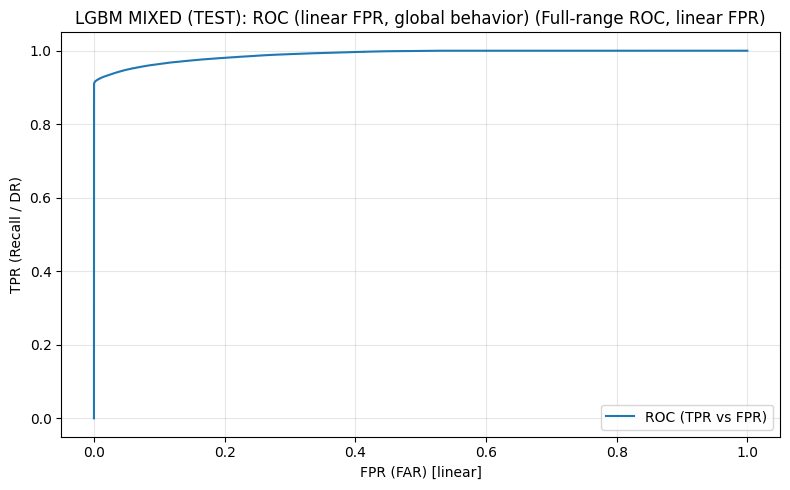

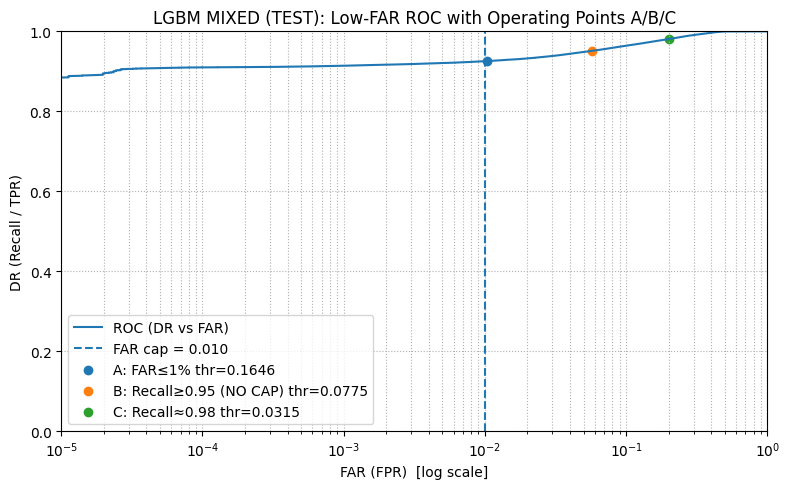

Operating Point A (FAR capped): {'thr': 0.16459345008288642, 'tn': 1054809, 'fp': 10993, 'fn': 19809, 'tp': 246296, 'precision_pos': 0.9572737272094803, 'recall_pos': 0.9255594596118074, 'f1_pos': 0.941149497319419, 'macro_f1': 0.9633794318527277, 'fpr': 0.010314298528244458, 'fnr': 0.07444054038819263, 'mcc': 0.9269676101150157, 'balanced_acc': 0.9576225805417815}
Operating Point B (Recall>=0.95 NO CAP): {'thr': 0.07752725840310942, 'tn': 1004827, 'fp': 60975, 'fn': 12970, 'tp': 253135, 'precision_pos': 0.805880105695457, 'recall_pos': 0.9512598410401909, 'f1_pos': 0.8725558629128858, 'macro_f1': 0.9185333942398288, 'fpr': 0.05721043871188082, 'fnr': 0.0487401589598091, 'mcc': 0.8420828749944875, 'balanced_acc': 0.947024701164155}
FAR cost multiplier (B vs A): 5.55x
Operating Point C (Recall≈0.98): {'thr': 0.0314929548910122, 'tn': 851595, 'fp': 214207, 'fn': 5118, 'tp': 260987, 'precision_pos': 0.5492220019613042, 'recall_pos': 0.9807669904736852, 'f1_pos': 0.7041342292381347, 'macro

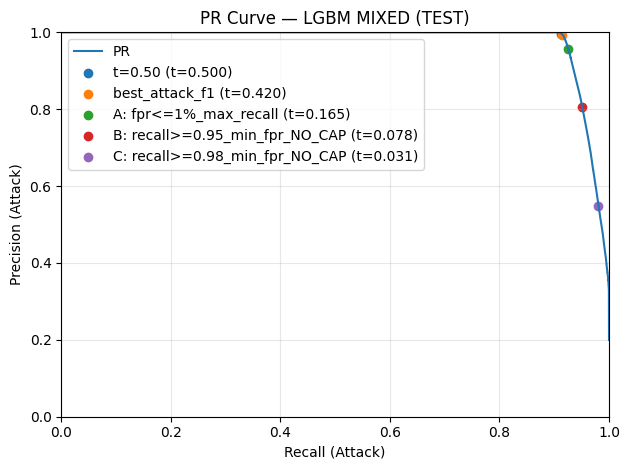

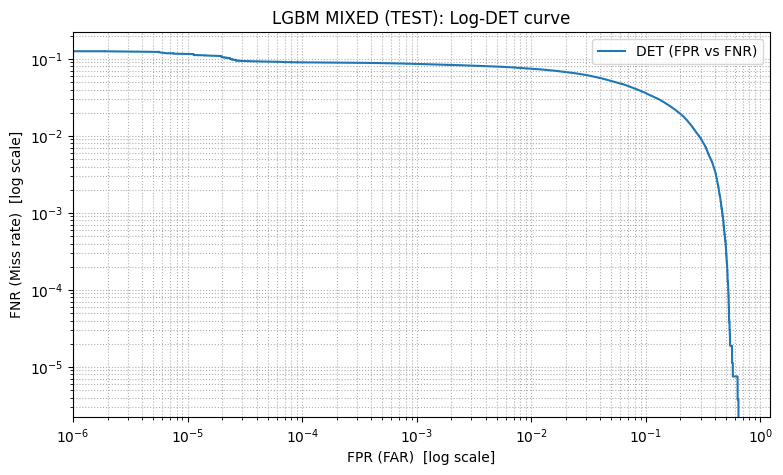

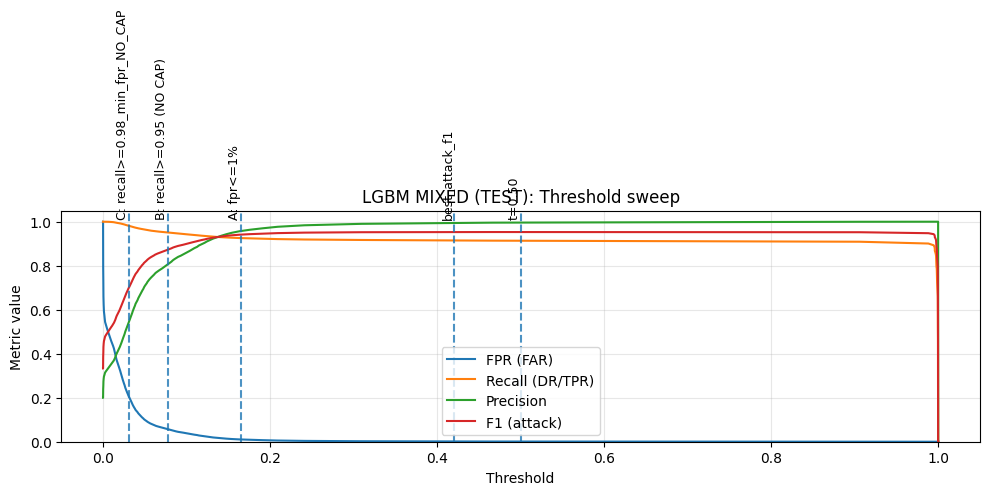

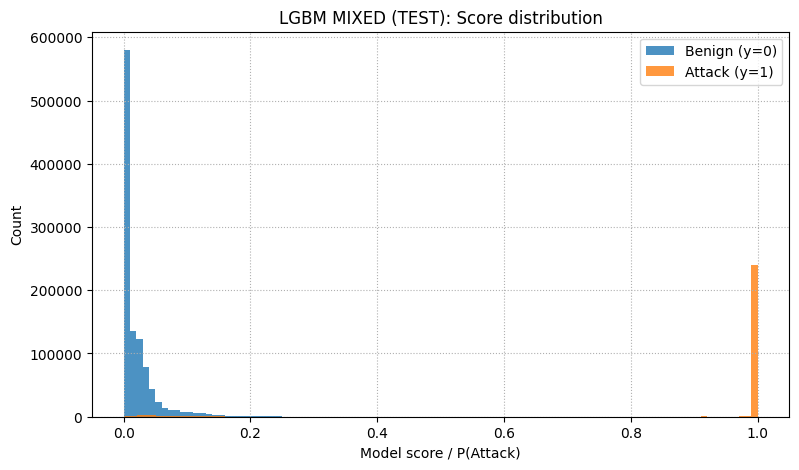


=== MIXED (LGBM): per-subtype attack recall @ Operating Point A (fpr<=1%) ===


,subtype,n,share_of_attacks,tp,fn,recall
0,DDoS,155400,0.583980,155400,0,1.000000
1,DoS,39179,0.147231,39125,54,0.998622
2,Bot,28902,0.108611,28837,65,0.997751
3,Infiltration,23508,0.088341,3907,19601,0.166199
4,BruteForce,19066,0.071648,18981,85,0.995542
5,Web,50,0.000188,46,4,0.920000


In [ ]:
# D) LGBM outer loop (MIXED ONLY) + display results + required plots for MIXED mode
#    NOTE: this block produces lgbm_*_m variables that Block H will APPEND (no recompute).


# --- guard: operating-points table printer (define once) ---
if "print_operating_points_table" not in globals():
    def print_operating_points_table(y_true, y_score, thresholds_dict, model_name="", sort_by=None):
        rows = []
        for lbl, thr in thresholds_dict.items():
            if thr is None:
                continue
            m = metrics_at_threshold(np.asarray(y_true).astype(int), np.asarray(y_score, dtype=float), float(thr))
            rows.append({
                "model": model_name,
                "label": lbl,
                "thr": float(m["thr"]),
                "fpr": float(m["fpr"]),
                "recall": float(m["recall_pos"]),
                "precision": float(m["precision_pos"]),
                "f1": float(m["f1_pos"]),
                "tn": int(m["tn"]), "fp": int(m["fp"]), "fn": int(m["fn"]), "tp": int(m["tp"]),
            })
        df = pd.DataFrame(rows)
        if df.empty:
            print(f"[{model_name}] operating points: (no feasible thresholds to print)")
            return df
        if sort_by is not None and sort_by in df.columns:
            df = df.sort_values(sort_by, ascending=True).reset_index(drop=True)
        display(df)
        return df

# --- guard: selector for 0.98 operating point (cap if feasible else NO_CAP) ---
if "_select_r98_threshold_for_plot" not in globals():
    def _select_r98_threshold_for_plot(thresholds_dict):
        """
        Returns (thr, label_suffix) where label_suffix is:
        - "recall>=0.98_min_fpr" if capped feasible
        - "recall>=0.98_min_fpr_NO_CAP" otherwise if NO_CAP feasible
        - (None, "recall>=0.98_unavailable") if neither
        """
        t_cap = thresholds_dict.get("recall>=0.98_min_fpr", None)
        if t_cap is not None:
            return float(t_cap), "recall>=0.98_min_fpr"
        t_any = thresholds_dict.get("recall>=0.98_min_fpr_NO_CAP", None)
        if t_any is not None:
            return float(t_any), "recall>=0.98_min_fpr_NO_CAP"
        return None, "recall>=0.98_unavailable"

# --- plotting helpers (define once only if missing) ---
# Uses our same implementations as RF for plot_low_far_roc_with_ops / plot_det / plot_score_hist / plot_threshold_sweep_metrics.
# If you already defined them in RF, this will not override them.
if "plot_low_far_roc_with_ops" not in globals():
    def plot_low_far_roc_with_ops(y_true, y_score, thr_A, thr_B=None, thr_C=None, far_cap=0.01, title=""):
        y_true = np.asarray(y_true).astype(int)
        y_score = np.asarray(y_score, dtype=float)
        fpr_curve, tpr_curve, _ = roc_curve(y_true, y_score)

        A = metrics_at_threshold(y_true, y_score, float(thr_A)) if thr_A is not None else None
        B = metrics_at_threshold(y_true, y_score, float(thr_B)) if thr_B is not None else None
        C = metrics_at_threshold(y_true, y_score, float(thr_C)) if thr_C is not None else None

        plt.figure(figsize=(8, 5))
        plt.plot(fpr_curve, tpr_curve, label="ROC (DR/Recall vs FAR/FPR)")
        plt.axvline(far_cap, linestyle="--", label=f"FAR cap = {far_cap:.3f}")

        if A is not None:
            plt.scatter([A["fpr"]], [A["recall_pos"]], label=f"A: FAR≤{far_cap:.0%} thr={A['thr']:.4f}")
        if B is not None:
            plt.scatter([B["fpr"]], [B["recall_pos"]], label=f"B: Recall≥0.95 (NO CAP) thr={B['thr']:.4f}")
        if C is not None:
            plt.scatter([C["fpr"]], [C["recall_pos"]], label=f"C: Recall≥0.98 thr={C['thr']:.4f}")

        plt.xscale("log")
        fpr_pos = fpr_curve[fpr_curve > 0]
        left = float(fpr_pos.min()) if fpr_pos.size else 1e-5
        plt.xlim(max(1e-5, left), 1.0)
        plt.ylim(0.0, 1.0)
        plt.xlabel("FAR (FPR)  [log scale]")
        plt.ylabel("DR (Recall / TPR)")
        plt.title(title)
        plt.legend()
        plt.grid(True, which="both", linestyle=":")
        plt.tight_layout()
        plt.show()

        if A is not None:
            print("Operating Point A (practical IDS: FAR capped):", A)
        if B is not None:
            print("Operating Point B (high detection: Recall target, NO CAP):", B)
        if C is not None:
            print("Operating Point C (very high detection: Recall target≈0.98):", C)

if "plot_det" not in globals():
    def plot_det(y_true, y_score, title="DET curve (TEST)"):
        y_true = np.asarray(y_true).astype(int)
        y_score = np.asarray(y_score)
        fpr, fnr, _ = det_curve(y_true, y_score)
        plt.figure(figsize=(9, 5))
        plt.plot(fpr, fnr, label="DET (FPR vs FNR)")
        plt.xscale("log"); plt.yscale("log")
        plt.xlabel("FPR (FAR)  [log scale]")
        plt.ylabel("FNR (Miss rate)  [log scale]")
        plt.title(title)
        plt.grid(True, which="both", linestyle=":")
        plt.legend()
        plt.show()

if "plot_score_hist" not in globals():
    def plot_score_hist(y_true, y_score, title="Score distribution (TEST)", bins=100):
        y_true = np.asarray(y_true).astype(int)
        y_score = np.asarray(y_score)
        plt.figure(figsize=(9, 5))
        plt.hist(y_score[y_true == 0], bins=bins, alpha=0.8, label="Benign (y=0)")
        plt.hist(y_score[y_true == 1], bins=bins, alpha=0.8, label="Attack (y=1)")
        plt.xlabel("Model score / P(Attack)")
        plt.ylabel("Count")
        plt.title(title)
        plt.grid(True, linestyle=":")
        plt.legend()
        plt.show()

if "plot_threshold_sweep_metrics" not in globals():
    def plot_threshold_sweep_metrics(
        y_true, y_score, thresholds_dict, model_name="", n_grid=601, title_suffix="(TEST): Threshold sweep"
    ):
        y_true = np.asarray(y_true).astype(int)
        y_score = np.asarray(y_score, dtype=float)
        grid = make_threshold_grid(y_score, n=n_grid)

        thrs, fprs, recs, precs, f1s = [], [], [], [], []
        for t in grid:
            m = metrics_at_threshold(y_true, y_score, float(t))
            thrs.append(float(t))
            fprs.append(m["fpr"])
            recs.append(m["recall_pos"])
            precs.append(m["precision_pos"])
            f1s.append(m["f1_pos"])

        thrs = np.asarray(thrs)
        plt.figure(figsize=(10, 5))
        plt.plot(thrs, np.asarray(fprs), label="FPR (FAR)")
        plt.plot(thrs, np.asarray(recs), label="Recall (DR/TPR)")
        plt.plot(thrs, np.asarray(precs), label="Precision")
        plt.plot(thrs, np.asarray(f1s), label="F1 (attack)")

        for label, thr in thresholds_dict.items():
            if thr is None:
                continue
            plt.axvline(float(thr), linestyle="--", alpha=0.8)
            plt.text(float(thr), 1.02, label, rotation=90, va="bottom", ha="right", fontsize=9)

        plt.ylim(0.0, 1.05)
        plt.xlabel("Threshold")
        plt.ylabel("Metric value")
        plt.title(f"{model_name} {title_suffix}")
        plt.grid(True, alpha=0.3)
        plt.legend()
        plt.tight_layout()
        plt.show()


# -------------------- RUN MIXED-ONLY --------------------
RUN_MODELS["LGBM"] = True

START_TIME = time.time()
old_do_plots = do_plots
do_plots = False  # plot manually in this cell

split_mode = "MIXED"
kn = get_lgbm_mode_knobs(split_mode)

Xtr_raw_m, ytr_m, gtr_m, Xva_raw_m, yva_m, gva_m, Xte_raw_m, yte_m, gte_m, meta_m = build_mixed_fold(
    registry=REGISTRY,
    seed=MIXED_RANDOM_STATE,
    test_size=MIXED_TEST_SIZE,
    val_size=MIXED_VAL_SIZE,
    use_rare_injection=MIXED_USE_RARE_ALLOCATION,
    rare_subtypes=RARE_SUBTYPES,
    rare_n_test=RARE_N_TEST_PER_SUBTYPE,
    rare_n_val=RARE_N_VAL_PER_SUBTYPE,
)

preprocessor_m, prep_dbg_m = build_preprocessor(Xtr_raw_m, meta_m["feature_cols"])
print("MIXED preprocessor debug:", prep_dbg_m)
print("MIXED shapes:", Xtr_raw_m.shape, Xva_raw_m.shape, Xte_raw_m.shape)
print("MIXED n_features:", len(meta_m["feature_cols"]))

lgbm_df_m, lgbm_best_params_m, lgbm_thresholds_m, lgbm_feas_m = run_lgbm_fold(
    Xtr_raw_m, ytr_m, gtr_m,
    Xva_raw_m, yva_m, gva_m,
    Xte_raw_m, yte_m, gte_m,
    preprocessor_m,
    model_name="LGBM",
    fast_mode=False,

    fit_cap_final=None,  # default from mode knobs
    val_eval_cap_final=LGBM_VAL_EVAL_CAP_FINAL,
    test_eval_cap_final=LGBM_TEST_EVAL_CAP_FINAL,
    max_fpr_cap=MAX_FPR_CAP,

    n_estimators_final=LGBM_N_ESTIMATORS_FINAL,

    do_calibrate=LGBM_DO_CALIBRATE,
    cal_method=LGBM_CAL_METHOD,
    cal_cv=LGBM_CAL_CV,

    n_iter_lgbm=None,
    tune_cap_local=kn["tune_cap"],
    tune_frac_local=kn["tune_frac"],
    cv_splits_local=kn["cv_splits"],
    split_mode=split_mode,
)

# --- optional attack type stage 2 (MIXED only, using MIXED scores + thresholds) ---
lgbm_attacktype_m = None
if DO_ATTACKTYPE_STAGE2:
    art = lgbm_feas_m.get("__artifacts__", {})
    score_te_m = art.get("score_te", None)
    thr_main_m = lgbm_thresholds_m.get(MAIN_THR_LABEL, None)

    lgbm_attacktype_m = run_attacktype_stage2(
        model_key="LGBM",
        preprocessor=preprocessor_m,
        Xtr_raw=Xtr_raw_m, ytr=ytr_m, label_raw_train=meta_m["label_raw_train"],
        Xte_raw=Xte_raw_m, yte=yte_m, label_raw_test=meta_m["label_raw_test"],
        gate_scores_te=score_te_m, gate_thr=thr_main_m,
        base_best_params=lgbm_best_params_m,
        min_count=ATTACKTYPE_MIN_COUNT,
        rare_set=RARE_SUBTYPES,
        other_label=ATTACKTYPE_OTHER_LABEL,
    )
    lgbm_attacktype_m.update({"model": "LGBM", "split_mode": "MIXED", "test_day": "MIXED"})
    display(pd.DataFrame([lgbm_attacktype_m]))
print("LGBM attack type stage 2 result:", lgbm_attacktype_m)



lgbm_df_m = lgbm_df_m.copy()
lgbm_df_m["test_day"] = "MIXED"
lgbm_df_m["split_mode"] = "MIXED"

print("\n=== MIXED (LGBM): best_params ===")
print(lgbm_best_params_m)

print("\n=== MIXED (LGBM): thresholds (picked on VAL) ===")
print(lgbm_thresholds_m)

print("\n=== MIXED (LGBM): feasibility ===")
print({k: v for k, v in lgbm_feas_m.items() if k != "__artifacts__"})

display(lgbm_df_m)

elapsed = time.time() - START_TIME
print(f"\nTotal time elapsed for LGBM MIXED-only run: {elapsed/60:.2f} minutes")

# -------------------- REQUIRED PLOTS / MIXED SPLIT ONLY --------------------
art = lgbm_feas_m.get("__artifacts__", {})
yte_eval_m = art.get("yte_eval", None)
score_te_m = art.get("score_te", None)

if yte_eval_m is not None and score_te_m is not None:

    thr_A = lgbm_thresholds_m.get("fpr<=1%_max_recall", None)
    thr_B = lgbm_thresholds_m.get("recall>=0.95_min_fpr_NO_CAP", None)
    thr_C, thr_C_label = _select_r98_threshold_for_plot(lgbm_thresholds_m)

    # --- Operating Points table (TEST) ---
    op_table_dict = {
        "t=0.50": lgbm_thresholds_m.get("t=0.50"),
        "best_attack_f1": lgbm_thresholds_m.get("best_attack_f1"),
        "A (FPR<=1%)": thr_A,
        "B (Recall>=0.95 NO CAP)": thr_B,
        "C (Recall>=0.98)": thr_C,
    }
    print_operating_points_table(
        yte_eval_m, score_te_m,
        thresholds_dict=op_table_dict,
        model_name="LGBM MIXED",
        sort_by="fpr"
    )

    # 1) Linear ROC (global behavior) — NO markers
    plot_roc_curve_linear_with_operating_points(
        yte_eval_m, score_te_m,
        thresholds_dict={},  # no markers
        model_name="LGBM MIXED (TEST): ROC (linear FPR, global behavior)"
    )

    # 2) Low-FAR ROC with Operating Points A/B/C
    if thr_A is not None:
        plot_low_far_roc_with_ops(
            yte_eval_m, score_te_m,
            thr_A=thr_A,
            thr_B=(thr_B if thr_B is not None else None),
            thr_C=(thr_C if thr_C is not None else None),
            far_cap=MAX_FPR_CAP,
            title="LGBM MIXED (TEST): Low-FAR ROC with Operating Points A/B/C"
        )

    # 3) PR curve with thresholds marked
    thr_dict_for_pr = {
        "t=0.50": lgbm_thresholds_m.get("t=0.50"),
        "best_attack_f1": lgbm_thresholds_m.get("best_attack_f1"),
        "A: fpr<=1%_max_recall": lgbm_thresholds_m.get("fpr<=1%_max_recall"),
        "B: recall>=0.95_min_fpr_NO_CAP": lgbm_thresholds_m.get("recall>=0.95_min_fpr_NO_CAP"),
    }
    if thr_C is not None:
        thr_dict_for_pr[f"C: {thr_C_label}"] = thr_C

    plot_pr_curve_with_thresholds(
        yte_eval_m, score_te_m,
        thr_dict_for_pr,
        model_name="LGBM MIXED (TEST)"
    )

    # 4) Log-DET
    plot_det(
        yte_eval_m, score_te_m,
        title="LGBM MIXED (TEST): Log-DET curve"
    )

    # 5) Threshold sweep (TEST) with vertical lines
    thr_dict_for_sweep = {
        "t=0.50": lgbm_thresholds_m.get("t=0.50"),
        "best_attack_f1": lgbm_thresholds_m.get("best_attack_f1"),
        "A: fpr<=1%": lgbm_thresholds_m.get("fpr<=1%_max_recall"),
        "B: recall>=0.95 (NO CAP)": lgbm_thresholds_m.get("recall>=0.95_min_fpr_NO_CAP"),
    }
    if thr_C is not None:
        thr_dict_for_sweep[f"C: {thr_C_label}"] = thr_C

    plot_threshold_sweep_metrics(
        yte_eval_m, score_te_m,
        thresholds_dict=thr_dict_for_sweep,
        model_name="LGBM MIXED"
    )

    # 6) Score distribution
    plot_score_hist(
        yte_eval_m, score_te_m,
        title="LGBM MIXED (TEST): Score distribution",
        bins=100
    )

    # 7) Per-subtype recall @ Operating Point A
    label_raw_test = None
    if "meta_m" in globals():
        label_raw_test = meta_m.get("label_raw_test", None)

    if ("per_subtype_attack_recall" in globals()
    and "map_array_to_coarse" in globals()
    and thr_A is not None
    and label_raw_test is not None):
        subtype_df = per_subtype_attack_recall(
            y_true=np.asarray(yte_eval_m),
            y_score=np.asarray(score_te_m),
            thr=float(thr_A),
            label_raw=map_array_to_coarse(np.asarray(label_raw_test)),
        )
    print("\n=== MIXED (LGBM): per-subtype attack recall @ Operating Point A (fpr<=1%) ===")
    display(subtype_df)


do_plots = old_do_plots

In [ ]:
# E) LGBM outer loop (LODO) + aggregation with MIXED 
#    LODO outer loop across TEST_DAYS + append the already-run MIXED result from Block G (NO recompute)

do_plots_loop = False
old_do_plots = do_plots
do_plots = do_plots_loop

MAIN_THR_LABEL = "fpr<=1%_max_recall"
subtype_rows = []       # per-day per-subtype tables (do NOT display inside loop)
all_rows = []
attacktype_rows = []    # optional, only if DO_ATTACKTYPE_STAGE2 is True and produces results
best_params_log = []
feas_rows = []

START_TIME = time.time()

# ---------- LODO loop ----------
START_TIME = time.time()
RUN_MODELS["LGBM"] = True

for test_day in TEST_DAYS:
    Xtr_raw, ytr, gtr, Xva_raw, yva, gva, Xte_raw, yte, gte, meta = build_fold(
        registry=REGISTRY, val_days=VAL_DAYS, test_day=test_day
    )
    preprocessor, prep_dbg = build_preprocessor(Xtr_raw, meta["feature_cols"])

    if RUN_MODELS.get("LGBM", False):
        split_mode = "LODO"
        kn = get_lgbm_mode_knobs(split_mode)

        lgbm_df, lgbm_best_params, lgbm_thresholds, lgbm_feas = run_lgbm_fold(
            Xtr_raw, ytr, gtr,
            Xva_raw, yva, gva,
            Xte_raw, yte, gte,
            preprocessor,
            model_name="LGBM",
            fast_mode=False,

            fit_cap_final=None,  # default from mode knobs
            val_eval_cap_final=LGBM_VAL_EVAL_CAP_FINAL,
            test_eval_cap_final=LGBM_TEST_EVAL_CAP_FINAL,
            n_estimators_final=LGBM_N_ESTIMATORS_FINAL,
            max_fpr_cap=MAX_FPR_CAP,

            n_iter_lgbm=kn["n_iter"],
            tune_cap_local=kn["tune_cap"],
            tune_frac_local=kn["tune_frac"],
            cv_splits_local=kn["cv_splits"],
            split_mode=split_mode,

            do_calibrate=LGBM_DO_CALIBRATE,
            cal_method=LGBM_CAL_METHOD,
            cal_cv=LGBM_CAL_CV,
        )

        # Optional: run attack type stage 2 per day
        if DO_ATTACKTYPE_STAGE2:
            art = lgbm_feas.get("__artifacts__", {})
            score_te = art.get("score_te", None)
            thr_main = lgbm_thresholds.get(MAIN_THR_LABEL, None)

            r = run_attacktype_stage2(
                model_key="LGBM",
                preprocessor=preprocessor,
                Xtr_raw=Xtr_raw, ytr=ytr, label_raw_train=meta["label_raw_train"],
                Xte_raw=Xte_raw, yte=yte, label_raw_test=meta["label_raw_test"],
                gate_scores_te=score_te, gate_thr=thr_main,
                base_best_params=lgbm_best_params,
                min_count=ATTACKTYPE_MIN_COUNT,
                rare_set=RARE_SUBTYPES,
                other_label=ATTACKTYPE_OTHER_LABEL,
            )
            r.update({"model": "LGBM", "split_mode": "LODO", "test_day": test_day})
            attacktype_rows.append(r)
            print(f"LGBM attack type stage 2 result for test_day={test_day}:", r)

        # Collect per-subtype recall @ Operating Point A (NO printing)
        art = lgbm_feas.get("__artifacts__", {})
        score_te = art.get("score_te", None)
        thr_A = lgbm_thresholds.get(MAIN_THR_LABEL, None)

        if (score_te is not None) and (thr_A is not None) and ("label_raw_test" in meta) and ("map_array_to_coarse" in globals()):
            df_sub = per_subtype_attack_recall(
                y_true=np.asarray(yte),
                y_score=np.asarray(score_te),
                thr=float(thr_A),
                label_raw=map_array_to_coarse(np.asarray(meta["label_raw_test"])),
            )
            df_sub["test_day"] = test_day
            df_sub["split_mode"] = "LODO"
            subtype_rows.append(df_sub)


        lgbm_df = lgbm_df.copy()
        lgbm_df["test_day"] = test_day
        lgbm_df["split_mode"] = "LODO"
        all_rows.append(lgbm_df)

        best_params_log.append({
            "model": "LGBM",
            "test_day": test_day,
            "split_mode": "LODO",
            "best_params": lgbm_best_params
        })

        for lbl in ["fpr<=1%_max_recall", "recall>=0.95_min_fpr", "recall>=0.98_min_fpr"]:
            feas_rows.append({
                "model": "LGBM",
                "test_day": test_day,
                "split_mode": "LODO",
                "thr_label": lbl,
                "feasible": bool(lgbm_feas.get(lbl, False))
            })

if not all_rows:
    print("No rows collected. Check RUN_MODELS and loop execution.")
    do_plots = old_do_plots
    raise SystemExit

results_lgbm_lodo = pd.concat(all_rows, ignore_index=True)

# Pooled per-subtype recall across LODO days (MAIN section)
if subtype_rows:
    lgbm_subtype_lodo_all = pd.concat(subtype_rows, ignore_index=True)

    lgbm_subtype_lodo_pooled = (
        lgbm_subtype_lodo_all
        .groupby("subtype", as_index=False)
        .agg(n=("n", "sum"), tp=("tp", "sum"), fn=("fn", "sum"))
    )
    lgbm_subtype_lodo_pooled["recall_pooled"] = lgbm_subtype_lodo_pooled["tp"] / lgbm_subtype_lodo_pooled["n"]
    lgbm_subtype_lodo_pooled["share_of_attacks_pooled"] = lgbm_subtype_lodo_pooled["n"] / lgbm_subtype_lodo_pooled["n"].sum()
    lgbm_subtype_lodo_pooled = lgbm_subtype_lodo_pooled.sort_values(["n", "recall_pooled"], ascending=[False, True])

    print(f"\n[LGBM][LODO] Pooled per-subtype attack recall @A ({MAIN_THR_LABEL})")
    display(lgbm_subtype_lodo_pooled)

    lgbm_subtype_lodo_stats = (
        lgbm_subtype_lodo_all.groupby("subtype")["recall"]
        .agg(recall_mean="mean", recall_median="median", recall_min="min", recall_max="max")
        .reset_index().sort_values("recall_min")
    )
    print("\n[LGBM][LODO] Per-subtype recall variability across days (optional)")
    display(lgbm_subtype_lodo_stats)
else:
    lgbm_subtype_lodo_all = pd.DataFrame()
    print("\n[LGBM][LODO] No per-subtype tables collected.")



elapsed = time.time() - START_TIME
print(f"\nTotal time elapsed for LGBM LODO loop: {elapsed/60:.2f} minutes")

# ---------- Append MIXED result from Block G (NO recompute) ----------
if RUN_MODELS.get("LGBM", False):

    required = ["lgbm_df_m", "lgbm_best_params_m", "lgbm_thresholds_m", "lgbm_feas_m"]
    missing = [v for v in required if v not in globals()]
    if missing:
        raise RuntimeError(
            "Block G (LGBM MIXED-only) must run before Block H so we can append MIXED without recomputing.\n"
            f"Missing variables: {missing}"
        )

    lgbm_df_m_app = lgbm_df_m.copy()
    lgbm_df_m_app["test_day"] = "MIXED"
    lgbm_df_m_app["split_mode"] = "MIXED"

    results_lgbm = pd.concat([results_lgbm_lodo, lgbm_df_m_app], ignore_index=True)

    best_params_log.append({
        "model": "LGBM",
        "test_day": "MIXED",
        "split_mode": "MIXED",
        "best_params": lgbm_best_params_m
    })

    for lbl in ["fpr<=1%_max_recall", "recall>=0.95_min_fpr", "recall>=0.98_min_fpr"]:
        feas_rows.append({
            "model": "LGBM",
            "test_day": "MIXED",
            "split_mode": "MIXED",
            "thr_label": lbl,
            "feasible": bool(lgbm_feas_m.get(lbl, False))
        })
else:
    results_lgbm = results_lgbm_lodo

# ---------- Optional: attack type stage 2 summary table (MIXED + LODO) ----------
if lgbm_attacktype_m is not None:
    attacktype_rows.append(lgbm_attacktype_m)

lgbm_attacktype_df = pd.DataFrame(attacktype_rows)
display(lgbm_attacktype_df)


display(results_lgbm.head(80))

# ---------- Best params / feasibility summaries (LODO + MIXED) ----------
best_params_lgbm = pd.DataFrame(best_params_log)
display(best_params_lgbm)

feas_lgbm = pd.DataFrame(feas_rows)
feas_summary_lgbm = (
    feas_lgbm.groupby(["model", "split_mode", "thr_label"])
    .agg(
        feasible_days=("feasible", "sum"),
        total_days=("feasible", "count"),
        feasibility_rate=("feasible", "mean")
    )
    .reset_index()
)
display(feas_summary_lgbm)

# ---------- Summary block for MAIN operating point, split-aware ----------
MAIN_THR_LABEL = "fpr<=1%_max_recall"

def iqr(s): return float(s.quantile(0.75) - s.quantile(0.25))
def q25(s): return float(s.quantile(0.25))
def q75(s): return float(s.quantile(0.75))

sel = results_lgbm[results_lgbm["thr_label"] == MAIN_THR_LABEL].copy()

if sel.empty:
    print("No rows for MAIN_THR_LABEL =", MAIN_THR_LABEL)
else:
    summary_lgbm = sel.groupby(["model", "split_mode"]).agg(
        n_folds=("test_day", "nunique"),

        pr_auc_mean=("pr_auc", "mean"), pr_auc_std=("pr_auc", "std"),
        roc_auc_mean=("roc_auc", "mean"), roc_auc_std=("roc_auc", "std"),
        mcc_mean=("mcc", "mean"),       mcc_std=("mcc", "std"),
        f1_mean=("f1_pos", "mean"),     f1_std=("f1_pos", "std"),
        recall_mean=("recall_pos", "mean"), recall_std=("recall_pos", "std"),
        precision_mean=("precision_pos", "mean"), precision_std=("precision_pos", "std"),
        fpr_mean=("fpr", "mean"),       fpr_std=("fpr", "std"),
        fnr_mean=("fnr", "mean"),       fnr_std=("fnr", "std"),

        pr_auc_median=("pr_auc", "median"),
        f1_median=("f1_pos", "median"),
        recall_median=("recall_pos", "median"),
        precision_median=("precision_pos", "median"),
        fpr_median=("fpr", "median"),
        fnr_median=("fnr", "median"),
        mcc_median=("mcc", "median"),

        pr_auc_q25=("pr_auc", q25), pr_auc_q75=("pr_auc", q75), pr_auc_iqr=("pr_auc", iqr),
        f1_q25=("f1_pos", q25),     f1_q75=("f1_pos", q75),     f1_iqr=("f1_pos", iqr),
        recall_q25=("recall_pos", q25), recall_q75=("recall_pos", q75), recall_iqr=("recall_pos", iqr),
        precision_q25=("precision_pos", q25), precision_q75=("precision_pos", q75), precision_iqr=("precision_pos", iqr),
        fpr_q25=("fpr", q25),       fpr_q75=("fpr", q75),       fpr_iqr=("fpr", iqr),

        pr_auc_min=("pr_auc", "min"), pr_auc_max=("pr_auc", "max"),
        f1_min=("f1_pos", "min"),     f1_max=("f1_pos", "max"),
        recall_min=("recall_pos", "min"), recall_max=("recall_pos", "max"),
        precision_min=("precision_pos", "min"), precision_max=("precision_pos", "max"),
        fpr_min=("fpr", "min"),       fpr_max=("fpr", "max"),
        mcc_min=("mcc", "min"),       mcc_max=("mcc", "max"),
    ).reset_index()

    display(summary_lgbm)

do_plots = old_do_plots


[LGBM] split_mode=LODO Xtr_raw=4,313,753 tune_size_target=30,000 Xt_actual=30,000 unique_days=7
[LGBM] FINAL fit_cap=300,000  Xfit_actual=300,000


c:\Users\ilefas\AppData\Local\miniconda3\envs\venv_finalproject\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
c:\Users\ilefas\AppData\Local\miniconda3\envs\venv_finalproject\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


LGBM attack type stage 2 result for test_day=df_parquet_DDoS1_Tue_20: {'stage2_skipped': False, 'n_train_attacks': 516524, 'n_test_attacks': 575364, 'n_classes': 5, 'classes': ['BruteForce', 'DDoS', 'DoS', 'Infiltration', 'Web'], 'oracle_n_test_classes': 1, 'oracle_macro_f1': 0.000622308321225661, 'oracle_weighted_f1': 0.002489233284902644, 'oracle_acc': 0.0012461676434396313, 'oracle_bacc': 0.0012461676434396313, 'gated_available': True, 'gate_thr': 0.5920843529536545, 'n_flagged_total': 70624, 'n_tp_attacks': 68880, 'gated_macro_f1_tp': 0.00515108409845252, 'joint_correct_rate': 0.0012461676434396313, 'model': 'LGBM', 'split_mode': 'LODO', 'test_day': 'df_parquet_DDoS1_Tue_20'}
[LGBM] split_mode=LODO Xtr_raw=4,707,203 tune_size_target=30,000 Xt_actual=30,000 unique_days=7
[LGBM] FINAL fit_cap=300,000  Xfit_actual=300,000


c:\Users\ilefas\AppData\Local\miniconda3\envs\venv_finalproject\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
c:\Users\ilefas\AppData\Local\miniconda3\envs\venv_finalproject\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


LGBM attack type stage 2 result for test_day=df_parquet_DDoS2_Wed_21: {'stage2_skipped': False, 'n_train_attacks': 891297, 'n_test_attacks': 200591, 'n_classes': 5, 'classes': ['BruteForce', 'DDoS', 'DoS', 'Infiltration', 'Web'], 'oracle_n_test_classes': 1, 'oracle_macro_f1': 0.00850176213848975, 'oracle_weighted_f1': 0.0170035242769795, 'oracle_acc': 0.008574661874161851, 'oracle_bacc': 0.008574661874161851, 'gated_available': True, 'gate_thr': 0.4912247960488432, 'n_flagged_total': 18998, 'n_tp_attacks': 18967, 'gated_macro_f1_tp': 0.08314400348044666, 'joint_correct_rate': 0.008574661874161851, 'model': 'LGBM', 'split_mode': 'LODO', 'test_day': 'df_parquet_DDoS2_Wed_21'}
[LGBM] split_mode=LODO Xtr_raw=4,473,787 tune_size_target=30,000 Xt_actual=30,000 unique_days=7
[LGBM] FINAL fit_cap=300,000  Xfit_actual=300,000


c:\Users\ilefas\AppData\Local\miniconda3\envs\venv_finalproject\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
c:\Users\ilefas\AppData\Local\miniconda3\envs\venv_finalproject\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


LGBM attack type stage 2 result for test_day=df_parquet_DoS1_Thu_15: {'stage2_skipped': False, 'n_train_attacks': 1040574, 'n_test_attacks': 51314, 'n_classes': 5, 'classes': ['BruteForce', 'DDoS', 'DoS', 'Infiltration', 'Web'], 'oracle_n_test_classes': 1, 'oracle_macro_f1': 0.14809986508814746, 'oracle_weighted_f1': 0.4442995952644424, 'oracle_acc': 0.2855945745800366, 'oracle_bacc': 0.2855945745800366, 'gated_available': True, 'gate_thr': 0.41330280563730976, 'n_flagged_total': 28473, 'n_tp_attacks': 18469, 'gated_macro_f1_tp': 0.20106415192282737, 'joint_correct_rate': 0.09057956892855751, 'model': 'LGBM', 'split_mode': 'LODO', 'test_day': 'df_parquet_DoS1_Thu_15'}
[LGBM] split_mode=LODO Xtr_raw=4,676,726 tune_size_target=30,000 Xt_actual=30,000 unique_days=7
[LGBM] FINAL fit_cap=300,000  Xfit_actual=300,000


c:\Users\ilefas\AppData\Local\miniconda3\envs\venv_finalproject\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
c:\Users\ilefas\AppData\Local\miniconda3\envs\venv_finalproject\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


LGBM attack type stage 2 result for test_day=df_parquet_DoS2_Fri_16: {'stage2_skipped': False, 'n_train_attacks': 946634, 'n_test_attacks': 145254, 'n_classes': 5, 'classes': ['BruteForce', 'DDoS', 'DoS', 'Infiltration', 'Web'], 'oracle_n_test_classes': 1, 'oracle_macro_f1': 0.48463162376483526, 'oracle_weighted_f1': 0.9692632475296704, 'oracle_acc': 0.9403596458617318, 'oracle_bacc': 0.9403596458617318, 'gated_available': True, 'gate_thr': 0.47121821727916186, 'n_flagged_total': 22901, 'n_tp_attacks': 18420, 'gated_macro_f1_tp': 0.49633599475008205, 'joint_correct_rate': 0.12496729866303166, 'model': 'LGBM', 'split_mode': 'LODO', 'test_day': 'df_parquet_DoS2_Fri_16'}
[LGBM] split_mode=LODO Xtr_raw=4,811,726 tune_size_target=30,000 Xt_actual=30,000 unique_days=7
[LGBM] FINAL fit_cap=300,000  Xfit_actual=300,000


c:\Users\ilefas\AppData\Local\miniconda3\envs\venv_finalproject\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
c:\Users\ilefas\AppData\Local\miniconda3\envs\venv_finalproject\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


LGBM attack type stage 2 result for test_day=df_parquet_Infil1_Wed_28: {'stage2_skipped': False, 'n_train_attacks': 1035439, 'n_test_attacks': 56449, 'n_classes': 5, 'classes': ['BruteForce', 'DDoS', 'DoS', 'Infiltration', 'Web'], 'oracle_n_test_classes': 1, 'oracle_macro_f1': 0.1999113852261449, 'oracle_weighted_f1': 0.9995569261307246, 'oracle_acc': 0.9991142447164697, 'oracle_bacc': 0.9991142447164697, 'gated_available': True, 'gate_thr': 0.3198737850808081, 'n_flagged_total': 16380, 'n_tp_attacks': 3485, 'gated_macro_f1_tp': 0.33271045948924344, 'joint_correct_rate': 0.06150684688834169, 'model': 'LGBM', 'split_mode': 'LODO', 'test_day': 'df_parquet_Infil1_Wed_28'}
[LGBM] split_mode=LODO Xtr_raw=5,019,429 tune_size_target=30,000 Xt_actual=30,000 unique_days=7
[LGBM] FINAL fit_cap=300,000  Xfit_actual=300,000


c:\Users\ilefas\AppData\Local\miniconda3\envs\venv_finalproject\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
c:\Users\ilefas\AppData\Local\miniconda3\envs\venv_finalproject\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


LGBM attack type stage 2 result for test_day=df_parquet_Infil2_Thu_01: {'stage2_skipped': False, 'n_train_attacks': 1029854, 'n_test_attacks': 62034, 'n_classes': 5, 'classes': ['BruteForce', 'DDoS', 'DoS', 'Infiltration', 'Web'], 'oracle_n_test_classes': 1, 'oracle_macro_f1': 0.19980637041339916, 'oracle_weighted_f1': 0.9990318520669959, 'oracle_acc': 0.9980655769416772, 'oracle_bacc': 0.9980655769416772, 'gated_available': True, 'gate_thr': 0.13333965830866817, 'n_flagged_total': 24861, 'n_tp_attacks': 9027, 'gated_macro_f1_tp': 0.19966711051930758, 'joint_correct_rate': 0.14503336879775608, 'model': 'LGBM', 'split_mode': 'LODO', 'test_day': 'df_parquet_Infil2_Thu_01'}
[LGBM] split_mode=LODO Xtr_raw=4,438,375 tune_size_target=30,000 Xt_actual=30,000 unique_days=7
[LGBM] FINAL fit_cap=300,000  Xfit_actual=300,000


c:\Users\ilefas\AppData\Local\miniconda3\envs\venv_finalproject\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
c:\Users\ilefas\AppData\Local\miniconda3\envs\venv_finalproject\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


LGBM attack type stage 2 result for test_day=df_parquet_Web1_Thu_22: {'stage2_skipped': False, 'n_train_attacks': 1091547, 'n_test_attacks': 341, 'n_classes': 5, 'classes': ['BruteForce', 'DDoS', 'DoS', 'Infiltration', 'Web'], 'oracle_n_test_classes': 2, 'oracle_macro_f1': 0.4227337490949011, 'oracle_weighted_f1': 0.9359923223363859, 'oracle_acc': 0.9237536656891495, 'oracle_bacc': 0.8530369802644184, 'gated_available': True, 'gate_thr': 0.37233131522645835, 'n_flagged_total': 3098, 'n_tp_attacks': 306, 'gated_macro_f1_tp': 0.4238240862094073, 'joint_correct_rate': 0.8387096774193523, 'model': 'LGBM', 'split_mode': 'LODO', 'test_day': 'df_parquet_Web1_Thu_22'}
[LGBM] split_mode=LODO Xtr_raw=4,439,194 tune_size_target=30,000 Xt_actual=30,000 unique_days=7
[LGBM] FINAL fit_cap=300,000  Xfit_actual=300,000


c:\Users\ilefas\AppData\Local\miniconda3\envs\venv_finalproject\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
c:\Users\ilefas\AppData\Local\miniconda3\envs\venv_finalproject\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


LGBM attack type stage 2 result for test_day=df_parquet_Web2_Fri_23: {'stage2_skipped': False, 'n_train_attacks': 1091347, 'n_test_attacks': 541, 'n_classes': 5, 'classes': ['BruteForce', 'DDoS', 'DoS', 'Infiltration', 'Web'], 'oracle_n_test_classes': 2, 'oracle_macro_f1': 0.5144994430792301, 'oracle_weighted_f1': 0.7872164025870361, 'oracle_acc': 0.6691312384473198, 'oracle_bacc': 0.6768107242897159, 'gated_available': True, 'gate_thr': 0.38560977219784165, 'n_flagged_total': 3028, 'n_tp_attacks': 370, 'gated_macro_f1_tp': 0.5736752136752137, 'joint_correct_rate': 0.6487985212569304, 'model': 'LGBM', 'split_mode': 'LODO', 'test_day': 'df_parquet_Web2_Fri_23'}

[LGBM][LODO] Pooled per-subtype attack recall @A (fpr<=1%_max_recall)


,subtype,n,tp,fn,recall_pooled,share_of_attacks_pooled
1,DDoS,775955,87847,688108,0.113211,0.710654
2,DoS,196568,36889,159679,0.187665,0.180026
3,Infiltration,118483,12512,105971,0.105602,0.108512
0,BruteForce,797,606,191,0.760351,0.000730
4,Web,85,70,15,0.823529,0.000078



[LGBM][LODO] Per-subtype recall variability across days (optional)


,subtype,recall_mean,recall_median,recall_min,recall_max
3,Infiltration,0.103627,0.103627,0.061737,0.145517
1,DDoS,0.107136,0.107136,0.094556,0.119716
2,DoS,0.243367,0.243367,0.126812,0.359921
0,BruteForce,0.786246,0.786246,0.673469,0.899023
4,Web,0.833333,0.833333,0.784314,0.882353



Total time elapsed for LGBM LODO loop: 594.71 minutes


,stage2_skipped,n_train_attacks,n_test_attacks,n_classes,classes,oracle_n_test_classes,oracle_macro_f1,oracle_weighted_f1,oracle_acc,oracle_bacc,gated_available,gate_thr,n_flagged_total,n_tp_attacks,gated_macro_f1_tp,joint_correct_rate,model,split_mode,test_day
0,False,516524,575364,5,"[BruteForce, DDoS, DoS, Infiltration, Web]",1,0.000622,0.002489,0.001246,0.001246,True,0.592084,70624,68880,0.005151,0.001246,LGBM,LODO,df_parquet_DDoS1_Tue_20
1,False,891297,200591,5,"[BruteForce, DDoS, DoS, Infiltration, Web]",1,0.008502,0.017004,0.008575,0.008575,True,0.491225,18998,18967,0.083144,0.008575,LGBM,LODO,df_parquet_DDoS2_Wed_21
2,False,1040574,51314,5,"[BruteForce, DDoS, DoS, Infiltration, Web]",1,0.148100,0.444300,0.285595,0.285595,True,0.413303,28473,18469,0.201064,0.090580,LGBM,LODO,df_parquet_DoS1_Thu_15
3,False,946634,145254,5,"[BruteForce, DDoS, DoS, Infiltration, Web]",1,0.484632,0.969263,0.940360,0.940360,True,0.471218,22901,18420,0.496336,0.124967,LGBM,LODO,df_parquet_DoS2_Fri_16
4,False,1035439,56449,5,"[BruteForce, DDoS, DoS, Infiltration, Web]",1,0.199911,0.999557,0.999114,0.999114,True,0.319874,16380,3485,0.332710,0.061507,LGBM,LODO,df_parquet_Infil1_Wed_28
5,False,1029854,62034,5,"[BruteForce, DDoS, DoS, Infiltration, Web]",1,0.199806,0.999032,0.998066,0.998066,True,0.133340,24861,9027,0.199667,0.145033,LGBM,LODO,df_parquet_Infil2_Thu_01
6,False,1091547,341,5,"[BruteForce, DDoS, DoS, Infiltration, Web]",2,0.422734,0.935992,0.923754,0.853037,True,0.372331,3098,306,0.423824,0.838710,LGBM,LODO,df_parquet_Web1_Thu_22
7,False,1091347,541,5,"[BruteForce, DDoS, DoS, Infiltration, Web]",2,0.514499,0.787216,0.669131,0.676811,True,0.385610,3028,370,0.573675,0.648799,LGBM,LODO,df_parquet_Web2_Fri_23
8,False,931366,266105,6,"[Bot, BruteForce, DDoS, DoS, Infiltration, OTHER]",6,0.873455,0.999406,0.999466,0.856118,True,0.164593,257289,246296,0.864988,0.925300,LGBM,MIXED,MIXED


,thr,tn,fp,fn,tp,precision_pos,recall_pos,f1_pos,macro_f1,fpr,fnr,mcc,balanced_acc,roc_auc,pr_auc,model,thr_label,test_day,split_mode
0,0.500000,372859,6623,443703,131661,0.952106,0.228831,0.368980,0.496234,0.017453,0.771169,0.293932,0.605689,0.932871,0.942857,LGBM,t=0.50,df_parquet_DDoS1_Tue_20,LODO
1,0.595336,377870,1612,506789,68575,0.977033,0.119185,0.212454,0.405142,0.004248,0.880815,0.215532,0.557469,0.932871,0.942857,LGBM,best_attack_f1,df_parquet_DDoS1_Tue_20,LODO
2,0.592084,377738,1744,506484,68880,0.975306,0.119716,0.213255,0.405541,0.004596,0.880284,0.215258,0.557560,0.932871,0.942857,LGBM,fpr<=1%_max_recall,df_parquet_DDoS1_Tue_20,LODO
3,0.553089,375944,3538,481723,93641,0.963593,0.162751,0.278468,0.443114,0.009323,0.837249,0.248328,0.576714,0.932871,0.942857,LGBM,recall>=0.95_min_fpr_NO_CAP,df_parquet_DDoS1_Tue_20,LODO
4,0.181273,264362,115120,23631,551733,0.827368,0.958929,0.888304,0.840215,0.303361,0.041071,0.699002,0.827784,0.932871,0.942857,LGBM,recall>=0.98_min_fpr_NO_CAP,df_parquet_DDoS1_Tue_20,LODO
5,0.500000,360775,30,183330,17261,0.998265,0.086051,0.158444,0.477908,0.000083,0.913949,0.238438,0.542984,0.998604,0.997155,LGBM,t=0.50,df_parquet_DDoS2_Wed_21,LODO
6,0.262275,360666,139,33691,166900,0.999168,0.832041,0.907978,0.931590,0.000385,0.167959,0.871730,0.915828,0.998604,0.997155,LGBM,best_attack_f1,df_parquet_DDoS2_Wed_21,LODO
7,0.491225,360774,31,181624,18967,0.998368,0.094556,0.172750,0.485813,0.000086,0.905444,0.250364,0.547235,0.998604,0.997155,LGBM,fpr<=1%_max_recall,df_parquet_DDoS2_Wed_21,LODO
8,0.265036,360669,136,33862,166729,0.999185,0.831189,0.907477,0.931233,0.000377,0.168811,0.871107,0.915406,0.998604,0.997155,LGBM,recall>=0.95_min_fpr_NO_CAP,df_parquet_DDoS2_Wed_21,LODO
9,0.262275,360666,139,33691,166900,0.999168,0.832041,0.907978,0.931590,0.000385,0.167959,0.871730,0.915828,0.998604,0.997155,LGBM,recall>=0.98_min_fpr_NO_CAP,df_parquet_DDoS2_Wed_21,LODO


,model,test_day,split_mode,best_params
0,LGBM,df_parquet_DDoS1_Tue_20,LODO,"{'clf__class_weight': 'balanced', 'clf__colsample_bytree': 0.6571467271687763, 'clf__learning_rate': 0.1371599251307935, 'clf__min_child_samples': 62, 'clf__min_split_gain': 0.9699098521619943, 'clf__n_estimators': 691, 'clf__n_jobs': 1, 'clf__num_leaves': 173, 'clf__reg_alpha': 0.21233911067827616, 'clf__reg_lambda': 0.18182496720710062, 'clf__subsample': 0.6733618039413735, 'fit_cap_final': 300000, 'split_mode': 'LODO', 'tune_size': 30000, 'cv_splits': 3, 'n_iter': 10, 'scoring_used': 'average_precision', 'calibrated': False, 'val_fpr_realized_at_fpr1_thr': 0.009559167471580678, 'test_fpr_realized_at_fpr1_thr': 0.004595738401294396}"
1,LGBM,df_parquet_DDoS2_Wed_21,LODO,"{'clf__class_weight': 'balanced', 'clf__colsample_bytree': 0.6137554084460873, 'clf__learning_rate': 0.18367767237418076, 'clf__min_child_samples': 173, 'clf__min_split_gain': 0.18223608778806233, 'clf__n_estimators': 587, 'clf__n_jobs': 1, 'clf__num_leaves': 17, 'clf__reg_alpha': 0.4251558744912447, 'clf__reg_lambda': 0.20794166286818883, 'clf__subsample': 0.8270801311279966, 'fit_cap_final': 300000, 'split_mode': 'LODO', 'tune_size': 30000, 'cv_splits': 3, 'n_iter': 10, 'scoring_used': 'average_precision', 'calibrated': False, 'val_fpr_realized_at_fpr1_thr': 0.009889811394111067, 'test_fpr_realized_at_fpr1_thr': 8.591898671027287e-05}"
2,LGBM,df_parquet_DoS1_Thu_15,LODO,"{'clf__class_weight': 'balanced', 'clf__colsample_bytree': 0.6571467271687763, 'clf__learning_rate': 0.1371599251307935, 'clf__min_child_samples': 62, 'clf__min_split_gain': 0.9699098521619943, 'clf__n_estimators': 691, 'clf__n_jobs': 1, 'clf__num_leaves': 173, 'clf__reg_alpha': 0.21233911067827616, 'clf__reg_lambda': 0.18182496720710062, 'clf__subsample': 0.6733618039413735, 'fit_cap_final': 300000, 'split_mode': 'LODO', 'tune_size': 30000, 'cv_splits': 3, 'n_iter': 10, 'scoring_used': 'average_precision', 'calibrated': False, 'val_fpr_realized_at_fpr1_thr': 0.009939277807717976, 'test_fpr_realized_at_fpr1_thr': 0.013455315279933504}"
3,LGBM,df_parquet_DoS2_Fri_16,LODO,"{'clf__class_weight': 'balanced', 'clf__colsample_bytree': 0.6571467271687763, 'clf__learning_rate': 0.1371599251307935, 'clf__min_child_samples': 62, 'clf__min_split_gain': 0.9699098521619943, 'clf__n_estimators': 691, 'clf__n_jobs': 1, 'clf__num_leaves': 173, 'clf__reg_alpha': 0.21233911067827616, 'clf__reg_lambda': 0.18182496720710062, 'clf__subsample': 0.6733618039413735, 'fit_cap_final': 300000, 'split_mode': 'LODO', 'tune_size': 30000, 'cv_splits': 3, 'n_iter': 10, 'scoring_used': 'average_precision', 'calibrated': False, 'val_fpr_realized_at_fpr1_thr': 0.009500154907979454, 'test_fpr_realized_at_fpr1_thr': 0.010033160255161558}"
4,LGBM,df_parquet_Infil1_Wed_28,LODO,"{'clf__class_weight': None, 'clf__colsample_bytree': 0.9186171947440931, 'clf__learning_rate': 0.05301826217590948, 'clf__min_child_samples': 81, 'clf__min_split_gain': 0.5986584841970366, 'clf__n_estimators': 814, 'clf__n_jobs': 1, 'clf__num_leaves': 137, 'clf__reg_alpha': 0.15599452033620265, 'clf__reg_lambda': 0.05808361216819946, 'clf__subsample': 0.9464704583099741, 'fit_cap_final': 300000, 'split_mode': 'LODO', 'tune_size': 30000, 'cv_splits': 3, 'n_iter': 10, 'scoring_used': 'average_precision', 'calibrated': False, 'val_fpr_realized_at_fpr1_thr': 0.0015707755899737655, 'test_fpr_realized_at_fpr1_thr': 0.032203364433700275}"
5,LGBM,df_parquet_Infil2_Thu_01,LODO,"{'clf__class_weight': None, 'clf__colsample_bytree': 0.9186171947440931, 'clf__learning_rate': 0.05301826217590948, 'clf__min_child_samples': 81, 'clf__min_split_gain': 0.5986584841970366, 'clf__n_estimators': 814, 'clf__n_jobs': 1, 'clf__num_leaves': 137, 'clf__reg_alpha': 0.15599452033620265, 'clf__reg_lambda': 0.05808361216819946, 'clf__subsample': 0.9464704583099741, 'fit_cap_final': 300000, 'split_mode': 'LODO', 'tune_size': 30000, 'cv_splits': 3, 'n_iter': 10, 'scoring_used': 'average_precision', 'calibrated':

,model,split_mode,thr_label,feasible_days,total_days,feasibility_rate
0,LGBM,LODO,fpr<=1%_max_recall,8,8,1.0
1,LGBM,LODO,recall>=0.95_min_fpr,0,8,0.0
2,LGBM,LODO,recall>=0.98_min_fpr,0,8,0.0
3,LGBM,MIXED,fpr<=1%_max_recall,1,1,1.0
4,LGBM,MIXED,recall>=0.95_min_fpr,0,1,0.0
5,LGBM,MIXED,recall>=0.98_min_fpr,0,1,0.0


,model,split_mode,n_folds,pr_auc_mean,pr_auc_std,roc_auc_mean,roc_auc_std,mcc_mean,mcc_std,f1_mean,f1_std,recall_mean,recall_std,precision_mean,precision_std,fpr_mean,fpr_std,fnr_mean,fnr_std,pr_auc_median,f1_median,recall_median,precision_median,fpr_median,fnr_median,mcc_median,pr_auc_q25,pr_auc_q75,pr_auc_iqr,f1_q25,f1_q75,f1_iqr,recall_q25,recall_q75,recall_iqr,precision_q25,precision_q75,precision_iqr,fpr_q25,fpr_q75,fpr_iqr,pr_auc_min,pr_auc_max,f1_min,f1_max,recall_min,recall_max,precision_min,precision_max,fpr_min,fpr_max,mcc_min,mcc_max
0,LGBM,LODO,8,0.539899,0.305072,0.803156,0.179353,0.238716,0.126871,0.219602,0.106122,0.311192,0.314452,0.527935,0.375638,0.018945,0.028409,0.688808,0.314452,0.526591,0.207554,0.136165,0.505874,0.007314,0.863835,0.255467,0.311738,0.672637,0.360899,0.176657,0.214712,0.038055,0.113426,0.440921,0.327495,0.190118,0.847075,0.656957,0.003325,0.018142,0.014817,0.142496,0.997155,0.095704,0.462958,0.061737,0.897361,0.098773,0.998368,0.000086,0.084612,0.052273,0.458133
1,LGBM,MIXED,1,0.976944,NaN,0.989723,NaN,0.926968,NaN,0.941149,NaN,0.925559,NaN,0.957274,NaN,0.010314,NaN,0.074441,NaN,0.976944,0.941149,0.925559,0.957274,0.010314,0.074441,0.926968,0.976944,0.976944,0.000000,0.941149,0.941149,0.000000,0.925559,0.925559,0.000000,0.957274,0.957274,0.000000,0.010314,0.010314,0.000000,0.976944,0.976944,0.941149,0.941149,0.925559,0.925559,0.957274,0.957274,0.010314,0.010314,0.926968,0.926968


[LGBM] TEST FPR violations at 'fpr<=1%_max_recall': 4/8 days (cap=0.010)


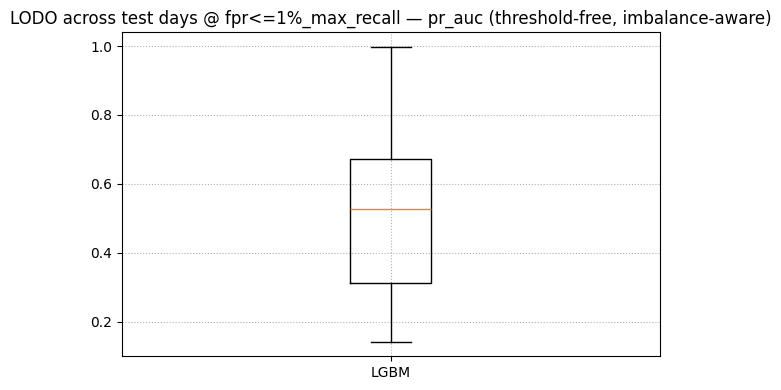

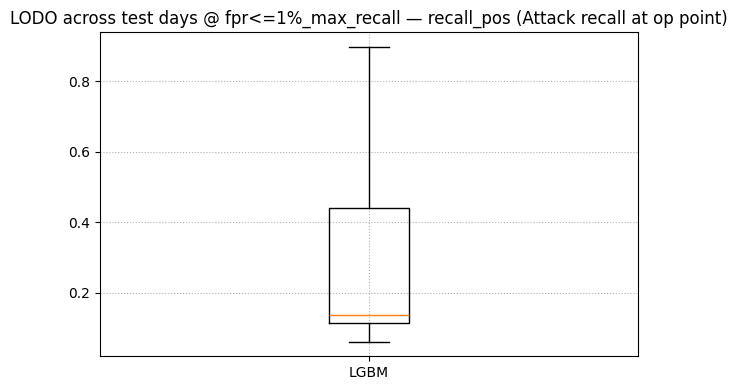

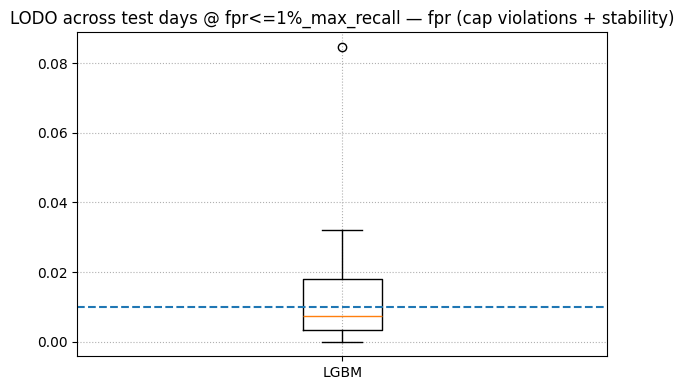

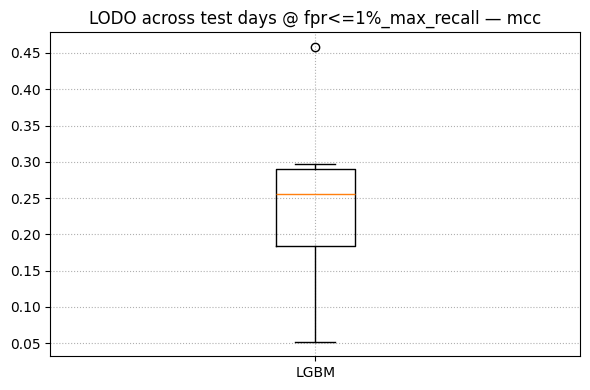


[LGBM] Representative days (worst + median + best) by pr_auc:


,model,pick,test_day,pr_auc
0,LGBM,worst,df_parquet_Infil1_Wed_28,0.142496
1,LGBM,median,df_parquet_Web1_Thu_22,0.572707
2,LGBM,best,df_parquet_DDoS2_Wed_21,0.997155


[LGBM] rep_days = ['df_parquet_Infil1_Wed_28', 'df_parquet_Web1_Thu_22', 'df_parquet_DDoS2_Wed_21']

[LGBM] per-subtype attack recall @A (fpr<=1%_max_recall) for test_day=df_parquet_Infil1_Wed_28


,subtype,n,share_of_attacks,tp,fn,recall,test_day,split_mode
0,Infiltration,56449,1.0,3485,52964,0.061737,df_parquet_Infil1_Wed_28,LODO



[LGBM] per-subtype attack recall @A (fpr<=1%_max_recall) for test_day=df_parquet_Web1_Thu_22


,subtype,n,share_of_attacks,tp,fn,recall,test_day,split_mode
0,BruteForce,307,0.900293,276,31,0.899023,df_parquet_Web1_Thu_22,LODO
1,Web,34,0.099707,30,4,0.882353,df_parquet_Web1_Thu_22,LODO



[LGBM] per-subtype attack recall @A (fpr<=1%_max_recall) for test_day=df_parquet_DDoS2_Wed_21


,subtype,n,share_of_attacks,tp,fn,recall,test_day,split_mode
0,DDoS,200591,1.0,18967,181624,0.094556,df_parquet_DDoS2_Wed_21,LODO


[LGBM] split_mode=LODO Xtr_raw=4,811,726 tune_size_target=30,000 Xt_actual=30,000 unique_days=7
[LGBM] FINAL fit_cap=300,000  Xfit_actual=300,000


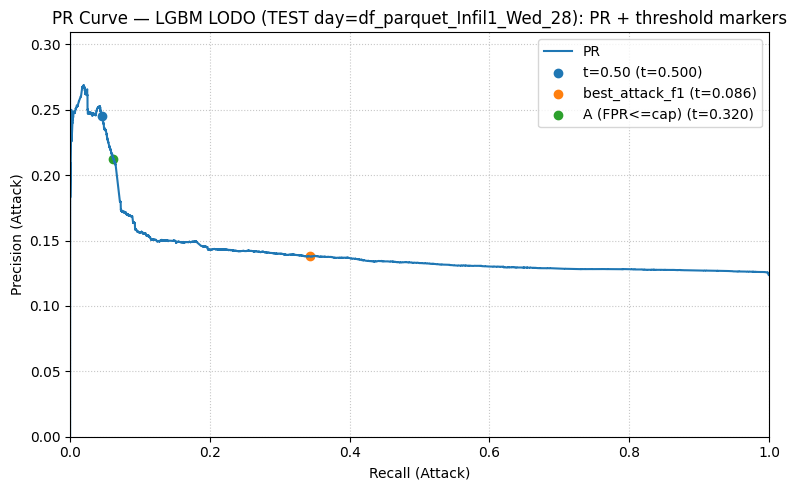

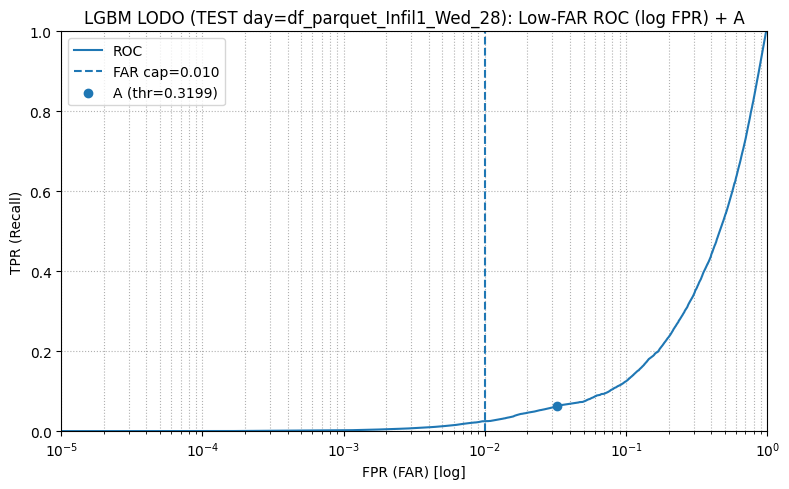

[LGBM] split_mode=LODO Xtr_raw=4,438,375 tune_size_target=30,000 Xt_actual=30,000 unique_days=7
[LGBM] FINAL fit_cap=300,000  Xfit_actual=300,000


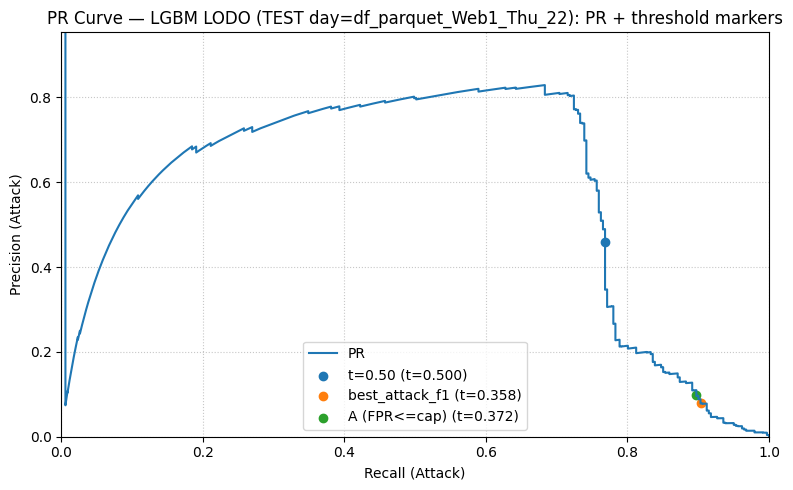

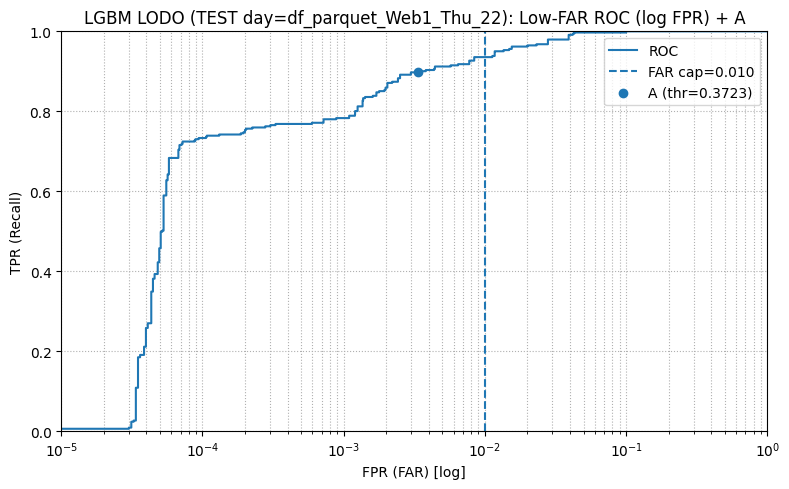

[LGBM] split_mode=LODO Xtr_raw=4,707,203 tune_size_target=30,000 Xt_actual=30,000 unique_days=7
[LGBM] FINAL fit_cap=300,000  Xfit_actual=300,000


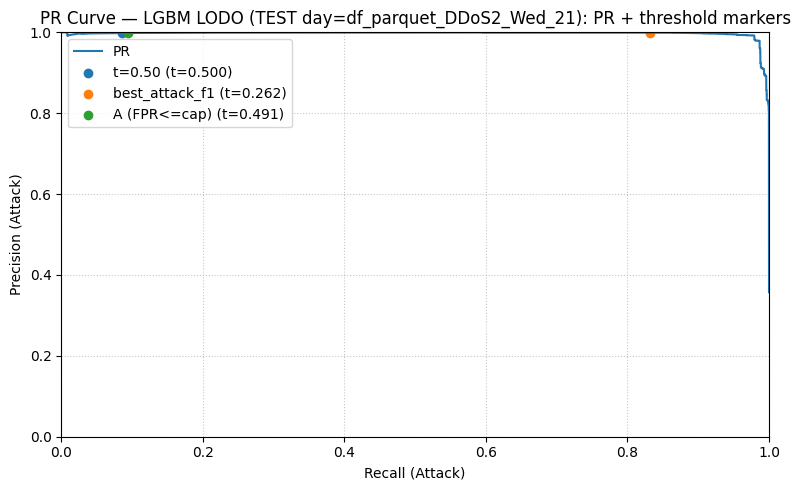

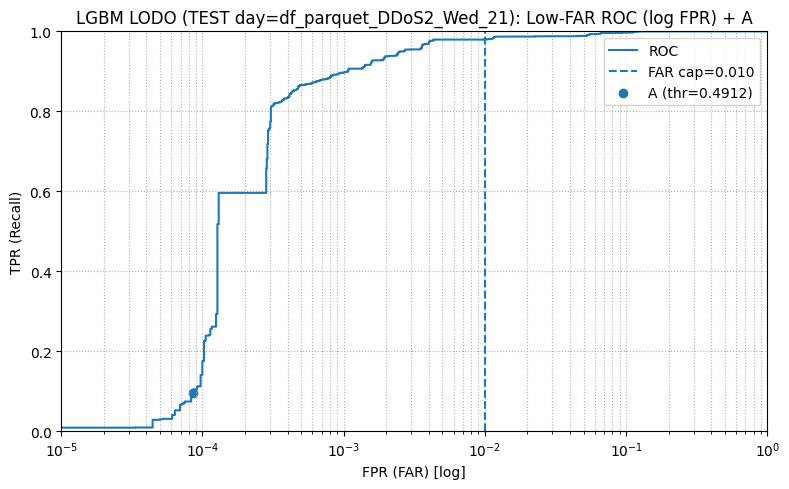

In [ ]:
# F) POST-LODO PLOTTING

MAIN_THR_LABEL = "fpr<=1%_max_recall"
PICK_METRIC = "pr_auc"   # median/worst by pr_auc

# ---------- FILL-IN (change for each model) ----------

MODEL_NAME = "LGBM"                  # e.g., "KNN", "DT", "ET", "RF"
DF_LODO     = results_lgbm_lodo       # our LODO results df for this model (ONLY LODO)
RUN_FOLD_FN = run_lgbm_fold           # the model runner function (must match run_*_fold signature)

KNOBS_FN    = get_lgbm_mode_knobs
kn = KNOBS_FN("LODO")

RUNNER_KWARGS = dict(
    # keep aligned with our runner signature
    fit_cap_final=None,
    val_eval_cap_final=LGBM_VAL_EVAL_CAP_FINAL,
    test_eval_cap_final=LGBM_TEST_EVAL_CAP_FINAL,

    do_calibrate=LGBM_DO_CALIBRATE,
    cal_method=LGBM_CAL_METHOD,
    cal_cv=LGBM_CAL_CV,
    
    # if our runner uses mode knobs (optional; safe because we filter kwargs)
    tune_cap_local=kn["tune_cap"],
    tune_frac_local=kn["tune_frac"],
    cv_splits_local=kn["cv_splits"],
    # n_iter_* key depends on the runner; include it if our runner has it
    n_iter_lgbm=kn["n_iter"],
)

# ---------- END FILL-IN ----------


# 1) Boxplots across days (ONLY 4 metrics)
plot_lodo_distributions_for_model(
    DF_LODO, model_name=MODEL_NAME,
    thr_label=MAIN_THR_LABEL,
    fpr_cap=MAX_FPR_CAP,
    metrics=("pr_auc", "recall_pos", "fpr", "mcc")
)

# 2) Representative days (worst + median + best)
picks_df, rep_days = pick_best_median_worst_days_for_model(
    DF_LODO,
    model_name=MODEL_NAME,
    thr_label=MAIN_THR_LABEL,
    metric=PICK_METRIC
)
print(f"\n[{MODEL_NAME}] Representative days (worst + median + best) by {PICK_METRIC}:")
display(picks_df)
print(f"[{MODEL_NAME}] rep_days =", rep_days)

# Appendix tables (only worst / median / best days)
if "lgbm_subtype_lodo_all" in globals() and not lgbm_subtype_lodo_all.empty:
    for d in rep_days:
        print(f"\n[LGBM] per-subtype attack recall @A ({MAIN_THR_LABEL}) for test_day={d}")
        df_d = lgbm_subtype_lodo_all[lgbm_subtype_lodo_all["test_day"] == d].copy()
        df_d = df_d.sort_values(["n", "recall"], ascending=[False, True]).reset_index(drop=True)
        display(df_d)
else:
    print("\n[LGBM] No stored per-subtype LODO tables found. Run LGBM Block E first.")


# 3) Representative-day plots: ONLY PR (+ markers) and Low-FAR ROC (log FPR) + A
replot_representative_days_lodo_minimal(
    model_name=MODEL_NAME,
    rep_days=rep_days,
    run_fold_fn=RUN_FOLD_FN,
    runner_kwargs=RUNNER_KWARGS,
    far_cap=MAX_FPR_CAP,
    thr_label_A="fpr<=1%_max_recall"
)

# END LGBM PIPELINE

### 6.d) SVM (SVC)

In [210]:
# A) SVM (SVC) runtime knobs

# FAST mode caps (algo test)
SVM_FIT_CAP_FAST        = 200_000
SVM_VAL_EVAL_CAP_FAST   = 200_000
SVM_TEST_EVAL_CAP_FAST  = 200_000

# EVAL caps (final reporting) — keep None for full VAL/TEST if feasible
SVM_VAL_EVAL_CAP_FINAL  = None
SVM_TEST_EVAL_CAP_FINAL = None

# Optional calibration knobs (default False => no behavior change)
SVM_DO_CALIBRATE = False
SVM_CAL_METHOD   = "sigmoid"
SVM_CAL_CV       = 3

# FULL mode - LODO knobs
SVM_N_ITER_TUNE_LODO   = 10
SVM_TUNE_CAP_LODO      = 30_000
SVM_TUNE_FRAC_LODO     = 0.10
SVM_CV_SPLITS_LODO     = 3
SVM_FIT_CAP_FINAL_LODO = 300_000

# FULL mode - MIXED knobs 
SVM_N_ITER_TUNE_MIXED   = 20 #30 was huge for SVM
SVM_TUNE_CAP_MIXED      = 150_000
SVM_TUNE_FRAC_MIXED     = 0.20
SVM_CV_SPLITS_MIXED     = 3 #5 was huge for SVM
SVM_FIT_CAP_FINAL_MIXED = 300_000 #1_000_000 was huge for SVM

def get_svm_mode_knobs(split_mode: str):
    if split_mode == "MIXED":
        return dict(
            cv_splits=SVM_CV_SPLITS_MIXED,
            n_iter=SVM_N_ITER_TUNE_MIXED,
            tune_cap=SVM_TUNE_CAP_MIXED,
            tune_frac=SVM_TUNE_FRAC_MIXED,
            fit_cap_final=SVM_FIT_CAP_FINAL_MIXED,
        )
    return dict(
        cv_splits=SVM_CV_SPLITS_LODO,
        n_iter=SVM_N_ITER_TUNE_LODO,
        tune_cap=SVM_TUNE_CAP_LODO,
        tune_frac=SVM_TUNE_FRAC_LODO,
        fit_cap_final=SVM_FIT_CAP_FINAL_LODO,
    )


In [211]:
# B) SVM (SVC) fold runner (split_mode-aware)


# FIT capping: LODO prefers day-balanced; MIXED uses cap_rows
def _cap_for_fit_svm(X, y, g, cap, split_mode="LODO", seed=None):
    if seed is None:
        seed = random_state
    if cap is None:
        return X, y, g
    if split_mode == "MIXED":
        return cap_rows(X, y, g, cap, seed=seed)

    # LODO
    if "cap_rows_day_balanced" in globals():
        try:
            return cap_rows_day_balanced(X, y, g, cap, seed=seed, min_per_day=1)
        except TypeError:
            return cap_rows_day_balanced(X, y, g, cap, seed=seed)
    return cap_rows(X, y, g, cap, seed=seed)

# EVAL capping: always cap_rows (cap_rows is already no-op if cap is None)
def _cap_for_eval_svm(X, y, g, cap, seed=None):
    if seed is None:
        seed = random_state
    return cap_rows(X, y, g, cap, seed=seed)

# safe partial AUC scorer (works with decision_function scores too)
def safe_partial_auc_svm(y_true, y_score, max_fpr=0.01):
    y_score = np.asarray(y_score)
    if y_score.ndim == 2 and y_score.shape[1] >= 2:
        y_score = y_score[:, 1]
    try:
        return roc_auc_score(y_true, y_score, max_fpr=max_fpr)
    except TypeError:
        return roc_auc_score(y_true, y_score)
    except ValueError:
        return 0.5

def run_svm_fold(
    Xtr_raw, ytr, gtr,
    Xva_raw, yva, gva,
    Xte_raw, yte, gte,
    preprocessor,
    model_name="SVM",
    max_fpr_cap=0.01,

    fast_mode=False,
    fit_cap_fast=SVM_FIT_CAP_FAST,
    fit_cap_final=None,
    val_eval_cap_fast=SVM_VAL_EVAL_CAP_FAST,
    test_eval_cap_fast=SVM_TEST_EVAL_CAP_FAST,
    val_eval_cap_final=SVM_VAL_EVAL_CAP_FINAL,
    test_eval_cap_final=SVM_TEST_EVAL_CAP_FINAL,

    # optional calibration
    do_calibrate=SVM_DO_CALIBRATE,
    cal_method=SVM_CAL_METHOD,
    cal_cv=SVM_CAL_CV,

    # mode defaults + overrides (i.e., split_mode-aware knobs)
    n_iter_svm=None,
    split_mode="LODO",
    tune_cap_local=None,
    tune_frac_local=None,
    cv_splits_local=None,

    # svm misc
    cache_size=2048,     # MB
    max_iter=-1,         # -1 means no hard iteration cap
):
    rs = random_state  # GLOBAL

    # resolve mode defaults
    kn = get_svm_mode_knobs(split_mode)
    if fit_cap_final is None:
        fit_cap_final = kn["fit_cap_final"]

    tcap  = int(kn["tune_cap"] if tune_cap_local is None else tune_cap_local)
    tfrac = float(kn["tune_frac"] if tune_frac_local is None else tune_frac_local)
    n_iter_svm = int(kn["n_iter"] if n_iter_svm is None else n_iter_svm)

    # tuning subset (split_mode-aware)
    tune_size = int(min(tcap, max(5_000, tfrac * len(Xtr_raw))))
    Xt, yt, gt = _cap_for_fit_svm(Xtr_raw, ytr, gtr, cap=tune_size, split_mode=split_mode, seed=rs)
    gt_arr = np.asarray(gt)

    print(
        f"[{model_name}] split_mode={split_mode} Xtr_raw={len(Xtr_raw):,} "
        f"tune_size_target={tune_size:,} Xt_actual={len(Xt):,} "
        f"unique_days={len(np.unique(gt_arr))}"
    )

    # ---------------- FAST MODE ----------------
    if fast_mode:
        Xfit, yfit, gfit = _cap_for_fit_svm(Xtr_raw, ytr, gtr, cap=fit_cap_fast, split_mode=split_mode, seed=rs)
        print(f"[{model_name}] FAST fit_cap={fit_cap_fast:,}  Xfit_actual={len(Xfit):,}")

        best_pipe = Pipeline(steps=[
            ("prep", preprocessor),
            ("clf", SVC(
                kernel="rbf",
                C=1.0,
                gamma="scale",
                class_weight="balanced",
                probability=False,    # use decision_function for scoring
                cache_size=cache_size,
                max_iter=max_iter,
                random_state=rs
            ))
        ])
        best_pipe.fit(Xfit, yfit)

        best_params = {
            "FAST_MODE": True,
            "clf__C": 1.0,
            "clf__gamma": "scale",
            "fit_cap_fast": fit_cap_fast,
            "split_mode": split_mode,
            "scoring_used": "N/A_FAST",
            "calibrated": False,
        }
        model = best_pipe

    # ---------------- FULL MODE ----------------
    else:
        spl = int(kn["cv_splits"] if cv_splits_local is None else cv_splits_local)

        # rely on global get_inner_cv
        cv = get_inner_cv(
            split_mode,
            y=np.asarray(yt).astype(int),
            groups=gt_arr,
            default_splits=spl,
            seed=rs
        )

        if split_mode == "LODO" and len(np.unique(gt_arr)) < 2:
            raise ValueError("Not enough unique day groups in tuning subset for GroupKFold (LODO).")

        base_pipe = Pipeline(steps=[
            ("prep", preprocessor),
            ("clf", SVC(
                kernel="rbf",
                class_weight="balanced",
                probability=False,     # decision_function for scoring (faster than predict_proba) // if probability=True (much slower and memory heavier), need to also set scoring to use proba-aware scorer (needs_proba=True) and handle cases where proba isn't available (e.g., due to predict_proba not being supported by SVC with probability=False))
                cache_size=cache_size,
                max_iter=max_iter,
                random_state=rs
            ))
        ])

        # search space: keep tight (RBF SVM is expensive)
        param_dist = {
            "clf__C": loguniform(1e-2, 1e2),
            "clf__gamma": loguniform(1e-5, 1e-1),
        }

        # scoring: MIXED optimizes low-FAR region; LODO uses average_precision
        if split_mode == "MIXED":
            scoring_used = make_scorer(safe_partial_auc_svm, needs_threshold=True, max_fpr=max_fpr_cap) # Because SVC(probability=False) (recommended for speed), the model exposes decision_function, not predict_proba
            scoring_tag = "partial_auc@max_fpr"
        else:
            scoring_used = "average_precision"
            scoring_tag = "average_precision"

        search = RandomizedSearchCV(
            estimator=base_pipe,
            param_distributions=param_dist,
            n_iter=int(n_iter_svm),
            scoring=scoring_used,
            error_score=0.0,
            cv=cv,
            n_jobs=-1,
            random_state=rs,
            refit=True,
            verbose=0
        )

        if split_mode == "LODO":
            search.fit(Xt, yt, groups=gt_arr)
        else:
            search.fit(Xt, yt)

        # final fit (split_mode-aware capping)
        Xfit, yfit, gfit = _cap_for_fit_svm(Xtr_raw, ytr, gtr, cap=fit_cap_final, split_mode=split_mode, seed=rs)
        print(f"[{model_name}] FINAL fit_cap={fit_cap_final:,}  Xfit_actual={len(Xfit):,}")

        best_pipe = search.best_estimator_
        best_pipe.fit(Xfit, yfit)

        best_params = dict(search.best_params_)
        best_params["fit_cap_final"] = int(fit_cap_final)
        best_params["split_mode"] = split_mode
        best_params["tune_size"] = int(tune_size)
        best_params["cv_splits"] = int(getattr(cv, "n_splits", spl))
        best_params["n_iter"] = int(n_iter_svm)
        best_params["scoring_used"] = scoring_tag

        # OPTIONAL CALIBRATION (split-safe)
        model = best_pipe
        best_params["calibrated"] = False

        if do_calibrate:
            if split_mode == "LODO":
                gfit_arr = np.asarray(gfit)
                uniq_days = np.unique(gfit_arr)
                if len(uniq_days) >= 2:
                    cal_splits = min(int(cal_cv), len(uniq_days))
                    gkf = GroupKFold(n_splits=cal_splits)
                    splits = list(gkf.split(Xfit, yfit, groups=gfit_arr))
                    cal = CalibratedClassifierCV(estimator=clone(best_pipe), method=cal_method, cv=splits)
                    cal.fit(Xfit, yfit)
                    model = cal
                    best_params["calibrated"] = True
                    best_params["cal_method"] = cal_method
                    best_params["cal_cv"] = cal_splits
                else:
                    best_params["calibration_skipped_reason"] = "not_enough_unique_day_groups_in_gfit"
            else:
                skf = StratifiedKFold(n_splits=max(2, int(cal_cv)), shuffle=True, random_state=rs)
                cal = CalibratedClassifierCV(estimator=clone(best_pipe), method=cal_method, cv=skf)
                cal.fit(Xfit, yfit)
                model = cal
                best_params["calibrated"] = True
                best_params["cal_method"] = cal_method
                best_params["cal_cv"] = int(cal_cv)

    # ---------------- EVAL CAPS ----------------
    if fast_mode:
        Xva_eval, yva_eval, _ = _cap_for_eval_svm(Xva_raw, yva, gva, val_eval_cap_fast, seed=rs)
        Xte_eval, yte_eval, _ = _cap_for_eval_svm(Xte_raw, yte, gte, test_eval_cap_fast, seed=rs)
    else:
        Xva_eval, yva_eval, _ = _cap_for_eval_svm(Xva_raw, yva, gva, val_eval_cap_final, seed=rs)
        Xte_eval, yte_eval, _ = _cap_for_eval_svm(Xte_raw, yte, gte, test_eval_cap_final, seed=rs)

    # ---------------- THRESHOLD TUNING ON VAL ----------------
    score_va = get_scores(model, Xva_eval)
    if "log_if_degenerate_scores" in globals():
        log_if_degenerate_scores(score_va, model_name, split_name="VAL")

    t_f1, _ = pick_threshold_best_attack_f1(yva_eval, score_va)
    t_fpr = pick_threshold_fpr_constrained_max_recall(yva_eval, score_va, max_fpr=max_fpr_cap)
    t_r95 = pick_threshold_recall_target_min_fpr(yva_eval, score_va, recall_target=0.95, max_fpr=max_fpr_cap)
    t_r98 = pick_threshold_recall_target_min_fpr(yva_eval, score_va, recall_target=0.98, max_fpr=max_fpr_cap)

    # diagnostics (NO CAP)
    t_r95_any = pick_threshold_recall_target_min_fpr(yva_eval, score_va, recall_target=0.95, max_fpr=1.0)
    t_r98_any = pick_threshold_recall_target_min_fpr(yva_eval, score_va, recall_target=0.98, max_fpr=1.0)

    thresholds = {
        "t=0.50": 0.50,
        "best_attack_f1": t_f1,
        "fpr<=1%_max_recall": t_fpr,
        "recall>=0.95_min_fpr": t_r95,
        "recall>=0.98_min_fpr": t_r98,
        "recall>=0.95_min_fpr_NO_CAP": t_r95_any,
        "recall>=0.98_min_fpr_NO_CAP": t_r98_any,
    }
    feas = {k: (v is not None) for k, v in thresholds.items()}
    thresholds_valid = {k: v for k, v in thresholds.items() if v is not None}

    # realized VAL FPR at FAR-capped threshold
    t_fpr_sel = thresholds.get("fpr<=1%_max_recall", None)
    if t_fpr_sel is not None:
        yhat_val = (score_va >= float(t_fpr_sel)).astype(int)
        tn, fp, fn, tp = confusion_matrix(yva_eval, yhat_val, labels=[0, 1]).ravel()
        best_params["val_fpr_realized_at_fpr1_thr"] = float(fp / (fp + tn + 1e-12))
    else:
        best_params["val_fpr_realized_at_fpr1_thr"] = None

    # ---------------- EVALUATE ON TEST ----------------
    score_te = get_scores(model, Xte_eval)
    if "log_if_degenerate_scores" in globals():
        log_if_degenerate_scores(score_te, model_name, split_name="TEST")

    if t_fpr_sel is not None:
        yhat_te = (score_te >= float(t_fpr_sel)).astype(int)
        tn, fp, fn, tp = confusion_matrix(yte_eval, yhat_te, labels=[0, 1]).ravel()
        best_params["test_fpr_realized_at_fpr1_thr"] = float(fp / (fp + tn + 1e-12))
    else:
        best_params["test_fpr_realized_at_fpr1_thr"] = None

    df = evaluate_thresholds(yte_eval, score_te, thresholds_valid, name=model_name)

    if do_plots:
        plot_pr_curve_with_thresholds(yte_eval, score_te, thresholds_valid, model_name=model_name)
        plot_roc_curve(yte_eval, score_te, model_name=model_name)
        plot_det_curve(yte_eval, score_te, model_name=model_name)
        plot_score_distribution(yte_eval, score_te, model_name=model_name, bins=100)

    # artifacts (mirror LGBM)
    feas["__artifacts__"] = {
        "score_te": score_te,
        "yte_eval": yte_eval,
        "score_va": score_va,
        "yva_eval": yva_eval,
    }

    return df, best_params, thresholds, feas


In [ ]:
# C) SVM algo test cell — runs one LODO day + one MIXED run in FAST mode

RUN_MODELS["SVM"] = True
ALGO_TEST_DAY = TEST_DAYS[0]
print("Algo test day:", ALGO_TEST_DAY)

old_do_plots = do_plots
do_plots = False

# ---------- LODO algo test ----------
split_mode = "LODO"
kn = get_svm_mode_knobs(split_mode)

Xtr_raw, ytr, gtr, Xva_raw, yva, gva, Xte_raw, yte, gte, meta = build_fold(
    registry=REGISTRY, val_days=VAL_DAYS, test_day=ALGO_TEST_DAY
)
preprocessor, prep_dbg = build_preprocessor(Xtr_raw, meta["feature_cols"])
print("LODO preprocessor debug:", prep_dbg)

if RUN_MODELS.get("SVM", False):
    svm_df, svm_best_params, svm_thresholds, svm_feas = run_svm_fold(
        Xtr_raw, ytr, gtr,
        Xva_raw, yva, gva,
        Xte_raw, yte, gte,
        preprocessor,
        model_name="SVM",
        fast_mode=True,
        fit_cap_fast=SVM_FIT_CAP_FAST,
        val_eval_cap_fast=SVM_VAL_EVAL_CAP_FAST,
        test_eval_cap_fast=SVM_TEST_EVAL_CAP_FAST,
        max_fpr_cap=MAX_FPR_CAP,
        split_mode=split_mode,

        # keep knobs consistent even if FAST doesn’t use them
        n_iter_svm=kn["n_iter"],
        tune_cap_local=kn["tune_cap"],
        tune_frac_local=kn["tune_frac"],
        cv_splits_local=kn["cv_splits"],

        do_calibrate=SVM_DO_CALIBRATE,
        cal_method=SVM_CAL_METHOD,
        cal_cv=SVM_CAL_CV,
    )
    print("SVM (LODO) best params:", svm_best_params)
    print("SVM (LODO) thresholds:", svm_thresholds)
    print("SVM (LODO) feasibility:", {k:v for k,v in svm_feas.items() if k != "__artifacts__"})
    display(svm_df)

# ---------- MIXED algo test ----------
split_mode = "MIXED"
kn = get_svm_mode_knobs(split_mode)

Xtr_raw_m, ytr_m, gtr_m, Xva_raw_m, yva_m, gva_m, Xte_raw_m, yte_m, gte_m, meta_m = build_mixed_fold(
    registry=REGISTRY,
    seed=MIXED_RANDOM_STATE,
    test_size=MIXED_TEST_SIZE,
    val_size=MIXED_VAL_SIZE,
    use_rare_injection=MIXED_USE_RARE_ALLOCATION,
    rare_subtypes=RARE_SUBTYPES,
    rare_n_test=RARE_N_TEST_PER_SUBTYPE,
    rare_n_val=RARE_N_VAL_PER_SUBTYPE,
)
preprocessor_m, prep_dbg_m = build_preprocessor(Xtr_raw_m, meta_m["feature_cols"])
print("MIXED preprocessor debug:", prep_dbg_m)

if RUN_MODELS.get("SVM", False):
    svm_df_m_test, svm_best_params_m_test, svm_thresholds_m_test, svm_feas_m_test = run_svm_fold(
        Xtr_raw_m, ytr_m, gtr_m,
        Xva_raw_m, yva_m, gva_m,
        Xte_raw_m, yte_m, gte_m,
        preprocessor_m,
        model_name="SVM",
        fast_mode=True,
        fit_cap_fast=SVM_FIT_CAP_FAST,
        val_eval_cap_fast=SVM_VAL_EVAL_CAP_FAST,
        test_eval_cap_fast=SVM_TEST_EVAL_CAP_FAST,
        max_fpr_cap=MAX_FPR_CAP,
        split_mode=split_mode,

        n_iter_svm=kn["n_iter"],
        tune_cap_local=kn["tune_cap"],
        tune_frac_local=kn["tune_frac"],
        cv_splits_local=kn["cv_splits"],

        do_calibrate=SVM_DO_CALIBRATE,
        cal_method=SVM_CAL_METHOD,
        cal_cv=SVM_CAL_CV,
    )
    print("SVM (MIXED) best params:", svm_best_params_m_test)
    print("SVM (MIXED) thresholds:", svm_thresholds_m_test)
    print("SVM (MIXED) feasibility:", {k:v for k,v in svm_feas_m_test.items() if k != "__artifacts__"})
    display(svm_df_m_test)

do_plots = old_do_plots


MIXED preprocessor debug: {'log1p_cols': ['Active Mean', 'Active Std', 'Bwd IAT Total', 'Bwd IAT Min', 'Packet Length Variance', 'Packet Length Min', 'Bwd Packets/s', 'Down/Up Ratio', 'FIN Flag Count', 'Flow Bytes/s', 'Flow IAT Std', 'Fwd IAT Min', 'Fwd IAT Std', 'Fwd Packet Length Std', 'Fwd Packets/s', 'Fwd URG Flags', 'Idle Min', 'RST Flag Count', 'SYN Flag Count', 'URG Flag Count'], 'scale_cols': ['ACK Flag Count', 'Init Bwd Win Bytes', 'Init Fwd Win Bytes', 'PSH Flag Count'], 'has_protocol': True}
MIXED shapes: (4661671, 25) (665954, 25) (1331907, 25)
MIXED n_features: 25
[SVM] split_mode=MIXED Xtr_raw=4,661,671 tune_size_target=150,000 Xt_actual=150,000 unique_days=10
[SVM] FINAL fit_cap=300,000  Xfit_actual=300,000


,stage2_skipped,n_train_attacks,n_test_attacks,n_classes,classes,oracle_n_test_classes,oracle_macro_f1,oracle_weighted_f1,oracle_acc,oracle_bacc,gated_available,gate_thr,n_flagged_total,n_tp_attacks,gated_macro_f1_tp,joint_correct_rate,model,split_mode,test_day
0,False,931366,266105,6,"[Bot, BruteForce, DDoS, DoS, Infiltration, OTHER]",6,0.798335,0.968943,0.969505,0.790988,True,0.678105,252223,241641,0.912979,0.891937,SVM,MIXED,MIXED


SVM attack type stage 2 result: {'stage2_skipped': False, 'n_train_attacks': 931366, 'n_test_attacks': 266105, 'n_classes': 6, 'classes': ['Bot', 'BruteForce', 'DDoS', 'DoS', 'Infiltration', 'OTHER'], 'oracle_n_test_classes': 6, 'oracle_macro_f1': 0.7983346384599698, 'oracle_weighted_f1': 0.9689434833870711, 'oracle_acc': 0.9695045188929182, 'oracle_bacc': 0.7909876015715908, 'gated_available': True, 'gate_thr': 0.678105406188291, 'n_flagged_total': 252223, 'n_tp_attacks': 241641, 'gated_macro_f1_tp': 0.9129790528340855, 'joint_correct_rate': 0.8919373931342891, 'model': 'SVM', 'split_mode': 'MIXED', 'test_day': 'MIXED'}

=== MIXED (SVM): best_params ===
{'clf__C': np.float64(0.31489116479568624), 'clf__gamma': np.float64(0.06351221010640701), 'fit_cap_final': 300000, 'split_mode': 'MIXED', 'tune_size': 150000, 'cv_splits': 3, 'n_iter': 20, 'scoring_used': 'partial_auc@max_fpr', 'calibrated': False, 'val_fpr_realized_at_fpr1_thr': 0.009827341288532016, 'test_fpr_realized_at_fpr1_thr': 

,thr,tn,fp,fn,tp,precision_pos,recall_pos,f1_pos,macro_f1,fpr,fnr,mcc,balanced_acc,roc_auc,pr_auc,model,thr_label,test_day,split_mode
0,0.500000,1053305,12497,23810,242295,0.950952,0.910524,0.930299,0.956678,0.011725,0.089476,0.913699,0.949399,0.974847,0.939955,SVM,t=0.50,MIXED,MIXED
1,0.738480,1057346,8456,24879,241226,0.966133,0.906507,0.935371,0.959926,0.007934,0.093493,0.920589,0.949286,0.974847,0.939955,SVM,best_attack_f1,MIXED,MIXED
2,0.678105,1055220,10582,24464,241641,0.958045,0.908066,0.932386,0.958026,0.009929,0.091934,0.916573,0.949069,0.974847,0.939955,SVM,fpr<=1%_max_recall,MIXED,MIXED
3,-1.000076,882818,182984,12988,253117,0.580409,0.951192,0.720920,0.810508,0.171687,0.048808,0.664176,0.889753,0.974847,0.939955,SVM,recall>=0.95_min_fpr_NO_CAP,MIXED,MIXED
4,-1.002909,654954,410848,5294,260811,0.388309,0.980106,0.556240,0.657573,0.385482,0.019894,0.475531,0.797312,0.974847,0.939955,SVM,recall>=0.98_min_fpr_NO_CAP,MIXED,MIXED



Total time elapsed for SVM MIXED-only run: 370.79 minutes

[SVM MIXED] Operating points (TEST)


,label,thr,fpr,recall,precision,f1,tn,fp,fn,tp
0,best_attack_f1,0.738480,0.007934,0.906507,0.966133,0.935371,1057346,8456,24879,241226
1,A (FPR<=1%),0.678105,0.009929,0.908066,0.958045,0.932386,1055220,10582,24464,241641
2,t=0.50,0.500000,0.011725,0.910524,0.950952,0.930299,1053305,12497,23810,242295
3,B (Recall>=0.95 NO CAP),-1.000076,0.171687,0.951192,0.580409,0.720920,882818,182984,12988,253117
4,C (recall>=0.98_min_fpr_NO_CAP),-1.002909,0.385482,0.980106,0.388309,0.556240,654954,410848,5294,260811


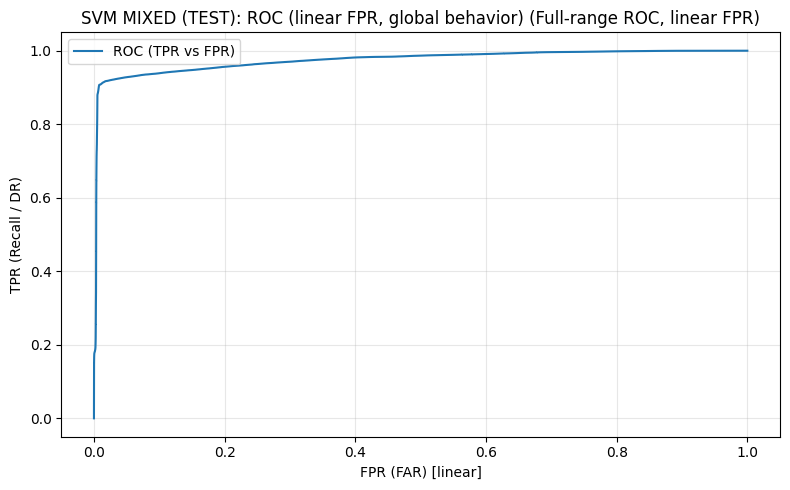

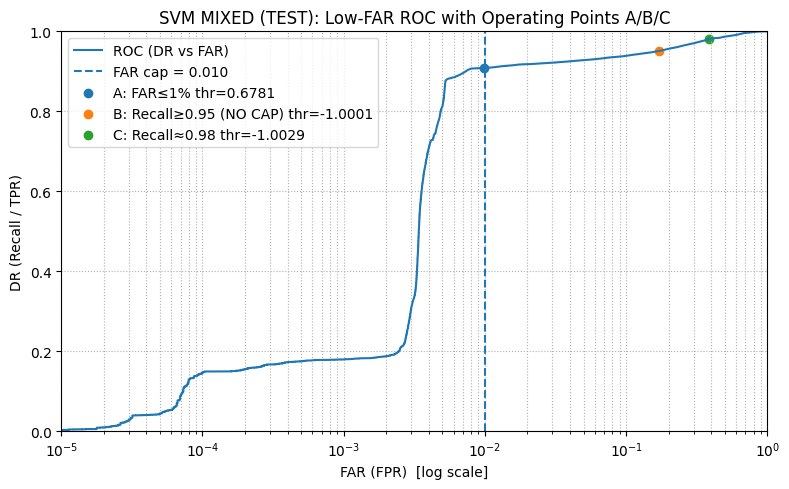

Operating Point A (FAR capped): {'thr': 0.678105406188291, 'tn': 1055220, 'fp': 10582, 'fn': 24464, 'tp': 241641, 'precision_pos': 0.9580450632971617, 'recall_pos': 0.9080663647808196, 'f1_pos': 0.9323864425614669, 'macro_f1': 0.9580258410228338, 'fpr': 0.009928673430899924, 'fnr': 0.0919336352191804, 'mcc': 0.9165729349293249, 'balanced_acc': 0.9490688456749599}
Operating Point B (Recall>=0.95 NO CAP): {'thr': -1.0000759783382578, 'tn': 882818, 'fp': 182984, 'fn': 12988, 'tp': 253117, 'precision_pos': 0.5804091254090222, 'recall_pos': 0.9511921985682343, 'f1_pos': 0.7209195022543242, 'macro_f1': 0.8105078749113228, 'fpr': 0.1716866735097138, 'fnr': 0.048807801431765656, 'mcc': 0.6641764244775872, 'balanced_acc': 0.8897527625292603}
FAR cost multiplier (B vs A): 17.29x
Operating Point C (Recall≈0.98): {'thr': -1.0029092574340097, 'tn': 654954, 'fp': 410848, 'fn': 5294, 'tp': 260811, 'precision_pos': 0.38830865066946174, 'recall_pos': 0.9801055974145544, 'f1_pos': 0.556240162770164, 'ma

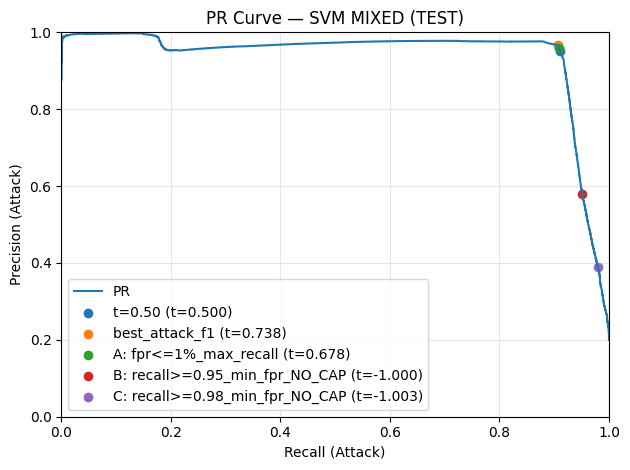

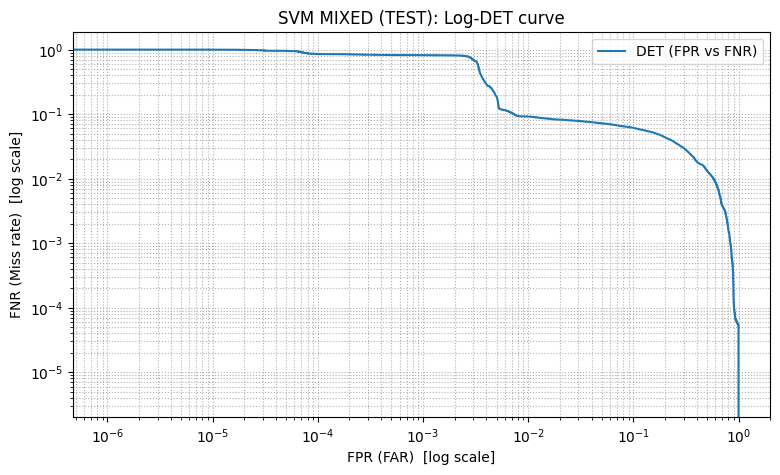

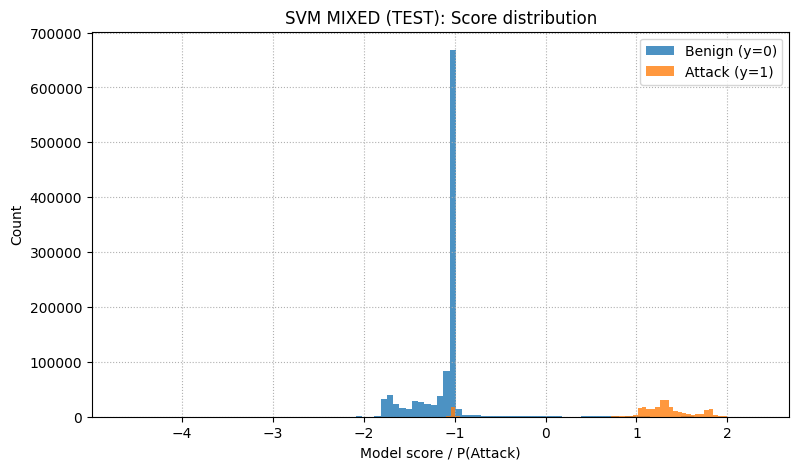


=== MIXED (SVM): per-subtype attack recall @ Operating Point A (fpr<=1%) ===


,subtype,n,share_of_attacks,tp,fn,recall
0,DDoS,155400,0.583980,155232,168,0.998919
1,DoS,39179,0.147231,37700,1479,0.962250
2,Bot,28902,0.108611,28521,381,0.986818
3,Infiltration,23508,0.088341,1368,22140,0.058193
4,BruteForce,19066,0.071648,18820,246,0.987097
5,Web,50,0.000188,0,50,0.000000


In [212]:
# D) SVM (SVC) outer loop (MIXED ONLY) + display results + required plots for MIXED mode
# NOTE: produces svm_*_m variables that Block H will APPEND (no recompute).

RUN_MODELS["SVM"] = True

START_TIME = time.time()
old_do_plots = do_plots
do_plots = False  # plot manually in this cell

split_mode = "MIXED"
kn = get_svm_mode_knobs(split_mode)

Xtr_raw_m, ytr_m, gtr_m, Xva_raw_m, yva_m, gva_m, Xte_raw_m, yte_m, gte_m, meta_m = build_mixed_fold(
    registry=REGISTRY,
    seed=MIXED_RANDOM_STATE,
    test_size=MIXED_TEST_SIZE,
    val_size=MIXED_VAL_SIZE,
    use_rare_injection=MIXED_USE_RARE_ALLOCATION,
    rare_subtypes=RARE_SUBTYPES,
    rare_n_test=RARE_N_TEST_PER_SUBTYPE,
    rare_n_val=RARE_N_VAL_PER_SUBTYPE,
)

preprocessor_m, prep_dbg_m = build_preprocessor(Xtr_raw_m, meta_m["feature_cols"])
print("MIXED preprocessor debug:", prep_dbg_m)
print("MIXED shapes:", Xtr_raw_m.shape, Xva_raw_m.shape, Xte_raw_m.shape)
print("MIXED n_features:", len(meta_m["feature_cols"]))

svm_df_m, svm_best_params_m, svm_thresholds_m, svm_feas_m = run_svm_fold(
    Xtr_raw_m, ytr_m, gtr_m,
    Xva_raw_m, yva_m, gva_m,
    Xte_raw_m, yte_m, gte_m,
    preprocessor_m,
    model_name="SVM",
    fast_mode=False,

    fit_cap_final=None,  # default from mode knobs
    val_eval_cap_final=SVM_VAL_EVAL_CAP_FINAL,
    test_eval_cap_final=SVM_TEST_EVAL_CAP_FINAL,
    max_fpr_cap=MAX_FPR_CAP,
    split_mode=split_mode,

    do_calibrate=SVM_DO_CALIBRATE,
    cal_method=SVM_CAL_METHOD,
    cal_cv=SVM_CAL_CV,

    n_iter_svm=None,  # default from mode knobs
    tune_cap_local=kn["tune_cap"],
    tune_frac_local=kn["tune_frac"],
    cv_splits_local=kn["cv_splits"],
)


svm_attacktype_m = None
if DO_ATTACKTYPE_STAGE2:
    art = svm_feas_m.get("__artifacts__", {})
    score_te_m = art.get("score_te", None)
    thr_main_m = svm_thresholds_m.get(MAIN_THR_LABEL, None)

    svm_attacktype_m = run_attacktype_stage2(
        model_key="SVM",
        preprocessor=preprocessor_m,
        Xtr_raw=Xtr_raw_m, ytr=ytr_m, label_raw_train=meta_m["label_raw_train"],
        Xte_raw=Xte_raw_m, yte=yte_m, label_raw_test=meta_m["label_raw_test"],
        gate_scores_te=score_te_m, gate_thr=thr_main_m,
        base_best_params=svm_best_params_m,
        min_count=ATTACKTYPE_MIN_COUNT,
        rare_set=RARE_SUBTYPES,
        other_label=ATTACKTYPE_OTHER_LABEL,
    )
    svm_attacktype_m.update({"model": "SVM", "split_mode": "MIXED", "test_day": "MIXED"})
    display(pd.DataFrame([svm_attacktype_m]))
print("SVM attack type stage 2 result:", svm_attacktype_m)


svm_df_m = svm_df_m.copy()
svm_df_m["test_day"] = "MIXED"
svm_df_m["split_mode"] = "MIXED"

print("\n=== MIXED (SVM): best_params ===")
print(svm_best_params_m)

print("\n=== MIXED (SVM): thresholds (picked on VAL) ===")
print(svm_thresholds_m)

print("\n=== MIXED (SVM): feasibility ===")
print({k: v for k, v in svm_feas_m.items() if k != "__artifacts__"})

display(svm_df_m)

elapsed = time.time() - START_TIME
print(f"\nTotal time elapsed for SVM MIXED-only run: {elapsed/60:.2f} minutes")

# -------------------- REQUIRED PLOTS / MIXED SPLIT ONLY --------------------
art = svm_feas_m.get("__artifacts__", {})
yte_eval_m = art.get("yte_eval", None)
score_te_m = art.get("score_te", None)

if yte_eval_m is not None and score_te_m is not None:

    thr_A = svm_thresholds_m.get("fpr<=1%_max_recall", None)
    thr_B = svm_thresholds_m.get("recall>=0.95_min_fpr_NO_CAP", None)
    thr_C, thr_C_label = _select_r98_threshold_for_plot(svm_thresholds_m)

    op_table_dict = {
        "t=0.50": svm_thresholds_m.get("t=0.50"),
        "best_attack_f1": svm_thresholds_m.get("best_attack_f1"),
        "A (FPR<=1%)": thr_A,
        "B (Recall>=0.95 NO CAP)": thr_B,
    }
    if thr_C is not None:
        op_table_dict[f"C ({thr_C_label})"] = thr_C

    print_operating_points_table(
        yte_eval_m, score_te_m,
        thresholds_dict=op_table_dict,
        model_name="SVM MIXED",
        sort_by="fpr"
    )

    plot_roc_curve_linear_with_operating_points(
        yte_eval_m, score_te_m,
        thresholds_dict={},  # no markers for global ROC
        model_name="SVM MIXED (TEST): ROC (linear FPR, global behavior)"
    )

    if thr_A is not None:
        plot_low_far_roc_with_ops(
            yte_eval_m, score_te_m,
            thr_A=thr_A,
            thr_B=(thr_B if thr_B is not None else None),
            thr_C=(thr_C if thr_C is not None else None),
            far_cap=MAX_FPR_CAP,
            title="SVM MIXED (TEST): Low-FAR ROC with Operating Points A/B/C"
        )

    thr_dict_for_pr = {
        "t=0.50": svm_thresholds_m.get("t=0.50"),
        "best_attack_f1": svm_thresholds_m.get("best_attack_f1"),
        "A: fpr<=1%_max_recall": svm_thresholds_m.get("fpr<=1%_max_recall"),
        "B: recall>=0.95_min_fpr_NO_CAP": svm_thresholds_m.get("recall>=0.95_min_fpr_NO_CAP"),
    }
    if thr_C is not None:
        thr_dict_for_pr[f"C: {thr_C_label}"] = thr_C

    plot_pr_curve_with_thresholds(
        yte_eval_m, score_te_m,
        thr_dict_for_pr,
        model_name="SVM MIXED (TEST)"
    )

    plot_det(yte_eval_m, score_te_m, title="SVM MIXED (TEST): Log-DET curve")

    plot_score_hist(yte_eval_m, score_te_m, title="SVM MIXED (TEST): Score distribution", bins=100)

    # 7) Per-subtype recall @ Operating Point A (FPR<=1% on VAL)
    label_raw_test = None
    if "meta_m" in globals():
        label_raw_test = meta_m.get("label_raw_test", None)

    if ("per_subtype_attack_recall" in globals()
    and "map_array_to_coarse" in globals()
    and thr_A is not None
    and label_raw_test is not None):
        subtype_df = per_subtype_attack_recall(
            y_true=np.asarray(yte_eval_m),
            y_score=np.asarray(score_te_m),
            thr=float(thr_A),
            label_raw=map_array_to_coarse(np.asarray(label_raw_test)),
        )
    print("\n=== MIXED (SVM): per-subtype attack recall @ Operating Point A (fpr<=1%) ===")
    display(subtype_df)


do_plots = old_do_plots

In [ ]:
# E) SVM (SVC) outer loop (LODO) + append MIXED 
# LODO across TEST_DAYS + append already-run MIXED result from Block G (NO recompute)

do_plots_loop = False
old_do_plots = do_plots
do_plots = do_plots_loop

all_rows = []
best_params_log = []
feas_rows = []
START_TIME = time.time()

# ---------- LODO loop ----------
for test_day in TEST_DAYS:
    Xtr_raw, ytr, gtr, Xva_raw, yva, gva, Xte_raw, yte, gte, meta = build_fold(
        registry=REGISTRY, val_days=VAL_DAYS, test_day=test_day
    )
    preprocessor, prep_dbg = build_preprocessor(Xtr_raw, meta["feature_cols"])

    if RUN_MODELS.get("SVM", False):
        split_mode = "LODO"
        kn = get_svm_mode_knobs(split_mode)

        svm_df, svm_best_params, svm_thresholds, svm_feas = run_svm_fold(
            Xtr_raw, ytr, gtr,
            Xva_raw, yva, gva,
            Xte_raw, yte, gte,
            preprocessor,
            model_name="SVM",
            fast_mode=False,

            fit_cap_final=None,
            val_eval_cap_final=SVM_VAL_EVAL_CAP_FINAL,
            test_eval_cap_final=SVM_TEST_EVAL_CAP_FINAL,
            max_fpr_cap=MAX_FPR_CAP,
            split_mode=split_mode,

            n_iter_svm=kn["n_iter"],
            tune_cap_local=kn["tune_cap"],
            tune_frac_local=kn["tune_frac"],
            cv_splits_local=kn["cv_splits"],

            do_calibrate=SVM_DO_CALIBRATE,
            cal_method=SVM_CAL_METHOD,
            cal_cv=SVM_CAL_CV,
        )

        svm_df = svm_df.copy()
        svm_df["test_day"] = test_day
        svm_df["split_mode"] = "LODO"
        all_rows.append(svm_df)

        best_params_log.append({
            "model": "SVM",
            "test_day": test_day,
            "split_mode": "LODO",
            "best_params": svm_best_params
        })

        for lbl in ["fpr<=1%_max_recall", "recall>=0.95_min_fpr", "recall>=0.98_min_fpr"]:
            feas_rows.append({
                "model": "SVM",
                "test_day": test_day,
                "split_mode": "LODO",
                "thr_label": lbl,
                "feasible": bool(svm_feas.get(lbl, False))
            })

if not all_rows:
    print("No rows collected. Check RUN_MODELS and loop execution.")
    do_plots = old_do_plots
    raise SystemExit

results_svm_lodo = pd.concat(all_rows, ignore_index=True)

elapsed = time.time() - START_TIME
print(f"\nTotal time elapsed for SVM LODO loop: {elapsed/60:.2f} minutes")

# ---------- Append MIXED result from Block G (NO recompute) ----------
if RUN_MODELS.get("SVM", False):

    required = ["svm_df_m", "svm_best_params_m", "svm_thresholds_m", "svm_feas_m"]
    missing = [v for v in required if v not in globals()]
    if missing:
        raise RuntimeError(
            "Block G (SVM MIXED-only) must run before Block H so we can append MIXED without recomputing.\n"
            f"Missing variables: {missing}"
        )

    svm_df_m_app = svm_df_m.copy()
    svm_df_m_app["test_day"] = "MIXED"
    svm_df_m_app["split_mode"] = "MIXED"

    results_svm = pd.concat([results_svm_lodo, svm_df_m_app], ignore_index=True)

    best_params_log.append({
        "model": "SVM",
        "test_day": "MIXED",
        "split_mode": "MIXED",
        "best_params": svm_best_params_m
    })

    for lbl in ["fpr<=1%_max_recall", "recall>=0.95_min_fpr", "recall>=0.98_min_fpr"]:
        feas_rows.append({
            "model": "SVM",
            "test_day": "MIXED",
            "split_mode": "MIXED",
            "thr_label": lbl,
            "feasible": bool(svm_feas_m.get(lbl, False))
        })
else:
    results_svm = results_svm_lodo

display(results_svm.head(80))

best_params_svm = pd.DataFrame(best_params_log)
display(best_params_svm)

feas_svm = pd.DataFrame(feas_rows)
feas_summary_svm = (
    feas_svm.groupby(["model", "split_mode", "thr_label"])
    .agg(
        feasible_days=("feasible", "sum"),
        total_days=("feasible", "count"),
        feasibility_rate=("feasible", "mean")
    )
    .reset_index()
)
display(feas_summary_svm)

do_plots = old_do_plots


In [ ]:
# F) POST-LODO PLOTTING 

MAIN_THR_LABEL = "fpr<=1%_max_recall"
PICK_METRIC = "pr_auc"   # median/worst by pr_auc

# ---------- FILL-IN (change for each model) ----------

MODEL_NAME = "SVM"                  # e.g., "KNN", "DT", "ET", "RF"
DF_LODO     = results_svm_lodo       # our LODO results df for this model (ONLY LODO)
RUN_FOLD_FN = run_svm_fold           # the model runner function (must match run_*_fold signature)

KNOBS_FN    = get_svm_mode_knobs
kn = KNOBS_FN("LODO")

RUNNER_KWARGS = dict(
    # keep aligned with our runner signature
    fit_cap_final=None,
    val_eval_cap_final=SVM_VAL_EVAL_CAP_FINAL,
    test_eval_cap_final=SVM_TEST_EVAL_CAP_FINAL,
    do_calibrate=SVM_DO_CALIBRATE,
    cal_method=SVM_CAL_METHOD,
    cal_cv=SVM_CAL_CV,
    # if our runner uses mode knobs (optional; safe because we filter kwargs)
    tune_cap_local=kn["tune_cap"],
    tune_frac_local=kn["tune_frac"],
    cv_splits_local=kn["cv_splits"],
    # n_iter_* key depends on the runner; include it if our runner has it
    n_iter_svm=kn["n_iter"],
)

# ---------- END FILL-IN ----------


# 1) Boxplots across days (ONLY 4 metrics)
plot_lodo_distributions_for_model(
    DF_LODO, model_name=MODEL_NAME,
    thr_label=MAIN_THR_LABEL,
    fpr_cap=MAX_FPR_CAP,
    metrics=("pr_auc", "recall_pos", "fpr", "mcc")
)

# 2) Representative days (worst + median + best)
picks_df, rep_days = pick_best_median_worst_days_for_model(
    DF_LODO,
    model_name=MODEL_NAME,
    thr_label=MAIN_THR_LABEL,
    metric=PICK_METRIC
)
print(f"\n[{MODEL_NAME}] Representative days (worst + median + best) by {PICK_METRIC}:")
display(picks_df)
print(f"[{MODEL_NAME}] rep_days =", rep_days)


# 3) Representative-day plots: ONLY PR (+ markers) and Low-FAR ROC (log FPR) + A
replot_representative_days_lodo_minimal(
    model_name=MODEL_NAME,
    rep_days=rep_days,
    run_fold_fn=RUN_FOLD_FN,
    runner_kwargs=RUNNER_KWARGS,
    far_cap=MAX_FPR_CAP,
    thr_label_A="fpr<=1%_max_recall"
)

# END SVM_RBF PIPELINE

### 6.e) Logistic Regression

In [ ]:
# ============================================================
# LOGREG PIPELINE 
# - split_mode-aware (LODO vs MIXED)
# - get_inner_cv(...) for inner CV
# - MIXED scoring uses partial_auc@max_fpr (low-FAR focus)
# - LODO scoring uses average_precision
# - mode-specific knobs via get_logreg_mode_knobs(...)
# - split-aware capping (MIXED: cap_rows, LODO: cap_rows_day_balanced if available)
# - NO_CAP thresholds for recall targets (0.95 / 0.98)
# - MIXED Block D prints all plots like XGB Block D
# - Block E aligns to XGB Block E: LODO loop + append MIXED (no recompute)
# ============================================================

# A) LOGREG runtime knobs (GLOBAL)


# FAST mode caps (algo test)
LOGREG_FIT_CAP_FAST        = 200_000
LOGREG_VAL_EVAL_CAP_FAST   = 200_000
LOGREG_TEST_EVAL_CAP_FAST  = 200_000

# EVAL caps (final reporting) — keep None for full VAL/TEST if feasible
LOGREG_VAL_EVAL_CAP_FINAL  = None
LOGREG_TEST_EVAL_CAP_FINAL = None

# Optional: increase trees for final refit without changing search space
LOGREG_N_ESTIMATORS_FINAL = None   # e.g., 800; keep None to use tuned value

# Optional calibration knobs (default OFF)
LOGREG_DO_CALIBRATE = False
LOGREG_CAL_METHOD   = "sigmoid"
LOGREG_CAL_CV       = 3

# LODO knobs
LOGREG_N_ITER_TUNE_LODO   = 10
LOGREG_TUNE_CAP_LODO      = 30_000
LOGREG_TUNE_FRAC_LODO     = 0.10
LOGREG_CV_SPLITS_LODO     = 3
LOGREG_FIT_CAP_FINAL_LODO = 300_000

# MIXED knobs
LOGREG_N_ITER_TUNE_MIXED   = 30
LOGREG_TUNE_CAP_MIXED      = 500_000 #tune on larger sample for MIXED - previously 150_000 yielded bad results
LOGREG_TUNE_FRAC_MIXED     = 0.20
LOGREG_CV_SPLITS_MIXED     = 5
LOGREG_FIT_CAP_FINAL_MIXED = 1_000_000  # LOGREG is fast; adjust if needed


def get_logreg_mode_knobs(split_mode: str):
    if split_mode == "MIXED":
        return dict(
            cv_splits=LOGREG_CV_SPLITS_MIXED,
            n_iter=LOGREG_N_ITER_TUNE_MIXED,
            tune_cap=LOGREG_TUNE_CAP_MIXED,
            tune_frac=LOGREG_TUNE_FRAC_MIXED,
            fit_cap_final=LOGREG_FIT_CAP_FINAL_MIXED,
        )
    return dict(
        cv_splits=LOGREG_CV_SPLITS_LODO,
        n_iter=LOGREG_N_ITER_TUNE_LODO,
        tune_cap=LOGREG_TUNE_CAP_LODO,
        tune_frac=LOGREG_TUNE_FRAC_LODO,
        fit_cap_final=LOGREG_FIT_CAP_FINAL_LODO,
    )

In [ ]:
# B) LOGREG fold runner (split_mode-aware)


# safe partial AUC scorer (prevents NaNs due to one-class folds)
if "safe_partial_auc" not in globals():
    def safe_partial_auc(y_true, y_score, max_fpr=0.01):
        try:
            return roc_auc_score(y_true, y_score, max_fpr=max_fpr)
        except TypeError:
            return roc_auc_score(y_true, y_score)
        except ValueError:
            return 0.5


def _cap_for_fit_logreg(X, y, g, cap, split_mode="LODO", seed=None):
    if seed is None:
        seed = random_state
    if cap is None:
        return X, y, g
    if split_mode == "MIXED":
        return cap_rows(X, y, g, cap, seed=seed)
    # LODO
    if "cap_rows_day_balanced" in globals():
        try:
            return cap_rows_day_balanced(X, y, g, cap, seed=seed, min_per_day=1)
        except TypeError:
            return cap_rows_day_balanced(X, y, g, cap, seed=seed)
    return cap_rows(X, y, g, cap, seed=seed)


def _cap_for_eval_logreg(X, y, g, cap, seed=None):
    if seed is None:
        seed = random_state
    if cap is None:
        return X, y, g
    return cap_rows(X, y, g, cap, seed=seed)


def run_logreg_fold(
    Xtr_raw, ytr, gtr,
    Xva_raw, yva, gva,
    Xte_raw, yte, gte,
    preprocessor,
    model_name="LOGREG",
    max_fpr_cap=0.01,

    split_mode="LODO",
    fast_mode=False,

    fit_cap_fast=LOGREG_FIT_CAP_FAST,
    fit_cap_final=None,

    val_eval_cap_fast=LOGREG_VAL_EVAL_CAP_FAST,
    test_eval_cap_fast=LOGREG_TEST_EVAL_CAP_FAST,
    val_eval_cap_final=LOGREG_VAL_EVAL_CAP_FINAL,
    test_eval_cap_final=LOGREG_TEST_EVAL_CAP_FINAL,

    n_estimators_final=None,

    do_calibrate=LOGREG_DO_CALIBRATE,
    cal_method=LOGREG_CAL_METHOD,
    cal_cv=LOGREG_CAL_CV,

    # overrides (optional)
    n_iter_logreg=None,
    tune_cap_local=None,
    tune_frac_local=None,
    cv_splits_local=None,
):
    rs = random_state

    kn = get_logreg_mode_knobs(split_mode)
    if fit_cap_final is None:
        fit_cap_final = kn["fit_cap_final"]

    tcap  = int(kn["tune_cap"] if tune_cap_local is None else tune_cap_local)
    tfrac = float(kn["tune_frac"] if tune_frac_local is None else tune_frac_local)
    n_iter_logreg = int(kn["n_iter"] if n_iter_logreg is None else n_iter_logreg)

    tune_size = int(min(tcap, max(5_000, tfrac * len(Xtr_raw))))
    Xt, yt, gt = _cap_for_fit_logreg(Xtr_raw, ytr, gtr, cap=tune_size, split_mode=split_mode, seed=rs)
    gt_arr = np.asarray(gt)

    print(
        f"[{model_name}] split_mode={split_mode} Xtr_raw={len(Xtr_raw):,} "
        f"tune_size_target={tune_size:,} Xt_actual={len(Xt):,} unique_days={len(np.unique(gt_arr))}"
    )

    # ---------- FAST MODE ----------
    if fast_mode:
        Xfit, yfit, gfit = _cap_for_fit_logreg(Xtr_raw, ytr, gtr, cap=fit_cap_fast, split_mode=split_mode, seed=rs)
        print(f"[{model_name}] FAST fit_cap={fit_cap_fast:,}  Xfit_actual={len(Xfit):,}")

        best_pipe = Pipeline(steps=[
            ("prep", preprocessor),
            ("clf", LogisticRegression(
                solver="saga",
                penalty="l2",
                C=1.0,
                class_weight="balanced",
                max_iter=2000,
                n_jobs=-1,
                random_state=rs
            ))
        ])
        best_pipe.fit(Xfit, yfit)

        best_params = {
            "FAST_MODE": True,
            "clf__solver": "saga",
            "clf__penalty": "l2",
            "clf__C": 1.0,
            "clf__class_weight": "balanced",
            "fit_cap_fast": fit_cap_fast,
            "split_mode": split_mode,
            "calibrated": False,
        }
        model = best_pipe

    # ---------- FULL MODE ----------
    else:
        spl = int(kn["cv_splits"] if cv_splits_local is None else cv_splits_local)

        if "get_inner_cv" in globals():
            cv = get_inner_cv(
                split_mode,
                y=np.asarray(yt).astype(int),
                groups=gt_arr,
                default_splits=spl,
                seed=rs
            )
        else:
            if split_mode == "MIXED":
                cv = StratifiedKFold(n_splits=max(2, spl), shuffle=True, random_state=rs)
            else:
                if len(np.unique(gt_arr)) < 2:
                    raise ValueError("Not enough unique day groups in tuning subset for GroupKFold (LODO).")
                cv = GroupKFold(n_splits=min(spl, len(np.unique(gt_arr))))

        if split_mode == "LODO" and len(np.unique(gt_arr)) < 2:
            raise ValueError("Not enough unique day groups in tuning subset for GroupKFold (LODO).")
        print(f"[{model_name}] Using CV splits={getattr(cv, 'n_splits', spl)} for hyperparameter tuning.")

        # Keep search space simple & robust: l1/l2 with saga
        param_dist = {
            "clf__C": loguniform(1e-2, 1e3),
            "clf__penalty": ["l2", "elasticnet"],
            "clf__l1_ratio": [0.05, 0.1, 0.2, 0.3],   # only used for elasticnet
            "clf__class_weight": ["balanced"],
            "clf__solver": ["saga"],
            "clf__max_iter": [5000],
            # avoid nested parallelism during CV
            "clf__n_jobs": [1],
        }

        base_pipe = Pipeline(steps=[
            ("prep", preprocessor),
            ("clf", LogisticRegression(random_state=rs))
        ])

        # custom TPR@FPR scorer for low-FAR focus
        def tpr_at_fpr(y_true, y_score, max_fpr=0.01):
            fpr, tpr, _ = roc_curve(y_true, y_score)
            mask = fpr <= max_fpr
            if not np.any(mask):
                return 0.0
            return float(np.max(tpr[mask]))
        
        if split_mode == "MIXED":
            # scoring_used = make_scorer(recall_at_fpr, needs_proba=True, max_fpr=max_fpr_cap)
            # or should it be:
            scoring_used = make_scorer(tpr_at_fpr, needs_proba=True, max_fpr=max_fpr_cap)
            #scoring_used = make_scorer(recall_at_fpr_quantile, needs_proba=True, max_fpr=max_fpr_cap)
            scoring_tag  = "partial_auc@max_fpr"
        else:
            scoring_used = "average_precision"
            scoring_tag  = "average_precision"

        search = RandomizedSearchCV(
            estimator=base_pipe,
            param_distributions=param_dist,
            n_iter=int(n_iter_logreg),
            scoring=scoring_used,
            error_score=0.0,
            cv=cv,
            n_jobs=-1,
            random_state=rs,
            refit=True,
            verbose=0
        )

        if split_mode == "LODO":
            search.fit(Xt, yt, groups=gt_arr)
        else:
            search.fit(Xt, yt)

        Xfit, yfit, gfit = _cap_for_fit_logreg(Xtr_raw, ytr, gtr, cap=fit_cap_final, split_mode=split_mode, seed=rs)
        print(f"[{model_name}] FINAL fit_cap={fit_cap_final:,}  Xfit_actual={len(Xfit):,}")

        best_pipe = search.best_estimator_
        best_pipe.set_params(clf__n_jobs=-1)
        best_pipe.fit(Xfit, yfit)

        best_params = dict(search.best_params_)
        best_params.update({
            "fit_cap_final": fit_cap_final,
            "split_mode": split_mode,
            "tune_size": tune_size,
            "cv_splits": int(getattr(cv, "n_splits", spl)),
            "n_iter": int(n_iter_logreg),
            "scoring_used": scoring_tag,
            "calibrated": False,
        })

        # optional calibration (LODO: group-safe; MIXED: stratified)
        model = best_pipe
        if do_calibrate:
            if split_mode == "LODO":
                gfit_arr = np.asarray(gfit)
                uniq_days = np.unique(gfit_arr)
                if len(uniq_days) >= 2:
                    cal_splits = min(int(cal_cv), len(uniq_days))
                    gkf = GroupKFold(n_splits=cal_splits)
                    splits = list(gkf.split(Xfit, yfit, groups=gfit_arr))

                    cal = CalibratedClassifierCV(
                        estimator=clone(best_pipe),
                        method=cal_method,
                        cv=splits
                    )
                    cal.fit(Xfit, yfit)
                    model = cal

                    best_params["calibrated"] = True
                    best_params["cal_method"] = cal_method
                    best_params["cal_cv"] = cal_splits
                else:
                    best_params["calibrated"] = False
                    best_params["calibration_skipped_reason"] = "not_enough_unique_day_groups_in_gfit"
            else:
                skf = StratifiedKFold(n_splits=max(2, int(cal_cv)), shuffle=True, random_state=rs)
                cal = CalibratedClassifierCV(
                    estimator=clone(best_pipe),
                    method=cal_method,
                    cv=skf
                )
                cal.fit(Xfit, yfit)
                model = cal

                best_params["calibrated"] = True
                best_params["cal_method"] = cal_method
                best_params["cal_cv"] = int(cal_cv)

    # ---------- EVAL CAPS ----------
    if fast_mode:
        Xva_eval, yva_eval, _ = _cap_for_eval_logreg(Xva_raw, yva, gva, cap=val_eval_cap_fast, seed=rs)
        Xte_eval, yte_eval, _ = _cap_for_eval_logreg(Xte_raw, yte, gte, cap=test_eval_cap_fast, seed=rs)
    else:
        Xva_eval, yva_eval, _ = _cap_for_eval_logreg(Xva_raw, yva, gva, cap=val_eval_cap_final, seed=rs)
        Xte_eval, yte_eval, _ = _cap_for_eval_logreg(Xte_raw, yte, gte, cap=test_eval_cap_final, seed=rs)

    # ---------- THRESHOLD TUNING ON VAL ----------
    score_va = get_scores(model, Xva_eval)
    if "log_if_degenerate_scores" in globals():
        log_if_degenerate_scores(score_va, model_name, split_name="VAL")

    t_f1, _ = pick_threshold_best_attack_f1(yva_eval, score_va)
    t_fpr = pick_threshold_fpr_constrained_max_recall(yva_eval, score_va, max_fpr=max_fpr_cap)
    t_r95 = pick_threshold_recall_target_min_fpr(yva_eval, score_va, recall_target=0.95, max_fpr=max_fpr_cap)
    t_r98 = pick_threshold_recall_target_min_fpr(yva_eval, score_va, recall_target=0.98, max_fpr=max_fpr_cap)

    # NO_CAP diagnostics (like XGB)
    t_r95_any = pick_threshold_recall_target_min_fpr(yva_eval, score_va, recall_target=0.95, max_fpr=1.0)
    t_r98_any = pick_threshold_recall_target_min_fpr(yva_eval, score_va, recall_target=0.98, max_fpr=1.0)

    thresholds = {
        "t=0.50": 0.50,
        "best_attack_f1": t_f1,
        "fpr<=1%_max_recall": t_fpr,
        "recall>=0.95_min_fpr": t_r95,
        "recall>=0.98_min_fpr": t_r98,
        "recall>=0.95_min_fpr_NO_CAP": t_r95_any,
        "recall>=0.98_min_fpr_NO_CAP": t_r98_any,
    }
    feas = {k: (v is not None) for k, v in thresholds.items()}
    thresholds_valid = {k: v for k, v in thresholds.items() if v is not None}

    # realized FAR at FPR-capped threshold (VAL)
    t_fpr_sel = thresholds.get("fpr<=1%_max_recall", None)
    if t_fpr_sel is not None:
        yhat_val = (score_va >= float(t_fpr_sel)).astype(int)
        tn, fp, fn, tp = confusion_matrix(yva_eval, yhat_val, labels=[0, 1]).ravel()
        best_params["val_fpr_realized_at_fpr1_thr"] = float(fp / (fp + tn + 1e-12))
    else:
        best_params["val_fpr_realized_at_fpr1_thr"] = None

    # ---------- EVALUATE ON TEST ----------
    score_te = get_scores(model, Xte_eval)
    if "log_if_degenerate_scores" in globals():
        log_if_degenerate_scores(score_te, model_name, split_name="TEST")

    if t_fpr_sel is not None:
        yhat_te = (score_te >= float(t_fpr_sel)).astype(int)
        tn, fp, fn, tp = confusion_matrix(yte_eval, yhat_te, labels=[0, 1]).ravel()
        best_params["test_fpr_realized_at_fpr1_thr"] = float(fp / (fp + tn + 1e-12))
    else:
        best_params["test_fpr_realized_at_fpr1_thr"] = None

    df = evaluate_thresholds(yte_eval, score_te, thresholds_valid, name=model_name)

    # artifacts for Block D plots + subtype recall
    feas["__artifacts__"] = {"score_te": score_te, "yte_eval": yte_eval}

    if do_plots:
        plot_pr_curve_with_thresholds(yte_eval, score_te, thresholds_valid, model_name=model_name)
        plot_roc_curve(yte_eval, score_te, model_name=model_name)
        plot_det_curve(yte_eval, score_te, model_name=model_name)
        plot_score_distribution(yte_eval, score_te, model_name=model_name, bins=100)

    return df, best_params, thresholds, feas


In [ ]:
# C) LOGREG algo test cell 
# Runs a single test day in LODO + one MIXED run, in FAST mode


RUN_MODELS["LOGREG"] = True
ALGO_TEST_DAY = TEST_DAYS[0]
print("Algo test day:", ALGO_TEST_DAY)

old_do_plots = do_plots
do_plots = False

# ---------- LODO algo test ----------
split_mode = "LODO"
kn = get_logreg_mode_knobs(split_mode)

Xtr_raw, ytr, gtr, Xva_raw, yva, gva, Xte_raw, yte, gte, meta = build_fold(
    registry=REGISTRY, val_days=VAL_DAYS, test_day=ALGO_TEST_DAY
)
preprocessor, prep_dbg = build_preprocessor(Xtr_raw, meta["feature_cols"])
print("LODO preprocessor debug:", prep_dbg)

if RUN_MODELS.get("LOGREG", False):
    logreg_df, logreg_best_params, logreg_thresholds, logreg_feas = run_logreg_fold(
        Xtr_raw, ytr, gtr, Xva_raw, yva, gva, Xte_raw, yte, gte,
        preprocessor,
        model_name="LOGREG",
        fast_mode=True,
        split_mode=split_mode,

        fit_cap_fast=LOGREG_FIT_CAP_FAST,
        val_eval_cap_fast=LOGREG_VAL_EVAL_CAP_FAST,
        test_eval_cap_fast=LOGREG_TEST_EVAL_CAP_FAST,

        max_fpr_cap=MAX_FPR_CAP,

        # keep knobs consistent even if FAST doesn’t use them
        n_iter_logreg=kn["n_iter"],
        tune_cap_local=kn["tune_cap"],
        tune_frac_local=kn["tune_frac"],
        cv_splits_local=kn["cv_splits"],

        do_calibrate=LOGREG_DO_CALIBRATE,
        cal_method=LOGREG_CAL_METHOD,
        cal_cv=LOGREG_CAL_CV
    )
    print("LOGREG (LODO) best params:", logreg_best_params)
    print("LOGREG (LODO) thresholds:", logreg_thresholds)
    print("LOGREG (LODO) feasibility:", {k:v for k,v in logreg_feas.items() if k != "__artifacts__"})
    display(logreg_df)

# ---------- MIXED algo test ----------
split_mode = "MIXED"
kn = get_logreg_mode_knobs(split_mode)

Xtr_raw_m, ytr_m, gtr_m, Xva_raw_m, yva_m, gva_m, Xte_raw_m, yte_m, gte_m, meta_m = build_mixed_fold(
    registry=REGISTRY,
    seed=MIXED_RANDOM_STATE,
    test_size=MIXED_TEST_SIZE,
    val_size=MIXED_VAL_SIZE,
    use_rare_injection=MIXED_USE_RARE_ALLOCATION,
    rare_subtypes=RARE_SUBTYPES,
    rare_n_test=RARE_N_TEST_PER_SUBTYPE,
    rare_n_val=RARE_N_VAL_PER_SUBTYPE,
)
preprocessor_m, prep_dbg_m = build_preprocessor(Xtr_raw_m, meta_m["feature_cols"])
print("MIXED preprocessor debug:", prep_dbg_m)

if RUN_MODELS.get("LOGREG", False):
    logreg_df_m, logreg_best_params_m, logreg_thresholds_m, logreg_feas_m = run_logreg_fold(
        Xtr_raw_m, ytr_m, gtr_m, Xva_raw_m, yva_m, gva_m, Xte_raw_m, yte_m, gte_m,
        preprocessor_m,
        model_name="LOGREG",
        fast_mode=True,
        split_mode=split_mode,

        fit_cap_fast=LOGREG_FIT_CAP_FAST,
        val_eval_cap_fast=LOGREG_VAL_EVAL_CAP_FAST,
        test_eval_cap_fast=LOGREG_TEST_EVAL_CAP_FAST,

        max_fpr_cap=MAX_FPR_CAP,

        n_iter_logreg=kn["n_iter"],
        tune_cap_local=kn["tune_cap"],
        tune_frac_local=kn["tune_frac"],
        cv_splits_local=kn["cv_splits"],

        do_calibrate=LOGREG_DO_CALIBRATE,
        cal_method=LOGREG_CAL_METHOD,
        cal_cv=LOGREG_CAL_CV
    )
    print("LOGREG (MIXED) best params:", logreg_best_params_m)
    print("LOGREG (MIXED) thresholds:", logreg_thresholds_m)
    print("LOGREG (MIXED) feasibility:", {k:v for k,v in logreg_feas_m.items() if k != "__artifacts__"})
    display(logreg_df_m)

do_plots = old_do_plots


MIXED preprocessor debug: {'log1p_cols': ['Active Mean', 'Active Std', 'Bwd IAT Total', 'Bwd IAT Min', 'Packet Length Variance', 'Packet Length Min', 'Bwd Packets/s', 'Down/Up Ratio', 'FIN Flag Count', 'Flow Bytes/s', 'Flow IAT Std', 'Fwd IAT Min', 'Fwd IAT Std', 'Fwd Packet Length Std', 'Fwd Packets/s', 'Fwd URG Flags', 'Idle Min', 'RST Flag Count', 'SYN Flag Count', 'URG Flag Count'], 'scale_cols': ['ACK Flag Count', 'Init Bwd Win Bytes', 'Init Fwd Win Bytes', 'PSH Flag Count'], 'has_protocol': True}
MIXED shapes: (4661671, 25) (665954, 25) (1331907, 25)
MIXED n_features: 25
[LOGREG] split_mode=MIXED Xtr_raw=4,661,671 tune_size_target=500,000 Xt_actual=500,000 unique_days=10
[LOGREG] Using CV splits=5 for hyperparameter tuning.


c:\Users\ilefas\AppData\Local\miniconda3\envs\venv_finalproject\Lib\site-packages\sklearn\linear_model\_logistic.py:1221: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[LOGREG] FINAL fit_cap=1,000,000  Xfit_actual=1,000,000


c:\Users\ilefas\AppData\Local\miniconda3\envs\venv_finalproject\Lib\site-packages\sklearn\linear_model\_logistic.py:1221: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(



=== MIXED (LOGREG): best_params ===
{'clf__C': np.float64(0.7459343285726545), 'clf__class_weight': 'balanced', 'clf__l1_ratio': 0.05, 'clf__max_iter': 5000, 'clf__n_jobs': 1, 'clf__penalty': 'l2', 'clf__solver': 'saga', 'fit_cap_final': 1000000, 'split_mode': 'MIXED', 'tune_size': 500000, 'cv_splits': 5, 'n_iter': 30, 'scoring_used': 'partial_auc@max_fpr', 'calibrated': False, 'val_fpr_realized_at_fpr1_thr': 0.0099830925443938, 'test_fpr_realized_at_fpr1_thr': 0.009977462980928916}

=== MIXED (LOGREG): thresholds (picked on VAL) ===
{'t=0.50': 0.5, 'best_attack_f1': 0.815049826835057, 'fpr<=1%_max_recall': 0.9366336242426135, 'recall>=0.95_min_fpr': None, 'recall>=0.98_min_fpr': None, 'recall>=0.95_min_fpr_NO_CAP': 0.14762794029524076, 'recall>=0.98_min_fpr_NO_CAP': 0.07830272169616029}

=== MIXED (LOGREG): feasibility ===
{'t=0.50': True, 'best_attack_f1': True, 'fpr<=1%_max_recall': True, 'recall>=0.95_min_fpr': False, 'recall>=0.98_min_fpr': False, 'recall>=0.95_min_fpr_NO_CAP': T

,thr,tn,fp,fn,tp,precision_pos,recall_pos,f1_pos,macro_f1,fpr,fnr,mcc,balanced_acc,roc_auc,pr_auc,model,thr_label,test_day,split_mode
0,0.500000,887347,178455,37667,228438,0.561420,0.858451,0.678867,0.785154,0.167437,0.141549,0.599842,0.845507,0.913252,0.771545,LOGREG,t=0.50,MIXED,MIXED
1,0.815050,1048639,17163,92726,173379,0.909925,0.651544,0.759357,0.854785,0.016103,0.348456,0.725658,0.817720,0.913252,0.771545,LOGREG,best_attack_f1,MIXED,MIXED
2,0.936634,1055168,10634,188026,78079,0.880130,0.293414,0.440107,0.677035,0.009977,0.706586,0.454525,0.641718,0.913252,0.771545,LOGREG,fpr<=1%_max_recall,MIXED,MIXED
3,0.147628,617908,447894,12938,253167,0.361120,0.951380,0.523523,0.625955,0.420241,0.048620,0.425337,0.765569,0.913252,0.771545,LOGREG,recall>=0.95_min_fpr_NO_CAP,MIXED,MIXED
4,0.078303,252154,813648,5347,260758,0.242700,0.979906,0.389043,0.385070,0.763414,0.020094,0.219197,0.608246,0.913252,0.771545,LOGREG,recall>=0.98_min_fpr_NO_CAP,MIXED,MIXED



Total time elapsed for LOGREG MIXED-only run: 101.71 minutes

[LOGREG MIXED] Operating points (TEST)


,label,thr,fpr,recall,precision,f1,tn,fp,fn,tp
0,A (FPR<=1%),0.936634,0.009977,0.293414,0.880130,0.440107,1055168,10634,188026,78079
1,best_attack_f1,0.815050,0.016103,0.651544,0.909925,0.759357,1048639,17163,92726,173379
2,t=0.50,0.500000,0.167437,0.858451,0.561420,0.678867,887347,178455,37667,228438
3,B (Recall>=0.95 NO CAP),0.147628,0.420241,0.951380,0.361120,0.523523,617908,447894,12938,253167
4,C (Recall>=0.98),0.078303,0.763414,0.979906,0.242700,0.389043,252154,813648,5347,260758


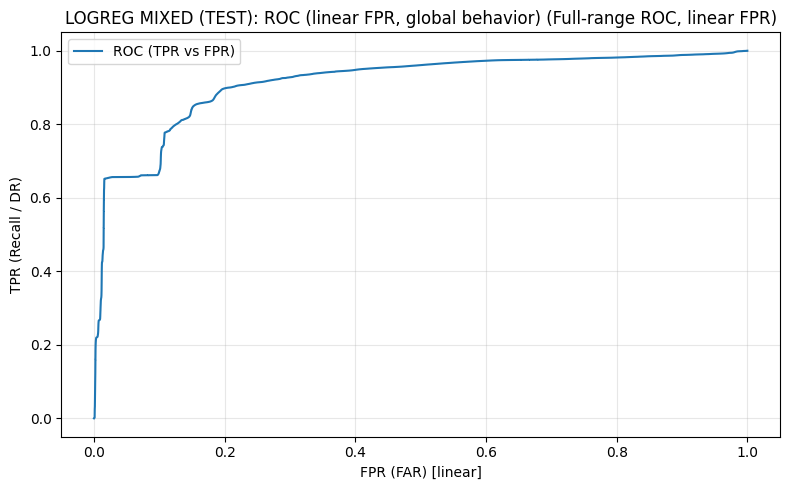

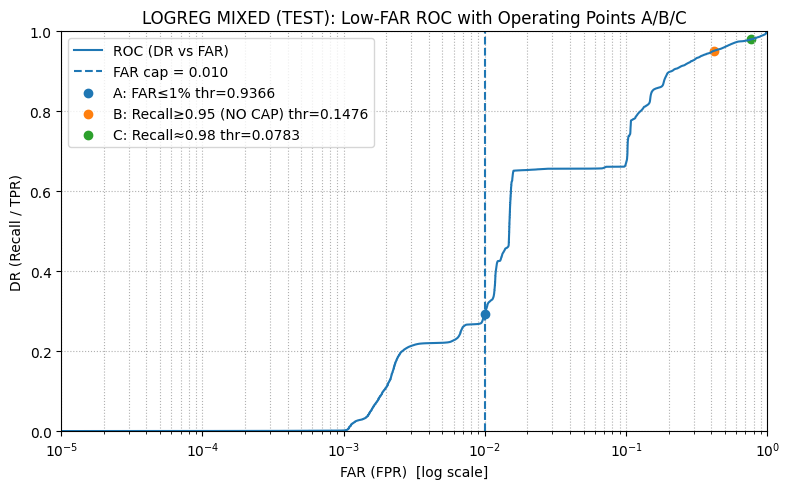

Operating Point A (FAR capped): {'thr': 0.9366336242426135, 'tn': 1055168, 'fp': 10634, 'fn': 188026, 'tp': 78079, 'precision_pos': 0.8801303078466516, 'recall_pos': 0.2934142537720073, 'f1_pos': 0.4401073226273752, 'macro_f1': 0.6770349640097512, 'fpr': 0.009977462980928916, 'fnr': 0.7065857462279928, 'mcc': 0.45452515040599833, 'balanced_acc': 0.6417183953955392}
Operating Point B (Recall>=0.95 NO CAP): {'thr': 0.14762794029524076, 'tn': 617908, 'fp': 447894, 'fn': 12938, 'tp': 253167, 'precision_pos': 0.36111978843495784, 'recall_pos': 0.9513800943236692, 'f1_pos': 0.523523366206008, 'macro_f1': 0.6259550809085594, 'fpr': 0.4202412830901049, 'fnr': 0.048619905676330774, 'mcc': 0.42533707411717975, 'balanced_acc': 0.7655694056167821}
FAR cost multiplier (B vs A): 42.12x
Operating Point C (Recall≈0.98): {'thr': 0.07830272169616029, 'tn': 252154, 'fp': 813648, 'fn': 5347, 'tp': 260758, 'precision_pos': 0.24269968708290907, 'recall_pos': 0.9799064279137935, 'f1_pos': 0.3890426859608015,

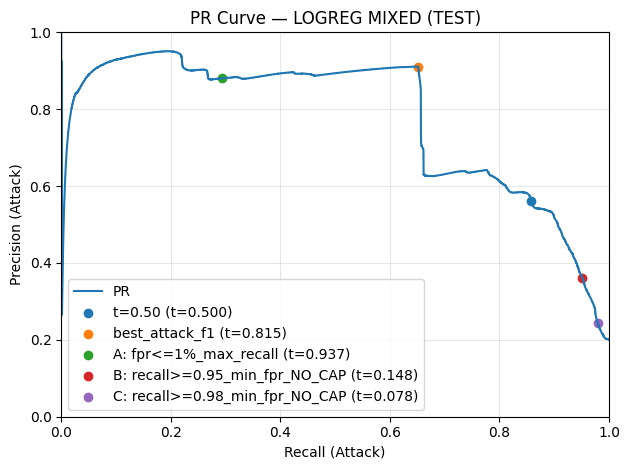

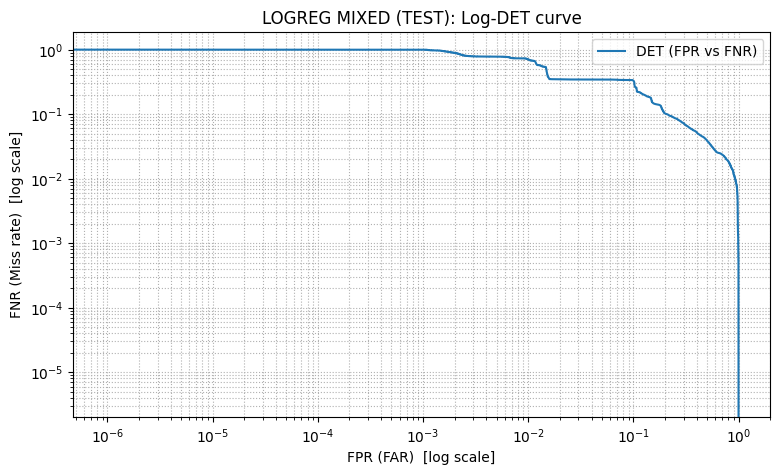

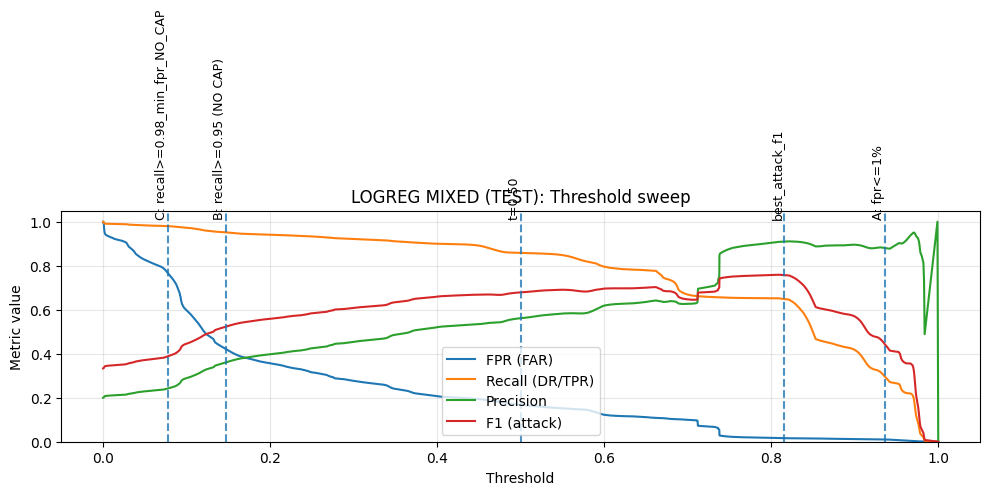

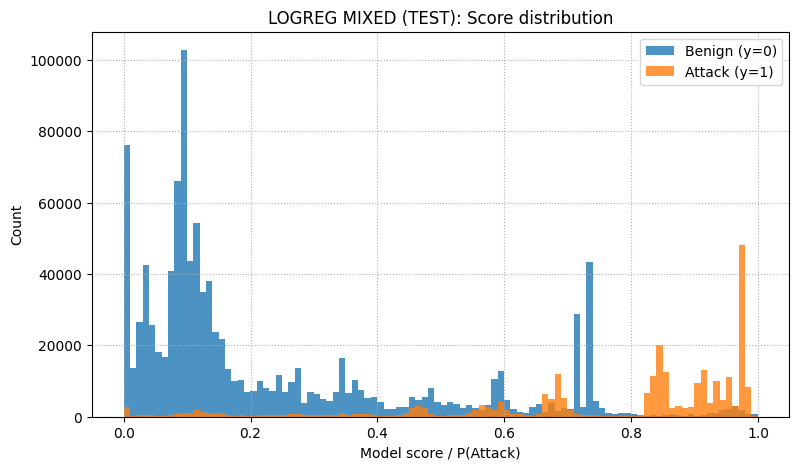


=== MIXED (LOGREG): per-subtype attack recall @ Operating Point A (fpr<=1%) ===


,subtype,n,share_of_attacks,tp,fn,recall
0,DDoS attacks-LOIC-HTTP,114942,0.431942,57830,57112,0.503123
1,DDOS attack-HOIC,40090,0.150655,49,40041,0.001222
2,DoS attacks-Hulk,28936,0.108739,0,28936,0.000000
3,Bot,28902,0.108611,18721,10181,0.647741
4,Infilteration,23508,0.088341,1421,22087,0.060448
5,SSH-Bruteforce,18859,0.070871,0,18859,0.000000
6,DoS attacks-GoldenEye,8197,0.030804,0,8197,0.000000
7,DoS attacks-Slowloris,1997,0.007505,0,1997,0.000000
8,DDOS attack-LOIC-UDP,368,0.001383,0,368,0.000000
9,Brute Force -Web,109,0.000410,26,83,0.238532


In [ ]:
# D) LOGREG MIXED-only FULL run block + required plots


# Reuse helper patches if you already defined them in KNN Block D; define only if missing.

if "_select_r98_threshold_for_plot" not in globals():
    def _select_r98_threshold_for_plot(thresholds_dict):
        thr_cap = thresholds_dict.get("recall>=0.98_min_fpr", None)
        if thr_cap is not None:
            return thr_cap, "recall>=0.98_min_fpr"
        thr_any = thresholds_dict.get("recall>=0.98_min_fpr_NO_CAP", None)
        if thr_any is not None:
            return thr_any, "recall>=0.98_min_fpr_NO_CAP"
        return None, "recall>=0.98_(missing)"

if "metrics_at_threshold" not in globals():
    def metrics_at_threshold(y_true, y_score, thr):
        y_true = np.asarray(y_true).astype(int)
        y_score = np.asarray(y_score, dtype=float)
        thr = float(thr)
        yhat = (y_score >= thr).astype(int)
        tn, fp, fn, tp = confusion_matrix(y_true, yhat, labels=[0, 1]).ravel()
        fpr = fp / (fp + tn + 1e-12)
        fnr = fn / (fn + tp + 1e-12)
        rec = tp / (tp + fn + 1e-12)
        prec = tp / (tp + fp + 1e-12)
        return dict(thr=thr, tn=int(tn), fp=int(fp), fn=int(fn), tp=int(tp),
                    fpr=float(fpr), fnr=float(fnr),
                    recall_pos=float(rec), precision_pos=float(prec))

if "print_operating_points_table" not in globals():
    def print_operating_points_table(y_true, y_score, thresholds_dict, model_name="", sort_by="fpr"):
        rows = []
        for lbl, thr in thresholds_dict.items():
            if thr is None:
                continue
            m = metrics_at_threshold(y_true, y_score, thr)
            m["label"] = lbl
            rows.append(m)
        if not rows:
            print(f"[{model_name}] No operating points to print.")
            return
        import pandas as pd
        df = pd.DataFrame(rows)
        if sort_by in df.columns:
            df = df.sort_values(sort_by, ascending=True)
        cols = ["label", "thr", "fpr", "fnr", "recall_pos", "precision_pos", "tp", "fp", "fn", "tn"]
        cols = [c for c in cols if c in df.columns]
        print(f"\n=== {model_name}: Operating Points (TEST) ===")
        display(df[cols])

if "plot_roc_curve_linear_with_operating_points" not in globals():
    def plot_roc_curve_linear_with_operating_points(y_true, y_score, thresholds_dict=None, model_name="ROC (linear)"):
        y_true = np.asarray(y_true).astype(int)
        y_score = np.asarray(y_score, dtype=float)
        fpr, tpr, _ = roc_curve(y_true, y_score)

        plt.figure(figsize=(8, 5))
        plt.plot(fpr, tpr, label="ROC (linear FPR)")
        if thresholds_dict:
            for lbl, thr in thresholds_dict.items():
                if thr is None:
                    continue
                m = metrics_at_threshold(y_true, y_score, thr)
                plt.scatter([m["fpr"]], [m["recall_pos"]], label=f"{lbl} thr={m['thr']:.4f}")
        plt.xlim(0.0, 1.0)
        plt.ylim(0.0, 1.0)
        plt.xlabel("FPR (FAR)")
        plt.ylabel("TPR (Recall / DR)")
        plt.title(model_name)
        plt.grid(True, linestyle=":")
        plt.legend()
        plt.tight_layout()
        plt.show()

if "plot_low_far_roc_with_ops" not in globals():
    def plot_low_far_roc_with_ops(y_true, y_score, thr_A, thr_B=None, thr_C=None, far_cap=0.01, title=""):
        y_true = np.asarray(y_true).astype(int)
        y_score = np.asarray(y_score, dtype=float)

        fpr_curve, tpr_curve, _ = roc_curve(y_true, y_score)

        A = metrics_at_threshold(y_true, y_score, thr_A) if thr_A is not None else None
        B = metrics_at_threshold(y_true, y_score, thr_B) if thr_B is not None else None
        C = metrics_at_threshold(y_true, y_score, thr_C) if thr_C is not None else None

        plt.figure(figsize=(8, 5))
        plt.plot(fpr_curve, tpr_curve, label="ROC (DR vs FAR)")
        plt.axvline(far_cap, linestyle="--", label=f"FAR cap = {far_cap:.3f}")

        if A is not None:
            plt.scatter([A["fpr"]], [A["recall_pos"]],
                        label=f"A: FAR≤{far_cap:.0%} thr={A['thr']:.4f}")
        if B is not None:
            plt.scatter([B["fpr"]], [B["recall_pos"]],
                        label=f"B: Recall≥0.95 (NO CAP) thr={B['thr']:.4f}")
        if C is not None:
            plt.scatter([C["fpr"]], [C["recall_pos"]],
                        label=f"C: Recall≈0.98 thr={C['thr']:.4f}")

        plt.xscale("log")
        fpr_pos = fpr_curve[fpr_curve > 0]
        left = float(fpr_pos.min()) if fpr_pos.size else 1e-5
        plt.xlim(max(1e-5, left), 1.0)
        plt.ylim(0.0, 1.0)

        plt.xlabel("FAR (FPR)  [log scale]")
        plt.ylabel("DR (Recall / TPR)")
        plt.title(title)
        plt.legend()
        plt.grid(True, which="both", linestyle=":")
        plt.tight_layout()
        plt.show()

        if A is not None:
            print("Operating Point A (FAR capped):", A)
        if B is not None:
            print("Operating Point B (Recall>=0.95 NO CAP):", B)
            if A is not None and A["fpr"] > 0:
                print(f"FAR cost multiplier (B vs A): {B['fpr']/A['fpr']:.2f}x")
        if C is not None:
            print("Operating Point C (Recall≈0.98):", C)
            if A is not None and A["fpr"] > 0:
                print(f"FAR cost multiplier (C vs A): {C['fpr']/A['fpr']:.2f}x")

if "plot_det" not in globals():
    def plot_det(y_true, y_score, title="DET curve (TEST)"):
        y_true = np.asarray(y_true).astype(int)
        y_score = np.asarray(y_score, dtype=float)
        fpr, fnr, _ = det_curve(y_true, y_score)

        plt.figure(figsize=(9, 5))
        plt.plot(fpr, fnr, label="DET (FPR vs FNR)")
        plt.xscale("log")
        plt.yscale("log")
        plt.xlabel("FPR (FAR)  [log scale]")
        plt.ylabel("FNR (Miss rate)  [log scale]")
        plt.title(title)
        plt.grid(True, which="both", linestyle=":")
        plt.legend()
        plt.show()

if "plot_score_hist" not in globals():
    def plot_score_hist(y_true, y_score, title="Score distribution (TEST)", bins=100):
        y_true = np.asarray(y_true).astype(int)
        y_score = np.asarray(y_score, dtype=float)

        plt.figure(figsize=(9, 5))
        plt.hist(y_score[y_true == 0], bins=bins, alpha=0.8, label="Benign (y=0)")
        plt.hist(y_score[y_true == 1], bins=bins, alpha=0.8, label="Attack (y=1)")
        plt.xlabel("Model score / P(Attack)")
        plt.ylabel("Count")
        plt.title(title)
        plt.grid(True, linestyle=":")
        plt.legend()
        plt.show()

if "plot_threshold_sweep_metrics" not in globals():
    def plot_threshold_sweep_metrics(y_true, y_score, thresholds_dict, model_name=""):
        y_true = np.asarray(y_true).astype(int)
        y_score = np.asarray(y_score, dtype=float)

        thr_grid = np.linspace(0.0, 1.0, 200)
        precs, recs, fprs, fnrs = [], [], [], []
        for thr in thr_grid:
            m = metrics_at_threshold(y_true, y_score, thr)
            precs.append(m["precision_pos"])
            recs.append(m["recall_pos"])
            fprs.append(m["fpr"])
            fnrs.append(m["fnr"])

        plt.figure(figsize=(9, 5))
        plt.plot(thr_grid, recs, label="Recall (TPR)")
        plt.plot(thr_grid, precs, label="Precision")
        plt.plot(thr_grid, fprs, label="FPR (FAR)")
        plt.plot(thr_grid, fnrs, label="FNR")

        for lbl, thr in (thresholds_dict or {}).items():
            if thr is None:
                continue
            plt.axvline(float(thr), linestyle="--", label=f"{lbl} thr={float(thr):.4f}")

        plt.xlabel("Threshold")
        plt.ylabel("Metric value")
        plt.title(f"{model_name} (TEST): Threshold sweep")
        plt.grid(True, linestyle=":")
        plt.legend()
        plt.tight_layout()
        plt.show()


# -------------------- RUN MIXED-ONLY (FULL) --------------------
RUN_MODELS["LOGREG"] = True

START_TIME = time.time()
old_do_plots = do_plots
do_plots = False  # plot manually here

split_mode = "MIXED"
kn = get_logreg_mode_knobs(split_mode)

Xtr_raw_m, ytr_m, gtr_m, Xva_raw_m, yva_m, gva_m, Xte_raw_m, yte_m, gte_m, meta_m = build_mixed_fold(
    registry=REGISTRY,
    seed=MIXED_RANDOM_STATE,
    test_size=MIXED_TEST_SIZE,
    val_size=MIXED_VAL_SIZE,
    use_rare_injection=MIXED_USE_RARE_ALLOCATION,
    rare_subtypes=RARE_SUBTYPES,
    rare_n_test=RARE_N_TEST_PER_SUBTYPE,
    rare_n_val=RARE_N_VAL_PER_SUBTYPE,
)
preprocessor_m, prep_dbg_m = build_preprocessor(Xtr_raw_m, meta_m["feature_cols"])
print("MIXED preprocessor debug:", prep_dbg_m)
print("MIXED shapes:", Xtr_raw_m.shape, Xva_raw_m.shape, Xte_raw_m.shape)
print("MIXED n_features:", len(meta_m["feature_cols"]))

logreg_df_m, logreg_best_params_m, logreg_thresholds_m, logreg_feas_m = run_logreg_fold(
    Xtr_raw_m, ytr_m, gtr_m,
    Xva_raw_m, yva_m, gva_m,
    Xte_raw_m, yte_m, gte_m,
    preprocessor_m,
    model_name="LOGREG",
    split_mode="MIXED",
    fast_mode=False,

    fit_cap_final=None,
    val_eval_cap_final=LOGREG_VAL_EVAL_CAP_FINAL,
    test_eval_cap_final=LOGREG_TEST_EVAL_CAP_FINAL,

    max_fpr_cap=MAX_FPR_CAP,

    n_estimators_final=LOGREG_N_ESTIMATORS_FINAL,

    do_calibrate=LOGREG_DO_CALIBRATE,
    cal_method=LOGREG_CAL_METHOD,
    cal_cv=LOGREG_CAL_CV,

    n_iter_logreg=None,
    tune_cap_local=kn["tune_cap"],
    tune_frac_local=kn["tune_frac"],
    cv_splits_local=kn["cv_splits"],
)

logreg_df_m = logreg_df_m.copy()
logreg_df_m["test_day"] = "MIXED"
logreg_df_m["split_mode"] = "MIXED"

print("\n=== MIXED (LOGREG): best_params ===")
print(logreg_best_params_m)
print("\n=== MIXED (LOGREG): thresholds (picked on VAL) ===")
print(logreg_thresholds_m)
print("\n=== MIXED (LOGREG): feasibility ===")
print({k: v for k, v in logreg_feas_m.items() if k != "__artifacts__"})

display(logreg_df_m)

elapsed = time.time() - START_TIME
print(f"\nTotal time elapsed for LOGREG MIXED-only run: {elapsed/60:.2f} minutes")


# -------------------- REQUIRED PLOTS / MIXED SPLIT ONLY --------------------
art = logreg_feas_m.get("__artifacts__", {})
yte_eval_m = art.get("yte_eval", None)
score_te_m = art.get("score_te", None)

if yte_eval_m is not None and score_te_m is not None:

    thr_A = logreg_thresholds_m.get("fpr<=1%_max_recall", None)
    thr_B = logreg_thresholds_m.get("recall>=0.95_min_fpr_NO_CAP", None)
    thr_C, thr_C_label = _select_r98_threshold_for_plot(logreg_thresholds_m)

    op_table_dict = {
        "t=0.50": logreg_thresholds_m.get("t=0.50"),
        "best_attack_f1": logreg_thresholds_m.get("best_attack_f1"),
        "A (FPR<=1%)": thr_A,
        "B (Recall>=0.95 NO CAP)": thr_B,
        "C (Recall>=0.98)": thr_C,
    }

    print_operating_points_table(yte_eval_m, score_te_m, op_table_dict, model_name="LOGREG MIXED", sort_by="fpr")

    # 1) Linear ROC (global behavior) — no markers
    plot_roc_curve_linear_with_operating_points(
        yte_eval_m, score_te_m,
        thresholds_dict={},
        model_name="LOGREG MIXED (TEST): ROC (linear FPR, global behavior)"
    )

    # 2) Low-FAR ROC with A/B/C
    if thr_A is not None:
        plot_low_far_roc_with_ops(
            yte_eval_m, score_te_m,
            thr_A=thr_A,
            thr_B=(thr_B if thr_B is not None else None),
            thr_C=(thr_C if thr_C is not None else None),
            far_cap=MAX_FPR_CAP,
            title="LOGREG MIXED (TEST): Low-FAR ROC with Operating Points A/B/C"
        )

    # 3) PR curve with thresholds marked (your helper)
    thr_dict_for_pr = {
        "t=0.50": logreg_thresholds_m.get("t=0.50"),
        "best_attack_f1": logreg_thresholds_m.get("best_attack_f1"),
        "A: fpr<=1%_max_recall": logreg_thresholds_m.get("fpr<=1%_max_recall"),
        "B: recall>=0.95_min_fpr_NO_CAP": logreg_thresholds_m.get("recall>=0.95_min_fpr_NO_CAP"),
    }
    if thr_C is not None:
        thr_dict_for_pr[f"C: {thr_C_label}"] = thr_C

    plot_pr_curve_with_thresholds(
        yte_eval_m, score_te_m,
        thr_dict_for_pr,
        model_name="LOGREG MIXED (TEST)"
    )

    # 4) Log-DET
    plot_det(yte_eval_m, score_te_m, title="LOGREG MIXED (TEST): Log-DET curve")

    # 5) Threshold sweep
    thr_dict_for_sweep = {
        "t=0.50": logreg_thresholds_m.get("t=0.50"),
        "best_attack_f1": logreg_thresholds_m.get("best_attack_f1"),
        "A: fpr<=1%": logreg_thresholds_m.get("fpr<=1%_max_recall"),
        "B: recall>=0.95 (NO CAP)": logreg_thresholds_m.get("recall>=0.95_min_fpr_NO_CAP"),
    }
    if thr_C is not None:
        thr_dict_for_sweep[f"C: {thr_C_label}"] = thr_C

    plot_threshold_sweep_metrics(yte_eval_m, score_te_m, thr_dict_for_sweep, model_name="LOGREG MIXED")

    # 6) Score distribution
    plot_score_hist(yte_eval_m, score_te_m, title="LOGREG MIXED (TEST): Score distribution", bins=100)

    # 7) Per-subtype recall @ A (if your helper + label_raw_test exist)
    label_raw_test = meta_m.get("label_raw_test", None) if "meta_m" in globals() else None
    if "per_subtype_attack_recall" in globals() and thr_A is not None and label_raw_test is not None:
        subtype_df = per_subtype_attack_recall(
            y_true=np.asarray(yte_eval_m),
            y_score=np.asarray(score_te_m),
            thr=float(thr_A),
            label_raw=np.asarray(label_raw_test),
        )
        print("\n=== MIXED (LOGREG): per-subtype attack recall @ Operating Point A (fpr<=1%) ===")
        display(subtype_df)

do_plots = old_do_plots


In [ ]:
# E) LOGREG outer loop (LODO) + append MIXED 
# Requires that Block D has already run and created:
#   logreg_df_m, logreg_best_params_m, logreg_thresholds_m, logreg_feas_m


do_plots_loop = False
old_do_plots = do_plots
do_plots = do_plots_loop

all_rows = []
best_params_log = []
feas_rows = []

# ---------- LODO loop ----------
RUN_MODELS["LOGREG"] = True

START_TIME = time.time()

for test_day in TEST_DAYS:
    Xtr_raw, ytr, gtr, Xva_raw, yva, gva, Xte_raw, yte, gte, meta = build_fold(
        registry=REGISTRY, val_days=VAL_DAYS, test_day=test_day
    )
    preprocessor, prep_dbg = build_preprocessor(Xtr_raw, meta["feature_cols"])

    if RUN_MODELS.get("LOGREG", False):
        split_mode = "LODO"
        kn = get_logreg_mode_knobs(split_mode)

        logreg_df, logreg_best_params, logreg_thresholds, logreg_feas = run_logreg_fold(
            Xtr_raw, ytr, gtr,
            Xva_raw, yva, gva,
            Xte_raw, yte, gte,
            preprocessor,
            model_name="LOGREG",
            split_mode="LODO",
            fast_mode=False,

            fit_cap_final=None,
            val_eval_cap_final=LOGREG_VAL_EVAL_CAP_FINAL,
            test_eval_cap_final=LOGREG_TEST_EVAL_CAP_FINAL,
            n_estimators_final=LOGREG_N_ESTIMATORS_FINAL,
            max_fpr_cap=MAX_FPR_CAP,

            # explicit mode knobs like XGB
            n_iter_logreg=kn["n_iter"],
            tune_cap_local=kn["tune_cap"],
            tune_frac_local=kn["tune_frac"],
            cv_splits_local=kn["cv_splits"],

            do_calibrate=LOGREG_DO_CALIBRATE,
            cal_method=LOGREG_CAL_METHOD,
            cal_cv=LOGREG_CAL_CV,
        )

        logreg_df = logreg_df.copy()
        logreg_df["test_day"] = test_day
        logreg_df["split_mode"] = "LODO"
        all_rows.append(logreg_df)

        best_params_log.append({
            "model": "LOGREG",
            "test_day": test_day,
            "split_mode": "LODO",
            "best_params": logreg_best_params
        })

        for lbl in ["fpr<=1%_max_recall", "recall>=0.95_min_fpr", "recall>=0.98_min_fpr"]:
            feas_rows.append({
                "model": "LOGREG",
                "test_day": test_day,
                "split_mode": "LODO",
                "thr_label": lbl,
                "feasible": bool(logreg_feas.get(lbl, False))
            })

if not all_rows:
    print("No LODO rows collected. Check RUN_MODELS and loop execution.")
    do_plots = old_do_plots
    raise SystemExit

results_logreg_lodo = pd.concat(all_rows, ignore_index=True)

# ---------- Append MIXED from Block D (NO recompute) ----------
if RUN_MODELS.get("LOGREG", False):
    required = ["logreg_df_m", "logreg_best_params_m", "logreg_thresholds_m", "logreg_feas_m"]
    missing = [v for v in required if v not in globals()]
    if missing:
        raise RuntimeError(
            "Block D (LOGREG MIXED-only FULL run) must run before Block E so we can append MIXED without recomputing.\n"
            f"Missing variables: {missing}"
        )

    logreg_df_m_app = logreg_df_m.copy()
    logreg_df_m_app["test_day"] = "MIXED"
    logreg_df_m_app["split_mode"] = "MIXED"

    results_logreg = pd.concat([results_logreg_lodo, logreg_df_m_app], ignore_index=True)

    best_params_log.append({
        "model": "LOGREG",
        "test_day": "MIXED",
        "split_mode": "MIXED",
        "best_params": logreg_best_params_m
    })

    for lbl in ["fpr<=1%_max_recall", "recall>=0.95_min_fpr", "recall>=0.98_min_fpr"]:
        feas_rows.append({
            "model": "LOGREG",
            "test_day": "MIXED",
            "split_mode": "MIXED",
            "thr_label": lbl,
            "feasible": bool(logreg_feas_m.get(lbl, False))
        })
else:
    results_logreg = results_logreg_lodo

display(results_logreg.head(80))
elapsed = time.time() - START_TIME
print(f"\nTotal time elapsed for LOGREG LODO loop + MIXED append: {elapsed/60:.2f} minutes")

# ---------- Best params / feasibility summaries ----------
best_params_logreg = pd.DataFrame(best_params_log)
display(best_params_logreg)

for _, r in best_params_logreg.iterrows():
    print(f"\n[{r['model']}] test_day={r['test_day']} split_mode={r['split_mode']}")
    pprint(r["best_params"])
    print("-" * 80)

feas_logreg = pd.DataFrame(feas_rows)
feas_summary_logreg = (
    feas_logreg.groupby(["model", "split_mode", "thr_label"])
    .agg(
        feasible_days=("feasible", "sum"),
        total_days=("feasible", "count"),
        feasibility_rate=("feasible", "mean")
    )
    .reset_index()
)
display(feas_summary_logreg)

# ---------- Summary block (split-aware) for MAIN threshold ----------
MAIN_THR_LABEL = "fpr<=1%_max_recall"

def iqr(s): return float(s.quantile(0.75) - s.quantile(0.25))
def q25(s): return float(s.quantile(0.25))
def q75(s): return float(s.quantile(0.75))

sel = results_logreg[results_logreg["thr_label"] == MAIN_THR_LABEL].copy()

if sel.empty:
    print("No rows for MAIN_THR_LABEL =", MAIN_THR_LABEL)
else:
    violation_df = (
        sel.assign(fpr_violation=lambda d: d["fpr"] > MAX_FPR_CAP)
          .groupby(["model", "split_mode"])
          .agg(
              test_days=("test_day", "nunique"),
              violation_days=("fpr_violation", "sum"),
              violation_rate=("fpr_violation", "mean")
          )
          .reset_index()
    )
    display(violation_df)

    summary_logreg = sel.groupby(["model", "split_mode"]).agg(
        n_folds=("test_day", "nunique"),

        pr_auc_mean=("pr_auc", "mean"), pr_auc_std=("pr_auc", "std"),
        roc_auc_mean=("roc_auc", "mean"), roc_auc_std=("roc_auc", "std"),
        mcc_mean=("mcc", "mean"),       mcc_std=("mcc", "std"),
        f1_mean=("f1_pos", "mean"),     f1_std=("f1_pos", "std"),
        recall_mean=("recall_pos", "mean"), recall_std=("recall_pos", "std"),
        precision_mean=("precision_pos", "mean"), precision_std=("precision_pos", "std"),
        fpr_mean=("fpr", "mean"),       fpr_std=("fpr", "std"),
        fnr_mean=("fnr", "mean"),       fnr_std=("fnr", "std"),

        pr_auc_median=("pr_auc", "median"),
        f1_median=("f1_pos", "median"),
        recall_median=("recall_pos", "median"),
        precision_median=("precision_pos", "median"),
        fpr_median=("fpr", "median"),
        fnr_median=("fnr", "median"),
        mcc_median=("mcc", "median"),

        pr_auc_q25=("pr_auc", q25), pr_auc_q75=("pr_auc", q75), pr_auc_iqr=("pr_auc", iqr),
        f1_q25=("f1_pos", q25),     f1_q75=("f1_pos", q75),     f1_iqr=("f1_pos", iqr),
        recall_q25=("recall_pos", q25), recall_q75=("recall_pos", q75), recall_iqr=("recall_pos", iqr),
        precision_q25=("precision_pos", q25), precision_q75=("precision_pos", q75), precision_iqr=("precision_pos", iqr),
        fpr_q25=("fpr", q25),       fpr_q75=("fpr", q75),       fpr_iqr=("fpr", iqr),

        pr_auc_min=("pr_auc", "min"), pr_auc_max=("pr_auc", "max"),
        f1_min=("f1_pos", "min"),     f1_max=("f1_pos", "max"),
        recall_min=("recall_pos", "min"), recall_max=("recall_pos", "max"),
        precision_min=("precision_pos", "min"), precision_max=("precision_pos", "max"),
        fpr_min=("fpr", "min"),       fpr_max=("fpr", "max"),
        mcc_min=("mcc", "min"),       mcc_max=("mcc", "max"),
    ).reset_index()

    display(summary_logreg)

do_plots = old_do_plots


In [ ]:
# F) POST-LODO PLOTTING 

MAIN_THR_LABEL = "fpr<=1%_max_recall"
PICK_METRIC = "pr_auc"   # median/worst by pr_auc

# ---------- FILL-IN (change for each model) ----------

MODEL_NAME = "LOGREG"                  # e.g., "KNN", "DT", "ET", "RF"
DF_LODO     = results_logreg_lodo       # our LODO results df for this model (ONLY LODO)
RUN_FOLD_FN = run_logreg_fold           # the model runner function (must match run_*_fold signature)

KNOBS_FN    = get_logreg_mode_knobs
kn = KNOBS_FN("LODO")

RUNNER_KWARGS = dict(
    # keep aligned with our runner signature
    fit_cap_final=None,
    val_eval_cap_final=LOGREG_VAL_EVAL_CAP_FINAL,
    test_eval_cap_final=LOGREG_TEST_EVAL_CAP_FINAL,
    do_calibrate=LOGREG_DO_CALIBRATE,
    cal_method=LOGREG_CAL_METHOD,
    cal_cv=LOGREG_CAL_CV,

    # if our runner uses mode knobs (optional; safe because we filter kwargs)
    tune_cap_local=kn["tune_cap"],
    tune_frac_local=kn["tune_frac"],
    cv_splits_local=kn["cv_splits"],
    # n_iter_* key depends on the runner; include it if our runner has it
    n_iter_logreg=kn["n_iter"],
)

# ---------- END FILL-IN ----------


# 1) Boxplots across days (ONLY 4 metrics)
plot_lodo_distributions_for_model(
    DF_LODO, model_name=MODEL_NAME,
    thr_label=MAIN_THR_LABEL,
    fpr_cap=MAX_FPR_CAP,
    metrics=("pr_auc", "recall_pos", "fpr", "mcc")
)

# 2) Representative days (worst + median + best)
picks_df, rep_days = pick_best_median_worst_days_for_model(
    DF_LODO,
    model_name=MODEL_NAME,
    thr_label=MAIN_THR_LABEL,
    metric=PICK_METRIC
)
print(f"\n[{MODEL_NAME}] Representative days (worst + median + best) by {PICK_METRIC}:")
display(picks_df)
print(f"[{MODEL_NAME}] rep_days =", rep_days)

# 3) Representative-day plots: ONLY PR (+ markers) and Low-FAR ROC (log FPR) + A
replot_representative_days_lodo_minimal(
    model_name=MODEL_NAME,
    rep_days=rep_days,
    run_fold_fn=RUN_FOLD_FN,
    runner_kwargs=RUNNER_KWARGS,
    far_cap=MAX_FPR_CAP,
    thr_label_A="fpr<=1%_max_recall"
)

# END OF LOGREG PIPELINE 